## Bidirectional LSTM model na predikciu hodnot DST o 1 hodinu dopredu na zaklade 24-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+1_24H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-25 17:53:47.242284: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 1
y_col = f"DST+{shift}"

n_input = 24
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  24


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 24, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 24, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 24, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 24, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 24)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              25 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,394 (1.26 MB)

 Trainable params: 330,394 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10:58 9s/step - loss: 0.6880 - mae: 0.7061

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 186ms/step - loss: 0.7959 - mae: 0.6856

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 185ms/step - loss: 0.7904 - mae: 0.6678

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 183ms/step - loss: 0.7952 - mae: 0.6638

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 182ms/step - loss: 0.7749 - mae: 0.6488

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 181ms/step - loss: 0.7550 - mae: 0.6354

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 180ms/step - loss: 0.7320 - mae: 0.6212

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 178ms/step - loss: 0.7170 - mae: 0.6120

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 178ms/step - loss: 0.6990 - mae: 0.6011

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 177ms/step - loss: 0.6804 - mae: 0.5899

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 176ms/step - loss: 0.6628 - mae: 0.5795

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 176ms/step - loss: 0.6460 - mae: 0.5698

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 176ms/step - loss: 0.6299 - mae: 0.5608

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 176ms/step - loss: 0.6183 - mae: 0.5536

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.6077 - mae: 0.5470

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 174ms/step - loss: 0.5986 - mae: 0.5414

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.5895 - mae: 0.5360

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.5970 - mae: 0.5334

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.6026 - mae: 0.5309

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.6061 - mae: 0.5281

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.6092 - mae: 0.5255

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 174ms/step - loss: 0.6117 - mae: 0.5233

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 174ms/step - loss: 0.6159 - mae: 0.5218

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 174ms/step - loss: 0.6190 - mae: 0.5203

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 174ms/step - loss: 0.6211 - mae: 0.5186

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 174ms/step - loss: 0.6226 - mae: 0.5171

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 174ms/step - loss: 0.6233 - mae: 0.5154

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 174ms/step - loss: 0.6234 - mae: 0.5136

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.6230 - mae: 0.5118

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.6226 - mae: 0.5101

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 173ms/step - loss: 0.6219 - mae: 0.5083

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 173ms/step - loss: 0.6206 - mae: 0.5065

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 173ms/step - loss: 0.6192 - mae: 0.5047

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 173ms/step - loss: 0.6179 - mae: 0.5031

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 172ms/step - loss: 0.6164 - mae: 0.5015

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.6161 - mae: 0.5002

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.6158 - mae: 0.4989

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.6152 - mae: 0.4977

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.6144 - mae: 0.4964

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.6134 - mae: 0.4951

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.6123 - mae: 0.4938

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.6111 - mae: 0.4926

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.6096 - mae: 0.4913

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.6080 - mae: 0.4899

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.6066 - mae: 0.4888

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.6050 - mae: 0.4875

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.6033 - mae: 0.4863

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.6016 - mae: 0.4851

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5997 - mae: 0.4838

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5979 - mae: 0.4826

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5960 - mae: 0.4814

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5941 - mae: 0.4802

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.5922 - mae: 0.4790

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5903 - mae: 0.4778

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5883 - mae: 0.4766

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5863 - mae: 0.4754

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5844 - mae: 0.4743

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5825 - mae: 0.4732

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.5806 - mae: 0.4721

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.5787 - mae: 0.4710

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.5772 - mae: 0.4700

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.5758 - mae: 0.4691

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.5742 - mae: 0.4681

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.5727 - mae: 0.4671

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.5711 - mae: 0.4662

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.5694 - mae: 0.4652

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.5678 - mae: 0.4642

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.5661 - mae: 0.4633

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.5647 - mae: 0.4625

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.5634 - mae: 0.4617

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 172ms/step - loss: 0.5621 - mae: 0.4610

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 172ms/step - loss: 0.5608 - mae: 0.4603

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 172ms/step - loss: 0.5595 - mae: 0.4595

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 172ms/step - loss: 0.5582 - mae: 0.4589

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 172ms/step - loss: 0.5569 - mae: 0.4582

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 172ms/step - loss: 0.5556 - mae: 0.4575

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 172ms/step - loss: 0.5545 - mae: 0.4570

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 172ms/step - loss: 0.5533 - mae: 0.4564

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 172ms/step - loss: 0.5522 - mae: 0.4558

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 172ms/step - loss: 0.5510 - mae: 0.4553

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 172ms/step - loss: 0.5499 - mae: 0.4547

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 171ms/step - loss: 0.5488 - mae: 0.4542

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 171ms/step - loss: 0.5477 - mae: 0.4537

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 172ms/step - loss: 0.5465 - mae: 0.4532

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 171ms/step - loss: 0.5454 - mae: 0.4526

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.5442 - mae: 0.4521

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.5431 - mae: 0.4516

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.5419 - mae: 0.4510

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.5407 - mae: 0.4505

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.5395 - mae: 0.4500

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.5384 - mae: 0.4495

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.5372 - mae: 0.4489

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.5360 - mae: 0.4484

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.5348 - mae: 0.4479

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.5335 - mae: 0.4473

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.5323 - mae: 0.4468

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.5311 - mae: 0.4462

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.5299 - mae: 0.4457

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.5287 - mae: 0.4452

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.5275 - mae: 0.4446

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.5264 - mae: 0.4441

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.5252 - mae: 0.4436

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.5242 - mae: 0.4431

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.5233 - mae: 0.4427

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.5223 - mae: 0.4422

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.5213 - mae: 0.4417

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.5203 - mae: 0.4413

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.5194 - mae: 0.4408

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.5184 - mae: 0.4404

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.5175 - mae: 0.4400

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.5166 - mae: 0.4396

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.5156 - mae: 0.4392

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.5147 - mae: 0.4388

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.5137 - mae: 0.4383

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.5128 - mae: 0.4379

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.5118 - mae: 0.4375

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.5109 - mae: 0.4371

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.5099 - mae: 0.4367

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.5091 - mae: 0.4363

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.5082 - mae: 0.4359

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.5073 - mae: 0.4355

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.5064 - mae: 0.4351

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.5056 - mae: 0.4347

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 171ms/step - loss: 0.5047 - mae: 0.4343

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 171ms/step - loss: 0.5038 - mae: 0.4339

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 171ms/step - loss: 0.5030 - mae: 0.4335

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 171ms/step - loss: 0.5021 - mae: 0.4331

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 171ms/step - loss: 0.5012 - mae: 0.4327

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.5003 - mae: 0.4323

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.4994 - mae: 0.4319

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.4986 - mae: 0.4316

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.4977 - mae: 0.4312

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.4968 - mae: 0.4308

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.4960 - mae: 0.4304

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.4952 - mae: 0.4300

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.4943 - mae: 0.4297

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.4935 - mae: 0.4293

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.4927 - mae: 0.4289

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.4918 - mae: 0.4286

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.4910 - mae: 0.4282

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.4902 - mae: 0.4278

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.4894 - mae: 0.4275

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.4886 - mae: 0.4271

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.4878 - mae: 0.4268

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.4870 - mae: 0.4264

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.4863 - mae: 0.4261

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 171ms/step - loss: 0.4856 - mae: 0.4258

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 171ms/step - loss: 0.4849 - mae: 0.4254

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 171ms/step - loss: 0.4841 - mae: 0.4251

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 171ms/step - loss: 0.4834 - mae: 0.4248

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 171ms/step - loss: 0.4827 - mae: 0.4244

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 171ms/step - loss: 0.4820 - mae: 0.4241

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 171ms/step - loss: 0.4814 - mae: 0.4238

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 171ms/step - loss: 0.4807 - mae: 0.4235

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 171ms/step - loss: 0.4801 - mae: 0.4232

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 171ms/step - loss: 0.4794 - mae: 0.4229

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 171ms/step - loss: 0.4788 - mae: 0.4226

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 171ms/step - loss: 0.4782 - mae: 0.4223

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 171ms/step - loss: 0.4776 - mae: 0.4221

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 171ms/step - loss: 0.4770 - mae: 0.4218

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 171ms/step - loss: 0.4765 - mae: 0.4215

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 171ms/step - loss: 0.4759 - mae: 0.4212

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 171ms/step - loss: 0.4753 - mae: 0.4210

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.4748 - mae: 0.4207

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.4742 - mae: 0.4204

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.4737 - mae: 0.4202

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.4731 - mae: 0.4199

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.4726 - mae: 0.4196

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 171ms/step - loss: 0.4722 - mae: 0.4194

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 171ms/step - loss: 0.4717 - mae: 0.4191

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 171ms/step - loss: 0.4712 - mae: 0.4189

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 171ms/step - loss: 0.4707 - mae: 0.4186

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 171ms/step - loss: 0.4702 - mae: 0.4183

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 171ms/step - loss: 0.4697 - mae: 0.4181

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 171ms/step - loss: 0.4692 - mae: 0.4178

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 171ms/step - loss: 0.4688 - mae: 0.4176

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 171ms/step - loss: 0.4683 - mae: 0.4173

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 171ms/step - loss: 0.4678 - mae: 0.4171

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 171ms/step - loss: 0.4673 - mae: 0.4168

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 171ms/step - loss: 0.4668 - mae: 0.4166

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 171ms/step - loss: 0.4663 - mae: 0.4163

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 171ms/step - loss: 0.4658 - mae: 0.4160

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 171ms/step - loss: 0.4653 - mae: 0.4158

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 171ms/step - loss: 0.4648 - mae: 0.4155

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 171ms/step - loss: 0.4643 - mae: 0.4153

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 171ms/step - loss: 0.4638 - mae: 0.4150

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 171ms/step - loss: 0.4633 - mae: 0.4148

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 171ms/step - loss: 0.4628 - mae: 0.4146

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 171ms/step - loss: 0.4623 - mae: 0.4143

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 170ms/step - loss: 0.4619 - mae: 0.4141

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 170ms/step - loss: 0.4614 - mae: 0.4138

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.4609 - mae: 0.4136

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.4604 - mae: 0.4133

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.4600 - mae: 0.4131

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.4595 - mae: 0.4129

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.4591 - mae: 0.4126

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.4586 - mae: 0.4124

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.4582 - mae: 0.4122

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.4578 - mae: 0.4120

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.4573 - mae: 0.4117

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 170ms/step - loss: 0.4569 - mae: 0.4115

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 170ms/step - loss: 0.4565 - mae: 0.4113

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 170ms/step - loss: 0.4561 - mae: 0.4111

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 170ms/step - loss: 0.4556 - mae: 0.4109

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 170ms/step - loss: 0.4552 - mae: 0.4106

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 170ms/step - loss: 0.4548 - mae: 0.4104

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.4544 - mae: 0.4102

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.4540 - mae: 0.4100

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.4536 - mae: 0.4098

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.4532 - mae: 0.4096

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.4528 - mae: 0.4094

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.4524 - mae: 0.4091

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.4520 - mae: 0.4089

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.4515 - mae: 0.4087

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.4511 - mae: 0.4085

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 169ms/step - loss: 0.4507 - mae: 0.4083

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 169ms/step - loss: 0.4503 - mae: 0.4081

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 169ms/step - loss: 0.4499 - mae: 0.4079

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 169ms/step - loss: 0.4495 - mae: 0.4077

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 169ms/step - loss: 0.4491 - mae: 0.4075

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.4487 - mae: 0.4073

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.4483 - mae: 0.4071

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.4479 - mae: 0.4069

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.4475 - mae: 0.4067

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.4471 - mae: 0.4065

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.4467 - mae: 0.4063

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.4463 - mae: 0.4061

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.4459 - mae: 0.4059

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.4455 - mae: 0.4057

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.4451 - mae: 0.4056

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.4447 - mae: 0.4054

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.4443 - mae: 0.4052

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.4439 - mae: 0.4050

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.4436 - mae: 0.4048

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.4432 - mae: 0.4046

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.4428 - mae: 0.4044

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.4424 - mae: 0.4042

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.4420 - mae: 0.4040

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.4416 - mae: 0.4038

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.4412 - mae: 0.4036

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4408 - mae: 0.4034

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4404 - mae: 0.4032

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4400 - mae: 0.4031

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4396 - mae: 0.4029

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.4392 - mae: 0.4027

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.4388 - mae: 0.4025

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.4384 - mae: 0.4023

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.4381 - mae: 0.4021

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.4377 - mae: 0.4019

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.4373 - mae: 0.4018

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.4370 - mae: 0.4016

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.4366 - mae: 0.4014

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.4363 - mae: 0.4012

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.4359 - mae: 0.4011

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.4355 - mae: 0.4009

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.4352 - mae: 0.4007

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.4348 - mae: 0.4005

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.4344 - mae: 0.4004

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.4341 - mae: 0.4002

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.4337 - mae: 0.4000

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.4334 - mae: 0.3998

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.4330 - mae: 0.3997

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.4326 - mae: 0.3995

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.4323 - mae: 0.3993

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.4319 - mae: 0.3991

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.4316 - mae: 0.3990

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.4312 - mae: 0.3988

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.4308 - mae: 0.3986

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.4305 - mae: 0.3984

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.4301 - mae: 0.3983

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.4298 - mae: 0.3981

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.4294 - mae: 0.3979

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.4290 - mae: 0.3978

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.4287 - mae: 0.3976

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.4283 - mae: 0.3974

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.4280 - mae: 0.3973

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.4276 - mae: 0.3971

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.4273 - mae: 0.3969

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.4269 - mae: 0.3968

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.4266 - mae: 0.3966

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.4262 - mae: 0.3964

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.4259 - mae: 0.3963

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.4255 - mae: 0.3961

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.4252 - mae: 0.3959

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.4249 - mae: 0.3958

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.4245 - mae: 0.3956

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.4242 - mae: 0.3954

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.4238 - mae: 0.3953

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.4235 - mae: 0.3951

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.4231 - mae: 0.3949

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.4228 - mae: 0.3948

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.4225 - mae: 0.3946

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.4221 - mae: 0.3945

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.4218 - mae: 0.3943

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.4214 - mae: 0.3941

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.4211 - mae: 0.3940

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.4207 - mae: 0.3938

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.4204 - mae: 0.3936

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.4201 - mae: 0.3935

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.4197 - mae: 0.3933

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.4194 - mae: 0.3932

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.4191 - mae: 0.3930

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.4187 - mae: 0.3928

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.4184 - mae: 0.3927

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.4181 - mae: 0.3925

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.4177 - mae: 0.3924

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4174 - mae: 0.3922

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4171 - mae: 0.3921

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4167 - mae: 0.3919

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4164 - mae: 0.3917

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4161 - mae: 0.3916

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4157 - mae: 0.3914

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.4154 - mae: 0.3913

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4151 - mae: 0.3911

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4147 - mae: 0.3909

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4144 - mae: 0.3908

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4141 - mae: 0.3906

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4137 - mae: 0.3905

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.4134 - mae: 0.3903

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4131 - mae: 0.3902

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4127 - mae: 0.3900

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4124 - mae: 0.3898

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4121 - mae: 0.3897

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4118 - mae: 0.3895

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4114 - mae: 0.3894

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.4111 - mae: 0.3892

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.4108 - mae: 0.3891

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.4105 - mae: 0.3889

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.4101 - mae: 0.3888

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.4098 - mae: 0.3886

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.4095 - mae: 0.3884

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.4092 - mae: 0.3883

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.4089 - mae: 0.3881

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.4086 - mae: 0.3880

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.4082 - mae: 0.3878

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.4079 - mae: 0.3877

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.4076 - mae: 0.3875

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.4073 - mae: 0.3874

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.4070 - mae: 0.3872

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.4067 - mae: 0.3871

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 168ms/step - loss: 0.4064 - mae: 0.3869

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4061 - mae: 0.3868

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4057 - mae: 0.3866

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4054 - mae: 0.3865

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4051 - mae: 0.3863

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4048 - mae: 0.3862

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.4045 - mae: 0.3860

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4042 - mae: 0.3859

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4039 - mae: 0.3857

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4036 - mae: 0.3856

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4033 - mae: 0.3855

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4030 - mae: 0.3853

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.4027 - mae: 0.3852

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4025 - mae: 0.3850

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4022 - mae: 0.3849

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4019 - mae: 0.3847

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4016 - mae: 0.3846

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.4013 - mae: 0.3845

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.4010 - mae: 0.3843

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.4007 - mae: 0.3842

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.4004 - mae: 0.3840

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.4001 - mae: 0.3839

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.3998 - mae: 0.3837

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.3995 - mae: 0.3836

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.3992 - mae: 0.3835

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.3990 - mae: 0.3833

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.3987 - mae: 0.3832

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.3984 - mae: 0.3830

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.3981 - mae: 0.3829

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.3978 - mae: 0.3828

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.3975 - mae: 0.3826

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.3972 - mae: 0.3825

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.3969 - mae: 0.3823

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.3967 - mae: 0.3822

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.3964 - mae: 0.3821

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.3961 - mae: 0.3819

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.3958 - mae: 0.3818

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.3955 - mae: 0.3817

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.3952 - mae: 0.3815

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.3950 - mae: 0.3814

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.3947 - mae: 0.3812

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.3944 - mae: 0.3811

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.3941 - mae: 0.3810

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.3939 - mae: 0.3808

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.3936 - mae: 0.3807

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.3933 - mae: 0.3806

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.3930 - mae: 0.3804

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.3927 - mae: 0.3803

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.3925 - mae: 0.3802

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.3922 - mae: 0.3800

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.3919 - mae: 0.3799

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.3916 - mae: 0.3798

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.3914 - mae: 0.3796

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.3911 - mae: 0.3795

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.3908 - mae: 0.3794

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.3905 - mae: 0.3792

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.3903 - mae: 0.3791

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.3900 - mae: 0.3790

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.3897 - mae: 0.3788

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.3895 - mae: 0.3787

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.3892 - mae: 0.3786

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.3889 - mae: 0.3784

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.3887 - mae: 0.3783

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.3884 - mae: 0.3782

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.3881 - mae: 0.3780

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.3879 - mae: 0.3779

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.3876 - mae: 0.3778

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.3873 - mae: 0.3776

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.3871 - mae: 0.3775

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.3868 - mae: 0.3774

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.3865 - mae: 0.3773

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.3863 - mae: 0.3771

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.3860 - mae: 0.3770

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.3857 - mae: 0.3769

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.3855 - mae: 0.3767

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.3852 - mae: 0.3766

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.3849 - mae: 0.3765

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.3847 - mae: 0.3764

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.3844 - mae: 0.3762

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.3842 - mae: 0.3761

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.3839 - mae: 0.3760

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.3836 - mae: 0.3759

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.3834 - mae: 0.3757

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.3831 - mae: 0.3756

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.3829 - mae: 0.3755

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.3826 - mae: 0.3754

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.3824 - mae: 0.3752

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.3821 - mae: 0.3751

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.3818 - mae: 0.3750

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.3816 - mae: 0.3749

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.3813 - mae: 0.3747

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.3811 - mae: 0.3746

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.3808 - mae: 0.3745

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.3806 - mae: 0.3744

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.3803 - mae: 0.3742

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.3801 - mae: 0.3741

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.3798 - mae: 0.3740

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.3796 - mae: 0.3739

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.3794 - mae: 0.3738

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.3791 - mae: 0.3736

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.3789 - mae: 0.3735

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.3786 - mae: 0.3734

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.3784 - mae: 0.3733

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.3781 - mae: 0.3732

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.3779 - mae: 0.3731

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.3777 - mae: 0.3729

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.3774 - mae: 0.3728

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.3772 - mae: 0.3727

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.3769 - mae: 0.3726

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.3767 - mae: 0.3725

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.3765 - mae: 0.3724

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.3762 - mae: 0.3722

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.3760 - mae: 0.3721

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.3758 - mae: 0.3720

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.3755 - mae: 0.3719

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.3753 - mae: 0.3718

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.3751 - mae: 0.3717

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.3748 - mae: 0.3716

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.3746 - mae: 0.3714

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.3744 - mae: 0.3713

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.3741 - mae: 0.3712

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.3739 - mae: 0.3711

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.3737 - mae: 0.3710

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 167ms/step - loss: 0.3735 - mae: 0.3709

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.3733 - mae: 0.3708

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.3730 - mae: 0.3707

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.3728 - mae: 0.3706

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.3726 - mae: 0.3705

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.3724 - mae: 0.3703

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.3722 - mae: 0.3702

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.3720 - mae: 0.3701

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.3718 - mae: 0.3700

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.3716 - mae: 0.3699

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.3714 - mae: 0.3698

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.3712 - mae: 0.3697

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.3710 - mae: 0.3696

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.3708 - mae: 0.3695

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.3706 - mae: 0.3694

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.3704 - mae: 0.3693

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.3702 - mae: 0.3692

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.3700 - mae: 0.3691

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.3697 - mae: 0.3690

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.3695 - mae: 0.3689

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.3693 - mae: 0.3688

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.3691 - mae: 0.3687

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.3689 - mae: 0.3686

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.3687 - mae: 0.3685

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.3685 - mae: 0.3684

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.3683 - mae: 0.3683

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.3681 - mae: 0.3682

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.3679 - mae: 0.3681

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.3677 - mae: 0.3680

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.3675 - mae: 0.3679

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.3673 - mae: 0.3678

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.3671 - mae: 0.3677

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.3669 - mae: 0.3676

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.3667 - mae: 0.3675

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.3665 - mae: 0.3674

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.3663 - mae: 0.3673

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.3662 - mae: 0.3672

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.3660 - mae: 0.3671

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.3658 - mae: 0.3670

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.3656 - mae: 0.3669

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.3654 - mae: 0.3668

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.3652 - mae: 0.3667

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.3650 - mae: 0.3666

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.3648 - mae: 0.3665

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.3646 - mae: 0.3664

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.3644 - mae: 0.3663

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.3642 - mae: 0.3662

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.3640 - mae: 0.3661

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.3638 - mae: 0.3660

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.3636 - mae: 0.3659

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.3635 - mae: 0.3658

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.3633 - mae: 0.3657

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.3631 - mae: 0.3656

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.3629 - mae: 0.3655

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.3627 - mae: 0.3654

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.3625 - mae: 0.3654

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.3623 - mae: 0.3653

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.3621 - mae: 0.3652

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.3619 - mae: 0.3651

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.3618 - mae: 0.3650

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.3616 - mae: 0.3649

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.3614 - mae: 0.3648

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.3612 - mae: 0.3647

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.3610 - mae: 0.3646

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.3608 - mae: 0.3645

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.3606 - mae: 0.3644

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.3605 - mae: 0.3643

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.3603 - mae: 0.3642

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.3601 - mae: 0.3641

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.3599 - mae: 0.3640

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.3597 - mae: 0.3639

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.3595 - mae: 0.3639

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.3593 - mae: 0.3638

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 167ms/step - loss: 0.3592 - mae: 0.3637

538/896 ━━━━━━━━━━━━━━━━━━━━ 59s 167ms/step - loss: 0.3590 - mae: 0.3636 

539/896 ━━━━━━━━━━━━━━━━━━━━ 59s 167ms/step - loss: 0.3588 - mae: 0.3635

540/896 ━━━━━━━━━━━━━━━━━━━━ 59s 167ms/step - loss: 0.3586 - mae: 0.3634

541/896 ━━━━━━━━━━━━━━━━━━━━ 59s 168ms/step - loss: 0.3584 - mae: 0.3633

542/896 ━━━━━━━━━━━━━━━━━━━━ 59s 168ms/step - loss: 0.3582 - mae: 0.3632

543/896 ━━━━━━━━━━━━━━━━━━━━ 59s 168ms/step - loss: 0.3581 - mae: 0.3631

544/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.3579 - mae: 0.3630

545/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.3577 - mae: 0.3629

546/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.3575 - mae: 0.3628

547/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.3573 - mae: 0.3628

548/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.3571 - mae: 0.3627

549/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.3570 - mae: 0.3626

550/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.3568 - mae: 0.3625

551/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.3566 - mae: 0.3624

552/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.3564 - mae: 0.3623

553/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.3562 - mae: 0.3622

554/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.3561 - mae: 0.3621

555/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.3559 - mae: 0.3620

556/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.3557 - mae: 0.3619

557/896 ━━━━━━━━━━━━━━━━━━━━ 56s 168ms/step - loss: 0.3555 - mae: 0.3618

558/896 ━━━━━━━━━━━━━━━━━━━━ 56s 168ms/step - loss: 0.3553 - mae: 0.3618

559/896 ━━━━━━━━━━━━━━━━━━━━ 56s 168ms/step - loss: 0.3552 - mae: 0.3617

560/896 ━━━━━━━━━━━━━━━━━━━━ 56s 168ms/step - loss: 0.3550 - mae: 0.3616

561/896 ━━━━━━━━━━━━━━━━━━━━ 56s 168ms/step - loss: 0.3548 - mae: 0.3615

562/896 ━━━━━━━━━━━━━━━━━━━━ 56s 168ms/step - loss: 0.3546 - mae: 0.3614

563/896 ━━━━━━━━━━━━━━━━━━━━ 55s 168ms/step - loss: 0.3545 - mae: 0.3613

564/896 ━━━━━━━━━━━━━━━━━━━━ 55s 168ms/step - loss: 0.3543 - mae: 0.3612

565/896 ━━━━━━━━━━━━━━━━━━━━ 55s 168ms/step - loss: 0.3541 - mae: 0.3611

566/896 ━━━━━━━━━━━━━━━━━━━━ 55s 168ms/step - loss: 0.3539 - mae: 0.3610

567/896 ━━━━━━━━━━━━━━━━━━━━ 55s 168ms/step - loss: 0.3538 - mae: 0.3610

568/896 ━━━━━━━━━━━━━━━━━━━━ 55s 168ms/step - loss: 0.3536 - mae: 0.3609

569/896 ━━━━━━━━━━━━━━━━━━━━ 54s 168ms/step - loss: 0.3534 - mae: 0.3608

570/896 ━━━━━━━━━━━━━━━━━━━━ 54s 168ms/step - loss: 0.3532 - mae: 0.3607

571/896 ━━━━━━━━━━━━━━━━━━━━ 54s 168ms/step - loss: 0.3531 - mae: 0.3606

572/896 ━━━━━━━━━━━━━━━━━━━━ 54s 168ms/step - loss: 0.3529 - mae: 0.3605

573/896 ━━━━━━━━━━━━━━━━━━━━ 54s 168ms/step - loss: 0.3527 - mae: 0.3604

574/896 ━━━━━━━━━━━━━━━━━━━━ 54s 168ms/step - loss: 0.3525 - mae: 0.3603

575/896 ━━━━━━━━━━━━━━━━━━━━ 53s 168ms/step - loss: 0.3524 - mae: 0.3603

576/896 ━━━━━━━━━━━━━━━━━━━━ 53s 168ms/step - loss: 0.3522 - mae: 0.3602

577/896 ━━━━━━━━━━━━━━━━━━━━ 53s 168ms/step - loss: 0.3520 - mae: 0.3601

578/896 ━━━━━━━━━━━━━━━━━━━━ 53s 168ms/step - loss: 0.3518 - mae: 0.3600

579/896 ━━━━━━━━━━━━━━━━━━━━ 53s 168ms/step - loss: 0.3517 - mae: 0.3599

580/896 ━━━━━━━━━━━━━━━━━━━━ 53s 168ms/step - loss: 0.3515 - mae: 0.3598

581/896 ━━━━━━━━━━━━━━━━━━━━ 52s 168ms/step - loss: 0.3513 - mae: 0.3597

582/896 ━━━━━━━━━━━━━━━━━━━━ 52s 168ms/step - loss: 0.3511 - mae: 0.3596

583/896 ━━━━━━━━━━━━━━━━━━━━ 52s 168ms/step - loss: 0.3510 - mae: 0.3596

584/896 ━━━━━━━━━━━━━━━━━━━━ 52s 168ms/step - loss: 0.3508 - mae: 0.3595

585/896 ━━━━━━━━━━━━━━━━━━━━ 52s 168ms/step - loss: 0.3506 - mae: 0.3594

586/896 ━━━━━━━━━━━━━━━━━━━━ 52s 168ms/step - loss: 0.3505 - mae: 0.3593

587/896 ━━━━━━━━━━━━━━━━━━━━ 51s 168ms/step - loss: 0.3503 - mae: 0.3592

588/896 ━━━━━━━━━━━━━━━━━━━━ 51s 168ms/step - loss: 0.3501 - mae: 0.3591

589/896 ━━━━━━━━━━━━━━━━━━━━ 51s 168ms/step - loss: 0.3499 - mae: 0.3590

590/896 ━━━━━━━━━━━━━━━━━━━━ 51s 168ms/step - loss: 0.3498 - mae: 0.3590

591/896 ━━━━━━━━━━━━━━━━━━━━ 51s 168ms/step - loss: 0.3496 - mae: 0.3589

592/896 ━━━━━━━━━━━━━━━━━━━━ 51s 168ms/step - loss: 0.3494 - mae: 0.3588

593/896 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - loss: 0.3493 - mae: 0.3587

594/896 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - loss: 0.3491 - mae: 0.3586

595/896 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - loss: 0.3489 - mae: 0.3585

596/896 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - loss: 0.3488 - mae: 0.3584

597/896 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - loss: 0.3486 - mae: 0.3584

598/896 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - loss: 0.3484 - mae: 0.3583

599/896 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3482 - mae: 0.3582

600/896 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3481 - mae: 0.3581

601/896 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3479 - mae: 0.3580

602/896 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3477 - mae: 0.3579

603/896 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3476 - mae: 0.3579

604/896 ━━━━━━━━━━━━━━━━━━━━ 49s 168ms/step - loss: 0.3474 - mae: 0.3578

605/896 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.3472 - mae: 0.3577

606/896 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.3471 - mae: 0.3576

607/896 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.3469 - mae: 0.3575

608/896 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.3467 - mae: 0.3574

609/896 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.3466 - mae: 0.3574

610/896 ━━━━━━━━━━━━━━━━━━━━ 48s 168ms/step - loss: 0.3464 - mae: 0.3573

611/896 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.3462 - mae: 0.3572

612/896 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.3461 - mae: 0.3571

613/896 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.3459 - mae: 0.3570

614/896 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.3457 - mae: 0.3569

615/896 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.3456 - mae: 0.3569

616/896 ━━━━━━━━━━━━━━━━━━━━ 47s 168ms/step - loss: 0.3454 - mae: 0.3568

617/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.3452 - mae: 0.3567

618/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.3451 - mae: 0.3566

619/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.3449 - mae: 0.3565

620/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.3447 - mae: 0.3564

621/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.3446 - mae: 0.3564

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 168ms/step - loss: 0.3444 - mae: 0.3563

623/896 ━━━━━━━━━━━━━━━━━━━━ 45s 168ms/step - loss: 0.3443 - mae: 0.3562

624/896 ━━━━━━━━━━━━━━━━━━━━ 45s 168ms/step - loss: 0.3441 - mae: 0.3561

625/896 ━━━━━━━━━━━━━━━━━━━━ 45s 168ms/step - loss: 0.3439 - mae: 0.3560

626/896 ━━━━━━━━━━━━━━━━━━━━ 45s 168ms/step - loss: 0.3438 - mae: 0.3560

627/896 ━━━━━━━━━━━━━━━━━━━━ 45s 168ms/step - loss: 0.3436 - mae: 0.3559

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.3434 - mae: 0.3558

629/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.3433 - mae: 0.3557

630/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.3431 - mae: 0.3556

631/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.3430 - mae: 0.3556

632/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.3428 - mae: 0.3555

633/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.3427 - mae: 0.3554

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.3425 - mae: 0.3553

635/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.3423 - mae: 0.3552

636/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.3422 - mae: 0.3552

637/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.3420 - mae: 0.3551

638/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.3419 - mae: 0.3550

639/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.3417 - mae: 0.3549

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.3415 - mae: 0.3549

641/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.3414 - mae: 0.3548

642/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.3412 - mae: 0.3547

643/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.3411 - mae: 0.3546

644/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.3409 - mae: 0.3545

645/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.3408 - mae: 0.3545

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - loss: 0.3406 - mae: 0.3544

647/896 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - loss: 0.3405 - mae: 0.3543

648/896 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - loss: 0.3403 - mae: 0.3542

649/896 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - loss: 0.3402 - mae: 0.3542

650/896 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - loss: 0.3400 - mae: 0.3541

651/896 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - loss: 0.3399 - mae: 0.3540

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 168ms/step - loss: 0.3397 - mae: 0.3539

653/896 ━━━━━━━━━━━━━━━━━━━━ 40s 168ms/step - loss: 0.3396 - mae: 0.3539

654/896 ━━━━━━━━━━━━━━━━━━━━ 40s 168ms/step - loss: 0.3394 - mae: 0.3538

655/896 ━━━━━━━━━━━━━━━━━━━━ 40s 168ms/step - loss: 0.3393 - mae: 0.3537

656/896 ━━━━━━━━━━━━━━━━━━━━ 40s 168ms/step - loss: 0.3391 - mae: 0.3536

657/896 ━━━━━━━━━━━━━━━━━━━━ 40s 168ms/step - loss: 0.3390 - mae: 0.3536

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 168ms/step - loss: 0.3388 - mae: 0.3535

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 168ms/step - loss: 0.3387 - mae: 0.3534

660/896 ━━━━━━━━━━━━━━━━━━━━ 39s 168ms/step - loss: 0.3385 - mae: 0.3534

661/896 ━━━━━━━━━━━━━━━━━━━━ 39s 168ms/step - loss: 0.3384 - mae: 0.3533

662/896 ━━━━━━━━━━━━━━━━━━━━ 39s 168ms/step - loss: 0.3382 - mae: 0.3532

663/896 ━━━━━━━━━━━━━━━━━━━━ 39s 168ms/step - loss: 0.3381 - mae: 0.3531

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 168ms/step - loss: 0.3380 - mae: 0.3531

665/896 ━━━━━━━━━━━━━━━━━━━━ 38s 168ms/step - loss: 0.3378 - mae: 0.3530

666/896 ━━━━━━━━━━━━━━━━━━━━ 38s 168ms/step - loss: 0.3377 - mae: 0.3529

667/896 ━━━━━━━━━━━━━━━━━━━━ 38s 168ms/step - loss: 0.3375 - mae: 0.3528

668/896 ━━━━━━━━━━━━━━━━━━━━ 38s 168ms/step - loss: 0.3374 - mae: 0.3528

669/896 ━━━━━━━━━━━━━━━━━━━━ 38s 168ms/step - loss: 0.3372 - mae: 0.3527

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 168ms/step - loss: 0.3371 - mae: 0.3526

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 168ms/step - loss: 0.3369 - mae: 0.3526

672/896 ━━━━━━━━━━━━━━━━━━━━ 37s 168ms/step - loss: 0.3368 - mae: 0.3525

673/896 ━━━━━━━━━━━━━━━━━━━━ 37s 168ms/step - loss: 0.3366 - mae: 0.3524

674/896 ━━━━━━━━━━━━━━━━━━━━ 37s 168ms/step - loss: 0.3365 - mae: 0.3523

675/896 ━━━━━━━━━━━━━━━━━━━━ 37s 168ms/step - loss: 0.3364 - mae: 0.3523

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 168ms/step - loss: 0.3362 - mae: 0.3522

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 168ms/step - loss: 0.3361 - mae: 0.3521

678/896 ━━━━━━━━━━━━━━━━━━━━ 36s 168ms/step - loss: 0.3359 - mae: 0.3521

679/896 ━━━━━━━━━━━━━━━━━━━━ 36s 168ms/step - loss: 0.3358 - mae: 0.3520

680/896 ━━━━━━━━━━━━━━━━━━━━ 36s 168ms/step - loss: 0.3357 - mae: 0.3519

681/896 ━━━━━━━━━━━━━━━━━━━━ 36s 168ms/step - loss: 0.3355 - mae: 0.3518

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 168ms/step - loss: 0.3354 - mae: 0.3518

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 168ms/step - loss: 0.3352 - mae: 0.3517

684/896 ━━━━━━━━━━━━━━━━━━━━ 35s 168ms/step - loss: 0.3351 - mae: 0.3516

685/896 ━━━━━━━━━━━━━━━━━━━━ 35s 168ms/step - loss: 0.3349 - mae: 0.3516

686/896 ━━━━━━━━━━━━━━━━━━━━ 35s 168ms/step - loss: 0.3348 - mae: 0.3515

687/896 ━━━━━━━━━━━━━━━━━━━━ 35s 168ms/step - loss: 0.3347 - mae: 0.3514

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 168ms/step - loss: 0.3345 - mae: 0.3514

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 168ms/step - loss: 0.3344 - mae: 0.3513

690/896 ━━━━━━━━━━━━━━━━━━━━ 34s 168ms/step - loss: 0.3342 - mae: 0.3512

691/896 ━━━━━━━━━━━━━━━━━━━━ 34s 168ms/step - loss: 0.3341 - mae: 0.3511

692/896 ━━━━━━━━━━━━━━━━━━━━ 34s 168ms/step - loss: 0.3340 - mae: 0.3511

693/896 ━━━━━━━━━━━━━━━━━━━━ 34s 168ms/step - loss: 0.3338 - mae: 0.3510

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 168ms/step - loss: 0.3337 - mae: 0.3509

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 168ms/step - loss: 0.3336 - mae: 0.3509

696/896 ━━━━━━━━━━━━━━━━━━━━ 33s 168ms/step - loss: 0.3334 - mae: 0.3508

697/896 ━━━━━━━━━━━━━━━━━━━━ 33s 168ms/step - loss: 0.3333 - mae: 0.3507

698/896 ━━━━━━━━━━━━━━━━━━━━ 33s 168ms/step - loss: 0.3331 - mae: 0.3507

699/896 ━━━━━━━━━━━━━━━━━━━━ 33s 168ms/step - loss: 0.3330 - mae: 0.3506

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 168ms/step - loss: 0.3329 - mae: 0.3505

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 168ms/step - loss: 0.3327 - mae: 0.3505

702/896 ━━━━━━━━━━━━━━━━━━━━ 32s 168ms/step - loss: 0.3326 - mae: 0.3504

703/896 ━━━━━━━━━━━━━━━━━━━━ 32s 168ms/step - loss: 0.3325 - mae: 0.3503

704/896 ━━━━━━━━━━━━━━━━━━━━ 32s 168ms/step - loss: 0.3323 - mae: 0.3503

705/896 ━━━━━━━━━━━━━━━━━━━━ 32s 168ms/step - loss: 0.3322 - mae: 0.3502

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.3320 - mae: 0.3501

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.3319 - mae: 0.3500

708/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.3318 - mae: 0.3500

709/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.3316 - mae: 0.3499

710/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.3315 - mae: 0.3498

711/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.3314 - mae: 0.3498

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.3312 - mae: 0.3497

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.3311 - mae: 0.3496

714/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.3310 - mae: 0.3496

715/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.3308 - mae: 0.3495

716/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.3307 - mae: 0.3494

717/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.3306 - mae: 0.3494

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.3304 - mae: 0.3493

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.3303 - mae: 0.3492

720/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.3302 - mae: 0.3492

721/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.3300 - mae: 0.3491

722/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.3299 - mae: 0.3490

723/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.3297 - mae: 0.3490

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.3296 - mae: 0.3489

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.3295 - mae: 0.3488

726/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.3293 - mae: 0.3488

727/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.3292 - mae: 0.3487

728/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.3291 - mae: 0.3486

729/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.3289 - mae: 0.3486

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.3288 - mae: 0.3485

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.3287 - mae: 0.3484

732/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.3286 - mae: 0.3484

733/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.3284 - mae: 0.3483

734/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.3283 - mae: 0.3482

735/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.3282 - mae: 0.3482

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 168ms/step - loss: 0.3280 - mae: 0.3481

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 168ms/step - loss: 0.3279 - mae: 0.3480

738/896 ━━━━━━━━━━━━━━━━━━━━ 26s 168ms/step - loss: 0.3278 - mae: 0.3480

739/896 ━━━━━━━━━━━━━━━━━━━━ 26s 168ms/step - loss: 0.3277 - mae: 0.3479

740/896 ━━━━━━━━━━━━━━━━━━━━ 26s 168ms/step - loss: 0.3275 - mae: 0.3479

741/896 ━━━━━━━━━━━━━━━━━━━━ 26s 168ms/step - loss: 0.3274 - mae: 0.3478

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 168ms/step - loss: 0.3273 - mae: 0.3477

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 168ms/step - loss: 0.3272 - mae: 0.3477

744/896 ━━━━━━━━━━━━━━━━━━━━ 25s 168ms/step - loss: 0.3270 - mae: 0.3476

745/896 ━━━━━━━━━━━━━━━━━━━━ 25s 168ms/step - loss: 0.3269 - mae: 0.3475

746/896 ━━━━━━━━━━━━━━━━━━━━ 25s 168ms/step - loss: 0.3268 - mae: 0.3475

747/896 ━━━━━━━━━━━━━━━━━━━━ 25s 168ms/step - loss: 0.3267 - mae: 0.3474

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 168ms/step - loss: 0.3265 - mae: 0.3473

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 168ms/step - loss: 0.3264 - mae: 0.3473

750/896 ━━━━━━━━━━━━━━━━━━━━ 24s 168ms/step - loss: 0.3263 - mae: 0.3472

751/896 ━━━━━━━━━━━━━━━━━━━━ 24s 168ms/step - loss: 0.3262 - mae: 0.3472

752/896 ━━━━━━━━━━━━━━━━━━━━ 24s 168ms/step - loss: 0.3260 - mae: 0.3471

753/896 ━━━━━━━━━━━━━━━━━━━━ 24s 168ms/step - loss: 0.3259 - mae: 0.3470

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - loss: 0.3258 - mae: 0.3470

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - loss: 0.3257 - mae: 0.3469

756/896 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - loss: 0.3256 - mae: 0.3468

757/896 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - loss: 0.3254 - mae: 0.3468

758/896 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - loss: 0.3253 - mae: 0.3467

759/896 ━━━━━━━━━━━━━━━━━━━━ 23s 168ms/step - loss: 0.3252 - mae: 0.3467

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 168ms/step - loss: 0.3251 - mae: 0.3466

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 168ms/step - loss: 0.3249 - mae: 0.3465

762/896 ━━━━━━━━━━━━━━━━━━━━ 22s 168ms/step - loss: 0.3248 - mae: 0.3465

763/896 ━━━━━━━━━━━━━━━━━━━━ 22s 168ms/step - loss: 0.3247 - mae: 0.3464

764/896 ━━━━━━━━━━━━━━━━━━━━ 22s 168ms/step - loss: 0.3246 - mae: 0.3463

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.3245 - mae: 0.3463

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.3243 - mae: 0.3462

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.3242 - mae: 0.3462

768/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.3241 - mae: 0.3461

769/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.3240 - mae: 0.3460

770/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.3239 - mae: 0.3460

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.3237 - mae: 0.3459

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.3236 - mae: 0.3459

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.3235 - mae: 0.3458

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.3234 - mae: 0.3457

775/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.3233 - mae: 0.3457

776/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.3231 - mae: 0.3456

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.3230 - mae: 0.3456

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.3229 - mae: 0.3455

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.3228 - mae: 0.3454

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.3227 - mae: 0.3454

781/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.3225 - mae: 0.3453

782/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.3224 - mae: 0.3453

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 168ms/step - loss: 0.3223 - mae: 0.3452

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 168ms/step - loss: 0.3222 - mae: 0.3451

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 168ms/step - loss: 0.3221 - mae: 0.3451

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 168ms/step - loss: 0.3219 - mae: 0.3450

787/896 ━━━━━━━━━━━━━━━━━━━━ 18s 168ms/step - loss: 0.3218 - mae: 0.3449

788/896 ━━━━━━━━━━━━━━━━━━━━ 18s 168ms/step - loss: 0.3217 - mae: 0.3449

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 168ms/step - loss: 0.3216 - mae: 0.3448

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 168ms/step - loss: 0.3215 - mae: 0.3448

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 168ms/step - loss: 0.3214 - mae: 0.3447

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 168ms/step - loss: 0.3212 - mae: 0.3446

793/896 ━━━━━━━━━━━━━━━━━━━━ 17s 168ms/step - loss: 0.3211 - mae: 0.3446

794/896 ━━━━━━━━━━━━━━━━━━━━ 17s 168ms/step - loss: 0.3210 - mae: 0.3445

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.3209 - mae: 0.3445

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.3208 - mae: 0.3444

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.3206 - mae: 0.3444

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.3205 - mae: 0.3443

799/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.3204 - mae: 0.3442

800/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.3203 - mae: 0.3442

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.3202 - mae: 0.3441

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.3201 - mae: 0.3441

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.3199 - mae: 0.3440

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.3198 - mae: 0.3439

805/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.3197 - mae: 0.3439

806/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.3196 - mae: 0.3438

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.3195 - mae: 0.3438

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.3194 - mae: 0.3437

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.3193 - mae: 0.3436

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.3191 - mae: 0.3436

811/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.3190 - mae: 0.3435

812/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.3189 - mae: 0.3435

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.3188 - mae: 0.3434

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.3187 - mae: 0.3434

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.3186 - mae: 0.3433

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.3185 - mae: 0.3432

817/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.3184 - mae: 0.3432

818/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.3182 - mae: 0.3431

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.3181 - mae: 0.3431

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.3180 - mae: 0.3430

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.3179 - mae: 0.3430

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.3178 - mae: 0.3429

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.3177 - mae: 0.3428

824/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.3176 - mae: 0.3428

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 168ms/step - loss: 0.3175 - mae: 0.3427

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 168ms/step - loss: 0.3174 - mae: 0.3427

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 168ms/step - loss: 0.3172 - mae: 0.3426

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 168ms/step - loss: 0.3171 - mae: 0.3426

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 168ms/step - loss: 0.3170 - mae: 0.3425

830/896 ━━━━━━━━━━━━━━━━━━━━ 11s 168ms/step - loss: 0.3169 - mae: 0.3424

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.3168 - mae: 0.3424

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.3167 - mae: 0.3423

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.3166 - mae: 0.3423

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.3165 - mae: 0.3422

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.3164 - mae: 0.3422

836/896 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step - loss: 0.3163 - mae: 0.3421

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.3161 - mae: 0.3421 

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.3160 - mae: 0.3420

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.3159 - mae: 0.3419

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.3158 - mae: 0.3419

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.3157 - mae: 0.3418

842/896 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - loss: 0.3156 - mae: 0.3418

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.3155 - mae: 0.3417

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.3154 - mae: 0.3417

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.3153 - mae: 0.3416

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.3152 - mae: 0.3416

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.3151 - mae: 0.3415

848/896 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.3150 - mae: 0.3414

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.3148 - mae: 0.3414

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.3147 - mae: 0.3413

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.3146 - mae: 0.3413

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.3145 - mae: 0.3412

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.3144 - mae: 0.3412

854/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.3143 - mae: 0.3411

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.3142 - mae: 0.3411

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.3141 - mae: 0.3410

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.3140 - mae: 0.3410

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.3139 - mae: 0.3409

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.3138 - mae: 0.3408

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.3137 - mae: 0.3408

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.3136 - mae: 0.3407

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.3135 - mae: 0.3407

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.3134 - mae: 0.3406

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.3132 - mae: 0.3406

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.3131 - mae: 0.3405

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.3130 - mae: 0.3405

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.3129 - mae: 0.3404

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.3128 - mae: 0.3404

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.3127 - mae: 0.3403

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.3126 - mae: 0.3403

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.3125 - mae: 0.3402

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.3124 - mae: 0.3401

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.3123 - mae: 0.3401

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.3122 - mae: 0.3400

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.3121 - mae: 0.3400

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.3120 - mae: 0.3399

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.3119 - mae: 0.3399

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.3118 - mae: 0.3398

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.3117 - mae: 0.3398

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.3116 - mae: 0.3397

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.3115 - mae: 0.3397

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.3114 - mae: 0.3396

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.3113 - mae: 0.3396

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.3112 - mae: 0.3395

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.3111 - mae: 0.3395

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.3110 - mae: 0.3394

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.3109 - mae: 0.3394

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.3108 - mae: 0.3393

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.3106 - mae: 0.3392

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.3105 - mae: 0.3392

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.3104 - mae: 0.3391

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.3103 - mae: 0.3391

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.3102 - mae: 0.3390

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.3101 - mae: 0.3390

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.3100 - mae: 0.3389

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.3099 - mae: 0.3389


Epoch 1: val_mae improved from inf to 0.29958, saving model to models/DST+1_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 173s 184ms/step - loss: 0.3098 - mae: 0.3388 - val_loss: 0.2247 - val_mae: 0.2996


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 200ms/step - loss: 0.0720 - mae: 0.2038

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 157ms/step - loss: 0.0873 - mae: 0.2237

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 158ms/step - loss: 0.0916 - mae: 0.2298

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 157ms/step - loss: 0.0910 - mae: 0.2286

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0893 - mae: 0.2260

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0872 - mae: 0.2232

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0854 - mae: 0.2208

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0851 - mae: 0.2202

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0847 - mae: 0.2194

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0843 - mae: 0.2186

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0837 - mae: 0.2178

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0833 - mae: 0.2170

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0834 - mae: 0.2168

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0833 - mae: 0.2163

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0834 - mae: 0.2159

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0833 - mae: 0.2155

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0831 - mae: 0.2149

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0831 - mae: 0.2146

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0830 - mae: 0.2143

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0831 - mae: 0.2141

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0833 - mae: 0.2140

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0833 - mae: 0.2139

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0833 - mae: 0.2136

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0834 - mae: 0.2134

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0835 - mae: 0.2133

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0836 - mae: 0.2132

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0837 - mae: 0.2131

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0837 - mae: 0.2129

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0837 - mae: 0.2128

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0838 - mae: 0.2127

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0839 - mae: 0.2126

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0840 - mae: 0.2126

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0843 - mae: 0.2126

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0846 - mae: 0.2126

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0849 - mae: 0.2127

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0853 - mae: 0.2127

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0856 - mae: 0.2128

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0859 - mae: 0.2128

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0862 - mae: 0.2129

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0866 - mae: 0.2130

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0869 - mae: 0.2131

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0872 - mae: 0.2132

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0875 - mae: 0.2133

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0878 - mae: 0.2134

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0880 - mae: 0.2135

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0882 - mae: 0.2135

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0885 - mae: 0.2136

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0887 - mae: 0.2138

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0890 - mae: 0.2139

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0892 - mae: 0.2139

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0894 - mae: 0.2140

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0897 - mae: 0.2141

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0900 - mae: 0.2142

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0903 - mae: 0.2143

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0907 - mae: 0.2145

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0910 - mae: 0.2146

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0913 - mae: 0.2147

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0916 - mae: 0.2149

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0918 - mae: 0.2150

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0920 - mae: 0.2150

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0923 - mae: 0.2151

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0925 - mae: 0.2152

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0927 - mae: 0.2153

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0929 - mae: 0.2154

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0931 - mae: 0.2155

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0933 - mae: 0.2156

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0935 - mae: 0.2157

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0937 - mae: 0.2157

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0939 - mae: 0.2158

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0941 - mae: 0.2159

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0942 - mae: 0.2160

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0944 - mae: 0.2160

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0946 - mae: 0.2161

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0947 - mae: 0.2162

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0949 - mae: 0.2162

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0950 - mae: 0.2163

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0952 - mae: 0.2164

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0953 - mae: 0.2165

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0955 - mae: 0.2165

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0956 - mae: 0.2166

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0958 - mae: 0.2167

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0960 - mae: 0.2168

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0962 - mae: 0.2169

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0964 - mae: 0.2170

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0966 - mae: 0.2171

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0968 - mae: 0.2172

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0969 - mae: 0.2172

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0971 - mae: 0.2173

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0972 - mae: 0.2174

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0973 - mae: 0.2174

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0975 - mae: 0.2175

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0976 - mae: 0.2175

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0978 - mae: 0.2176

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0979 - mae: 0.2176

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0980 - mae: 0.2177

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0981 - mae: 0.2177

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0982 - mae: 0.2178

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0983 - mae: 0.2178

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0984 - mae: 0.2178

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0985 - mae: 0.2179

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0986 - mae: 0.2179

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0987 - mae: 0.2179

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0988 - mae: 0.2180

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0988 - mae: 0.2180

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0989 - mae: 0.2180

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0990 - mae: 0.2180

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0990 - mae: 0.2180

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0991 - mae: 0.2181

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0992 - mae: 0.2181

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0992 - mae: 0.2181

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0993 - mae: 0.2181

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0993 - mae: 0.2181

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0994 - mae: 0.2181

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0994 - mae: 0.2182

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0995 - mae: 0.2182

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0995 - mae: 0.2182

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0996 - mae: 0.2182

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0996 - mae: 0.2182

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0997 - mae: 0.2182

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0997 - mae: 0.2182

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0998 - mae: 0.2182

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0998 - mae: 0.2182

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0999 - mae: 0.2183

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0999 - mae: 0.2183

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.1000 - mae: 0.2183

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.1000 - mae: 0.2183

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.1001 - mae: 0.2183

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1002 - mae: 0.2184

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1003 - mae: 0.2184

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1004 - mae: 0.2184

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1005 - mae: 0.2184

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1007 - mae: 0.2185

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1008 - mae: 0.2185

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.1009 - mae: 0.2186

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1011 - mae: 0.2187

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1012 - mae: 0.2187

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1014 - mae: 0.2188

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1015 - mae: 0.2189

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1017 - mae: 0.2189

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.1018 - mae: 0.2190

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1020 - mae: 0.2191

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1022 - mae: 0.2192

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1023 - mae: 0.2193

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1025 - mae: 0.2194

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1027 - mae: 0.2195

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1029 - mae: 0.2196

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.1031 - mae: 0.2197

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1032 - mae: 0.2198

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1034 - mae: 0.2199

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1036 - mae: 0.2200

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1038 - mae: 0.2202

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1040 - mae: 0.2203

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.1042 - mae: 0.2204

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1044 - mae: 0.2205

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1046 - mae: 0.2206

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1047 - mae: 0.2207

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1049 - mae: 0.2209

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1051 - mae: 0.2210

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.1053 - mae: 0.2211

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1055 - mae: 0.2212

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1057 - mae: 0.2213

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1059 - mae: 0.2215

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1061 - mae: 0.2216

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1063 - mae: 0.2217

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.1065 - mae: 0.2218

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1067 - mae: 0.2220

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1069 - mae: 0.2221

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1071 - mae: 0.2222

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1072 - mae: 0.2223

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1074 - mae: 0.2224

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1076 - mae: 0.2225

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.1077 - mae: 0.2227

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.1079 - mae: 0.2228

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.1081 - mae: 0.2229

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.1083 - mae: 0.2230

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.1084 - mae: 0.2231

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.1086 - mae: 0.2232

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.1087 - mae: 0.2233

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1089 - mae: 0.2234

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1091 - mae: 0.2235

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1092 - mae: 0.2236

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1094 - mae: 0.2238

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1095 - mae: 0.2239

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1097 - mae: 0.2240

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.1098 - mae: 0.2241

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1100 - mae: 0.2242

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1101 - mae: 0.2243

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1103 - mae: 0.2244

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1104 - mae: 0.2245

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1106 - mae: 0.2246

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.1107 - mae: 0.2247

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1109 - mae: 0.2248

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1110 - mae: 0.2249

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1111 - mae: 0.2250

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1113 - mae: 0.2251

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1114 - mae: 0.2251

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1116 - mae: 0.2252

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.1117 - mae: 0.2253

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.1118 - mae: 0.2254

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.1119 - mae: 0.2255

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.1121 - mae: 0.2256

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.1122 - mae: 0.2257

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.1123 - mae: 0.2258

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.1125 - mae: 0.2259

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.1126 - mae: 0.2260

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.1127 - mae: 0.2261

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.1128 - mae: 0.2261

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.1130 - mae: 0.2262

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.1131 - mae: 0.2263

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.1132 - mae: 0.2264

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.1133 - mae: 0.2265

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.1134 - mae: 0.2266

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.1136 - mae: 0.2267

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.1137 - mae: 0.2267

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.1138 - mae: 0.2268

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.1139 - mae: 0.2269

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.1140 - mae: 0.2270

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.1141 - mae: 0.2270

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.1142 - mae: 0.2271

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.1143 - mae: 0.2272

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.1144 - mae: 0.2273

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.1145 - mae: 0.2273

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.1146 - mae: 0.2274

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.1147 - mae: 0.2275

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.1149 - mae: 0.2276

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.1150 - mae: 0.2276

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.1151 - mae: 0.2277

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.1152 - mae: 0.2278

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.1153 - mae: 0.2279

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.1154 - mae: 0.2279

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.1155 - mae: 0.2280

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.1156 - mae: 0.2281

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.1157 - mae: 0.2282

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.1158 - mae: 0.2282

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.1159 - mae: 0.2283

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.1160 - mae: 0.2284

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.1161 - mae: 0.2284

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.1162 - mae: 0.2285

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.1163 - mae: 0.2286

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.1164 - mae: 0.2287

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.1165 - mae: 0.2287

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.1166 - mae: 0.2288

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.1167 - mae: 0.2289

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.1168 - mae: 0.2289

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.1169 - mae: 0.2290

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.1170 - mae: 0.2291

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.1171 - mae: 0.2291

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.1172 - mae: 0.2292

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.1173 - mae: 0.2293

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.1174 - mae: 0.2293

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.1175 - mae: 0.2294

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.1176 - mae: 0.2294

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.1176 - mae: 0.2295

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.1177 - mae: 0.2296

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.1178 - mae: 0.2296

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.1179 - mae: 0.2297

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.1180 - mae: 0.2297

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.1180 - mae: 0.2298

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.1181 - mae: 0.2298

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.1182 - mae: 0.2299

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.1183 - mae: 0.2299

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.1183 - mae: 0.2300

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.1184 - mae: 0.2300

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.1185 - mae: 0.2300

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.1185 - mae: 0.2301

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.1186 - mae: 0.2301

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.1187 - mae: 0.2302

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.1187 - mae: 0.2302

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.1188 - mae: 0.2303

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.1188 - mae: 0.2303

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.1189 - mae: 0.2303

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.1189 - mae: 0.2304

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.1190 - mae: 0.2304

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.1190 - mae: 0.2304

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.1191 - mae: 0.2305

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.1192 - mae: 0.2305

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.1192 - mae: 0.2305

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.1193 - mae: 0.2306

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.1193 - mae: 0.2306

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.1194 - mae: 0.2306

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.1194 - mae: 0.2307

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.1194 - mae: 0.2307

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.1195 - mae: 0.2307

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.1195 - mae: 0.2307

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.1196 - mae: 0.2308

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.1196 - mae: 0.2308

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.1197 - mae: 0.2308

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.1197 - mae: 0.2308

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.1198 - mae: 0.2309

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.1198 - mae: 0.2309

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.1198 - mae: 0.2309

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.1199 - mae: 0.2309

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.1199 - mae: 0.2310

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.1199 - mae: 0.2310

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.1200 - mae: 0.2310

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.1200 - mae: 0.2310

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.1201 - mae: 0.2310

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.1201 - mae: 0.2310

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.1201 - mae: 0.2311

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.1201 - mae: 0.2311

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.1202 - mae: 0.2311

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.1202 - mae: 0.2311

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.1202 - mae: 0.2311

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.1203 - mae: 0.2311

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.1203 - mae: 0.2312

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.1203 - mae: 0.2312

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.1204 - mae: 0.2312

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.1204 - mae: 0.2312

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.1204 - mae: 0.2312

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.1205 - mae: 0.2312

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.1205 - mae: 0.2313

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.1205 - mae: 0.2313

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.1205 - mae: 0.2313

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.1206 - mae: 0.2313

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.1206 - mae: 0.2313

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.1206 - mae: 0.2313

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.1206 - mae: 0.2313

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.1207 - mae: 0.2314

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.1207 - mae: 0.2314

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.1207 - mae: 0.2314

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.1207 - mae: 0.2314

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1208 - mae: 0.2314

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1208 - mae: 0.2314

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1208 - mae: 0.2314

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1208 - mae: 0.2314

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1209 - mae: 0.2315

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.1209 - mae: 0.2315

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.1209 - mae: 0.2315

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.1209 - mae: 0.2315

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.1210 - mae: 0.2315

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.1210 - mae: 0.2315

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.1210 - mae: 0.2315

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.1210 - mae: 0.2316

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.1210 - mae: 0.2316

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.1211 - mae: 0.2316

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.1211 - mae: 0.2316

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.1211 - mae: 0.2316

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.1211 - mae: 0.2316

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.1211 - mae: 0.2316

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.1212 - mae: 0.2316

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.1212 - mae: 0.2316

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.1212 - mae: 0.2316

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.1212 - mae: 0.2316

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.1212 - mae: 0.2317

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.1212 - mae: 0.2317

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.1213 - mae: 0.2317

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.1213 - mae: 0.2317

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.1213 - mae: 0.2317

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.1213 - mae: 0.2317

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.1213 - mae: 0.2317

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.1213 - mae: 0.2317

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.1214 - mae: 0.2317

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.1214 - mae: 0.2317

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.1214 - mae: 0.2317

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.1214 - mae: 0.2317

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.1214 - mae: 0.2317

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.1214 - mae: 0.2317

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.1214 - mae: 0.2317

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.1214 - mae: 0.2317

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.1214 - mae: 0.2317

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1215 - mae: 0.2317

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1215 - mae: 0.2317

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1215 - mae: 0.2317

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1215 - mae: 0.2317

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.1215 - mae: 0.2317

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1215 - mae: 0.2317

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1215 - mae: 0.2317

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1215 - mae: 0.2317

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1215 - mae: 0.2318

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1215 - mae: 0.2318

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.1216 - mae: 0.2318

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.1216 - mae: 0.2318

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.1216 - mae: 0.2318

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.1216 - mae: 0.2318

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.1216 - mae: 0.2318

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.1216 - mae: 0.2318

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.1216 - mae: 0.2318

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.1216 - mae: 0.2318

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.1216 - mae: 0.2318

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.1216 - mae: 0.2318

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.1216 - mae: 0.2318

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.1216 - mae: 0.2318

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1216 - mae: 0.2318

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1216 - mae: 0.2318

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1216 - mae: 0.2317

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.1216 - mae: 0.2317

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.1216 - mae: 0.2317

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.1217 - mae: 0.2317

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.1217 - mae: 0.2317

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.1217 - mae: 0.2317

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.1217 - mae: 0.2317

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.1217 - mae: 0.2317

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.1217 - mae: 0.2317

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.1217 - mae: 0.2317

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.1217 - mae: 0.2317

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.1217 - mae: 0.2317

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.1217 - mae: 0.2317

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.1217 - mae: 0.2317

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.1217 - mae: 0.2317

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.1217 - mae: 0.2317

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.1217 - mae: 0.2317

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.1217 - mae: 0.2317

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.1217 - mae: 0.2317

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.1217 - mae: 0.2317

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.1217 - mae: 0.2317

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.1217 - mae: 0.2317

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.1217 - mae: 0.2317

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.1217 - mae: 0.2317

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.1217 - mae: 0.2316

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.1217 - mae: 0.2316

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.1217 - mae: 0.2316

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.1217 - mae: 0.2316

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.1217 - mae: 0.2316

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.1217 - mae: 0.2316

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.1217 - mae: 0.2316

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.1217 - mae: 0.2316

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.1217 - mae: 0.2316

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.1217 - mae: 0.2316

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.1217 - mae: 0.2316

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.1217 - mae: 0.2316

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.1217 - mae: 0.2316

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.1217 - mae: 0.2316

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.1217 - mae: 0.2316

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.1217 - mae: 0.2316

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.1217 - mae: 0.2316

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.1217 - mae: 0.2315

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.1217 - mae: 0.2315

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.1217 - mae: 0.2315

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.1217 - mae: 0.2315

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1217 - mae: 0.2315

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1217 - mae: 0.2315

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1217 - mae: 0.2315

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1216 - mae: 0.2315

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1216 - mae: 0.2315

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.1216 - mae: 0.2315

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1216 - mae: 0.2315

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1216 - mae: 0.2315

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1216 - mae: 0.2315

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1216 - mae: 0.2315

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1216 - mae: 0.2314

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1216 - mae: 0.2314

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.1216 - mae: 0.2314

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1216 - mae: 0.2314

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1216 - mae: 0.2314

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1216 - mae: 0.2314

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1216 - mae: 0.2314

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1216 - mae: 0.2314

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.1216 - mae: 0.2314

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1216 - mae: 0.2314

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1216 - mae: 0.2314

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1216 - mae: 0.2313

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1216 - mae: 0.2313

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1216 - mae: 0.2313

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.1216 - mae: 0.2313

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1216 - mae: 0.2313

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1216 - mae: 0.2313

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1216 - mae: 0.2313

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1216 - mae: 0.2313

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1216 - mae: 0.2313

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.1216 - mae: 0.2313

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1216 - mae: 0.2313

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1216 - mae: 0.2313

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1216 - mae: 0.2313

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1216 - mae: 0.2313

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1216 - mae: 0.2312

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1216 - mae: 0.2312

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.1216 - mae: 0.2312

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1216 - mae: 0.2312

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1216 - mae: 0.2312

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1216 - mae: 0.2312

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1216 - mae: 0.2312

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1217 - mae: 0.2312

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.1217 - mae: 0.2312

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1217 - mae: 0.2312

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1217 - mae: 0.2312

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1217 - mae: 0.2312

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1217 - mae: 0.2312

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1218 - mae: 0.2312

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.1218 - mae: 0.2312

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1218 - mae: 0.2312

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1218 - mae: 0.2312

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1218 - mae: 0.2312

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1218 - mae: 0.2312

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1219 - mae: 0.2312

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.1219 - mae: 0.2312

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1219 - mae: 0.2312

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1219 - mae: 0.2312

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1219 - mae: 0.2312

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1220 - mae: 0.2312

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1220 - mae: 0.2312

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1220 - mae: 0.2312

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.1220 - mae: 0.2312

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1220 - mae: 0.2312

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1220 - mae: 0.2312

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1221 - mae: 0.2312

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1221 - mae: 0.2313

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1221 - mae: 0.2313

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.1221 - mae: 0.2313

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1221 - mae: 0.2313

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1221 - mae: 0.2313

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1222 - mae: 0.2313

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1222 - mae: 0.2313

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1222 - mae: 0.2313

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.1222 - mae: 0.2313

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1222 - mae: 0.2313

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1223 - mae: 0.2313

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1223 - mae: 0.2313

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1223 - mae: 0.2313

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1223 - mae: 0.2313

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.1223 - mae: 0.2313

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.1224 - mae: 0.2313

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1224 - mae: 0.2313

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1224 - mae: 0.2313

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1224 - mae: 0.2314

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1225 - mae: 0.2314

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1225 - mae: 0.2314

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1225 - mae: 0.2314

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1225 - mae: 0.2314

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1225 - mae: 0.2314

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1226 - mae: 0.2314

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1226 - mae: 0.2314

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1226 - mae: 0.2314

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1226 - mae: 0.2314

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1227 - mae: 0.2314

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1227 - mae: 0.2314

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1227 - mae: 0.2315

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1227 - mae: 0.2315

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1228 - mae: 0.2315

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1228 - mae: 0.2315

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1228 - mae: 0.2315 

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1228 - mae: 0.2315

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1228 - mae: 0.2315

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1229 - mae: 0.2315

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1229 - mae: 0.2315

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1229 - mae: 0.2315

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1229 - mae: 0.2315

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1230 - mae: 0.2316

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1230 - mae: 0.2316

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1230 - mae: 0.2316

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1230 - mae: 0.2316

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1231 - mae: 0.2316

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1231 - mae: 0.2316

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1231 - mae: 0.2316

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1231 - mae: 0.2316

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1231 - mae: 0.2316

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1232 - mae: 0.2316

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1232 - mae: 0.2316

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1232 - mae: 0.2317

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1232 - mae: 0.2317

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1232 - mae: 0.2317

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1233 - mae: 0.2317

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1233 - mae: 0.2317

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1233 - mae: 0.2317

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1233 - mae: 0.2317

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1233 - mae: 0.2317

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1234 - mae: 0.2317

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1234 - mae: 0.2317

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1234 - mae: 0.2317

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1234 - mae: 0.2317

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1234 - mae: 0.2317

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1234 - mae: 0.2318

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1235 - mae: 0.2318

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1235 - mae: 0.2318

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1235 - mae: 0.2318

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1235 - mae: 0.2318

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1235 - mae: 0.2318

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.1235 - mae: 0.2318

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.1236 - mae: 0.2318

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.1236 - mae: 0.2318

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.1236 - mae: 0.2318

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.1236 - mae: 0.2318

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.1236 - mae: 0.2318

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.1236 - mae: 0.2318

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.1236 - mae: 0.2318

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.1237 - mae: 0.2318

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.1237 - mae: 0.2318

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.1237 - mae: 0.2318

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.1237 - mae: 0.2319

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1237 - mae: 0.2319

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1237 - mae: 0.2319

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1237 - mae: 0.2319

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1238 - mae: 0.2319

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1238 - mae: 0.2319

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.1238 - mae: 0.2319

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1238 - mae: 0.2319

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1238 - mae: 0.2319

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1238 - mae: 0.2319

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1238 - mae: 0.2319

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1239 - mae: 0.2319

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.1239 - mae: 0.2319

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1239 - mae: 0.2319

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1239 - mae: 0.2319

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1239 - mae: 0.2319

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1239 - mae: 0.2319

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1239 - mae: 0.2319

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1239 - mae: 0.2319

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.1240 - mae: 0.2319

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.1240 - mae: 0.2319

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.1240 - mae: 0.2320

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.1240 - mae: 0.2320

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.1240 - mae: 0.2320

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.1240 - mae: 0.2320

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.1240 - mae: 0.2320

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.1240 - mae: 0.2320

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.1241 - mae: 0.2320

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.1241 - mae: 0.2320

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.1241 - mae: 0.2320

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.1241 - mae: 0.2320

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.1241 - mae: 0.2320

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.1241 - mae: 0.2320

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.1241 - mae: 0.2320

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.1241 - mae: 0.2320

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.1242 - mae: 0.2320

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.1242 - mae: 0.2320

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.1242 - mae: 0.2320

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1242 - mae: 0.2320

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1242 - mae: 0.2320

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1242 - mae: 0.2320

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1242 - mae: 0.2320

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1242 - mae: 0.2320

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.1242 - mae: 0.2320

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.1243 - mae: 0.2320

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.1243 - mae: 0.2320

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.1243 - mae: 0.2320

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.1243 - mae: 0.2320

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.1243 - mae: 0.2320

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.1243 - mae: 0.2320

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.1243 - mae: 0.2320

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.1243 - mae: 0.2320

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.1243 - mae: 0.2320

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.1243 - mae: 0.2320

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.1244 - mae: 0.2320

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.1244 - mae: 0.2320

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.1244 - mae: 0.2321

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.1244 - mae: 0.2321

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.1244 - mae: 0.2321

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.1244 - mae: 0.2321

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.1244 - mae: 0.2321

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.1244 - mae: 0.2321

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.1244 - mae: 0.2321

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.1244 - mae: 0.2321

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.1244 - mae: 0.2321

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.1245 - mae: 0.2321

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.1245 - mae: 0.2321

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.1245 - mae: 0.2321

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.1245 - mae: 0.2321

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1245 - mae: 0.2321

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1245 - mae: 0.2321

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1245 - mae: 0.2321

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1245 - mae: 0.2321

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1245 - mae: 0.2321

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.1245 - mae: 0.2321

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.1245 - mae: 0.2321

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.1245 - mae: 0.2321

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.1246 - mae: 0.2321

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.1246 - mae: 0.2321

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.1246 - mae: 0.2321

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.1246 - mae: 0.2321

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.1246 - mae: 0.2321

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.1246 - mae: 0.2321

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.1246 - mae: 0.2321

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.1246 - mae: 0.2321

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.1246 - mae: 0.2321

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.1246 - mae: 0.2321

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.1246 - mae: 0.2321

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.1246 - mae: 0.2321

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.1246 - mae: 0.2321

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.1246 - mae: 0.2321

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.1246 - mae: 0.2321

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.1246 - mae: 0.2321

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.1247 - mae: 0.2321

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.1247 - mae: 0.2321

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.1247 - mae: 0.2321

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.1247 - mae: 0.2321

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.1247 - mae: 0.2321

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.1247 - mae: 0.2321

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.1247 - mae: 0.2321

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.1247 - mae: 0.2321

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.1247 - mae: 0.2321

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.1247 - mae: 0.2321

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.1247 - mae: 0.2321

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.1247 - mae: 0.2321

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.1247 - mae: 0.2321

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.1247 - mae: 0.2321

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.1247 - mae: 0.2321

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.1247 - mae: 0.2321

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.1247 - mae: 0.2321

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.1247 - mae: 0.2321

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.1247 - mae: 0.2320

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.1247 - mae: 0.2320

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.1247 - mae: 0.2320

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.1247 - mae: 0.2320

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.1247 - mae: 0.2320

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.1248 - mae: 0.2320

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.1248 - mae: 0.2320

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.1248 - mae: 0.2320

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.1248 - mae: 0.2320

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.1248 - mae: 0.2320

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.1248 - mae: 0.2320

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.1248 - mae: 0.2320

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.1248 - mae: 0.2320

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.1248 - mae: 0.2320

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.1248 - mae: 0.2320

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.1248 - mae: 0.2320

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.1248 - mae: 0.2320

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.1248 - mae: 0.2320

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.1248 - mae: 0.2320

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1248 - mae: 0.2320

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1248 - mae: 0.2320

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1248 - mae: 0.2320

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1248 - mae: 0.2320

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1248 - mae: 0.2320

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1248 - mae: 0.2320

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1248 - mae: 0.2320

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1248 - mae: 0.2320

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1248 - mae: 0.2320

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1248 - mae: 0.2320

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1248 - mae: 0.2320

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1248 - mae: 0.2320

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1248 - mae: 0.2319

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1248 - mae: 0.2319

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1248 - mae: 0.2319

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1248 - mae: 0.2319

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1248 - mae: 0.2319

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1248 - mae: 0.2319

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1248 - mae: 0.2319

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1248 - mae: 0.2319

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1248 - mae: 0.2319

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1248 - mae: 0.2319

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1248 - mae: 0.2319

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1248 - mae: 0.2319

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1248 - mae: 0.2319

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1248 - mae: 0.2319

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1248 - mae: 0.2319

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1248 - mae: 0.2319

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1248 - mae: 0.2319

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1248 - mae: 0.2319

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1248 - mae: 0.2319

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1248 - mae: 0.2319

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1248 - mae: 0.2319

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1248 - mae: 0.2318

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1248 - mae: 0.2318

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1248 - mae: 0.2318

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1248 - mae: 0.2318

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1248 - mae: 0.2318

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1248 - mae: 0.2318

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1248 - mae: 0.2318

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1248 - mae: 0.2318

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1248 - mae: 0.2318

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1248 - mae: 0.2318

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1248 - mae: 0.2318

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1248 - mae: 0.2318

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1248 - mae: 0.2318

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1248 - mae: 0.2318

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1248 - mae: 0.2318

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1248 - mae: 0.2318

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1248 - mae: 0.2318

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1248 - mae: 0.2318

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1248 - mae: 0.2317

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1248 - mae: 0.2317

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1248 - mae: 0.2317

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1248 - mae: 0.2317

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1248 - mae: 0.2317

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1248 - mae: 0.2317

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1248 - mae: 0.2317

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1248 - mae: 0.2317

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1248 - mae: 0.2317

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1248 - mae: 0.2317

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1247 - mae: 0.2317

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1247 - mae: 0.2317

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1247 - mae: 0.2317

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1247 - mae: 0.2317

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1247 - mae: 0.2317

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1247 - mae: 0.2317

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1247 - mae: 0.2316

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1247 - mae: 0.2316

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1247 - mae: 0.2316

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1247 - mae: 0.2316

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1247 - mae: 0.2316

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1247 - mae: 0.2316

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1247 - mae: 0.2316

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1247 - mae: 0.2316

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1247 - mae: 0.2316

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1247 - mae: 0.2316

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1247 - mae: 0.2316

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1247 - mae: 0.2316

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1247 - mae: 0.2316

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1247 - mae: 0.2315

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1247 - mae: 0.2315

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1247 - mae: 0.2315

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1247 - mae: 0.2315

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1247 - mae: 0.2315

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1247 - mae: 0.2315

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1246 - mae: 0.2315

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1246 - mae: 0.2315

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1246 - mae: 0.2315

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1246 - mae: 0.2315

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1246 - mae: 0.2315

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1246 - mae: 0.2315

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1246 - mae: 0.2314

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1246 - mae: 0.2314

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1246 - mae: 0.2314

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1246 - mae: 0.2314

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.1246 - mae: 0.2314

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1246 - mae: 0.2314

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1246 - mae: 0.2314

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1246 - mae: 0.2314

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1246 - mae: 0.2314

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1246 - mae: 0.2314

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.1246 - mae: 0.2314

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1246 - mae: 0.2314

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1246 - mae: 0.2313

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1246 - mae: 0.2313

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1246 - mae: 0.2313

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1246 - mae: 0.2313

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.1246 - mae: 0.2313

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1245 - mae: 0.2313

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1245 - mae: 0.2313

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1245 - mae: 0.2313

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1245 - mae: 0.2313

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1245 - mae: 0.2313

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.1245 - mae: 0.2313

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1245 - mae: 0.2312

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1245 - mae: 0.2312

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1245 - mae: 0.2312

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1245 - mae: 0.2312

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1245 - mae: 0.2312

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.1245 - mae: 0.2312

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1245 - mae: 0.2312

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1245 - mae: 0.2312

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1245 - mae: 0.2312

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1245 - mae: 0.2312

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.1245 - mae: 0.2312

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.1245 - mae: 0.2311

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1245 - mae: 0.2311 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1245 - mae: 0.2311

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1244 - mae: 0.2311

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1244 - mae: 0.2311

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1244 - mae: 0.2311

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1244 - mae: 0.2311

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1244 - mae: 0.2311

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1244 - mae: 0.2311

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1244 - mae: 0.2311

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1244 - mae: 0.2311

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1244 - mae: 0.2310

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1244 - mae: 0.2310

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1244 - mae: 0.2310

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1244 - mae: 0.2310

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1244 - mae: 0.2310

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1244 - mae: 0.2310

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1244 - mae: 0.2310

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1244 - mae: 0.2310

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1243 - mae: 0.2310

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1243 - mae: 0.2310

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1243 - mae: 0.2309

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1243 - mae: 0.2309

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1243 - mae: 0.2309

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1243 - mae: 0.2309

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1243 - mae: 0.2309

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1243 - mae: 0.2309

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1243 - mae: 0.2309

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1243 - mae: 0.2309

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1243 - mae: 0.2309

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1243 - mae: 0.2308

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1243 - mae: 0.2308

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1243 - mae: 0.2308

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1243 - mae: 0.2308

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1242 - mae: 0.2308

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1242 - mae: 0.2308

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1242 - mae: 0.2308

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1242 - mae: 0.2308

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1242 - mae: 0.2308

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1242 - mae: 0.2307

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1242 - mae: 0.2307

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1242 - mae: 0.2307

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1242 - mae: 0.2307

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1242 - mae: 0.2307

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1242 - mae: 0.2307

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1242 - mae: 0.2307

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1242 - mae: 0.2307

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1241 - mae: 0.2307

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1241 - mae: 0.2307

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1241 - mae: 0.2306

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1241 - mae: 0.2306

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1241 - mae: 0.2306

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1241 - mae: 0.2306

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1241 - mae: 0.2306

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1241 - mae: 0.2306

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1241 - mae: 0.2306

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1241 - mae: 0.2306

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1241 - mae: 0.2306

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1241 - mae: 0.2305

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1241 - mae: 0.2305

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1240 - mae: 0.2305

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1240 - mae: 0.2305

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1240 - mae: 0.2305


Epoch 2: val_mae improved from 0.29958 to 0.21202, saving model to models/DST+1_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 179ms/step - loss: 0.1240 - mae: 0.2305 - val_loss: 0.1403 - val_mae: 0.2120


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 210ms/step - loss: 0.0759 - mae: 0.2003

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0767 - mae: 0.1971

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.0776 - mae: 0.1984

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0752 - mae: 0.1953

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0791 - mae: 0.1947

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0804 - mae: 0.1934

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0806 - mae: 0.1921

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0809 - mae: 0.1915

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0811 - mae: 0.1913

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0808 - mae: 0.1907

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0888 - mae: 0.1923

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0945 - mae: 0.1933

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0994 - mae: 0.1946

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1039 - mae: 0.1963

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1074 - mae: 0.1977

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1102 - mae: 0.1989

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1123 - mae: 0.1998

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1148 - mae: 0.2012

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1169 - mae: 0.2026

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1187 - mae: 0.2039

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.1204 - mae: 0.2053

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.1217 - mae: 0.2065

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.1257 - mae: 0.2084

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.1291 - mae: 0.2101

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.1321 - mae: 0.2116

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.1347 - mae: 0.2129

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.1368 - mae: 0.2140

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.1387 - mae: 0.2150

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.1404 - mae: 0.2159

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.1419 - mae: 0.2168

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.1439 - mae: 0.2178

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.1457 - mae: 0.2188

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.1473 - mae: 0.2196

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.1487 - mae: 0.2204

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.1499 - mae: 0.2211

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.1510 - mae: 0.2218

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1521 - mae: 0.2225

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1531 - mae: 0.2232

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.1540 - mae: 0.2239

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1548 - mae: 0.2245

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1554 - mae: 0.2250

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1563 - mae: 0.2257

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1571 - mae: 0.2263

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.1578 - mae: 0.2268

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.1584 - mae: 0.2274

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.1590 - mae: 0.2279

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.1595 - mae: 0.2284

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.1600 - mae: 0.2288

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.1607 - mae: 0.2294

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.1612 - mae: 0.2299

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.1618 - mae: 0.2305

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.1622 - mae: 0.2309

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.1626 - mae: 0.2314

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.1630 - mae: 0.2318

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.1633 - mae: 0.2322

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.1635 - mae: 0.2325

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.1638 - mae: 0.2328

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.1640 - mae: 0.2331

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.1641 - mae: 0.2334

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.1642 - mae: 0.2336

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.1643 - mae: 0.2339

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.1643 - mae: 0.2341

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.1644 - mae: 0.2342

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.1644 - mae: 0.2344

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.1644 - mae: 0.2346

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1644 - mae: 0.2348

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1644 - mae: 0.2349

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1644 - mae: 0.2351

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1644 - mae: 0.2353

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1643 - mae: 0.2355

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.1643 - mae: 0.2356

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1642 - mae: 0.2358

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1642 - mae: 0.2359

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1641 - mae: 0.2360

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1640 - mae: 0.2361

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1639 - mae: 0.2362

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1639 - mae: 0.2363

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1638 - mae: 0.2364

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1637 - mae: 0.2365

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1636 - mae: 0.2365

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1636 - mae: 0.2366

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1635 - mae: 0.2367

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1634 - mae: 0.2368

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1633 - mae: 0.2368

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1632 - mae: 0.2369

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1631 - mae: 0.2370

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1630 - mae: 0.2370

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1629 - mae: 0.2370

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.1627 - mae: 0.2371

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.1626 - mae: 0.2371

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.1625 - mae: 0.2371

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.1623 - mae: 0.2371

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.1621 - mae: 0.2371

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.1619 - mae: 0.2371

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.1618 - mae: 0.2370

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.1616 - mae: 0.2370

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.1614 - mae: 0.2370

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.1612 - mae: 0.2369

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.1610 - mae: 0.2369

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.1608 - mae: 0.2369

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.1607 - mae: 0.2368

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.1605 - mae: 0.2368

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.1603 - mae: 0.2368

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.1601 - mae: 0.2367

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.1599 - mae: 0.2367

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.1597 - mae: 0.2366

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.1595 - mae: 0.2365

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.1592 - mae: 0.2365

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.1590 - mae: 0.2364

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.1588 - mae: 0.2364

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.1586 - mae: 0.2363

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.1584 - mae: 0.2363

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.1582 - mae: 0.2362

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.1580 - mae: 0.2361

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.1578 - mae: 0.2360

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.1575 - mae: 0.2360

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.1573 - mae: 0.2359

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.1571 - mae: 0.2358

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.1569 - mae: 0.2358

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.1567 - mae: 0.2357

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.1565 - mae: 0.2356

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.1563 - mae: 0.2356

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.1561 - mae: 0.2355

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.1559 - mae: 0.2354

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.1557 - mae: 0.2354

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.1555 - mae: 0.2353

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.1553 - mae: 0.2353

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.1552 - mae: 0.2352

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.1550 - mae: 0.2352

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.1548 - mae: 0.2351

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.1546 - mae: 0.2351

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.1544 - mae: 0.2350

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.1543 - mae: 0.2350

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.1541 - mae: 0.2349

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.1539 - mae: 0.2348

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.1537 - mae: 0.2348

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.1535 - mae: 0.2347

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.1534 - mae: 0.2347

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.1532 - mae: 0.2346

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.1530 - mae: 0.2345

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.1528 - mae: 0.2345

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.1526 - mae: 0.2344

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.1525 - mae: 0.2344

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.1523 - mae: 0.2343

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.1521 - mae: 0.2342

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.1519 - mae: 0.2342

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.1518 - mae: 0.2341

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.1516 - mae: 0.2340

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.1514 - mae: 0.2340

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.1513 - mae: 0.2339

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.1511 - mae: 0.2339

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.1510 - mae: 0.2338

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.1508 - mae: 0.2338

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.1507 - mae: 0.2337

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.1505 - mae: 0.2336

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.1504 - mae: 0.2336

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1502 - mae: 0.2335

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1501 - mae: 0.2334

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1499 - mae: 0.2334

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1498 - mae: 0.2333

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1496 - mae: 0.2332

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.1494 - mae: 0.2332

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.1493 - mae: 0.2331

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.1491 - mae: 0.2330

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.1490 - mae: 0.2330

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.1488 - mae: 0.2329

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.1487 - mae: 0.2328

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.1485 - mae: 0.2327

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.1484 - mae: 0.2327

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.1482 - mae: 0.2326

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.1481 - mae: 0.2325

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.1480 - mae: 0.2325

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.1478 - mae: 0.2324

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.1477 - mae: 0.2323

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.1476 - mae: 0.2322

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.1475 - mae: 0.2322

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.1473 - mae: 0.2321

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.1472 - mae: 0.2320

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.1471 - mae: 0.2320

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.1469 - mae: 0.2319

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.1468 - mae: 0.2318

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.1467 - mae: 0.2317

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.1465 - mae: 0.2317

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.1464 - mae: 0.2316

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.1463 - mae: 0.2315

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.1461 - mae: 0.2314

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.1460 - mae: 0.2314

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.1459 - mae: 0.2313

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.1457 - mae: 0.2312

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.1456 - mae: 0.2311

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.1455 - mae: 0.2311

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.1453 - mae: 0.2310

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.1452 - mae: 0.2309

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.1451 - mae: 0.2308

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.1449 - mae: 0.2308

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.1448 - mae: 0.2307

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.1447 - mae: 0.2306

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.1446 - mae: 0.2305

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.1444 - mae: 0.2304

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.1443 - mae: 0.2304

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.1442 - mae: 0.2303

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.1440 - mae: 0.2302

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.1439 - mae: 0.2301

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.1438 - mae: 0.2301

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.1436 - mae: 0.2300

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.1435 - mae: 0.2299

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.1434 - mae: 0.2298

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.1433 - mae: 0.2298

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.1432 - mae: 0.2297

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.1430 - mae: 0.2296

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.1429 - mae: 0.2295

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.1428 - mae: 0.2295

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.1427 - mae: 0.2294

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.1426 - mae: 0.2293

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.1425 - mae: 0.2293

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.1423 - mae: 0.2292

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.1422 - mae: 0.2291

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.1421 - mae: 0.2290

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.1420 - mae: 0.2290

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.1419 - mae: 0.2289

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.1418 - mae: 0.2288

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.1417 - mae: 0.2288

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.1415 - mae: 0.2287

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.1414 - mae: 0.2286

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.1413 - mae: 0.2285

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.1412 - mae: 0.2285

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.1411 - mae: 0.2284

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.1410 - mae: 0.2283

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.1409 - mae: 0.2283

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.1407 - mae: 0.2282

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.1406 - mae: 0.2281

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.1405 - mae: 0.2280

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.1404 - mae: 0.2280

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.1403 - mae: 0.2279

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.1402 - mae: 0.2278

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.1401 - mae: 0.2278

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.1400 - mae: 0.2277

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.1399 - mae: 0.2276

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.1398 - mae: 0.2276

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.1397 - mae: 0.2275

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.1396 - mae: 0.2274

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.1395 - mae: 0.2274

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.1393 - mae: 0.2273

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.1392 - mae: 0.2272

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.1391 - mae: 0.2272

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.1390 - mae: 0.2271

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.1389 - mae: 0.2270

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.1388 - mae: 0.2270

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.1387 - mae: 0.2269

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.1386 - mae: 0.2269

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.1385 - mae: 0.2268

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.1384 - mae: 0.2267

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.1383 - mae: 0.2267

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.1382 - mae: 0.2266

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.1381 - mae: 0.2265

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.1380 - mae: 0.2265

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.1379 - mae: 0.2264

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.1378 - mae: 0.2263

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.1377 - mae: 0.2263

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.1376 - mae: 0.2262

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.1375 - mae: 0.2261

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.1374 - mae: 0.2261

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.1373 - mae: 0.2260

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.1372 - mae: 0.2260

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.1371 - mae: 0.2259

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.1370 - mae: 0.2258

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.1369 - mae: 0.2258

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.1368 - mae: 0.2257

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.1367 - mae: 0.2256

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.1366 - mae: 0.2256

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.1365 - mae: 0.2255

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.1364 - mae: 0.2254

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.1363 - mae: 0.2254

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.1362 - mae: 0.2253

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.1361 - mae: 0.2252

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.1360 - mae: 0.2252

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.1359 - mae: 0.2251

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.1358 - mae: 0.2251

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.1357 - mae: 0.2250

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.1356 - mae: 0.2249

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.1355 - mae: 0.2249

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.1354 - mae: 0.2248

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.1353 - mae: 0.2247

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.1352 - mae: 0.2247

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.1351 - mae: 0.2246

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.1350 - mae: 0.2245

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.1349 - mae: 0.2245

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.1348 - mae: 0.2244

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.1347 - mae: 0.2244

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.1347 - mae: 0.2243

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.1346 - mae: 0.2242

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.1345 - mae: 0.2242

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.1344 - mae: 0.2241

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.1343 - mae: 0.2241

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.1342 - mae: 0.2240

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.1341 - mae: 0.2239

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.1340 - mae: 0.2239

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.1339 - mae: 0.2238

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.1338 - mae: 0.2237

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.1337 - mae: 0.2237

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.1337 - mae: 0.2236

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.1336 - mae: 0.2236

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.1335 - mae: 0.2235

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.1334 - mae: 0.2234

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.1333 - mae: 0.2234

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.1332 - mae: 0.2233

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.1331 - mae: 0.2232

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.1330 - mae: 0.2232

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.1329 - mae: 0.2231

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.1328 - mae: 0.2231

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.1328 - mae: 0.2230

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.1327 - mae: 0.2229

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.1326 - mae: 0.2229

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.1325 - mae: 0.2228

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.1324 - mae: 0.2228

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.1323 - mae: 0.2227

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.1322 - mae: 0.2226

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.1322 - mae: 0.2226

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.1321 - mae: 0.2225

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.1320 - mae: 0.2225

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.1319 - mae: 0.2224

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.1318 - mae: 0.2223

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.1317 - mae: 0.2223

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.1316 - mae: 0.2222

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.1316 - mae: 0.2222

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.1315 - mae: 0.2221

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.1314 - mae: 0.2220

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.1313 - mae: 0.2220

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.1312 - mae: 0.2219

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.1311 - mae: 0.2219

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.1310 - mae: 0.2218

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.1310 - mae: 0.2218

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.1309 - mae: 0.2217

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.1308 - mae: 0.2216

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.1307 - mae: 0.2216

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.1306 - mae: 0.2215

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.1305 - mae: 0.2215

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.1305 - mae: 0.2214

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.1304 - mae: 0.2214

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.1303 - mae: 0.2213

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.1302 - mae: 0.2212

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.1301 - mae: 0.2212

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.1301 - mae: 0.2211

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.1300 - mae: 0.2211

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.1299 - mae: 0.2210

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.1298 - mae: 0.2210

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.1297 - mae: 0.2209

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.1297 - mae: 0.2209

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.1296 - mae: 0.2208

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.1295 - mae: 0.2207

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.1294 - mae: 0.2207

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.1294 - mae: 0.2206

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.1293 - mae: 0.2206

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.1292 - mae: 0.2205

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.1291 - mae: 0.2205

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.1290 - mae: 0.2204

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.1290 - mae: 0.2204

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.1289 - mae: 0.2203

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.1288 - mae: 0.2203

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.1287 - mae: 0.2202

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.1287 - mae: 0.2202

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.1286 - mae: 0.2201

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.1285 - mae: 0.2200

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.1284 - mae: 0.2200

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.1284 - mae: 0.2199

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.1283 - mae: 0.2199

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.1282 - mae: 0.2198

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.1281 - mae: 0.2198

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.1281 - mae: 0.2197

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.1280 - mae: 0.2197

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.1279 - mae: 0.2196

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.1279 - mae: 0.2196

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.1278 - mae: 0.2195

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.1277 - mae: 0.2195

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.1276 - mae: 0.2194

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.1276 - mae: 0.2194

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.1275 - mae: 0.2193

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.1274 - mae: 0.2193

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.1273 - mae: 0.2192

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.1273 - mae: 0.2192

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.1272 - mae: 0.2191

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.1271 - mae: 0.2191

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.1271 - mae: 0.2190

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.1270 - mae: 0.2190

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.1269 - mae: 0.2189

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.1268 - mae: 0.2189

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.1268 - mae: 0.2188

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.1267 - mae: 0.2187

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.1266 - mae: 0.2187

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.1266 - mae: 0.2186

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.1265 - mae: 0.2186

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.1264 - mae: 0.2185

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.1263 - mae: 0.2185

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.1263 - mae: 0.2184

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.1262 - mae: 0.2184

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.1261 - mae: 0.2183

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.1261 - mae: 0.2183

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1260 - mae: 0.2182

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1259 - mae: 0.2182

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1259 - mae: 0.2181

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1258 - mae: 0.2181

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.1257 - mae: 0.2180

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.1256 - mae: 0.2180

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.1256 - mae: 0.2179

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.1255 - mae: 0.2179

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.1254 - mae: 0.2178

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.1254 - mae: 0.2178

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.1253 - mae: 0.2177

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.1252 - mae: 0.2177

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.1252 - mae: 0.2176

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.1251 - mae: 0.2176

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.1250 - mae: 0.2175

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.1250 - mae: 0.2175

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.1249 - mae: 0.2174

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.1248 - mae: 0.2174

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.1248 - mae: 0.2173

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.1247 - mae: 0.2173

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.1246 - mae: 0.2172

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.1246 - mae: 0.2172

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1245 - mae: 0.2171

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1244 - mae: 0.2171

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1244 - mae: 0.2170

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1243 - mae: 0.2170

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1242 - mae: 0.2169

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.1242 - mae: 0.2169

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1241 - mae: 0.2169

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1240 - mae: 0.2168

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1240 - mae: 0.2168

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1239 - mae: 0.2167

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1238 - mae: 0.2167

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.1238 - mae: 0.2166

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1237 - mae: 0.2166

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1236 - mae: 0.2165

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1236 - mae: 0.2165

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1235 - mae: 0.2164

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1234 - mae: 0.2164

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.1234 - mae: 0.2163

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.1233 - mae: 0.2163

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.1232 - mae: 0.2162

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.1232 - mae: 0.2162

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.1231 - mae: 0.2161

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.1230 - mae: 0.2161

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.1230 - mae: 0.2160

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.1229 - mae: 0.2160

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.1229 - mae: 0.2159

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.1228 - mae: 0.2159

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.1227 - mae: 0.2159

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.1227 - mae: 0.2158

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.1226 - mae: 0.2158

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.1225 - mae: 0.2157

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.1225 - mae: 0.2157

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.1224 - mae: 0.2156

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.1223 - mae: 0.2156

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.1223 - mae: 0.2155

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.1222 - mae: 0.2155

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1222 - mae: 0.2154

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1221 - mae: 0.2154

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1220 - mae: 0.2153

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1220 - mae: 0.2153

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1219 - mae: 0.2153

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1218 - mae: 0.2152

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.1218 - mae: 0.2152

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1217 - mae: 0.2151

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1217 - mae: 0.2151

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1216 - mae: 0.2150

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1215 - mae: 0.2150

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1215 - mae: 0.2149

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.1214 - mae: 0.2149

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1213 - mae: 0.2148

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1213 - mae: 0.2148

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1212 - mae: 0.2147

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1212 - mae: 0.2147

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1211 - mae: 0.2147

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.1210 - mae: 0.2146

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.1210 - mae: 0.2146

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.1209 - mae: 0.2145

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.1209 - mae: 0.2145

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.1208 - mae: 0.2144

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.1207 - mae: 0.2144

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.1207 - mae: 0.2143

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.1206 - mae: 0.2143

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.1206 - mae: 0.2143

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.1205 - mae: 0.2142

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.1204 - mae: 0.2142

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.1204 - mae: 0.2141

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.1203 - mae: 0.2141

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.1203 - mae: 0.2140

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1202 - mae: 0.2140

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1201 - mae: 0.2139

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1201 - mae: 0.2139

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1200 - mae: 0.2138

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1200 - mae: 0.2138

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.1199 - mae: 0.2138

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1198 - mae: 0.2137

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1198 - mae: 0.2137

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1197 - mae: 0.2136

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1197 - mae: 0.2136

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1196 - mae: 0.2135

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.1195 - mae: 0.2135

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1195 - mae: 0.2135

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1194 - mae: 0.2134

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1194 - mae: 0.2134

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1193 - mae: 0.2133

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1193 - mae: 0.2133

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.1192 - mae: 0.2132

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.1191 - mae: 0.2132

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.1191 - mae: 0.2131

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.1190 - mae: 0.2131

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.1190 - mae: 0.2131

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.1189 - mae: 0.2130

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.1189 - mae: 0.2130

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1188 - mae: 0.2129

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1187 - mae: 0.2129

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1187 - mae: 0.2128

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1186 - mae: 0.2128

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1186 - mae: 0.2128

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.1185 - mae: 0.2127

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1185 - mae: 0.2127

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1184 - mae: 0.2126

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1183 - mae: 0.2126

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1183 - mae: 0.2125

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1182 - mae: 0.2125

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.1182 - mae: 0.2125

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1181 - mae: 0.2124

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1181 - mae: 0.2124

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1180 - mae: 0.2123

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1180 - mae: 0.2123

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1179 - mae: 0.2123

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1179 - mae: 0.2122

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.1178 - mae: 0.2122

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1178 - mae: 0.2121 

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1177 - mae: 0.2121

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1176 - mae: 0.2121

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1176 - mae: 0.2120

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1175 - mae: 0.2120

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.1175 - mae: 0.2119

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1174 - mae: 0.2119

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1174 - mae: 0.2119

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1173 - mae: 0.2118

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1173 - mae: 0.2118

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.1172 - mae: 0.2117

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1172 - mae: 0.2117

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1171 - mae: 0.2117

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1171 - mae: 0.2116

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1170 - mae: 0.2116

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1170 - mae: 0.2115

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.1169 - mae: 0.2115

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1169 - mae: 0.2115

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1168 - mae: 0.2114

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1168 - mae: 0.2114

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1167 - mae: 0.2113

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1167 - mae: 0.2113

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.1166 - mae: 0.2113

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1166 - mae: 0.2112

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1165 - mae: 0.2112

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1165 - mae: 0.2112

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1164 - mae: 0.2111

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1164 - mae: 0.2111

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.1163 - mae: 0.2110

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1163 - mae: 0.2110

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1162 - mae: 0.2110

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1162 - mae: 0.2109

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.1161 - mae: 0.2109

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.1161 - mae: 0.2109

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.1160 - mae: 0.2108

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1160 - mae: 0.2108

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1159 - mae: 0.2107

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1159 - mae: 0.2107

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1158 - mae: 0.2107

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1158 - mae: 0.2106

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.1157 - mae: 0.2106

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1157 - mae: 0.2106

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1156 - mae: 0.2105

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1156 - mae: 0.2105

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1155 - mae: 0.2104

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1155 - mae: 0.2104

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.1154 - mae: 0.2104

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1154 - mae: 0.2103

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1153 - mae: 0.2103

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1153 - mae: 0.2103

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1152 - mae: 0.2102

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1152 - mae: 0.2102

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.1151 - mae: 0.2101

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1151 - mae: 0.2101

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1150 - mae: 0.2101

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1150 - mae: 0.2100

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1149 - mae: 0.2100

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1149 - mae: 0.2100

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.1149 - mae: 0.2099

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.1148 - mae: 0.2099

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.1148 - mae: 0.2099

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.1147 - mae: 0.2098

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.1147 - mae: 0.2098

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.1146 - mae: 0.2097

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.1146 - mae: 0.2097

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.1145 - mae: 0.2097

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.1145 - mae: 0.2096

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.1144 - mae: 0.2096

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.1144 - mae: 0.2096

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.1143 - mae: 0.2095

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.1143 - mae: 0.2095

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.1142 - mae: 0.2095

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.1142 - mae: 0.2094

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.1141 - mae: 0.2094

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.1141 - mae: 0.2093

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.1141 - mae: 0.2093

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.1140 - mae: 0.2093

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.1140 - mae: 0.2092

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.1139 - mae: 0.2092

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.1139 - mae: 0.2092

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.1138 - mae: 0.2091

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.1138 - mae: 0.2091

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.1137 - mae: 0.2091

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.1137 - mae: 0.2090

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.1136 - mae: 0.2090

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.1136 - mae: 0.2090

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.1135 - mae: 0.2089

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.1135 - mae: 0.2089

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.1135 - mae: 0.2089

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.1134 - mae: 0.2088

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.1134 - mae: 0.2088

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.1133 - mae: 0.2087

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.1133 - mae: 0.2087

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.1132 - mae: 0.2087

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.1132 - mae: 0.2086

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.1131 - mae: 0.2086

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.1131 - mae: 0.2086

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.1131 - mae: 0.2085

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.1130 - mae: 0.2085

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.1130 - mae: 0.2085

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.1129 - mae: 0.2084

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.1129 - mae: 0.2084

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.1128 - mae: 0.2084

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.1128 - mae: 0.2083

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.1127 - mae: 0.2083

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.1127 - mae: 0.2083

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.1127 - mae: 0.2082

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.1126 - mae: 0.2082

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.1126 - mae: 0.2082

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.1125 - mae: 0.2081

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.1125 - mae: 0.2081

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.1124 - mae: 0.2081

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.1124 - mae: 0.2080

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.1123 - mae: 0.2080

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.1123 - mae: 0.2080

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.1123 - mae: 0.2079

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.1122 - mae: 0.2079

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.1122 - mae: 0.2079

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.1121 - mae: 0.2078

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.1121 - mae: 0.2078

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.1120 - mae: 0.2078

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.1120 - mae: 0.2077

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.1120 - mae: 0.2077

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.1119 - mae: 0.2077

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.1119 - mae: 0.2076

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.1118 - mae: 0.2076

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.1118 - mae: 0.2076

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.1117 - mae: 0.2075

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.1117 - mae: 0.2075

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.1117 - mae: 0.2075

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.1116 - mae: 0.2074

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.1116 - mae: 0.2074

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.1115 - mae: 0.2074

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.1115 - mae: 0.2073

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.1114 - mae: 0.2073

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.1114 - mae: 0.2073

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.1114 - mae: 0.2072

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.1113 - mae: 0.2072

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.1113 - mae: 0.2072

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.1112 - mae: 0.2071

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.1112 - mae: 0.2071

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.1111 - mae: 0.2071

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.1111 - mae: 0.2070

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.1111 - mae: 0.2070

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.1110 - mae: 0.2070

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.1110 - mae: 0.2069

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.1109 - mae: 0.2069

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.1109 - mae: 0.2069

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.1108 - mae: 0.2068

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.1108 - mae: 0.2068

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.1108 - mae: 0.2068

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.1107 - mae: 0.2067

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.1107 - mae: 0.2067

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.1106 - mae: 0.2067

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.1106 - mae: 0.2066

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.1106 - mae: 0.2066

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.1105 - mae: 0.2066

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.1105 - mae: 0.2065

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.1104 - mae: 0.2065

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.1104 - mae: 0.2065

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.1104 - mae: 0.2064

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.1103 - mae: 0.2064

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.1103 - mae: 0.2064

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.1102 - mae: 0.2063

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.1102 - mae: 0.2063

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.1101 - mae: 0.2063

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.1101 - mae: 0.2062

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.1101 - mae: 0.2062

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.1100 - mae: 0.2062

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.1100 - mae: 0.2061

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.1099 - mae: 0.2061

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.1099 - mae: 0.2061

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.1099 - mae: 0.2061

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.1098 - mae: 0.2060

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.1098 - mae: 0.2060

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.1097 - mae: 0.2060

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.1097 - mae: 0.2059

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1097 - mae: 0.2059

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1096 - mae: 0.2059

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1096 - mae: 0.2058

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1095 - mae: 0.2058

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.1095 - mae: 0.2058

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1095 - mae: 0.2057

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1094 - mae: 0.2057

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1094 - mae: 0.2057

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1093 - mae: 0.2056

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1093 - mae: 0.2056

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.1093 - mae: 0.2056

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1092 - mae: 0.2056

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1092 - mae: 0.2055

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1091 - mae: 0.2055

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1091 - mae: 0.2055

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1091 - mae: 0.2054

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.1090 - mae: 0.2054

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1090 - mae: 0.2054

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1090 - mae: 0.2053

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1089 - mae: 0.2053

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1089 - mae: 0.2053

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1088 - mae: 0.2052

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.1088 - mae: 0.2052

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1088 - mae: 0.2052

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1087 - mae: 0.2052

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1087 - mae: 0.2051

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1086 - mae: 0.2051

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1086 - mae: 0.2051

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1086 - mae: 0.2050

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.1085 - mae: 0.2050

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1085 - mae: 0.2050

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1085 - mae: 0.2049

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1084 - mae: 0.2049

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1084 - mae: 0.2049

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1083 - mae: 0.2049

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.1083 - mae: 0.2048

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1083 - mae: 0.2048

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1082 - mae: 0.2048

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1082 - mae: 0.2047

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1082 - mae: 0.2047

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1081 - mae: 0.2047

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.1081 - mae: 0.2047

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1080 - mae: 0.2046

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1080 - mae: 0.2046

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1080 - mae: 0.2046

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1079 - mae: 0.2045

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1079 - mae: 0.2045

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.1079 - mae: 0.2045

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1078 - mae: 0.2045

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1078 - mae: 0.2044

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1078 - mae: 0.2044

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1077 - mae: 0.2044

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1077 - mae: 0.2043

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.1076 - mae: 0.2043

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1076 - mae: 0.2043

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1076 - mae: 0.2043

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1075 - mae: 0.2042

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1075 - mae: 0.2042

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1075 - mae: 0.2042

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.1074 - mae: 0.2041

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1074 - mae: 0.2041

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1074 - mae: 0.2041

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1073 - mae: 0.2041

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1073 - mae: 0.2040

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1072 - mae: 0.2040

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.1072 - mae: 0.2040

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1072 - mae: 0.2039

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1071 - mae: 0.2039

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1071 - mae: 0.2039

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1071 - mae: 0.2039

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1070 - mae: 0.2038

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.1070 - mae: 0.2038

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1070 - mae: 0.2038

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1069 - mae: 0.2038

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1069 - mae: 0.2037

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1069 - mae: 0.2037

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1068 - mae: 0.2037

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1068 - mae: 0.2036

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.1068 - mae: 0.2036

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1067 - mae: 0.2036

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1067 - mae: 0.2036

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1067 - mae: 0.2035

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1066 - mae: 0.2035

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1066 - mae: 0.2035

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.1065 - mae: 0.2035

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1065 - mae: 0.2034

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1065 - mae: 0.2034

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1064 - mae: 0.2034

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1064 - mae: 0.2033

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1064 - mae: 0.2033

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.1063 - mae: 0.2033

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1063 - mae: 0.2033

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1063 - mae: 0.2032

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1062 - mae: 0.2032

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1062 - mae: 0.2032

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1062 - mae: 0.2032

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.1061 - mae: 0.2031

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.1061 - mae: 0.2031

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.1061 - mae: 0.2031

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.1060 - mae: 0.2031

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.1060 - mae: 0.2030

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.1060 - mae: 0.2030

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.1059 - mae: 0.2030

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.1059 - mae: 0.2030

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.1059 - mae: 0.2029

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.1058 - mae: 0.2029

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.1058 - mae: 0.2029

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.1058 - mae: 0.2029

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.1057 - mae: 0.2028

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.1057 - mae: 0.2028

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.1057 - mae: 0.2028

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.1057 - mae: 0.2028

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.1056 - mae: 0.2027

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.1056 - mae: 0.2027

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.1056 - mae: 0.2027

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.1055 - mae: 0.2027

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.1055 - mae: 0.2026

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.1055 - mae: 0.2026

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.1054 - mae: 0.2026

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.1054 - mae: 0.2026

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.1054 - mae: 0.2025

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.1053 - mae: 0.2025

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.1053 - mae: 0.2025

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.1053 - mae: 0.2025

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.1052 - mae: 0.2024

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.1052 - mae: 0.2024

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.1052 - mae: 0.2024

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1051 - mae: 0.2024 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1051 - mae: 0.2023

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1051 - mae: 0.2023

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1051 - mae: 0.2023

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1050 - mae: 0.2023

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1050 - mae: 0.2022

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.1050 - mae: 0.2022

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1049 - mae: 0.2022

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1049 - mae: 0.2022

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1049 - mae: 0.2021

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1048 - mae: 0.2021

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1048 - mae: 0.2021

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.1048 - mae: 0.2021

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1047 - mae: 0.2020

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1047 - mae: 0.2020

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1047 - mae: 0.2020

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1046 - mae: 0.2020

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1046 - mae: 0.2019

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.1046 - mae: 0.2019

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1046 - mae: 0.2019

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1045 - mae: 0.2019

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1045 - mae: 0.2019

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1045 - mae: 0.2018

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1044 - mae: 0.2018

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1044 - mae: 0.2018

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1044 - mae: 0.2018

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1044 - mae: 0.2017

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1043 - mae: 0.2017

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1043 - mae: 0.2017

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1043 - mae: 0.2017

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.1042 - mae: 0.2016

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1042 - mae: 0.2016

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1042 - mae: 0.2016

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1041 - mae: 0.2016

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1041 - mae: 0.2016

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1041 - mae: 0.2015

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.1041 - mae: 0.2015

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1040 - mae: 0.2015

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1040 - mae: 0.2015

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1040 - mae: 0.2014

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1039 - mae: 0.2014

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1039 - mae: 0.2014

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.1039 - mae: 0.2014

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1039 - mae: 0.2013

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1038 - mae: 0.2013

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1038 - mae: 0.2013

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1038 - mae: 0.2013

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1037 - mae: 0.2012

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.1037 - mae: 0.2012

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1037 - mae: 0.2012

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1037 - mae: 0.2012

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1036 - mae: 0.2012

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1036 - mae: 0.2011

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1036 - mae: 0.2011

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1035 - mae: 0.2011

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1035 - mae: 0.2011

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1035 - mae: 0.2010

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1034 - mae: 0.2010

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1034 - mae: 0.2010

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1034 - mae: 0.2010

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1034 - mae: 0.2009

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.1033 - mae: 0.2009


Epoch 3: val_mae improved from 0.21202 to 0.17889, saving model to models/DST+1_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 179ms/step - loss: 0.1033 - mae: 0.2009 - val_loss: 0.0890 - val_mae: 0.1789


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 200ms/step - loss: 0.0346 - mae: 0.1402

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0341 - mae: 0.1388

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0350 - mae: 0.1390

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0356 - mae: 0.1394

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0357 - mae: 0.1391

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0356 - mae: 0.1388

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0355 - mae: 0.1388

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0362 - mae: 0.1397

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0366 - mae: 0.1402

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0370 - mae: 0.1408

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0375 - mae: 0.1415

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0378 - mae: 0.1420

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0379 - mae: 0.1422

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0381 - mae: 0.1425

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0385 - mae: 0.1431

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0389 - mae: 0.1438

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0393 - mae: 0.1444

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0395 - mae: 0.1449

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0397 - mae: 0.1452

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0399 - mae: 0.1454

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0400 - mae: 0.1456

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0401 - mae: 0.1458

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0401 - mae: 0.1458

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0402 - mae: 0.1459

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0402 - mae: 0.1459

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0402 - mae: 0.1459

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0402 - mae: 0.1459

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0402 - mae: 0.1459

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0403 - mae: 0.1459

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0403 - mae: 0.1458

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0402 - mae: 0.1457

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0402 - mae: 0.1456

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0402 - mae: 0.1456

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0402 - mae: 0.1455

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0403 - mae: 0.1455

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0403 - mae: 0.1455

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0404 - mae: 0.1455

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0404 - mae: 0.1455

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0405 - mae: 0.1455

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0405 - mae: 0.1454

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0405 - mae: 0.1454

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0406 - mae: 0.1453

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0406 - mae: 0.1453

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0406 - mae: 0.1453

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0406 - mae: 0.1452

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0407 - mae: 0.1452

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0407 - mae: 0.1452

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0408 - mae: 0.1452

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0408 - mae: 0.1452

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0409 - mae: 0.1452

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0410 - mae: 0.1452

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0411 - mae: 0.1453

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0413 - mae: 0.1454

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0415 - mae: 0.1455

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0417 - mae: 0.1456

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0419 - mae: 0.1457

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0421 - mae: 0.1458

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0422 - mae: 0.1459

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0424 - mae: 0.1460

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0425 - mae: 0.1460

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0427 - mae: 0.1461

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0428 - mae: 0.1462

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0429 - mae: 0.1462

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 168ms/step - loss: 0.0431 - mae: 0.1463

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0432 - mae: 0.1463

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0433 - mae: 0.1464

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0434 - mae: 0.1465

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0435 - mae: 0.1465

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0436 - mae: 0.1466

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0437 - mae: 0.1466

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0438 - mae: 0.1467

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0439 - mae: 0.1467

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0440 - mae: 0.1468

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0441 - mae: 0.1468

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0442 - mae: 0.1469

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0443 - mae: 0.1469

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0443 - mae: 0.1470

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0444 - mae: 0.1470

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0445 - mae: 0.1471

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0446 - mae: 0.1471

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0446 - mae: 0.1472

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0447 - mae: 0.1472

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0447 - mae: 0.1472

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0448 - mae: 0.1473

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0448 - mae: 0.1473

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0449 - mae: 0.1473

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0449 - mae: 0.1474

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0450 - mae: 0.1474

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0450 - mae: 0.1474

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0451 - mae: 0.1475

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0451 - mae: 0.1475

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0452 - mae: 0.1475

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0452 - mae: 0.1476

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0453 - mae: 0.1476

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0453 - mae: 0.1476

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0453 - mae: 0.1476

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0454 - mae: 0.1477

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0454 - mae: 0.1477

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0455 - mae: 0.1477

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0455 - mae: 0.1478

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0456 - mae: 0.1478

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0456 - mae: 0.1478

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0457 - mae: 0.1478

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0457 - mae: 0.1478

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0457 - mae: 0.1479

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0458 - mae: 0.1479

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0458 - mae: 0.1479

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0458 - mae: 0.1479

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0458 - mae: 0.1479

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0459 - mae: 0.1479

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0459 - mae: 0.1479

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0459 - mae: 0.1479

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0459 - mae: 0.1479

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0460 - mae: 0.1479

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0460 - mae: 0.1479

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0460 - mae: 0.1479

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0460 - mae: 0.1479

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0460 - mae: 0.1479

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0461 - mae: 0.1479

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0461 - mae: 0.1479

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0461 - mae: 0.1479

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0461 - mae: 0.1479

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0461 - mae: 0.1479

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0461 - mae: 0.1479

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0461 - mae: 0.1479

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0461 - mae: 0.1479

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0461 - mae: 0.1479

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0461 - mae: 0.1479

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0462 - mae: 0.1479

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0462 - mae: 0.1479

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0462 - mae: 0.1478

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0462 - mae: 0.1478

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0462 - mae: 0.1478

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0462 - mae: 0.1478

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0462 - mae: 0.1478

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0462 - mae: 0.1478

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0462 - mae: 0.1478

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0462 - mae: 0.1477

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0462 - mae: 0.1477

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0462 - mae: 0.1477

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0462 - mae: 0.1477

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0461 - mae: 0.1477

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0461 - mae: 0.1476

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0461 - mae: 0.1476

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0461 - mae: 0.1476

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0461 - mae: 0.1476

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0461 - mae: 0.1476

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0461 - mae: 0.1476

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0461 - mae: 0.1476

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0461 - mae: 0.1476

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0462 - mae: 0.1476

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0462 - mae: 0.1476

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0462 - mae: 0.1476

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0462 - mae: 0.1476

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0462 - mae: 0.1476

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0462 - mae: 0.1476

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0462 - mae: 0.1476

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0462 - mae: 0.1476

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0462 - mae: 0.1476

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0462 - mae: 0.1476

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0462 - mae: 0.1476

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0463 - mae: 0.1476

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0463 - mae: 0.1476

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0463 - mae: 0.1476

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0463 - mae: 0.1476

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0463 - mae: 0.1476

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0463 - mae: 0.1477

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0463 - mae: 0.1477

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0463 - mae: 0.1477

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0464 - mae: 0.1477

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0464 - mae: 0.1477

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0464 - mae: 0.1477

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0464 - mae: 0.1477

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0464 - mae: 0.1477

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0464 - mae: 0.1477

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0464 - mae: 0.1477

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0465 - mae: 0.1478

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0465 - mae: 0.1478

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0465 - mae: 0.1478

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0465 - mae: 0.1478

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0465 - mae: 0.1478

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0465 - mae: 0.1478

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0466 - mae: 0.1479

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0466 - mae: 0.1479

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0466 - mae: 0.1479

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0466 - mae: 0.1479

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0466 - mae: 0.1479

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0466 - mae: 0.1479

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0467 - mae: 0.1479

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0467 - mae: 0.1479

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0467 - mae: 0.1480

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0467 - mae: 0.1480

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0467 - mae: 0.1480

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0467 - mae: 0.1480

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0467 - mae: 0.1480

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0467 - mae: 0.1480

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0467 - mae: 0.1480

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0468 - mae: 0.1480

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0468 - mae: 0.1480

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0468 - mae: 0.1481

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0468 - mae: 0.1481

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0468 - mae: 0.1481

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0468 - mae: 0.1481

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0468 - mae: 0.1481

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0469 - mae: 0.1481

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0469 - mae: 0.1481

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0469 - mae: 0.1482

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0469 - mae: 0.1482

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0470 - mae: 0.1482

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0470 - mae: 0.1482

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0470 - mae: 0.1483

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0470 - mae: 0.1483

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0471 - mae: 0.1483

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0471 - mae: 0.1483

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0471 - mae: 0.1484

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0471 - mae: 0.1484

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0472 - mae: 0.1484

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0472 - mae: 0.1484

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0472 - mae: 0.1485

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0473 - mae: 0.1485

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0473 - mae: 0.1485

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0473 - mae: 0.1485

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0473 - mae: 0.1486

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0474 - mae: 0.1486

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0474 - mae: 0.1486

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0474 - mae: 0.1486

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0474 - mae: 0.1486

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0475 - mae: 0.1487

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0475 - mae: 0.1487

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0475 - mae: 0.1487

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0475 - mae: 0.1487

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0475 - mae: 0.1487

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0476 - mae: 0.1488

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0476 - mae: 0.1488

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0476 - mae: 0.1488

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0476 - mae: 0.1488

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0477 - mae: 0.1488

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0477 - mae: 0.1488

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0477 - mae: 0.1489

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0477 - mae: 0.1489

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0477 - mae: 0.1489

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0478 - mae: 0.1489

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0478 - mae: 0.1489

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0478 - mae: 0.1490

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0478 - mae: 0.1490

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0478 - mae: 0.1490

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0479 - mae: 0.1490

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0479 - mae: 0.1490

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0479 - mae: 0.1490

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0479 - mae: 0.1491

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0479 - mae: 0.1491

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0480 - mae: 0.1491

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0480 - mae: 0.1491

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0480 - mae: 0.1491

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0480 - mae: 0.1492

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0480 - mae: 0.1492

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0481 - mae: 0.1492

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0481 - mae: 0.1492

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0481 - mae: 0.1492

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0481 - mae: 0.1492

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0481 - mae: 0.1493

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0482 - mae: 0.1493

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0482 - mae: 0.1493

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0482 - mae: 0.1493

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0482 - mae: 0.1493

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0482 - mae: 0.1493

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0482 - mae: 0.1494

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0483 - mae: 0.1494

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0483 - mae: 0.1494

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0483 - mae: 0.1494

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0483 - mae: 0.1494

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0483 - mae: 0.1494

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0483 - mae: 0.1495

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0484 - mae: 0.1495

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0484 - mae: 0.1495

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0484 - mae: 0.1495

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0484 - mae: 0.1495

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0484 - mae: 0.1495

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0484 - mae: 0.1495

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0485 - mae: 0.1496

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0485 - mae: 0.1496

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0485 - mae: 0.1496

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0485 - mae: 0.1496

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0485 - mae: 0.1496

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0485 - mae: 0.1496

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0485 - mae: 0.1496

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0486 - mae: 0.1496

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0486 - mae: 0.1497

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0486 - mae: 0.1497

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0486 - mae: 0.1497

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0486 - mae: 0.1497

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0486 - mae: 0.1497

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0486 - mae: 0.1497

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0487 - mae: 0.1497

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0487 - mae: 0.1498

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0487 - mae: 0.1498

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0487 - mae: 0.1498

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0487 - mae: 0.1498

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0487 - mae: 0.1498

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0488 - mae: 0.1498

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0488 - mae: 0.1498

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0488 - mae: 0.1499

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0488 - mae: 0.1499

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0488 - mae: 0.1499

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0489 - mae: 0.1499

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0489 - mae: 0.1499

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0489 - mae: 0.1499

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0489 - mae: 0.1500

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0489 - mae: 0.1500

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0489 - mae: 0.1500

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0490 - mae: 0.1500

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0490 - mae: 0.1500

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0490 - mae: 0.1500

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0490 - mae: 0.1501

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0490 - mae: 0.1501

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0490 - mae: 0.1501

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0491 - mae: 0.1501

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0491 - mae: 0.1501

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0491 - mae: 0.1501

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0491 - mae: 0.1501

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0491 - mae: 0.1502

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0491 - mae: 0.1502

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0492 - mae: 0.1502

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0492 - mae: 0.1502

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0492 - mae: 0.1502

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0492 - mae: 0.1502

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0492 - mae: 0.1502

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0492 - mae: 0.1502

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0492 - mae: 0.1503

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0493 - mae: 0.1503

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0493 - mae: 0.1503

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0493 - mae: 0.1503

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0493 - mae: 0.1503

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0493 - mae: 0.1503

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0493 - mae: 0.1504

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0494 - mae: 0.1504

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0494 - mae: 0.1504

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0494 - mae: 0.1504

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0494 - mae: 0.1504

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0494 - mae: 0.1504

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0495 - mae: 0.1505

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0495 - mae: 0.1505

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0495 - mae: 0.1505

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0495 - mae: 0.1505

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0496 - mae: 0.1505

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0496 - mae: 0.1506

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0496 - mae: 0.1506

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0496 - mae: 0.1506

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0496 - mae: 0.1506

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0497 - mae: 0.1506

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0497 - mae: 0.1507

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0497 - mae: 0.1507

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0497 - mae: 0.1507

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0497 - mae: 0.1507

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0498 - mae: 0.1507

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0498 - mae: 0.1508

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0498 - mae: 0.1508

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0498 - mae: 0.1508

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0498 - mae: 0.1508

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0499 - mae: 0.1508

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0499 - mae: 0.1509

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0499 - mae: 0.1509

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0499 - mae: 0.1509

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0499 - mae: 0.1509

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0499 - mae: 0.1509

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0500 - mae: 0.1510

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0500 - mae: 0.1510

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0500 - mae: 0.1510

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0500 - mae: 0.1510

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0500 - mae: 0.1511

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0501 - mae: 0.1511

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0501 - mae: 0.1511

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0501 - mae: 0.1511

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0501 - mae: 0.1511

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0501 - mae: 0.1512

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0502 - mae: 0.1512

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0502 - mae: 0.1512

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0502 - mae: 0.1512

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0502 - mae: 0.1513

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0503 - mae: 0.1513

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0503 - mae: 0.1513

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0503 - mae: 0.1513

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0503 - mae: 0.1514

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0504 - mae: 0.1514

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0504 - mae: 0.1514

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0504 - mae: 0.1514

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0504 - mae: 0.1515

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0505 - mae: 0.1515

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0505 - mae: 0.1515

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0505 - mae: 0.1515

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0505 - mae: 0.1516

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0505 - mae: 0.1516

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0506 - mae: 0.1516

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0506 - mae: 0.1516

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0506 - mae: 0.1517

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0506 - mae: 0.1517

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0507 - mae: 0.1517

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0507 - mae: 0.1517

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0507 - mae: 0.1517

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0507 - mae: 0.1518

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0508 - mae: 0.1518

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0508 - mae: 0.1518

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0508 - mae: 0.1518

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0508 - mae: 0.1519

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0508 - mae: 0.1519

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0509 - mae: 0.1519

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0509 - mae: 0.1519

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0509 - mae: 0.1520

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0509 - mae: 0.1520

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0510 - mae: 0.1520

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0510 - mae: 0.1520

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0510 - mae: 0.1521

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0510 - mae: 0.1521

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0510 - mae: 0.1521

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0511 - mae: 0.1521

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0511 - mae: 0.1521

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0511 - mae: 0.1522

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0511 - mae: 0.1522

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0512 - mae: 0.1522

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0512 - mae: 0.1522

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0512 - mae: 0.1523

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0512 - mae: 0.1523

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0512 - mae: 0.1523

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0512 - mae: 0.1523

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0513 - mae: 0.1523

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0513 - mae: 0.1524

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0513 - mae: 0.1524

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0513 - mae: 0.1524

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0513 - mae: 0.1524

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0514 - mae: 0.1524

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0514 - mae: 0.1525

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0514 - mae: 0.1525

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0514 - mae: 0.1525

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0514 - mae: 0.1525

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0515 - mae: 0.1525

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0515 - mae: 0.1525

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0515 - mae: 0.1526

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0515 - mae: 0.1526

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0515 - mae: 0.1526

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0515 - mae: 0.1526

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0516 - mae: 0.1526

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0516 - mae: 0.1527

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0516 - mae: 0.1527

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0516 - mae: 0.1527

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0516 - mae: 0.1527

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0516 - mae: 0.1527

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0517 - mae: 0.1527

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0517 - mae: 0.1528

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0517 - mae: 0.1528

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0517 - mae: 0.1528

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0517 - mae: 0.1528

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0517 - mae: 0.1528

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0518 - mae: 0.1529

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0518 - mae: 0.1529

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0518 - mae: 0.1529

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0518 - mae: 0.1529

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0518 - mae: 0.1529

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0518 - mae: 0.1529

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0519 - mae: 0.1530

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0519 - mae: 0.1530

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0519 - mae: 0.1530

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0519 - mae: 0.1530

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0519 - mae: 0.1530

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0519 - mae: 0.1530

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0519 - mae: 0.1531

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0520 - mae: 0.1531

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0520 - mae: 0.1531

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0520 - mae: 0.1531

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0520 - mae: 0.1531

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0520 - mae: 0.1531

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0520 - mae: 0.1532

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0520 - mae: 0.1532

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0521 - mae: 0.1532

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0521 - mae: 0.1532

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0521 - mae: 0.1532

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0521 - mae: 0.1532

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0521 - mae: 0.1532

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0521 - mae: 0.1532

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0521 - mae: 0.1533

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0521 - mae: 0.1533

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0522 - mae: 0.1533

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0522 - mae: 0.1533

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0522 - mae: 0.1533

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0522 - mae: 0.1533

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0522 - mae: 0.1533

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0522 - mae: 0.1533

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0522 - mae: 0.1534

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0522 - mae: 0.1534

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0522 - mae: 0.1534

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0523 - mae: 0.1534

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0523 - mae: 0.1534

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0523 - mae: 0.1534

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0523 - mae: 0.1534

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0523 - mae: 0.1534

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0523 - mae: 0.1535

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0523 - mae: 0.1535

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0523 - mae: 0.1535

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0524 - mae: 0.1535

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0524 - mae: 0.1535

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0524 - mae: 0.1535

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0524 - mae: 0.1535

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0524 - mae: 0.1535

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0524 - mae: 0.1536

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0524 - mae: 0.1536

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0524 - mae: 0.1536

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0524 - mae: 0.1536

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0524 - mae: 0.1536

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0525 - mae: 0.1536

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0525 - mae: 0.1536

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0525 - mae: 0.1536

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0525 - mae: 0.1536

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0525 - mae: 0.1536

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0525 - mae: 0.1537

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0525 - mae: 0.1537

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0525 - mae: 0.1537

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0525 - mae: 0.1537

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0525 - mae: 0.1537

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0526 - mae: 0.1537

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0526 - mae: 0.1537

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0526 - mae: 0.1537

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0526 - mae: 0.1537

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0526 - mae: 0.1537

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0526 - mae: 0.1537

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0526 - mae: 0.1538

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0526 - mae: 0.1538

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0526 - mae: 0.1538

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0526 - mae: 0.1538

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0526 - mae: 0.1538 

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0526 - mae: 0.1538

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0527 - mae: 0.1538

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0527 - mae: 0.1538

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0527 - mae: 0.1538

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0527 - mae: 0.1538

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0527 - mae: 0.1538

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0527 - mae: 0.1538

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0527 - mae: 0.1539

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0527 - mae: 0.1539

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0527 - mae: 0.1539

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0527 - mae: 0.1539

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0527 - mae: 0.1539

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0527 - mae: 0.1539

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0527 - mae: 0.1539

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0528 - mae: 0.1539

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0528 - mae: 0.1539

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0528 - mae: 0.1539

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0528 - mae: 0.1539

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0528 - mae: 0.1539

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0528 - mae: 0.1539

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0528 - mae: 0.1539

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0528 - mae: 0.1539

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0528 - mae: 0.1539

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0528 - mae: 0.1540

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0528 - mae: 0.1540

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0528 - mae: 0.1540

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0528 - mae: 0.1540

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0528 - mae: 0.1540

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0528 - mae: 0.1540

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0528 - mae: 0.1540

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0528 - mae: 0.1540

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0528 - mae: 0.1540

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0529 - mae: 0.1540

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0529 - mae: 0.1540

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0529 - mae: 0.1540

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0529 - mae: 0.1540

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0529 - mae: 0.1540

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0529 - mae: 0.1540

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0529 - mae: 0.1540

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0529 - mae: 0.1540

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0529 - mae: 0.1540

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0529 - mae: 0.1540

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0529 - mae: 0.1540

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0529 - mae: 0.1540

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0529 - mae: 0.1541

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0529 - mae: 0.1541

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0529 - mae: 0.1541

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0529 - mae: 0.1541

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0529 - mae: 0.1541

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0529 - mae: 0.1541

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0529 - mae: 0.1541

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0529 - mae: 0.1541

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0529 - mae: 0.1541

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0530 - mae: 0.1541

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0530 - mae: 0.1541

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0530 - mae: 0.1541

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0530 - mae: 0.1541

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0530 - mae: 0.1541

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0530 - mae: 0.1541

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0530 - mae: 0.1541

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0530 - mae: 0.1541

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0530 - mae: 0.1541

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0530 - mae: 0.1541

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0530 - mae: 0.1541

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0530 - mae: 0.1541

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0530 - mae: 0.1541

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0530 - mae: 0.1541

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0530 - mae: 0.1541

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0530 - mae: 0.1541

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0530 - mae: 0.1541

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0530 - mae: 0.1541

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0530 - mae: 0.1541

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0530 - mae: 0.1541

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0530 - mae: 0.1541

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0530 - mae: 0.1541

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0530 - mae: 0.1541

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0530 - mae: 0.1541

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0530 - mae: 0.1542

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0530 - mae: 0.1542

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0530 - mae: 0.1542

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0530 - mae: 0.1542

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0530 - mae: 0.1542

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0531 - mae: 0.1542

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0531 - mae: 0.1542

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0531 - mae: 0.1542

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0531 - mae: 0.1542

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0531 - mae: 0.1542

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0531 - mae: 0.1542

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0531 - mae: 0.1542

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0531 - mae: 0.1542

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0531 - mae: 0.1542

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0531 - mae: 0.1542

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0531 - mae: 0.1542

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0531 - mae: 0.1542

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0531 - mae: 0.1542

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0531 - mae: 0.1542

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0531 - mae: 0.1542

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0531 - mae: 0.1542

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0531 - mae: 0.1542

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0531 - mae: 0.1542

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0531 - mae: 0.1542

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0531 - mae: 0.1542

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0531 - mae: 0.1542

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0531 - mae: 0.1542

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0531 - mae: 0.1542

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0531 - mae: 0.1542

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0531 - mae: 0.1542

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0531 - mae: 0.1542

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0531 - mae: 0.1542

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0531 - mae: 0.1542

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0531 - mae: 0.1542

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0531 - mae: 0.1542

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0531 - mae: 0.1542

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0531 - mae: 0.1542

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0531 - mae: 0.1542

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0531 - mae: 0.1542

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0531 - mae: 0.1542

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0531 - mae: 0.1542

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0532 - mae: 0.1542

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0532 - mae: 0.1542

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0532 - mae: 0.1542

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0532 - mae: 0.1542

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0532 - mae: 0.1542

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0532 - mae: 0.1542

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0532 - mae: 0.1542

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0532 - mae: 0.1542

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0532 - mae: 0.1542

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0532 - mae: 0.1542

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0532 - mae: 0.1542

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0532 - mae: 0.1542

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0532 - mae: 0.1542

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0532 - mae: 0.1542

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0532 - mae: 0.1542

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0532 - mae: 0.1542

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0532 - mae: 0.1542

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0532 - mae: 0.1542

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0532 - mae: 0.1543

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0532 - mae: 0.1543

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0532 - mae: 0.1543

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0532 - mae: 0.1543

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0532 - mae: 0.1543

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0532 - mae: 0.1543

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0532 - mae: 0.1543

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0532 - mae: 0.1543

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0532 - mae: 0.1543

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0532 - mae: 0.1543

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0533 - mae: 0.1543

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0533 - mae: 0.1543

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0533 - mae: 0.1543

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0533 - mae: 0.1543

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0533 - mae: 0.1543

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0533 - mae: 0.1543

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0533 - mae: 0.1543

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0533 - mae: 0.1543

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0533 - mae: 0.1543

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0533 - mae: 0.1543

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0533 - mae: 0.1543

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0533 - mae: 0.1543

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0533 - mae: 0.1543

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0533 - mae: 0.1543

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0533 - mae: 0.1543

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0533 - mae: 0.1543

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0533 - mae: 0.1543

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0533 - mae: 0.1543

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0533 - mae: 0.1543

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0533 - mae: 0.1543

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0533 - mae: 0.1543

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0533 - mae: 0.1543

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0533 - mae: 0.1543

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0533 - mae: 0.1543

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0533 - mae: 0.1543

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0533 - mae: 0.1543

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0533 - mae: 0.1543

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0533 - mae: 0.1543

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0533 - mae: 0.1543

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0533 - mae: 0.1543

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0533 - mae: 0.1543

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0533 - mae: 0.1543

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0533 - mae: 0.1543

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0533 - mae: 0.1543

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0533 - mae: 0.1543

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0533 - mae: 0.1543

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0533 - mae: 0.1543

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0533 - mae: 0.1543

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0533 - mae: 0.1543

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0533 - mae: 0.1543

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0533 - mae: 0.1543

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0533 - mae: 0.1543

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0533 - mae: 0.1543

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0534 - mae: 0.1543

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0534 - mae: 0.1543

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0534 - mae: 0.1543

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0534 - mae: 0.1543

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0534 - mae: 0.1543

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0534 - mae: 0.1543

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0534 - mae: 0.1543

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0534 - mae: 0.1543

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0534 - mae: 0.1543

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0534 - mae: 0.1543

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0534 - mae: 0.1543

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0534 - mae: 0.1543

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0534 - mae: 0.1543

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0534 - mae: 0.1543

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0534 - mae: 0.1543

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0534 - mae: 0.1543

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0534 - mae: 0.1543

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0534 - mae: 0.1543

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0534 - mae: 0.1543

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0534 - mae: 0.1543

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0534 - mae: 0.1543

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0534 - mae: 0.1543

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0534 - mae: 0.1543

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0534 - mae: 0.1543

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0534 - mae: 0.1543

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0534 - mae: 0.1543

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0534 - mae: 0.1543

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0534 - mae: 0.1543

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0534 - mae: 0.1543

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0534 - mae: 0.1543

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0534 - mae: 0.1543

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0534 - mae: 0.1543

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0534 - mae: 0.1543

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0534 - mae: 0.1543

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0534 - mae: 0.1543

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0534 - mae: 0.1543

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0534 - mae: 0.1543

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0534 - mae: 0.1543

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0534 - mae: 0.1543

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0534 - mae: 0.1543

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0534 - mae: 0.1543

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0534 - mae: 0.1543

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0534 - mae: 0.1543

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0534 - mae: 0.1543

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0534 - mae: 0.1543

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0534 - mae: 0.1543

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0534 - mae: 0.1543

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0534 - mae: 0.1543

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0534 - mae: 0.1543

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0534 - mae: 0.1543

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0534 - mae: 0.1543

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0534 - mae: 0.1543

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0534 - mae: 0.1543

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0534 - mae: 0.1543

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0534 - mae: 0.1543

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0534 - mae: 0.1543

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0534 - mae: 0.1543

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0534 - mae: 0.1543

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0534 - mae: 0.1543

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0534 - mae: 0.1543

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0534 - mae: 0.1543

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0534 - mae: 0.1543

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0534 - mae: 0.1543

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0534 - mae: 0.1543

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0534 - mae: 0.1543

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0534 - mae: 0.1543

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0534 - mae: 0.1543

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0534 - mae: 0.1543

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0534 - mae: 0.1543

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0534 - mae: 0.1543

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0534 - mae: 0.1543

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0534 - mae: 0.1543

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0534 - mae: 0.1543

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0534 - mae: 0.1543

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0534 - mae: 0.1543

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0534 - mae: 0.1543

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0534 - mae: 0.1543

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0534 - mae: 0.1543

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0534 - mae: 0.1543

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0534 - mae: 0.1543

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0534 - mae: 0.1543

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0535 - mae: 0.1543

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0535 - mae: 0.1543

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0535 - mae: 0.1543

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0535 - mae: 0.1543

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0535 - mae: 0.1543

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0535 - mae: 0.1543

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0535 - mae: 0.1543

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0535 - mae: 0.1543

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0535 - mae: 0.1543

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0535 - mae: 0.1543

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0535 - mae: 0.1543

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0535 - mae: 0.1543

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0535 - mae: 0.1543

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0535 - mae: 0.1543

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0535 - mae: 0.1543

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0535 - mae: 0.1543

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0535 - mae: 0.1543

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0535 - mae: 0.1543

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0535 - mae: 0.1543

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0535 - mae: 0.1543

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0535 - mae: 0.1543

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0535 - mae: 0.1543

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0535 - mae: 0.1543

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0535 - mae: 0.1543

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0535 - mae: 0.1543

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0535 - mae: 0.1543

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0535 - mae: 0.1543

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0535 - mae: 0.1543

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0535 - mae: 0.1543

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0535 - mae: 0.1543

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0535 - mae: 0.1543

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0535 - mae: 0.1543

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0535 - mae: 0.1543

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0535 - mae: 0.1543

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0535 - mae: 0.1543

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0535 - mae: 0.1543

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0535 - mae: 0.1543 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0535 - mae: 0.1543

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0535 - mae: 0.1543

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0535 - mae: 0.1543

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0535 - mae: 0.1543

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0535 - mae: 0.1543

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0535 - mae: 0.1543

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0535 - mae: 0.1543

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0535 - mae: 0.1543

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0535 - mae: 0.1543

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0535 - mae: 0.1543

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0535 - mae: 0.1543

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0535 - mae: 0.1543

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0535 - mae: 0.1543

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0535 - mae: 0.1543

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0535 - mae: 0.1543

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0535 - mae: 0.1543

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0535 - mae: 0.1543

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0535 - mae: 0.1543

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0535 - mae: 0.1543

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0535 - mae: 0.1543

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0535 - mae: 0.1543

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0535 - mae: 0.1542

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0535 - mae: 0.1542

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0535 - mae: 0.1542

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0535 - mae: 0.1542

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0535 - mae: 0.1542

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0535 - mae: 0.1542

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0535 - mae: 0.1542

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0535 - mae: 0.1542

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0535 - mae: 0.1542

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0535 - mae: 0.1542

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0535 - mae: 0.1542

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0535 - mae: 0.1542

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0535 - mae: 0.1542

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0535 - mae: 0.1542

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0535 - mae: 0.1542

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0535 - mae: 0.1542

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0535 - mae: 0.1542

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0535 - mae: 0.1542

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0535 - mae: 0.1542

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0535 - mae: 0.1542

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0535 - mae: 0.1542

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0535 - mae: 0.1542

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0535 - mae: 0.1542

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0536 - mae: 0.1542

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0536 - mae: 0.1542

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0536 - mae: 0.1542

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0536 - mae: 0.1542

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0536 - mae: 0.1542

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0536 - mae: 0.1542

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0536 - mae: 0.1542

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0536 - mae: 0.1542

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0536 - mae: 0.1542

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0536 - mae: 0.1542

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0536 - mae: 0.1542

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0536 - mae: 0.1542

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0536 - mae: 0.1542

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0536 - mae: 0.1542

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0536 - mae: 0.1542

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0536 - mae: 0.1542

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0536 - mae: 0.1542


Epoch 4: val_mae improved from 0.17889 to 0.17584, saving model to models/DST+1_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 179ms/step - loss: 0.0536 - mae: 0.1542 - val_loss: 0.0835 - val_mae: 0.1758


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 203ms/step - loss: 0.0268 - mae: 0.1121

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0267 - mae: 0.1114

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.0272 - mae: 0.1132

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.0273 - mae: 0.1146

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0282 - mae: 0.1164

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0305 - mae: 0.1196

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0318 - mae: 0.1216

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0332 - mae: 0.1234

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0340 - mae: 0.1247

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0345 - mae: 0.1256

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0349 - mae: 0.1263

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0350 - mae: 0.1266

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0352 - mae: 0.1269

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0353 - mae: 0.1272

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0354 - mae: 0.1276

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0356 - mae: 0.1280

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0356 - mae: 0.1282

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0357 - mae: 0.1284

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0358 - mae: 0.1286

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0359 - mae: 0.1288

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0360 - mae: 0.1291

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0362 - mae: 0.1294

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0364 - mae: 0.1297

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0365 - mae: 0.1301

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0367 - mae: 0.1303

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0368 - mae: 0.1305

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0368 - mae: 0.1307

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0370 - mae: 0.1309

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0371 - mae: 0.1311

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0373 - mae: 0.1313

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0374 - mae: 0.1315

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0376 - mae: 0.1317

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0377 - mae: 0.1318

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0378 - mae: 0.1320

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0378 - mae: 0.1321

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0379 - mae: 0.1322

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0380 - mae: 0.1322

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0380 - mae: 0.1323

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0381 - mae: 0.1324

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0381 - mae: 0.1324

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0382 - mae: 0.1325

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0382 - mae: 0.1326

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0382 - mae: 0.1326

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0383 - mae: 0.1327

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0383 - mae: 0.1327

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0383 - mae: 0.1328

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0384 - mae: 0.1328

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0384 - mae: 0.1329

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0384 - mae: 0.1330

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0384 - mae: 0.1330

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0385 - mae: 0.1331

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0385 - mae: 0.1331

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0385 - mae: 0.1332

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0386 - mae: 0.1332

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0386 - mae: 0.1332

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0386 - mae: 0.1333

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0386 - mae: 0.1333

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0386 - mae: 0.1333

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0386 - mae: 0.1333

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0387 - mae: 0.1333

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0387 - mae: 0.1333

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0387 - mae: 0.1334

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0387 - mae: 0.1334

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0387 - mae: 0.1334

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0388 - mae: 0.1335

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0389 - mae: 0.1335

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0389 - mae: 0.1336

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0390 - mae: 0.1337

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0391 - mae: 0.1337

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0391 - mae: 0.1338

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0392 - mae: 0.1339

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0392 - mae: 0.1339

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0393 - mae: 0.1340

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0393 - mae: 0.1340

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0394 - mae: 0.1341

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0394 - mae: 0.1341

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0395 - mae: 0.1342

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0395 - mae: 0.1342

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0395 - mae: 0.1343

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0396 - mae: 0.1343

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0396 - mae: 0.1343

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0396 - mae: 0.1344

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0396 - mae: 0.1344

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0397 - mae: 0.1344

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0397 - mae: 0.1344

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0397 - mae: 0.1344

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0397 - mae: 0.1344

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0397 - mae: 0.1345

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0397 - mae: 0.1345

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0398 - mae: 0.1345

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0398 - mae: 0.1345

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0398 - mae: 0.1345

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0398 - mae: 0.1345

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0398 - mae: 0.1345

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0398 - mae: 0.1345

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0398 - mae: 0.1345

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0398 - mae: 0.1346

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0398 - mae: 0.1346

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0399 - mae: 0.1346

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0399 - mae: 0.1346

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0399 - mae: 0.1346

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0399 - mae: 0.1346

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0399 - mae: 0.1346

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0399 - mae: 0.1347

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0400 - mae: 0.1347

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0400 - mae: 0.1347

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0400 - mae: 0.1347

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0400 - mae: 0.1347

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0400 - mae: 0.1348

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0401 - mae: 0.1348

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0401 - mae: 0.1348

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0401 - mae: 0.1348

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0401 - mae: 0.1348

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0401 - mae: 0.1348

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0402 - mae: 0.1349

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0402 - mae: 0.1349

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0402 - mae: 0.1349

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0402 - mae: 0.1349

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0402 - mae: 0.1349

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0403 - mae: 0.1349

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0403 - mae: 0.1350

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0403 - mae: 0.1350

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0403 - mae: 0.1350

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0404 - mae: 0.1350

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0404 - mae: 0.1351

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0404 - mae: 0.1351

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0404 - mae: 0.1351

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0405 - mae: 0.1351

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0405 - mae: 0.1351

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0405 - mae: 0.1352

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0405 - mae: 0.1352

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0405 - mae: 0.1352

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0406 - mae: 0.1352

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0406 - mae: 0.1352

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0406 - mae: 0.1352

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0406 - mae: 0.1353

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0406 - mae: 0.1353

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1353

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1353

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1353

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1353

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0407 - mae: 0.1354

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0407 - mae: 0.1354

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0408 - mae: 0.1354

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0408 - mae: 0.1354

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0408 - mae: 0.1354

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0408 - mae: 0.1354

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0408 - mae: 0.1354

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0409 - mae: 0.1355

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0409 - mae: 0.1355

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0409 - mae: 0.1355

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0409 - mae: 0.1355

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0409 - mae: 0.1355

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0410 - mae: 0.1355

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0410 - mae: 0.1355

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0410 - mae: 0.1356

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0410 - mae: 0.1356

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0410 - mae: 0.1356

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0410 - mae: 0.1356

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0410 - mae: 0.1356

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0411 - mae: 0.1356

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0411 - mae: 0.1356

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0411 - mae: 0.1356

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0411 - mae: 0.1356

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0411 - mae: 0.1356

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0411 - mae: 0.1356

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0411 - mae: 0.1356

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0412 - mae: 0.1357

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0412 - mae: 0.1357

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0412 - mae: 0.1357

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0412 - mae: 0.1357

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0412 - mae: 0.1357

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0412 - mae: 0.1357

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0412 - mae: 0.1357

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0412 - mae: 0.1357

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0412 - mae: 0.1357

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0412 - mae: 0.1357

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0412 - mae: 0.1357

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0412 - mae: 0.1357

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0413 - mae: 0.1357

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0413 - mae: 0.1357

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0413 - mae: 0.1357

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0413 - mae: 0.1357

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0413 - mae: 0.1357

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0413 - mae: 0.1357

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0413 - mae: 0.1357

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0413 - mae: 0.1357

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0413 - mae: 0.1357

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0414 - mae: 0.1357

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0414 - mae: 0.1357

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0414 - mae: 0.1357

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0414 - mae: 0.1357

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0414 - mae: 0.1357

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0414 - mae: 0.1357

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0414 - mae: 0.1357

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0415 - mae: 0.1357

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0415 - mae: 0.1357

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0415 - mae: 0.1357

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0415 - mae: 0.1358

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0415 - mae: 0.1358

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0415 - mae: 0.1358

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0416 - mae: 0.1358

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0416 - mae: 0.1358

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0416 - mae: 0.1358

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0416 - mae: 0.1358

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0416 - mae: 0.1358

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0416 - mae: 0.1358

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0416 - mae: 0.1358

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0416 - mae: 0.1358

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0416 - mae: 0.1358

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0417 - mae: 0.1358

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0417 - mae: 0.1358

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0417 - mae: 0.1358

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0417 - mae: 0.1358

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0417 - mae: 0.1358

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0417 - mae: 0.1358

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0417 - mae: 0.1359

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0417 - mae: 0.1359

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0417 - mae: 0.1359

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0418 - mae: 0.1359

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0418 - mae: 0.1359

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0418 - mae: 0.1359

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0418 - mae: 0.1359

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0418 - mae: 0.1359

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0418 - mae: 0.1359

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0418 - mae: 0.1359

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0418 - mae: 0.1359

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0418 - mae: 0.1359

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0419 - mae: 0.1359

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0419 - mae: 0.1359

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0419 - mae: 0.1359

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0419 - mae: 0.1359

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0419 - mae: 0.1359

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0419 - mae: 0.1359

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0419 - mae: 0.1360

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0419 - mae: 0.1360

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0419 - mae: 0.1360

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0419 - mae: 0.1360

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0420 - mae: 0.1360

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0420 - mae: 0.1360

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0420 - mae: 0.1360

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0420 - mae: 0.1360

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0420 - mae: 0.1360

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0420 - mae: 0.1360

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0420 - mae: 0.1360

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0420 - mae: 0.1360

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0420 - mae: 0.1360

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0420 - mae: 0.1360

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0420 - mae: 0.1360

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0420 - mae: 0.1360

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0420 - mae: 0.1360

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0421 - mae: 0.1360

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0421 - mae: 0.1360

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0421 - mae: 0.1360

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0421 - mae: 0.1360

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0421 - mae: 0.1360

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0421 - mae: 0.1360

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0421 - mae: 0.1360

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0421 - mae: 0.1361

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0421 - mae: 0.1361

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0421 - mae: 0.1361

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0421 - mae: 0.1361

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0421 - mae: 0.1361

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0421 - mae: 0.1361

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0421 - mae: 0.1361

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0422 - mae: 0.1361

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0422 - mae: 0.1361

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0422 - mae: 0.1361

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0422 - mae: 0.1361

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0422 - mae: 0.1361

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0422 - mae: 0.1361

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0422 - mae: 0.1361

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0422 - mae: 0.1361

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0422 - mae: 0.1361

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0422 - mae: 0.1361

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0422 - mae: 0.1361

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0422 - mae: 0.1361

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0423 - mae: 0.1361

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0423 - mae: 0.1362

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0423 - mae: 0.1362

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0423 - mae: 0.1362

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0423 - mae: 0.1362

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0423 - mae: 0.1362

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0423 - mae: 0.1362

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0423 - mae: 0.1362

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0423 - mae: 0.1362

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0423 - mae: 0.1362

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0423 - mae: 0.1362

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0423 - mae: 0.1362

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0424 - mae: 0.1362

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0424 - mae: 0.1362

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0424 - mae: 0.1362

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0424 - mae: 0.1363

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0424 - mae: 0.1363

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0424 - mae: 0.1363

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0424 - mae: 0.1363

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0424 - mae: 0.1363

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0424 - mae: 0.1363

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0424 - mae: 0.1363

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0424 - mae: 0.1363

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0424 - mae: 0.1363

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0424 - mae: 0.1363

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0425 - mae: 0.1363

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0425 - mae: 0.1363

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0425 - mae: 0.1363

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0425 - mae: 0.1363

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0425 - mae: 0.1363

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0425 - mae: 0.1364

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0425 - mae: 0.1364

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0425 - mae: 0.1364

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0425 - mae: 0.1364

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0425 - mae: 0.1364

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0425 - mae: 0.1364

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0425 - mae: 0.1364

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0425 - mae: 0.1364

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0425 - mae: 0.1364

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0426 - mae: 0.1364

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0426 - mae: 0.1364

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0426 - mae: 0.1364

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0426 - mae: 0.1364

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0426 - mae: 0.1364

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0426 - mae: 0.1365

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0426 - mae: 0.1365

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0426 - mae: 0.1365

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0426 - mae: 0.1365

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0426 - mae: 0.1365

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0426 - mae: 0.1365

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0426 - mae: 0.1365

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0426 - mae: 0.1365

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0426 - mae: 0.1365

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0426 - mae: 0.1365

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0427 - mae: 0.1365

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0427 - mae: 0.1365

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0427 - mae: 0.1365

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0427 - mae: 0.1365

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0427 - mae: 0.1365

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0427 - mae: 0.1365

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0427 - mae: 0.1366

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0427 - mae: 0.1366

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0427 - mae: 0.1366

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0427 - mae: 0.1366

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0427 - mae: 0.1366

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0427 - mae: 0.1366

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0427 - mae: 0.1366

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0427 - mae: 0.1366

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0427 - mae: 0.1366

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0428 - mae: 0.1366

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0428 - mae: 0.1366

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0428 - mae: 0.1366

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0428 - mae: 0.1366

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0428 - mae: 0.1366

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0428 - mae: 0.1366

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0428 - mae: 0.1366

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0428 - mae: 0.1367

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0428 - mae: 0.1367

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0428 - mae: 0.1367

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0428 - mae: 0.1367

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0428 - mae: 0.1367

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0428 - mae: 0.1367

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0428 - mae: 0.1367

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0428 - mae: 0.1367

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0428 - mae: 0.1367

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0428 - mae: 0.1367

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0428 - mae: 0.1367

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0429 - mae: 0.1367

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0429 - mae: 0.1367

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0429 - mae: 0.1367

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0429 - mae: 0.1367

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0429 - mae: 0.1367

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0429 - mae: 0.1367

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0429 - mae: 0.1367

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0429 - mae: 0.1367

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0429 - mae: 0.1367

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0429 - mae: 0.1368

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0429 - mae: 0.1368

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0429 - mae: 0.1368

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0429 - mae: 0.1368

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0430 - mae: 0.1368

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0430 - mae: 0.1368

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0430 - mae: 0.1368

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0430 - mae: 0.1368

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0430 - mae: 0.1368

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0430 - mae: 0.1368

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0430 - mae: 0.1368

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0430 - mae: 0.1368

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0430 - mae: 0.1368

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0430 - mae: 0.1368

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0431 - mae: 0.1369

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0431 - mae: 0.1369

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0431 - mae: 0.1369

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0431 - mae: 0.1369

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0431 - mae: 0.1369

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0431 - mae: 0.1369

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0431 - mae: 0.1369

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0431 - mae: 0.1369

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0431 - mae: 0.1369

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0431 - mae: 0.1369

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0432 - mae: 0.1369

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0432 - mae: 0.1369

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0432 - mae: 0.1369

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0432 - mae: 0.1370

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0432 - mae: 0.1370

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0432 - mae: 0.1370

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0432 - mae: 0.1370

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0432 - mae: 0.1370

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0432 - mae: 0.1370

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0433 - mae: 0.1370

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0433 - mae: 0.1370

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0433 - mae: 0.1370

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0433 - mae: 0.1370

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0433 - mae: 0.1370

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0433 - mae: 0.1370

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0433 - mae: 0.1371

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0433 - mae: 0.1371

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0433 - mae: 0.1371

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0434 - mae: 0.1371

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0434 - mae: 0.1371

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0434 - mae: 0.1371

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0434 - mae: 0.1371

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0434 - mae: 0.1371

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0434 - mae: 0.1371

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0434 - mae: 0.1371

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0434 - mae: 0.1371

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0434 - mae: 0.1371

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0434 - mae: 0.1371

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0434 - mae: 0.1372

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0435 - mae: 0.1372

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0435 - mae: 0.1372

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0435 - mae: 0.1372

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0435 - mae: 0.1372

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0435 - mae: 0.1372

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0435 - mae: 0.1372

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0435 - mae: 0.1372

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0435 - mae: 0.1372

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0435 - mae: 0.1372

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0435 - mae: 0.1372

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0436 - mae: 0.1372

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0436 - mae: 0.1373

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0436 - mae: 0.1373

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0436 - mae: 0.1373

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0436 - mae: 0.1373

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0436 - mae: 0.1373

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0436 - mae: 0.1373

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0436 - mae: 0.1373

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0436 - mae: 0.1373

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0436 - mae: 0.1373

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0436 - mae: 0.1373

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0437 - mae: 0.1373

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0437 - mae: 0.1373

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0437 - mae: 0.1374

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0437 - mae: 0.1374

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0437 - mae: 0.1374

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0437 - mae: 0.1374

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0437 - mae: 0.1374

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0437 - mae: 0.1374

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0437 - mae: 0.1374

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0437 - mae: 0.1374

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0437 - mae: 0.1374

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0437 - mae: 0.1374

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1374

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1374

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1374

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1374

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0438 - mae: 0.1375

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0438 - mae: 0.1375

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0438 - mae: 0.1375

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0438 - mae: 0.1375

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0438 - mae: 0.1375

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0438 - mae: 0.1375

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0438 - mae: 0.1375

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0438 - mae: 0.1375

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0439 - mae: 0.1375

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0439 - mae: 0.1375

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0439 - mae: 0.1375

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0439 - mae: 0.1375

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0439 - mae: 0.1375

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0439 - mae: 0.1375

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0439 - mae: 0.1375

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0439 - mae: 0.1376

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0439 - mae: 0.1376

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0439 - mae: 0.1376

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0439 - mae: 0.1376

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0439 - mae: 0.1376

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0439 - mae: 0.1376

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0439 - mae: 0.1376

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0439 - mae: 0.1376

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0440 - mae: 0.1376

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0440 - mae: 0.1376

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0440 - mae: 0.1376

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0440 - mae: 0.1376

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0440 - mae: 0.1376

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0440 - mae: 0.1376

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0440 - mae: 0.1376

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0440 - mae: 0.1376

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0440 - mae: 0.1376

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0440 - mae: 0.1376

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0440 - mae: 0.1377

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0440 - mae: 0.1377

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0440 - mae: 0.1377

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0440 - mae: 0.1377

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0441 - mae: 0.1377

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0441 - mae: 0.1377

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0441 - mae: 0.1377

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0441 - mae: 0.1377

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0441 - mae: 0.1377

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0441 - mae: 0.1377

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0441 - mae: 0.1377

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0441 - mae: 0.1377

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0441 - mae: 0.1377

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0441 - mae: 0.1377

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0441 - mae: 0.1377

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0441 - mae: 0.1378

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0442 - mae: 0.1378

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0442 - mae: 0.1378

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0442 - mae: 0.1378

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0442 - mae: 0.1378

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0442 - mae: 0.1378

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0442 - mae: 0.1378

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0442 - mae: 0.1378

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0442 - mae: 0.1378

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0442 - mae: 0.1378

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0442 - mae: 0.1378

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0442 - mae: 0.1378

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0443 - mae: 0.1379

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0443 - mae: 0.1379

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0443 - mae: 0.1379

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0443 - mae: 0.1379 

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0443 - mae: 0.1379

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0443 - mae: 0.1379

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0443 - mae: 0.1379

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0443 - mae: 0.1379

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0443 - mae: 0.1379

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0443 - mae: 0.1379

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0443 - mae: 0.1379

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0443 - mae: 0.1379

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0444 - mae: 0.1380

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0444 - mae: 0.1380

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0444 - mae: 0.1380

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0444 - mae: 0.1380

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0444 - mae: 0.1380

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0444 - mae: 0.1380

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0444 - mae: 0.1380

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0444 - mae: 0.1380

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0444 - mae: 0.1380

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0444 - mae: 0.1380

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0444 - mae: 0.1380

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0444 - mae: 0.1380

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0444 - mae: 0.1381

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0445 - mae: 0.1381

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0445 - mae: 0.1381

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0445 - mae: 0.1381

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0445 - mae: 0.1381

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0445 - mae: 0.1381

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0445 - mae: 0.1381

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0445 - mae: 0.1381

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0445 - mae: 0.1381

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0445 - mae: 0.1381

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0445 - mae: 0.1381

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0445 - mae: 0.1381

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0445 - mae: 0.1381

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0445 - mae: 0.1382

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0446 - mae: 0.1382

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0446 - mae: 0.1382

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0446 - mae: 0.1382

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0446 - mae: 0.1382

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0446 - mae: 0.1382

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0446 - mae: 0.1382

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0446 - mae: 0.1382

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0446 - mae: 0.1382

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0446 - mae: 0.1382

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0446 - mae: 0.1382

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0446 - mae: 0.1382

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0446 - mae: 0.1382

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0446 - mae: 0.1383

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0446 - mae: 0.1383

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0446 - mae: 0.1383

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0447 - mae: 0.1383

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0447 - mae: 0.1383

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0447 - mae: 0.1383

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0447 - mae: 0.1383

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0447 - mae: 0.1383

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0447 - mae: 0.1383

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0447 - mae: 0.1383

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0447 - mae: 0.1383

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0447 - mae: 0.1383

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0447 - mae: 0.1383

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0447 - mae: 0.1383

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0447 - mae: 0.1383

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0447 - mae: 0.1383

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0447 - mae: 0.1384

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0447 - mae: 0.1384

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0447 - mae: 0.1384

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0447 - mae: 0.1384

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0448 - mae: 0.1384

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0448 - mae: 0.1384

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0448 - mae: 0.1384

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0448 - mae: 0.1384

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0448 - mae: 0.1384

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0448 - mae: 0.1384

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0448 - mae: 0.1384

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0448 - mae: 0.1384

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0448 - mae: 0.1384

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0448 - mae: 0.1384

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0448 - mae: 0.1384

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0448 - mae: 0.1384

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0448 - mae: 0.1384

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0448 - mae: 0.1384

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0448 - mae: 0.1385

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0448 - mae: 0.1385

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0448 - mae: 0.1385

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0448 - mae: 0.1385

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0448 - mae: 0.1385

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0448 - mae: 0.1385

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0448 - mae: 0.1385

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0448 - mae: 0.1385

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0449 - mae: 0.1385

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0449 - mae: 0.1385

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0449 - mae: 0.1385

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0449 - mae: 0.1385

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1385

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1385

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1385

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1385

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1385

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1385

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0449 - mae: 0.1385

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0449 - mae: 0.1385

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0449 - mae: 0.1385

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0449 - mae: 0.1385

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0449 - mae: 0.1386

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0449 - mae: 0.1386

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0449 - mae: 0.1386

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0449 - mae: 0.1386

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0449 - mae: 0.1386

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0449 - mae: 0.1386

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0449 - mae: 0.1386

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0449 - mae: 0.1386

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0449 - mae: 0.1386

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0449 - mae: 0.1386

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0449 - mae: 0.1386

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0449 - mae: 0.1386

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0449 - mae: 0.1386

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0449 - mae: 0.1386

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0450 - mae: 0.1386

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1386

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1386

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1386

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1386

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1386

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1386

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1386

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1386

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1386

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1386

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1386

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1386

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1386

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1386

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1386

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1387

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1387

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1387

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1387

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1387

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1387

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1387

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1387

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1387

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1387

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1387

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1387

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1387

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1387

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1387

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1387

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1387

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1387

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1387

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1387

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1387

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0451 - mae: 0.1387

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0451 - mae: 0.1387

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0451 - mae: 0.1387

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0451 - mae: 0.1387

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0451 - mae: 0.1387

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0451 - mae: 0.1387

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0451 - mae: 0.1387

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0451 - mae: 0.1387

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0451 - mae: 0.1387

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0451 - mae: 0.1387

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0451 - mae: 0.1387

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0451 - mae: 0.1388

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0451 - mae: 0.1388

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0451 - mae: 0.1388

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0451 - mae: 0.1388

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0451 - mae: 0.1388

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0451 - mae: 0.1388

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0451 - mae: 0.1388

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0451 - mae: 0.1388

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0451 - mae: 0.1388

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0451 - mae: 0.1388

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0451 - mae: 0.1388

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0451 - mae: 0.1388

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0451 - mae: 0.1388

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0451 - mae: 0.1388

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0451 - mae: 0.1388

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0451 - mae: 0.1388

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0451 - mae: 0.1388

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0451 - mae: 0.1388

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0451 - mae: 0.1388

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0451 - mae: 0.1388

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0451 - mae: 0.1388

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0451 - mae: 0.1388

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0451 - mae: 0.1388

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0451 - mae: 0.1388

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0451 - mae: 0.1388

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0451 - mae: 0.1388

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0451 - mae: 0.1388

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0451 - mae: 0.1388

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0451 - mae: 0.1388

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0451 - mae: 0.1388

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0451 - mae: 0.1388

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0452 - mae: 0.1388

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0452 - mae: 0.1388

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0452 - mae: 0.1388

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0452 - mae: 0.1388

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0452 - mae: 0.1388

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0452 - mae: 0.1389

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0452 - mae: 0.1389

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0452 - mae: 0.1389

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0452 - mae: 0.1389

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0452 - mae: 0.1389

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0452 - mae: 0.1389

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0452 - mae: 0.1389

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0452 - mae: 0.1389

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0452 - mae: 0.1389

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0452 - mae: 0.1389

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0452 - mae: 0.1389

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0452 - mae: 0.1389

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0452 - mae: 0.1389

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0452 - mae: 0.1389

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0452 - mae: 0.1389

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0452 - mae: 0.1389

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0452 - mae: 0.1389

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0452 - mae: 0.1389

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0452 - mae: 0.1389

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0452 - mae: 0.1389

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0452 - mae: 0.1389

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0452 - mae: 0.1389

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0452 - mae: 0.1389

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0452 - mae: 0.1389

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0452 - mae: 0.1389

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0452 - mae: 0.1389

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0452 - mae: 0.1389

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0452 - mae: 0.1389

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0452 - mae: 0.1389

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0452 - mae: 0.1389

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0452 - mae: 0.1389

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0452 - mae: 0.1389

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0452 - mae: 0.1389

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0452 - mae: 0.1389

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0452 - mae: 0.1389

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0452 - mae: 0.1389

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0452 - mae: 0.1389

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0452 - mae: 0.1389

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0452 - mae: 0.1389

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0452 - mae: 0.1389

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0452 - mae: 0.1389

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0452 - mae: 0.1389

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0452 - mae: 0.1389

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0452 - mae: 0.1389

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0452 - mae: 0.1389

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0452 - mae: 0.1389

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0452 - mae: 0.1390

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0452 - mae: 0.1390

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0452 - mae: 0.1390

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0452 - mae: 0.1390

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0452 - mae: 0.1390

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0452 - mae: 0.1390

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0452 - mae: 0.1390

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0452 - mae: 0.1390

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0452 - mae: 0.1390

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0452 - mae: 0.1390

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0452 - mae: 0.1390

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0452 - mae: 0.1390

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0452 - mae: 0.1390

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0452 - mae: 0.1390

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0452 - mae: 0.1390

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0452 - mae: 0.1390

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0452 - mae: 0.1390

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0452 - mae: 0.1390

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0452 - mae: 0.1390

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0453 - mae: 0.1390

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0453 - mae: 0.1390

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0453 - mae: 0.1390

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0453 - mae: 0.1390

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0453 - mae: 0.1390

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0453 - mae: 0.1390

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0453 - mae: 0.1390

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0453 - mae: 0.1390

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0453 - mae: 0.1390

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0453 - mae: 0.1390

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0453 - mae: 0.1390

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0453 - mae: 0.1390

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0453 - mae: 0.1390

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0453 - mae: 0.1390

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0453 - mae: 0.1390

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0453 - mae: 0.1390

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0453 - mae: 0.1390

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0453 - mae: 0.1390

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0453 - mae: 0.1390

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0453 - mae: 0.1390

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0453 - mae: 0.1390

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0453 - mae: 0.1390

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0453 - mae: 0.1390

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0453 - mae: 0.1390

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0453 - mae: 0.1390

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0453 - mae: 0.1390

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0453 - mae: 0.1390

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0453 - mae: 0.1390

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0453 - mae: 0.1390

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0453 - mae: 0.1390

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0453 - mae: 0.1390

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0453 - mae: 0.1390

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0453 - mae: 0.1390

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0453 - mae: 0.1390

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0453 - mae: 0.1390

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0453 - mae: 0.1390

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0453 - mae: 0.1390

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0453 - mae: 0.1390

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0453 - mae: 0.1390

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0453 - mae: 0.1390

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0453 - mae: 0.1390

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0453 - mae: 0.1390

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0453 - mae: 0.1391

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0453 - mae: 0.1391 

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0453 - mae: 0.1391

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0453 - mae: 0.1391

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0453 - mae: 0.1391

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0453 - mae: 0.1391

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0453 - mae: 0.1391

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0453 - mae: 0.1391

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0453 - mae: 0.1391

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0453 - mae: 0.1391

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0453 - mae: 0.1391

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0453 - mae: 0.1391

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0453 - mae: 0.1391

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0453 - mae: 0.1391

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0453 - mae: 0.1391

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0453 - mae: 0.1391

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0453 - mae: 0.1391

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0453 - mae: 0.1391

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0453 - mae: 0.1391

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0453 - mae: 0.1391

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0453 - mae: 0.1391

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0453 - mae: 0.1391

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0453 - mae: 0.1391

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0453 - mae: 0.1391

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0453 - mae: 0.1391

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0453 - mae: 0.1391

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0453 - mae: 0.1391

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0453 - mae: 0.1391

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0453 - mae: 0.1391

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0453 - mae: 0.1391

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0453 - mae: 0.1391

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0453 - mae: 0.1391

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0453 - mae: 0.1391

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0453 - mae: 0.1391

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0453 - mae: 0.1391

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0453 - mae: 0.1391

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0453 - mae: 0.1391

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0453 - mae: 0.1391

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0453 - mae: 0.1391

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0453 - mae: 0.1391

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0453 - mae: 0.1391

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0453 - mae: 0.1391

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0453 - mae: 0.1391

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0453 - mae: 0.1391

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0453 - mae: 0.1391

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0453 - mae: 0.1391

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0453 - mae: 0.1391

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0453 - mae: 0.1391

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0453 - mae: 0.1391

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0453 - mae: 0.1391

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0453 - mae: 0.1391

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0453 - mae: 0.1391

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0453 - mae: 0.1391

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0453 - mae: 0.1391

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0453 - mae: 0.1391

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0453 - mae: 0.1391

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0453 - mae: 0.1391

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0453 - mae: 0.1391

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0453 - mae: 0.1391

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0453 - mae: 0.1391

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0453 - mae: 0.1391

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0453 - mae: 0.1391


Epoch 5: val_mae did not improve from 0.17584


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 178ms/step - loss: 0.0453 - mae: 0.1391 - val_loss: 0.0908 - val_mae: 0.1809


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 197ms/step - loss: 0.0440 - mae: 0.1582

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0432 - mae: 0.1526

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.0447 - mae: 0.1535

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0438 - mae: 0.1508

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0433 - mae: 0.1495

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0425 - mae: 0.1481

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.0422 - mae: 0.1476

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.0425 - mae: 0.1476

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.0429 - mae: 0.1479

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 171ms/step - loss: 0.0431 - mae: 0.1479

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 170ms/step - loss: 0.0431 - mae: 0.1475

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 170ms/step - loss: 0.0430 - mae: 0.1470

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.0436 - mae: 0.1473

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.0440 - mae: 0.1473

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.0443 - mae: 0.1472

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0444 - mae: 0.1470

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0444 - mae: 0.1468

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0445 - mae: 0.1465

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0445 - mae: 0.1464

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0445 - mae: 0.1462

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0445 - mae: 0.1461

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0445 - mae: 0.1459

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0445 - mae: 0.1458

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0444 - mae: 0.1456

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0444 - mae: 0.1454

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0447 - mae: 0.1454

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0449 - mae: 0.1454

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0452 - mae: 0.1454

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0453 - mae: 0.1454

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0455 - mae: 0.1455

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0457 - mae: 0.1454

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0458 - mae: 0.1454

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0459 - mae: 0.1454

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0459 - mae: 0.1453

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0460 - mae: 0.1452

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0460 - mae: 0.1451

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0460 - mae: 0.1450

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0461 - mae: 0.1449

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0461 - mae: 0.1448

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0461 - mae: 0.1447

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0460 - mae: 0.1446

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0460 - mae: 0.1445

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0460 - mae: 0.1444

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0460 - mae: 0.1443

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0459 - mae: 0.1441

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0459 - mae: 0.1440

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0458 - mae: 0.1439

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0458 - mae: 0.1438

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0457 - mae: 0.1437

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0457 - mae: 0.1436

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0456 - mae: 0.1435

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0456 - mae: 0.1433

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0456 - mae: 0.1433

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0456 - mae: 0.1432

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0456 - mae: 0.1432

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0457 - mae: 0.1431

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0457 - mae: 0.1431

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0458 - mae: 0.1431

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0458 - mae: 0.1430

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0458 - mae: 0.1430

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0458 - mae: 0.1430

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0458 - mae: 0.1429

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0458 - mae: 0.1429

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0458 - mae: 0.1428

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0459 - mae: 0.1428

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0459 - mae: 0.1428

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0459 - mae: 0.1427

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0459 - mae: 0.1427

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0459 - mae: 0.1426

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0459 - mae: 0.1426

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0459 - mae: 0.1426

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0459 - mae: 0.1426

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0460 - mae: 0.1426

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0460 - mae: 0.1426

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0460 - mae: 0.1425

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0460 - mae: 0.1425

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0461 - mae: 0.1425

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0461 - mae: 0.1425

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0461 - mae: 0.1425

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0461 - mae: 0.1425

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0461 - mae: 0.1425

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0461 - mae: 0.1425

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0462 - mae: 0.1424

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0462 - mae: 0.1424

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0462 - mae: 0.1424

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0462 - mae: 0.1423

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0462 - mae: 0.1423

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0462 - mae: 0.1423

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0462 - mae: 0.1422

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0461 - mae: 0.1422

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0461 - mae: 0.1422

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0461 - mae: 0.1422

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0461 - mae: 0.1421

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0461 - mae: 0.1421

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0461 - mae: 0.1421

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0461 - mae: 0.1421

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0461 - mae: 0.1420

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0461 - mae: 0.1420

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0461 - mae: 0.1420

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0461 - mae: 0.1420

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0461 - mae: 0.1419

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0461 - mae: 0.1419

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0461 - mae: 0.1419

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0461 - mae: 0.1418

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0461 - mae: 0.1418

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0461 - mae: 0.1418

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0461 - mae: 0.1418

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0461 - mae: 0.1417

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0461 - mae: 0.1417

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0461 - mae: 0.1417

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0460 - mae: 0.1416

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0460 - mae: 0.1416

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0460 - mae: 0.1416

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0460 - mae: 0.1415

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0460 - mae: 0.1415

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0460 - mae: 0.1415

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0460 - mae: 0.1415

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0460 - mae: 0.1415

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0460 - mae: 0.1414

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0459 - mae: 0.1414

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0459 - mae: 0.1414

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0459 - mae: 0.1414

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0459 - mae: 0.1413

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0459 - mae: 0.1413

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0459 - mae: 0.1413

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0459 - mae: 0.1412

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0459 - mae: 0.1412

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0458 - mae: 0.1412

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0458 - mae: 0.1411

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0458 - mae: 0.1411

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0458 - mae: 0.1411

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0458 - mae: 0.1411

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0458 - mae: 0.1410

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0457 - mae: 0.1410

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0457 - mae: 0.1410

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0457 - mae: 0.1409

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0457 - mae: 0.1409

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0457 - mae: 0.1409

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0457 - mae: 0.1409

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0457 - mae: 0.1408

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0456 - mae: 0.1408

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0456 - mae: 0.1408

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0456 - mae: 0.1407

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0456 - mae: 0.1407

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0456 - mae: 0.1407

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0456 - mae: 0.1407

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0455 - mae: 0.1406

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0455 - mae: 0.1406

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0455 - mae: 0.1406

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0455 - mae: 0.1405

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0455 - mae: 0.1405

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0455 - mae: 0.1405

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0454 - mae: 0.1404

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0454 - mae: 0.1404

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0454 - mae: 0.1404

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0454 - mae: 0.1403

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0454 - mae: 0.1403

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0453 - mae: 0.1403

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0453 - mae: 0.1403

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0453 - mae: 0.1402

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0453 - mae: 0.1402

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0453 - mae: 0.1402

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0453 - mae: 0.1402

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0453 - mae: 0.1401

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0452 - mae: 0.1401

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0452 - mae: 0.1401

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0452 - mae: 0.1401

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0452 - mae: 0.1400

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0452 - mae: 0.1400

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0452 - mae: 0.1400

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0452 - mae: 0.1400

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0451 - mae: 0.1399

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0451 - mae: 0.1399

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0451 - mae: 0.1399

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0451 - mae: 0.1399

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0451 - mae: 0.1398

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0451 - mae: 0.1398

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0451 - mae: 0.1398

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0451 - mae: 0.1398

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0450 - mae: 0.1398

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0450 - mae: 0.1397

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0450 - mae: 0.1397

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0450 - mae: 0.1397

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0450 - mae: 0.1397

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0450 - mae: 0.1397

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0450 - mae: 0.1397

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0450 - mae: 0.1396

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0450 - mae: 0.1396

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0450 - mae: 0.1396

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0450 - mae: 0.1396

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0450 - mae: 0.1396

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0450 - mae: 0.1395

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0450 - mae: 0.1395

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0449 - mae: 0.1395

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0449 - mae: 0.1395

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0449 - mae: 0.1395

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0449 - mae: 0.1395

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0449 - mae: 0.1395

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0449 - mae: 0.1394

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0449 - mae: 0.1394

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0449 - mae: 0.1394

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0449 - mae: 0.1394

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0449 - mae: 0.1394

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0449 - mae: 0.1394

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0449 - mae: 0.1394

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0449 - mae: 0.1394

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0449 - mae: 0.1394

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0449 - mae: 0.1394

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0449 - mae: 0.1394

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0449 - mae: 0.1393

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0449 - mae: 0.1393

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0449 - mae: 0.1393

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0449 - mae: 0.1393

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0449 - mae: 0.1393

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0449 - mae: 0.1393

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0449 - mae: 0.1393

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0449 - mae: 0.1393

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0449 - mae: 0.1393

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0449 - mae: 0.1393

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0449 - mae: 0.1393

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0449 - mae: 0.1393

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0449 - mae: 0.1393

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0449 - mae: 0.1393

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0449 - mae: 0.1393

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0449 - mae: 0.1393

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0449 - mae: 0.1393

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0449 - mae: 0.1393

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0449 - mae: 0.1393

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0449 - mae: 0.1393

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0449 - mae: 0.1392

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0449 - mae: 0.1392

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0449 - mae: 0.1392

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0449 - mae: 0.1392

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0449 - mae: 0.1392

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0449 - mae: 0.1392

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0449 - mae: 0.1392

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0449 - mae: 0.1392

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0449 - mae: 0.1392

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0449 - mae: 0.1392

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0449 - mae: 0.1392

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0449 - mae: 0.1392

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0449 - mae: 0.1392

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0449 - mae: 0.1392

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0449 - mae: 0.1392

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0449 - mae: 0.1392

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0449 - mae: 0.1392

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0449 - mae: 0.1392

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0449 - mae: 0.1392

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0448 - mae: 0.1392

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0448 - mae: 0.1392

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0448 - mae: 0.1392

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0448 - mae: 0.1392

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0448 - mae: 0.1392

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0448 - mae: 0.1392

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0448 - mae: 0.1392

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0448 - mae: 0.1392

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0448 - mae: 0.1391

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0448 - mae: 0.1391

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0448 - mae: 0.1391

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0448 - mae: 0.1391

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0448 - mae: 0.1391

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0448 - mae: 0.1391

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0448 - mae: 0.1391

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0448 - mae: 0.1391

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0448 - mae: 0.1391

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0448 - mae: 0.1391

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0448 - mae: 0.1391

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0448 - mae: 0.1391

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0448 - mae: 0.1391

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0448 - mae: 0.1391

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0448 - mae: 0.1391

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0448 - mae: 0.1391

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0448 - mae: 0.1391

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0448 - mae: 0.1391

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0448 - mae: 0.1391

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0448 - mae: 0.1391

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0448 - mae: 0.1391

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0448 - mae: 0.1391

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0448 - mae: 0.1391

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0448 - mae: 0.1391

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0448 - mae: 0.1391

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0447 - mae: 0.1391

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0447 - mae: 0.1390

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0447 - mae: 0.1390

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0447 - mae: 0.1390

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0447 - mae: 0.1390

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0447 - mae: 0.1390

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0447 - mae: 0.1390

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0447 - mae: 0.1390

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0447 - mae: 0.1390

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0447 - mae: 0.1390

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0447 - mae: 0.1390

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0447 - mae: 0.1390

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0447 - mae: 0.1390

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0447 - mae: 0.1390

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0447 - mae: 0.1390

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0447 - mae: 0.1390

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0447 - mae: 0.1390

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0447 - mae: 0.1390

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0447 - mae: 0.1390

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0447 - mae: 0.1390

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0447 - mae: 0.1390

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0447 - mae: 0.1390

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0447 - mae: 0.1390

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0447 - mae: 0.1390

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0447 - mae: 0.1390

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0447 - mae: 0.1390

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0447 - mae: 0.1390

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0447 - mae: 0.1390

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0447 - mae: 0.1390

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0447 - mae: 0.1390

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0447 - mae: 0.1390

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0447 - mae: 0.1390

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0447 - mae: 0.1390

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0447 - mae: 0.1390

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0447 - mae: 0.1389

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0447 - mae: 0.1389

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0447 - mae: 0.1389

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0447 - mae: 0.1389

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0447 - mae: 0.1389

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0447 - mae: 0.1389

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0447 - mae: 0.1389

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0447 - mae: 0.1389

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0446 - mae: 0.1389

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0446 - mae: 0.1389

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0446 - mae: 0.1389

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0446 - mae: 0.1389

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0446 - mae: 0.1389

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0446 - mae: 0.1389

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0446 - mae: 0.1389

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0446 - mae: 0.1389

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0446 - mae: 0.1389

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0446 - mae: 0.1389

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0446 - mae: 0.1389

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0446 - mae: 0.1389

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0446 - mae: 0.1389

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0446 - mae: 0.1389

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0446 - mae: 0.1388

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0446 - mae: 0.1388

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0446 - mae: 0.1388

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0446 - mae: 0.1388

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0446 - mae: 0.1388

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0446 - mae: 0.1388

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0446 - mae: 0.1388

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0446 - mae: 0.1388

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0446 - mae: 0.1388

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0446 - mae: 0.1388

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0446 - mae: 0.1388

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0446 - mae: 0.1388

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0446 - mae: 0.1388

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0446 - mae: 0.1388

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0445 - mae: 0.1388

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0445 - mae: 0.1388

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0445 - mae: 0.1388

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0445 - mae: 0.1388

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0445 - mae: 0.1388

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0445 - mae: 0.1388

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0445 - mae: 0.1387

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0445 - mae: 0.1387

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0445 - mae: 0.1387

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0445 - mae: 0.1387

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0445 - mae: 0.1387

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0445 - mae: 0.1387

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0445 - mae: 0.1387

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0445 - mae: 0.1387

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0445 - mae: 0.1387

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0445 - mae: 0.1387

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0445 - mae: 0.1387

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0445 - mae: 0.1387

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0445 - mae: 0.1387

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0445 - mae: 0.1387

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0445 - mae: 0.1387

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0445 - mae: 0.1387

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0445 - mae: 0.1387

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0445 - mae: 0.1387

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0444 - mae: 0.1387

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0444 - mae: 0.1386

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0444 - mae: 0.1386

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0444 - mae: 0.1386

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0444 - mae: 0.1386

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0444 - mae: 0.1386

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0444 - mae: 0.1386

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0444 - mae: 0.1386

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0444 - mae: 0.1386

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0444 - mae: 0.1386

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0444 - mae: 0.1386

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0444 - mae: 0.1386

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0444 - mae: 0.1386

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0444 - mae: 0.1386

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0444 - mae: 0.1386

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0444 - mae: 0.1386

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0444 - mae: 0.1386

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0444 - mae: 0.1386

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0444 - mae: 0.1386

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0444 - mae: 0.1386

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0444 - mae: 0.1386

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0444 - mae: 0.1385

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0444 - mae: 0.1385

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0444 - mae: 0.1385

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0444 - mae: 0.1385

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0444 - mae: 0.1385

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0444 - mae: 0.1385

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0443 - mae: 0.1385

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0443 - mae: 0.1385

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0443 - mae: 0.1385

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0443 - mae: 0.1385

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0443 - mae: 0.1385

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0443 - mae: 0.1385

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0443 - mae: 0.1385

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0443 - mae: 0.1385

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0443 - mae: 0.1385

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0443 - mae: 0.1385

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0443 - mae: 0.1385

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0443 - mae: 0.1385

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0443 - mae: 0.1385

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0443 - mae: 0.1385

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0443 - mae: 0.1384

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0443 - mae: 0.1384

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0443 - mae: 0.1384

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0443 - mae: 0.1384

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0443 - mae: 0.1384

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0443 - mae: 0.1384

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0443 - mae: 0.1384

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0443 - mae: 0.1384

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0443 - mae: 0.1384

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0443 - mae: 0.1384

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0443 - mae: 0.1384

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0442 - mae: 0.1384

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0442 - mae: 0.1384

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1384

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1384

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1384

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1384

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1384

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0442 - mae: 0.1384

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0442 - mae: 0.1384

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0442 - mae: 0.1384

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0442 - mae: 0.1384

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0442 - mae: 0.1384

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0442 - mae: 0.1384

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1383

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1383

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1383

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1383

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1383

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0442 - mae: 0.1383

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0442 - mae: 0.1383

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0442 - mae: 0.1383

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0442 - mae: 0.1383

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0442 - mae: 0.1383

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0442 - mae: 0.1383

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0442 - mae: 0.1383

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0442 - mae: 0.1383

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0442 - mae: 0.1383

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0442 - mae: 0.1383

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0442 - mae: 0.1383

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0442 - mae: 0.1383

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0442 - mae: 0.1383

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0442 - mae: 0.1383

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0442 - mae: 0.1383

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0442 - mae: 0.1383

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0442 - mae: 0.1383

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0442 - mae: 0.1383

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0442 - mae: 0.1383

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0442 - mae: 0.1383

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0442 - mae: 0.1383

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0442 - mae: 0.1383

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0442 - mae: 0.1383

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0442 - mae: 0.1383

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0442 - mae: 0.1383

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0442 - mae: 0.1383

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0442 - mae: 0.1383

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0442 - mae: 0.1383

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0442 - mae: 0.1383

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0442 - mae: 0.1383

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0442 - mae: 0.1383

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0442 - mae: 0.1383

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0442 - mae: 0.1383

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0442 - mae: 0.1384

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0442 - mae: 0.1384

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0442 - mae: 0.1384

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0442 - mae: 0.1384

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0442 - mae: 0.1384

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0442 - mae: 0.1384

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0442 - mae: 0.1384

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0442 - mae: 0.1384

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0442 - mae: 0.1384

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0442 - mae: 0.1384

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0442 - mae: 0.1384

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0442 - mae: 0.1384

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0442 - mae: 0.1384

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0442 - mae: 0.1384

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0442 - mae: 0.1384

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0442 - mae: 0.1384

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0442 - mae: 0.1384

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0442 - mae: 0.1384

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0442 - mae: 0.1384

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0443 - mae: 0.1385

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0443 - mae: 0.1385

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0443 - mae: 0.1385

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0443 - mae: 0.1385

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0443 - mae: 0.1385

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0443 - mae: 0.1385

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0443 - mae: 0.1385

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0443 - mae: 0.1385

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0443 - mae: 0.1385

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0443 - mae: 0.1385

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0443 - mae: 0.1385

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0443 - mae: 0.1385

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0443 - mae: 0.1385

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0443 - mae: 0.1385

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0443 - mae: 0.1385

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0443 - mae: 0.1385

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0443 - mae: 0.1385

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0443 - mae: 0.1386

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0443 - mae: 0.1386

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0443 - mae: 0.1386

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0443 - mae: 0.1386

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0443 - mae: 0.1386

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0443 - mae: 0.1386

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0443 - mae: 0.1386

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0443 - mae: 0.1386

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0443 - mae: 0.1386

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0443 - mae: 0.1386

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0443 - mae: 0.1386

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0443 - mae: 0.1386

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0444 - mae: 0.1386

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0444 - mae: 0.1386

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0444 - mae: 0.1386

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0444 - mae: 0.1386 

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0444 - mae: 0.1386

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0444 - mae: 0.1387

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0444 - mae: 0.1387

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0444 - mae: 0.1387

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0444 - mae: 0.1387

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0444 - mae: 0.1387

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0444 - mae: 0.1387

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0444 - mae: 0.1387

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0444 - mae: 0.1387

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0444 - mae: 0.1387

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0444 - mae: 0.1387

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0444 - mae: 0.1387

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0444 - mae: 0.1387

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0444 - mae: 0.1387

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0444 - mae: 0.1387

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0444 - mae: 0.1387

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0444 - mae: 0.1388

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0444 - mae: 0.1388

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0444 - mae: 0.1388

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0445 - mae: 0.1388

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0445 - mae: 0.1388

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0445 - mae: 0.1388

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0445 - mae: 0.1388

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0445 - mae: 0.1388

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0445 - mae: 0.1388

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0445 - mae: 0.1388

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0445 - mae: 0.1388

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0445 - mae: 0.1388

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0445 - mae: 0.1388

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0445 - mae: 0.1389

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0445 - mae: 0.1389

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0445 - mae: 0.1389

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0445 - mae: 0.1389

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0445 - mae: 0.1389

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0445 - mae: 0.1389

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0445 - mae: 0.1389

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0445 - mae: 0.1389

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0445 - mae: 0.1389

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0445 - mae: 0.1389

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0445 - mae: 0.1389

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0445 - mae: 0.1389

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0446 - mae: 0.1389

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0446 - mae: 0.1389

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0446 - mae: 0.1389

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0446 - mae: 0.1390

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0446 - mae: 0.1390

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0446 - mae: 0.1390

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0446 - mae: 0.1390

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0446 - mae: 0.1390

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0446 - mae: 0.1390

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0446 - mae: 0.1390

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0446 - mae: 0.1390

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0446 - mae: 0.1390

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0446 - mae: 0.1390

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0446 - mae: 0.1390

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0446 - mae: 0.1390

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0446 - mae: 0.1390

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0446 - mae: 0.1390

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0446 - mae: 0.1390

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0446 - mae: 0.1390

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0446 - mae: 0.1391

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0446 - mae: 0.1391

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0446 - mae: 0.1391

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0446 - mae: 0.1391

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0446 - mae: 0.1391

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0446 - mae: 0.1391

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0446 - mae: 0.1391

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0446 - mae: 0.1391

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0446 - mae: 0.1391

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0447 - mae: 0.1391

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0447 - mae: 0.1391

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0447 - mae: 0.1391

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0447 - mae: 0.1391

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0447 - mae: 0.1391

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0447 - mae: 0.1391

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0447 - mae: 0.1391

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0447 - mae: 0.1391

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0447 - mae: 0.1391

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0447 - mae: 0.1392

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0447 - mae: 0.1392

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0447 - mae: 0.1392

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0447 - mae: 0.1392

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0447 - mae: 0.1392

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0447 - mae: 0.1392

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0447 - mae: 0.1392

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0447 - mae: 0.1392

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0447 - mae: 0.1392

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0447 - mae: 0.1392

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0447 - mae: 0.1392

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0447 - mae: 0.1392

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0447 - mae: 0.1392

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0447 - mae: 0.1392

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0447 - mae: 0.1392

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0447 - mae: 0.1392

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0447 - mae: 0.1392

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0447 - mae: 0.1392

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0447 - mae: 0.1392

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0447 - mae: 0.1393

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0447 - mae: 0.1393

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0447 - mae: 0.1393

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0447 - mae: 0.1393

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0447 - mae: 0.1393

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0448 - mae: 0.1393

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0448 - mae: 0.1393

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0448 - mae: 0.1393

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0448 - mae: 0.1393

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0448 - mae: 0.1393

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0448 - mae: 0.1393

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0448 - mae: 0.1393

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0448 - mae: 0.1393

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0448 - mae: 0.1393

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0448 - mae: 0.1393

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0448 - mae: 0.1393

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0448 - mae: 0.1393

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0448 - mae: 0.1393

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0448 - mae: 0.1393

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0448 - mae: 0.1393

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0448 - mae: 0.1393

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0448 - mae: 0.1393

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0448 - mae: 0.1394

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0448 - mae: 0.1394

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0448 - mae: 0.1394

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0448 - mae: 0.1394

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0448 - mae: 0.1394

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0448 - mae: 0.1394

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0448 - mae: 0.1394

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0448 - mae: 0.1394

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0448 - mae: 0.1394

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0448 - mae: 0.1394

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0448 - mae: 0.1394

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0448 - mae: 0.1394

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0448 - mae: 0.1394

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0448 - mae: 0.1394

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0448 - mae: 0.1394

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0448 - mae: 0.1394

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0448 - mae: 0.1394

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0448 - mae: 0.1394

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0448 - mae: 0.1394

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0448 - mae: 0.1394

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0448 - mae: 0.1394

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0448 - mae: 0.1394

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0448 - mae: 0.1394

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0448 - mae: 0.1394

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0448 - mae: 0.1394

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0448 - mae: 0.1394

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0448 - mae: 0.1394

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0448 - mae: 0.1394

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0448 - mae: 0.1394

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0448 - mae: 0.1394

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0448 - mae: 0.1394

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0448 - mae: 0.1395

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0448 - mae: 0.1395

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0448 - mae: 0.1395

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0448 - mae: 0.1395

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0448 - mae: 0.1395

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0448 - mae: 0.1395

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0448 - mae: 0.1395

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0449 - mae: 0.1395

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0449 - mae: 0.1395

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0449 - mae: 0.1395

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0449 - mae: 0.1395

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0449 - mae: 0.1395

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0449 - mae: 0.1395

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0449 - mae: 0.1395

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0449 - mae: 0.1395

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0449 - mae: 0.1395

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0449 - mae: 0.1395

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0449 - mae: 0.1395

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0449 - mae: 0.1395

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0449 - mae: 0.1395

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0449 - mae: 0.1395

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0450 - mae: 0.1396

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0450 - mae: 0.1396

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0450 - mae: 0.1396

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0450 - mae: 0.1396

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0450 - mae: 0.1396

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0450 - mae: 0.1396

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0450 - mae: 0.1396

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0450 - mae: 0.1396

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0450 - mae: 0.1396

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0450 - mae: 0.1396

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0450 - mae: 0.1396

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0451 - mae: 0.1396

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0451 - mae: 0.1396

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0451 - mae: 0.1396

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0451 - mae: 0.1397

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0451 - mae: 0.1397

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0451 - mae: 0.1397

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0451 - mae: 0.1397

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0451 - mae: 0.1397

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0451 - mae: 0.1397

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0451 - mae: 0.1397

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0451 - mae: 0.1397

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0452 - mae: 0.1397

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0452 - mae: 0.1397

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0452 - mae: 0.1397

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0452 - mae: 0.1397

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0452 - mae: 0.1397

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0452 - mae: 0.1397

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0452 - mae: 0.1397

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0452 - mae: 0.1398

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0452 - mae: 0.1398

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0452 - mae: 0.1398

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0452 - mae: 0.1398

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0453 - mae: 0.1398

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0453 - mae: 0.1398

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0453 - mae: 0.1398

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0453 - mae: 0.1398

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0453 - mae: 0.1398

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0453 - mae: 0.1398

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0453 - mae: 0.1398

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0453 - mae: 0.1398

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0453 - mae: 0.1398

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0453 - mae: 0.1398

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0453 - mae: 0.1399

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0453 - mae: 0.1399

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0454 - mae: 0.1399

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0454 - mae: 0.1399

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0454 - mae: 0.1399

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0454 - mae: 0.1399

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0454 - mae: 0.1399

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0454 - mae: 0.1399

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0454 - mae: 0.1399

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0454 - mae: 0.1399

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0454 - mae: 0.1399

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0454 - mae: 0.1399

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0454 - mae: 0.1399

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0454 - mae: 0.1399

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0454 - mae: 0.1399

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0455 - mae: 0.1400

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0455 - mae: 0.1400

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0455 - mae: 0.1400

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0455 - mae: 0.1400

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0455 - mae: 0.1400

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0455 - mae: 0.1400

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0455 - mae: 0.1400

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0455 - mae: 0.1400

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0455 - mae: 0.1400

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0455 - mae: 0.1400

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0455 - mae: 0.1400

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0455 - mae: 0.1400

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0455 - mae: 0.1400

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0455 - mae: 0.1400

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0456 - mae: 0.1400

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0456 - mae: 0.1400

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0456 - mae: 0.1401

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0456 - mae: 0.1401

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0456 - mae: 0.1401

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0456 - mae: 0.1401

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0456 - mae: 0.1401

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0456 - mae: 0.1401

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0456 - mae: 0.1401

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0456 - mae: 0.1401

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0456 - mae: 0.1401

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0456 - mae: 0.1401

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0456 - mae: 0.1401

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0456 - mae: 0.1401

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0457 - mae: 0.1401

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0457 - mae: 0.1401

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0457 - mae: 0.1401

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0457 - mae: 0.1401

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0457 - mae: 0.1401

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0457 - mae: 0.1402

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0457 - mae: 0.1402

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0457 - mae: 0.1402

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0457 - mae: 0.1402

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0457 - mae: 0.1402

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0457 - mae: 0.1402

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0457 - mae: 0.1402

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0457 - mae: 0.1402

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0457 - mae: 0.1402

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0457 - mae: 0.1402

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0458 - mae: 0.1402

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0458 - mae: 0.1402

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0458 - mae: 0.1402

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0458 - mae: 0.1402

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0458 - mae: 0.1402

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0458 - mae: 0.1402

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0458 - mae: 0.1402

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0458 - mae: 0.1402

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0458 - mae: 0.1402

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0458 - mae: 0.1403

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0458 - mae: 0.1403

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0458 - mae: 0.1403

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0458 - mae: 0.1403

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0458 - mae: 0.1403

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0458 - mae: 0.1403

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0458 - mae: 0.1403

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0458 - mae: 0.1403

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0459 - mae: 0.1403

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0459 - mae: 0.1403

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0459 - mae: 0.1403

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0459 - mae: 0.1403

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0459 - mae: 0.1403

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0459 - mae: 0.1403

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0459 - mae: 0.1403

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0459 - mae: 0.1403

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0459 - mae: 0.1403

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0459 - mae: 0.1403

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0459 - mae: 0.1403

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0459 - mae: 0.1403

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0459 - mae: 0.1404

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0459 - mae: 0.1404

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0459 - mae: 0.1404

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0459 - mae: 0.1404 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0459 - mae: 0.1404

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0460 - mae: 0.1404

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0460 - mae: 0.1404

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0460 - mae: 0.1404

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0460 - mae: 0.1404

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0460 - mae: 0.1404

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0460 - mae: 0.1404

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0460 - mae: 0.1404

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0460 - mae: 0.1404

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0460 - mae: 0.1404

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0460 - mae: 0.1404

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0460 - mae: 0.1404

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0460 - mae: 0.1404

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0460 - mae: 0.1404

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0460 - mae: 0.1404

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0460 - mae: 0.1404

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0460 - mae: 0.1404

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0460 - mae: 0.1404

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0460 - mae: 0.1405

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0461 - mae: 0.1405

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0461 - mae: 0.1405

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0461 - mae: 0.1405

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0461 - mae: 0.1405

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0461 - mae: 0.1405

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0461 - mae: 0.1405

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0461 - mae: 0.1405

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0461 - mae: 0.1405

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0461 - mae: 0.1405

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0461 - mae: 0.1405

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0461 - mae: 0.1405

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0461 - mae: 0.1405

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0461 - mae: 0.1405

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0461 - mae: 0.1405

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0461 - mae: 0.1405

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0461 - mae: 0.1405

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0461 - mae: 0.1405

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0461 - mae: 0.1405

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0461 - mae: 0.1405

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0461 - mae: 0.1405

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0461 - mae: 0.1405

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0462 - mae: 0.1405

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0462 - mae: 0.1405

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0462 - mae: 0.1405

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0462 - mae: 0.1405

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0462 - mae: 0.1406

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0462 - mae: 0.1406

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0462 - mae: 0.1406

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0462 - mae: 0.1406

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0462 - mae: 0.1406

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0462 - mae: 0.1406

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0462 - mae: 0.1406

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0462 - mae: 0.1406

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0462 - mae: 0.1406

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0462 - mae: 0.1406

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0462 - mae: 0.1406

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0462 - mae: 0.1406

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0462 - mae: 0.1406

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0462 - mae: 0.1406

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0462 - mae: 0.1406

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0462 - mae: 0.1406

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0462 - mae: 0.1406


Epoch 6: val_mae did not improve from 0.17584


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 179ms/step - loss: 0.0463 - mae: 0.1406 - val_loss: 0.0945 - val_mae: 0.1808


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 210ms/step - loss: 0.0495 - mae: 0.1420

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0508 - mae: 0.1453

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0484 - mae: 0.1433

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0473 - mae: 0.1416

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0462 - mae: 0.1405

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0449 - mae: 0.1386

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0439 - mae: 0.1375

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0432 - mae: 0.1371

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0431 - mae: 0.1374

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0431 - mae: 0.1377

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0429 - mae: 0.1375

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0430 - mae: 0.1376

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0431 - mae: 0.1377

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0438 - mae: 0.1382

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0444 - mae: 0.1386

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0448 - mae: 0.1389

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0451 - mae: 0.1390

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0453 - mae: 0.1392

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0454 - mae: 0.1392

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0455 - mae: 0.1393

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0455 - mae: 0.1393

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0456 - mae: 0.1393

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0456 - mae: 0.1393

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0455 - mae: 0.1392

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0455 - mae: 0.1391

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0455 - mae: 0.1391

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0454 - mae: 0.1390

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0454 - mae: 0.1390

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0454 - mae: 0.1389

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0454 - mae: 0.1389

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0453 - mae: 0.1388

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0453 - mae: 0.1387

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0452 - mae: 0.1386

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0452 - mae: 0.1385

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0451 - mae: 0.1384

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0451 - mae: 0.1383

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0450 - mae: 0.1382

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0449 - mae: 0.1381

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0448 - mae: 0.1380

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0448 - mae: 0.1379

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0447 - mae: 0.1377

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0446 - mae: 0.1376

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0445 - mae: 0.1375

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0445 - mae: 0.1375

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0444 - mae: 0.1374

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0444 - mae: 0.1373

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0443 - mae: 0.1373

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0442 - mae: 0.1372

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0442 - mae: 0.1371

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0442 - mae: 0.1371

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0442 - mae: 0.1371

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0442 - mae: 0.1371

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0442 - mae: 0.1370

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0442 - mae: 0.1370

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0442 - mae: 0.1370

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0441 - mae: 0.1369

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0441 - mae: 0.1369

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0441 - mae: 0.1368

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0440 - mae: 0.1368

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0440 - mae: 0.1367

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0440 - mae: 0.1367

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0439 - mae: 0.1366

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0439 - mae: 0.1366

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0439 - mae: 0.1365

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0438 - mae: 0.1365

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0438 - mae: 0.1364

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0438 - mae: 0.1364

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0437 - mae: 0.1364

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0437 - mae: 0.1363

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0437 - mae: 0.1363

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0437 - mae: 0.1363

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0436 - mae: 0.1363

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0436 - mae: 0.1363

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0436 - mae: 0.1363

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0436 - mae: 0.1362

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0436 - mae: 0.1362

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0435 - mae: 0.1362

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0435 - mae: 0.1362

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0435 - mae: 0.1362

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0435 - mae: 0.1362

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0435 - mae: 0.1362

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0435 - mae: 0.1362

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0434 - mae: 0.1362

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0434 - mae: 0.1361

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0434 - mae: 0.1361

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0434 - mae: 0.1361

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0434 - mae: 0.1361

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0434 - mae: 0.1361

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0433 - mae: 0.1361

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0433 - mae: 0.1361

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0433 - mae: 0.1361

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0433 - mae: 0.1360

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0433 - mae: 0.1360

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0433 - mae: 0.1360

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0433 - mae: 0.1360

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0433 - mae: 0.1360

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0432 - mae: 0.1360

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0432 - mae: 0.1360

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0432 - mae: 0.1360

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0432 - mae: 0.1360

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0432 - mae: 0.1359

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0432 - mae: 0.1359

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0432 - mae: 0.1359

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0432 - mae: 0.1359

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0431 - mae: 0.1359

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0431 - mae: 0.1359

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0431 - mae: 0.1359

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0431 - mae: 0.1359

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0431 - mae: 0.1359

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0431 - mae: 0.1359

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0431 - mae: 0.1359

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0431 - mae: 0.1359

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0430 - mae: 0.1359

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0430 - mae: 0.1359

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0430 - mae: 0.1359

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0430 - mae: 0.1359

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0430 - mae: 0.1359

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0430 - mae: 0.1359

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0430 - mae: 0.1358

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0430 - mae: 0.1358

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0430 - mae: 0.1358

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0430 - mae: 0.1358

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0429 - mae: 0.1358

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0429 - mae: 0.1358

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0429 - mae: 0.1358

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0429 - mae: 0.1358

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0429 - mae: 0.1358

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0429 - mae: 0.1358

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0429 - mae: 0.1358

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0428 - mae: 0.1358

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0428 - mae: 0.1358

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0428 - mae: 0.1357

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0428 - mae: 0.1357

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0428 - mae: 0.1357

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0428 - mae: 0.1357

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0428 - mae: 0.1357

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0427 - mae: 0.1357

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0427 - mae: 0.1357

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0427 - mae: 0.1357

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0427 - mae: 0.1357

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0427 - mae: 0.1357

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0427 - mae: 0.1356

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0427 - mae: 0.1356

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0426 - mae: 0.1356

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0426 - mae: 0.1356

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0426 - mae: 0.1356

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0426 - mae: 0.1356

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0426 - mae: 0.1356

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0426 - mae: 0.1356

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0426 - mae: 0.1356

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0425 - mae: 0.1355

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0425 - mae: 0.1355

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0425 - mae: 0.1355

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0425 - mae: 0.1355

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0425 - mae: 0.1355

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0425 - mae: 0.1355

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0425 - mae: 0.1355

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0424 - mae: 0.1355

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0424 - mae: 0.1354

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0424 - mae: 0.1354

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0424 - mae: 0.1354

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0424 - mae: 0.1354

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0424 - mae: 0.1354

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0424 - mae: 0.1354

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0424 - mae: 0.1354

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0423 - mae: 0.1354

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0423 - mae: 0.1354

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0423 - mae: 0.1353

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0423 - mae: 0.1353

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0423 - mae: 0.1353

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0423 - mae: 0.1353

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0423 - mae: 0.1353

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0422 - mae: 0.1353

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0422 - mae: 0.1353

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0422 - mae: 0.1352

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0422 - mae: 0.1352

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0422 - mae: 0.1352

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0422 - mae: 0.1352

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0421 - mae: 0.1352

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0421 - mae: 0.1352

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0421 - mae: 0.1351

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0421 - mae: 0.1351

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0421 - mae: 0.1351

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0421 - mae: 0.1351

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0421 - mae: 0.1351

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0421 - mae: 0.1351

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 167ms/step - loss: 0.0420 - mae: 0.1351

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0420 - mae: 0.1351

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0420 - mae: 0.1351

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0420 - mae: 0.1351

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0420 - mae: 0.1351

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0420 - mae: 0.1351

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0420 - mae: 0.1350

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0420 - mae: 0.1350

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0420 - mae: 0.1350

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0420 - mae: 0.1350

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0419 - mae: 0.1350

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0419 - mae: 0.1350

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0419 - mae: 0.1350

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0419 - mae: 0.1350

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0419 - mae: 0.1350

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0419 - mae: 0.1350

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0419 - mae: 0.1350

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0419 - mae: 0.1350

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0419 - mae: 0.1350

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0419 - mae: 0.1350

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0419 - mae: 0.1350

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0419 - mae: 0.1350

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0419 - mae: 0.1350

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0418 - mae: 0.1350

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0418 - mae: 0.1350

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0418 - mae: 0.1349

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0418 - mae: 0.1349

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0418 - mae: 0.1349

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0418 - mae: 0.1349

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0418 - mae: 0.1349

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0418 - mae: 0.1349

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0418 - mae: 0.1349

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0418 - mae: 0.1349

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0418 - mae: 0.1349

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0418 - mae: 0.1349

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0418 - mae: 0.1349

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0418 - mae: 0.1349

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0418 - mae: 0.1349

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0418 - mae: 0.1349

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0418 - mae: 0.1349

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0418 - mae: 0.1349

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0418 - mae: 0.1349

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0418 - mae: 0.1349

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0418 - mae: 0.1349

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0418 - mae: 0.1349

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0417 - mae: 0.1349

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0417 - mae: 0.1349

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0417 - mae: 0.1349

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0417 - mae: 0.1349

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0417 - mae: 0.1349

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0417 - mae: 0.1349

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0417 - mae: 0.1349

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0417 - mae: 0.1349

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0417 - mae: 0.1348

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0417 - mae: 0.1348

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0417 - mae: 0.1348

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0417 - mae: 0.1348

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0417 - mae: 0.1348

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0417 - mae: 0.1348

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0417 - mae: 0.1348

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0417 - mae: 0.1348

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0417 - mae: 0.1348

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0417 - mae: 0.1348

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0417 - mae: 0.1348

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0417 - mae: 0.1348

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0417 - mae: 0.1348

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0417 - mae: 0.1348

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0416 - mae: 0.1348

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0416 - mae: 0.1348

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0416 - mae: 0.1348

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0416 - mae: 0.1348

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0416 - mae: 0.1348

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0416 - mae: 0.1348

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0416 - mae: 0.1348

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0416 - mae: 0.1348

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0416 - mae: 0.1348

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0416 - mae: 0.1348

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0416 - mae: 0.1348

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0416 - mae: 0.1347

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0416 - mae: 0.1347

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0416 - mae: 0.1347

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0416 - mae: 0.1347

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0416 - mae: 0.1347

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0416 - mae: 0.1347

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0416 - mae: 0.1347

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0416 - mae: 0.1347

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0416 - mae: 0.1347

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0416 - mae: 0.1347

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0416 - mae: 0.1347

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0416 - mae: 0.1347

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0416 - mae: 0.1347

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0416 - mae: 0.1347

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0416 - mae: 0.1347

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0416 - mae: 0.1347

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0416 - mae: 0.1347

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0416 - mae: 0.1347

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0416 - mae: 0.1347

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0416 - mae: 0.1347

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0416 - mae: 0.1347

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0416 - mae: 0.1347

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0416 - mae: 0.1347

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0416 - mae: 0.1347

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0416 - mae: 0.1347

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1347

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1347

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1347

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1347

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1347

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0415 - mae: 0.1347

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0415 - mae: 0.1347

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0415 - mae: 0.1347

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0415 - mae: 0.1347

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0415 - mae: 0.1347

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0415 - mae: 0.1347

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0415 - mae: 0.1347

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0415 - mae: 0.1347

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0415 - mae: 0.1347

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0415 - mae: 0.1347

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0415 - mae: 0.1347

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0415 - mae: 0.1347

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0415 - mae: 0.1347

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0415 - mae: 0.1347

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0415 - mae: 0.1347

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0415 - mae: 0.1347

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0415 - mae: 0.1347

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0415 - mae: 0.1347

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0415 - mae: 0.1347

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0415 - mae: 0.1347

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0415 - mae: 0.1347

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0415 - mae: 0.1347

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0415 - mae: 0.1347

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0415 - mae: 0.1347

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0415 - mae: 0.1347

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0415 - mae: 0.1347

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0415 - mae: 0.1347

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0415 - mae: 0.1346

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0415 - mae: 0.1346

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0415 - mae: 0.1346

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0415 - mae: 0.1346

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0415 - mae: 0.1346

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0415 - mae: 0.1346

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0415 - mae: 0.1346

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0415 - mae: 0.1346

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0415 - mae: 0.1346

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0415 - mae: 0.1346

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0415 - mae: 0.1346

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0415 - mae: 0.1346

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0415 - mae: 0.1346

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0415 - mae: 0.1346

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0415 - mae: 0.1346

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0415 - mae: 0.1346

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0415 - mae: 0.1346

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0415 - mae: 0.1346

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0415 - mae: 0.1346

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0415 - mae: 0.1346

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0415 - mae: 0.1346

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0415 - mae: 0.1346

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0415 - mae: 0.1346

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0415 - mae: 0.1346

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0415 - mae: 0.1346

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0415 - mae: 0.1346

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0415 - mae: 0.1346

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0415 - mae: 0.1346

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0415 - mae: 0.1346

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0415 - mae: 0.1346

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0415 - mae: 0.1346

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0415 - mae: 0.1346

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0415 - mae: 0.1346

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0415 - mae: 0.1346

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0415 - mae: 0.1346

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0415 - mae: 0.1346

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0416 - mae: 0.1346

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0416 - mae: 0.1346

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0416 - mae: 0.1346

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0416 - mae: 0.1346

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0416 - mae: 0.1346

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0416 - mae: 0.1346

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0416 - mae: 0.1346

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0416 - mae: 0.1346

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0416 - mae: 0.1346

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0416 - mae: 0.1346

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0416 - mae: 0.1346

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0416 - mae: 0.1346

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0416 - mae: 0.1346

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0416 - mae: 0.1346

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0416 - mae: 0.1346

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0416 - mae: 0.1346

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0416 - mae: 0.1346

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0416 - mae: 0.1347

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0416 - mae: 0.1347

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0416 - mae: 0.1347

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0416 - mae: 0.1347

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0416 - mae: 0.1347

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0416 - mae: 0.1347

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0416 - mae: 0.1347

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0416 - mae: 0.1347

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0416 - mae: 0.1347

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0416 - mae: 0.1347

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0416 - mae: 0.1347

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0417 - mae: 0.1347

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0417 - mae: 0.1347

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0417 - mae: 0.1347

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0417 - mae: 0.1347

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0417 - mae: 0.1347

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0417 - mae: 0.1347

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0417 - mae: 0.1347

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0417 - mae: 0.1347

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0417 - mae: 0.1347

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0417 - mae: 0.1348

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0417 - mae: 0.1348

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0417 - mae: 0.1348

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0417 - mae: 0.1348

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0417 - mae: 0.1348

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0417 - mae: 0.1348

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0417 - mae: 0.1348

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0418 - mae: 0.1348

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0418 - mae: 0.1348

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0418 - mae: 0.1348

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0418 - mae: 0.1348

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0418 - mae: 0.1348

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0418 - mae: 0.1348

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0418 - mae: 0.1348

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0418 - mae: 0.1348

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0418 - mae: 0.1348

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0418 - mae: 0.1348

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0418 - mae: 0.1348

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0418 - mae: 0.1349

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0418 - mae: 0.1349

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0418 - mae: 0.1349

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0418 - mae: 0.1349

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0418 - mae: 0.1349

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0418 - mae: 0.1349

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0418 - mae: 0.1349

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0419 - mae: 0.1349

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0419 - mae: 0.1349

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0419 - mae: 0.1349

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0419 - mae: 0.1349

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0419 - mae: 0.1349

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0419 - mae: 0.1349

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0419 - mae: 0.1349

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0419 - mae: 0.1349

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0419 - mae: 0.1349

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0419 - mae: 0.1349

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0419 - mae: 0.1349

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0419 - mae: 0.1349

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0419 - mae: 0.1349

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0419 - mae: 0.1349

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0419 - mae: 0.1349

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0419 - mae: 0.1349

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0419 - mae: 0.1350

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0419 - mae: 0.1350

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0419 - mae: 0.1350

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0419 - mae: 0.1350

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0419 - mae: 0.1350

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0420 - mae: 0.1350

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0420 - mae: 0.1350

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0420 - mae: 0.1350

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0420 - mae: 0.1350

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0420 - mae: 0.1350

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0420 - mae: 0.1350

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0420 - mae: 0.1350

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0420 - mae: 0.1350

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0420 - mae: 0.1350

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0420 - mae: 0.1350

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0420 - mae: 0.1350

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0420 - mae: 0.1350

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0420 - mae: 0.1350

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0420 - mae: 0.1350

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0420 - mae: 0.1350

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0420 - mae: 0.1350

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0420 - mae: 0.1350

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0420 - mae: 0.1350

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0420 - mae: 0.1350

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0420 - mae: 0.1350

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0420 - mae: 0.1350

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0420 - mae: 0.1350

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0420 - mae: 0.1350

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0420 - mae: 0.1350

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0420 - mae: 0.1350

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0420 - mae: 0.1350

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0421 - mae: 0.1351

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0421 - mae: 0.1351

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0421 - mae: 0.1351

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0421 - mae: 0.1351

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0421 - mae: 0.1351

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0421 - mae: 0.1351

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0421 - mae: 0.1351

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0421 - mae: 0.1351

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0421 - mae: 0.1351

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0421 - mae: 0.1351

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0421 - mae: 0.1351

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0421 - mae: 0.1351

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0421 - mae: 0.1351

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0421 - mae: 0.1351

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0421 - mae: 0.1351

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0421 - mae: 0.1351

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0421 - mae: 0.1351

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0421 - mae: 0.1351

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0421 - mae: 0.1351

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0421 - mae: 0.1351

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0421 - mae: 0.1351

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0421 - mae: 0.1351

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0421 - mae: 0.1351

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0421 - mae: 0.1351

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0421 - mae: 0.1351

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0421 - mae: 0.1351

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0421 - mae: 0.1351

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0421 - mae: 0.1351

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0421 - mae: 0.1351

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0422 - mae: 0.1351

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0422 - mae: 0.1351

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0422 - mae: 0.1351

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0422 - mae: 0.1351

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0422 - mae: 0.1351

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0422 - mae: 0.1351

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0422 - mae: 0.1351

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0422 - mae: 0.1351

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0422 - mae: 0.1352

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0422 - mae: 0.1352

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0422 - mae: 0.1352

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0422 - mae: 0.1352

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0422 - mae: 0.1352

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0422 - mae: 0.1352

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0422 - mae: 0.1352

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0422 - mae: 0.1352

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0422 - mae: 0.1352

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0422 - mae: 0.1352

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0422 - mae: 0.1352

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0422 - mae: 0.1352

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0422 - mae: 0.1352

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0422 - mae: 0.1352

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0422 - mae: 0.1352

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0422 - mae: 0.1352

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0422 - mae: 0.1352

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0422 - mae: 0.1352

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0422 - mae: 0.1352

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0422 - mae: 0.1352

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0422 - mae: 0.1352

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0422 - mae: 0.1352

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0422 - mae: 0.1352

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0422 - mae: 0.1352

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0423 - mae: 0.1352

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0423 - mae: 0.1352

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0423 - mae: 0.1352 

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0423 - mae: 0.1352

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0423 - mae: 0.1352

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0423 - mae: 0.1352

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0423 - mae: 0.1352

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0423 - mae: 0.1352

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0423 - mae: 0.1352

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0423 - mae: 0.1353

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0423 - mae: 0.1353

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0423 - mae: 0.1353

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0423 - mae: 0.1353

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0423 - mae: 0.1353

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0423 - mae: 0.1353

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0423 - mae: 0.1353

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0423 - mae: 0.1353

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0423 - mae: 0.1353

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0423 - mae: 0.1353

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0423 - mae: 0.1353

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0423 - mae: 0.1353

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0423 - mae: 0.1353

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0423 - mae: 0.1353

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0423 - mae: 0.1353

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0423 - mae: 0.1353

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0423 - mae: 0.1353

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0423 - mae: 0.1353

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0423 - mae: 0.1353

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0424 - mae: 0.1353

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0424 - mae: 0.1353

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0424 - mae: 0.1353

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0424 - mae: 0.1353

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0424 - mae: 0.1353

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0424 - mae: 0.1353

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0424 - mae: 0.1353

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0424 - mae: 0.1353

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0424 - mae: 0.1353

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0424 - mae: 0.1353

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0424 - mae: 0.1353

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0424 - mae: 0.1353

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0424 - mae: 0.1353

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0424 - mae: 0.1353

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0424 - mae: 0.1353

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0424 - mae: 0.1354

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0424 - mae: 0.1354

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0424 - mae: 0.1354

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0424 - mae: 0.1354

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0424 - mae: 0.1354

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0424 - mae: 0.1354

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0424 - mae: 0.1354

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0424 - mae: 0.1354

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0424 - mae: 0.1354

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0424 - mae: 0.1354

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0424 - mae: 0.1354

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0424 - mae: 0.1354

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0424 - mae: 0.1354

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0424 - mae: 0.1354

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0424 - mae: 0.1354

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0424 - mae: 0.1354

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0424 - mae: 0.1354

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0424 - mae: 0.1354

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0424 - mae: 0.1354

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0424 - mae: 0.1354

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0424 - mae: 0.1354

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0424 - mae: 0.1354

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0424 - mae: 0.1354

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0424 - mae: 0.1354

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0424 - mae: 0.1354

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0425 - mae: 0.1354

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0425 - mae: 0.1354

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0425 - mae: 0.1354

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0425 - mae: 0.1354

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0425 - mae: 0.1354

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0425 - mae: 0.1354

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0425 - mae: 0.1354

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0425 - mae: 0.1354

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0425 - mae: 0.1354

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0425 - mae: 0.1354

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0425 - mae: 0.1354

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0425 - mae: 0.1354

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0425 - mae: 0.1354

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0425 - mae: 0.1354

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0425 - mae: 0.1354

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0425 - mae: 0.1354

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0425 - mae: 0.1354

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0425 - mae: 0.1354

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0425 - mae: 0.1354

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0425 - mae: 0.1354

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0425 - mae: 0.1354

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0425 - mae: 0.1354

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0425 - mae: 0.1354

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0425 - mae: 0.1354

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0425 - mae: 0.1354

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0425 - mae: 0.1354

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0425 - mae: 0.1354

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0425 - mae: 0.1354

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0425 - mae: 0.1354

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0425 - mae: 0.1354

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0425 - mae: 0.1354

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0425 - mae: 0.1354

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0425 - mae: 0.1354

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0425 - mae: 0.1354

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0425 - mae: 0.1354

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0425 - mae: 0.1354

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0425 - mae: 0.1354

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0425 - mae: 0.1354

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0425 - mae: 0.1354

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0425 - mae: 0.1354

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0425 - mae: 0.1354

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0425 - mae: 0.1354

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0425 - mae: 0.1355

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0425 - mae: 0.1355

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0425 - mae: 0.1355

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0425 - mae: 0.1355

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0425 - mae: 0.1355

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0425 - mae: 0.1355

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0425 - mae: 0.1355

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0425 - mae: 0.1355

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0425 - mae: 0.1355

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0425 - mae: 0.1355

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0425 - mae: 0.1355

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0425 - mae: 0.1355

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0425 - mae: 0.1355

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0425 - mae: 0.1355

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0425 - mae: 0.1355

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0425 - mae: 0.1355

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0425 - mae: 0.1355

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0425 - mae: 0.1355

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0425 - mae: 0.1355

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0426 - mae: 0.1355

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0426 - mae: 0.1355

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0426 - mae: 0.1355

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0426 - mae: 0.1355

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0426 - mae: 0.1355

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0426 - mae: 0.1355

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0426 - mae: 0.1355

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0426 - mae: 0.1355

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0426 - mae: 0.1355

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0426 - mae: 0.1355

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0426 - mae: 0.1355

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0426 - mae: 0.1355

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0426 - mae: 0.1355

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0426 - mae: 0.1355

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0426 - mae: 0.1355

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0426 - mae: 0.1355

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0426 - mae: 0.1355

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0426 - mae: 0.1355

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0426 - mae: 0.1355

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0426 - mae: 0.1355

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0426 - mae: 0.1355

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0426 - mae: 0.1355

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0426 - mae: 0.1355

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0426 - mae: 0.1355

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0426 - mae: 0.1355

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0426 - mae: 0.1355

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0426 - mae: 0.1355

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0426 - mae: 0.1355

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0426 - mae: 0.1355

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0426 - mae: 0.1355

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0426 - mae: 0.1355

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0426 - mae: 0.1355

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0426 - mae: 0.1355

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0426 - mae: 0.1355

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0426 - mae: 0.1355

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0426 - mae: 0.1355

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0426 - mae: 0.1355

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0426 - mae: 0.1355

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0426 - mae: 0.1355

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0426 - mae: 0.1355

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0426 - mae: 0.1355

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0426 - mae: 0.1355

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0426 - mae: 0.1355

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0426 - mae: 0.1355

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0426 - mae: 0.1355

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0426 - mae: 0.1355

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0426 - mae: 0.1355

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0426 - mae: 0.1355

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0426 - mae: 0.1355

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0426 - mae: 0.1355

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0426 - mae: 0.1355

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0426 - mae: 0.1355

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0426 - mae: 0.1355

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0426 - mae: 0.1355

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0426 - mae: 0.1355

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0426 - mae: 0.1355

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0426 - mae: 0.1355

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0426 - mae: 0.1355

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0426 - mae: 0.1355

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0426 - mae: 0.1355

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0426 - mae: 0.1355

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0426 - mae: 0.1355

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0426 - mae: 0.1355

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0426 - mae: 0.1355

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0426 - mae: 0.1355

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0426 - mae: 0.1355

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0426 - mae: 0.1355

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0426 - mae: 0.1355

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0426 - mae: 0.1355

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0426 - mae: 0.1355

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0426 - mae: 0.1355

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0426 - mae: 0.1355

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0426 - mae: 0.1355

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0426 - mae: 0.1355

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0426 - mae: 0.1355

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0426 - mae: 0.1355

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0427 - mae: 0.1355

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0427 - mae: 0.1355

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0427 - mae: 0.1355

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0427 - mae: 0.1355

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0427 - mae: 0.1355

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0427 - mae: 0.1355

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0427 - mae: 0.1355

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0427 - mae: 0.1355

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0427 - mae: 0.1355

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0427 - mae: 0.1355

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0427 - mae: 0.1355

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0427 - mae: 0.1355

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0427 - mae: 0.1355

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0427 - mae: 0.1355

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0427 - mae: 0.1355

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0427 - mae: 0.1355

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0427 - mae: 0.1355

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0427 - mae: 0.1355

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0427 - mae: 0.1355

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0427 - mae: 0.1355

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0427 - mae: 0.1355

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0427 - mae: 0.1355

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0427 - mae: 0.1355

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0427 - mae: 0.1355

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0427 - mae: 0.1355

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0427 - mae: 0.1355

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0427 - mae: 0.1355

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0427 - mae: 0.1355

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0427 - mae: 0.1355

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0427 - mae: 0.1355

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0427 - mae: 0.1355

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0427 - mae: 0.1355

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0427 - mae: 0.1355

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0427 - mae: 0.1355

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0427 - mae: 0.1355

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0427 - mae: 0.1355

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0427 - mae: 0.1355

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0427 - mae: 0.1355

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0427 - mae: 0.1355

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0427 - mae: 0.1355

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0427 - mae: 0.1355

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0427 - mae: 0.1355

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0427 - mae: 0.1355

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0427 - mae: 0.1355

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0427 - mae: 0.1355

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0427 - mae: 0.1355

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0427 - mae: 0.1355

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0427 - mae: 0.1355

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0427 - mae: 0.1355

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0427 - mae: 0.1355

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0427 - mae: 0.1355

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0427 - mae: 0.1355

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0427 - mae: 0.1355

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0427 - mae: 0.1355

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0427 - mae: 0.1355

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0427 - mae: 0.1355

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0427 - mae: 0.1355

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0427 - mae: 0.1355

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0427 - mae: 0.1355

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0427 - mae: 0.1355

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0427 - mae: 0.1355

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0427 - mae: 0.1355

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0427 - mae: 0.1355

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0427 - mae: 0.1355

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0427 - mae: 0.1355

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0427 - mae: 0.1355

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0427 - mae: 0.1355

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0427 - mae: 0.1355

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0427 - mae: 0.1355

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0427 - mae: 0.1355

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0427 - mae: 0.1355

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0427 - mae: 0.1355

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0427 - mae: 0.1355

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0427 - mae: 0.1355

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0427 - mae: 0.1355

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0427 - mae: 0.1355

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0427 - mae: 0.1355

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0427 - mae: 0.1355

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0427 - mae: 0.1355

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0427 - mae: 0.1355

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0427 - mae: 0.1355

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0427 - mae: 0.1355

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0427 - mae: 0.1355

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0427 - mae: 0.1355

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0427 - mae: 0.1355

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0427 - mae: 0.1355

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0427 - mae: 0.1355

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0427 - mae: 0.1355

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0427 - mae: 0.1355

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0427 - mae: 0.1355

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0427 - mae: 0.1355

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0427 - mae: 0.1355

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0427 - mae: 0.1355

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0427 - mae: 0.1355

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0427 - mae: 0.1355

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0427 - mae: 0.1355

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0427 - mae: 0.1355

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0427 - mae: 0.1355

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0427 - mae: 0.1355

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0427 - mae: 0.1355

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0427 - mae: 0.1355

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0427 - mae: 0.1355

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0427 - mae: 0.1355 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0427 - mae: 0.1355

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0427 - mae: 0.1355

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0427 - mae: 0.1355

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0427 - mae: 0.1355

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0427 - mae: 0.1355

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0427 - mae: 0.1355

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0427 - mae: 0.1355

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0427 - mae: 0.1355

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0427 - mae: 0.1355

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0427 - mae: 0.1355

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0427 - mae: 0.1355

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0427 - mae: 0.1355

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0427 - mae: 0.1355

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0427 - mae: 0.1355

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0427 - mae: 0.1355

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0427 - mae: 0.1355

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0427 - mae: 0.1355

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0427 - mae: 0.1355

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0427 - mae: 0.1355

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0427 - mae: 0.1355

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0427 - mae: 0.1355

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0427 - mae: 0.1355

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0427 - mae: 0.1355

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0427 - mae: 0.1355

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0427 - mae: 0.1355

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0427 - mae: 0.1355

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0427 - mae: 0.1355

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0427 - mae: 0.1355

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0427 - mae: 0.1355

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0427 - mae: 0.1355

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0427 - mae: 0.1355

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0427 - mae: 0.1355

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0427 - mae: 0.1355

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0427 - mae: 0.1355

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0427 - mae: 0.1355

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0427 - mae: 0.1355

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0427 - mae: 0.1355

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0427 - mae: 0.1355

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0427 - mae: 0.1355

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0427 - mae: 0.1355

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0427 - mae: 0.1355

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0427 - mae: 0.1355

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0427 - mae: 0.1355

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0427 - mae: 0.1355

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0427 - mae: 0.1355

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0427 - mae: 0.1355

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0427 - mae: 0.1355

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0427 - mae: 0.1355

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0427 - mae: 0.1355

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0427 - mae: 0.1355

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0427 - mae: 0.1355

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0427 - mae: 0.1355

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0427 - mae: 0.1355

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0427 - mae: 0.1355

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0427 - mae: 0.1355

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0427 - mae: 0.1355

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0427 - mae: 0.1355

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0427 - mae: 0.1355

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0427 - mae: 0.1355

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0427 - mae: 0.1355

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0427 - mae: 0.1355


Epoch 7: val_mae improved from 0.17584 to 0.16247, saving model to models/DST+1_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 179ms/step - loss: 0.0427 - mae: 0.1355 - val_loss: 0.0715 - val_mae: 0.1625


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 208ms/step - loss: 0.0248 - mae: 0.1180

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 171ms/step - loss: 0.0254 - mae: 0.1188

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.0322 - mae: 0.1294

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0347 - mae: 0.1334

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0350 - mae: 0.1336

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0352 - mae: 0.1337

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0350 - mae: 0.1332

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0365 - mae: 0.1343

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0372 - mae: 0.1343

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.0376 - mae: 0.1342

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.0377 - mae: 0.1339

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0378 - mae: 0.1335

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.0376 - mae: 0.1329

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0374 - mae: 0.1322

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0373 - mae: 0.1318

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0371 - mae: 0.1313

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.0369 - mae: 0.1308

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0369 - mae: 0.1306

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0370 - mae: 0.1304

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0370 - mae: 0.1302

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0370 - mae: 0.1301

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0370 - mae: 0.1300

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0370 - mae: 0.1300

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0371 - mae: 0.1301

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0371 - mae: 0.1301

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0372 - mae: 0.1302

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0374 - mae: 0.1304

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0375 - mae: 0.1305

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0376 - mae: 0.1306

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0376 - mae: 0.1307

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0377 - mae: 0.1308

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0379 - mae: 0.1310

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0380 - mae: 0.1311

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0381 - mae: 0.1312

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0382 - mae: 0.1314

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0383 - mae: 0.1316

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0384 - mae: 0.1317

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0385 - mae: 0.1317

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0385 - mae: 0.1318

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0386 - mae: 0.1319

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0387 - mae: 0.1320

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0388 - mae: 0.1322

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0389 - mae: 0.1323

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0390 - mae: 0.1324

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0391 - mae: 0.1325

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0392 - mae: 0.1326

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0393 - mae: 0.1327

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0393 - mae: 0.1328

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0394 - mae: 0.1329

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0395 - mae: 0.1330

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0395 - mae: 0.1330

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0396 - mae: 0.1331

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0396 - mae: 0.1332

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0396 - mae: 0.1332

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0397 - mae: 0.1333

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0397 - mae: 0.1333

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0397 - mae: 0.1333

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0398 - mae: 0.1334

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0398 - mae: 0.1334

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0398 - mae: 0.1335

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0398 - mae: 0.1335

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0399 - mae: 0.1335

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0399 - mae: 0.1335

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0399 - mae: 0.1336

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0399 - mae: 0.1336

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0399 - mae: 0.1336

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0399 - mae: 0.1336

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0399 - mae: 0.1336

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0400 - mae: 0.1337

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0400 - mae: 0.1337

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0400 - mae: 0.1337

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0400 - mae: 0.1337

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0400 - mae: 0.1338

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0400 - mae: 0.1338

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0400 - mae: 0.1338

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0400 - mae: 0.1338

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0401 - mae: 0.1339

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0401 - mae: 0.1339

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0401 - mae: 0.1340

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0401 - mae: 0.1340

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0402 - mae: 0.1340

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0402 - mae: 0.1340

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0402 - mae: 0.1341

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0402 - mae: 0.1341

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0402 - mae: 0.1341

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0403 - mae: 0.1342

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0403 - mae: 0.1342

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0403 - mae: 0.1342

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0403 - mae: 0.1343

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0403 - mae: 0.1343

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0404 - mae: 0.1343

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0404 - mae: 0.1344

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0404 - mae: 0.1344

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0404 - mae: 0.1344

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0404 - mae: 0.1344

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0404 - mae: 0.1344

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0404 - mae: 0.1344

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0404 - mae: 0.1345

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0405 - mae: 0.1345

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0405 - mae: 0.1345

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0405 - mae: 0.1345

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0405 - mae: 0.1345

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0405 - mae: 0.1345

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0405 - mae: 0.1345

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0405 - mae: 0.1345

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0405 - mae: 0.1345

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0405 - mae: 0.1345

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0405 - mae: 0.1346

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0405 - mae: 0.1346

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0405 - mae: 0.1346

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0405 - mae: 0.1346

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0406 - mae: 0.1346

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0406 - mae: 0.1346

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0406 - mae: 0.1347

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0406 - mae: 0.1347

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0406 - mae: 0.1347

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0406 - mae: 0.1347

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0406 - mae: 0.1347

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0406 - mae: 0.1347

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0407 - mae: 0.1347

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0407 - mae: 0.1348

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0407 - mae: 0.1348

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0407 - mae: 0.1348

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0407 - mae: 0.1348

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0407 - mae: 0.1348

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0407 - mae: 0.1348

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0407 - mae: 0.1348

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0407 - mae: 0.1348

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0407 - mae: 0.1348

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0407 - mae: 0.1348

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0407 - mae: 0.1348

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0407 - mae: 0.1348

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0407 - mae: 0.1348

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0407 - mae: 0.1348

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0407 - mae: 0.1348

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0407 - mae: 0.1348

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1348

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1348

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1348

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1348

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1348

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1348

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0407 - mae: 0.1348

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0407 - mae: 0.1348

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0407 - mae: 0.1348

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0407 - mae: 0.1348

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0407 - mae: 0.1348

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0407 - mae: 0.1348

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0407 - mae: 0.1348

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0407 - mae: 0.1348

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0408 - mae: 0.1348

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0408 - mae: 0.1349

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0408 - mae: 0.1349

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0408 - mae: 0.1349

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0408 - mae: 0.1349

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0408 - mae: 0.1349

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0408 - mae: 0.1349

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0408 - mae: 0.1349

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0409 - mae: 0.1349

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0409 - mae: 0.1349

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0409 - mae: 0.1349

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0409 - mae: 0.1350

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0409 - mae: 0.1350

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0409 - mae: 0.1350

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0409 - mae: 0.1350

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0409 - mae: 0.1350

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0409 - mae: 0.1350

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0410 - mae: 0.1350

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0410 - mae: 0.1350

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0410 - mae: 0.1350

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0410 - mae: 0.1350

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0410 - mae: 0.1351

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0410 - mae: 0.1351

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0410 - mae: 0.1351

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0410 - mae: 0.1351

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0410 - mae: 0.1351

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0410 - mae: 0.1351

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0410 - mae: 0.1351

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0410 - mae: 0.1351

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0410 - mae: 0.1351

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0410 - mae: 0.1351

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0410 - mae: 0.1351

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0410 - mae: 0.1351

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0410 - mae: 0.1351

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0410 - mae: 0.1351

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0410 - mae: 0.1351

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0410 - mae: 0.1351

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0410 - mae: 0.1351

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0410 - mae: 0.1351

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0410 - mae: 0.1351

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0410 - mae: 0.1351

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0410 - mae: 0.1351

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0410 - mae: 0.1351

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0410 - mae: 0.1351

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0410 - mae: 0.1351

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0410 - mae: 0.1351

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0410 - mae: 0.1351

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0410 - mae: 0.1351

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0410 - mae: 0.1351

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0410 - mae: 0.1351

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0410 - mae: 0.1351

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0410 - mae: 0.1351

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0410 - mae: 0.1351

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0410 - mae: 0.1351

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0410 - mae: 0.1351

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0410 - mae: 0.1351

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0410 - mae: 0.1351

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0410 - mae: 0.1351

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0410 - mae: 0.1351

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0410 - mae: 0.1351

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0410 - mae: 0.1351

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0410 - mae: 0.1351

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0410 - mae: 0.1351

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0410 - mae: 0.1351

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0410 - mae: 0.1351

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0410 - mae: 0.1351

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0411 - mae: 0.1351

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0411 - mae: 0.1351

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0411 - mae: 0.1351

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0411 - mae: 0.1351

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0411 - mae: 0.1351

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0411 - mae: 0.1351

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0411 - mae: 0.1351

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0411 - mae: 0.1351

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0411 - mae: 0.1351

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0411 - mae: 0.1351

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0411 - mae: 0.1352

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0411 - mae: 0.1352

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0411 - mae: 0.1352

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0411 - mae: 0.1352

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0411 - mae: 0.1352

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0411 - mae: 0.1352

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0412 - mae: 0.1352

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0412 - mae: 0.1352

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0412 - mae: 0.1352

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0412 - mae: 0.1352

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0412 - mae: 0.1352

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0412 - mae: 0.1352

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0412 - mae: 0.1352

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0412 - mae: 0.1353

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0412 - mae: 0.1353

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0412 - mae: 0.1353

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0412 - mae: 0.1353

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0412 - mae: 0.1353

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0413 - mae: 0.1353

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0413 - mae: 0.1353

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0413 - mae: 0.1353

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0413 - mae: 0.1353

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0413 - mae: 0.1353

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0413 - mae: 0.1353

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0413 - mae: 0.1353

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0413 - mae: 0.1354

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0413 - mae: 0.1354

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0413 - mae: 0.1354

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0413 - mae: 0.1354

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0414 - mae: 0.1354

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0414 - mae: 0.1354

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0414 - mae: 0.1354

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0414 - mae: 0.1354

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0414 - mae: 0.1354

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0414 - mae: 0.1354

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0414 - mae: 0.1354

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0414 - mae: 0.1354

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0414 - mae: 0.1354

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0414 - mae: 0.1354

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0414 - mae: 0.1354

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0414 - mae: 0.1354

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0415 - mae: 0.1355

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0415 - mae: 0.1355

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0415 - mae: 0.1355

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0415 - mae: 0.1355

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0415 - mae: 0.1355

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0415 - mae: 0.1355

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0415 - mae: 0.1355

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0415 - mae: 0.1355

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0415 - mae: 0.1355

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0415 - mae: 0.1355

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0415 - mae: 0.1355

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0415 - mae: 0.1355

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0415 - mae: 0.1355

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0415 - mae: 0.1355

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0416 - mae: 0.1355

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0416 - mae: 0.1355

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0416 - mae: 0.1355

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0416 - mae: 0.1355

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0416 - mae: 0.1355

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0416 - mae: 0.1355

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0416 - mae: 0.1355

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1355

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1355

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1355

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1355

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1355

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1355

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0416 - mae: 0.1355

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0416 - mae: 0.1355

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0416 - mae: 0.1356

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0416 - mae: 0.1356

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0416 - mae: 0.1356

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0416 - mae: 0.1356

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0416 - mae: 0.1356

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0416 - mae: 0.1356

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0417 - mae: 0.1356

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0417 - mae: 0.1356

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0417 - mae: 0.1356

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0417 - mae: 0.1356

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0417 - mae: 0.1356

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0417 - mae: 0.1356

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0417 - mae: 0.1356

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0417 - mae: 0.1356

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0417 - mae: 0.1356

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0417 - mae: 0.1356

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0417 - mae: 0.1356

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0417 - mae: 0.1356

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0417 - mae: 0.1356

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0417 - mae: 0.1356

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0417 - mae: 0.1356

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0417 - mae: 0.1356

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0417 - mae: 0.1356

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0417 - mae: 0.1356

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0417 - mae: 0.1356

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0417 - mae: 0.1356

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0417 - mae: 0.1356

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0417 - mae: 0.1356

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0417 - mae: 0.1356

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0417 - mae: 0.1356

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0417 - mae: 0.1356

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0417 - mae: 0.1356

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0417 - mae: 0.1356

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0417 - mae: 0.1356

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0417 - mae: 0.1356

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0417 - mae: 0.1356

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0417 - mae: 0.1356

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0417 - mae: 0.1356

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0417 - mae: 0.1356

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0417 - mae: 0.1356

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0417 - mae: 0.1355

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0417 - mae: 0.1355

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0417 - mae: 0.1355

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0417 - mae: 0.1355

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0417 - mae: 0.1355

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0417 - mae: 0.1355

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0417 - mae: 0.1355

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0417 - mae: 0.1355

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0417 - mae: 0.1355

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0417 - mae: 0.1355

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0417 - mae: 0.1355

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0417 - mae: 0.1355

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0417 - mae: 0.1355

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0417 - mae: 0.1355

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0417 - mae: 0.1355

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0417 - mae: 0.1355

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0417 - mae: 0.1355

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0417 - mae: 0.1355

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0417 - mae: 0.1355

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0417 - mae: 0.1355

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0417 - mae: 0.1355

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0417 - mae: 0.1355

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0417 - mae: 0.1355

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0417 - mae: 0.1355

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0417 - mae: 0.1355

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0417 - mae: 0.1355

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0417 - mae: 0.1355

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0417 - mae: 0.1355

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0417 - mae: 0.1355

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0417 - mae: 0.1355

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0417 - mae: 0.1354

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0417 - mae: 0.1354

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0417 - mae: 0.1354

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0417 - mae: 0.1354

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0417 - mae: 0.1354

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0417 - mae: 0.1354

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0417 - mae: 0.1354

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0417 - mae: 0.1354

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0417 - mae: 0.1354

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0417 - mae: 0.1354

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0417 - mae: 0.1354

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0417 - mae: 0.1354

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0417 - mae: 0.1354

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0417 - mae: 0.1354

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0417 - mae: 0.1354

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0417 - mae: 0.1354

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0417 - mae: 0.1354

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0417 - mae: 0.1354

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0417 - mae: 0.1354

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0417 - mae: 0.1354

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0417 - mae: 0.1354

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0417 - mae: 0.1354

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0417 - mae: 0.1354

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0417 - mae: 0.1354

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0417 - mae: 0.1354

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0417 - mae: 0.1354

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0417 - mae: 0.1354

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0417 - mae: 0.1354

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0417 - mae: 0.1354

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0417 - mae: 0.1354

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0417 - mae: 0.1354

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0417 - mae: 0.1354

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0417 - mae: 0.1353

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0417 - mae: 0.1353

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0417 - mae: 0.1353

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0417 - mae: 0.1353

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0417 - mae: 0.1353

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0417 - mae: 0.1353

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0417 - mae: 0.1353

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0417 - mae: 0.1353

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0417 - mae: 0.1353

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0417 - mae: 0.1353

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0417 - mae: 0.1353

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0417 - mae: 0.1353

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0417 - mae: 0.1353

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0417 - mae: 0.1353

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0418 - mae: 0.1353

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0418 - mae: 0.1353

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0418 - mae: 0.1353

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0418 - mae: 0.1353

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0418 - mae: 0.1353

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0418 - mae: 0.1353

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0418 - mae: 0.1353

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0418 - mae: 0.1353

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0418 - mae: 0.1353

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0418 - mae: 0.1353

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0418 - mae: 0.1353

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0418 - mae: 0.1353

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0418 - mae: 0.1353

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0418 - mae: 0.1353

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0418 - mae: 0.1353

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0418 - mae: 0.1353

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0418 - mae: 0.1353

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0418 - mae: 0.1353

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0418 - mae: 0.1353

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0418 - mae: 0.1353

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0418 - mae: 0.1353

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0418 - mae: 0.1353

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0418 - mae: 0.1353

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0418 - mae: 0.1353

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0418 - mae: 0.1353

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0418 - mae: 0.1353

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0418 - mae: 0.1353

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0418 - mae: 0.1353

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0418 - mae: 0.1353

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0418 - mae: 0.1353

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0418 - mae: 0.1353

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0418 - mae: 0.1353

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0418 - mae: 0.1353

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0418 - mae: 0.1353

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0418 - mae: 0.1353

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0418 - mae: 0.1353

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0418 - mae: 0.1353

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0418 - mae: 0.1353

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0418 - mae: 0.1353

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0418 - mae: 0.1353

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0419 - mae: 0.1353

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0419 - mae: 0.1353

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0419 - mae: 0.1353

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0419 - mae: 0.1353

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0419 - mae: 0.1353

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0419 - mae: 0.1353

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0419 - mae: 0.1353

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0419 - mae: 0.1353

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0419 - mae: 0.1353

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0419 - mae: 0.1353

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0419 - mae: 0.1353

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0419 - mae: 0.1353

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0419 - mae: 0.1353

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0419 - mae: 0.1353

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0419 - mae: 0.1353

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0419 - mae: 0.1353

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0419 - mae: 0.1353

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0419 - mae: 0.1353

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0419 - mae: 0.1353

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0419 - mae: 0.1353

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0419 - mae: 0.1353

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0419 - mae: 0.1353

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0419 - mae: 0.1353

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0419 - mae: 0.1353

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0419 - mae: 0.1353

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0419 - mae: 0.1353

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0419 - mae: 0.1353

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0419 - mae: 0.1353

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0419 - mae: 0.1353

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0419 - mae: 0.1353

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0419 - mae: 0.1353

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0419 - mae: 0.1353

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0419 - mae: 0.1353

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0419 - mae: 0.1353

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0419 - mae: 0.1353

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0419 - mae: 0.1353

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0419 - mae: 0.1353

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0419 - mae: 0.1353

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0419 - mae: 0.1353

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0419 - mae: 0.1353

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0419 - mae: 0.1353

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0419 - mae: 0.1353

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0419 - mae: 0.1353

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0419 - mae: 0.1353

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0419 - mae: 0.1353

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0419 - mae: 0.1353

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0419 - mae: 0.1353

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0419 - mae: 0.1353

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0419 - mae: 0.1353

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0420 - mae: 0.1353

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0420 - mae: 0.1353

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0420 - mae: 0.1353

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0420 - mae: 0.1353

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0420 - mae: 0.1353

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0420 - mae: 0.1353

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0420 - mae: 0.1353

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0420 - mae: 0.1353

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0420 - mae: 0.1353

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0420 - mae: 0.1354

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0420 - mae: 0.1354

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0420 - mae: 0.1354

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0420 - mae: 0.1354

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0420 - mae: 0.1354

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0420 - mae: 0.1354

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0420 - mae: 0.1354

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0420 - mae: 0.1354

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0420 - mae: 0.1354

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0420 - mae: 0.1354

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0420 - mae: 0.1354

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0420 - mae: 0.1354

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0420 - mae: 0.1354

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0420 - mae: 0.1354

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0420 - mae: 0.1354

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0421 - mae: 0.1354

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0421 - mae: 0.1354

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0421 - mae: 0.1354 

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0421 - mae: 0.1354

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0421 - mae: 0.1354

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0421 - mae: 0.1354

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0421 - mae: 0.1354

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0421 - mae: 0.1354

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0421 - mae: 0.1354

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0421 - mae: 0.1354

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0421 - mae: 0.1354

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0421 - mae: 0.1354

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0421 - mae: 0.1354

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0421 - mae: 0.1354

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0421 - mae: 0.1354

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0421 - mae: 0.1354

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0421 - mae: 0.1354

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0421 - mae: 0.1354

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0421 - mae: 0.1354

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0421 - mae: 0.1354

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0421 - mae: 0.1354

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0421 - mae: 0.1354

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0421 - mae: 0.1354

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0421 - mae: 0.1354

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0421 - mae: 0.1354

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0421 - mae: 0.1354

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0421 - mae: 0.1354

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0421 - mae: 0.1354

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0421 - mae: 0.1354

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0421 - mae: 0.1354

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0421 - mae: 0.1354

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0422 - mae: 0.1354

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0422 - mae: 0.1354

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0422 - mae: 0.1354

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0422 - mae: 0.1355

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0422 - mae: 0.1355

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0422 - mae: 0.1355

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0422 - mae: 0.1355

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0422 - mae: 0.1355

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0422 - mae: 0.1355

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0422 - mae: 0.1355

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0422 - mae: 0.1355

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0422 - mae: 0.1355

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0422 - mae: 0.1355

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0422 - mae: 0.1355

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0422 - mae: 0.1355

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0422 - mae: 0.1355

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0422 - mae: 0.1355

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0422 - mae: 0.1355

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0422 - mae: 0.1355

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0422 - mae: 0.1355

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0422 - mae: 0.1355

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0422 - mae: 0.1355

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0422 - mae: 0.1355

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0422 - mae: 0.1355

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0422 - mae: 0.1355

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0422 - mae: 0.1355

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0422 - mae: 0.1355

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0422 - mae: 0.1355

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0422 - mae: 0.1355

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0422 - mae: 0.1355

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0422 - mae: 0.1355

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0422 - mae: 0.1355

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0422 - mae: 0.1355

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0423 - mae: 0.1355

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0423 - mae: 0.1355

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0423 - mae: 0.1355

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0423 - mae: 0.1355

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0423 - mae: 0.1355

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0423 - mae: 0.1355

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0423 - mae: 0.1355

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0423 - mae: 0.1355

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0423 - mae: 0.1355

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0423 - mae: 0.1355

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0423 - mae: 0.1355

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0423 - mae: 0.1355

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0423 - mae: 0.1355

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0423 - mae: 0.1355

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0423 - mae: 0.1355

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0423 - mae: 0.1355

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0423 - mae: 0.1355

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0423 - mae: 0.1355

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0423 - mae: 0.1355

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0423 - mae: 0.1355

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0423 - mae: 0.1355

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0423 - mae: 0.1355

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0423 - mae: 0.1355

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0423 - mae: 0.1355

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0423 - mae: 0.1355

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0423 - mae: 0.1355

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0423 - mae: 0.1355

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0423 - mae: 0.1355

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0423 - mae: 0.1355

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0423 - mae: 0.1355

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0423 - mae: 0.1355

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0423 - mae: 0.1355

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0423 - mae: 0.1355

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0423 - mae: 0.1355

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0423 - mae: 0.1355

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0423 - mae: 0.1355

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0423 - mae: 0.1355

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0423 - mae: 0.1355

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0423 - mae: 0.1355

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0423 - mae: 0.1355

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0423 - mae: 0.1355

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0423 - mae: 0.1355

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0423 - mae: 0.1355

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0423 - mae: 0.1355

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0423 - mae: 0.1355

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0423 - mae: 0.1355

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0423 - mae: 0.1355

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0423 - mae: 0.1355

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0423 - mae: 0.1355

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0423 - mae: 0.1355

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0423 - mae: 0.1355

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0423 - mae: 0.1355

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0423 - mae: 0.1355

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0423 - mae: 0.1355

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0423 - mae: 0.1355

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0423 - mae: 0.1355

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0423 - mae: 0.1355

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0423 - mae: 0.1355

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0423 - mae: 0.1355

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0423 - mae: 0.1355

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0423 - mae: 0.1355

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0423 - mae: 0.1355

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0423 - mae: 0.1355

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0423 - mae: 0.1355

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0423 - mae: 0.1355

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0424 - mae: 0.1355

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0424 - mae: 0.1355

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0424 - mae: 0.1355

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0424 - mae: 0.1355

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0424 - mae: 0.1355

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0424 - mae: 0.1355

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0424 - mae: 0.1355

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0424 - mae: 0.1355

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0424 - mae: 0.1355

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0424 - mae: 0.1355

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0424 - mae: 0.1355

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0424 - mae: 0.1355

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0424 - mae: 0.1355

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0424 - mae: 0.1355

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0424 - mae: 0.1355

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0424 - mae: 0.1355

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0424 - mae: 0.1355

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0424 - mae: 0.1355

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0424 - mae: 0.1355

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0424 - mae: 0.1355

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0424 - mae: 0.1355

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0424 - mae: 0.1355

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0424 - mae: 0.1355

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0424 - mae: 0.1355

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0424 - mae: 0.1355

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0424 - mae: 0.1355

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0424 - mae: 0.1355

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0424 - mae: 0.1355

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0424 - mae: 0.1355

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0424 - mae: 0.1355

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0424 - mae: 0.1355

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0424 - mae: 0.1355

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0424 - mae: 0.1355

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0424 - mae: 0.1355

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0424 - mae: 0.1355

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0424 - mae: 0.1355

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0424 - mae: 0.1355

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0424 - mae: 0.1355

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0424 - mae: 0.1355

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0424 - mae: 0.1355

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0424 - mae: 0.1355

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0424 - mae: 0.1355

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0424 - mae: 0.1355

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0424 - mae: 0.1355

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0424 - mae: 0.1355

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0424 - mae: 0.1355

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0424 - mae: 0.1355

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0424 - mae: 0.1355

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0424 - mae: 0.1355

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0424 - mae: 0.1355

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0424 - mae: 0.1355

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0424 - mae: 0.1355

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0424 - mae: 0.1355

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0424 - mae: 0.1355

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0424 - mae: 0.1355

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0424 - mae: 0.1355

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0424 - mae: 0.1355

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0424 - mae: 0.1355

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0424 - mae: 0.1355

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0424 - mae: 0.1355

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0424 - mae: 0.1355

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0424 - mae: 0.1355

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0424 - mae: 0.1355

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0424 - mae: 0.1355

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0424 - mae: 0.1355

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0424 - mae: 0.1355

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0424 - mae: 0.1355

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0424 - mae: 0.1355

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0424 - mae: 0.1355

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0424 - mae: 0.1355

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0424 - mae: 0.1355

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0424 - mae: 0.1355

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0424 - mae: 0.1355

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0424 - mae: 0.1355

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0424 - mae: 0.1355

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0424 - mae: 0.1355

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0424 - mae: 0.1355

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0424 - mae: 0.1355

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0424 - mae: 0.1355

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0424 - mae: 0.1355

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0424 - mae: 0.1355

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0424 - mae: 0.1355

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0424 - mae: 0.1355

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0424 - mae: 0.1355

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0424 - mae: 0.1355

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0424 - mae: 0.1355

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0424 - mae: 0.1355

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0424 - mae: 0.1355

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0424 - mae: 0.1355

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0424 - mae: 0.1355

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0424 - mae: 0.1355

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0424 - mae: 0.1355

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0424 - mae: 0.1355

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0424 - mae: 0.1355

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0424 - mae: 0.1355

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0424 - mae: 0.1355

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0424 - mae: 0.1355

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0424 - mae: 0.1355

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0424 - mae: 0.1355

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0424 - mae: 0.1355

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0424 - mae: 0.1355

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0424 - mae: 0.1355

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0424 - mae: 0.1355

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0424 - mae: 0.1355

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0424 - mae: 0.1355

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0424 - mae: 0.1356

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0424 - mae: 0.1356

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0424 - mae: 0.1356

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0424 - mae: 0.1356

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0424 - mae: 0.1356

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0424 - mae: 0.1356

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0424 - mae: 0.1356

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0424 - mae: 0.1356

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0424 - mae: 0.1356

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0424 - mae: 0.1356

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0424 - mae: 0.1356

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0424 - mae: 0.1356

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0424 - mae: 0.1356

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0424 - mae: 0.1356

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0424 - mae: 0.1356

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0424 - mae: 0.1356

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0424 - mae: 0.1356

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0424 - mae: 0.1356

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0424 - mae: 0.1356

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0424 - mae: 0.1356

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0424 - mae: 0.1356

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0424 - mae: 0.1356

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0424 - mae: 0.1356

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0424 - mae: 0.1356

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0424 - mae: 0.1356

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0424 - mae: 0.1356

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0424 - mae: 0.1356

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0424 - mae: 0.1356

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0424 - mae: 0.1356

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0424 - mae: 0.1356

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0424 - mae: 0.1356

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0424 - mae: 0.1356

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0424 - mae: 0.1356

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0424 - mae: 0.1356

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0424 - mae: 0.1356

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0424 - mae: 0.1356

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0424 - mae: 0.1356

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0424 - mae: 0.1356

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0424 - mae: 0.1356

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0424 - mae: 0.1356

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0424 - mae: 0.1356

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0424 - mae: 0.1356

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0424 - mae: 0.1356

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0424 - mae: 0.1356

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0424 - mae: 0.1356

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0424 - mae: 0.1356

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0424 - mae: 0.1356

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0424 - mae: 0.1356

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0424 - mae: 0.1356

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0424 - mae: 0.1356

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0424 - mae: 0.1356

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0424 - mae: 0.1356

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0424 - mae: 0.1356

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0424 - mae: 0.1356

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0424 - mae: 0.1356

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0424 - mae: 0.1356

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0424 - mae: 0.1356

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0424 - mae: 0.1356

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0424 - mae: 0.1356

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0424 - mae: 0.1356

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0424 - mae: 0.1356

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0424 - mae: 0.1356

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0424 - mae: 0.1356

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0424 - mae: 0.1356

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0424 - mae: 0.1356

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0424 - mae: 0.1356

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0424 - mae: 0.1356

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0424 - mae: 0.1356

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0424 - mae: 0.1356

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0424 - mae: 0.1356

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0424 - mae: 0.1356

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0424 - mae: 0.1356

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0424 - mae: 0.1356

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0424 - mae: 0.1356

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0424 - mae: 0.1356

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0424 - mae: 0.1356

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0424 - mae: 0.1356 

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0424 - mae: 0.1356

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0424 - mae: 0.1356

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0424 - mae: 0.1356

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0424 - mae: 0.1356

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0424 - mae: 0.1356

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0424 - mae: 0.1356

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0424 - mae: 0.1356

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0424 - mae: 0.1356

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0424 - mae: 0.1356

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0424 - mae: 0.1356

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0424 - mae: 0.1356

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0424 - mae: 0.1356

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0424 - mae: 0.1356

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0424 - mae: 0.1356

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0424 - mae: 0.1356

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0424 - mae: 0.1356

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0424 - mae: 0.1356

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0424 - mae: 0.1356

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0424 - mae: 0.1356

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0424 - mae: 0.1356

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0424 - mae: 0.1356

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0424 - mae: 0.1356

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0424 - mae: 0.1356

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0424 - mae: 0.1356

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0424 - mae: 0.1356

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0424 - mae: 0.1356

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0424 - mae: 0.1356

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0424 - mae: 0.1356

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0424 - mae: 0.1356

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0424 - mae: 0.1356

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0424 - mae: 0.1356

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0424 - mae: 0.1356

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0424 - mae: 0.1356

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0424 - mae: 0.1356

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0424 - mae: 0.1356

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0424 - mae: 0.1356

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0424 - mae: 0.1356

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0424 - mae: 0.1356

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0424 - mae: 0.1356

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0424 - mae: 0.1356

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0424 - mae: 0.1356

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0424 - mae: 0.1356

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0424 - mae: 0.1356

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0424 - mae: 0.1356

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0424 - mae: 0.1356

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0424 - mae: 0.1356

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0424 - mae: 0.1356

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0424 - mae: 0.1356

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0424 - mae: 0.1356

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0424 - mae: 0.1356

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0425 - mae: 0.1356

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0425 - mae: 0.1356

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0425 - mae: 0.1356

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0425 - mae: 0.1356

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0425 - mae: 0.1356

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0425 - mae: 0.1356

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0425 - mae: 0.1356

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0425 - mae: 0.1356

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0425 - mae: 0.1356

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0425 - mae: 0.1356


Epoch 8: val_mae did not improve from 0.16247


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 179ms/step - loss: 0.0425 - mae: 0.1356 - val_loss: 0.0813 - val_mae: 0.1759


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 207ms/step - loss: 0.0304 - mae: 0.1312

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0376 - mae: 0.1344

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0384 - mae: 0.1347

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0386 - mae: 0.1352

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0387 - mae: 0.1358

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0383 - mae: 0.1355

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0377 - mae: 0.1347

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0371 - mae: 0.1338

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0367 - mae: 0.1331

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0363 - mae: 0.1324

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0358 - mae: 0.1316

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0353 - mae: 0.1306

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0351 - mae: 0.1299

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0348 - mae: 0.1292

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0346 - mae: 0.1286

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0343 - mae: 0.1279

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0341 - mae: 0.1274

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0340 - mae: 0.1271

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0339 - mae: 0.1267

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0338 - mae: 0.1265

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0338 - mae: 0.1264

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0338 - mae: 0.1263

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0338 - mae: 0.1262

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0338 - mae: 0.1262

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0339 - mae: 0.1263

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0340 - mae: 0.1264

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0341 - mae: 0.1264

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0341 - mae: 0.1265

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0341 - mae: 0.1265

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0342 - mae: 0.1266

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0342 - mae: 0.1266

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0342 - mae: 0.1266

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0342 - mae: 0.1266

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0341 - mae: 0.1266

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0341 - mae: 0.1266

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0341 - mae: 0.1266

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0341 - mae: 0.1266

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0341 - mae: 0.1266

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0341 - mae: 0.1266

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0341 - mae: 0.1266

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0341 - mae: 0.1266

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0341 - mae: 0.1266

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0341 - mae: 0.1266

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0341 - mae: 0.1266

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0341 - mae: 0.1266

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0341 - mae: 0.1266

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0341 - mae: 0.1266

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0342 - mae: 0.1267

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0342 - mae: 0.1267

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0342 - mae: 0.1267

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0342 - mae: 0.1267

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0342 - mae: 0.1268

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0343 - mae: 0.1268

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0343 - mae: 0.1268

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0343 - mae: 0.1269

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0344 - mae: 0.1269

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0344 - mae: 0.1270

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0344 - mae: 0.1270

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0345 - mae: 0.1271

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0345 - mae: 0.1271

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0345 - mae: 0.1271

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0346 - mae: 0.1271

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0346 - mae: 0.1272

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0346 - mae: 0.1272

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0346 - mae: 0.1272

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0346 - mae: 0.1272

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0346 - mae: 0.1272

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0346 - mae: 0.1272

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0346 - mae: 0.1272

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0346 - mae: 0.1272

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0346 - mae: 0.1272

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0346 - mae: 0.1272

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0346 - mae: 0.1271

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0346 - mae: 0.1271

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0346 - mae: 0.1271

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0346 - mae: 0.1271

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0345 - mae: 0.1271

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0345 - mae: 0.1271

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0345 - mae: 0.1271

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0345 - mae: 0.1270

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0345 - mae: 0.1270

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0345 - mae: 0.1270

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0345 - mae: 0.1270

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0344 - mae: 0.1269

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0344 - mae: 0.1269

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0344 - mae: 0.1269

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0344 - mae: 0.1269

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0344 - mae: 0.1269

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0344 - mae: 0.1268

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0344 - mae: 0.1268

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0343 - mae: 0.1268

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0343 - mae: 0.1268

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0343 - mae: 0.1268

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0343 - mae: 0.1267

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0343 - mae: 0.1267

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0343 - mae: 0.1267

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0343 - mae: 0.1267

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0342 - mae: 0.1267

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0342 - mae: 0.1266

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0342 - mae: 0.1266

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0342 - mae: 0.1266

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0342 - mae: 0.1266

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0342 - mae: 0.1266

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0342 - mae: 0.1266

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0341 - mae: 0.1265

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0341 - mae: 0.1265

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0341 - mae: 0.1265

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0341 - mae: 0.1265

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0341 - mae: 0.1265

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0341 - mae: 0.1265

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0341 - mae: 0.1265

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0341 - mae: 0.1265

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0341 - mae: 0.1265

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0341 - mae: 0.1264

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0341 - mae: 0.1264

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0341 - mae: 0.1264

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0341 - mae: 0.1264

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0341 - mae: 0.1264

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0341 - mae: 0.1264

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0341 - mae: 0.1264

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0341 - mae: 0.1264

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0341 - mae: 0.1264

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0341 - mae: 0.1264

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0341 - mae: 0.1264

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0341 - mae: 0.1264

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0341 - mae: 0.1264

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0341 - mae: 0.1264

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0341 - mae: 0.1264

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0341 - mae: 0.1264

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0341 - mae: 0.1264

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0340 - mae: 0.1264

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 165ms/step - loss: 0.0341 - mae: 0.1264

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0341 - mae: 0.1264

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0341 - mae: 0.1264

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0341 - mae: 0.1264

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0341 - mae: 0.1264

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0341 - mae: 0.1264

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0341 - mae: 0.1264

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0341 - mae: 0.1264

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0341 - mae: 0.1264

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0341 - mae: 0.1264

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0341 - mae: 0.1264

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0341 - mae: 0.1264

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0341 - mae: 0.1264

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0341 - mae: 0.1264

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0341 - mae: 0.1264

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0341 - mae: 0.1264

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0341 - mae: 0.1264

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0341 - mae: 0.1264

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0341 - mae: 0.1264

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0341 - mae: 0.1264

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0341 - mae: 0.1264

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0341 - mae: 0.1264

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0341 - mae: 0.1264

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0341 - mae: 0.1264

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0341 - mae: 0.1264

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0341 - mae: 0.1264

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0341 - mae: 0.1264

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0341 - mae: 0.1264

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0341 - mae: 0.1264

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0341 - mae: 0.1264

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0341 - mae: 0.1264

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0341 - mae: 0.1264

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0341 - mae: 0.1264

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0341 - mae: 0.1264

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0341 - mae: 0.1264

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0341 - mae: 0.1264

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0341 - mae: 0.1264

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0341 - mae: 0.1264

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0341 - mae: 0.1264

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0341 - mae: 0.1264

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0341 - mae: 0.1263

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0341 - mae: 0.1263

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0341 - mae: 0.1263

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0341 - mae: 0.1263

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0341 - mae: 0.1264

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0341 - mae: 0.1264

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0341 - mae: 0.1264

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0341 - mae: 0.1264

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0342 - mae: 0.1264

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0342 - mae: 0.1264

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0342 - mae: 0.1264

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0342 - mae: 0.1264

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0342 - mae: 0.1264

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0342 - mae: 0.1264

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0342 - mae: 0.1264

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0342 - mae: 0.1264

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0342 - mae: 0.1264

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0342 - mae: 0.1264

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0342 - mae: 0.1264

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0342 - mae: 0.1264

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0342 - mae: 0.1264

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0342 - mae: 0.1264

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0342 - mae: 0.1264

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0342 - mae: 0.1264

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0342 - mae: 0.1264

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0342 - mae: 0.1264

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0342 - mae: 0.1264

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0342 - mae: 0.1264

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0342 - mae: 0.1264

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0343 - mae: 0.1264

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0343 - mae: 0.1264

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0343 - mae: 0.1264

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0343 - mae: 0.1264

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0343 - mae: 0.1264

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0343 - mae: 0.1264

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0343 - mae: 0.1264

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0343 - mae: 0.1264

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0343 - mae: 0.1264

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0343 - mae: 0.1264

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0343 - mae: 0.1264

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0343 - mae: 0.1264

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0343 - mae: 0.1264

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0343 - mae: 0.1264

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0343 - mae: 0.1264

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0343 - mae: 0.1264

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0343 - mae: 0.1264

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0343 - mae: 0.1264

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0343 - mae: 0.1264

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0343 - mae: 0.1264

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0343 - mae: 0.1264

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0343 - mae: 0.1264

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0343 - mae: 0.1264

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0343 - mae: 0.1264

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0343 - mae: 0.1264

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0343 - mae: 0.1264

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0343 - mae: 0.1264

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0343 - mae: 0.1264

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0343 - mae: 0.1264

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0343 - mae: 0.1264

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0343 - mae: 0.1264

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0343 - mae: 0.1264

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0343 - mae: 0.1264

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0343 - mae: 0.1264

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0343 - mae: 0.1264

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0343 - mae: 0.1264

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0343 - mae: 0.1264

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0343 - mae: 0.1264

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0343 - mae: 0.1264

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0343 - mae: 0.1264

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0343 - mae: 0.1264

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0343 - mae: 0.1264

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0343 - mae: 0.1264

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0343 - mae: 0.1264

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0343 - mae: 0.1264

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0343 - mae: 0.1264

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0343 - mae: 0.1264

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0343 - mae: 0.1263

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0343 - mae: 0.1263

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0343 - mae: 0.1263

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0343 - mae: 0.1263

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0343 - mae: 0.1263

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0343 - mae: 0.1263

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0343 - mae: 0.1263

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0343 - mae: 0.1263

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0343 - mae: 0.1263

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0343 - mae: 0.1263

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0343 - mae: 0.1263

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0343 - mae: 0.1263

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0343 - mae: 0.1263

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0343 - mae: 0.1263

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0343 - mae: 0.1263

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0343 - mae: 0.1263

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0343 - mae: 0.1263

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0343 - mae: 0.1263

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0343 - mae: 0.1263

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0343 - mae: 0.1263

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0343 - mae: 0.1263

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0343 - mae: 0.1263

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0343 - mae: 0.1263

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0343 - mae: 0.1263

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0343 - mae: 0.1263

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0343 - mae: 0.1263

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0343 - mae: 0.1263

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0343 - mae: 0.1263

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0343 - mae: 0.1263

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0343 - mae: 0.1263

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0343 - mae: 0.1263

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0343 - mae: 0.1263

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0343 - mae: 0.1263

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0343 - mae: 0.1263

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0343 - mae: 0.1263

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0343 - mae: 0.1263

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0343 - mae: 0.1263

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0343 - mae: 0.1263

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0343 - mae: 0.1263

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0343 - mae: 0.1263

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0343 - mae: 0.1263

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0343 - mae: 0.1263

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0343 - mae: 0.1263

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0343 - mae: 0.1263

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0343 - mae: 0.1263

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0343 - mae: 0.1263

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0343 - mae: 0.1263

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0343 - mae: 0.1263

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0343 - mae: 0.1263

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0343 - mae: 0.1263

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0343 - mae: 0.1263

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0343 - mae: 0.1263

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0343 - mae: 0.1263

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0343 - mae: 0.1263

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0343 - mae: 0.1263

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0343 - mae: 0.1263

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0343 - mae: 0.1263

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0343 - mae: 0.1263

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0343 - mae: 0.1263

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0344 - mae: 0.1263

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0344 - mae: 0.1263

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0344 - mae: 0.1263

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0344 - mae: 0.1263

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0344 - mae: 0.1263

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0344 - mae: 0.1263

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0344 - mae: 0.1263

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0344 - mae: 0.1263

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0344 - mae: 0.1263

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0344 - mae: 0.1263

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0344 - mae: 0.1263

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0344 - mae: 0.1263

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0344 - mae: 0.1263

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0344 - mae: 0.1263

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0344 - mae: 0.1263

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0344 - mae: 0.1263

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0344 - mae: 0.1263

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0344 - mae: 0.1263

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0344 - mae: 0.1263

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0344 - mae: 0.1263

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0344 - mae: 0.1263

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0344 - mae: 0.1263

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0344 - mae: 0.1263

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0344 - mae: 0.1263

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0344 - mae: 0.1263

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0344 - mae: 0.1263

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0344 - mae: 0.1263

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0344 - mae: 0.1263

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0344 - mae: 0.1263

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0344 - mae: 0.1263

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0344 - mae: 0.1263

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0344 - mae: 0.1263

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0344 - mae: 0.1263

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0344 - mae: 0.1263

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0344 - mae: 0.1263

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0344 - mae: 0.1263

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0344 - mae: 0.1263

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0344 - mae: 0.1263

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0344 - mae: 0.1263

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0344 - mae: 0.1263

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0344 - mae: 0.1263

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0344 - mae: 0.1263

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0344 - mae: 0.1263

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0344 - mae: 0.1263

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0344 - mae: 0.1263

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0344 - mae: 0.1263

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0344 - mae: 0.1263

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0344 - mae: 0.1263

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0344 - mae: 0.1263

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0344 - mae: 0.1263

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0344 - mae: 0.1263

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0344 - mae: 0.1263

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0344 - mae: 0.1263

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0344 - mae: 0.1263

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0344 - mae: 0.1263

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0344 - mae: 0.1263

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0344 - mae: 0.1263

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0344 - mae: 0.1263

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0344 - mae: 0.1263

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0344 - mae: 0.1263

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0344 - mae: 0.1263

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0344 - mae: 0.1263

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0344 - mae: 0.1263

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0344 - mae: 0.1263

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0344 - mae: 0.1263

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0344 - mae: 0.1263

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0344 - mae: 0.1263

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0344 - mae: 0.1263

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0344 - mae: 0.1263

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0344 - mae: 0.1263

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0344 - mae: 0.1263

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0344 - mae: 0.1263

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0344 - mae: 0.1263

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0344 - mae: 0.1263

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0344 - mae: 0.1263

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0344 - mae: 0.1263

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0345 - mae: 0.1263

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0345 - mae: 0.1263

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0345 - mae: 0.1263

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0345 - mae: 0.1263

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0345 - mae: 0.1263

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0345 - mae: 0.1263

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0345 - mae: 0.1263

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0345 - mae: 0.1263

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0345 - mae: 0.1263

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0345 - mae: 0.1263

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0345 - mae: 0.1263

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0345 - mae: 0.1263

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0345 - mae: 0.1263

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0345 - mae: 0.1263

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0345 - mae: 0.1263

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0345 - mae: 0.1263

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0345 - mae: 0.1263

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0345 - mae: 0.1263

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0345 - mae: 0.1263

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0345 - mae: 0.1263

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0345 - mae: 0.1263

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0345 - mae: 0.1263

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0345 - mae: 0.1263

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0345 - mae: 0.1263

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0345 - mae: 0.1263

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0345 - mae: 0.1263

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0345 - mae: 0.1263

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0345 - mae: 0.1263

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0345 - mae: 0.1263

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0345 - mae: 0.1263

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0345 - mae: 0.1263

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0345 - mae: 0.1263

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0345 - mae: 0.1263

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0345 - mae: 0.1263

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0345 - mae: 0.1263

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0345 - mae: 0.1263

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0345 - mae: 0.1263

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0345 - mae: 0.1263

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0345 - mae: 0.1263

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0345 - mae: 0.1263

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0345 - mae: 0.1263

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0346 - mae: 0.1264

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0346 - mae: 0.1264

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0346 - mae: 0.1264

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0346 - mae: 0.1264

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0346 - mae: 0.1264

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0346 - mae: 0.1264

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0346 - mae: 0.1264

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0346 - mae: 0.1264

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0346 - mae: 0.1264

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0346 - mae: 0.1264

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0346 - mae: 0.1264

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0347 - mae: 0.1264

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0347 - mae: 0.1264

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0347 - mae: 0.1264

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0347 - mae: 0.1264

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0347 - mae: 0.1265

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0347 - mae: 0.1265

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0347 - mae: 0.1265

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0347 - mae: 0.1265

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0347 - mae: 0.1265

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0347 - mae: 0.1265

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0347 - mae: 0.1265

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0348 - mae: 0.1265

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0348 - mae: 0.1265

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0348 - mae: 0.1265

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0348 - mae: 0.1265

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0348 - mae: 0.1265

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0348 - mae: 0.1266

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0348 - mae: 0.1266

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0348 - mae: 0.1266

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0348 - mae: 0.1266

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0348 - mae: 0.1266

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0349 - mae: 0.1266

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0349 - mae: 0.1266

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0349 - mae: 0.1266

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0349 - mae: 0.1266

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0349 - mae: 0.1266

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0349 - mae: 0.1266

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0349 - mae: 0.1267

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0349 - mae: 0.1267

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0349 - mae: 0.1267

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0349 - mae: 0.1267

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0350 - mae: 0.1267

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0350 - mae: 0.1267

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0350 - mae: 0.1267

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0350 - mae: 0.1267

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0350 - mae: 0.1267

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0350 - mae: 0.1267

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0350 - mae: 0.1267

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0350 - mae: 0.1268

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0350 - mae: 0.1268

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0350 - mae: 0.1268

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0350 - mae: 0.1268

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0351 - mae: 0.1268

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0351 - mae: 0.1268

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0351 - mae: 0.1268

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0351 - mae: 0.1268

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0351 - mae: 0.1268

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0351 - mae: 0.1268

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0351 - mae: 0.1268

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0351 - mae: 0.1269

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0351 - mae: 0.1269

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0351 - mae: 0.1269

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0351 - mae: 0.1269

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0352 - mae: 0.1269

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0352 - mae: 0.1269

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0352 - mae: 0.1269

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0352 - mae: 0.1269

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0352 - mae: 0.1269

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0352 - mae: 0.1269

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0352 - mae: 0.1270

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0352 - mae: 0.1270

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0352 - mae: 0.1270

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0352 - mae: 0.1270

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0353 - mae: 0.1270

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0353 - mae: 0.1270

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0353 - mae: 0.1270

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0353 - mae: 0.1270

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0353 - mae: 0.1270

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0353 - mae: 0.1270

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0353 - mae: 0.1271

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0353 - mae: 0.1271

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0353 - mae: 0.1271

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0354 - mae: 0.1271

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0354 - mae: 0.1271

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0354 - mae: 0.1271

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0354 - mae: 0.1271

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0354 - mae: 0.1271

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0354 - mae: 0.1271

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0354 - mae: 0.1272

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0354 - mae: 0.1272

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0354 - mae: 0.1272

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0354 - mae: 0.1272

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0355 - mae: 0.1272

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0355 - mae: 0.1272

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0355 - mae: 0.1272

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0355 - mae: 0.1272

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0355 - mae: 0.1272

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0355 - mae: 0.1272

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0355 - mae: 0.1272

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0355 - mae: 0.1273

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0355 - mae: 0.1273

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0355 - mae: 0.1273

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0355 - mae: 0.1273 

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0356 - mae: 0.1273

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0356 - mae: 0.1273

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0356 - mae: 0.1273

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0356 - mae: 0.1273

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0356 - mae: 0.1273

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0356 - mae: 0.1273

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0356 - mae: 0.1273

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0356 - mae: 0.1274

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0356 - mae: 0.1274

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0356 - mae: 0.1274

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0356 - mae: 0.1274

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0357 - mae: 0.1274

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0357 - mae: 0.1274

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0357 - mae: 0.1274

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0357 - mae: 0.1274

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0357 - mae: 0.1274

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0357 - mae: 0.1274

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0357 - mae: 0.1274

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0357 - mae: 0.1275

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0357 - mae: 0.1275

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0357 - mae: 0.1275

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0357 - mae: 0.1275

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0358 - mae: 0.1275

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0358 - mae: 0.1275

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0358 - mae: 0.1275

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0358 - mae: 0.1275

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0358 - mae: 0.1275

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0358 - mae: 0.1275

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0358 - mae: 0.1276

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0358 - mae: 0.1276

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0358 - mae: 0.1276

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0358 - mae: 0.1276

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0358 - mae: 0.1276

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0359 - mae: 0.1276

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0359 - mae: 0.1276

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0359 - mae: 0.1276

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0359 - mae: 0.1276

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0359 - mae: 0.1276

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0359 - mae: 0.1276

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0359 - mae: 0.1277

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0359 - mae: 0.1277

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0359 - mae: 0.1277

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0359 - mae: 0.1277

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0359 - mae: 0.1277

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0359 - mae: 0.1277

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0360 - mae: 0.1277

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0360 - mae: 0.1277

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0360 - mae: 0.1277

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0360 - mae: 0.1277

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0360 - mae: 0.1277

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0360 - mae: 0.1278

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0360 - mae: 0.1278

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0360 - mae: 0.1278

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0360 - mae: 0.1278

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0360 - mae: 0.1278

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0360 - mae: 0.1278

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0361 - mae: 0.1278

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0361 - mae: 0.1278

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0361 - mae: 0.1278

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0361 - mae: 0.1278

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0361 - mae: 0.1278

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0361 - mae: 0.1279

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0361 - mae: 0.1279

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0361 - mae: 0.1279

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0361 - mae: 0.1279

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0361 - mae: 0.1279

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0361 - mae: 0.1279

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0362 - mae: 0.1279

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0362 - mae: 0.1279

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0362 - mae: 0.1279

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0362 - mae: 0.1279

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0362 - mae: 0.1279

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0362 - mae: 0.1280

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0362 - mae: 0.1280

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0362 - mae: 0.1280

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0362 - mae: 0.1280

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0362 - mae: 0.1280

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0362 - mae: 0.1280

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0362 - mae: 0.1280

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0363 - mae: 0.1280

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0363 - mae: 0.1280

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0363 - mae: 0.1280

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0363 - mae: 0.1280

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0363 - mae: 0.1280

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0363 - mae: 0.1281

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0363 - mae: 0.1281

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0363 - mae: 0.1281

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0363 - mae: 0.1281

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0363 - mae: 0.1281

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0363 - mae: 0.1281

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0363 - mae: 0.1281

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0364 - mae: 0.1281

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0364 - mae: 0.1281

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0364 - mae: 0.1281

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0364 - mae: 0.1281

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0364 - mae: 0.1281

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0364 - mae: 0.1282

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0364 - mae: 0.1282

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0364 - mae: 0.1282

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0364 - mae: 0.1282

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0364 - mae: 0.1282

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0364 - mae: 0.1282

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0364 - mae: 0.1282

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0364 - mae: 0.1282

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0365 - mae: 0.1282

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0365 - mae: 0.1282

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0365 - mae: 0.1282

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0365 - mae: 0.1282

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0365 - mae: 0.1282

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0365 - mae: 0.1283

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0365 - mae: 0.1283

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0365 - mae: 0.1283

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0365 - mae: 0.1283

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0365 - mae: 0.1283

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0365 - mae: 0.1283

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0365 - mae: 0.1283

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0365 - mae: 0.1283

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0366 - mae: 0.1283

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0366 - mae: 0.1283

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0366 - mae: 0.1283

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0366 - mae: 0.1283

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0366 - mae: 0.1284

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0366 - mae: 0.1284

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0366 - mae: 0.1284

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0366 - mae: 0.1284

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0366 - mae: 0.1284

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0366 - mae: 0.1284

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0366 - mae: 0.1284

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0366 - mae: 0.1284

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0366 - mae: 0.1284

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0367 - mae: 0.1284

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0367 - mae: 0.1284

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0367 - mae: 0.1284

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0367 - mae: 0.1284

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0367 - mae: 0.1285

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0367 - mae: 0.1285

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0367 - mae: 0.1285

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0367 - mae: 0.1285

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0367 - mae: 0.1285

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0367 - mae: 0.1285

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0367 - mae: 0.1285

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0367 - mae: 0.1285

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0367 - mae: 0.1285

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0368 - mae: 0.1285

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0368 - mae: 0.1285

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0368 - mae: 0.1285

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0368 - mae: 0.1285

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0368 - mae: 0.1286

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0368 - mae: 0.1286

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0368 - mae: 0.1286

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0368 - mae: 0.1286

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0368 - mae: 0.1286

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0368 - mae: 0.1286

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0368 - mae: 0.1286

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0368 - mae: 0.1286

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0368 - mae: 0.1286

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0368 - mae: 0.1286

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0369 - mae: 0.1286

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0369 - mae: 0.1286

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0369 - mae: 0.1287

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0369 - mae: 0.1287

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0369 - mae: 0.1287

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0369 - mae: 0.1287

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0369 - mae: 0.1287

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0369 - mae: 0.1287

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0369 - mae: 0.1287

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0369 - mae: 0.1287

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0369 - mae: 0.1287

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0369 - mae: 0.1287

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0369 - mae: 0.1287

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0369 - mae: 0.1287

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0370 - mae: 0.1287

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0370 - mae: 0.1288

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0370 - mae: 0.1288

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0370 - mae: 0.1288

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0370 - mae: 0.1288

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0370 - mae: 0.1288

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0370 - mae: 0.1288

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0370 - mae: 0.1288

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0370 - mae: 0.1288

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0370 - mae: 0.1288

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0370 - mae: 0.1288

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0370 - mae: 0.1288

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0370 - mae: 0.1288

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0370 - mae: 0.1288

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0371 - mae: 0.1289

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0371 - mae: 0.1289

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0371 - mae: 0.1289

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0371 - mae: 0.1289

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0371 - mae: 0.1289

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0371 - mae: 0.1289

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0371 - mae: 0.1289

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0371 - mae: 0.1289

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0371 - mae: 0.1289

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0371 - mae: 0.1289

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0371 - mae: 0.1289

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0371 - mae: 0.1289

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0371 - mae: 0.1289

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0371 - mae: 0.1290

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0371 - mae: 0.1290

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0372 - mae: 0.1290

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0372 - mae: 0.1290

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0372 - mae: 0.1290

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0372 - mae: 0.1290

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0372 - mae: 0.1290

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0372 - mae: 0.1290

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0372 - mae: 0.1290

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0372 - mae: 0.1290

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0372 - mae: 0.1290

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0372 - mae: 0.1290

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0372 - mae: 0.1290

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0372 - mae: 0.1290

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0372 - mae: 0.1290

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0372 - mae: 0.1291

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0372 - mae: 0.1291

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0372 - mae: 0.1291

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0373 - mae: 0.1291

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0373 - mae: 0.1291

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0373 - mae: 0.1291

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0373 - mae: 0.1291

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0373 - mae: 0.1291

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0373 - mae: 0.1291

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0373 - mae: 0.1291

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0373 - mae: 0.1291

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0373 - mae: 0.1291

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0373 - mae: 0.1291

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0373 - mae: 0.1291

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0373 - mae: 0.1291

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0373 - mae: 0.1291

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0373 - mae: 0.1292

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0373 - mae: 0.1292

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0373 - mae: 0.1292

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0373 - mae: 0.1292

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0374 - mae: 0.1292

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1292

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1292

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1292

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1292

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1292

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0374 - mae: 0.1292

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1292

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1292

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1292

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1292

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1292

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0374 - mae: 0.1292

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1293

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1293

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1293

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1293

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0374 - mae: 0.1293

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0375 - mae: 0.1293

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0375 - mae: 0.1293

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0375 - mae: 0.1293

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0375 - mae: 0.1293

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0375 - mae: 0.1293

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0375 - mae: 0.1293

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0375 - mae: 0.1293

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0375 - mae: 0.1293

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0375 - mae: 0.1293

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0375 - mae: 0.1293

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0375 - mae: 0.1293

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0375 - mae: 0.1294

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0375 - mae: 0.1294

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0375 - mae: 0.1294

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0375 - mae: 0.1294

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0375 - mae: 0.1294

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0375 - mae: 0.1294

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0376 - mae: 0.1294

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0376 - mae: 0.1294

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0376 - mae: 0.1294

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0376 - mae: 0.1294

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0376 - mae: 0.1294

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0376 - mae: 0.1294

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0376 - mae: 0.1294

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0376 - mae: 0.1294

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0376 - mae: 0.1294

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0376 - mae: 0.1294

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0376 - mae: 0.1294

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0376 - mae: 0.1294

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0376 - mae: 0.1295

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0376 - mae: 0.1295

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0376 - mae: 0.1295

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0376 - mae: 0.1295

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0376 - mae: 0.1295

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0376 - mae: 0.1295

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0376 - mae: 0.1295

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0376 - mae: 0.1295

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0377 - mae: 0.1295

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0377 - mae: 0.1295

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0377 - mae: 0.1295

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0377 - mae: 0.1295

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0377 - mae: 0.1295

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0377 - mae: 0.1295

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0377 - mae: 0.1295

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0377 - mae: 0.1295

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0377 - mae: 0.1295

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0377 - mae: 0.1295

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0377 - mae: 0.1296

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0377 - mae: 0.1296

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0377 - mae: 0.1296

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0377 - mae: 0.1296

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0377 - mae: 0.1296

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0377 - mae: 0.1296

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0377 - mae: 0.1296

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0377 - mae: 0.1296

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0377 - mae: 0.1296

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0378 - mae: 0.1296 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0378 - mae: 0.1296

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0378 - mae: 0.1296

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0378 - mae: 0.1296

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0378 - mae: 0.1296

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0378 - mae: 0.1296

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0378 - mae: 0.1296

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0378 - mae: 0.1296

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0378 - mae: 0.1296

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0378 - mae: 0.1297

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0378 - mae: 0.1297

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0378 - mae: 0.1297

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0378 - mae: 0.1297

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0378 - mae: 0.1297

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0378 - mae: 0.1297

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0378 - mae: 0.1297

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0378 - mae: 0.1297

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0378 - mae: 0.1297

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0378 - mae: 0.1297

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0379 - mae: 0.1297

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0379 - mae: 0.1297

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0379 - mae: 0.1297

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0379 - mae: 0.1297

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0379 - mae: 0.1297

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0379 - mae: 0.1297

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0379 - mae: 0.1297

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0379 - mae: 0.1297

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0379 - mae: 0.1297

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0379 - mae: 0.1298

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0379 - mae: 0.1298

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0379 - mae: 0.1298

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0379 - mae: 0.1298

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0379 - mae: 0.1298

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0379 - mae: 0.1298

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0379 - mae: 0.1298

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0379 - mae: 0.1298

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0379 - mae: 0.1298

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0379 - mae: 0.1298

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0379 - mae: 0.1298

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0380 - mae: 0.1298

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0380 - mae: 0.1298

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0380 - mae: 0.1298

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0380 - mae: 0.1298

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0380 - mae: 0.1298

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0380 - mae: 0.1298

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0380 - mae: 0.1298

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0380 - mae: 0.1298

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0380 - mae: 0.1298

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0380 - mae: 0.1299

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0380 - mae: 0.1299

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0380 - mae: 0.1299

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0380 - mae: 0.1299

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0380 - mae: 0.1299

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0380 - mae: 0.1299

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0380 - mae: 0.1299

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0380 - mae: 0.1299

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0380 - mae: 0.1299

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0380 - mae: 0.1299

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0380 - mae: 0.1299

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0380 - mae: 0.1299

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0381 - mae: 0.1299

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0381 - mae: 0.1299


Epoch 9: val_mae did not improve from 0.16247


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 178ms/step - loss: 0.0381 - mae: 0.1299 - val_loss: 0.1016 - val_mae: 0.1881


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 208ms/step - loss: 0.1239 - mae: 0.2305

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 162ms/step - loss: 0.1024 - mae: 0.2043

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0878 - mae: 0.1859

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0777 - mae: 0.1729

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0715 - mae: 0.1661

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0666 - mae: 0.1607

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0627 - mae: 0.1561

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0594 - mae: 0.1524

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0568 - mae: 0.1493

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0546 - mae: 0.1468

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0528 - mae: 0.1448

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0512 - mae: 0.1431

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0498 - mae: 0.1415

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0485 - mae: 0.1400

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0474 - mae: 0.1388

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0464 - mae: 0.1377

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0455 - mae: 0.1367

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0447 - mae: 0.1359

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0440 - mae: 0.1352

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0434 - mae: 0.1345

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0428 - mae: 0.1339

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0423 - mae: 0.1334

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0418 - mae: 0.1328

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0413 - mae: 0.1324

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0409 - mae: 0.1319

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0406 - mae: 0.1317

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0403 - mae: 0.1314

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0401 - mae: 0.1312

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0399 - mae: 0.1309

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0396 - mae: 0.1307

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0394 - mae: 0.1305

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0392 - mae: 0.1302

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0390 - mae: 0.1300

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0388 - mae: 0.1299

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0387 - mae: 0.1297

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0386 - mae: 0.1295

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0385 - mae: 0.1294

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0384 - mae: 0.1292

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0383 - mae: 0.1291

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0382 - mae: 0.1290

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0381 - mae: 0.1289

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0380 - mae: 0.1288

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0379 - mae: 0.1287

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0378 - mae: 0.1286

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0377 - mae: 0.1284

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0376 - mae: 0.1283

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0375 - mae: 0.1282

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0374 - mae: 0.1282

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0374 - mae: 0.1281

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0373 - mae: 0.1281

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0373 - mae: 0.1280

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0373 - mae: 0.1280

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0372 - mae: 0.1279

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0372 - mae: 0.1279

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0372 - mae: 0.1279

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0371 - mae: 0.1278

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0371 - mae: 0.1278

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0371 - mae: 0.1278

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0370 - mae: 0.1277

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0370 - mae: 0.1278

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0371 - mae: 0.1278

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0371 - mae: 0.1278

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0371 - mae: 0.1278

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0371 - mae: 0.1278

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0371 - mae: 0.1279

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0371 - mae: 0.1279

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0371 - mae: 0.1279

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0372 - mae: 0.1280

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0372 - mae: 0.1280

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0372 - mae: 0.1280

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0372 - mae: 0.1280

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0372 - mae: 0.1281

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0372 - mae: 0.1281

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0373 - mae: 0.1282

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0373 - mae: 0.1282

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0373 - mae: 0.1282

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0373 - mae: 0.1283

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0373 - mae: 0.1283

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0373 - mae: 0.1283

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0374 - mae: 0.1283

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0374 - mae: 0.1284

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0374 - mae: 0.1284

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0374 - mae: 0.1284

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0374 - mae: 0.1284

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0374 - mae: 0.1285

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0374 - mae: 0.1285

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0374 - mae: 0.1285

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0374 - mae: 0.1285

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0374 - mae: 0.1285

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0374 - mae: 0.1286

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0374 - mae: 0.1286

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0374 - mae: 0.1286

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0374 - mae: 0.1286

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0374 - mae: 0.1286

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0374 - mae: 0.1286

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0374 - mae: 0.1286

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0374 - mae: 0.1286

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0374 - mae: 0.1286

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0374 - mae: 0.1286

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0374 - mae: 0.1286

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0374 - mae: 0.1286

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0374 - mae: 0.1286

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0374 - mae: 0.1286

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0374 - mae: 0.1286

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0374 - mae: 0.1286

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0374 - mae: 0.1286

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0374 - mae: 0.1286

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0373 - mae: 0.1286

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0373 - mae: 0.1286

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0373 - mae: 0.1286

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0373 - mae: 0.1286

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0373 - mae: 0.1286

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0373 - mae: 0.1286

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0373 - mae: 0.1286

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0373 - mae: 0.1286

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0373 - mae: 0.1286

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0373 - mae: 0.1286

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0373 - mae: 0.1286

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0373 - mae: 0.1286

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0372 - mae: 0.1286

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0372 - mae: 0.1286

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0372 - mae: 0.1286

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0372 - mae: 0.1286

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0372 - mae: 0.1285

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0372 - mae: 0.1285

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0372 - mae: 0.1285

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0372 - mae: 0.1285

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0372 - mae: 0.1285

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0372 - mae: 0.1285

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0372 - mae: 0.1285

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0372 - mae: 0.1285

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0372 - mae: 0.1285

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0372 - mae: 0.1285

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0372 - mae: 0.1285

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0372 - mae: 0.1285

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0372 - mae: 0.1285

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0372 - mae: 0.1285

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0372 - mae: 0.1285

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0372 - mae: 0.1285

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0372 - mae: 0.1285

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0372 - mae: 0.1285

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0372 - mae: 0.1285

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0372 - mae: 0.1285

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0372 - mae: 0.1285

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0372 - mae: 0.1285

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0372 - mae: 0.1285

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0372 - mae: 0.1285

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0372 - mae: 0.1285

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0372 - mae: 0.1285

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0372 - mae: 0.1285

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0372 - mae: 0.1285

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0372 - mae: 0.1285

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0372 - mae: 0.1285

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0371 - mae: 0.1284

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0371 - mae: 0.1284

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0371 - mae: 0.1284

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0371 - mae: 0.1284

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0371 - mae: 0.1284

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0371 - mae: 0.1284

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0371 - mae: 0.1284

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0371 - mae: 0.1284

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0371 - mae: 0.1284

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0371 - mae: 0.1284

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0371 - mae: 0.1284

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0371 - mae: 0.1284

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0371 - mae: 0.1283

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0371 - mae: 0.1283

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0371 - mae: 0.1283

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0371 - mae: 0.1283

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0371 - mae: 0.1283

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0371 - mae: 0.1283

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0371 - mae: 0.1283

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0371 - mae: 0.1283

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0371 - mae: 0.1283

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0371 - mae: 0.1283

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0371 - mae: 0.1283

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0371 - mae: 0.1283

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0371 - mae: 0.1283

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0371 - mae: 0.1283

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0371 - mae: 0.1283

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0371 - mae: 0.1283

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0371 - mae: 0.1283

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0371 - mae: 0.1283

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0371 - mae: 0.1283

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0371 - mae: 0.1283

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0371 - mae: 0.1283

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0371 - mae: 0.1283

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0371 - mae: 0.1283

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0371 - mae: 0.1283

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0371 - mae: 0.1283

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0371 - mae: 0.1283

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0371 - mae: 0.1283

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0371 - mae: 0.1283

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0371 - mae: 0.1283

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0371 - mae: 0.1283

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0371 - mae: 0.1283

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0371 - mae: 0.1283

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0371 - mae: 0.1283

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0371 - mae: 0.1283

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0371 - mae: 0.1283

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0371 - mae: 0.1283

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0371 - mae: 0.1283

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0371 - mae: 0.1283

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0371 - mae: 0.1283

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0371 - mae: 0.1283

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0371 - mae: 0.1284

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0371 - mae: 0.1284

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0371 - mae: 0.1284

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0371 - mae: 0.1284

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0371 - mae: 0.1284

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0371 - mae: 0.1284

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0372 - mae: 0.1284

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0372 - mae: 0.1284

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0372 - mae: 0.1284

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0372 - mae: 0.1284

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0372 - mae: 0.1284

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0372 - mae: 0.1285

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0372 - mae: 0.1285

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0372 - mae: 0.1285

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0372 - mae: 0.1285

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0372 - mae: 0.1285

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0372 - mae: 0.1285

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0372 - mae: 0.1285

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0372 - mae: 0.1285

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0372 - mae: 0.1285

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0373 - mae: 0.1285

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0373 - mae: 0.1285

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0373 - mae: 0.1285

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0373 - mae: 0.1285

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0373 - mae: 0.1285

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0373 - mae: 0.1286

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0373 - mae: 0.1286

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0373 - mae: 0.1286

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0373 - mae: 0.1286

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0373 - mae: 0.1286

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0373 - mae: 0.1286

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0373 - mae: 0.1286

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0373 - mae: 0.1286

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0373 - mae: 0.1286

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0373 - mae: 0.1286

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0373 - mae: 0.1286

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0373 - mae: 0.1286

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0373 - mae: 0.1286

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0373 - mae: 0.1286

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0373 - mae: 0.1286

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0373 - mae: 0.1286

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0373 - mae: 0.1286

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0373 - mae: 0.1286

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0373 - mae: 0.1286

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0374 - mae: 0.1286

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0374 - mae: 0.1286

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0374 - mae: 0.1287

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0374 - mae: 0.1287

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0374 - mae: 0.1287

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0374 - mae: 0.1287

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0374 - mae: 0.1287

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0374 - mae: 0.1287

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0374 - mae: 0.1287

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0374 - mae: 0.1287

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0374 - mae: 0.1287

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0374 - mae: 0.1287

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0374 - mae: 0.1287

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0374 - mae: 0.1287

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0374 - mae: 0.1287

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0374 - mae: 0.1287

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0374 - mae: 0.1287

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0374 - mae: 0.1287

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0374 - mae: 0.1287

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0374 - mae: 0.1287

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0374 - mae: 0.1287

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0374 - mae: 0.1287

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0374 - mae: 0.1287

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0374 - mae: 0.1287

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0374 - mae: 0.1287

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0374 - mae: 0.1287

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0375 - mae: 0.1287

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0375 - mae: 0.1288

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0375 - mae: 0.1288

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0375 - mae: 0.1288

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0375 - mae: 0.1288

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0375 - mae: 0.1288

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0375 - mae: 0.1288

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0375 - mae: 0.1288

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0375 - mae: 0.1288

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0375 - mae: 0.1288

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0375 - mae: 0.1288

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0375 - mae: 0.1288

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0376 - mae: 0.1288

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0376 - mae: 0.1288

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0376 - mae: 0.1289

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0376 - mae: 0.1289

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0376 - mae: 0.1289

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0376 - mae: 0.1289

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0376 - mae: 0.1289

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0376 - mae: 0.1289

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0376 - mae: 0.1289

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0376 - mae: 0.1289

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0377 - mae: 0.1289

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0377 - mae: 0.1289

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0377 - mae: 0.1289

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0377 - mae: 0.1289

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0377 - mae: 0.1290

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0377 - mae: 0.1290

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0377 - mae: 0.1290

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0377 - mae: 0.1290

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0377 - mae: 0.1290

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0377 - mae: 0.1290

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0378 - mae: 0.1290

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0378 - mae: 0.1290

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0378 - mae: 0.1290

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0378 - mae: 0.1290

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0378 - mae: 0.1290

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0378 - mae: 0.1290

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0378 - mae: 0.1291

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0378 - mae: 0.1291

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0378 - mae: 0.1291

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0379 - mae: 0.1291

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0379 - mae: 0.1291

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0379 - mae: 0.1291

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0379 - mae: 0.1291

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0379 - mae: 0.1291

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0379 - mae: 0.1291

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0379 - mae: 0.1292

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0379 - mae: 0.1292

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0379 - mae: 0.1292

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0380 - mae: 0.1292

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0380 - mae: 0.1292

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0380 - mae: 0.1292

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0380 - mae: 0.1292

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0380 - mae: 0.1292

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0380 - mae: 0.1292

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0380 - mae: 0.1293

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0380 - mae: 0.1293

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0381 - mae: 0.1293

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0381 - mae: 0.1293

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0381 - mae: 0.1293

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0381 - mae: 0.1293

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0381 - mae: 0.1293

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0381 - mae: 0.1293

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0381 - mae: 0.1293

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0381 - mae: 0.1294

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0382 - mae: 0.1294

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0382 - mae: 0.1294

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0382 - mae: 0.1294

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0382 - mae: 0.1294

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0382 - mae: 0.1294

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0382 - mae: 0.1294

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0382 - mae: 0.1294

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0383 - mae: 0.1295

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0383 - mae: 0.1295

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0383 - mae: 0.1295

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0383 - mae: 0.1295

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0383 - mae: 0.1295

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0383 - mae: 0.1295

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0383 - mae: 0.1295

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0384 - mae: 0.1295

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0384 - mae: 0.1296

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0384 - mae: 0.1296

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0384 - mae: 0.1296

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0384 - mae: 0.1296

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0384 - mae: 0.1296

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0384 - mae: 0.1296

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0384 - mae: 0.1296

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0385 - mae: 0.1296

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0385 - mae: 0.1296

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0385 - mae: 0.1297

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0385 - mae: 0.1297

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0385 - mae: 0.1297

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0385 - mae: 0.1297

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0385 - mae: 0.1297

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0385 - mae: 0.1297

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0385 - mae: 0.1297

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0386 - mae: 0.1297

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0386 - mae: 0.1297

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0386 - mae: 0.1297

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0386 - mae: 0.1298

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0386 - mae: 0.1298

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0386 - mae: 0.1298

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0386 - mae: 0.1298

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0386 - mae: 0.1298

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0386 - mae: 0.1298

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0386 - mae: 0.1298

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0387 - mae: 0.1298

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0387 - mae: 0.1298

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0387 - mae: 0.1298

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0387 - mae: 0.1298

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0387 - mae: 0.1299

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0387 - mae: 0.1299

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0387 - mae: 0.1299

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0387 - mae: 0.1299

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0387 - mae: 0.1299

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0387 - mae: 0.1299

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0387 - mae: 0.1299

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0388 - mae: 0.1299

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0388 - mae: 0.1299

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0388 - mae: 0.1299

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0388 - mae: 0.1299

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0388 - mae: 0.1299

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0388 - mae: 0.1300

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0388 - mae: 0.1300

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0388 - mae: 0.1300

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0388 - mae: 0.1300

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0388 - mae: 0.1300

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0388 - mae: 0.1300

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0388 - mae: 0.1300

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0388 - mae: 0.1300

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0389 - mae: 0.1300

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0389 - mae: 0.1300

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0389 - mae: 0.1300

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0389 - mae: 0.1300

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0389 - mae: 0.1300

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0389 - mae: 0.1300

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0389 - mae: 0.1300

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0389 - mae: 0.1301

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0389 - mae: 0.1301

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0389 - mae: 0.1301

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0389 - mae: 0.1301

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0389 - mae: 0.1301

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0389 - mae: 0.1301

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0389 - mae: 0.1301

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0389 - mae: 0.1301

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0389 - mae: 0.1301

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0390 - mae: 0.1301

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0390 - mae: 0.1301

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0390 - mae: 0.1301

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0390 - mae: 0.1301

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0390 - mae: 0.1301

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0390 - mae: 0.1301

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0390 - mae: 0.1301

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0390 - mae: 0.1301

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0390 - mae: 0.1301

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0390 - mae: 0.1301

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0390 - mae: 0.1301

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0390 - mae: 0.1302

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0390 - mae: 0.1302

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0390 - mae: 0.1302

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0390 - mae: 0.1302

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0390 - mae: 0.1302

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0390 - mae: 0.1302

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0390 - mae: 0.1302

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0390 - mae: 0.1302

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0391 - mae: 0.1302

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0391 - mae: 0.1302

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0391 - mae: 0.1302

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0391 - mae: 0.1302

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0391 - mae: 0.1302

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0391 - mae: 0.1302

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0391 - mae: 0.1302

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0391 - mae: 0.1302

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0391 - mae: 0.1302

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0391 - mae: 0.1302

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0391 - mae: 0.1302

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0391 - mae: 0.1303

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0391 - mae: 0.1303

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0391 - mae: 0.1303

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0391 - mae: 0.1303

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0391 - mae: 0.1303

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0391 - mae: 0.1303

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0391 - mae: 0.1303

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0391 - mae: 0.1303

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0391 - mae: 0.1303

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0391 - mae: 0.1303

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0392 - mae: 0.1303

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0392 - mae: 0.1303

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0392 - mae: 0.1303

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0392 - mae: 0.1303

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0392 - mae: 0.1303

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0392 - mae: 0.1303

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0392 - mae: 0.1303

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0392 - mae: 0.1303

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0392 - mae: 0.1303

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0392 - mae: 0.1303

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0392 - mae: 0.1303

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0392 - mae: 0.1303

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0392 - mae: 0.1304

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0392 - mae: 0.1304

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0392 - mae: 0.1304

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0392 - mae: 0.1304

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0392 - mae: 0.1304

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0392 - mae: 0.1304

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0392 - mae: 0.1304

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0392 - mae: 0.1304

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0392 - mae: 0.1304

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0392 - mae: 0.1304

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0392 - mae: 0.1304

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0393 - mae: 0.1304

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0393 - mae: 0.1304

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0393 - mae: 0.1304

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0393 - mae: 0.1304

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0393 - mae: 0.1304

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0393 - mae: 0.1304

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0393 - mae: 0.1304

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0393 - mae: 0.1304

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0393 - mae: 0.1304

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0393 - mae: 0.1304

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0393 - mae: 0.1304

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0393 - mae: 0.1304

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0393 - mae: 0.1304

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0393 - mae: 0.1305

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0393 - mae: 0.1305

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0393 - mae: 0.1305

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0393 - mae: 0.1305

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0393 - mae: 0.1305

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0393 - mae: 0.1305

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0393 - mae: 0.1305

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0393 - mae: 0.1305

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0393 - mae: 0.1305

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0393 - mae: 0.1305

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0393 - mae: 0.1305

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0393 - mae: 0.1305

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0393 - mae: 0.1305

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0394 - mae: 0.1305

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0394 - mae: 0.1305

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0394 - mae: 0.1305

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0394 - mae: 0.1305

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0394 - mae: 0.1305

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0394 - mae: 0.1305

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0394 - mae: 0.1305

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0394 - mae: 0.1305

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0394 - mae: 0.1305

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0394 - mae: 0.1305

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0394 - mae: 0.1305

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0394 - mae: 0.1305

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0394 - mae: 0.1305

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0394 - mae: 0.1306

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0394 - mae: 0.1306

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0394 - mae: 0.1306

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0394 - mae: 0.1306

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0394 - mae: 0.1306

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0394 - mae: 0.1306

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0394 - mae: 0.1306 

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0394 - mae: 0.1306

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0394 - mae: 0.1306

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0394 - mae: 0.1306

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0394 - mae: 0.1306

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0395 - mae: 0.1306

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0395 - mae: 0.1306

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0395 - mae: 0.1306

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0395 - mae: 0.1306

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0395 - mae: 0.1306

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0395 - mae: 0.1306

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0395 - mae: 0.1306

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0395 - mae: 0.1306

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0395 - mae: 0.1306

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0395 - mae: 0.1306

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0395 - mae: 0.1306

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0395 - mae: 0.1306

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0395 - mae: 0.1307

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0395 - mae: 0.1307

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0395 - mae: 0.1307

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0395 - mae: 0.1307

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0395 - mae: 0.1307

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0395 - mae: 0.1307

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0395 - mae: 0.1307

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0395 - mae: 0.1307

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0395 - mae: 0.1307

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0395 - mae: 0.1307

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0396 - mae: 0.1307

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0396 - mae: 0.1307

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0396 - mae: 0.1307

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0396 - mae: 0.1307

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0396 - mae: 0.1307

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0396 - mae: 0.1307

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0396 - mae: 0.1307

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0396 - mae: 0.1308

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0396 - mae: 0.1308

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0396 - mae: 0.1308

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0396 - mae: 0.1308

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0396 - mae: 0.1308

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0396 - mae: 0.1308

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0396 - mae: 0.1308

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0396 - mae: 0.1308

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0396 - mae: 0.1308

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0396 - mae: 0.1308

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0396 - mae: 0.1308

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0396 - mae: 0.1308

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0396 - mae: 0.1308

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0397 - mae: 0.1308

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0397 - mae: 0.1308

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0397 - mae: 0.1308

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0397 - mae: 0.1308

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0397 - mae: 0.1309

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0397 - mae: 0.1309

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0397 - mae: 0.1309

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0397 - mae: 0.1309

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0397 - mae: 0.1309

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0397 - mae: 0.1309

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0397 - mae: 0.1309

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0397 - mae: 0.1309

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0397 - mae: 0.1309

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0397 - mae: 0.1309

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0397 - mae: 0.1309

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0397 - mae: 0.1309

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0397 - mae: 0.1309

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0397 - mae: 0.1309

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0397 - mae: 0.1309

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0397 - mae: 0.1309

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0397 - mae: 0.1309

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0397 - mae: 0.1309

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0397 - mae: 0.1310

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0398 - mae: 0.1310

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0398 - mae: 0.1310

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0398 - mae: 0.1310

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0398 - mae: 0.1310

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0398 - mae: 0.1310

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0398 - mae: 0.1310

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0398 - mae: 0.1310

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0398 - mae: 0.1310

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0398 - mae: 0.1310

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0398 - mae: 0.1310

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0398 - mae: 0.1310

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0398 - mae: 0.1310

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0398 - mae: 0.1310

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0398 - mae: 0.1310

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0398 - mae: 0.1310

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0398 - mae: 0.1310

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0398 - mae: 0.1310

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0398 - mae: 0.1310

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0398 - mae: 0.1310

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0398 - mae: 0.1311

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0398 - mae: 0.1311

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1311

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1311

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1311

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1311

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1311

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1311

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0398 - mae: 0.1311

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0399 - mae: 0.1311

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0399 - mae: 0.1311

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0399 - mae: 0.1311

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0399 - mae: 0.1311

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0399 - mae: 0.1311

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0399 - mae: 0.1311

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0399 - mae: 0.1311

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0399 - mae: 0.1311

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0399 - mae: 0.1311

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0399 - mae: 0.1311

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0399 - mae: 0.1311

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0399 - mae: 0.1312

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0399 - mae: 0.1312

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0399 - mae: 0.1312

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0399 - mae: 0.1312

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0399 - mae: 0.1312

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0399 - mae: 0.1312

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0399 - mae: 0.1312

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0399 - mae: 0.1312

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0399 - mae: 0.1312

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0399 - mae: 0.1312

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0399 - mae: 0.1312

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0399 - mae: 0.1312

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0399 - mae: 0.1312

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0399 - mae: 0.1312

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0399 - mae: 0.1312

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0399 - mae: 0.1312

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0399 - mae: 0.1312

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0399 - mae: 0.1312

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0400 - mae: 0.1312

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1312

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1312

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1312

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1312

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1313

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0400 - mae: 0.1313

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1313

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1313

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1313

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1313

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1313

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0400 - mae: 0.1313

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1313

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1313

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1313

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1313

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1313

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0400 - mae: 0.1313

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1313

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1313

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1313

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1313

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1313

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1313

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0400 - mae: 0.1313

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1313

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1313

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1313

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1313

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1313

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0400 - mae: 0.1314

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0400 - mae: 0.1314

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0400 - mae: 0.1314

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0400 - mae: 0.1314

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0400 - mae: 0.1314

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0400 - mae: 0.1314

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0400 - mae: 0.1314

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0400 - mae: 0.1314

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0401 - mae: 0.1314

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0401 - mae: 0.1314

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0401 - mae: 0.1314

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0401 - mae: 0.1314

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0401 - mae: 0.1314

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0401 - mae: 0.1314

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0401 - mae: 0.1314

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0401 - mae: 0.1314

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0401 - mae: 0.1314

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0401 - mae: 0.1314

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0401 - mae: 0.1314

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0401 - mae: 0.1314

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0401 - mae: 0.1314

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0401 - mae: 0.1314

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0401 - mae: 0.1314

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0401 - mae: 0.1314

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0401 - mae: 0.1314

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0401 - mae: 0.1314

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0401 - mae: 0.1314

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0401 - mae: 0.1314

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0401 - mae: 0.1314

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0401 - mae: 0.1315

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0401 - mae: 0.1315

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0401 - mae: 0.1315

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0401 - mae: 0.1315

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0401 - mae: 0.1315

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0401 - mae: 0.1315

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0401 - mae: 0.1315

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0401 - mae: 0.1315

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0401 - mae: 0.1315

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0401 - mae: 0.1315

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0401 - mae: 0.1315

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0401 - mae: 0.1315

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0401 - mae: 0.1315

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0401 - mae: 0.1315

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0401 - mae: 0.1315

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0401 - mae: 0.1315

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0401 - mae: 0.1315

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0401 - mae: 0.1315

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0401 - mae: 0.1315

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0401 - mae: 0.1315

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0401 - mae: 0.1315

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0401 - mae: 0.1315

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0401 - mae: 0.1315

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0401 - mae: 0.1315

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0401 - mae: 0.1315

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 164ms/step - loss: 0.0401 - mae: 0.1315

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0401 - mae: 0.1315

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0401 - mae: 0.1315

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0402 - mae: 0.1315

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0402 - mae: 0.1315

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0402 - mae: 0.1315

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 164ms/step - loss: 0.0402 - mae: 0.1315

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0402 - mae: 0.1315

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0402 - mae: 0.1316

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0402 - mae: 0.1316

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0402 - mae: 0.1316

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0402 - mae: 0.1316

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0402 - mae: 0.1316

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0402 - mae: 0.1316

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0402 - mae: 0.1316

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0402 - mae: 0.1316

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0402 - mae: 0.1316

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0402 - mae: 0.1316

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0402 - mae: 0.1316

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0402 - mae: 0.1316

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0402 - mae: 0.1316

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0402 - mae: 0.1316

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0402 - mae: 0.1316

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0402 - mae: 0.1316

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0402 - mae: 0.1316

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0402 - mae: 0.1316

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0402 - mae: 0.1316

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0402 - mae: 0.1316

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0402 - mae: 0.1316

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0402 - mae: 0.1316

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0402 - mae: 0.1316

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0402 - mae: 0.1316

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0402 - mae: 0.1316

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0402 - mae: 0.1316

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0402 - mae: 0.1316

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0402 - mae: 0.1316

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0402 - mae: 0.1316

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0402 - mae: 0.1316

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0402 - mae: 0.1316

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0402 - mae: 0.1316

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0402 - mae: 0.1316

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0402 - mae: 0.1316

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0402 - mae: 0.1316

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0402 - mae: 0.1316

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0402 - mae: 0.1316

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0402 - mae: 0.1317

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0402 - mae: 0.1317

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0402 - mae: 0.1317

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0402 - mae: 0.1317

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0402 - mae: 0.1317

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0402 - mae: 0.1317

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0402 - mae: 0.1317

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0402 - mae: 0.1317

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0402 - mae: 0.1317

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0402 - mae: 0.1317

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0402 - mae: 0.1317

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0402 - mae: 0.1317

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0403 - mae: 0.1317

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0403 - mae: 0.1317

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0403 - mae: 0.1317

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0403 - mae: 0.1317

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0403 - mae: 0.1317

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0403 - mae: 0.1317

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0403 - mae: 0.1317

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0403 - mae: 0.1317

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0403 - mae: 0.1317

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0403 - mae: 0.1317

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0403 - mae: 0.1317

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0403 - mae: 0.1317

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0403 - mae: 0.1317

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0403 - mae: 0.1317

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0403 - mae: 0.1317

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0403 - mae: 0.1317

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0403 - mae: 0.1317

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0403 - mae: 0.1317

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0403 - mae: 0.1317

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0403 - mae: 0.1317

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0403 - mae: 0.1317

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0403 - mae: 0.1317

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0403 - mae: 0.1317

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0403 - mae: 0.1317

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0403 - mae: 0.1317

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0403 - mae: 0.1317

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0403 - mae: 0.1317

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0403 - mae: 0.1317

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0403 - mae: 0.1317

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0403 - mae: 0.1318

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0403 - mae: 0.1318

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0403 - mae: 0.1318

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0403 - mae: 0.1318

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0403 - mae: 0.1318

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0403 - mae: 0.1318

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0403 - mae: 0.1318 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0403 - mae: 0.1318

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0403 - mae: 0.1318

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0403 - mae: 0.1318

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0403 - mae: 0.1318

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0403 - mae: 0.1318

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0403 - mae: 0.1318

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0403 - mae: 0.1318

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0403 - mae: 0.1318

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0403 - mae: 0.1318

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0403 - mae: 0.1318

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0403 - mae: 0.1318

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0403 - mae: 0.1318

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0403 - mae: 0.1318

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0403 - mae: 0.1318

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0403 - mae: 0.1318

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0403 - mae: 0.1318

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0403 - mae: 0.1318

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0403 - mae: 0.1318

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0403 - mae: 0.1318

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0403 - mae: 0.1318

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0403 - mae: 0.1318

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0403 - mae: 0.1318

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0403 - mae: 0.1318

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0403 - mae: 0.1318

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0403 - mae: 0.1318

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0403 - mae: 0.1318

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0403 - mae: 0.1318

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0403 - mae: 0.1318

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0403 - mae: 0.1318

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0404 - mae: 0.1318

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0404 - mae: 0.1318

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0404 - mae: 0.1318

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0404 - mae: 0.1318

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0404 - mae: 0.1318

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0404 - mae: 0.1318

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0404 - mae: 0.1318

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0404 - mae: 0.1318

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0404 - mae: 0.1318

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0404 - mae: 0.1318

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0404 - mae: 0.1318

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0404 - mae: 0.1318

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0404 - mae: 0.1318

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0404 - mae: 0.1318

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0404 - mae: 0.1318

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0404 - mae: 0.1318

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0404 - mae: 0.1318

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0404 - mae: 0.1318

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0404 - mae: 0.1318

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0404 - mae: 0.1318

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0404 - mae: 0.1318

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0404 - mae: 0.1319

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0404 - mae: 0.1319

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0404 - mae: 0.1319

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0404 - mae: 0.1319

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0404 - mae: 0.1319

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0404 - mae: 0.1319

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0404 - mae: 0.1319

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0404 - mae: 0.1319

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0404 - mae: 0.1319

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0404 - mae: 0.1319

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0404 - mae: 0.1319


Epoch 10: val_mae improved from 0.16247 to 0.15509, saving model to models/DST+1_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 179ms/step - loss: 0.0404 - mae: 0.1319 - val_loss: 0.0627 - val_mae: 0.1551


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 214ms/step - loss: 0.0413 - mae: 0.1431

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0390 - mae: 0.1414

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0358 - mae: 0.1357

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0344 - mae: 0.1331

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0338 - mae: 0.1317

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0394 - mae: 0.1355

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0426 - mae: 0.1375

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0444 - mae: 0.1384

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0453 - mae: 0.1387

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0462 - mae: 0.1392

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0472 - mae: 0.1401

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0483 - mae: 0.1414

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0493 - mae: 0.1426

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0499 - mae: 0.1434

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0504 - mae: 0.1440

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0507 - mae: 0.1445

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0509 - mae: 0.1448

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0509 - mae: 0.1449

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0509 - mae: 0.1448

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0508 - mae: 0.1447

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0507 - mae: 0.1446

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.0505 - mae: 0.1444

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.0503 - mae: 0.1441

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.0501 - mae: 0.1440

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0499 - mae: 0.1437

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0497 - mae: 0.1436

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0495 - mae: 0.1434

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0494 - mae: 0.1433

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0492 - mae: 0.1431

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0491 - mae: 0.1430

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0490 - mae: 0.1429

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0489 - mae: 0.1429

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0487 - mae: 0.1428

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0486 - mae: 0.1426

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0485 - mae: 0.1425

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0483 - mae: 0.1424

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0482 - mae: 0.1423

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0481 - mae: 0.1422

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0479 - mae: 0.1421

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0478 - mae: 0.1420

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0477 - mae: 0.1419

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0476 - mae: 0.1418

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0474 - mae: 0.1416

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0473 - mae: 0.1415

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0472 - mae: 0.1414

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0472 - mae: 0.1414

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0472 - mae: 0.1414

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0471 - mae: 0.1413

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0471 - mae: 0.1412

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0470 - mae: 0.1412

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0470 - mae: 0.1411

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0469 - mae: 0.1410

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0469 - mae: 0.1410

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0468 - mae: 0.1409

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0468 - mae: 0.1409

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0467 - mae: 0.1408

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0467 - mae: 0.1407

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0466 - mae: 0.1407

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0466 - mae: 0.1406

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0465 - mae: 0.1405

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0464 - mae: 0.1405

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0464 - mae: 0.1404

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0463 - mae: 0.1403

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0463 - mae: 0.1403

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0462 - mae: 0.1403

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0462 - mae: 0.1402

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0461 - mae: 0.1402

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0461 - mae: 0.1401

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0460 - mae: 0.1401

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0460 - mae: 0.1400

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0459 - mae: 0.1400

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0459 - mae: 0.1399

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0459 - mae: 0.1399

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0458 - mae: 0.1398

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0458 - mae: 0.1398

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0457 - mae: 0.1397

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0457 - mae: 0.1397

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0456 - mae: 0.1396

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0456 - mae: 0.1396

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0455 - mae: 0.1395

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0455 - mae: 0.1395

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0454 - mae: 0.1394

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0454 - mae: 0.1393

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0453 - mae: 0.1393

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0453 - mae: 0.1392

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0452 - mae: 0.1392

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0452 - mae: 0.1391

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0451 - mae: 0.1391

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0451 - mae: 0.1390

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0450 - mae: 0.1389

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0450 - mae: 0.1389

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0449 - mae: 0.1388

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0449 - mae: 0.1387

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0448 - mae: 0.1387

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0448 - mae: 0.1386

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0447 - mae: 0.1385

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0447 - mae: 0.1385

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0447 - mae: 0.1384

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0446 - mae: 0.1384

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0446 - mae: 0.1383

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0445 - mae: 0.1383

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0445 - mae: 0.1382

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0444 - mae: 0.1381

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0444 - mae: 0.1381

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0444 - mae: 0.1380

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0443 - mae: 0.1380

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0443 - mae: 0.1379

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0442 - mae: 0.1379

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0442 - mae: 0.1378

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0442 - mae: 0.1378

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0441 - mae: 0.1377

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0441 - mae: 0.1376

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0441 - mae: 0.1376

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0440 - mae: 0.1375

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0440 - mae: 0.1375

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0440 - mae: 0.1374

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0439 - mae: 0.1374

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0439 - mae: 0.1373

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0439 - mae: 0.1373

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0438 - mae: 0.1373

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0438 - mae: 0.1372

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0438 - mae: 0.1372

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0437 - mae: 0.1371

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0437 - mae: 0.1371

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0437 - mae: 0.1371

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0437 - mae: 0.1370

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0437 - mae: 0.1370

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0436 - mae: 0.1370

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0436 - mae: 0.1369

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0436 - mae: 0.1369

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0436 - mae: 0.1369

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0436 - mae: 0.1368

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0436 - mae: 0.1368

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0436 - mae: 0.1368

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0436 - mae: 0.1367

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0435 - mae: 0.1367

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0435 - mae: 0.1367

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0435 - mae: 0.1366

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0435 - mae: 0.1366

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0435 - mae: 0.1366

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0435 - mae: 0.1365

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0434 - mae: 0.1365

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0434 - mae: 0.1365

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0434 - mae: 0.1364

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0434 - mae: 0.1364

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0434 - mae: 0.1364

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0433 - mae: 0.1363

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0433 - mae: 0.1363

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0433 - mae: 0.1363

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0433 - mae: 0.1363

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0433 - mae: 0.1362

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0433 - mae: 0.1362

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0433 - mae: 0.1362

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0433 - mae: 0.1362

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0433 - mae: 0.1362

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0433 - mae: 0.1361

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0433 - mae: 0.1361

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0433 - mae: 0.1361

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0433 - mae: 0.1361

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0432 - mae: 0.1361

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0432 - mae: 0.1361

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0432 - mae: 0.1360

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0432 - mae: 0.1360

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0432 - mae: 0.1360

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0432 - mae: 0.1360

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0432 - mae: 0.1360

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0432 - mae: 0.1360

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0432 - mae: 0.1360

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0432 - mae: 0.1360

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0432 - mae: 0.1360

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0432 - mae: 0.1360

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0432 - mae: 0.1360

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0433 - mae: 0.1360

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0433 - mae: 0.1360

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0433 - mae: 0.1360

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0433 - mae: 0.1360

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0433 - mae: 0.1360

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0433 - mae: 0.1360

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0433 - mae: 0.1360

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0434 - mae: 0.1360

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0434 - mae: 0.1360

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0434 - mae: 0.1360

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0434 - mae: 0.1361

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0434 - mae: 0.1361

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0434 - mae: 0.1361

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0435 - mae: 0.1361

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0435 - mae: 0.1361

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0435 - mae: 0.1361

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0435 - mae: 0.1362

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0435 - mae: 0.1362

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0436 - mae: 0.1362

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0436 - mae: 0.1362

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0436 - mae: 0.1363

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0436 - mae: 0.1363

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0437 - mae: 0.1363

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0437 - mae: 0.1363

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0437 - mae: 0.1364

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0437 - mae: 0.1364

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0438 - mae: 0.1364

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0438 - mae: 0.1364

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0438 - mae: 0.1365

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0438 - mae: 0.1365

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0438 - mae: 0.1365

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0439 - mae: 0.1365

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0439 - mae: 0.1365

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0439 - mae: 0.1366

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0439 - mae: 0.1366

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0439 - mae: 0.1366

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0439 - mae: 0.1366

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0440 - mae: 0.1366

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0440 - mae: 0.1367

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0440 - mae: 0.1367

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0440 - mae: 0.1367

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0440 - mae: 0.1367

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0440 - mae: 0.1367

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0441 - mae: 0.1368

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0441 - mae: 0.1368

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0441 - mae: 0.1368

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0441 - mae: 0.1368

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0441 - mae: 0.1368

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0441 - mae: 0.1369

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0442 - mae: 0.1369

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0442 - mae: 0.1369

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0442 - mae: 0.1369

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0442 - mae: 0.1369

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0442 - mae: 0.1369

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0442 - mae: 0.1370

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0442 - mae: 0.1370

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0443 - mae: 0.1370

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0443 - mae: 0.1370

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0443 - mae: 0.1370

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0443 - mae: 0.1370

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0443 - mae: 0.1371

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0443 - mae: 0.1371

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0443 - mae: 0.1371

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0443 - mae: 0.1371

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0443 - mae: 0.1371

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0443 - mae: 0.1371

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0444 - mae: 0.1371

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0444 - mae: 0.1371

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0444 - mae: 0.1371

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0444 - mae: 0.1372

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0444 - mae: 0.1372

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0444 - mae: 0.1372

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0444 - mae: 0.1372

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0444 - mae: 0.1372

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0444 - mae: 0.1372

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0445 - mae: 0.1372

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0445 - mae: 0.1373

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0445 - mae: 0.1373

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0445 - mae: 0.1373

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0445 - mae: 0.1373

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0445 - mae: 0.1373

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0445 - mae: 0.1373

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0445 - mae: 0.1373

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0445 - mae: 0.1373

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0445 - mae: 0.1374

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0446 - mae: 0.1374

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0446 - mae: 0.1374

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0446 - mae: 0.1374

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0446 - mae: 0.1374

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0446 - mae: 0.1374

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0446 - mae: 0.1374

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0446 - mae: 0.1374

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0446 - mae: 0.1374

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0446 - mae: 0.1375

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0446 - mae: 0.1375

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0446 - mae: 0.1375

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0446 - mae: 0.1375

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0446 - mae: 0.1375

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0446 - mae: 0.1375

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0447 - mae: 0.1375

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0447 - mae: 0.1375

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0447 - mae: 0.1375

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0447 - mae: 0.1375

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0447 - mae: 0.1375

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0447 - mae: 0.1375

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0447 - mae: 0.1375

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0447 - mae: 0.1376

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0447 - mae: 0.1376

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0447 - mae: 0.1376

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0447 - mae: 0.1376

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0447 - mae: 0.1376

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0447 - mae: 0.1376

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0448 - mae: 0.1376

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0448 - mae: 0.1376

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0448 - mae: 0.1376

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0448 - mae: 0.1376

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0448 - mae: 0.1376

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0448 - mae: 0.1376

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0448 - mae: 0.1377

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0448 - mae: 0.1377

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0448 - mae: 0.1377

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0448 - mae: 0.1377

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0448 - mae: 0.1377

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0448 - mae: 0.1377

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0448 - mae: 0.1377

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0448 - mae: 0.1377

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0448 - mae: 0.1377

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0448 - mae: 0.1377

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0449 - mae: 0.1377

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0449 - mae: 0.1377

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0449 - mae: 0.1377

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0449 - mae: 0.1377

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0449 - mae: 0.1377

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0449 - mae: 0.1377

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0449 - mae: 0.1377

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0449 - mae: 0.1377

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0449 - mae: 0.1377

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0449 - mae: 0.1377

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0449 - mae: 0.1377

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0449 - mae: 0.1377

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0449 - mae: 0.1377

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0449 - mae: 0.1377

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0449 - mae: 0.1377

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0449 - mae: 0.1377

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0449 - mae: 0.1377

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0449 - mae: 0.1377

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0449 - mae: 0.1377

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0449 - mae: 0.1377

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0449 - mae: 0.1377

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0449 - mae: 0.1377

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0449 - mae: 0.1377

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0449 - mae: 0.1377

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0449 - mae: 0.1377

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0449 - mae: 0.1377

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0449 - mae: 0.1377

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0449 - mae: 0.1377

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0449 - mae: 0.1377

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0449 - mae: 0.1377

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0449 - mae: 0.1377

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0449 - mae: 0.1377

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0449 - mae: 0.1377

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0449 - mae: 0.1377

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0449 - mae: 0.1377

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0449 - mae: 0.1377

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0449 - mae: 0.1377

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0449 - mae: 0.1377

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0449 - mae: 0.1377

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0449 - mae: 0.1377

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0449 - mae: 0.1377

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0449 - mae: 0.1377

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0449 - mae: 0.1377

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0449 - mae: 0.1377

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0449 - mae: 0.1377

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0449 - mae: 0.1377

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0449 - mae: 0.1377

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0449 - mae: 0.1377

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0449 - mae: 0.1377

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0449 - mae: 0.1377

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0449 - mae: 0.1377

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0449 - mae: 0.1377

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0449 - mae: 0.1377

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0449 - mae: 0.1377

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0449 - mae: 0.1377

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0449 - mae: 0.1377

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0449 - mae: 0.1377

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0449 - mae: 0.1377

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0449 - mae: 0.1377

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0449 - mae: 0.1377

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0449 - mae: 0.1377

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0449 - mae: 0.1377

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0449 - mae: 0.1377

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0449 - mae: 0.1376

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0449 - mae: 0.1376

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0449 - mae: 0.1376

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0449 - mae: 0.1376

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0449 - mae: 0.1376

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0449 - mae: 0.1376

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0448 - mae: 0.1376

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0448 - mae: 0.1376

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0448 - mae: 0.1376

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0448 - mae: 0.1376

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0448 - mae: 0.1376

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0448 - mae: 0.1376

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0448 - mae: 0.1376

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0448 - mae: 0.1376

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0448 - mae: 0.1376

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0448 - mae: 0.1376

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0448 - mae: 0.1376

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0448 - mae: 0.1376

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0448 - mae: 0.1376

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0448 - mae: 0.1376

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0448 - mae: 0.1376

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0448 - mae: 0.1376

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0448 - mae: 0.1376

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0448 - mae: 0.1376

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0448 - mae: 0.1376

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0448 - mae: 0.1375

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0448 - mae: 0.1375

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0448 - mae: 0.1375

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0448 - mae: 0.1375

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0448 - mae: 0.1375

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0448 - mae: 0.1375

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0448 - mae: 0.1375

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0448 - mae: 0.1375

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0448 - mae: 0.1375

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0448 - mae: 0.1375

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0448 - mae: 0.1375

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0447 - mae: 0.1375

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0447 - mae: 0.1375

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0447 - mae: 0.1375

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0447 - mae: 0.1375

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0447 - mae: 0.1375

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0447 - mae: 0.1375

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0447 - mae: 0.1375

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 166ms/step - loss: 0.0447 - mae: 0.1375

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0447 - mae: 0.1375

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0447 - mae: 0.1374

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0447 - mae: 0.1374

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0447 - mae: 0.1374

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0447 - mae: 0.1374

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0447 - mae: 0.1374

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0447 - mae: 0.1374

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0447 - mae: 0.1374

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0447 - mae: 0.1374

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0447 - mae: 0.1374

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0447 - mae: 0.1374

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0447 - mae: 0.1374

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0447 - mae: 0.1374

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0447 - mae: 0.1374

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0447 - mae: 0.1374

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0447 - mae: 0.1374

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0447 - mae: 0.1374

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0446 - mae: 0.1374

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0446 - mae: 0.1374

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0446 - mae: 0.1374

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0446 - mae: 0.1374

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0446 - mae: 0.1374

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0446 - mae: 0.1373

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0446 - mae: 0.1373

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0446 - mae: 0.1373

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0446 - mae: 0.1373

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0446 - mae: 0.1373

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0446 - mae: 0.1373

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0446 - mae: 0.1373

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0446 - mae: 0.1373

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0446 - mae: 0.1373

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0446 - mae: 0.1373

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0446 - mae: 0.1373

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0446 - mae: 0.1373

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0446 - mae: 0.1373

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0446 - mae: 0.1373

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0446 - mae: 0.1373

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0446 - mae: 0.1373

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0446 - mae: 0.1373

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0446 - mae: 0.1373

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0446 - mae: 0.1373

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0446 - mae: 0.1373

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0445 - mae: 0.1373

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0445 - mae: 0.1372

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0445 - mae: 0.1372

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0445 - mae: 0.1372

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0445 - mae: 0.1372

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0445 - mae: 0.1372

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0445 - mae: 0.1372

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0445 - mae: 0.1372

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0445 - mae: 0.1372

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0445 - mae: 0.1372

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0445 - mae: 0.1372

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0445 - mae: 0.1372

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0445 - mae: 0.1372

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0445 - mae: 0.1372

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0445 - mae: 0.1372

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0445 - mae: 0.1372

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0445 - mae: 0.1372

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0445 - mae: 0.1372

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0445 - mae: 0.1372

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0445 - mae: 0.1372

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0445 - mae: 0.1371

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0445 - mae: 0.1371

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0444 - mae: 0.1371

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0444 - mae: 0.1371

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0444 - mae: 0.1371

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0444 - mae: 0.1371

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0444 - mae: 0.1371

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0444 - mae: 0.1371

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0444 - mae: 0.1371

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0444 - mae: 0.1371

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0444 - mae: 0.1371

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0444 - mae: 0.1371

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0444 - mae: 0.1371

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0444 - mae: 0.1371

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0444 - mae: 0.1371

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0444 - mae: 0.1371

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0444 - mae: 0.1370

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0444 - mae: 0.1370

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0444 - mae: 0.1370

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0444 - mae: 0.1370

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0444 - mae: 0.1370

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0443 - mae: 0.1370

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0443 - mae: 0.1370

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0443 - mae: 0.1370

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0443 - mae: 0.1370

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0443 - mae: 0.1370

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0443 - mae: 0.1370

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0443 - mae: 0.1370

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0443 - mae: 0.1370

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0443 - mae: 0.1370

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0443 - mae: 0.1369

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0443 - mae: 0.1369

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0443 - mae: 0.1369

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0443 - mae: 0.1369

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0443 - mae: 0.1369

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0443 - mae: 0.1369

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0443 - mae: 0.1369

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0443 - mae: 0.1369

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0443 - mae: 0.1369

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0442 - mae: 0.1369

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0442 - mae: 0.1369

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0442 - mae: 0.1369

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0442 - mae: 0.1369

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0442 - mae: 0.1369

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0442 - mae: 0.1369

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0442 - mae: 0.1368

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0442 - mae: 0.1368

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0442 - mae: 0.1368

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0442 - mae: 0.1368

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0442 - mae: 0.1368

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0442 - mae: 0.1368

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0442 - mae: 0.1368

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0442 - mae: 0.1368

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0442 - mae: 0.1368

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0442 - mae: 0.1368

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0442 - mae: 0.1368

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0442 - mae: 0.1368

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0441 - mae: 0.1368

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0441 - mae: 0.1368

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0441 - mae: 0.1368 

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0441 - mae: 0.1367

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0441 - mae: 0.1367

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0441 - mae: 0.1367

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0441 - mae: 0.1367

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0441 - mae: 0.1367

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0441 - mae: 0.1367

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0441 - mae: 0.1367

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0441 - mae: 0.1367

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0441 - mae: 0.1367

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0441 - mae: 0.1367

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0441 - mae: 0.1367

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0441 - mae: 0.1367

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0441 - mae: 0.1367

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0441 - mae: 0.1367

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0441 - mae: 0.1367

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0440 - mae: 0.1366

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0440 - mae: 0.1366

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0440 - mae: 0.1366

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0440 - mae: 0.1366

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0440 - mae: 0.1366

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0440 - mae: 0.1366

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0440 - mae: 0.1366

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0440 - mae: 0.1366

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0440 - mae: 0.1366

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0440 - mae: 0.1366

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0440 - mae: 0.1366

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0440 - mae: 0.1366

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0440 - mae: 0.1366

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0440 - mae: 0.1366

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0440 - mae: 0.1366

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0440 - mae: 0.1365

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0440 - mae: 0.1365

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0440 - mae: 0.1365

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0440 - mae: 0.1365

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0439 - mae: 0.1365

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0439 - mae: 0.1365

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0439 - mae: 0.1365

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0439 - mae: 0.1365

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0439 - mae: 0.1365

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0439 - mae: 0.1365

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0439 - mae: 0.1365

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0439 - mae: 0.1365

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0439 - mae: 0.1365

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0439 - mae: 0.1365

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0439 - mae: 0.1365

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0439 - mae: 0.1365

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0439 - mae: 0.1364

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0439 - mae: 0.1364

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0439 - mae: 0.1364

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0439 - mae: 0.1364

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0439 - mae: 0.1364

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0439 - mae: 0.1364

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0439 - mae: 0.1364

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0439 - mae: 0.1364

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0438 - mae: 0.1364

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0438 - mae: 0.1364

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0438 - mae: 0.1364

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0438 - mae: 0.1364

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0438 - mae: 0.1364

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0438 - mae: 0.1364

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0438 - mae: 0.1364

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0438 - mae: 0.1364

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0438 - mae: 0.1364

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0438 - mae: 0.1364

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0438 - mae: 0.1363

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0438 - mae: 0.1363

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0438 - mae: 0.1363

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0438 - mae: 0.1363

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0438 - mae: 0.1363

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0438 - mae: 0.1363

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0438 - mae: 0.1363

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0438 - mae: 0.1363

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0438 - mae: 0.1363

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0438 - mae: 0.1363

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0438 - mae: 0.1363

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0438 - mae: 0.1363

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0438 - mae: 0.1363

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0438 - mae: 0.1363

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0437 - mae: 0.1363

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0437 - mae: 0.1363

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0437 - mae: 0.1363

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0437 - mae: 0.1363

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0437 - mae: 0.1363

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0437 - mae: 0.1363

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0437 - mae: 0.1363

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0437 - mae: 0.1363

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0437 - mae: 0.1362

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0437 - mae: 0.1362

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0437 - mae: 0.1362

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0437 - mae: 0.1362

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0437 - mae: 0.1362

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0437 - mae: 0.1362

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0437 - mae: 0.1362

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0437 - mae: 0.1362

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0437 - mae: 0.1362

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0437 - mae: 0.1362

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0437 - mae: 0.1362

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0437 - mae: 0.1362

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0437 - mae: 0.1362

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0437 - mae: 0.1362

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0437 - mae: 0.1362

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0437 - mae: 0.1362

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0437 - mae: 0.1362

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0437 - mae: 0.1362

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0437 - mae: 0.1362

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0437 - mae: 0.1362

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0437 - mae: 0.1362

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0436 - mae: 0.1362

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0436 - mae: 0.1362

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0436 - mae: 0.1361

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0436 - mae: 0.1361

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0436 - mae: 0.1361

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0436 - mae: 0.1361

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0436 - mae: 0.1361

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0436 - mae: 0.1361

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0436 - mae: 0.1361

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0436 - mae: 0.1361

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0436 - mae: 0.1361

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0436 - mae: 0.1361

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0436 - mae: 0.1361

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0436 - mae: 0.1361

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0436 - mae: 0.1361

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0436 - mae: 0.1361

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0436 - mae: 0.1361

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0436 - mae: 0.1361

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0436 - mae: 0.1361

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0436 - mae: 0.1361

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0436 - mae: 0.1361

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0436 - mae: 0.1361

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0436 - mae: 0.1361

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0436 - mae: 0.1361

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0436 - mae: 0.1361

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0436 - mae: 0.1361

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0436 - mae: 0.1361

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0436 - mae: 0.1361

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0436 - mae: 0.1360

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0436 - mae: 0.1360

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0436 - mae: 0.1360

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0435 - mae: 0.1360

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0435 - mae: 0.1360

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0435 - mae: 0.1360

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0435 - mae: 0.1360

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0435 - mae: 0.1360

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0435 - mae: 0.1360

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0435 - mae: 0.1360

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0435 - mae: 0.1360

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0435 - mae: 0.1360

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0435 - mae: 0.1360

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0435 - mae: 0.1360

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0435 - mae: 0.1360

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0435 - mae: 0.1360

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0435 - mae: 0.1360

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0435 - mae: 0.1360

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0435 - mae: 0.1360

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0435 - mae: 0.1360

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0435 - mae: 0.1360

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0435 - mae: 0.1360

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0435 - mae: 0.1360

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0435 - mae: 0.1360

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0435 - mae: 0.1360

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0435 - mae: 0.1359

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0435 - mae: 0.1359

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0435 - mae: 0.1359

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0435 - mae: 0.1359

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0435 - mae: 0.1359

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0435 - mae: 0.1359

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0435 - mae: 0.1359

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0434 - mae: 0.1359

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0434 - mae: 0.1359

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0434 - mae: 0.1359

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0434 - mae: 0.1359

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0434 - mae: 0.1359

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0434 - mae: 0.1359

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0434 - mae: 0.1359

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0434 - mae: 0.1359

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0434 - mae: 0.1359

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0434 - mae: 0.1359

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0434 - mae: 0.1359

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0434 - mae: 0.1359

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0434 - mae: 0.1359

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0434 - mae: 0.1359

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0434 - mae: 0.1359

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0434 - mae: 0.1359

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0434 - mae: 0.1359

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0434 - mae: 0.1359

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0434 - mae: 0.1358

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0434 - mae: 0.1358

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0434 - mae: 0.1358

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0434 - mae: 0.1358

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0434 - mae: 0.1358

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0434 - mae: 0.1358

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0434 - mae: 0.1358

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0434 - mae: 0.1358

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0434 - mae: 0.1358

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0434 - mae: 0.1358

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0434 - mae: 0.1358

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0434 - mae: 0.1358

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0434 - mae: 0.1358

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0434 - mae: 0.1358

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0434 - mae: 0.1358

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0433 - mae: 0.1358

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0433 - mae: 0.1358

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0433 - mae: 0.1358

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0433 - mae: 0.1358

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0433 - mae: 0.1358

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0433 - mae: 0.1358

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0433 - mae: 0.1358

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0433 - mae: 0.1358

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0433 - mae: 0.1358

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0433 - mae: 0.1358

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0433 - mae: 0.1358

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0433 - mae: 0.1358

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0433 - mae: 0.1358

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0433 - mae: 0.1358

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0433 - mae: 0.1358

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0433 - mae: 0.1358

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0433 - mae: 0.1358

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0433 - mae: 0.1358

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0433 - mae: 0.1358

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0433 - mae: 0.1357

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0433 - mae: 0.1357

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0433 - mae: 0.1357

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0433 - mae: 0.1357

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0433 - mae: 0.1357

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0433 - mae: 0.1357

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0433 - mae: 0.1357

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0433 - mae: 0.1357

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0433 - mae: 0.1357

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0433 - mae: 0.1357

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0433 - mae: 0.1357

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0433 - mae: 0.1357

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0433 - mae: 0.1357

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0433 - mae: 0.1357

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0433 - mae: 0.1357

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0433 - mae: 0.1357

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0433 - mae: 0.1357

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0433 - mae: 0.1357

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0433 - mae: 0.1357

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0433 - mae: 0.1357

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0433 - mae: 0.1357

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0433 - mae: 0.1357

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0433 - mae: 0.1357

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0433 - mae: 0.1357

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0432 - mae: 0.1357

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0432 - mae: 0.1357

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0432 - mae: 0.1357

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0432 - mae: 0.1357

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0432 - mae: 0.1357

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0432 - mae: 0.1357

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0432 - mae: 0.1357

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0432 - mae: 0.1357

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0432 - mae: 0.1357

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0432 - mae: 0.1357

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0432 - mae: 0.1357

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0432 - mae: 0.1357

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0432 - mae: 0.1356

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0432 - mae: 0.1356

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0432 - mae: 0.1356

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0432 - mae: 0.1356

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0432 - mae: 0.1356

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0432 - mae: 0.1356

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0432 - mae: 0.1356

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0432 - mae: 0.1356

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0432 - mae: 0.1356

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0432 - mae: 0.1356

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0432 - mae: 0.1356

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0432 - mae: 0.1356

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0432 - mae: 0.1356

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0432 - mae: 0.1356

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0432 - mae: 0.1356

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0432 - mae: 0.1356

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0432 - mae: 0.1356

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0432 - mae: 0.1356

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0432 - mae: 0.1356

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0432 - mae: 0.1356

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0432 - mae: 0.1356

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0432 - mae: 0.1356

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0432 - mae: 0.1356

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0432 - mae: 0.1356

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0432 - mae: 0.1356

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0432 - mae: 0.1356

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0432 - mae: 0.1356

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0432 - mae: 0.1356

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0431 - mae: 0.1356

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0431 - mae: 0.1356

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0431 - mae: 0.1356

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0431 - mae: 0.1356

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0431 - mae: 0.1356

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0431 - mae: 0.1356

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0431 - mae: 0.1356

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0431 - mae: 0.1355

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0431 - mae: 0.1355

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0431 - mae: 0.1355

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0431 - mae: 0.1355

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0431 - mae: 0.1355

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0431 - mae: 0.1355

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0431 - mae: 0.1355

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0431 - mae: 0.1355

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0431 - mae: 0.1355

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0431 - mae: 0.1355

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0431 - mae: 0.1355

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0431 - mae: 0.1355

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0431 - mae: 0.1355

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0431 - mae: 0.1355

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0431 - mae: 0.1355

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0431 - mae: 0.1355 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0431 - mae: 0.1355

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0431 - mae: 0.1355

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0431 - mae: 0.1355

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0431 - mae: 0.1355

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0431 - mae: 0.1355

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0431 - mae: 0.1355

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0431 - mae: 0.1355

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0431 - mae: 0.1355

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0431 - mae: 0.1355

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0431 - mae: 0.1355

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0431 - mae: 0.1355

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0431 - mae: 0.1355

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0431 - mae: 0.1355

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0431 - mae: 0.1355

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0431 - mae: 0.1355

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0431 - mae: 0.1355

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0431 - mae: 0.1355

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0431 - mae: 0.1355

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0431 - mae: 0.1355

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0431 - mae: 0.1355

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0431 - mae: 0.1355

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0431 - mae: 0.1355

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0431 - mae: 0.1355

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0431 - mae: 0.1355

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0431 - mae: 0.1355

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0431 - mae: 0.1355

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0431 - mae: 0.1355

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0431 - mae: 0.1355

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0431 - mae: 0.1355

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0431 - mae: 0.1354

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0430 - mae: 0.1354

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0430 - mae: 0.1354

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0430 - mae: 0.1354

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0430 - mae: 0.1354

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0430 - mae: 0.1354

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0430 - mae: 0.1354

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0430 - mae: 0.1354

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0430 - mae: 0.1354

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0430 - mae: 0.1354

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0430 - mae: 0.1354

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0430 - mae: 0.1354

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0430 - mae: 0.1354

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0430 - mae: 0.1354

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0430 - mae: 0.1354

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0430 - mae: 0.1354

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0430 - mae: 0.1354

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0430 - mae: 0.1354

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0430 - mae: 0.1354

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0430 - mae: 0.1354

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0430 - mae: 0.1354

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0430 - mae: 0.1354

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0430 - mae: 0.1354

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0430 - mae: 0.1354

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0430 - mae: 0.1354

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0430 - mae: 0.1354

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0430 - mae: 0.1354

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0430 - mae: 0.1354

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0430 - mae: 0.1354

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0430 - mae: 0.1354

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0430 - mae: 0.1354

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0430 - mae: 0.1354


Epoch 11: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 179ms/step - loss: 0.0430 - mae: 0.1354 - val_loss: 0.0785 - val_mae: 0.1769


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 187ms/step - loss: 0.0251 - mae: 0.1156

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0202 - mae: 0.1026

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0192 - mae: 0.0996

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0193 - mae: 0.0996

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0213 - mae: 0.1032

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0284 - mae: 0.1101

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0334 - mae: 0.1156

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0366 - mae: 0.1191

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0385 - mae: 0.1212

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0397 - mae: 0.1225

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0404 - mae: 0.1234

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0409 - mae: 0.1239

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0412 - mae: 0.1244

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0414 - mae: 0.1249

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0414 - mae: 0.1251

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0415 - mae: 0.1254

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0414 - mae: 0.1255

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0414 - mae: 0.1257

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0413 - mae: 0.1258

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0412 - mae: 0.1258

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0410 - mae: 0.1258

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0408 - mae: 0.1257

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0406 - mae: 0.1255

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0404 - mae: 0.1254

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0402 - mae: 0.1252

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0399 - mae: 0.1250

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0397 - mae: 0.1248

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0396 - mae: 0.1247

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0394 - mae: 0.1245

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0392 - mae: 0.1243

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0390 - mae: 0.1241

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0389 - mae: 0.1239

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0387 - mae: 0.1238

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0385 - mae: 0.1236

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0384 - mae: 0.1235

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0383 - mae: 0.1234

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0381 - mae: 0.1233

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0380 - mae: 0.1233

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0380 - mae: 0.1233

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0380 - mae: 0.1234

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0380 - mae: 0.1234

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0380 - mae: 0.1235

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0379 - mae: 0.1235

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0379 - mae: 0.1235

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0379 - mae: 0.1235

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0378 - mae: 0.1236

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0378 - mae: 0.1236

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0378 - mae: 0.1236

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0378 - mae: 0.1236

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0377 - mae: 0.1237

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0377 - mae: 0.1237

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0377 - mae: 0.1237

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0377 - mae: 0.1237

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0377 - mae: 0.1238

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0376 - mae: 0.1238

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0376 - mae: 0.1238

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0376 - mae: 0.1238

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0376 - mae: 0.1238

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0376 - mae: 0.1238

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0375 - mae: 0.1238

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0375 - mae: 0.1238

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0375 - mae: 0.1238

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0374 - mae: 0.1238

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0374 - mae: 0.1238

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0374 - mae: 0.1238

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0374 - mae: 0.1238

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0373 - mae: 0.1238

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0373 - mae: 0.1239

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0373 - mae: 0.1239

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0373 - mae: 0.1239

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0372 - mae: 0.1239

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0372 - mae: 0.1239

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0372 - mae: 0.1239

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0372 - mae: 0.1239

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0372 - mae: 0.1239

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0372 - mae: 0.1240

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0372 - mae: 0.1240

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0372 - mae: 0.1240

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0372 - mae: 0.1241

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0372 - mae: 0.1241

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0372 - mae: 0.1241

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0372 - mae: 0.1242

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0372 - mae: 0.1242

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0372 - mae: 0.1242

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0372 - mae: 0.1243

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0372 - mae: 0.1243

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0371 - mae: 0.1244

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0371 - mae: 0.1244

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0371 - mae: 0.1244

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0371 - mae: 0.1245

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0371 - mae: 0.1245

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0371 - mae: 0.1245

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0371 - mae: 0.1246

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0371 - mae: 0.1246

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0371 - mae: 0.1246

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0371 - mae: 0.1247

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0371 - mae: 0.1247

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0371 - mae: 0.1247

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0371 - mae: 0.1248

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0371 - mae: 0.1248

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0372 - mae: 0.1248

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0372 - mae: 0.1249

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0372 - mae: 0.1249

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0372 - mae: 0.1250

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0372 - mae: 0.1250

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0372 - mae: 0.1250

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0372 - mae: 0.1251

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0372 - mae: 0.1251

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0372 - mae: 0.1251

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0372 - mae: 0.1252

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0372 - mae: 0.1252

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0372 - mae: 0.1252

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0372 - mae: 0.1253

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0372 - mae: 0.1253

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0372 - mae: 0.1253

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0372 - mae: 0.1254

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0372 - mae: 0.1254

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0372 - mae: 0.1254

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0372 - mae: 0.1255

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0373 - mae: 0.1255

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0373 - mae: 0.1255

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0373 - mae: 0.1256

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0373 - mae: 0.1256

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0373 - mae: 0.1257

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0373 - mae: 0.1257

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0374 - mae: 0.1257

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0374 - mae: 0.1258

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0374 - mae: 0.1258

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0374 - mae: 0.1259

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0375 - mae: 0.1259

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0375 - mae: 0.1259

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0375 - mae: 0.1260

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0376 - mae: 0.1260

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0376 - mae: 0.1261

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0376 - mae: 0.1261

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0377 - mae: 0.1261

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0377 - mae: 0.1262

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0377 - mae: 0.1262

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0377 - mae: 0.1263

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0378 - mae: 0.1263

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0378 - mae: 0.1264

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0378 - mae: 0.1264

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0379 - mae: 0.1264

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0379 - mae: 0.1265

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0379 - mae: 0.1265

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0379 - mae: 0.1266

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0380 - mae: 0.1266

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0380 - mae: 0.1266

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0380 - mae: 0.1267

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0380 - mae: 0.1267

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0381 - mae: 0.1267

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0381 - mae: 0.1268

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0381 - mae: 0.1268

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0381 - mae: 0.1268

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0381 - mae: 0.1268

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0382 - mae: 0.1269

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0382 - mae: 0.1269

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0382 - mae: 0.1269

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0382 - mae: 0.1270

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0383 - mae: 0.1270

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0383 - mae: 0.1270

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0383 - mae: 0.1271

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0383 - mae: 0.1271

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0383 - mae: 0.1271

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0384 - mae: 0.1271

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0384 - mae: 0.1272

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0384 - mae: 0.1272

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0384 - mae: 0.1272

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0384 - mae: 0.1272

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0385 - mae: 0.1273

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0385 - mae: 0.1273

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0385 - mae: 0.1273

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0385 - mae: 0.1273

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0385 - mae: 0.1273

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0385 - mae: 0.1274

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0385 - mae: 0.1274

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0386 - mae: 0.1274

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0386 - mae: 0.1274

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0386 - mae: 0.1274

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0386 - mae: 0.1274

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0386 - mae: 0.1274

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0386 - mae: 0.1275

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0386 - mae: 0.1275

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0386 - mae: 0.1275

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0386 - mae: 0.1275

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0386 - mae: 0.1275

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0387 - mae: 0.1275

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0387 - mae: 0.1275

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0387 - mae: 0.1276

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0387 - mae: 0.1276

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0387 - mae: 0.1276

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0387 - mae: 0.1276

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0387 - mae: 0.1276

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0387 - mae: 0.1276

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0387 - mae: 0.1277

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0387 - mae: 0.1277

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0388 - mae: 0.1277

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0388 - mae: 0.1277

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0388 - mae: 0.1277

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0388 - mae: 0.1277

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0388 - mae: 0.1277

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0388 - mae: 0.1278

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0388 - mae: 0.1278

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0388 - mae: 0.1278

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0388 - mae: 0.1278

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0388 - mae: 0.1278

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0389 - mae: 0.1278

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0389 - mae: 0.1279

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0389 - mae: 0.1279

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0389 - mae: 0.1279

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0389 - mae: 0.1279

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0389 - mae: 0.1279

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0389 - mae: 0.1279

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0389 - mae: 0.1279

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0389 - mae: 0.1280

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0390 - mae: 0.1280

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0390 - mae: 0.1280

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0390 - mae: 0.1280

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0390 - mae: 0.1280

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0390 - mae: 0.1280

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0390 - mae: 0.1281

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0390 - mae: 0.1281

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0390 - mae: 0.1281

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0391 - mae: 0.1281

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0391 - mae: 0.1281

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0391 - mae: 0.1281

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0391 - mae: 0.1282

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0391 - mae: 0.1282

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0391 - mae: 0.1282

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0391 - mae: 0.1282

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0392 - mae: 0.1282

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0392 - mae: 0.1283

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0392 - mae: 0.1283

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0392 - mae: 0.1283

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0393 - mae: 0.1283

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0393 - mae: 0.1284

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0393 - mae: 0.1284

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0394 - mae: 0.1284

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0394 - mae: 0.1284

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0394 - mae: 0.1285

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0394 - mae: 0.1285

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0395 - mae: 0.1285

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0395 - mae: 0.1285

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0395 - mae: 0.1286

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0396 - mae: 0.1286

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0396 - mae: 0.1286

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0397 - mae: 0.1287

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0397 - mae: 0.1287

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0398 - mae: 0.1287

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0398 - mae: 0.1288

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0398 - mae: 0.1288

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0399 - mae: 0.1288

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0399 - mae: 0.1289

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0400 - mae: 0.1289

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0400 - mae: 0.1289

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0401 - mae: 0.1290

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0401 - mae: 0.1290

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0402 - mae: 0.1291

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0402 - mae: 0.1291

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0403 - mae: 0.1291

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0403 - mae: 0.1292

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0404 - mae: 0.1292

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0404 - mae: 0.1293

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0405 - mae: 0.1293

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0405 - mae: 0.1294

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0405 - mae: 0.1294

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0406 - mae: 0.1294

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0406 - mae: 0.1295

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0407 - mae: 0.1295

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0407 - mae: 0.1296

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0408 - mae: 0.1296

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0408 - mae: 0.1296

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0409 - mae: 0.1297

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0409 - mae: 0.1297

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0409 - mae: 0.1297

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0410 - mae: 0.1298

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0410 - mae: 0.1298

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0411 - mae: 0.1299

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0411 - mae: 0.1299

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0411 - mae: 0.1299

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0412 - mae: 0.1300

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0412 - mae: 0.1300

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0413 - mae: 0.1301

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0413 - mae: 0.1301

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0413 - mae: 0.1301

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0414 - mae: 0.1302

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0414 - mae: 0.1302

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0414 - mae: 0.1302

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0415 - mae: 0.1303

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0415 - mae: 0.1303

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0415 - mae: 0.1303

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1304

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0416 - mae: 0.1304

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0416 - mae: 0.1304

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0417 - mae: 0.1305

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0417 - mae: 0.1305

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0418 - mae: 0.1306

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0418 - mae: 0.1306

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0418 - mae: 0.1306

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0419 - mae: 0.1307

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0419 - mae: 0.1307

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0419 - mae: 0.1307

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0419 - mae: 0.1308

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0420 - mae: 0.1308

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0420 - mae: 0.1308

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0420 - mae: 0.1309

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0421 - mae: 0.1309

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0421 - mae: 0.1309

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0421 - mae: 0.1309

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0422 - mae: 0.1310

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0422 - mae: 0.1310

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0422 - mae: 0.1310

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0422 - mae: 0.1311

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0423 - mae: 0.1311

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0423 - mae: 0.1311

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0423 - mae: 0.1312

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0424 - mae: 0.1312

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0424 - mae: 0.1312

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0424 - mae: 0.1312

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0424 - mae: 0.1313

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0425 - mae: 0.1313

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0425 - mae: 0.1313

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0425 - mae: 0.1314

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0425 - mae: 0.1314

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0426 - mae: 0.1314

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0426 - mae: 0.1314

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0426 - mae: 0.1315

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0426 - mae: 0.1315

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0427 - mae: 0.1315

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0427 - mae: 0.1316

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0427 - mae: 0.1316

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0427 - mae: 0.1316

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0428 - mae: 0.1316

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0428 - mae: 0.1317

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0428 - mae: 0.1317

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0428 - mae: 0.1317

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0429 - mae: 0.1317

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0429 - mae: 0.1318

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0429 - mae: 0.1318

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0429 - mae: 0.1318

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0430 - mae: 0.1318

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0430 - mae: 0.1319

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0430 - mae: 0.1319

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0430 - mae: 0.1319

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0430 - mae: 0.1319

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0431 - mae: 0.1319

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0431 - mae: 0.1320

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0431 - mae: 0.1320

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0431 - mae: 0.1320

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0431 - mae: 0.1320

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0432 - mae: 0.1321

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0432 - mae: 0.1321

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0432 - mae: 0.1321

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0432 - mae: 0.1321

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0432 - mae: 0.1321

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0433 - mae: 0.1322

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0433 - mae: 0.1322

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0433 - mae: 0.1322

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0433 - mae: 0.1322

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0433 - mae: 0.1323

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0434 - mae: 0.1323

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0434 - mae: 0.1323

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0434 - mae: 0.1323

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0434 - mae: 0.1323

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0434 - mae: 0.1324

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0435 - mae: 0.1324

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0435 - mae: 0.1324

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0435 - mae: 0.1324

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0435 - mae: 0.1324

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0435 - mae: 0.1325

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0435 - mae: 0.1325

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0436 - mae: 0.1325

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0436 - mae: 0.1325

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0436 - mae: 0.1325

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0436 - mae: 0.1326

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0436 - mae: 0.1326

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0437 - mae: 0.1326

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0437 - mae: 0.1326

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0437 - mae: 0.1326

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0437 - mae: 0.1327

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0437 - mae: 0.1327

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0437 - mae: 0.1327

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0437 - mae: 0.1327

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0438 - mae: 0.1327

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0438 - mae: 0.1327

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0438 - mae: 0.1328

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0438 - mae: 0.1328

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0438 - mae: 0.1328

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0438 - mae: 0.1328

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0439 - mae: 0.1328

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0439 - mae: 0.1328

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0439 - mae: 0.1329

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0439 - mae: 0.1329

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0439 - mae: 0.1329

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0439 - mae: 0.1329

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0439 - mae: 0.1329

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0439 - mae: 0.1329

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0440 - mae: 0.1330

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0440 - mae: 0.1330

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0440 - mae: 0.1330

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0440 - mae: 0.1330

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0440 - mae: 0.1330

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0440 - mae: 0.1330

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0440 - mae: 0.1330

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0441 - mae: 0.1331

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0441 - mae: 0.1331

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0441 - mae: 0.1331

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0441 - mae: 0.1331

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0441 - mae: 0.1331

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0441 - mae: 0.1331

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0441 - mae: 0.1331

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0441 - mae: 0.1332

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0441 - mae: 0.1332

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0442 - mae: 0.1332

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0442 - mae: 0.1332

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0442 - mae: 0.1332

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0442 - mae: 0.1332

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0442 - mae: 0.1332

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0442 - mae: 0.1332

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0442 - mae: 0.1333

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0442 - mae: 0.1333

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0442 - mae: 0.1333

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0442 - mae: 0.1333

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0443 - mae: 0.1333

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0443 - mae: 0.1333

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0443 - mae: 0.1333

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0443 - mae: 0.1333

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0443 - mae: 0.1334

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0443 - mae: 0.1334

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0443 - mae: 0.1334

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0443 - mae: 0.1334

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0443 - mae: 0.1334

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0443 - mae: 0.1334

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0444 - mae: 0.1334

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0444 - mae: 0.1335

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0444 - mae: 0.1335

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0444 - mae: 0.1335

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0444 - mae: 0.1335

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0444 - mae: 0.1335

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0444 - mae: 0.1335

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0444 - mae: 0.1335

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0444 - mae: 0.1335

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0444 - mae: 0.1335

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0444 - mae: 0.1336

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0445 - mae: 0.1336

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0445 - mae: 0.1336

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0445 - mae: 0.1336

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0445 - mae: 0.1336

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0445 - mae: 0.1336

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0445 - mae: 0.1336

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0445 - mae: 0.1336

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0445 - mae: 0.1336

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0445 - mae: 0.1336

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0445 - mae: 0.1336

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0445 - mae: 0.1337

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0445 - mae: 0.1337

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0445 - mae: 0.1337

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0445 - mae: 0.1337

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0446 - mae: 0.1337

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0446 - mae: 0.1337

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0446 - mae: 0.1337

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0446 - mae: 0.1337

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0446 - mae: 0.1337

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0446 - mae: 0.1337

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0446 - mae: 0.1337

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0446 - mae: 0.1338

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0446 - mae: 0.1338

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0446 - mae: 0.1338

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0446 - mae: 0.1338

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0446 - mae: 0.1338

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0446 - mae: 0.1338

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0446 - mae: 0.1338

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0446 - mae: 0.1338

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0446 - mae: 0.1338

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0446 - mae: 0.1338

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0447 - mae: 0.1338

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0447 - mae: 0.1339

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0447 - mae: 0.1339

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0447 - mae: 0.1339

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0447 - mae: 0.1339

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0447 - mae: 0.1339

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0447 - mae: 0.1339

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0447 - mae: 0.1339

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0447 - mae: 0.1339

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0447 - mae: 0.1339

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0447 - mae: 0.1339

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0447 - mae: 0.1339

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0447 - mae: 0.1339

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0447 - mae: 0.1339

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0447 - mae: 0.1340

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0447 - mae: 0.1340

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0447 - mae: 0.1340

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0447 - mae: 0.1340

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0447 - mae: 0.1340

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0447 - mae: 0.1340

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0448 - mae: 0.1340

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0448 - mae: 0.1340

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0448 - mae: 0.1340

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0448 - mae: 0.1340

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0448 - mae: 0.1340

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0448 - mae: 0.1340

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0448 - mae: 0.1340

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0448 - mae: 0.1340

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0448 - mae: 0.1340

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0448 - mae: 0.1341

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0448 - mae: 0.1341

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0448 - mae: 0.1341

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0448 - mae: 0.1341

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0448 - mae: 0.1341

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0448 - mae: 0.1341

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0448 - mae: 0.1341

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0448 - mae: 0.1341

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0448 - mae: 0.1341

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0448 - mae: 0.1341

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0448 - mae: 0.1341

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0448 - mae: 0.1341

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0448 - mae: 0.1341

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0448 - mae: 0.1341

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0448 - mae: 0.1341

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0449 - mae: 0.1342

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0449 - mae: 0.1342

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0449 - mae: 0.1342

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0449 - mae: 0.1342

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0449 - mae: 0.1342

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0449 - mae: 0.1342

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0449 - mae: 0.1342

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0449 - mae: 0.1342

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0449 - mae: 0.1342

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0449 - mae: 0.1342 

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0449 - mae: 0.1342

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0449 - mae: 0.1342

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0449 - mae: 0.1342

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0449 - mae: 0.1342

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0449 - mae: 0.1342

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0449 - mae: 0.1342

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0449 - mae: 0.1343

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0449 - mae: 0.1343

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0449 - mae: 0.1343

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0449 - mae: 0.1343

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0449 - mae: 0.1343

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0449 - mae: 0.1343

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0449 - mae: 0.1343

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0449 - mae: 0.1343

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0449 - mae: 0.1343

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0449 - mae: 0.1343

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0449 - mae: 0.1343

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0449 - mae: 0.1343

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0449 - mae: 0.1343

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0449 - mae: 0.1343

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0449 - mae: 0.1343

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0450 - mae: 0.1343

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0450 - mae: 0.1343

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0450 - mae: 0.1343

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0450 - mae: 0.1343

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0450 - mae: 0.1344

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0450 - mae: 0.1344

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0450 - mae: 0.1344

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0450 - mae: 0.1344

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0450 - mae: 0.1344

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0450 - mae: 0.1344

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0450 - mae: 0.1344

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0450 - mae: 0.1344

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0450 - mae: 0.1344

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0450 - mae: 0.1344

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0450 - mae: 0.1344

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0450 - mae: 0.1344

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0450 - mae: 0.1344

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0450 - mae: 0.1344

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0450 - mae: 0.1344

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0450 - mae: 0.1344

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0450 - mae: 0.1344

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0450 - mae: 0.1344

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0450 - mae: 0.1344

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0450 - mae: 0.1344

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0450 - mae: 0.1344

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0450 - mae: 0.1344

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0450 - mae: 0.1344

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0450 - mae: 0.1345

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0450 - mae: 0.1345

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0450 - mae: 0.1345

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0450 - mae: 0.1345

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0450 - mae: 0.1345

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1345

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1345

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1345

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1345

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1345

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1345

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1345

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1345

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1345

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1345

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1345

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1345

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1345

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1345

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1345

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1345

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1345

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1345

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0450 - mae: 0.1345

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0450 - mae: 0.1345

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0450 - mae: 0.1345

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0450 - mae: 0.1345

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0450 - mae: 0.1345

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0450 - mae: 0.1345

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0450 - mae: 0.1345

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0450 - mae: 0.1345

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0450 - mae: 0.1345

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0450 - mae: 0.1345

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0450 - mae: 0.1345

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0450 - mae: 0.1345

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0450 - mae: 0.1345

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0450 - mae: 0.1345

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0450 - mae: 0.1346

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0450 - mae: 0.1346

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0450 - mae: 0.1346

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0450 - mae: 0.1346

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0450 - mae: 0.1346

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0450 - mae: 0.1346

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0450 - mae: 0.1346

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0450 - mae: 0.1346

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0450 - mae: 0.1346

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0450 - mae: 0.1346

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0450 - mae: 0.1346

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0450 - mae: 0.1346

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0450 - mae: 0.1346

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0450 - mae: 0.1346

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0450 - mae: 0.1346

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0450 - mae: 0.1346

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0450 - mae: 0.1346

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0450 - mae: 0.1346

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0450 - mae: 0.1346

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0450 - mae: 0.1346

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0450 - mae: 0.1346

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0450 - mae: 0.1346

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0450 - mae: 0.1346

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0450 - mae: 0.1346

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0450 - mae: 0.1346

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0450 - mae: 0.1346

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0450 - mae: 0.1346

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0450 - mae: 0.1346

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0450 - mae: 0.1346

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0450 - mae: 0.1346

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1346

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1346

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1346

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1346

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1346

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0450 - mae: 0.1346

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1346

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1346

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1346

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1346

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1346

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0450 - mae: 0.1346

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1346

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1346

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1346

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1346

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1346

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0450 - mae: 0.1346

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1346

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1346

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1346

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1346

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1346

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1346

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0450 - mae: 0.1346

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1346

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1346

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1346

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1346

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1347

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0450 - mae: 0.1347

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1347

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1347

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1347

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1347

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1347

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0450 - mae: 0.1347

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0450 - mae: 0.1347

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0450 - mae: 0.1347

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0450 - mae: 0.1347

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0450 - mae: 0.1347

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0450 - mae: 0.1347

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0450 - mae: 0.1347

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0450 - mae: 0.1347

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0450 - mae: 0.1347

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0450 - mae: 0.1347

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0450 - mae: 0.1347

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0450 - mae: 0.1347

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0450 - mae: 0.1347

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0450 - mae: 0.1347

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0450 - mae: 0.1347

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0450 - mae: 0.1347

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0450 - mae: 0.1347

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0450 - mae: 0.1347

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0450 - mae: 0.1347

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0450 - mae: 0.1347

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0450 - mae: 0.1347

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0450 - mae: 0.1347

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0450 - mae: 0.1347

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0450 - mae: 0.1347

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0450 - mae: 0.1347

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0450 - mae: 0.1347

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0450 - mae: 0.1347

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0450 - mae: 0.1347

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0450 - mae: 0.1347

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0450 - mae: 0.1347

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0450 - mae: 0.1347

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0450 - mae: 0.1347

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0450 - mae: 0.1347

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0450 - mae: 0.1347

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0450 - mae: 0.1347

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0450 - mae: 0.1347

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0450 - mae: 0.1347

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0450 - mae: 0.1347

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0450 - mae: 0.1347

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0450 - mae: 0.1347

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0450 - mae: 0.1347

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0450 - mae: 0.1347

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0450 - mae: 0.1347

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0450 - mae: 0.1347

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0450 - mae: 0.1347

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0450 - mae: 0.1347

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0450 - mae: 0.1347

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0450 - mae: 0.1347

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0450 - mae: 0.1347

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0450 - mae: 0.1347

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0450 - mae: 0.1347

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0449 - mae: 0.1347

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0449 - mae: 0.1347

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0449 - mae: 0.1347

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0449 - mae: 0.1347

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0449 - mae: 0.1347

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0449 - mae: 0.1347

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0449 - mae: 0.1347

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0449 - mae: 0.1347

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0449 - mae: 0.1347

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0449 - mae: 0.1347

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0449 - mae: 0.1347

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0449 - mae: 0.1347

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0449 - mae: 0.1347

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0449 - mae: 0.1347

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0449 - mae: 0.1347

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0449 - mae: 0.1347

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0449 - mae: 0.1347

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0449 - mae: 0.1347

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0449 - mae: 0.1347

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0449 - mae: 0.1347

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0449 - mae: 0.1347

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0449 - mae: 0.1347

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0449 - mae: 0.1347

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0449 - mae: 0.1347

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0449 - mae: 0.1347

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0449 - mae: 0.1347

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0449 - mae: 0.1347

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0449 - mae: 0.1347

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0449 - mae: 0.1347

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0449 - mae: 0.1347

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0449 - mae: 0.1347

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0449 - mae: 0.1347

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0449 - mae: 0.1347

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0449 - mae: 0.1347

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0449 - mae: 0.1347

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0449 - mae: 0.1347

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0449 - mae: 0.1347

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0449 - mae: 0.1347

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0449 - mae: 0.1347

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0449 - mae: 0.1347

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0449 - mae: 0.1347

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0449 - mae: 0.1347

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0449 - mae: 0.1347

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0449 - mae: 0.1347

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0449 - mae: 0.1347

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0449 - mae: 0.1347

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0449 - mae: 0.1347

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0449 - mae: 0.1347

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0449 - mae: 0.1347

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0449 - mae: 0.1347

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0449 - mae: 0.1347

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0449 - mae: 0.1347

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0449 - mae: 0.1347

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0449 - mae: 0.1347

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0449 - mae: 0.1347

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0449 - mae: 0.1347

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0449 - mae: 0.1347

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0449 - mae: 0.1347

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0449 - mae: 0.1347

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0449 - mae: 0.1347

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0449 - mae: 0.1347

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0449 - mae: 0.1347

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0449 - mae: 0.1347

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0449 - mae: 0.1347

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0449 - mae: 0.1347

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0449 - mae: 0.1347

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0449 - mae: 0.1347

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0449 - mae: 0.1347

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0448 - mae: 0.1347

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0448 - mae: 0.1347

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0448 - mae: 0.1347

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0448 - mae: 0.1347

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0448 - mae: 0.1347

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0448 - mae: 0.1347

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0448 - mae: 0.1347

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0448 - mae: 0.1347

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0448 - mae: 0.1347

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0448 - mae: 0.1347

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0448 - mae: 0.1347

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0448 - mae: 0.1347

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0448 - mae: 0.1347

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0448 - mae: 0.1347

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0448 - mae: 0.1347

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0448 - mae: 0.1347

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0448 - mae: 0.1347

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0448 - mae: 0.1347

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0448 - mae: 0.1347

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0448 - mae: 0.1347

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0448 - mae: 0.1347

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0448 - mae: 0.1347

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0448 - mae: 0.1347

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0448 - mae: 0.1347

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0448 - mae: 0.1347

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0448 - mae: 0.1347

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0448 - mae: 0.1347

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0448 - mae: 0.1347

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0448 - mae: 0.1347

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0448 - mae: 0.1347

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0448 - mae: 0.1347

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0448 - mae: 0.1347

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0448 - mae: 0.1347

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0448 - mae: 0.1347

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0448 - mae: 0.1347

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0448 - mae: 0.1347 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0448 - mae: 0.1347

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0448 - mae: 0.1347

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0448 - mae: 0.1347

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0448 - mae: 0.1347

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0448 - mae: 0.1347

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0448 - mae: 0.1347

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0448 - mae: 0.1347

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0448 - mae: 0.1347

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0448 - mae: 0.1347

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0448 - mae: 0.1347

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0448 - mae: 0.1347

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0448 - mae: 0.1347

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0448 - mae: 0.1347

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0448 - mae: 0.1347

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0448 - mae: 0.1347

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0448 - mae: 0.1347

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0448 - mae: 0.1347

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0448 - mae: 0.1347

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0448 - mae: 0.1347

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0448 - mae: 0.1347

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0448 - mae: 0.1347

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0448 - mae: 0.1347

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0448 - mae: 0.1347

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0448 - mae: 0.1347

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0448 - mae: 0.1347

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0448 - mae: 0.1347

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0448 - mae: 0.1347

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0448 - mae: 0.1347

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0448 - mae: 0.1347

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0448 - mae: 0.1347

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0448 - mae: 0.1347

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0448 - mae: 0.1347

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0448 - mae: 0.1347

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0448 - mae: 0.1347

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0448 - mae: 0.1347

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0448 - mae: 0.1347

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0447 - mae: 0.1347

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0447 - mae: 0.1347

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0447 - mae: 0.1347

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0447 - mae: 0.1347

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0447 - mae: 0.1347

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0447 - mae: 0.1347

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0447 - mae: 0.1347

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0447 - mae: 0.1347

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0447 - mae: 0.1347

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0447 - mae: 0.1347

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0447 - mae: 0.1347

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0447 - mae: 0.1347

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0447 - mae: 0.1347

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0447 - mae: 0.1347

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0447 - mae: 0.1347

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0447 - mae: 0.1347

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0447 - mae: 0.1347

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0447 - mae: 0.1347

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0447 - mae: 0.1347

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0447 - mae: 0.1347

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0447 - mae: 0.1347

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0447 - mae: 0.1347

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0447 - mae: 0.1347

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0447 - mae: 0.1347

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0447 - mae: 0.1347


Epoch 12: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 178ms/step - loss: 0.0447 - mae: 0.1347 - val_loss: 0.0768 - val_mae: 0.1671


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.0224 - mae: 0.1046

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.0215 - mae: 0.1031

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0226 - mae: 0.1061

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0278 - mae: 0.1122

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0327 - mae: 0.1188

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0355 - mae: 0.1233

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0370 - mae: 0.1257

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0377 - mae: 0.1269

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0378 - mae: 0.1272

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0377 - mae: 0.1270

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0374 - mae: 0.1266

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0373 - mae: 0.1263

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0371 - mae: 0.1261

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0369 - mae: 0.1259

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0367 - mae: 0.1257

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0366 - mae: 0.1255

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0363 - mae: 0.1253

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0361 - mae: 0.1251

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0359 - mae: 0.1249

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0359 - mae: 0.1249

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0359 - mae: 0.1250

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0359 - mae: 0.1249

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0358 - mae: 0.1249

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0358 - mae: 0.1249

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0358 - mae: 0.1249

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0358 - mae: 0.1249

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0357 - mae: 0.1248

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0357 - mae: 0.1248

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0357 - mae: 0.1248

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0357 - mae: 0.1248

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0356 - mae: 0.1248

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0356 - mae: 0.1248

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0357 - mae: 0.1248

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0357 - mae: 0.1249

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0357 - mae: 0.1250

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0357 - mae: 0.1251

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0358 - mae: 0.1251

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0358 - mae: 0.1252

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0358 - mae: 0.1253

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0358 - mae: 0.1253

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0359 - mae: 0.1254

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0359 - mae: 0.1255

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0359 - mae: 0.1255

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0359 - mae: 0.1255

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0359 - mae: 0.1256

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0359 - mae: 0.1256

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0359 - mae: 0.1256

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0359 - mae: 0.1256

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0359 - mae: 0.1256

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0358 - mae: 0.1256

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0358 - mae: 0.1256

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0358 - mae: 0.1256

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0357 - mae: 0.1256

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0357 - mae: 0.1256

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0357 - mae: 0.1256

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0357 - mae: 0.1256

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0357 - mae: 0.1256

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0357 - mae: 0.1256

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0357 - mae: 0.1257

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0357 - mae: 0.1257

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0357 - mae: 0.1257

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0357 - mae: 0.1257

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0357 - mae: 0.1257

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0358 - mae: 0.1257

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0358 - mae: 0.1257

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0358 - mae: 0.1258

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0358 - mae: 0.1258

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0358 - mae: 0.1258

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0358 - mae: 0.1258

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0358 - mae: 0.1258

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0358 - mae: 0.1259

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0359 - mae: 0.1259

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0359 - mae: 0.1259

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0359 - mae: 0.1259

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0359 - mae: 0.1259

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0359 - mae: 0.1259

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0359 - mae: 0.1260

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0360 - mae: 0.1260

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0360 - mae: 0.1261

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0361 - mae: 0.1261

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0362 - mae: 0.1262

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0363 - mae: 0.1263

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0363 - mae: 0.1263

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0364 - mae: 0.1264

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0365 - mae: 0.1265

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0365 - mae: 0.1265

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0366 - mae: 0.1266

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0367 - mae: 0.1266

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0367 - mae: 0.1267

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0368 - mae: 0.1267

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0368 - mae: 0.1268

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0369 - mae: 0.1268

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0369 - mae: 0.1269

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0370 - mae: 0.1269

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0370 - mae: 0.1270

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0371 - mae: 0.1270

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0371 - mae: 0.1271

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0371 - mae: 0.1271

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0372 - mae: 0.1272

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0372 - mae: 0.1272

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0373 - mae: 0.1272

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0373 - mae: 0.1273

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0374 - mae: 0.1273

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0374 - mae: 0.1274

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0375 - mae: 0.1275

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0375 - mae: 0.1275

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0376 - mae: 0.1276

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0376 - mae: 0.1276

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0377 - mae: 0.1276

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0377 - mae: 0.1277

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0378 - mae: 0.1277

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.0378 - mae: 0.1278

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.0379 - mae: 0.1278

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.0379 - mae: 0.1279

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 163ms/step - loss: 0.0380 - mae: 0.1279

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0380 - mae: 0.1280

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0381 - mae: 0.1280

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0381 - mae: 0.1281

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0382 - mae: 0.1281

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0382 - mae: 0.1282

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0383 - mae: 0.1282

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0383 - mae: 0.1283

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0384 - mae: 0.1283

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0384 - mae: 0.1284

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0384 - mae: 0.1284

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0385 - mae: 0.1285

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0385 - mae: 0.1285

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0385 - mae: 0.1285

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0386 - mae: 0.1286

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0386 - mae: 0.1286

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0387 - mae: 0.1287

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0387 - mae: 0.1287

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0387 - mae: 0.1287

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0388 - mae: 0.1288

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0388 - mae: 0.1288

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0388 - mae: 0.1289

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0388 - mae: 0.1289

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0389 - mae: 0.1289

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0389 - mae: 0.1290

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0389 - mae: 0.1290

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0389 - mae: 0.1290

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0390 - mae: 0.1290

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0390 - mae: 0.1291

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0390 - mae: 0.1291

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0390 - mae: 0.1291

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0391 - mae: 0.1292

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0391 - mae: 0.1292

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0391 - mae: 0.1292

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0391 - mae: 0.1293

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0391 - mae: 0.1293

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0392 - mae: 0.1293

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0392 - mae: 0.1293

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0392 - mae: 0.1294

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0392 - mae: 0.1294

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0393 - mae: 0.1294

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0393 - mae: 0.1295

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0393 - mae: 0.1295

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0393 - mae: 0.1295

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0393 - mae: 0.1295

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0394 - mae: 0.1296

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0394 - mae: 0.1296

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0394 - mae: 0.1296

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0394 - mae: 0.1296

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0394 - mae: 0.1297

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0394 - mae: 0.1297

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0395 - mae: 0.1297

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0395 - mae: 0.1297

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0395 - mae: 0.1298

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0395 - mae: 0.1298

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0395 - mae: 0.1298

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0395 - mae: 0.1298

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0396 - mae: 0.1299

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0396 - mae: 0.1299

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0396 - mae: 0.1299

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0396 - mae: 0.1299

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0396 - mae: 0.1299

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0396 - mae: 0.1300

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0396 - mae: 0.1300

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0397 - mae: 0.1300

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0397 - mae: 0.1300

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0397 - mae: 0.1300

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0397 - mae: 0.1300

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0397 - mae: 0.1301

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0397 - mae: 0.1301

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0397 - mae: 0.1301

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0397 - mae: 0.1301

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0397 - mae: 0.1301

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0397 - mae: 0.1301

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0398 - mae: 0.1301

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0398 - mae: 0.1302

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0398 - mae: 0.1302

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0398 - mae: 0.1302

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0398 - mae: 0.1302

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0398 - mae: 0.1302

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0398 - mae: 0.1302

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0398 - mae: 0.1302

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0398 - mae: 0.1303

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0398 - mae: 0.1303

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0398 - mae: 0.1303

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0399 - mae: 0.1303

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0399 - mae: 0.1303

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0399 - mae: 0.1303

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0399 - mae: 0.1303

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0399 - mae: 0.1303

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0399 - mae: 0.1304

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0399 - mae: 0.1304

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0399 - mae: 0.1304

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0399 - mae: 0.1304

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0399 - mae: 0.1304

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0399 - mae: 0.1304

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0399 - mae: 0.1304

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0399 - mae: 0.1305

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0400 - mae: 0.1305

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0400 - mae: 0.1305

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0400 - mae: 0.1305

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0400 - mae: 0.1305

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0400 - mae: 0.1305

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0400 - mae: 0.1305

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0400 - mae: 0.1305

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0400 - mae: 0.1305

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0400 - mae: 0.1305

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0400 - mae: 0.1306

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0400 - mae: 0.1306

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0400 - mae: 0.1306

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0401 - mae: 0.1306

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0401 - mae: 0.1306

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0401 - mae: 0.1306

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0401 - mae: 0.1306

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0401 - mae: 0.1306

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0401 - mae: 0.1306

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0401 - mae: 0.1306

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0401 - mae: 0.1306

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0401 - mae: 0.1307

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0401 - mae: 0.1307

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0401 - mae: 0.1307

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0401 - mae: 0.1307

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0402 - mae: 0.1307

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0402 - mae: 0.1307

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0402 - mae: 0.1307

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0402 - mae: 0.1307

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0402 - mae: 0.1307

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0402 - mae: 0.1307

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0402 - mae: 0.1308

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0402 - mae: 0.1308

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0402 - mae: 0.1308

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0402 - mae: 0.1308

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0402 - mae: 0.1308

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0402 - mae: 0.1308

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0402 - mae: 0.1308

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0402 - mae: 0.1308

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0403 - mae: 0.1308

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0403 - mae: 0.1308

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0403 - mae: 0.1309

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0403 - mae: 0.1309

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0403 - mae: 0.1309

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0403 - mae: 0.1309

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0403 - mae: 0.1309

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0403 - mae: 0.1309

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0403 - mae: 0.1309

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0403 - mae: 0.1309

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0403 - mae: 0.1309

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0403 - mae: 0.1309

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0403 - mae: 0.1309

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0403 - mae: 0.1309

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0403 - mae: 0.1310

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0403 - mae: 0.1310

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0403 - mae: 0.1310

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0403 - mae: 0.1310

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0403 - mae: 0.1310

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0403 - mae: 0.1310

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0404 - mae: 0.1310

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0404 - mae: 0.1310

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0404 - mae: 0.1310

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0404 - mae: 0.1310

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0404 - mae: 0.1310

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0404 - mae: 0.1310

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0404 - mae: 0.1310

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0404 - mae: 0.1310

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0404 - mae: 0.1311

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0404 - mae: 0.1311

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0404 - mae: 0.1311

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0404 - mae: 0.1311

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0404 - mae: 0.1311

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0404 - mae: 0.1311

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0404 - mae: 0.1311

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0404 - mae: 0.1311

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0404 - mae: 0.1311

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0404 - mae: 0.1311

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0404 - mae: 0.1311

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0404 - mae: 0.1311

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0404 - mae: 0.1311

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0405 - mae: 0.1312

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0405 - mae: 0.1312

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0405 - mae: 0.1312

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0405 - mae: 0.1312

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0405 - mae: 0.1312

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0405 - mae: 0.1312

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0405 - mae: 0.1312

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0405 - mae: 0.1312

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0405 - mae: 0.1312

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0405 - mae: 0.1312

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0405 - mae: 0.1312

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0405 - mae: 0.1312

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0405 - mae: 0.1312

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0405 - mae: 0.1312

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0405 - mae: 0.1312

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0405 - mae: 0.1313

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0405 - mae: 0.1313

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0405 - mae: 0.1313

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0405 - mae: 0.1313

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0405 - mae: 0.1313

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0405 - mae: 0.1313

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0406 - mae: 0.1313

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0406 - mae: 0.1313

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0406 - mae: 0.1313

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0406 - mae: 0.1313

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0406 - mae: 0.1313

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0406 - mae: 0.1313

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0406 - mae: 0.1313

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0406 - mae: 0.1313

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0406 - mae: 0.1313

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0406 - mae: 0.1313

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0406 - mae: 0.1313

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0406 - mae: 0.1313

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0406 - mae: 0.1313

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0406 - mae: 0.1313

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0406 - mae: 0.1313

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0406 - mae: 0.1313

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0406 - mae: 0.1313

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0406 - mae: 0.1313

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0406 - mae: 0.1313

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0406 - mae: 0.1313

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0406 - mae: 0.1314

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0406 - mae: 0.1314

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0406 - mae: 0.1314

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0406 - mae: 0.1314

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0406 - mae: 0.1314

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0406 - mae: 0.1314

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0406 - mae: 0.1314

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0406 - mae: 0.1314

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0406 - mae: 0.1314

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0406 - mae: 0.1314

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0406 - mae: 0.1314

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0406 - mae: 0.1314

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0406 - mae: 0.1314

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0406 - mae: 0.1314

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0406 - mae: 0.1314

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0406 - mae: 0.1314

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0406 - mae: 0.1314

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0406 - mae: 0.1314

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0406 - mae: 0.1314

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0406 - mae: 0.1314

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0406 - mae: 0.1314

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0406 - mae: 0.1314

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0406 - mae: 0.1314

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0406 - mae: 0.1314

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0406 - mae: 0.1314

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0406 - mae: 0.1314

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0406 - mae: 0.1314

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0406 - mae: 0.1314

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0406 - mae: 0.1314

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0406 - mae: 0.1314

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0406 - mae: 0.1314

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0406 - mae: 0.1314

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0406 - mae: 0.1314

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0406 - mae: 0.1314

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0406 - mae: 0.1314

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0406 - mae: 0.1314

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0406 - mae: 0.1314

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0406 - mae: 0.1314

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0406 - mae: 0.1314

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0406 - mae: 0.1314

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0406 - mae: 0.1314

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0406 - mae: 0.1314

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0406 - mae: 0.1314

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0406 - mae: 0.1314

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0406 - mae: 0.1314

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0406 - mae: 0.1314

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0406 - mae: 0.1314

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0406 - mae: 0.1314

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0406 - mae: 0.1314

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0406 - mae: 0.1314

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0406 - mae: 0.1314

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0406 - mae: 0.1314

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0406 - mae: 0.1314

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0406 - mae: 0.1314

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0406 - mae: 0.1314

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0406 - mae: 0.1314

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0406 - mae: 0.1314

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0406 - mae: 0.1314

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0406 - mae: 0.1314

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0406 - mae: 0.1314

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0406 - mae: 0.1314

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0406 - mae: 0.1314

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0406 - mae: 0.1314

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0406 - mae: 0.1314

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0406 - mae: 0.1314

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0406 - mae: 0.1314

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0406 - mae: 0.1314

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0406 - mae: 0.1314

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0406 - mae: 0.1314

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0406 - mae: 0.1314

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0406 - mae: 0.1314

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0406 - mae: 0.1314

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0406 - mae: 0.1314

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0406 - mae: 0.1314

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0406 - mae: 0.1314

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0406 - mae: 0.1314

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0406 - mae: 0.1314

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0406 - mae: 0.1314

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0406 - mae: 0.1314

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0406 - mae: 0.1314

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0406 - mae: 0.1314

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0406 - mae: 0.1314

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0406 - mae: 0.1314

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0406 - mae: 0.1314

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0406 - mae: 0.1314

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0406 - mae: 0.1314

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0406 - mae: 0.1314

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0406 - mae: 0.1314

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0406 - mae: 0.1314

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0406 - mae: 0.1314

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0406 - mae: 0.1314

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0406 - mae: 0.1314

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0406 - mae: 0.1314

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0406 - mae: 0.1314

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0406 - mae: 0.1314

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0405 - mae: 0.1314

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0405 - mae: 0.1314

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0405 - mae: 0.1314

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0405 - mae: 0.1314

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0405 - mae: 0.1314

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0405 - mae: 0.1314

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0405 - mae: 0.1314

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0405 - mae: 0.1314

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0405 - mae: 0.1314

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0405 - mae: 0.1314

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0405 - mae: 0.1314

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0405 - mae: 0.1314

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0405 - mae: 0.1314

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0405 - mae: 0.1314

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0405 - mae: 0.1314

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0405 - mae: 0.1314

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0405 - mae: 0.1314

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0405 - mae: 0.1314

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0405 - mae: 0.1314

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0405 - mae: 0.1314

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0405 - mae: 0.1314

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0405 - mae: 0.1314

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0405 - mae: 0.1314

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0405 - mae: 0.1314

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0405 - mae: 0.1314

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0405 - mae: 0.1314

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0405 - mae: 0.1314

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0405 - mae: 0.1314

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0405 - mae: 0.1314

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0405 - mae: 0.1314

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0405 - mae: 0.1314

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0405 - mae: 0.1314

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0405 - mae: 0.1314

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0405 - mae: 0.1314

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0405 - mae: 0.1314

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0405 - mae: 0.1314

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0405 - mae: 0.1314

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0405 - mae: 0.1314

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0405 - mae: 0.1314

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0405 - mae: 0.1314

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0405 - mae: 0.1314

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0405 - mae: 0.1314

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0405 - mae: 0.1314

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0405 - mae: 0.1314

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0405 - mae: 0.1314

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0405 - mae: 0.1314

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0405 - mae: 0.1314

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0405 - mae: 0.1314

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0405 - mae: 0.1314

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0405 - mae: 0.1314

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0405 - mae: 0.1314

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0405 - mae: 0.1314

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0405 - mae: 0.1314

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0405 - mae: 0.1314

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0405 - mae: 0.1314

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0405 - mae: 0.1314

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0405 - mae: 0.1314

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0405 - mae: 0.1314

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0405 - mae: 0.1314

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0405 - mae: 0.1314

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0405 - mae: 0.1314

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0405 - mae: 0.1314

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0405 - mae: 0.1314

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0405 - mae: 0.1314

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0405 - mae: 0.1314

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0405 - mae: 0.1314

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0405 - mae: 0.1314

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0405 - mae: 0.1314

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0405 - mae: 0.1314

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0405 - mae: 0.1314

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0405 - mae: 0.1314

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0405 - mae: 0.1314

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0405 - mae: 0.1314

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0405 - mae: 0.1314

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0405 - mae: 0.1314

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0405 - mae: 0.1314

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0405 - mae: 0.1314

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0405 - mae: 0.1314

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0405 - mae: 0.1314

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0405 - mae: 0.1314

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0405 - mae: 0.1314

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0405 - mae: 0.1314

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0405 - mae: 0.1314

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0405 - mae: 0.1314

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0405 - mae: 0.1314

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0405 - mae: 0.1314

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0405 - mae: 0.1314

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0405 - mae: 0.1314

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0405 - mae: 0.1314

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0405 - mae: 0.1314

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0405 - mae: 0.1314

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0405 - mae: 0.1314

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0405 - mae: 0.1314

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0405 - mae: 0.1314

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0405 - mae: 0.1314

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0405 - mae: 0.1314

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0405 - mae: 0.1314

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0405 - mae: 0.1314

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0405 - mae: 0.1314

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0405 - mae: 0.1314

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0405 - mae: 0.1314

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0405 - mae: 0.1314 

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0405 - mae: 0.1314

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0405 - mae: 0.1314

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0405 - mae: 0.1314

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0405 - mae: 0.1314

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0405 - mae: 0.1314

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0405 - mae: 0.1314

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0405 - mae: 0.1314

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0405 - mae: 0.1314

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0405 - mae: 0.1314

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0405 - mae: 0.1314

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0405 - mae: 0.1314

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0405 - mae: 0.1314

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0405 - mae: 0.1314

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0405 - mae: 0.1314

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0405 - mae: 0.1314

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0405 - mae: 0.1314

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0405 - mae: 0.1314

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0405 - mae: 0.1314

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0405 - mae: 0.1314

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0405 - mae: 0.1314

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0405 - mae: 0.1314

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0405 - mae: 0.1314

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0405 - mae: 0.1314

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0405 - mae: 0.1314

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0405 - mae: 0.1314

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0405 - mae: 0.1314

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0405 - mae: 0.1314

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0405 - mae: 0.1314

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0405 - mae: 0.1314

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0405 - mae: 0.1314

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0405 - mae: 0.1314

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0405 - mae: 0.1314

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0405 - mae: 0.1314

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0405 - mae: 0.1314

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0405 - mae: 0.1314

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0405 - mae: 0.1314

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0405 - mae: 0.1314

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0405 - mae: 0.1314

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0405 - mae: 0.1314

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0405 - mae: 0.1314

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0405 - mae: 0.1314

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0405 - mae: 0.1314

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0405 - mae: 0.1314

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0405 - mae: 0.1314

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0405 - mae: 0.1314

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0405 - mae: 0.1314

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0405 - mae: 0.1314

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0405 - mae: 0.1314

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0405 - mae: 0.1315

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0405 - mae: 0.1315

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0405 - mae: 0.1315

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0405 - mae: 0.1315

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0405 - mae: 0.1315

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0405 - mae: 0.1315

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0405 - mae: 0.1315

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0405 - mae: 0.1315

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0405 - mae: 0.1315

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0405 - mae: 0.1315

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0405 - mae: 0.1315

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0405 - mae: 0.1315

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0405 - mae: 0.1315

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0405 - mae: 0.1315

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0405 - mae: 0.1315

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0405 - mae: 0.1315

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0405 - mae: 0.1315

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0405 - mae: 0.1315

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0405 - mae: 0.1315

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0405 - mae: 0.1315

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0405 - mae: 0.1315

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0405 - mae: 0.1315

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0405 - mae: 0.1315

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0405 - mae: 0.1315

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0405 - mae: 0.1315

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0405 - mae: 0.1315

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0405 - mae: 0.1315

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0405 - mae: 0.1315

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0405 - mae: 0.1315

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0405 - mae: 0.1315

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0405 - mae: 0.1315

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0405 - mae: 0.1315

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0405 - mae: 0.1315

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0405 - mae: 0.1315

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0405 - mae: 0.1315

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0405 - mae: 0.1315

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0405 - mae: 0.1315

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0405 - mae: 0.1315

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0405 - mae: 0.1315

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0405 - mae: 0.1315

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0405 - mae: 0.1315

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0405 - mae: 0.1315

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0405 - mae: 0.1315

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0405 - mae: 0.1315

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0405 - mae: 0.1315

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0405 - mae: 0.1315

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0405 - mae: 0.1315

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0405 - mae: 0.1315

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0405 - mae: 0.1315

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0405 - mae: 0.1315

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0405 - mae: 0.1315

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0405 - mae: 0.1315

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0405 - mae: 0.1315

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0405 - mae: 0.1315

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0405 - mae: 0.1315

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0405 - mae: 0.1315

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0405 - mae: 0.1315

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0405 - mae: 0.1315

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0405 - mae: 0.1315

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0405 - mae: 0.1315

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0405 - mae: 0.1315

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0405 - mae: 0.1315

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0405 - mae: 0.1315

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0405 - mae: 0.1315

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0405 - mae: 0.1315

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0405 - mae: 0.1315

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0405 - mae: 0.1315

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0405 - mae: 0.1315

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0405 - mae: 0.1315

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0405 - mae: 0.1315

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0405 - mae: 0.1315

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0405 - mae: 0.1315

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0405 - mae: 0.1315

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0405 - mae: 0.1315

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0405 - mae: 0.1315

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0405 - mae: 0.1315

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0405 - mae: 0.1315

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0405 - mae: 0.1315

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0405 - mae: 0.1315

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0405 - mae: 0.1315

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0405 - mae: 0.1315

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0405 - mae: 0.1315

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0405 - mae: 0.1315

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0405 - mae: 0.1315

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0405 - mae: 0.1315

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0405 - mae: 0.1315

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0405 - mae: 0.1315

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0405 - mae: 0.1315

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0405 - mae: 0.1315

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0405 - mae: 0.1315

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0405 - mae: 0.1315

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0405 - mae: 0.1315

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0405 - mae: 0.1315

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0405 - mae: 0.1315

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0405 - mae: 0.1315

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0405 - mae: 0.1315

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0405 - mae: 0.1315

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0405 - mae: 0.1315

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0405 - mae: 0.1315

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0405 - mae: 0.1315

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0405 - mae: 0.1315

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0405 - mae: 0.1315

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0405 - mae: 0.1315

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0405 - mae: 0.1315

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0405 - mae: 0.1315

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0405 - mae: 0.1315

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0405 - mae: 0.1315

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0405 - mae: 0.1315

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0405 - mae: 0.1315

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0405 - mae: 0.1315

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0405 - mae: 0.1315

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0405 - mae: 0.1315

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0405 - mae: 0.1315

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0405 - mae: 0.1315

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0404 - mae: 0.1315

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0404 - mae: 0.1315

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0404 - mae: 0.1315

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0404 - mae: 0.1315

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0404 - mae: 0.1315

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0404 - mae: 0.1315

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0404 - mae: 0.1315

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0404 - mae: 0.1315

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0404 - mae: 0.1315

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0404 - mae: 0.1315

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0404 - mae: 0.1315

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0404 - mae: 0.1315

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0404 - mae: 0.1315

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0404 - mae: 0.1315

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0404 - mae: 0.1315

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0404 - mae: 0.1315

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0404 - mae: 0.1315

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0404 - mae: 0.1315

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0404 - mae: 0.1315

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0404 - mae: 0.1315

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0404 - mae: 0.1315

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0404 - mae: 0.1315

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0404 - mae: 0.1315

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0404 - mae: 0.1315

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0404 - mae: 0.1315

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0404 - mae: 0.1315

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0404 - mae: 0.1315

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0404 - mae: 0.1315

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0404 - mae: 0.1315

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0404 - mae: 0.1315

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0404 - mae: 0.1315

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0404 - mae: 0.1315

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0404 - mae: 0.1315

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0404 - mae: 0.1315

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0404 - mae: 0.1315

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0404 - mae: 0.1315

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0404 - mae: 0.1315

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0404 - mae: 0.1315

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0404 - mae: 0.1315

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0404 - mae: 0.1315

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0404 - mae: 0.1315

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0404 - mae: 0.1315

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0404 - mae: 0.1315

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0404 - mae: 0.1315

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0404 - mae: 0.1315

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0404 - mae: 0.1315

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0404 - mae: 0.1315

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0404 - mae: 0.1315

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0404 - mae: 0.1315

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0404 - mae: 0.1315

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0404 - mae: 0.1315

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0404 - mae: 0.1315

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0404 - mae: 0.1315

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0404 - mae: 0.1315

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0404 - mae: 0.1315

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0404 - mae: 0.1315

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0404 - mae: 0.1315

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0404 - mae: 0.1315

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0404 - mae: 0.1315

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0404 - mae: 0.1315

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0404 - mae: 0.1315

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0404 - mae: 0.1315

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0404 - mae: 0.1315

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0404 - mae: 0.1315

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0404 - mae: 0.1315

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0404 - mae: 0.1315

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0404 - mae: 0.1315

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0404 - mae: 0.1315

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0404 - mae: 0.1315

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0404 - mae: 0.1315

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0404 - mae: 0.1315

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0404 - mae: 0.1315

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0404 - mae: 0.1315

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0404 - mae: 0.1315

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0404 - mae: 0.1315

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0404 - mae: 0.1315

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0404 - mae: 0.1315

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0404 - mae: 0.1315

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0404 - mae: 0.1315

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0404 - mae: 0.1315

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0404 - mae: 0.1315

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0404 - mae: 0.1315

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0404 - mae: 0.1315

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0404 - mae: 0.1315

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0404 - mae: 0.1315

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0404 - mae: 0.1315

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0404 - mae: 0.1315

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0404 - mae: 0.1315

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0404 - mae: 0.1315

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0404 - mae: 0.1315

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0404 - mae: 0.1315

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0404 - mae: 0.1315

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0404 - mae: 0.1315

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0404 - mae: 0.1315

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0404 - mae: 0.1315

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0404 - mae: 0.1315

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0404 - mae: 0.1315

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0404 - mae: 0.1315

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0404 - mae: 0.1315

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0404 - mae: 0.1315

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0404 - mae: 0.1315

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0404 - mae: 0.1315

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0404 - mae: 0.1315

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0404 - mae: 0.1315

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0404 - mae: 0.1315

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0404 - mae: 0.1315

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0404 - mae: 0.1315

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0404 - mae: 0.1315

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0404 - mae: 0.1315

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0404 - mae: 0.1315

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0404 - mae: 0.1315

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0404 - mae: 0.1315

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0404 - mae: 0.1315

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0404 - mae: 0.1315

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0404 - mae: 0.1315

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0404 - mae: 0.1315

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0404 - mae: 0.1315

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0404 - mae: 0.1315

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0404 - mae: 0.1315

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0404 - mae: 0.1315

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0404 - mae: 0.1315

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0404 - mae: 0.1315

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0404 - mae: 0.1315

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0404 - mae: 0.1315

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0404 - mae: 0.1315

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0404 - mae: 0.1315

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0404 - mae: 0.1315

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0404 - mae: 0.1315

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0404 - mae: 0.1315

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0404 - mae: 0.1315

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0404 - mae: 0.1315

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0404 - mae: 0.1315

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0404 - mae: 0.1315

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0404 - mae: 0.1315

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0404 - mae: 0.1315

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0404 - mae: 0.1315

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0404 - mae: 0.1315

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0404 - mae: 0.1315

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0404 - mae: 0.1315

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0404 - mae: 0.1315

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0404 - mae: 0.1315

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0404 - mae: 0.1315

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0404 - mae: 0.1315

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0404 - mae: 0.1315 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0404 - mae: 0.1315

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0404 - mae: 0.1315

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0404 - mae: 0.1315

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0404 - mae: 0.1315

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0404 - mae: 0.1315

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0404 - mae: 0.1315

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0404 - mae: 0.1315

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0404 - mae: 0.1315

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0404 - mae: 0.1315

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0404 - mae: 0.1315

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0404 - mae: 0.1315

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0404 - mae: 0.1315

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0404 - mae: 0.1315

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0404 - mae: 0.1315

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0404 - mae: 0.1315

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0404 - mae: 0.1315

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0404 - mae: 0.1315

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0404 - mae: 0.1315

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0404 - mae: 0.1315

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0404 - mae: 0.1315

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0404 - mae: 0.1315

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0404 - mae: 0.1315

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0404 - mae: 0.1315

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0404 - mae: 0.1315

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0404 - mae: 0.1315

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0404 - mae: 0.1315

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0404 - mae: 0.1315

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0404 - mae: 0.1315

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0404 - mae: 0.1315

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0404 - mae: 0.1315

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0404 - mae: 0.1315

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0404 - mae: 0.1315

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0404 - mae: 0.1315

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0404 - mae: 0.1315

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0404 - mae: 0.1315

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0404 - mae: 0.1315

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0404 - mae: 0.1315

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0404 - mae: 0.1315

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0404 - mae: 0.1315

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0404 - mae: 0.1315

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0404 - mae: 0.1315

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0404 - mae: 0.1315

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0404 - mae: 0.1315

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0404 - mae: 0.1315

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0404 - mae: 0.1315

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0404 - mae: 0.1315

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0404 - mae: 0.1315

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0404 - mae: 0.1315

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0404 - mae: 0.1315

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0404 - mae: 0.1315

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0404 - mae: 0.1315

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0404 - mae: 0.1315

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0404 - mae: 0.1315

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0404 - mae: 0.1315

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0404 - mae: 0.1315

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0404 - mae: 0.1315

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0404 - mae: 0.1315

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0404 - mae: 0.1315

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0404 - mae: 0.1315

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0404 - mae: 0.1315

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0404 - mae: 0.1315


Epoch 13: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.0404 - mae: 0.1315 - val_loss: 0.0790 - val_mae: 0.1729


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 194ms/step - loss: 0.0231 - mae: 0.1111

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.0208 - mae: 0.1062

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0203 - mae: 0.1057

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0199 - mae: 0.1050

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0199 - mae: 0.1046

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0204 - mae: 0.1054

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0210 - mae: 0.1063

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0220 - mae: 0.1078

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0229 - mae: 0.1091

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0236 - mae: 0.1103

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0240 - mae: 0.1111

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0243 - mae: 0.1114

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0245 - mae: 0.1118

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0247 - mae: 0.1121

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0250 - mae: 0.1125

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0252 - mae: 0.1129

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0254 - mae: 0.1132

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0255 - mae: 0.1134

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0256 - mae: 0.1135

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0257 - mae: 0.1137

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0259 - mae: 0.1139

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0260 - mae: 0.1142

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0262 - mae: 0.1145

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0264 - mae: 0.1147

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0266 - mae: 0.1149

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0267 - mae: 0.1151

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0268 - mae: 0.1153

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0270 - mae: 0.1154

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0271 - mae: 0.1155

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0272 - mae: 0.1157

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0273 - mae: 0.1158

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0273 - mae: 0.1158

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0274 - mae: 0.1159

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0275 - mae: 0.1160

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0276 - mae: 0.1161

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0276 - mae: 0.1162

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0277 - mae: 0.1162

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0277 - mae: 0.1162

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0278 - mae: 0.1163

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0278 - mae: 0.1163

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0278 - mae: 0.1163

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0279 - mae: 0.1164

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0279 - mae: 0.1164

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0280 - mae: 0.1165

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0280 - mae: 0.1166

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0281 - mae: 0.1167

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0282 - mae: 0.1167

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0282 - mae: 0.1168

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0283 - mae: 0.1169

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0283 - mae: 0.1169

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0284 - mae: 0.1170

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0285 - mae: 0.1171

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0287 - mae: 0.1172

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0288 - mae: 0.1173

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0289 - mae: 0.1174

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0291 - mae: 0.1175

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0292 - mae: 0.1176

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0293 - mae: 0.1177

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0294 - mae: 0.1178

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0295 - mae: 0.1179

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0296 - mae: 0.1180

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0297 - mae: 0.1181

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0298 - mae: 0.1182

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0299 - mae: 0.1183

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0300 - mae: 0.1183

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0301 - mae: 0.1184

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0302 - mae: 0.1185

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0303 - mae: 0.1186

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0303 - mae: 0.1187

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0304 - mae: 0.1187

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0305 - mae: 0.1188

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0306 - mae: 0.1189

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0306 - mae: 0.1190

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0307 - mae: 0.1190

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0308 - mae: 0.1191

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0308 - mae: 0.1192

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0309 - mae: 0.1192

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0309 - mae: 0.1193

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0310 - mae: 0.1193

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0310 - mae: 0.1194

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0311 - mae: 0.1194

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0311 - mae: 0.1195

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0312 - mae: 0.1195

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0312 - mae: 0.1196

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0313 - mae: 0.1196

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0313 - mae: 0.1197

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0313 - mae: 0.1197

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0314 - mae: 0.1198

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0314 - mae: 0.1198

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0315 - mae: 0.1198

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0315 - mae: 0.1199

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0316 - mae: 0.1200

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0316 - mae: 0.1200

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0317 - mae: 0.1200

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0317 - mae: 0.1201

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0317 - mae: 0.1201

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0318 - mae: 0.1202

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0318 - mae: 0.1202

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0319 - mae: 0.1202

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0319 - mae: 0.1203

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0319 - mae: 0.1203

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0320 - mae: 0.1203

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0320 - mae: 0.1204

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0320 - mae: 0.1204

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0321 - mae: 0.1204

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0321 - mae: 0.1204

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0321 - mae: 0.1205

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0321 - mae: 0.1205

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0322 - mae: 0.1205

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0322 - mae: 0.1205

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0322 - mae: 0.1206

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0322 - mae: 0.1206

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0322 - mae: 0.1206

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0323 - mae: 0.1206

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0323 - mae: 0.1206

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0323 - mae: 0.1207

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0323 - mae: 0.1207

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0324 - mae: 0.1207

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0324 - mae: 0.1207

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0324 - mae: 0.1207

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0324 - mae: 0.1208

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0324 - mae: 0.1208

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0324 - mae: 0.1208

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0325 - mae: 0.1208

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0325 - mae: 0.1208

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0325 - mae: 0.1208

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0325 - mae: 0.1208

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0325 - mae: 0.1209

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0326 - mae: 0.1209

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0326 - mae: 0.1209

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0326 - mae: 0.1210

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0327 - mae: 0.1210

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0327 - mae: 0.1210

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0328 - mae: 0.1211

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0328 - mae: 0.1211

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0329 - mae: 0.1211

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0329 - mae: 0.1212

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0329 - mae: 0.1212

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0330 - mae: 0.1212

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0330 - mae: 0.1213

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0330 - mae: 0.1213

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0331 - mae: 0.1213

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0331 - mae: 0.1214

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0331 - mae: 0.1214

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0332 - mae: 0.1214

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0332 - mae: 0.1215

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0332 - mae: 0.1215

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0333 - mae: 0.1215

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0333 - mae: 0.1216

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0333 - mae: 0.1216

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0334 - mae: 0.1216

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0334 - mae: 0.1217

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0334 - mae: 0.1217

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0335 - mae: 0.1218

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0336 - mae: 0.1218

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0337 - mae: 0.1219

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0338 - mae: 0.1219

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0338 - mae: 0.1220

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0339 - mae: 0.1221

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0340 - mae: 0.1222

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0341 - mae: 0.1222

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0342 - mae: 0.1223

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0343 - mae: 0.1224

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0343 - mae: 0.1224

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0344 - mae: 0.1225

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0345 - mae: 0.1226

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0346 - mae: 0.1227

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0347 - mae: 0.1227

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0348 - mae: 0.1228

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0348 - mae: 0.1229

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0349 - mae: 0.1230

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0350 - mae: 0.1230

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0351 - mae: 0.1231

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0352 - mae: 0.1232

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0352 - mae: 0.1232

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0353 - mae: 0.1233

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0354 - mae: 0.1234

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0354 - mae: 0.1235

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0355 - mae: 0.1235

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0356 - mae: 0.1236

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0357 - mae: 0.1237

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0357 - mae: 0.1237

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0358 - mae: 0.1238

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0359 - mae: 0.1239

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0359 - mae: 0.1239

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0360 - mae: 0.1240

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0361 - mae: 0.1241

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0361 - mae: 0.1241

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0362 - mae: 0.1242

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0363 - mae: 0.1243

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0363 - mae: 0.1243

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0364 - mae: 0.1244

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0365 - mae: 0.1245

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0365 - mae: 0.1245

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0366 - mae: 0.1246

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0366 - mae: 0.1247

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0367 - mae: 0.1247

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0368 - mae: 0.1248

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0368 - mae: 0.1249

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0369 - mae: 0.1249

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0370 - mae: 0.1250

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0370 - mae: 0.1251

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0371 - mae: 0.1251

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0371 - mae: 0.1252

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0372 - mae: 0.1253

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0373 - mae: 0.1253

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0373 - mae: 0.1254

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0374 - mae: 0.1255

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0375 - mae: 0.1256

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0375 - mae: 0.1256

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0376 - mae: 0.1257

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0376 - mae: 0.1258

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0377 - mae: 0.1259

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0378 - mae: 0.1259

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0378 - mae: 0.1260

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0379 - mae: 0.1261

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0380 - mae: 0.1261

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0380 - mae: 0.1262

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0381 - mae: 0.1263

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0382 - mae: 0.1264

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0383 - mae: 0.1265

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0383 - mae: 0.1265

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0384 - mae: 0.1266

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0385 - mae: 0.1267

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0385 - mae: 0.1268

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0386 - mae: 0.1269

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0387 - mae: 0.1269

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0387 - mae: 0.1270

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0388 - mae: 0.1271

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0389 - mae: 0.1272

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0389 - mae: 0.1273

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0390 - mae: 0.1274

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0391 - mae: 0.1275

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0392 - mae: 0.1275

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0393 - mae: 0.1276

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0393 - mae: 0.1277

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0394 - mae: 0.1278

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0395 - mae: 0.1279

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0396 - mae: 0.1280

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0396 - mae: 0.1281

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0397 - mae: 0.1282

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0398 - mae: 0.1283

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0399 - mae: 0.1284

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0399 - mae: 0.1284

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0400 - mae: 0.1285

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0401 - mae: 0.1286

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0401 - mae: 0.1287

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0402 - mae: 0.1288

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0403 - mae: 0.1289

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0403 - mae: 0.1289

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0404 - mae: 0.1290

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0405 - mae: 0.1291

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0405 - mae: 0.1292

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0406 - mae: 0.1293

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0407 - mae: 0.1294

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0407 - mae: 0.1294

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0408 - mae: 0.1295

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0408 - mae: 0.1296

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0409 - mae: 0.1297

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0410 - mae: 0.1297

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0410 - mae: 0.1298

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0411 - mae: 0.1299

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0411 - mae: 0.1300

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0412 - mae: 0.1300

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0413 - mae: 0.1301

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0413 - mae: 0.1302

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 165ms/step - loss: 0.0414 - mae: 0.1303

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0414 - mae: 0.1303

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0415 - mae: 0.1304

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0415 - mae: 0.1305

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0416 - mae: 0.1305

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0416 - mae: 0.1306

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0417 - mae: 0.1307

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0417 - mae: 0.1307

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0418 - mae: 0.1308

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0418 - mae: 0.1309

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0419 - mae: 0.1309

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0419 - mae: 0.1310

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0420 - mae: 0.1311

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0420 - mae: 0.1311

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0421 - mae: 0.1312

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0421 - mae: 0.1312

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0422 - mae: 0.1313

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0422 - mae: 0.1314

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0423 - mae: 0.1314

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0423 - mae: 0.1315

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0424 - mae: 0.1315

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0424 - mae: 0.1316

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0424 - mae: 0.1316

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0425 - mae: 0.1317

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0425 - mae: 0.1317

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0426 - mae: 0.1318

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0426 - mae: 0.1318

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0426 - mae: 0.1319

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0427 - mae: 0.1320

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0427 - mae: 0.1320

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0427 - mae: 0.1321

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0428 - mae: 0.1321

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0428 - mae: 0.1321

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0429 - mae: 0.1322

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0429 - mae: 0.1322

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0429 - mae: 0.1323

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0430 - mae: 0.1323

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0430 - mae: 0.1324

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0430 - mae: 0.1324

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0431 - mae: 0.1325

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0431 - mae: 0.1325

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0431 - mae: 0.1326

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0432 - mae: 0.1326

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0432 - mae: 0.1327

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0432 - mae: 0.1327

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0433 - mae: 0.1327

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0433 - mae: 0.1328

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0433 - mae: 0.1328

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0434 - mae: 0.1329

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0434 - mae: 0.1329

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0434 - mae: 0.1329

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0434 - mae: 0.1330

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0435 - mae: 0.1330

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0435 - mae: 0.1331

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0435 - mae: 0.1331

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0436 - mae: 0.1331

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0436 - mae: 0.1332

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0436 - mae: 0.1332

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0436 - mae: 0.1333

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0437 - mae: 0.1333

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0437 - mae: 0.1333

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0437 - mae: 0.1334

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0437 - mae: 0.1334

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0438 - mae: 0.1334

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0438 - mae: 0.1335

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0438 - mae: 0.1335

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0438 - mae: 0.1335

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0439 - mae: 0.1336

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0439 - mae: 0.1336

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0439 - mae: 0.1337

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0439 - mae: 0.1337

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0440 - mae: 0.1337

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0440 - mae: 0.1337

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0440 - mae: 0.1338

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0440 - mae: 0.1338

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0440 - mae: 0.1338

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0441 - mae: 0.1339

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0441 - mae: 0.1339

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0441 - mae: 0.1339

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0441 - mae: 0.1340

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0441 - mae: 0.1340

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0442 - mae: 0.1340

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0442 - mae: 0.1341

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0442 - mae: 0.1341

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0442 - mae: 0.1341

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0442 - mae: 0.1341

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0443 - mae: 0.1342

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0443 - mae: 0.1342

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0443 - mae: 0.1342

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0443 - mae: 0.1342

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0443 - mae: 0.1343

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0443 - mae: 0.1343

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0444 - mae: 0.1343

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0444 - mae: 0.1343

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0444 - mae: 0.1344

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0444 - mae: 0.1344

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0444 - mae: 0.1344

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0444 - mae: 0.1344

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0445 - mae: 0.1345

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0445 - mae: 0.1345

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0445 - mae: 0.1345

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0445 - mae: 0.1345

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0445 - mae: 0.1346

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0445 - mae: 0.1346

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0445 - mae: 0.1346

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0446 - mae: 0.1346

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0446 - mae: 0.1346

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0446 - mae: 0.1347

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0446 - mae: 0.1347

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0446 - mae: 0.1347

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0446 - mae: 0.1347

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0446 - mae: 0.1347

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0447 - mae: 0.1348

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0447 - mae: 0.1348

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0447 - mae: 0.1348

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0447 - mae: 0.1348

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0447 - mae: 0.1348

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0447 - mae: 0.1349

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0447 - mae: 0.1349

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0447 - mae: 0.1349

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0447 - mae: 0.1349

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0448 - mae: 0.1349

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0448 - mae: 0.1349

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0448 - mae: 0.1350

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0448 - mae: 0.1350

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0448 - mae: 0.1350

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0448 - mae: 0.1350

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0448 - mae: 0.1350

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0448 - mae: 0.1350

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0448 - mae: 0.1351

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0448 - mae: 0.1351

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0449 - mae: 0.1351

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0449 - mae: 0.1351

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0449 - mae: 0.1351

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0449 - mae: 0.1351

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0449 - mae: 0.1352

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0449 - mae: 0.1352

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0449 - mae: 0.1352

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0449 - mae: 0.1352

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0449 - mae: 0.1352

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0449 - mae: 0.1352

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0449 - mae: 0.1353

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0450 - mae: 0.1353

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0450 - mae: 0.1353

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0450 - mae: 0.1353

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0450 - mae: 0.1353

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0450 - mae: 0.1353

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0450 - mae: 0.1353

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0450 - mae: 0.1353

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0450 - mae: 0.1354

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 166ms/step - loss: 0.0450 - mae: 0.1354

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0450 - mae: 0.1354

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0450 - mae: 0.1354

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0450 - mae: 0.1354

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - loss: 0.0450 - mae: 0.1354

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0450 - mae: 0.1354

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0451 - mae: 0.1354

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0451 - mae: 0.1355

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0451 - mae: 0.1355

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0451 - mae: 0.1355

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0451 - mae: 0.1355

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0451 - mae: 0.1355

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0451 - mae: 0.1355

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0451 - mae: 0.1355

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0451 - mae: 0.1355

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0451 - mae: 0.1355

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0451 - mae: 0.1356

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0451 - mae: 0.1356

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0451 - mae: 0.1356

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0451 - mae: 0.1356

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0451 - mae: 0.1356

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0451 - mae: 0.1356

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0451 - mae: 0.1356

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0451 - mae: 0.1356

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0451 - mae: 0.1356

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0452 - mae: 0.1356

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0452 - mae: 0.1357

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0452 - mae: 0.1357

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0452 - mae: 0.1357

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0452 - mae: 0.1357

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0452 - mae: 0.1357

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0452 - mae: 0.1357

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0452 - mae: 0.1357

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0452 - mae: 0.1357

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0452 - mae: 0.1357

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0452 - mae: 0.1357

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0452 - mae: 0.1357

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0452 - mae: 0.1358

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0452 - mae: 0.1358

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0452 - mae: 0.1358

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0452 - mae: 0.1358

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0452 - mae: 0.1358

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0452 - mae: 0.1358

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0452 - mae: 0.1358

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0452 - mae: 0.1358

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0452 - mae: 0.1358

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0452 - mae: 0.1358

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0453 - mae: 0.1358

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0453 - mae: 0.1359

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0453 - mae: 0.1359

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0453 - mae: 0.1359

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0453 - mae: 0.1359

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0453 - mae: 0.1359

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0453 - mae: 0.1359

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0453 - mae: 0.1359

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0453 - mae: 0.1359

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0453 - mae: 0.1359

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0453 - mae: 0.1359

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0453 - mae: 0.1359

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0453 - mae: 0.1359

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0453 - mae: 0.1359

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0453 - mae: 0.1360

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0453 - mae: 0.1360

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0453 - mae: 0.1360

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0453 - mae: 0.1360

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0453 - mae: 0.1360

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0453 - mae: 0.1360

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0453 - mae: 0.1360

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0453 - mae: 0.1360

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0453 - mae: 0.1360

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0453 - mae: 0.1360

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0453 - mae: 0.1360

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0453 - mae: 0.1360

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0453 - mae: 0.1360

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0454 - mae: 0.1360

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0454 - mae: 0.1360

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0454 - mae: 0.1361

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0454 - mae: 0.1361

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0454 - mae: 0.1361

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0454 - mae: 0.1361

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0454 - mae: 0.1361

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0454 - mae: 0.1361

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0454 - mae: 0.1361

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0454 - mae: 0.1361

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0454 - mae: 0.1361

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0454 - mae: 0.1361

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0454 - mae: 0.1361

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0454 - mae: 0.1361

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0454 - mae: 0.1361

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0454 - mae: 0.1361

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0454 - mae: 0.1361

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0454 - mae: 0.1361

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0454 - mae: 0.1361

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0454 - mae: 0.1361

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0454 - mae: 0.1362

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0454 - mae: 0.1362

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0454 - mae: 0.1362

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0454 - mae: 0.1362

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0454 - mae: 0.1362

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0454 - mae: 0.1362

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0454 - mae: 0.1362

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0454 - mae: 0.1362

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0454 - mae: 0.1362

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0454 - mae: 0.1362

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0454 - mae: 0.1362

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0454 - mae: 0.1362

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0454 - mae: 0.1362

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0454 - mae: 0.1362

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0454 - mae: 0.1362

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 165ms/step - loss: 0.0454 - mae: 0.1362

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0454 - mae: 0.1362

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0454 - mae: 0.1362

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0454 - mae: 0.1362

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0454 - mae: 0.1362

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0454 - mae: 0.1362

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0454 - mae: 0.1363

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0454 - mae: 0.1363 

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0454 - mae: 0.1363

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0454 - mae: 0.1363

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0454 - mae: 0.1363

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0454 - mae: 0.1363

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0454 - mae: 0.1363

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0454 - mae: 0.1363

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0454 - mae: 0.1363

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0454 - mae: 0.1363

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0454 - mae: 0.1363

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0454 - mae: 0.1363

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0454 - mae: 0.1363

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0454 - mae: 0.1363

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0454 - mae: 0.1363

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0454 - mae: 0.1363

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0454 - mae: 0.1363

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0454 - mae: 0.1363

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0454 - mae: 0.1363

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0454 - mae: 0.1363

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0454 - mae: 0.1363

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0454 - mae: 0.1363

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0454 - mae: 0.1363

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0454 - mae: 0.1363

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0454 - mae: 0.1363

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0454 - mae: 0.1363

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0454 - mae: 0.1363

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0454 - mae: 0.1363

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0454 - mae: 0.1363

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0454 - mae: 0.1363

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0454 - mae: 0.1363

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0454 - mae: 0.1363

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0454 - mae: 0.1363

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0454 - mae: 0.1363

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0454 - mae: 0.1363

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0454 - mae: 0.1363

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0454 - mae: 0.1363

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0454 - mae: 0.1363

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0454 - mae: 0.1363

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0454 - mae: 0.1363

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0454 - mae: 0.1363

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0454 - mae: 0.1364

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0454 - mae: 0.1364

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0454 - mae: 0.1364

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0454 - mae: 0.1364

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0454 - mae: 0.1364

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0454 - mae: 0.1364

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0454 - mae: 0.1364

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0454 - mae: 0.1364

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0454 - mae: 0.1364

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0454 - mae: 0.1364

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0454 - mae: 0.1364

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0454 - mae: 0.1364

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0454 - mae: 0.1364

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0454 - mae: 0.1364

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0454 - mae: 0.1364

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0454 - mae: 0.1364

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0454 - mae: 0.1364

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0454 - mae: 0.1364

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0454 - mae: 0.1364

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0454 - mae: 0.1364

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0454 - mae: 0.1364

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0454 - mae: 0.1364

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0454 - mae: 0.1364

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0454 - mae: 0.1364

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0454 - mae: 0.1364

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0454 - mae: 0.1364

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0454 - mae: 0.1364

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0454 - mae: 0.1364

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0454 - mae: 0.1364

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0454 - mae: 0.1364

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0454 - mae: 0.1364

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0454 - mae: 0.1364

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0454 - mae: 0.1364

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0454 - mae: 0.1364

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0454 - mae: 0.1364

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0454 - mae: 0.1364

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0454 - mae: 0.1364

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0454 - mae: 0.1364

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0454 - mae: 0.1364

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0454 - mae: 0.1364

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0454 - mae: 0.1364

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0454 - mae: 0.1364

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0454 - mae: 0.1364

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0454 - mae: 0.1364

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0454 - mae: 0.1364

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0454 - mae: 0.1364

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0454 - mae: 0.1364

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0454 - mae: 0.1364

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0454 - mae: 0.1364

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0454 - mae: 0.1364

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0454 - mae: 0.1364

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0454 - mae: 0.1364

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0454 - mae: 0.1364

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0454 - mae: 0.1364

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0454 - mae: 0.1364

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0454 - mae: 0.1364

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0454 - mae: 0.1365

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0454 - mae: 0.1365

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0454 - mae: 0.1365

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0454 - mae: 0.1365

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0454 - mae: 0.1365

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0454 - mae: 0.1365

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0454 - mae: 0.1365

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0454 - mae: 0.1365

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0454 - mae: 0.1365

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0454 - mae: 0.1365

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0454 - mae: 0.1365

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0454 - mae: 0.1365

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0454 - mae: 0.1365

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0454 - mae: 0.1365

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0454 - mae: 0.1365

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0454 - mae: 0.1365

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0454 - mae: 0.1365

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0454 - mae: 0.1365

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0454 - mae: 0.1365

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0454 - mae: 0.1365

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0454 - mae: 0.1365

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0454 - mae: 0.1365

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0454 - mae: 0.1365

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0454 - mae: 0.1365

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0454 - mae: 0.1365

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0454 - mae: 0.1365

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0454 - mae: 0.1365

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0454 - mae: 0.1365

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0454 - mae: 0.1365

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0454 - mae: 0.1365

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0454 - mae: 0.1365

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0454 - mae: 0.1365

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0454 - mae: 0.1365

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0454 - mae: 0.1365

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0454 - mae: 0.1365

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 164ms/step - loss: 0.0454 - mae: 0.1365

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0454 - mae: 0.1365

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0454 - mae: 0.1365

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0454 - mae: 0.1365

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0454 - mae: 0.1365

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0454 - mae: 0.1365

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 164ms/step - loss: 0.0454 - mae: 0.1365

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0454 - mae: 0.1365

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0454 - mae: 0.1366

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0454 - mae: 0.1366

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0454 - mae: 0.1366

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0454 - mae: 0.1366

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 164ms/step - loss: 0.0454 - mae: 0.1366

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0454 - mae: 0.1366

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0454 - mae: 0.1366

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0454 - mae: 0.1366

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0454 - mae: 0.1366

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0454 - mae: 0.1366

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 164ms/step - loss: 0.0454 - mae: 0.1366

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0454 - mae: 0.1366

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0454 - mae: 0.1366

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0454 - mae: 0.1366

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0454 - mae: 0.1366

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0454 - mae: 0.1366

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0454 - mae: 0.1366

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0454 - mae: 0.1366

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0454 - mae: 0.1366

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0454 - mae: 0.1366

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0454 - mae: 0.1366

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0454 - mae: 0.1366

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0454 - mae: 0.1366

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0454 - mae: 0.1366

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0454 - mae: 0.1366

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0454 - mae: 0.1366

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0454 - mae: 0.1366

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0454 - mae: 0.1366

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0454 - mae: 0.1366

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0454 - mae: 0.1366

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0454 - mae: 0.1366

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0454 - mae: 0.1366

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0454 - mae: 0.1366

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0454 - mae: 0.1366

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0454 - mae: 0.1366

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0454 - mae: 0.1366

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0454 - mae: 0.1366

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0454 - mae: 0.1366

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0454 - mae: 0.1366

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0454 - mae: 0.1366

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0454 - mae: 0.1366

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0454 - mae: 0.1366

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0454 - mae: 0.1366

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0454 - mae: 0.1366

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0454 - mae: 0.1366

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0454 - mae: 0.1366

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0454 - mae: 0.1366

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0454 - mae: 0.1366

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0454 - mae: 0.1366

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0454 - mae: 0.1366

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0454 - mae: 0.1366

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0454 - mae: 0.1366

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0454 - mae: 0.1366

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0454 - mae: 0.1366

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0454 - mae: 0.1366

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0454 - mae: 0.1366

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0454 - mae: 0.1366

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0454 - mae: 0.1366

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0454 - mae: 0.1366

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0454 - mae: 0.1366

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0454 - mae: 0.1366

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0454 - mae: 0.1366

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0454 - mae: 0.1366

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0454 - mae: 0.1366

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0454 - mae: 0.1366

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0454 - mae: 0.1366

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0454 - mae: 0.1366

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0454 - mae: 0.1366

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0454 - mae: 0.1366

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0454 - mae: 0.1366

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0454 - mae: 0.1366

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0454 - mae: 0.1366

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0454 - mae: 0.1366

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0454 - mae: 0.1366

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0454 - mae: 0.1366

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0454 - mae: 0.1366

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0454 - mae: 0.1366

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0454 - mae: 0.1366

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0454 - mae: 0.1366

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0454 - mae: 0.1366

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0454 - mae: 0.1366

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0454 - mae: 0.1366

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0454 - mae: 0.1366

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0454 - mae: 0.1366

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0454 - mae: 0.1366

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0454 - mae: 0.1366

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0454 - mae: 0.1366

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0454 - mae: 0.1366

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0454 - mae: 0.1366

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0454 - mae: 0.1366

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0454 - mae: 0.1366

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0454 - mae: 0.1366

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0454 - mae: 0.1366

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0454 - mae: 0.1366

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0454 - mae: 0.1366

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0454 - mae: 0.1366

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0454 - mae: 0.1366

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0454 - mae: 0.1366

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0454 - mae: 0.1366

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0454 - mae: 0.1366

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0454 - mae: 0.1366

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0454 - mae: 0.1366

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0454 - mae: 0.1366

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0454 - mae: 0.1366

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0454 - mae: 0.1366

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0454 - mae: 0.1366

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0454 - mae: 0.1366

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0454 - mae: 0.1366

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0454 - mae: 0.1366

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0454 - mae: 0.1366

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0454 - mae: 0.1366

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0454 - mae: 0.1366

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0454 - mae: 0.1366

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0454 - mae: 0.1366

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0454 - mae: 0.1366

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0454 - mae: 0.1366

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0454 - mae: 0.1366

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0454 - mae: 0.1366

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0454 - mae: 0.1366

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0454 - mae: 0.1366

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0454 - mae: 0.1366

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0454 - mae: 0.1366

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0454 - mae: 0.1366

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0454 - mae: 0.1366

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0454 - mae: 0.1366

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0454 - mae: 0.1366

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0454 - mae: 0.1366

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0454 - mae: 0.1366

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0454 - mae: 0.1366

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0454 - mae: 0.1366

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0454 - mae: 0.1366

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0454 - mae: 0.1366

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0454 - mae: 0.1366

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0454 - mae: 0.1366

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0454 - mae: 0.1366

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0454 - mae: 0.1366

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0454 - mae: 0.1366

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0454 - mae: 0.1366

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0454 - mae: 0.1366

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0453 - mae: 0.1366

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0453 - mae: 0.1366

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0453 - mae: 0.1366

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0453 - mae: 0.1366

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0453 - mae: 0.1366

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0453 - mae: 0.1366

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0453 - mae: 0.1366

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0453 - mae: 0.1366

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0453 - mae: 0.1366

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0453 - mae: 0.1366

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0453 - mae: 0.1366

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0453 - mae: 0.1366

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0453 - mae: 0.1366

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0453 - mae: 0.1366

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0453 - mae: 0.1366

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0453 - mae: 0.1366

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0453 - mae: 0.1366

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0453 - mae: 0.1366

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0453 - mae: 0.1366

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0453 - mae: 0.1366

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0453 - mae: 0.1366

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0453 - mae: 0.1366

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0453 - mae: 0.1366

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0453 - mae: 0.1366

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0453 - mae: 0.1366 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0453 - mae: 0.1366

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0453 - mae: 0.1366

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0453 - mae: 0.1366

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0453 - mae: 0.1366

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0453 - mae: 0.1366

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0453 - mae: 0.1366

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0453 - mae: 0.1366

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0453 - mae: 0.1366

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0453 - mae: 0.1366

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0453 - mae: 0.1366

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0453 - mae: 0.1366

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0453 - mae: 0.1366

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0453 - mae: 0.1366

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0453 - mae: 0.1366

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0453 - mae: 0.1366

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0453 - mae: 0.1366

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0453 - mae: 0.1366

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0453 - mae: 0.1366

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0453 - mae: 0.1366

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0453 - mae: 0.1366

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0453 - mae: 0.1366

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0453 - mae: 0.1366

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0453 - mae: 0.1366

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0453 - mae: 0.1366

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0453 - mae: 0.1366

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0453 - mae: 0.1366

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0453 - mae: 0.1366

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0453 - mae: 0.1366

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0453 - mae: 0.1366

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0453 - mae: 0.1366

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0453 - mae: 0.1366

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0453 - mae: 0.1366

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0453 - mae: 0.1366

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0453 - mae: 0.1366

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0453 - mae: 0.1366

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0453 - mae: 0.1366

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0453 - mae: 0.1366

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0453 - mae: 0.1366

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0453 - mae: 0.1366

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0453 - mae: 0.1366

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0453 - mae: 0.1366

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0453 - mae: 0.1366

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0453 - mae: 0.1366

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0453 - mae: 0.1366

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0453 - mae: 0.1366

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0453 - mae: 0.1366

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0453 - mae: 0.1366

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0452 - mae: 0.1366

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0452 - mae: 0.1366

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0452 - mae: 0.1366

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0452 - mae: 0.1366

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0452 - mae: 0.1366

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0452 - mae: 0.1365

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0452 - mae: 0.1365

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0452 - mae: 0.1365

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0452 - mae: 0.1365

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0452 - mae: 0.1365

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0452 - mae: 0.1365

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0452 - mae: 0.1365

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0452 - mae: 0.1365

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0452 - mae: 0.1365


Epoch 14: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 178ms/step - loss: 0.0452 - mae: 0.1365 - val_loss: 0.0793 - val_mae: 0.1779


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 204ms/step - loss: 0.0384 - mae: 0.1508

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0410 - mae: 0.1548

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0392 - mae: 0.1506

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0375 - mae: 0.1467

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0371 - mae: 0.1450

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0363 - mae: 0.1428

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0367 - mae: 0.1424

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0369 - mae: 0.1419

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0373 - mae: 0.1417

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0375 - mae: 0.1413

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0375 - mae: 0.1407

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0374 - mae: 0.1400

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0373 - mae: 0.1394

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0371 - mae: 0.1387

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0370 - mae: 0.1383

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0370 - mae: 0.1381

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0369 - mae: 0.1378

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0369 - mae: 0.1376

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0367 - mae: 0.1372

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0367 - mae: 0.1369

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0365 - mae: 0.1366

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0364 - mae: 0.1363

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0363 - mae: 0.1359

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0362 - mae: 0.1356

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0361 - mae: 0.1353

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0360 - mae: 0.1349

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0359 - mae: 0.1346

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0357 - mae: 0.1342

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0356 - mae: 0.1339

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0355 - mae: 0.1336

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0354 - mae: 0.1333

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0352 - mae: 0.1330

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0351 - mae: 0.1328

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0351 - mae: 0.1326

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0350 - mae: 0.1325

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0350 - mae: 0.1323

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0349 - mae: 0.1322

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0350 - mae: 0.1321

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0350 - mae: 0.1320

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0350 - mae: 0.1320

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0350 - mae: 0.1319

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0351 - mae: 0.1318

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0351 - mae: 0.1318

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0351 - mae: 0.1317

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0352 - mae: 0.1317

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0352 - mae: 0.1317

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0353 - mae: 0.1317

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0354 - mae: 0.1317

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0354 - mae: 0.1317

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0355 - mae: 0.1317

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0355 - mae: 0.1317

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0356 - mae: 0.1317

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0356 - mae: 0.1317

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0356 - mae: 0.1317

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0356 - mae: 0.1317

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0356 - mae: 0.1316

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0357 - mae: 0.1317

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0357 - mae: 0.1317

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0357 - mae: 0.1317

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0358 - mae: 0.1317

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0358 - mae: 0.1317

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0358 - mae: 0.1317

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0359 - mae: 0.1317

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0359 - mae: 0.1317

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0359 - mae: 0.1317

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0360 - mae: 0.1317

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0360 - mae: 0.1317

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0361 - mae: 0.1317

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0361 - mae: 0.1317

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0361 - mae: 0.1317

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0362 - mae: 0.1317

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0362 - mae: 0.1317

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0362 - mae: 0.1317

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0362 - mae: 0.1317

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0363 - mae: 0.1317

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0363 - mae: 0.1317

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0364 - mae: 0.1317

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0364 - mae: 0.1317

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0364 - mae: 0.1317

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0364 - mae: 0.1317

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0365 - mae: 0.1317

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0365 - mae: 0.1317

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0365 - mae: 0.1317

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0366 - mae: 0.1317

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0366 - mae: 0.1317

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0366 - mae: 0.1317

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0366 - mae: 0.1317

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0366 - mae: 0.1317

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0367 - mae: 0.1317

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0367 - mae: 0.1316

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0367 - mae: 0.1316

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0367 - mae: 0.1316

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0367 - mae: 0.1316

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0367 - mae: 0.1316

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0368 - mae: 0.1316

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0368 - mae: 0.1316

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0369 - mae: 0.1316

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0370 - mae: 0.1317

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0370 - mae: 0.1317

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0371 - mae: 0.1317

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0371 - mae: 0.1317

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0372 - mae: 0.1317

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0373 - mae: 0.1318

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0373 - mae: 0.1318

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0374 - mae: 0.1318

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0375 - mae: 0.1319

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0376 - mae: 0.1319

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0376 - mae: 0.1319

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0377 - mae: 0.1320

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0377 - mae: 0.1320

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0378 - mae: 0.1320

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0379 - mae: 0.1320

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0379 - mae: 0.1321

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0380 - mae: 0.1321

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0381 - mae: 0.1322

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0382 - mae: 0.1322

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0383 - mae: 0.1323

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0384 - mae: 0.1323

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0384 - mae: 0.1324

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0385 - mae: 0.1324

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0386 - mae: 0.1325

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0387 - mae: 0.1326

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0388 - mae: 0.1327

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0389 - mae: 0.1327

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0390 - mae: 0.1328

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0391 - mae: 0.1329

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0392 - mae: 0.1330

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0393 - mae: 0.1331

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0394 - mae: 0.1331

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0395 - mae: 0.1332

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0396 - mae: 0.1333

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0397 - mae: 0.1334

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0398 - mae: 0.1334

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0399 - mae: 0.1335

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0400 - mae: 0.1336

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0401 - mae: 0.1337

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0402 - mae: 0.1338

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0403 - mae: 0.1339

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0404 - mae: 0.1339

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0405 - mae: 0.1340

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0406 - mae: 0.1341

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0407 - mae: 0.1342

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0408 - mae: 0.1343

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0409 - mae: 0.1343

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0410 - mae: 0.1344

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0411 - mae: 0.1345

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0411 - mae: 0.1346

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0412 - mae: 0.1347

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0413 - mae: 0.1347

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0414 - mae: 0.1348

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0415 - mae: 0.1349

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0416 - mae: 0.1350

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0416 - mae: 0.1350

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0417 - mae: 0.1351

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0418 - mae: 0.1352

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0419 - mae: 0.1352

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0419 - mae: 0.1353

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0420 - mae: 0.1353

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0421 - mae: 0.1354

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0421 - mae: 0.1355

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0422 - mae: 0.1355

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0422 - mae: 0.1356

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0423 - mae: 0.1356

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0424 - mae: 0.1357

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0424 - mae: 0.1357

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0425 - mae: 0.1358

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0425 - mae: 0.1358

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0426 - mae: 0.1359

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0426 - mae: 0.1359

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0427 - mae: 0.1360

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0428 - mae: 0.1360

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0428 - mae: 0.1361

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0429 - mae: 0.1361

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0429 - mae: 0.1361

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0429 - mae: 0.1362

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0430 - mae: 0.1362

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0430 - mae: 0.1363

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0431 - mae: 0.1363

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0431 - mae: 0.1363

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0432 - mae: 0.1364

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0432 - mae: 0.1364

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0433 - mae: 0.1364

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0433 - mae: 0.1365

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0433 - mae: 0.1365

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0434 - mae: 0.1365

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0434 - mae: 0.1366

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0434 - mae: 0.1366

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0435 - mae: 0.1366

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0435 - mae: 0.1367

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0436 - mae: 0.1367

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0436 - mae: 0.1367

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0437 - mae: 0.1368

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0437 - mae: 0.1368

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0437 - mae: 0.1368

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0438 - mae: 0.1369

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0438 - mae: 0.1369

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0439 - mae: 0.1369

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0439 - mae: 0.1370

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0439 - mae: 0.1370

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0440 - mae: 0.1370

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0440 - mae: 0.1371

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0441 - mae: 0.1371

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0441 - mae: 0.1371

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0441 - mae: 0.1372

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0442 - mae: 0.1372

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0442 - mae: 0.1372

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0443 - mae: 0.1373

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0443 - mae: 0.1373

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0443 - mae: 0.1373

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0444 - mae: 0.1374

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0444 - mae: 0.1374

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0444 - mae: 0.1374

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0445 - mae: 0.1374

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0445 - mae: 0.1375

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0445 - mae: 0.1375

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0445 - mae: 0.1375

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0446 - mae: 0.1375

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0446 - mae: 0.1376

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0446 - mae: 0.1376

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0447 - mae: 0.1376

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0447 - mae: 0.1376

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0447 - mae: 0.1377

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0447 - mae: 0.1377

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0448 - mae: 0.1377

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0448 - mae: 0.1377

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0448 - mae: 0.1377

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0448 - mae: 0.1378

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0448 - mae: 0.1378

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0449 - mae: 0.1378

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0449 - mae: 0.1378

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0449 - mae: 0.1378

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0449 - mae: 0.1379

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0450 - mae: 0.1379

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0450 - mae: 0.1379

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0450 - mae: 0.1379

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0450 - mae: 0.1379

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0450 - mae: 0.1379

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0451 - mae: 0.1380

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0451 - mae: 0.1380

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0451 - mae: 0.1380

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0451 - mae: 0.1380

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0451 - mae: 0.1380

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0452 - mae: 0.1380

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0452 - mae: 0.1380

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0452 - mae: 0.1381

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0452 - mae: 0.1381

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0452 - mae: 0.1381

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0452 - mae: 0.1381

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0453 - mae: 0.1381

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0453 - mae: 0.1381

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0453 - mae: 0.1381

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0453 - mae: 0.1381

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0453 - mae: 0.1382

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0453 - mae: 0.1382

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0453 - mae: 0.1382

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0454 - mae: 0.1382

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0454 - mae: 0.1382

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0454 - mae: 0.1382

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0454 - mae: 0.1382

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0454 - mae: 0.1382

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0454 - mae: 0.1382

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0455 - mae: 0.1383

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0455 - mae: 0.1383

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0455 - mae: 0.1383

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0455 - mae: 0.1383

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0455 - mae: 0.1383

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0455 - mae: 0.1383

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0455 - mae: 0.1383

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0456 - mae: 0.1383

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0456 - mae: 0.1383

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0456 - mae: 0.1383

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0456 - mae: 0.1383

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0456 - mae: 0.1384

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0456 - mae: 0.1384

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0456 - mae: 0.1384

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0456 - mae: 0.1384

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0456 - mae: 0.1384

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0457 - mae: 0.1384

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0457 - mae: 0.1384

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0457 - mae: 0.1384

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0457 - mae: 0.1384

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0457 - mae: 0.1384

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0457 - mae: 0.1384

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0457 - mae: 0.1384

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0457 - mae: 0.1384

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0457 - mae: 0.1384

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0457 - mae: 0.1384

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0458 - mae: 0.1384

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0458 - mae: 0.1385

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0458 - mae: 0.1385

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0458 - mae: 0.1385

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0458 - mae: 0.1385

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0458 - mae: 0.1385

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0458 - mae: 0.1385

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0458 - mae: 0.1385

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0458 - mae: 0.1385

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0458 - mae: 0.1385

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0458 - mae: 0.1385

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0459 - mae: 0.1385

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0459 - mae: 0.1385

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0459 - mae: 0.1385

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0459 - mae: 0.1385

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0459 - mae: 0.1385

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0459 - mae: 0.1385

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0459 - mae: 0.1385

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0459 - mae: 0.1385

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0459 - mae: 0.1385

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0459 - mae: 0.1385

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0459 - mae: 0.1385

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0459 - mae: 0.1385

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0459 - mae: 0.1385

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0459 - mae: 0.1385

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0459 - mae: 0.1385

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0459 - mae: 0.1385

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0459 - mae: 0.1385

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0459 - mae: 0.1386

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0460 - mae: 0.1386

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0460 - mae: 0.1386

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0460 - mae: 0.1386

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0460 - mae: 0.1386

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0460 - mae: 0.1386

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0460 - mae: 0.1386

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0460 - mae: 0.1386

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0460 - mae: 0.1386

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0460 - mae: 0.1386

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0460 - mae: 0.1386

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0460 - mae: 0.1386

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0460 - mae: 0.1386

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0460 - mae: 0.1386

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0460 - mae: 0.1386

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0460 - mae: 0.1386

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0460 - mae: 0.1386

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0460 - mae: 0.1386

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0460 - mae: 0.1386

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0460 - mae: 0.1386

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0460 - mae: 0.1386

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0460 - mae: 0.1386

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0460 - mae: 0.1386

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0460 - mae: 0.1386

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0460 - mae: 0.1386

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0460 - mae: 0.1386

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0460 - mae: 0.1386

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0460 - mae: 0.1386

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0460 - mae: 0.1386

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0460 - mae: 0.1386

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0460 - mae: 0.1386

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0460 - mae: 0.1386

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0460 - mae: 0.1386

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0460 - mae: 0.1386

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0460 - mae: 0.1386

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0460 - mae: 0.1386

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0460 - mae: 0.1386

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0460 - mae: 0.1385

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0461 - mae: 0.1385

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0461 - mae: 0.1385

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0461 - mae: 0.1385

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0461 - mae: 0.1385

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0461 - mae: 0.1385

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0461 - mae: 0.1385

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0461 - mae: 0.1385

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0461 - mae: 0.1385

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0461 - mae: 0.1385

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0461 - mae: 0.1385

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0461 - mae: 0.1385

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0461 - mae: 0.1385

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0461 - mae: 0.1385

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0461 - mae: 0.1385

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0461 - mae: 0.1385

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0460 - mae: 0.1385

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0460 - mae: 0.1385

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0460 - mae: 0.1385

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0460 - mae: 0.1385

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0460 - mae: 0.1385

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0460 - mae: 0.1385

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0460 - mae: 0.1385

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0460 - mae: 0.1385

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0460 - mae: 0.1385

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0460 - mae: 0.1385

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0460 - mae: 0.1385

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0460 - mae: 0.1385

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0460 - mae: 0.1385

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0460 - mae: 0.1385

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0460 - mae: 0.1385

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0460 - mae: 0.1384

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0460 - mae: 0.1384

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0460 - mae: 0.1384

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0460 - mae: 0.1384

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0460 - mae: 0.1384

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0460 - mae: 0.1384

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0460 - mae: 0.1384

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0460 - mae: 0.1384

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0460 - mae: 0.1384

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0460 - mae: 0.1384

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0460 - mae: 0.1384

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0460 - mae: 0.1384

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0460 - mae: 0.1384

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0460 - mae: 0.1384

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0460 - mae: 0.1384

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0460 - mae: 0.1384

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0460 - mae: 0.1384

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0460 - mae: 0.1384

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0460 - mae: 0.1383

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0460 - mae: 0.1383

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0460 - mae: 0.1383

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0460 - mae: 0.1383

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0460 - mae: 0.1383

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0460 - mae: 0.1383

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0459 - mae: 0.1383

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0459 - mae: 0.1383

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0459 - mae: 0.1383

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 166ms/step - loss: 0.0459 - mae: 0.1383

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0459 - mae: 0.1383

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0459 - mae: 0.1383

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0459 - mae: 0.1383

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0459 - mae: 0.1383

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0459 - mae: 0.1383

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0459 - mae: 0.1383

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0459 - mae: 0.1382

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0459 - mae: 0.1382

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0459 - mae: 0.1382

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0459 - mae: 0.1382

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0459 - mae: 0.1382

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0459 - mae: 0.1382

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0459 - mae: 0.1382

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0459 - mae: 0.1382

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0459 - mae: 0.1382

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0459 - mae: 0.1382

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0459 - mae: 0.1382

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0458 - mae: 0.1382

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0458 - mae: 0.1382

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0458 - mae: 0.1381

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0458 - mae: 0.1381

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0458 - mae: 0.1381

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0458 - mae: 0.1381

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0458 - mae: 0.1381

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0458 - mae: 0.1381

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0458 - mae: 0.1381

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0458 - mae: 0.1381

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0458 - mae: 0.1381

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0458 - mae: 0.1381

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0458 - mae: 0.1381

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 166ms/step - loss: 0.0458 - mae: 0.1381

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0458 - mae: 0.1381

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0458 - mae: 0.1380

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0458 - mae: 0.1380

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0458 - mae: 0.1380

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0458 - mae: 0.1380

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0458 - mae: 0.1380

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 166ms/step - loss: 0.0458 - mae: 0.1380

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0457 - mae: 0.1380

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0457 - mae: 0.1380

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0457 - mae: 0.1380

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0457 - mae: 0.1380

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0457 - mae: 0.1380

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0457 - mae: 0.1380

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0457 - mae: 0.1380

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0457 - mae: 0.1380

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0457 - mae: 0.1380

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0457 - mae: 0.1379

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0457 - mae: 0.1379

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0457 - mae: 0.1379

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0457 - mae: 0.1379

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0457 - mae: 0.1379

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0457 - mae: 0.1379

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0457 - mae: 0.1379

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0457 - mae: 0.1379

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0457 - mae: 0.1379

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0457 - mae: 0.1379

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0457 - mae: 0.1379

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0457 - mae: 0.1379

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0457 - mae: 0.1379

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0456 - mae: 0.1379

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0456 - mae: 0.1378

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0456 - mae: 0.1378

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0456 - mae: 0.1378

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0456 - mae: 0.1378

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0456 - mae: 0.1378

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0456 - mae: 0.1378

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0456 - mae: 0.1378

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0456 - mae: 0.1378

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0456 - mae: 0.1378

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0456 - mae: 0.1378

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0456 - mae: 0.1378

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 165ms/step - loss: 0.0456 - mae: 0.1378

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0456 - mae: 0.1377

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0456 - mae: 0.1377

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0456 - mae: 0.1377

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0456 - mae: 0.1377

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 165ms/step - loss: 0.0456 - mae: 0.1377

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0456 - mae: 0.1377

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0455 - mae: 0.1377

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0455 - mae: 0.1377

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0455 - mae: 0.1377

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0455 - mae: 0.1377

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 165ms/step - loss: 0.0455 - mae: 0.1377

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0455 - mae: 0.1377

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0455 - mae: 0.1376

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0455 - mae: 0.1376

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0455 - mae: 0.1376

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0455 - mae: 0.1376

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0455 - mae: 0.1376

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0455 - mae: 0.1376

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0455 - mae: 0.1376

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0455 - mae: 0.1376

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0455 - mae: 0.1376

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0455 - mae: 0.1376

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0455 - mae: 0.1376

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0455 - mae: 0.1376

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0455 - mae: 0.1376

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0454 - mae: 0.1375

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0454 - mae: 0.1375

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0454 - mae: 0.1375

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0454 - mae: 0.1375

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0454 - mae: 0.1375

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0454 - mae: 0.1375

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0454 - mae: 0.1375

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0454 - mae: 0.1375

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0454 - mae: 0.1375

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0454 - mae: 0.1375

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0454 - mae: 0.1375

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0454 - mae: 0.1375

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0454 - mae: 0.1374

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0454 - mae: 0.1374

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0454 - mae: 0.1374

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0454 - mae: 0.1374

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0454 - mae: 0.1374

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0454 - mae: 0.1374

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0453 - mae: 0.1374

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0453 - mae: 0.1374

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0453 - mae: 0.1374 

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0453 - mae: 0.1374

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0453 - mae: 0.1374

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0453 - mae: 0.1374

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0453 - mae: 0.1374

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0453 - mae: 0.1373

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0453 - mae: 0.1373

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0453 - mae: 0.1373

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0453 - mae: 0.1373

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0453 - mae: 0.1373

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0453 - mae: 0.1373

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0453 - mae: 0.1373

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0453 - mae: 0.1373

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0453 - mae: 0.1373

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0453 - mae: 0.1373

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0453 - mae: 0.1373

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0453 - mae: 0.1373

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0452 - mae: 0.1372

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0452 - mae: 0.1372

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0452 - mae: 0.1372

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0452 - mae: 0.1372

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0452 - mae: 0.1372

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0452 - mae: 0.1372

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0452 - mae: 0.1372

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0452 - mae: 0.1372

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0452 - mae: 0.1372

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0452 - mae: 0.1372

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0452 - mae: 0.1372

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0452 - mae: 0.1372

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0452 - mae: 0.1371

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1371

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1371

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1371

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1371

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0451 - mae: 0.1371

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0451 - mae: 0.1371

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0451 - mae: 0.1371

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0451 - mae: 0.1371

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0451 - mae: 0.1371

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0451 - mae: 0.1371

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0451 - mae: 0.1371

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0451 - mae: 0.1371

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0451 - mae: 0.1370

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0451 - mae: 0.1370

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0451 - mae: 0.1370

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0451 - mae: 0.1370

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0451 - mae: 0.1370

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0451 - mae: 0.1370

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0451 - mae: 0.1370

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0451 - mae: 0.1370

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0451 - mae: 0.1370

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0451 - mae: 0.1370

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0451 - mae: 0.1370

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1370

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1370

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1370

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1369

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1369

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0450 - mae: 0.1369

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1369

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1369

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1369

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1369

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1369

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0450 - mae: 0.1369

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1369

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1369

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1369

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1369

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1369

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1368

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0450 - mae: 0.1368

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0450 - mae: 0.1368

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0450 - mae: 0.1368

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0449 - mae: 0.1368

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0449 - mae: 0.1368

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0449 - mae: 0.1368

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0449 - mae: 0.1368

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0449 - mae: 0.1368

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0449 - mae: 0.1368

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0449 - mae: 0.1368

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0449 - mae: 0.1368

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0449 - mae: 0.1368

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0449 - mae: 0.1368

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0449 - mae: 0.1368

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0449 - mae: 0.1368

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0449 - mae: 0.1367

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0449 - mae: 0.1367

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0449 - mae: 0.1367

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0449 - mae: 0.1367

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1367

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1367

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1367

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1367

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1367

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0449 - mae: 0.1367

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0449 - mae: 0.1367

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0448 - mae: 0.1367

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0448 - mae: 0.1367

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0448 - mae: 0.1367

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0448 - mae: 0.1367

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0448 - mae: 0.1367

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0448 - mae: 0.1367

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0448 - mae: 0.1366

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0448 - mae: 0.1366

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0448 - mae: 0.1366

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0448 - mae: 0.1366

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0448 - mae: 0.1366

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0448 - mae: 0.1366

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0448 - mae: 0.1366

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0448 - mae: 0.1366

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0448 - mae: 0.1366

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0448 - mae: 0.1366

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0448 - mae: 0.1366

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0448 - mae: 0.1366

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0448 - mae: 0.1366

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0448 - mae: 0.1366

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0448 - mae: 0.1366

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0448 - mae: 0.1365

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0447 - mae: 0.1365

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0447 - mae: 0.1365

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0447 - mae: 0.1365

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0447 - mae: 0.1365

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0447 - mae: 0.1365

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0447 - mae: 0.1365

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0447 - mae: 0.1365

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0447 - mae: 0.1365

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0447 - mae: 0.1365

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0447 - mae: 0.1365

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0447 - mae: 0.1365

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0447 - mae: 0.1365

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0447 - mae: 0.1365

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0447 - mae: 0.1365

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0447 - mae: 0.1365

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0447 - mae: 0.1364

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0447 - mae: 0.1364

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0447 - mae: 0.1364

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0447 - mae: 0.1364

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0447 - mae: 0.1364

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0447 - mae: 0.1364

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0447 - mae: 0.1364

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0446 - mae: 0.1364

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0446 - mae: 0.1364

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0446 - mae: 0.1364

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0446 - mae: 0.1364

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0446 - mae: 0.1364

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0446 - mae: 0.1364

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0446 - mae: 0.1364

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0446 - mae: 0.1364

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0446 - mae: 0.1364

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0446 - mae: 0.1363

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0446 - mae: 0.1363

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0446 - mae: 0.1363

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0446 - mae: 0.1363

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0446 - mae: 0.1363

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0446 - mae: 0.1363

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0446 - mae: 0.1363

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0446 - mae: 0.1363

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0446 - mae: 0.1363

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0446 - mae: 0.1363

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0446 - mae: 0.1363

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0446 - mae: 0.1363

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0446 - mae: 0.1363

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0446 - mae: 0.1363

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0445 - mae: 0.1363

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0445 - mae: 0.1363

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0445 - mae: 0.1362

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0445 - mae: 0.1362

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0445 - mae: 0.1362

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0445 - mae: 0.1362

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0445 - mae: 0.1362

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0445 - mae: 0.1362

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0445 - mae: 0.1362

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0445 - mae: 0.1362

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0445 - mae: 0.1362

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0445 - mae: 0.1362

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0445 - mae: 0.1362

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0445 - mae: 0.1362

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0445 - mae: 0.1362

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0445 - mae: 0.1362

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0445 - mae: 0.1362

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0445 - mae: 0.1362

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0445 - mae: 0.1362

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0445 - mae: 0.1362

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0445 - mae: 0.1361

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0445 - mae: 0.1361

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0445 - mae: 0.1361

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0445 - mae: 0.1361

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0445 - mae: 0.1361

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0444 - mae: 0.1361

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0444 - mae: 0.1361

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0444 - mae: 0.1361

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0444 - mae: 0.1361

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0444 - mae: 0.1361

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0444 - mae: 0.1361

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0444 - mae: 0.1361

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0444 - mae: 0.1361

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0444 - mae: 0.1361

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0444 - mae: 0.1361

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0444 - mae: 0.1361

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0444 - mae: 0.1361

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0444 - mae: 0.1361

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0444 - mae: 0.1360

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0444 - mae: 0.1360

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0444 - mae: 0.1360

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0444 - mae: 0.1360

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0444 - mae: 0.1360

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0444 - mae: 0.1360

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0444 - mae: 0.1360

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0444 - mae: 0.1360

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0444 - mae: 0.1360

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0444 - mae: 0.1360

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0444 - mae: 0.1360

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0443 - mae: 0.1360

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0443 - mae: 0.1360

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0443 - mae: 0.1360

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0443 - mae: 0.1360

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0443 - mae: 0.1360

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0443 - mae: 0.1360

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0443 - mae: 0.1359

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0443 - mae: 0.1359

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0443 - mae: 0.1359

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0443 - mae: 0.1359

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0443 - mae: 0.1359

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0443 - mae: 0.1359

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0443 - mae: 0.1359

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0443 - mae: 0.1359

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0443 - mae: 0.1359

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0443 - mae: 0.1359

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0443 - mae: 0.1359

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0443 - mae: 0.1359

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0443 - mae: 0.1359

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0443 - mae: 0.1359

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0443 - mae: 0.1359

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0443 - mae: 0.1359

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0443 - mae: 0.1359

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0443 - mae: 0.1359

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0442 - mae: 0.1359

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0442 - mae: 0.1358

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0442 - mae: 0.1358

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0442 - mae: 0.1358

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0442 - mae: 0.1358

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0442 - mae: 0.1358

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0442 - mae: 0.1358

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0442 - mae: 0.1358

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0442 - mae: 0.1358

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0442 - mae: 0.1358

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0442 - mae: 0.1358

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0442 - mae: 0.1358

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0442 - mae: 0.1358

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0442 - mae: 0.1358

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0442 - mae: 0.1358

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0442 - mae: 0.1358

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0442 - mae: 0.1358

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0442 - mae: 0.1358

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0442 - mae: 0.1358

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0442 - mae: 0.1358

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0442 - mae: 0.1358

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0442 - mae: 0.1357

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0442 - mae: 0.1357

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0442 - mae: 0.1357

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0442 - mae: 0.1357

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0442 - mae: 0.1357

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0441 - mae: 0.1357

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0441 - mae: 0.1357

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0441 - mae: 0.1357

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0441 - mae: 0.1357

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0441 - mae: 0.1357

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0441 - mae: 0.1357

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0441 - mae: 0.1357

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0441 - mae: 0.1357

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0441 - mae: 0.1357

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0441 - mae: 0.1357

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0441 - mae: 0.1357

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0441 - mae: 0.1357

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0441 - mae: 0.1357

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0441 - mae: 0.1357

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0441 - mae: 0.1357

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0441 - mae: 0.1357

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0441 - mae: 0.1357

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0441 - mae: 0.1356

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0441 - mae: 0.1356

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0441 - mae: 0.1356

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0441 - mae: 0.1356

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0441 - mae: 0.1356

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0441 - mae: 0.1356

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0441 - mae: 0.1356

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0441 - mae: 0.1356

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0441 - mae: 0.1356

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0441 - mae: 0.1356

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0441 - mae: 0.1356

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0441 - mae: 0.1356

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0441 - mae: 0.1356

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0441 - mae: 0.1356

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0440 - mae: 0.1356

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0440 - mae: 0.1356

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0440 - mae: 0.1356

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0440 - mae: 0.1356

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0440 - mae: 0.1356

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0440 - mae: 0.1356

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0440 - mae: 0.1356

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0440 - mae: 0.1356

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0440 - mae: 0.1356

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0440 - mae: 0.1355

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0440 - mae: 0.1355

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0440 - mae: 0.1355 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0440 - mae: 0.1355

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0440 - mae: 0.1355

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0440 - mae: 0.1355

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0440 - mae: 0.1355

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0440 - mae: 0.1355

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0440 - mae: 0.1355

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0440 - mae: 0.1355

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0440 - mae: 0.1355

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0440 - mae: 0.1355

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0440 - mae: 0.1355

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0440 - mae: 0.1355

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0440 - mae: 0.1355

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0440 - mae: 0.1355

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0440 - mae: 0.1355

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0440 - mae: 0.1355

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0440 - mae: 0.1355

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0440 - mae: 0.1355

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0439 - mae: 0.1355

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0439 - mae: 0.1355

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0439 - mae: 0.1355

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0439 - mae: 0.1354

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0439 - mae: 0.1354

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0439 - mae: 0.1354

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0439 - mae: 0.1354

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0439 - mae: 0.1354

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0439 - mae: 0.1354

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0439 - mae: 0.1354

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0439 - mae: 0.1354

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0439 - mae: 0.1354

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0439 - mae: 0.1354

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0439 - mae: 0.1354

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0439 - mae: 0.1354

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0439 - mae: 0.1354

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0439 - mae: 0.1354

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0439 - mae: 0.1354

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0439 - mae: 0.1354

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0439 - mae: 0.1354

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0439 - mae: 0.1354

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0439 - mae: 0.1354

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0439 - mae: 0.1354

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0439 - mae: 0.1354

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0439 - mae: 0.1354

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0439 - mae: 0.1353

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0439 - mae: 0.1353

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0439 - mae: 0.1353

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0439 - mae: 0.1353

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0438 - mae: 0.1353

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0438 - mae: 0.1353

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0438 - mae: 0.1353

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0438 - mae: 0.1353

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0438 - mae: 0.1353

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0438 - mae: 0.1353

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0438 - mae: 0.1353

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0438 - mae: 0.1353

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0438 - mae: 0.1353

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0438 - mae: 0.1353

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0438 - mae: 0.1353

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0438 - mae: 0.1353

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0438 - mae: 0.1353

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0438 - mae: 0.1353

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0438 - mae: 0.1353


Epoch 15: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 178ms/step - loss: 0.0438 - mae: 0.1353 - val_loss: 0.0808 - val_mae: 0.1790


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 201ms/step - loss: 0.0294 - mae: 0.1213

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 177ms/step - loss: 0.0258 - mae: 0.1146

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.0265 - mae: 0.1165

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0289 - mae: 0.1211

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0296 - mae: 0.1222

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0298 - mae: 0.1224

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0298 - mae: 0.1222

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0296 - mae: 0.1217

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0294 - mae: 0.1213

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0291 - mae: 0.1207

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0289 - mae: 0.1204

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0288 - mae: 0.1201

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0287 - mae: 0.1200

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0286 - mae: 0.1198

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0287 - mae: 0.1198

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0290 - mae: 0.1202

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0292 - mae: 0.1205

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0295 - mae: 0.1208

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0297 - mae: 0.1211

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0299 - mae: 0.1213

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0301 - mae: 0.1215

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0301 - mae: 0.1215

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0302 - mae: 0.1215

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0303 - mae: 0.1216

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0304 - mae: 0.1217

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0306 - mae: 0.1218

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0307 - mae: 0.1218

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0308 - mae: 0.1218

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0309 - mae: 0.1218

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0310 - mae: 0.1217

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0311 - mae: 0.1217

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0312 - mae: 0.1217

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0313 - mae: 0.1217

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0315 - mae: 0.1218

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0318 - mae: 0.1220

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0320 - mae: 0.1222

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0323 - mae: 0.1223

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0325 - mae: 0.1224

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0327 - mae: 0.1225

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0328 - mae: 0.1226

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0330 - mae: 0.1227

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0331 - mae: 0.1228

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0332 - mae: 0.1228

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0333 - mae: 0.1229

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0335 - mae: 0.1230

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0337 - mae: 0.1231

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0339 - mae: 0.1232

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0341 - mae: 0.1234

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0342 - mae: 0.1235

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0344 - mae: 0.1237

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0346 - mae: 0.1238

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0347 - mae: 0.1239

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0349 - mae: 0.1241

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0352 - mae: 0.1243

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0354 - mae: 0.1244

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0357 - mae: 0.1246

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0359 - mae: 0.1248

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0361 - mae: 0.1249

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0363 - mae: 0.1251

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0366 - mae: 0.1253

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0368 - mae: 0.1255

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0370 - mae: 0.1257

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0372 - mae: 0.1259

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0374 - mae: 0.1260

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0376 - mae: 0.1262

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0378 - mae: 0.1263

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0380 - mae: 0.1265

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0381 - mae: 0.1266

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0383 - mae: 0.1267

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0384 - mae: 0.1268

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0385 - mae: 0.1269

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0387 - mae: 0.1271

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0388 - mae: 0.1272

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0389 - mae: 0.1272

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0390 - mae: 0.1273

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0391 - mae: 0.1274

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0392 - mae: 0.1275

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0393 - mae: 0.1276

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0394 - mae: 0.1277

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0394 - mae: 0.1278

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0395 - mae: 0.1278

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0396 - mae: 0.1279

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0397 - mae: 0.1280

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0399 - mae: 0.1281

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0400 - mae: 0.1282

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0401 - mae: 0.1283

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0403 - mae: 0.1284

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0404 - mae: 0.1285

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0405 - mae: 0.1286

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0406 - mae: 0.1287

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0407 - mae: 0.1288

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0408 - mae: 0.1288

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0409 - mae: 0.1289

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0410 - mae: 0.1290

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0411 - mae: 0.1290

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0411 - mae: 0.1291

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0412 - mae: 0.1292

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0413 - mae: 0.1292

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0414 - mae: 0.1293

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0415 - mae: 0.1294

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0416 - mae: 0.1295

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0418 - mae: 0.1296

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0419 - mae: 0.1297

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0420 - mae: 0.1298

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0421 - mae: 0.1299

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0422 - mae: 0.1300

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0424 - mae: 0.1301

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0425 - mae: 0.1302

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0426 - mae: 0.1303

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0427 - mae: 0.1305

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0428 - mae: 0.1306

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0429 - mae: 0.1307

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0430 - mae: 0.1308

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0431 - mae: 0.1309

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0432 - mae: 0.1310

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0433 - mae: 0.1311

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0434 - mae: 0.1312

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0435 - mae: 0.1313

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0436 - mae: 0.1314

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0437 - mae: 0.1315

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0437 - mae: 0.1315

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0439 - mae: 0.1317

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0440 - mae: 0.1318

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0441 - mae: 0.1319

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0442 - mae: 0.1320

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0444 - mae: 0.1321

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0445 - mae: 0.1322

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0446 - mae: 0.1323

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0447 - mae: 0.1324

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0448 - mae: 0.1325

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0450 - mae: 0.1326

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0451 - mae: 0.1327

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0452 - mae: 0.1328

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0453 - mae: 0.1329

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0454 - mae: 0.1330

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0455 - mae: 0.1331

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 166ms/step - loss: 0.0456 - mae: 0.1332

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0457 - mae: 0.1332

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0458 - mae: 0.1333

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0458 - mae: 0.1334

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0459 - mae: 0.1335

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0460 - mae: 0.1336

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0461 - mae: 0.1336

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0462 - mae: 0.1337

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0462 - mae: 0.1338

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0463 - mae: 0.1338

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0464 - mae: 0.1339

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0464 - mae: 0.1340

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0465 - mae: 0.1340

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0466 - mae: 0.1341

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0466 - mae: 0.1342

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0467 - mae: 0.1342

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0467 - mae: 0.1343

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0468 - mae: 0.1343

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0468 - mae: 0.1344

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0469 - mae: 0.1344

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0470 - mae: 0.1345

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0470 - mae: 0.1345

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0471 - mae: 0.1346

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0471 - mae: 0.1346

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0471 - mae: 0.1347

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 166ms/step - loss: 0.0472 - mae: 0.1347

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0472 - mae: 0.1347

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0473 - mae: 0.1348

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0473 - mae: 0.1348

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0474 - mae: 0.1349

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0474 - mae: 0.1349

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0474 - mae: 0.1349

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0475 - mae: 0.1350

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0475 - mae: 0.1350

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0475 - mae: 0.1350

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0476 - mae: 0.1351

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0476 - mae: 0.1351

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0476 - mae: 0.1351

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0477 - mae: 0.1352

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0477 - mae: 0.1352

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0477 - mae: 0.1352

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0477 - mae: 0.1353

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0478 - mae: 0.1353

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0478 - mae: 0.1353

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0478 - mae: 0.1354

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0478 - mae: 0.1354

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0479 - mae: 0.1354

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0479 - mae: 0.1354

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0479 - mae: 0.1355

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0479 - mae: 0.1355

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0480 - mae: 0.1355

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0480 - mae: 0.1355

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0480 - mae: 0.1356

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0480 - mae: 0.1356

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0480 - mae: 0.1356

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0481 - mae: 0.1356

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0481 - mae: 0.1356

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0481 - mae: 0.1356

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0481 - mae: 0.1357

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0481 - mae: 0.1357

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0481 - mae: 0.1357

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0481 - mae: 0.1357

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0482 - mae: 0.1357

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0482 - mae: 0.1357

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0482 - mae: 0.1357

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0482 - mae: 0.1358

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0482 - mae: 0.1358

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0482 - mae: 0.1358

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0482 - mae: 0.1358

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0482 - mae: 0.1358

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0482 - mae: 0.1358

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0482 - mae: 0.1358

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0482 - mae: 0.1358

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0483 - mae: 0.1358

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0483 - mae: 0.1359

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0483 - mae: 0.1359

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0483 - mae: 0.1359

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0483 - mae: 0.1359

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0483 - mae: 0.1359

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0483 - mae: 0.1359

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0483 - mae: 0.1359

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0483 - mae: 0.1359

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0483 - mae: 0.1359

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0483 - mae: 0.1359

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0483 - mae: 0.1359

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0483 - mae: 0.1359

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0483 - mae: 0.1359

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0483 - mae: 0.1359

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0483 - mae: 0.1359

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0483 - mae: 0.1360

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0483 - mae: 0.1360

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0483 - mae: 0.1360

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0483 - mae: 0.1360

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0483 - mae: 0.1360

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0483 - mae: 0.1360

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0483 - mae: 0.1360

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0483 - mae: 0.1360

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0483 - mae: 0.1360

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0483 - mae: 0.1360

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0483 - mae: 0.1360

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0483 - mae: 0.1360

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0483 - mae: 0.1360

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0483 - mae: 0.1360

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0483 - mae: 0.1360

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0483 - mae: 0.1360

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0483 - mae: 0.1360

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0483 - mae: 0.1360

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0483 - mae: 0.1360

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0483 - mae: 0.1360

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0483 - mae: 0.1360

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0483 - mae: 0.1360

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0483 - mae: 0.1360

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0483 - mae: 0.1360

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0483 - mae: 0.1360

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0483 - mae: 0.1360

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0483 - mae: 0.1360

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0483 - mae: 0.1360

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0483 - mae: 0.1360

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0483 - mae: 0.1360

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0483 - mae: 0.1360

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0483 - mae: 0.1360

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0483 - mae: 0.1360

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0483 - mae: 0.1360

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0483 - mae: 0.1360

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0483 - mae: 0.1360

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0483 - mae: 0.1360

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0483 - mae: 0.1360

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0483 - mae: 0.1360

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0483 - mae: 0.1360

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0483 - mae: 0.1360

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0483 - mae: 0.1360

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0482 - mae: 0.1360

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0482 - mae: 0.1360

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0482 - mae: 0.1360

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0482 - mae: 0.1360

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0482 - mae: 0.1359

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0482 - mae: 0.1359

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0482 - mae: 0.1359

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0482 - mae: 0.1359

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0482 - mae: 0.1359

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0482 - mae: 0.1359

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0482 - mae: 0.1359

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0482 - mae: 0.1359

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0482 - mae: 0.1359

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0482 - mae: 0.1359

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0482 - mae: 0.1359

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0482 - mae: 0.1359

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0482 - mae: 0.1359

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0481 - mae: 0.1359

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0481 - mae: 0.1359

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0481 - mae: 0.1359

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0481 - mae: 0.1359

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0481 - mae: 0.1359

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0481 - mae: 0.1359

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0481 - mae: 0.1359

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0481 - mae: 0.1359

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0481 - mae: 0.1359

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0481 - mae: 0.1359

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0481 - mae: 0.1359

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0481 - mae: 0.1359

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0481 - mae: 0.1359

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0480 - mae: 0.1358

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0480 - mae: 0.1358

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0480 - mae: 0.1358

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0480 - mae: 0.1358

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0480 - mae: 0.1358

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0480 - mae: 0.1358

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0480 - mae: 0.1358

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0480 - mae: 0.1358

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0480 - mae: 0.1358

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0480 - mae: 0.1358

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0480 - mae: 0.1358

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0480 - mae: 0.1358

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0479 - mae: 0.1358

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0479 - mae: 0.1358

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0479 - mae: 0.1358

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0479 - mae: 0.1358

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0479 - mae: 0.1358

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0479 - mae: 0.1357

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0479 - mae: 0.1357

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0479 - mae: 0.1357

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0479 - mae: 0.1357

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0479 - mae: 0.1357

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0478 - mae: 0.1357

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0478 - mae: 0.1357

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0478 - mae: 0.1357

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0478 - mae: 0.1357

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0478 - mae: 0.1357

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0478 - mae: 0.1357

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0478 - mae: 0.1357

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0478 - mae: 0.1357

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0478 - mae: 0.1357

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0478 - mae: 0.1356

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0477 - mae: 0.1356

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0477 - mae: 0.1356

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0477 - mae: 0.1356

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0477 - mae: 0.1356

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0477 - mae: 0.1356

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0477 - mae: 0.1356

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0477 - mae: 0.1356

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0477 - mae: 0.1356

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0477 - mae: 0.1356

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0477 - mae: 0.1356

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0476 - mae: 0.1356

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0476 - mae: 0.1356

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0476 - mae: 0.1356

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0476 - mae: 0.1356

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0476 - mae: 0.1355

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0476 - mae: 0.1355

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0476 - mae: 0.1355

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0476 - mae: 0.1355

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0476 - mae: 0.1355

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0475 - mae: 0.1355

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0475 - mae: 0.1355

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0475 - mae: 0.1355

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0475 - mae: 0.1355

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0475 - mae: 0.1355

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0475 - mae: 0.1355

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0475 - mae: 0.1355

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0475 - mae: 0.1355

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0475 - mae: 0.1355

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0475 - mae: 0.1355

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0474 - mae: 0.1354

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0474 - mae: 0.1354

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0474 - mae: 0.1354

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0474 - mae: 0.1354

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0474 - mae: 0.1354

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0474 - mae: 0.1354

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0474 - mae: 0.1354

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0474 - mae: 0.1354

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0474 - mae: 0.1354

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 161ms/step - loss: 0.0474 - mae: 0.1354

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0474 - mae: 0.1354

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0473 - mae: 0.1354

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0473 - mae: 0.1354

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0473 - mae: 0.1354

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0473 - mae: 0.1354

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0473 - mae: 0.1353

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0473 - mae: 0.1353

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0473 - mae: 0.1353

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0473 - mae: 0.1353

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0473 - mae: 0.1353

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0473 - mae: 0.1353

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0473 - mae: 0.1353

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0472 - mae: 0.1353

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0472 - mae: 0.1353

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0472 - mae: 0.1353

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0472 - mae: 0.1353

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0472 - mae: 0.1353

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0472 - mae: 0.1353

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0472 - mae: 0.1353

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0472 - mae: 0.1353

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0472 - mae: 0.1353

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0472 - mae: 0.1353

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0471 - mae: 0.1352

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0471 - mae: 0.1352

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0471 - mae: 0.1352

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0471 - mae: 0.1352

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0471 - mae: 0.1352

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0471 - mae: 0.1352

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0471 - mae: 0.1352

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0471 - mae: 0.1352

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0471 - mae: 0.1352

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0471 - mae: 0.1352

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0470 - mae: 0.1352

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0470 - mae: 0.1352

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0470 - mae: 0.1352

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0470 - mae: 0.1352

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0470 - mae: 0.1351

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0470 - mae: 0.1351

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0470 - mae: 0.1351

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0470 - mae: 0.1351

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0470 - mae: 0.1351

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0470 - mae: 0.1351

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0469 - mae: 0.1351

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0469 - mae: 0.1351

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0469 - mae: 0.1351

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0469 - mae: 0.1351

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0469 - mae: 0.1351

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0469 - mae: 0.1351

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0469 - mae: 0.1351

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0469 - mae: 0.1351

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0469 - mae: 0.1351

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0469 - mae: 0.1351

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0469 - mae: 0.1350

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0468 - mae: 0.1350

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0468 - mae: 0.1350

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0468 - mae: 0.1350

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0468 - mae: 0.1350

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0468 - mae: 0.1350

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0468 - mae: 0.1350

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0468 - mae: 0.1350

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0468 - mae: 0.1350

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0468 - mae: 0.1350

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0468 - mae: 0.1350

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0468 - mae: 0.1350

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0468 - mae: 0.1350

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0467 - mae: 0.1350

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0467 - mae: 0.1350

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0467 - mae: 0.1350

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0467 - mae: 0.1350

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0467 - mae: 0.1350

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0467 - mae: 0.1350

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0467 - mae: 0.1350

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0467 - mae: 0.1349

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0467 - mae: 0.1349

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0467 - mae: 0.1349

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0467 - mae: 0.1349

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0467 - mae: 0.1349

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0467 - mae: 0.1349

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0467 - mae: 0.1349

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0466 - mae: 0.1349

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0466 - mae: 0.1349

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0466 - mae: 0.1349

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0466 - mae: 0.1349

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0466 - mae: 0.1349

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0466 - mae: 0.1349

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0466 - mae: 0.1349

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0466 - mae: 0.1349

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0466 - mae: 0.1349

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0466 - mae: 0.1349

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0466 - mae: 0.1349

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0466 - mae: 0.1349

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0466 - mae: 0.1349

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0466 - mae: 0.1349

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0466 - mae: 0.1349

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0465 - mae: 0.1349

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0465 - mae: 0.1349

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0465 - mae: 0.1349

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0465 - mae: 0.1349

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0465 - mae: 0.1349

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0465 - mae: 0.1349

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0465 - mae: 0.1348

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0465 - mae: 0.1348

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0465 - mae: 0.1348

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0465 - mae: 0.1348

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0465 - mae: 0.1348

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0465 - mae: 0.1348

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0465 - mae: 0.1348

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0465 - mae: 0.1348

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0465 - mae: 0.1348

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0464 - mae: 0.1348

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0464 - mae: 0.1348

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0464 - mae: 0.1348

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0464 - mae: 0.1348

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0464 - mae: 0.1348

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0464 - mae: 0.1348

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0464 - mae: 0.1348

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0464 - mae: 0.1348

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0464 - mae: 0.1348

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0464 - mae: 0.1348

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0464 - mae: 0.1348

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0464 - mae: 0.1348

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0464 - mae: 0.1348

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0464 - mae: 0.1348

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0464 - mae: 0.1348

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0464 - mae: 0.1348

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0463 - mae: 0.1348

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0463 - mae: 0.1348

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0463 - mae: 0.1348

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0463 - mae: 0.1348

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0463 - mae: 0.1348

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0463 - mae: 0.1348

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0463 - mae: 0.1348

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0463 - mae: 0.1348

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0463 - mae: 0.1348

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0463 - mae: 0.1348

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0463 - mae: 0.1347

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0463 - mae: 0.1347

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0463 - mae: 0.1347

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0463 - mae: 0.1347

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0463 - mae: 0.1347

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0463 - mae: 0.1347

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0462 - mae: 0.1347

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0462 - mae: 0.1347

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0462 - mae: 0.1347

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0462 - mae: 0.1347

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0462 - mae: 0.1347

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0462 - mae: 0.1347

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0462 - mae: 0.1347

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0462 - mae: 0.1347 

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0462 - mae: 0.1347

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0462 - mae: 0.1347

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0462 - mae: 0.1347

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0462 - mae: 0.1347

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0462 - mae: 0.1347

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0462 - mae: 0.1347

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0462 - mae: 0.1347

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0461 - mae: 0.1347

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0461 - mae: 0.1347

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0461 - mae: 0.1347

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0461 - mae: 0.1347

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0461 - mae: 0.1347

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0461 - mae: 0.1347

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0461 - mae: 0.1347

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0461 - mae: 0.1347

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0461 - mae: 0.1347

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0461 - mae: 0.1347

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0461 - mae: 0.1347

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0461 - mae: 0.1346

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0461 - mae: 0.1346

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0461 - mae: 0.1346

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0461 - mae: 0.1346

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0461 - mae: 0.1346

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0460 - mae: 0.1346

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0460 - mae: 0.1346

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0460 - mae: 0.1346

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0460 - mae: 0.1346

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0460 - mae: 0.1346

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0460 - mae: 0.1346

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0460 - mae: 0.1346

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0460 - mae: 0.1346

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0460 - mae: 0.1346

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0460 - mae: 0.1346

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0460 - mae: 0.1346

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0460 - mae: 0.1346

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0460 - mae: 0.1346

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0460 - mae: 0.1346

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0460 - mae: 0.1346

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0459 - mae: 0.1346

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0459 - mae: 0.1346

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0459 - mae: 0.1346

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0459 - mae: 0.1346

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0459 - mae: 0.1346

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0459 - mae: 0.1346

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0459 - mae: 0.1346

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0459 - mae: 0.1346

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0459 - mae: 0.1346

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0459 - mae: 0.1345

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0459 - mae: 0.1345

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0459 - mae: 0.1345

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0459 - mae: 0.1345

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0459 - mae: 0.1345

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0459 - mae: 0.1345

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0459 - mae: 0.1345

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0459 - mae: 0.1345

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0459 - mae: 0.1345

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0458 - mae: 0.1345

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0458 - mae: 0.1345

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0458 - mae: 0.1345

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0458 - mae: 0.1345

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0458 - mae: 0.1345

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0458 - mae: 0.1345

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0458 - mae: 0.1345

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0458 - mae: 0.1345

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0458 - mae: 0.1345

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0458 - mae: 0.1345

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0458 - mae: 0.1345

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0458 - mae: 0.1345

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0458 - mae: 0.1345

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0458 - mae: 0.1345

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0458 - mae: 0.1345

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0458 - mae: 0.1345

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0458 - mae: 0.1345

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0458 - mae: 0.1345

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0457 - mae: 0.1345

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0457 - mae: 0.1345

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0457 - mae: 0.1345

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0457 - mae: 0.1345

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0457 - mae: 0.1345

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0457 - mae: 0.1345

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0457 - mae: 0.1345

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0457 - mae: 0.1345

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0457 - mae: 0.1345

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0457 - mae: 0.1345

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0457 - mae: 0.1345

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0457 - mae: 0.1345

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0457 - mae: 0.1345

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0457 - mae: 0.1345

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0457 - mae: 0.1345

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0457 - mae: 0.1344

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0457 - mae: 0.1344

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0457 - mae: 0.1344

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0456 - mae: 0.1344

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0456 - mae: 0.1344

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0456 - mae: 0.1344

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0456 - mae: 0.1344

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0456 - mae: 0.1344

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0456 - mae: 0.1344

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0456 - mae: 0.1344

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0456 - mae: 0.1344

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0456 - mae: 0.1344

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0456 - mae: 0.1344

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0456 - mae: 0.1344

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0456 - mae: 0.1344

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0456 - mae: 0.1344

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0456 - mae: 0.1344

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0456 - mae: 0.1344

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0456 - mae: 0.1344

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0456 - mae: 0.1344

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0456 - mae: 0.1344

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0456 - mae: 0.1344

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0455 - mae: 0.1344

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0455 - mae: 0.1344

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0455 - mae: 0.1344

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0455 - mae: 0.1344

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0455 - mae: 0.1344

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0455 - mae: 0.1344

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0455 - mae: 0.1344

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0455 - mae: 0.1344

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0455 - mae: 0.1344

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0455 - mae: 0.1344

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0455 - mae: 0.1344

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0455 - mae: 0.1344

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0455 - mae: 0.1344

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0455 - mae: 0.1344

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0455 - mae: 0.1344

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0455 - mae: 0.1344

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0455 - mae: 0.1344

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0455 - mae: 0.1344

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0454 - mae: 0.1344

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0454 - mae: 0.1344

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0454 - mae: 0.1343

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0454 - mae: 0.1343

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0454 - mae: 0.1343

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0454 - mae: 0.1343

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0454 - mae: 0.1343

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0454 - mae: 0.1343

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0454 - mae: 0.1343

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0454 - mae: 0.1343

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0454 - mae: 0.1343

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0454 - mae: 0.1343

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0454 - mae: 0.1343

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0454 - mae: 0.1343

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0454 - mae: 0.1343

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0454 - mae: 0.1343

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0454 - mae: 0.1343

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0454 - mae: 0.1343

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0454 - mae: 0.1343

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0453 - mae: 0.1343

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0453 - mae: 0.1343

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0453 - mae: 0.1343

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0453 - mae: 0.1343

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0453 - mae: 0.1343

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0453 - mae: 0.1343

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0453 - mae: 0.1343

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0453 - mae: 0.1343

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0453 - mae: 0.1343

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0453 - mae: 0.1343

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0453 - mae: 0.1343

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0453 - mae: 0.1343

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0453 - mae: 0.1343

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0453 - mae: 0.1343

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0453 - mae: 0.1343

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0453 - mae: 0.1343

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0453 - mae: 0.1343

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0453 - mae: 0.1343

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0453 - mae: 0.1343

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0453 - mae: 0.1343

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0453 - mae: 0.1343

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0453 - mae: 0.1343

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0452 - mae: 0.1343

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0452 - mae: 0.1343

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0452 - mae: 0.1342

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0452 - mae: 0.1342

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0452 - mae: 0.1342

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0452 - mae: 0.1342

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0452 - mae: 0.1342

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0452 - mae: 0.1342

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0452 - mae: 0.1342

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0452 - mae: 0.1342

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0452 - mae: 0.1342

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0452 - mae: 0.1342

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0452 - mae: 0.1342

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0452 - mae: 0.1342

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0452 - mae: 0.1342

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0452 - mae: 0.1342

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0452 - mae: 0.1342

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0452 - mae: 0.1342

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0452 - mae: 0.1342

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0452 - mae: 0.1342

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0452 - mae: 0.1342

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0452 - mae: 0.1342

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0451 - mae: 0.1342

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0451 - mae: 0.1342

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0451 - mae: 0.1342

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0451 - mae: 0.1342

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0451 - mae: 0.1342

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0451 - mae: 0.1342

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0451 - mae: 0.1342

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0451 - mae: 0.1342

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0451 - mae: 0.1342

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0451 - mae: 0.1342

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0451 - mae: 0.1342

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0451 - mae: 0.1342

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0451 - mae: 0.1342

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0451 - mae: 0.1342

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0451 - mae: 0.1342

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0451 - mae: 0.1342

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0451 - mae: 0.1342

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0451 - mae: 0.1342

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0451 - mae: 0.1342

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0451 - mae: 0.1342

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0451 - mae: 0.1342

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0451 - mae: 0.1342

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0451 - mae: 0.1342

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0450 - mae: 0.1342

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0450 - mae: 0.1342

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0450 - mae: 0.1342

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0450 - mae: 0.1342

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0450 - mae: 0.1342

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0450 - mae: 0.1341

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0450 - mae: 0.1341

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0450 - mae: 0.1341

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0450 - mae: 0.1341

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0450 - mae: 0.1341

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0450 - mae: 0.1341

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0450 - mae: 0.1341

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0450 - mae: 0.1341

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0450 - mae: 0.1341

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0450 - mae: 0.1341

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0450 - mae: 0.1341

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0450 - mae: 0.1341

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0450 - mae: 0.1341

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0450 - mae: 0.1341

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0450 - mae: 0.1341

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0450 - mae: 0.1341

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0450 - mae: 0.1341

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0450 - mae: 0.1341

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0450 - mae: 0.1341

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0449 - mae: 0.1341

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0449 - mae: 0.1341

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0449 - mae: 0.1341

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0449 - mae: 0.1341

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0449 - mae: 0.1341

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0449 - mae: 0.1341

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0449 - mae: 0.1341

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0449 - mae: 0.1341

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0449 - mae: 0.1341

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0449 - mae: 0.1341

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0449 - mae: 0.1341

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0449 - mae: 0.1341

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0449 - mae: 0.1341

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0449 - mae: 0.1341

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0449 - mae: 0.1341

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0449 - mae: 0.1341

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0449 - mae: 0.1341

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0449 - mae: 0.1341

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0449 - mae: 0.1341

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0449 - mae: 0.1341

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0449 - mae: 0.1341

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0449 - mae: 0.1341

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0449 - mae: 0.1341

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0449 - mae: 0.1341

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0448 - mae: 0.1341

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0448 - mae: 0.1341

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0448 - mae: 0.1340

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0448 - mae: 0.1340

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0448 - mae: 0.1340

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0448 - mae: 0.1340

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0448 - mae: 0.1340

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0448 - mae: 0.1340

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0448 - mae: 0.1340

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0448 - mae: 0.1340

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0448 - mae: 0.1340

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0448 - mae: 0.1340

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0448 - mae: 0.1340

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0448 - mae: 0.1340

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0448 - mae: 0.1340

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0448 - mae: 0.1340

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0448 - mae: 0.1340

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0448 - mae: 0.1340

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0448 - mae: 0.1340

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0448 - mae: 0.1340

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0448 - mae: 0.1340

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0448 - mae: 0.1340

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0448 - mae: 0.1340

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0447 - mae: 0.1340

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0447 - mae: 0.1340

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0447 - mae: 0.1340

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0447 - mae: 0.1340

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0447 - mae: 0.1340

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0447 - mae: 0.1340

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0447 - mae: 0.1340

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0447 - mae: 0.1340

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0447 - mae: 0.1340

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0447 - mae: 0.1340

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0447 - mae: 0.1340

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0447 - mae: 0.1340

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0447 - mae: 0.1340

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0447 - mae: 0.1340

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0447 - mae: 0.1340

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0447 - mae: 0.1340

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0447 - mae: 0.1340

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0447 - mae: 0.1339

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0447 - mae: 0.1339

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0447 - mae: 0.1339

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0447 - mae: 0.1339

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0447 - mae: 0.1339

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0447 - mae: 0.1339

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0446 - mae: 0.1339

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0446 - mae: 0.1339

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0446 - mae: 0.1339

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0446 - mae: 0.1339

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0446 - mae: 0.1339 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0446 - mae: 0.1339

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0446 - mae: 0.1339

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0446 - mae: 0.1339

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0446 - mae: 0.1339

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0446 - mae: 0.1339

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0446 - mae: 0.1339

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0446 - mae: 0.1339

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0446 - mae: 0.1339

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0446 - mae: 0.1339

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0446 - mae: 0.1339

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0446 - mae: 0.1339

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0446 - mae: 0.1339

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0446 - mae: 0.1339

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0446 - mae: 0.1339

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0446 - mae: 0.1339

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0446 - mae: 0.1339

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0446 - mae: 0.1339

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0446 - mae: 0.1339

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0446 - mae: 0.1339

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0446 - mae: 0.1339

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0446 - mae: 0.1339

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0445 - mae: 0.1339

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0445 - mae: 0.1339

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0445 - mae: 0.1339

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0445 - mae: 0.1339

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0445 - mae: 0.1339

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0445 - mae: 0.1339

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0445 - mae: 0.1339

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0445 - mae: 0.1338

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0445 - mae: 0.1338

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0445 - mae: 0.1338

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0445 - mae: 0.1338

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0445 - mae: 0.1338

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0445 - mae: 0.1338

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0445 - mae: 0.1338

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0445 - mae: 0.1338

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0445 - mae: 0.1338

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0445 - mae: 0.1338

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0445 - mae: 0.1338

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0445 - mae: 0.1338

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0445 - mae: 0.1338

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0445 - mae: 0.1338

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0445 - mae: 0.1338

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0445 - mae: 0.1338

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0445 - mae: 0.1338

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0445 - mae: 0.1338

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0445 - mae: 0.1338

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0445 - mae: 0.1338

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0444 - mae: 0.1338

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0444 - mae: 0.1338

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0444 - mae: 0.1338

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0444 - mae: 0.1338

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0444 - mae: 0.1338

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0444 - mae: 0.1338

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0444 - mae: 0.1338

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0444 - mae: 0.1338

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0444 - mae: 0.1338

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0444 - mae: 0.1338

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0444 - mae: 0.1338

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0444 - mae: 0.1338

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0444 - mae: 0.1338

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0444 - mae: 0.1338

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0444 - mae: 0.1338

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0444 - mae: 0.1338

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0444 - mae: 0.1338


Epoch 16: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 148s 165ms/step - loss: 0.0444 - mae: 0.1338 - val_loss: 0.0832 - val_mae: 0.1783


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 190ms/step - loss: 0.1244 - mae: 0.2599

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 152ms/step - loss: 0.1006 - mae: 0.2254

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0870 - mae: 0.2060

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0775 - mae: 0.1917

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0751 - mae: 0.1839

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.0734 - mae: 0.1796

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0752 - mae: 0.1786

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0756 - mae: 0.1767

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0750 - mae: 0.1743

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0760 - mae: 0.1735

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0762 - mae: 0.1723

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.0761 - mae: 0.1710

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0758 - mae: 0.1699

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0753 - mae: 0.1687

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0746 - mae: 0.1674

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0738 - mae: 0.1660

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0732 - mae: 0.1649

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0725 - mae: 0.1639

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0718 - mae: 0.1628

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0713 - mae: 0.1620

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0708 - mae: 0.1612

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0702 - mae: 0.1604

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0696 - mae: 0.1596

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0690 - mae: 0.1588

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0684 - mae: 0.1580

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0678 - mae: 0.1572

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0672 - mae: 0.1566

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0667 - mae: 0.1560

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0661 - mae: 0.1553

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0656 - mae: 0.1547

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0651 - mae: 0.1542

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0646 - mae: 0.1537

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0641 - mae: 0.1532

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0637 - mae: 0.1527

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0632 - mae: 0.1522

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0629 - mae: 0.1518

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0625 - mae: 0.1515

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0623 - mae: 0.1512

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0621 - mae: 0.1510

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0619 - mae: 0.1507

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0617 - mae: 0.1505

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0614 - mae: 0.1502

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0612 - mae: 0.1500

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0610 - mae: 0.1498

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0608 - mae: 0.1496

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0606 - mae: 0.1494

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0605 - mae: 0.1493

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0603 - mae: 0.1491

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0601 - mae: 0.1489

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0599 - mae: 0.1487

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0597 - mae: 0.1486

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0595 - mae: 0.1484

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0593 - mae: 0.1482

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0592 - mae: 0.1480

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0590 - mae: 0.1478

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0588 - mae: 0.1476

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0586 - mae: 0.1474

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0584 - mae: 0.1473

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0583 - mae: 0.1471

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0581 - mae: 0.1470

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0580 - mae: 0.1468

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0578 - mae: 0.1467

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0577 - mae: 0.1465

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0575 - mae: 0.1464

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0573 - mae: 0.1462

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0572 - mae: 0.1461

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0570 - mae: 0.1459

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0569 - mae: 0.1458

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0567 - mae: 0.1456

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0566 - mae: 0.1455

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0564 - mae: 0.1454

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0563 - mae: 0.1452

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0562 - mae: 0.1451

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0561 - mae: 0.1450

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0559 - mae: 0.1449

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0558 - mae: 0.1448

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0557 - mae: 0.1447

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0556 - mae: 0.1446

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0555 - mae: 0.1444

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0554 - mae: 0.1443

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0553 - mae: 0.1442

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0552 - mae: 0.1441

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0551 - mae: 0.1440

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0550 - mae: 0.1440

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0549 - mae: 0.1439

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0548 - mae: 0.1438

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0548 - mae: 0.1437

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0547 - mae: 0.1436

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0546 - mae: 0.1436

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0545 - mae: 0.1435

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0545 - mae: 0.1434

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0544 - mae: 0.1433

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0543 - mae: 0.1433

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0542 - mae: 0.1432

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0542 - mae: 0.1431

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0541 - mae: 0.1431

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0541 - mae: 0.1430

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0540 - mae: 0.1430

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0539 - mae: 0.1429

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0539 - mae: 0.1429

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0538 - mae: 0.1428

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0538 - mae: 0.1428

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0537 - mae: 0.1427

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0537 - mae: 0.1427

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0536 - mae: 0.1426

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0536 - mae: 0.1426

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0535 - mae: 0.1426

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0535 - mae: 0.1425

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0534 - mae: 0.1425

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0534 - mae: 0.1424

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0533 - mae: 0.1424

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0533 - mae: 0.1423

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0532 - mae: 0.1423

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0531 - mae: 0.1422

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0531 - mae: 0.1422

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0530 - mae: 0.1421

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0530 - mae: 0.1421

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0530 - mae: 0.1420

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0529 - mae: 0.1420

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0529 - mae: 0.1420

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0528 - mae: 0.1419

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0528 - mae: 0.1419

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0527 - mae: 0.1418

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0527 - mae: 0.1418

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0526 - mae: 0.1418

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0526 - mae: 0.1417

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0525 - mae: 0.1417

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0525 - mae: 0.1416

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0524 - mae: 0.1416

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0524 - mae: 0.1415

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0523 - mae: 0.1415

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0523 - mae: 0.1414

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0523 - mae: 0.1414

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0522 - mae: 0.1413

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0521 - mae: 0.1413

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0521 - mae: 0.1413

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0521 - mae: 0.1412

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0520 - mae: 0.1412

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0520 - mae: 0.1411

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0519 - mae: 0.1411

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0519 - mae: 0.1411

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0518 - mae: 0.1410

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0518 - mae: 0.1410

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0517 - mae: 0.1409

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0517 - mae: 0.1409

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0517 - mae: 0.1409

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0516 - mae: 0.1408

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0516 - mae: 0.1408

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0515 - mae: 0.1408

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0515 - mae: 0.1407

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0514 - mae: 0.1407

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0514 - mae: 0.1407

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0514 - mae: 0.1406

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0513 - mae: 0.1406

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0513 - mae: 0.1406

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0512 - mae: 0.1406

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0512 - mae: 0.1405

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0512 - mae: 0.1405

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0511 - mae: 0.1405

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0511 - mae: 0.1404

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0511 - mae: 0.1404

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0510 - mae: 0.1404

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0510 - mae: 0.1403

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0509 - mae: 0.1403

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0509 - mae: 0.1403

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0509 - mae: 0.1403

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0508 - mae: 0.1402

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0508 - mae: 0.1402

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0508 - mae: 0.1402

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0507 - mae: 0.1401

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0507 - mae: 0.1401

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0506 - mae: 0.1401

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0506 - mae: 0.1400

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0506 - mae: 0.1400

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0505 - mae: 0.1400

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0505 - mae: 0.1399

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0504 - mae: 0.1399

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0504 - mae: 0.1399

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0504 - mae: 0.1398

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0503 - mae: 0.1398

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0503 - mae: 0.1398

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0503 - mae: 0.1397

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0502 - mae: 0.1397

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0502 - mae: 0.1397

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0501 - mae: 0.1396

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0501 - mae: 0.1396

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0501 - mae: 0.1396

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0500 - mae: 0.1395

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0500 - mae: 0.1395

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0500 - mae: 0.1395

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0499 - mae: 0.1395

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0499 - mae: 0.1394

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0499 - mae: 0.1394

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0498 - mae: 0.1394

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0498 - mae: 0.1393

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0497 - mae: 0.1393

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0497 - mae: 0.1393

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0497 - mae: 0.1393

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0496 - mae: 0.1392

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0496 - mae: 0.1392

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0496 - mae: 0.1392

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0495 - mae: 0.1391

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0495 - mae: 0.1391

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0495 - mae: 0.1391

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0495 - mae: 0.1391

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0494 - mae: 0.1390

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0494 - mae: 0.1390

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0494 - mae: 0.1390

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0493 - mae: 0.1390

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0493 - mae: 0.1389

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0493 - mae: 0.1389

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0492 - mae: 0.1389

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0492 - mae: 0.1389

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0492 - mae: 0.1388

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0492 - mae: 0.1388

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0491 - mae: 0.1388

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0491 - mae: 0.1388

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0491 - mae: 0.1388

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0490 - mae: 0.1387

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0490 - mae: 0.1387

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0490 - mae: 0.1387

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0490 - mae: 0.1387

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0489 - mae: 0.1387

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0489 - mae: 0.1386

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0489 - mae: 0.1386

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0488 - mae: 0.1386

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0488 - mae: 0.1386

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0488 - mae: 0.1385

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0488 - mae: 0.1385

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0487 - mae: 0.1385

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0487 - mae: 0.1385

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0487 - mae: 0.1385

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0486 - mae: 0.1384

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0486 - mae: 0.1384

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0486 - mae: 0.1384

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0486 - mae: 0.1384

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0485 - mae: 0.1383

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0485 - mae: 0.1383

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0485 - mae: 0.1383

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0484 - mae: 0.1383

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0484 - mae: 0.1382

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0484 - mae: 0.1382

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0484 - mae: 0.1382

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0483 - mae: 0.1382

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0483 - mae: 0.1381

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0483 - mae: 0.1381

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0482 - mae: 0.1381

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0482 - mae: 0.1381

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0482 - mae: 0.1381

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0482 - mae: 0.1380

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0481 - mae: 0.1380

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0481 - mae: 0.1380

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0481 - mae: 0.1380

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0481 - mae: 0.1380

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0480 - mae: 0.1379

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0480 - mae: 0.1379

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0480 - mae: 0.1379

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0480 - mae: 0.1379

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0479 - mae: 0.1379

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0479 - mae: 0.1378

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0479 - mae: 0.1378

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0479 - mae: 0.1378

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0478 - mae: 0.1378

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0478 - mae: 0.1378

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0478 - mae: 0.1377

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0478 - mae: 0.1377

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0478 - mae: 0.1377

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0477 - mae: 0.1377

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0477 - mae: 0.1377

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0477 - mae: 0.1377

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0477 - mae: 0.1376

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0476 - mae: 0.1376

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0476 - mae: 0.1376

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0476 - mae: 0.1376

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0476 - mae: 0.1376

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0476 - mae: 0.1376

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0475 - mae: 0.1375

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0475 - mae: 0.1375

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0475 - mae: 0.1375

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0475 - mae: 0.1375

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0475 - mae: 0.1375

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0474 - mae: 0.1375

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0474 - mae: 0.1374

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0474 - mae: 0.1374

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0474 - mae: 0.1374

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0474 - mae: 0.1374

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0473 - mae: 0.1374

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0473 - mae: 0.1374

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0473 - mae: 0.1373

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0473 - mae: 0.1373

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0473 - mae: 0.1373

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0472 - mae: 0.1373

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0472 - mae: 0.1373

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0472 - mae: 0.1373

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0472 - mae: 0.1372

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0472 - mae: 0.1372

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0471 - mae: 0.1372

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0471 - mae: 0.1372

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0471 - mae: 0.1372

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0471 - mae: 0.1372

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0471 - mae: 0.1371

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0471 - mae: 0.1371

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0470 - mae: 0.1371

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0470 - mae: 0.1371

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0470 - mae: 0.1371

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0470 - mae: 0.1371

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0470 - mae: 0.1370

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0469 - mae: 0.1370

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0469 - mae: 0.1370

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0469 - mae: 0.1370

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0469 - mae: 0.1370

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0469 - mae: 0.1370

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0468 - mae: 0.1370

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0468 - mae: 0.1369

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0468 - mae: 0.1369

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0468 - mae: 0.1369

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0468 - mae: 0.1369

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0468 - mae: 0.1369

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0467 - mae: 0.1369

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0467 - mae: 0.1369

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0467 - mae: 0.1368

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0467 - mae: 0.1368

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0467 - mae: 0.1368

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0467 - mae: 0.1368

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0466 - mae: 0.1368

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0466 - mae: 0.1368

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0466 - mae: 0.1368

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0466 - mae: 0.1368

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0466 - mae: 0.1367

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0466 - mae: 0.1367

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0465 - mae: 0.1367

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0465 - mae: 0.1367

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0465 - mae: 0.1367

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0465 - mae: 0.1367

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0465 - mae: 0.1367

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0465 - mae: 0.1367

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0464 - mae: 0.1366

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0464 - mae: 0.1366

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0464 - mae: 0.1366

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0464 - mae: 0.1366

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0464 - mae: 0.1366

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0464 - mae: 0.1366

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0463 - mae: 0.1366

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0463 - mae: 0.1366

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0463 - mae: 0.1365

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0463 - mae: 0.1365

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0463 - mae: 0.1365

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0463 - mae: 0.1365

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0463 - mae: 0.1365

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0462 - mae: 0.1365

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0462 - mae: 0.1365

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0462 - mae: 0.1365

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0462 - mae: 0.1364

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0462 - mae: 0.1364

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0462 - mae: 0.1364

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0461 - mae: 0.1364

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0461 - mae: 0.1364

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0461 - mae: 0.1364

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0461 - mae: 0.1364

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0461 - mae: 0.1364

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0461 - mae: 0.1364

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0461 - mae: 0.1363

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0460 - mae: 0.1363

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0460 - mae: 0.1363

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0460 - mae: 0.1363

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0460 - mae: 0.1363

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0460 - mae: 0.1363

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0460 - mae: 0.1363

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0460 - mae: 0.1363

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0459 - mae: 0.1363

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0459 - mae: 0.1362

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0459 - mae: 0.1362

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0459 - mae: 0.1362

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0459 - mae: 0.1362

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0459 - mae: 0.1362

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0459 - mae: 0.1362

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0458 - mae: 0.1362

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0458 - mae: 0.1362

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0458 - mae: 0.1361

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0458 - mae: 0.1361

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0458 - mae: 0.1361

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0458 - mae: 0.1361

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0458 - mae: 0.1361

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0457 - mae: 0.1361

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0457 - mae: 0.1361

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0457 - mae: 0.1361

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0457 - mae: 0.1360

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0457 - mae: 0.1360

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0457 - mae: 0.1360

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0457 - mae: 0.1360

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0456 - mae: 0.1360

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0456 - mae: 0.1360

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0456 - mae: 0.1360

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0456 - mae: 0.1360

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0456 - mae: 0.1360

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0456 - mae: 0.1359

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0456 - mae: 0.1359

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0455 - mae: 0.1359

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0455 - mae: 0.1359

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0455 - mae: 0.1359

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0455 - mae: 0.1359

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0455 - mae: 0.1359

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0455 - mae: 0.1359

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0455 - mae: 0.1359

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0455 - mae: 0.1358

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0454 - mae: 0.1358

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0454 - mae: 0.1358

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0454 - mae: 0.1358

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0454 - mae: 0.1358

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0454 - mae: 0.1358

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0454 - mae: 0.1358

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0454 - mae: 0.1358

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0454 - mae: 0.1358

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0453 - mae: 0.1358

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0453 - mae: 0.1357

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0453 - mae: 0.1357

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0453 - mae: 0.1357

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0453 - mae: 0.1357

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0453 - mae: 0.1357

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0453 - mae: 0.1357

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0453 - mae: 0.1357

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0452 - mae: 0.1357

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0452 - mae: 0.1357

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0452 - mae: 0.1356

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0452 - mae: 0.1356

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0452 - mae: 0.1356

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0452 - mae: 0.1356

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0452 - mae: 0.1356

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0452 - mae: 0.1356

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0451 - mae: 0.1356

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0451 - mae: 0.1356

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0451 - mae: 0.1356

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0451 - mae: 0.1356

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0451 - mae: 0.1355

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0451 - mae: 0.1355

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0451 - mae: 0.1355

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0451 - mae: 0.1355

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0450 - mae: 0.1355

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0450 - mae: 0.1355

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0450 - mae: 0.1355

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0450 - mae: 0.1355

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0450 - mae: 0.1355

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0450 - mae: 0.1355

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0450 - mae: 0.1354

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0450 - mae: 0.1354

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0450 - mae: 0.1354

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0449 - mae: 0.1354

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0449 - mae: 0.1354

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0449 - mae: 0.1354

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0449 - mae: 0.1354

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0449 - mae: 0.1354

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0449 - mae: 0.1354

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0449 - mae: 0.1354

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0449 - mae: 0.1353

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0448 - mae: 0.1353

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0448 - mae: 0.1353

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0448 - mae: 0.1353

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0448 - mae: 0.1353

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0448 - mae: 0.1353

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0448 - mae: 0.1353

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0448 - mae: 0.1353

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0448 - mae: 0.1353

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0448 - mae: 0.1353

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0448 - mae: 0.1353

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0447 - mae: 0.1353

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0447 - mae: 0.1352

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0447 - mae: 0.1352

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0447 - mae: 0.1352

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0447 - mae: 0.1352

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0447 - mae: 0.1352

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0447 - mae: 0.1352

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0447 - mae: 0.1352

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0447 - mae: 0.1352

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0447 - mae: 0.1352

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0447 - mae: 0.1352

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0446 - mae: 0.1352

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0446 - mae: 0.1352

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0446 - mae: 0.1352

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0446 - mae: 0.1351

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0446 - mae: 0.1351

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0446 - mae: 0.1351

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0446 - mae: 0.1351

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0446 - mae: 0.1351

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0446 - mae: 0.1351

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0446 - mae: 0.1351

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.0445 - mae: 0.1351

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.0445 - mae: 0.1351

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.0445 - mae: 0.1351

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.0445 - mae: 0.1351

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.0445 - mae: 0.1351

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.0445 - mae: 0.1350

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.0445 - mae: 0.1350

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.0445 - mae: 0.1350

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.0445 - mae: 0.1350

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.0445 - mae: 0.1350

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.0445 - mae: 0.1350

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.0444 - mae: 0.1350

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.0444 - mae: 0.1350

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.0444 - mae: 0.1350 

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.0444 - mae: 0.1350

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.0444 - mae: 0.1350

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.0444 - mae: 0.1350

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.0444 - mae: 0.1349

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.0444 - mae: 0.1349

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.0444 - mae: 0.1349

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0444 - mae: 0.1349

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0444 - mae: 0.1349

508/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0443 - mae: 0.1349

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0443 - mae: 0.1349

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0443 - mae: 0.1349

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0443 - mae: 0.1349

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0443 - mae: 0.1349

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0443 - mae: 0.1349

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0443 - mae: 0.1349

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0443 - mae: 0.1349

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0443 - mae: 0.1348

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0443 - mae: 0.1348

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0443 - mae: 0.1348

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0442 - mae: 0.1348

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0442 - mae: 0.1348

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0442 - mae: 0.1348

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0442 - mae: 0.1348

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0442 - mae: 0.1348

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0442 - mae: 0.1348

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0442 - mae: 0.1348

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0442 - mae: 0.1348

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0442 - mae: 0.1348

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0442 - mae: 0.1348

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0442 - mae: 0.1348

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0442 - mae: 0.1347

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0442 - mae: 0.1347

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0442 - mae: 0.1347

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0441 - mae: 0.1347

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0441 - mae: 0.1347

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0441 - mae: 0.1347

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0441 - mae: 0.1347

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0441 - mae: 0.1347

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0441 - mae: 0.1347

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0441 - mae: 0.1347

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0441 - mae: 0.1347

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0441 - mae: 0.1347

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0441 - mae: 0.1347

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0441 - mae: 0.1347

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0441 - mae: 0.1347

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0441 - mae: 0.1347

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0441 - mae: 0.1347

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0441 - mae: 0.1347

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0441 - mae: 0.1346

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0440 - mae: 0.1346

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0440 - mae: 0.1346

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0440 - mae: 0.1346

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0440 - mae: 0.1346

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0440 - mae: 0.1346

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0440 - mae: 0.1346

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0440 - mae: 0.1346

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0440 - mae: 0.1346

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0440 - mae: 0.1346

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0440 - mae: 0.1346

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0440 - mae: 0.1346

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0440 - mae: 0.1346

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0440 - mae: 0.1346

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0440 - mae: 0.1346

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0440 - mae: 0.1346

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0440 - mae: 0.1346

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0440 - mae: 0.1346

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0440 - mae: 0.1346

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0439 - mae: 0.1346

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0439 - mae: 0.1346

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0439 - mae: 0.1345

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0439 - mae: 0.1345

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0439 - mae: 0.1345

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0439 - mae: 0.1345

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0439 - mae: 0.1345

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0439 - mae: 0.1345

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0439 - mae: 0.1345

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0439 - mae: 0.1345

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0439 - mae: 0.1345

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0439 - mae: 0.1345

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0439 - mae: 0.1345

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0439 - mae: 0.1345

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0439 - mae: 0.1345

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0439 - mae: 0.1345

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0439 - mae: 0.1345

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1345

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1345

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1345

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1345

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1345

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1344

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1344

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1344

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1344

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1344

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1344

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1344

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1344

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1344

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1344

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1344

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1344

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0437 - mae: 0.1344

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0437 - mae: 0.1344

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0437 - mae: 0.1344

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0437 - mae: 0.1344

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0437 - mae: 0.1344

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0437 - mae: 0.1344

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0437 - mae: 0.1344

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0437 - mae: 0.1343

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0437 - mae: 0.1343

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0437 - mae: 0.1343

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0437 - mae: 0.1343

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0437 - mae: 0.1343

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0437 - mae: 0.1343

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0437 - mae: 0.1343

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0437 - mae: 0.1343

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0437 - mae: 0.1343

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0437 - mae: 0.1343

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0436 - mae: 0.1343

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0436 - mae: 0.1343

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0436 - mae: 0.1343

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0436 - mae: 0.1343

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0436 - mae: 0.1343

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0436 - mae: 0.1343

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0436 - mae: 0.1343

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0436 - mae: 0.1343

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0436 - mae: 0.1343

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0436 - mae: 0.1343

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0436 - mae: 0.1342

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0436 - mae: 0.1342

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0436 - mae: 0.1342

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0436 - mae: 0.1342

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0436 - mae: 0.1342

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0436 - mae: 0.1342

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0436 - mae: 0.1342

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0436 - mae: 0.1342

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0435 - mae: 0.1342

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0435 - mae: 0.1342

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0435 - mae: 0.1342

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0435 - mae: 0.1342

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0435 - mae: 0.1342

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0435 - mae: 0.1342

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0435 - mae: 0.1342

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0435 - mae: 0.1342

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0435 - mae: 0.1342

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0435 - mae: 0.1342

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0435 - mae: 0.1342

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0435 - mae: 0.1342

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0435 - mae: 0.1341

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0435 - mae: 0.1341

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0435 - mae: 0.1341

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0435 - mae: 0.1341

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0435 - mae: 0.1341

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0435 - mae: 0.1341

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0435 - mae: 0.1341

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0434 - mae: 0.1341

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0434 - mae: 0.1341

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0434 - mae: 0.1341

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0434 - mae: 0.1341

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0434 - mae: 0.1341

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0434 - mae: 0.1341

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0434 - mae: 0.1341

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0434 - mae: 0.1341

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0434 - mae: 0.1341

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0434 - mae: 0.1341

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0434 - mae: 0.1341

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0434 - mae: 0.1341

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0434 - mae: 0.1341

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0434 - mae: 0.1341

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0434 - mae: 0.1341

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0434 - mae: 0.1341

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0434 - mae: 0.1340

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0434 - mae: 0.1340

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0434 - mae: 0.1340

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0434 - mae: 0.1340

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0434 - mae: 0.1340

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0434 - mae: 0.1340

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0434 - mae: 0.1340

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0433 - mae: 0.1340

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0433 - mae: 0.1340

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0433 - mae: 0.1340

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0433 - mae: 0.1340

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0433 - mae: 0.1340

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0433 - mae: 0.1340

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0433 - mae: 0.1340

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0433 - mae: 0.1340

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0433 - mae: 0.1340

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0433 - mae: 0.1340

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0433 - mae: 0.1340

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0433 - mae: 0.1340

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0433 - mae: 0.1340

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0433 - mae: 0.1340

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0433 - mae: 0.1340

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0433 - mae: 0.1340

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0433 - mae: 0.1339

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0433 - mae: 0.1339

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0433 - mae: 0.1339

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0433 - mae: 0.1339

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0433 - mae: 0.1339

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0433 - mae: 0.1339

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0433 - mae: 0.1339

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0433 - mae: 0.1339

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0433 - mae: 0.1339

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0432 - mae: 0.1339

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0432 - mae: 0.1339

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0432 - mae: 0.1339

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0432 - mae: 0.1339

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0432 - mae: 0.1339

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0432 - mae: 0.1339

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0432 - mae: 0.1339

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0432 - mae: 0.1339

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0432 - mae: 0.1339

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0432 - mae: 0.1339

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0432 - mae: 0.1339

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0432 - mae: 0.1339

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0432 - mae: 0.1339

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0432 - mae: 0.1339

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0432 - mae: 0.1338

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0432 - mae: 0.1338

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0432 - mae: 0.1338

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0432 - mae: 0.1338

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0432 - mae: 0.1338

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0432 - mae: 0.1338

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0432 - mae: 0.1338

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0432 - mae: 0.1338

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0432 - mae: 0.1338

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0432 - mae: 0.1338

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0431 - mae: 0.1338

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0431 - mae: 0.1338

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0431 - mae: 0.1338

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0431 - mae: 0.1338

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0431 - mae: 0.1338

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0431 - mae: 0.1338

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0431 - mae: 0.1338

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0431 - mae: 0.1338

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0431 - mae: 0.1338

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0431 - mae: 0.1338

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0431 - mae: 0.1338

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0431 - mae: 0.1338

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0431 - mae: 0.1338

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0431 - mae: 0.1337

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0431 - mae: 0.1337

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0431 - mae: 0.1337

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0431 - mae: 0.1337

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0431 - mae: 0.1337

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0431 - mae: 0.1337

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0431 - mae: 0.1337

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0431 - mae: 0.1337

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0431 - mae: 0.1337

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0431 - mae: 0.1337

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0431 - mae: 0.1337

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0430 - mae: 0.1337

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0430 - mae: 0.1337

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0430 - mae: 0.1337

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0430 - mae: 0.1337

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0430 - mae: 0.1337

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0430 - mae: 0.1337

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0430 - mae: 0.1337

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0430 - mae: 0.1337

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0430 - mae: 0.1337

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0430 - mae: 0.1337

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0430 - mae: 0.1337

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0430 - mae: 0.1337

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0430 - mae: 0.1336

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0430 - mae: 0.1336

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0430 - mae: 0.1336

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0430 - mae: 0.1336

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0430 - mae: 0.1336

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0430 - mae: 0.1336

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0430 - mae: 0.1336

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0430 - mae: 0.1336

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0430 - mae: 0.1336

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0430 - mae: 0.1336

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0430 - mae: 0.1336

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0430 - mae: 0.1336

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0430 - mae: 0.1336

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0430 - mae: 0.1336

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0429 - mae: 0.1336

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0429 - mae: 0.1336

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0429 - mae: 0.1336

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0429 - mae: 0.1336

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0429 - mae: 0.1336

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0429 - mae: 0.1336

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0429 - mae: 0.1336

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0429 - mae: 0.1336

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0429 - mae: 0.1336

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0429 - mae: 0.1336

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0429 - mae: 0.1335

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0429 - mae: 0.1335

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0429 - mae: 0.1335

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0429 - mae: 0.1335

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0429 - mae: 0.1335

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0429 - mae: 0.1335

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0429 - mae: 0.1335

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0429 - mae: 0.1335

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0429 - mae: 0.1335

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0429 - mae: 0.1335

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0429 - mae: 0.1335

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0429 - mae: 0.1335

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0429 - mae: 0.1335

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0429 - mae: 0.1335

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0429 - mae: 0.1335

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0429 - mae: 0.1335

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0428 - mae: 0.1335

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0428 - mae: 0.1335

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0428 - mae: 0.1335

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0428 - mae: 0.1335

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0428 - mae: 0.1335

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0428 - mae: 0.1335

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0428 - mae: 0.1335

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0428 - mae: 0.1334

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0428 - mae: 0.1334

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0428 - mae: 0.1334

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0428 - mae: 0.1334

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0428 - mae: 0.1334

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0428 - mae: 0.1334

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0428 - mae: 0.1334

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0428 - mae: 0.1334

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0428 - mae: 0.1334

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0428 - mae: 0.1334

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0428 - mae: 0.1334

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0428 - mae: 0.1334

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0428 - mae: 0.1334

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0428 - mae: 0.1334

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0428 - mae: 0.1334

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0428 - mae: 0.1334

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0428 - mae: 0.1334

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0427 - mae: 0.1334

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0427 - mae: 0.1334

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0427 - mae: 0.1334

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0427 - mae: 0.1334 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0427 - mae: 0.1334

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0427 - mae: 0.1333

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0427 - mae: 0.1333

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0427 - mae: 0.1333

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0427 - mae: 0.1333

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0427 - mae: 0.1333

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0427 - mae: 0.1333

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0427 - mae: 0.1333

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0427 - mae: 0.1333

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0427 - mae: 0.1333

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0427 - mae: 0.1333

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0427 - mae: 0.1333

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0427 - mae: 0.1333

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0427 - mae: 0.1333

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0427 - mae: 0.1333

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0427 - mae: 0.1333

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0427 - mae: 0.1333

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0427 - mae: 0.1333

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0427 - mae: 0.1333

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0427 - mae: 0.1333

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0426 - mae: 0.1333

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0426 - mae: 0.1333

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0426 - mae: 0.1333

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0426 - mae: 0.1333

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0426 - mae: 0.1332

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0426 - mae: 0.1332

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0426 - mae: 0.1332

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0426 - mae: 0.1332

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0426 - mae: 0.1332

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0426 - mae: 0.1332

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0426 - mae: 0.1332

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0426 - mae: 0.1332

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0426 - mae: 0.1332

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0426 - mae: 0.1332

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0426 - mae: 0.1332

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0426 - mae: 0.1332

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0426 - mae: 0.1332

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0426 - mae: 0.1332

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0426 - mae: 0.1332

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0426 - mae: 0.1332

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0426 - mae: 0.1332

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0426 - mae: 0.1332

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0426 - mae: 0.1332

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0426 - mae: 0.1332

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0426 - mae: 0.1332

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0426 - mae: 0.1332

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0425 - mae: 0.1332

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0425 - mae: 0.1332

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0425 - mae: 0.1331

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0425 - mae: 0.1331

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0425 - mae: 0.1331

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0425 - mae: 0.1331

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0425 - mae: 0.1331

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0425 - mae: 0.1331

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0425 - mae: 0.1331

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0425 - mae: 0.1331

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0425 - mae: 0.1331

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0425 - mae: 0.1331

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0425 - mae: 0.1331

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0425 - mae: 0.1331

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0425 - mae: 0.1331

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0425 - mae: 0.1331

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0425 - mae: 0.1331

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0425 - mae: 0.1331

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0425 - mae: 0.1331

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0425 - mae: 0.1331


Epoch 17: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 146s 163ms/step - loss: 0.0425 - mae: 0.1331 - val_loss: 0.0654 - val_mae: 0.1553


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.0331 - mae: 0.1223

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0305 - mae: 0.1206

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0718 - mae: 0.1438

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0865 - mae: 0.1533

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.0911 - mae: 0.1563

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0923 - mae: 0.1574

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0916 - mae: 0.1571

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0906 - mae: 0.1572

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0891 - mae: 0.1568

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0883 - mae: 0.1569

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0871 - mae: 0.1567

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0858 - mae: 0.1562

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0843 - mae: 0.1555

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0829 - mae: 0.1547

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0816 - mae: 0.1542

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0803 - mae: 0.1535

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0797 - mae: 0.1535

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0791 - mae: 0.1535

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0783 - mae: 0.1533

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0776 - mae: 0.1531

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0768 - mae: 0.1529

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0761 - mae: 0.1525

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0753 - mae: 0.1522

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0746 - mae: 0.1519

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0739 - mae: 0.1517

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0732 - mae: 0.1514

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0725 - mae: 0.1510

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0718 - mae: 0.1507

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0712 - mae: 0.1504

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0706 - mae: 0.1501

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0700 - mae: 0.1498

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0694 - mae: 0.1495

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0689 - mae: 0.1493

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0684 - mae: 0.1490

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0679 - mae: 0.1487

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0673 - mae: 0.1484

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0670 - mae: 0.1482

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0666 - mae: 0.1480

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0662 - mae: 0.1478

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0660 - mae: 0.1477

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0658 - mae: 0.1476

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0655 - mae: 0.1475

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0653 - mae: 0.1474

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0650 - mae: 0.1473

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0648 - mae: 0.1472

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0645 - mae: 0.1471

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0643 - mae: 0.1470

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0641 - mae: 0.1469

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0639 - mae: 0.1468

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0636 - mae: 0.1467

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0634 - mae: 0.1467

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0632 - mae: 0.1466

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0630 - mae: 0.1465

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0628 - mae: 0.1464

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0626 - mae: 0.1463

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0624 - mae: 0.1463

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0622 - mae: 0.1462

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0621 - mae: 0.1461

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0619 - mae: 0.1460

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0617 - mae: 0.1459

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0615 - mae: 0.1458

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0614 - mae: 0.1458

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0613 - mae: 0.1457

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0612 - mae: 0.1457

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0610 - mae: 0.1456

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0609 - mae: 0.1455

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0607 - mae: 0.1454

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0606 - mae: 0.1454

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0605 - mae: 0.1453

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0603 - mae: 0.1452

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0602 - mae: 0.1452

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0601 - mae: 0.1451

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.0599 - mae: 0.1450

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0598 - mae: 0.1450

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0597 - mae: 0.1449

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0595 - mae: 0.1448

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0594 - mae: 0.1448

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0593 - mae: 0.1447

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0592 - mae: 0.1446

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0590 - mae: 0.1445

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0589 - mae: 0.1445

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0588 - mae: 0.1444

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0586 - mae: 0.1443

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0585 - mae: 0.1442

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0584 - mae: 0.1441

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0582 - mae: 0.1441

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0581 - mae: 0.1440

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0580 - mae: 0.1439

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0579 - mae: 0.1439

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0578 - mae: 0.1438

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0576 - mae: 0.1437

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0575 - mae: 0.1436

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0574 - mae: 0.1436

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0573 - mae: 0.1435

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0572 - mae: 0.1434

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0571 - mae: 0.1434

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0569 - mae: 0.1433

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0568 - mae: 0.1432

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0567 - mae: 0.1431

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0566 - mae: 0.1431

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0565 - mae: 0.1430

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0564 - mae: 0.1429

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0563 - mae: 0.1429

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0562 - mae: 0.1428

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0561 - mae: 0.1427

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0560 - mae: 0.1427

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0559 - mae: 0.1426

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0558 - mae: 0.1426

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0557 - mae: 0.1425

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0556 - mae: 0.1424

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0555 - mae: 0.1424

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0554 - mae: 0.1423

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0553 - mae: 0.1423

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0552 - mae: 0.1422

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0551 - mae: 0.1421

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0550 - mae: 0.1421

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0550 - mae: 0.1420

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0549 - mae: 0.1420

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0548 - mae: 0.1419

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.0547 - mae: 0.1419

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0546 - mae: 0.1418

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0545 - mae: 0.1418

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0544 - mae: 0.1417

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0543 - mae: 0.1417

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0543 - mae: 0.1416

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0542 - mae: 0.1415

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0541 - mae: 0.1415

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0540 - mae: 0.1414

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0539 - mae: 0.1414

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0538 - mae: 0.1413

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0537 - mae: 0.1412

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0537 - mae: 0.1412

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0536 - mae: 0.1411

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0535 - mae: 0.1411

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0534 - mae: 0.1410

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0533 - mae: 0.1409

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0532 - mae: 0.1409

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0532 - mae: 0.1408

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0531 - mae: 0.1408

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0530 - mae: 0.1407

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0529 - mae: 0.1406

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0528 - mae: 0.1406

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0528 - mae: 0.1405

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0527 - mae: 0.1405

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0526 - mae: 0.1404

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0526 - mae: 0.1404

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0525 - mae: 0.1403

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0524 - mae: 0.1403

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0524 - mae: 0.1402

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0523 - mae: 0.1402

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0523 - mae: 0.1401

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0522 - mae: 0.1401

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0522 - mae: 0.1400

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0521 - mae: 0.1400

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0520 - mae: 0.1400

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0520 - mae: 0.1399

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0519 - mae: 0.1399

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0519 - mae: 0.1398

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0518 - mae: 0.1398

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0518 - mae: 0.1398

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0517 - mae: 0.1397

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0517 - mae: 0.1397

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0516 - mae: 0.1396

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0516 - mae: 0.1396

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0515 - mae: 0.1396

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0515 - mae: 0.1395

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0514 - mae: 0.1395

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0514 - mae: 0.1394

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0513 - mae: 0.1394

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0513 - mae: 0.1394

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0512 - mae: 0.1393

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0512 - mae: 0.1393

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0511 - mae: 0.1393

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0511 - mae: 0.1392

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0510 - mae: 0.1392

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0510 - mae: 0.1391

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0509 - mae: 0.1391

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0509 - mae: 0.1391

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0508 - mae: 0.1390

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0508 - mae: 0.1390

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0507 - mae: 0.1390

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0507 - mae: 0.1389

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0506 - mae: 0.1389

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0506 - mae: 0.1389

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0506 - mae: 0.1388

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.0505 - mae: 0.1388

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0505 - mae: 0.1387

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.0504 - mae: 0.1387

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.0504 - mae: 0.1387

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.0503 - mae: 0.1386

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.0503 - mae: 0.1386

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.0502 - mae: 0.1386

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.0502 - mae: 0.1385

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0502 - mae: 0.1385

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0501 - mae: 0.1385

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0501 - mae: 0.1384

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0500 - mae: 0.1384

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0500 - mae: 0.1384

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0499 - mae: 0.1383

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0499 - mae: 0.1383

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0499 - mae: 0.1383

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0498 - mae: 0.1382

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0498 - mae: 0.1382

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0497 - mae: 0.1382

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 162ms/step - loss: 0.0497 - mae: 0.1382

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0497 - mae: 0.1381

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0496 - mae: 0.1381

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0496 - mae: 0.1381

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0495 - mae: 0.1380

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0495 - mae: 0.1380

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0495 - mae: 0.1380

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0494 - mae: 0.1379

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0494 - mae: 0.1379

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0493 - mae: 0.1379

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0493 - mae: 0.1379

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0493 - mae: 0.1378

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0492 - mae: 0.1378

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0492 - mae: 0.1378

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.0492 - mae: 0.1377

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.0491 - mae: 0.1377

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0491 - mae: 0.1377

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0490 - mae: 0.1376

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0490 - mae: 0.1376

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0490 - mae: 0.1376

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0489 - mae: 0.1376

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0489 - mae: 0.1375

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0489 - mae: 0.1375

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0488 - mae: 0.1375

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0488 - mae: 0.1375

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0488 - mae: 0.1374

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0487 - mae: 0.1374

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0487 - mae: 0.1374

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0487 - mae: 0.1374

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0486 - mae: 0.1373

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0486 - mae: 0.1373

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0486 - mae: 0.1373

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0485 - mae: 0.1373

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0485 - mae: 0.1372

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0485 - mae: 0.1372

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0484 - mae: 0.1372

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0484 - mae: 0.1372

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0484 - mae: 0.1372

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0484 - mae: 0.1371

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0483 - mae: 0.1371

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0483 - mae: 0.1371

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0483 - mae: 0.1371

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0482 - mae: 0.1371

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0482 - mae: 0.1370

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 165ms/step - loss: 0.0482 - mae: 0.1370

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0482 - mae: 0.1370

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0481 - mae: 0.1370

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0481 - mae: 0.1369

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0481 - mae: 0.1369

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0480 - mae: 0.1369

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.0480 - mae: 0.1369

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.0480 - mae: 0.1369

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0480 - mae: 0.1369

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0480 - mae: 0.1368

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0479 - mae: 0.1368

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0479 - mae: 0.1368

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0479 - mae: 0.1368

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0479 - mae: 0.1368

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0478 - mae: 0.1368

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0478 - mae: 0.1368

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0478 - mae: 0.1367

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0478 - mae: 0.1367

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0478 - mae: 0.1367

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0477 - mae: 0.1367

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0477 - mae: 0.1367

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0477 - mae: 0.1367

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0477 - mae: 0.1367

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0476 - mae: 0.1366

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0476 - mae: 0.1366

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 162ms/step - loss: 0.0476 - mae: 0.1366

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0476 - mae: 0.1366

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0476 - mae: 0.1366

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0475 - mae: 0.1366

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0475 - mae: 0.1366

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0475 - mae: 0.1366

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0475 - mae: 0.1365

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0475 - mae: 0.1365

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0474 - mae: 0.1365

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0474 - mae: 0.1365

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0474 - mae: 0.1365

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0474 - mae: 0.1365

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0474 - mae: 0.1365

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0474 - mae: 0.1365

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0473 - mae: 0.1365

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0473 - mae: 0.1365

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0473 - mae: 0.1365

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0473 - mae: 0.1364

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0473 - mae: 0.1364

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0473 - mae: 0.1364

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0472 - mae: 0.1364

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0472 - mae: 0.1364

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0472 - mae: 0.1364

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0472 - mae: 0.1364

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0472 - mae: 0.1364

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0471 - mae: 0.1364

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0471 - mae: 0.1364

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0471 - mae: 0.1363

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0471 - mae: 0.1363

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0471 - mae: 0.1363

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0471 - mae: 0.1363

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0471 - mae: 0.1363

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0470 - mae: 0.1363

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0470 - mae: 0.1363

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0470 - mae: 0.1363

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0470 - mae: 0.1363

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0470 - mae: 0.1363

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0470 - mae: 0.1363

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0469 - mae: 0.1363

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0469 - mae: 0.1363

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0469 - mae: 0.1362

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0469 - mae: 0.1362

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0469 - mae: 0.1362

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0469 - mae: 0.1362

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0469 - mae: 0.1362

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0468 - mae: 0.1362

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0468 - mae: 0.1362

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0468 - mae: 0.1362

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 164ms/step - loss: 0.0468 - mae: 0.1362

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0468 - mae: 0.1362

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0468 - mae: 0.1362

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0468 - mae: 0.1362

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0467 - mae: 0.1362

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0467 - mae: 0.1361

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0467 - mae: 0.1361

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0467 - mae: 0.1361

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0467 - mae: 0.1361

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0467 - mae: 0.1361

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0467 - mae: 0.1361

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0467 - mae: 0.1361

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0466 - mae: 0.1361

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0466 - mae: 0.1361

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0466 - mae: 0.1361

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0466 - mae: 0.1361

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0466 - mae: 0.1361

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0466 - mae: 0.1361

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0466 - mae: 0.1361

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0466 - mae: 0.1361

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0466 - mae: 0.1361

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0466 - mae: 0.1361

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0466 - mae: 0.1361

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0465 - mae: 0.1361

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0465 - mae: 0.1361

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0465 - mae: 0.1361

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0465 - mae: 0.1360

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0465 - mae: 0.1360

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0465 - mae: 0.1360

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0465 - mae: 0.1360

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0465 - mae: 0.1360

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0465 - mae: 0.1360

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0465 - mae: 0.1360

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0464 - mae: 0.1360

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0464 - mae: 0.1360

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0464 - mae: 0.1360

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0464 - mae: 0.1360

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0464 - mae: 0.1360

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0464 - mae: 0.1360

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0464 - mae: 0.1360

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0464 - mae: 0.1360

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0464 - mae: 0.1360

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0464 - mae: 0.1360

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0464 - mae: 0.1360

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0464 - mae: 0.1360

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0463 - mae: 0.1360

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0463 - mae: 0.1360

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0463 - mae: 0.1360

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0463 - mae: 0.1360

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0463 - mae: 0.1360

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0463 - mae: 0.1360

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0463 - mae: 0.1360

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0463 - mae: 0.1360

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0463 - mae: 0.1360

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0463 - mae: 0.1360

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0463 - mae: 0.1360

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0463 - mae: 0.1360

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0463 - mae: 0.1360

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0462 - mae: 0.1360

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0462 - mae: 0.1360

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0462 - mae: 0.1360

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0462 - mae: 0.1359

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0462 - mae: 0.1359

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0462 - mae: 0.1359

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0462 - mae: 0.1359

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0462 - mae: 0.1359

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0462 - mae: 0.1359

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0462 - mae: 0.1359

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0462 - mae: 0.1359

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0462 - mae: 0.1359

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0462 - mae: 0.1359

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0462 - mae: 0.1359

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0462 - mae: 0.1359

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0462 - mae: 0.1359

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0461 - mae: 0.1359

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0461 - mae: 0.1359

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0461 - mae: 0.1359

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0461 - mae: 0.1359

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0461 - mae: 0.1359

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0461 - mae: 0.1359

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0461 - mae: 0.1359

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0461 - mae: 0.1359

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0461 - mae: 0.1359

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0461 - mae: 0.1359

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0461 - mae: 0.1359

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0461 - mae: 0.1359

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0461 - mae: 0.1359

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0461 - mae: 0.1359

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0461 - mae: 0.1359

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0461 - mae: 0.1359

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0461 - mae: 0.1359

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0461 - mae: 0.1359

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0460 - mae: 0.1359

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0460 - mae: 0.1359

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0460 - mae: 0.1359

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0460 - mae: 0.1359

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0460 - mae: 0.1359

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0460 - mae: 0.1359

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0460 - mae: 0.1359

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0460 - mae: 0.1359

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0460 - mae: 0.1359

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0460 - mae: 0.1359

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0460 - mae: 0.1359

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0460 - mae: 0.1359

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0460 - mae: 0.1359

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0460 - mae: 0.1359

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0460 - mae: 0.1359

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0460 - mae: 0.1359

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0460 - mae: 0.1359

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0459 - mae: 0.1359

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0459 - mae: 0.1359

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0459 - mae: 0.1359

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0459 - mae: 0.1359

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0459 - mae: 0.1359

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0459 - mae: 0.1359

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0459 - mae: 0.1359

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0459 - mae: 0.1359

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0459 - mae: 0.1359

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0459 - mae: 0.1359

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0459 - mae: 0.1359

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0459 - mae: 0.1359

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0459 - mae: 0.1359

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0459 - mae: 0.1359

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0459 - mae: 0.1359

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0459 - mae: 0.1359

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0459 - mae: 0.1359

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0458 - mae: 0.1359

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0458 - mae: 0.1359

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0458 - mae: 0.1359

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0458 - mae: 0.1359

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0458 - mae: 0.1359

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0458 - mae: 0.1359

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0458 - mae: 0.1359

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0458 - mae: 0.1359

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0458 - mae: 0.1359

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0458 - mae: 0.1359

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0458 - mae: 0.1359

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0458 - mae: 0.1359

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0458 - mae: 0.1359

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0458 - mae: 0.1359

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0458 - mae: 0.1359

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0458 - mae: 0.1359

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0457 - mae: 0.1359

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0457 - mae: 0.1358

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0457 - mae: 0.1358

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0457 - mae: 0.1358

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0457 - mae: 0.1358

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0457 - mae: 0.1358

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0457 - mae: 0.1358

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0457 - mae: 0.1358

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0457 - mae: 0.1358

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0457 - mae: 0.1358

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0457 - mae: 0.1358

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0457 - mae: 0.1358

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0457 - mae: 0.1358

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0457 - mae: 0.1358

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0457 - mae: 0.1358

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0456 - mae: 0.1358

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0456 - mae: 0.1358

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0456 - mae: 0.1358

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0456 - mae: 0.1358

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0456 - mae: 0.1358

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0456 - mae: 0.1358

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0456 - mae: 0.1358

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0456 - mae: 0.1358

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0456 - mae: 0.1358

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0456 - mae: 0.1358

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0456 - mae: 0.1358

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0456 - mae: 0.1358

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0456 - mae: 0.1358

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0456 - mae: 0.1358

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0456 - mae: 0.1358

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0456 - mae: 0.1358

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0456 - mae: 0.1358

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0455 - mae: 0.1358

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0455 - mae: 0.1358

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0455 - mae: 0.1357

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0455 - mae: 0.1357

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0455 - mae: 0.1357

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0455 - mae: 0.1357

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0455 - mae: 0.1357

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0455 - mae: 0.1357

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0455 - mae: 0.1357

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0455 - mae: 0.1357

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0455 - mae: 0.1357

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0455 - mae: 0.1357

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0455 - mae: 0.1357

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0455 - mae: 0.1357

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0455 - mae: 0.1357

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0455 - mae: 0.1357

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0455 - mae: 0.1357

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0455 - mae: 0.1357

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0454 - mae: 0.1357

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0454 - mae: 0.1357

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0454 - mae: 0.1357

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0454 - mae: 0.1357

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0454 - mae: 0.1357

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0454 - mae: 0.1357

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0454 - mae: 0.1357

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0454 - mae: 0.1357

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0454 - mae: 0.1357

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0454 - mae: 0.1357

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0454 - mae: 0.1357

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0454 - mae: 0.1357

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0454 - mae: 0.1357

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0454 - mae: 0.1357 

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0454 - mae: 0.1357

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0454 - mae: 0.1357

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0454 - mae: 0.1357

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0454 - mae: 0.1357

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0453 - mae: 0.1357

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0453 - mae: 0.1357

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0453 - mae: 0.1357

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0453 - mae: 0.1356

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0453 - mae: 0.1356

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0453 - mae: 0.1356

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0453 - mae: 0.1356

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0453 - mae: 0.1356

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0453 - mae: 0.1356

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0453 - mae: 0.1356

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0453 - mae: 0.1356

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0453 - mae: 0.1356

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0453 - mae: 0.1356

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0453 - mae: 0.1356

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0453 - mae: 0.1356

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0453 - mae: 0.1356

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0453 - mae: 0.1356

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0453 - mae: 0.1356

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0453 - mae: 0.1356

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0452 - mae: 0.1356

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0452 - mae: 0.1356

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0452 - mae: 0.1356

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0452 - mae: 0.1356

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0452 - mae: 0.1356

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0452 - mae: 0.1356

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0452 - mae: 0.1356

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0452 - mae: 0.1356

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1356

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1356

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1356

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1356

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1356

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1356

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0452 - mae: 0.1356

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0452 - mae: 0.1356

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0452 - mae: 0.1356

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0452 - mae: 0.1355

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0452 - mae: 0.1355

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0452 - mae: 0.1355

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0451 - mae: 0.1355

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0451 - mae: 0.1355

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0451 - mae: 0.1355

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0451 - mae: 0.1355

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0451 - mae: 0.1355

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0451 - mae: 0.1355

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0451 - mae: 0.1355

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0451 - mae: 0.1355

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0451 - mae: 0.1355

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0451 - mae: 0.1355

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0451 - mae: 0.1355

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0451 - mae: 0.1355

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0451 - mae: 0.1355

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0451 - mae: 0.1355

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0451 - mae: 0.1355

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0451 - mae: 0.1355

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0451 - mae: 0.1355

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0451 - mae: 0.1355

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0451 - mae: 0.1355

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0450 - mae: 0.1355

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0450 - mae: 0.1355

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0450 - mae: 0.1355

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0450 - mae: 0.1355

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0450 - mae: 0.1355

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0450 - mae: 0.1355

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1355

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0450 - mae: 0.1355

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0450 - mae: 0.1354

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0450 - mae: 0.1354

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0450 - mae: 0.1354

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0450 - mae: 0.1354

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0450 - mae: 0.1354

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0450 - mae: 0.1354

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0450 - mae: 0.1354

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0450 - mae: 0.1354

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0450 - mae: 0.1354

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0450 - mae: 0.1354

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0450 - mae: 0.1354

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0449 - mae: 0.1354

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0449 - mae: 0.1354

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0449 - mae: 0.1354

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0449 - mae: 0.1354

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0449 - mae: 0.1354

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0449 - mae: 0.1354

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0449 - mae: 0.1354

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0449 - mae: 0.1354

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0449 - mae: 0.1354

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0449 - mae: 0.1354

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0449 - mae: 0.1354

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0449 - mae: 0.1354

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0449 - mae: 0.1354

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0449 - mae: 0.1354

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0449 - mae: 0.1354

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0449 - mae: 0.1353

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0449 - mae: 0.1353

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0449 - mae: 0.1353

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0449 - mae: 0.1353

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0448 - mae: 0.1353

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0448 - mae: 0.1353

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0448 - mae: 0.1353

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0448 - mae: 0.1353

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0448 - mae: 0.1353

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0448 - mae: 0.1353

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0448 - mae: 0.1353

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0448 - mae: 0.1353

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0448 - mae: 0.1353

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0448 - mae: 0.1353

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0448 - mae: 0.1353

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0448 - mae: 0.1353

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0448 - mae: 0.1353

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0448 - mae: 0.1353

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0448 - mae: 0.1353

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0448 - mae: 0.1353

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0448 - mae: 0.1353

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0448 - mae: 0.1353

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0448 - mae: 0.1353

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0447 - mae: 0.1353

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0447 - mae: 0.1353

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0447 - mae: 0.1352

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0447 - mae: 0.1352

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0447 - mae: 0.1352

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0447 - mae: 0.1352

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0447 - mae: 0.1352

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0447 - mae: 0.1352

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0447 - mae: 0.1352

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0447 - mae: 0.1352

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0447 - mae: 0.1352

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0447 - mae: 0.1352

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0447 - mae: 0.1352

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0447 - mae: 0.1352

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0447 - mae: 0.1352

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0447 - mae: 0.1352

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0447 - mae: 0.1352

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0447 - mae: 0.1352

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0446 - mae: 0.1352

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0446 - mae: 0.1352

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0446 - mae: 0.1352

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0446 - mae: 0.1352

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0446 - mae: 0.1352

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0446 - mae: 0.1352

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0446 - mae: 0.1352

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0446 - mae: 0.1351

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0446 - mae: 0.1351

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0446 - mae: 0.1351

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0446 - mae: 0.1351

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0446 - mae: 0.1351

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0446 - mae: 0.1351

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0446 - mae: 0.1351

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0446 - mae: 0.1351

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0446 - mae: 0.1351

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0446 - mae: 0.1351

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0446 - mae: 0.1351

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0446 - mae: 0.1351

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0445 - mae: 0.1351

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0445 - mae: 0.1351

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0445 - mae: 0.1351

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0445 - mae: 0.1351

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0445 - mae: 0.1351

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0445 - mae: 0.1351

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0445 - mae: 0.1351

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0445 - mae: 0.1351

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0445 - mae: 0.1351

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0445 - mae: 0.1351

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0445 - mae: 0.1351

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0445 - mae: 0.1351

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0445 - mae: 0.1350

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0445 - mae: 0.1350

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0445 - mae: 0.1350

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0445 - mae: 0.1350

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0445 - mae: 0.1350

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0445 - mae: 0.1350

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0445 - mae: 0.1350

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0445 - mae: 0.1350

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0445 - mae: 0.1350

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0444 - mae: 0.1350

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0444 - mae: 0.1350

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0444 - mae: 0.1350

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0444 - mae: 0.1350

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0444 - mae: 0.1350

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0444 - mae: 0.1350

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0444 - mae: 0.1350

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0444 - mae: 0.1350

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0444 - mae: 0.1350

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0444 - mae: 0.1350

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0444 - mae: 0.1350

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0444 - mae: 0.1350

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0444 - mae: 0.1350

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0444 - mae: 0.1350

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0444 - mae: 0.1350

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0444 - mae: 0.1349

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0444 - mae: 0.1349

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0444 - mae: 0.1349

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0444 - mae: 0.1349

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0444 - mae: 0.1349

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0443 - mae: 0.1349

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0443 - mae: 0.1349

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0443 - mae: 0.1349

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0443 - mae: 0.1349

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0443 - mae: 0.1349

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0443 - mae: 0.1349

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0443 - mae: 0.1349

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0443 - mae: 0.1349

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0443 - mae: 0.1349

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0443 - mae: 0.1349

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0443 - mae: 0.1349

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0443 - mae: 0.1349

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0443 - mae: 0.1349

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0443 - mae: 0.1349

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0443 - mae: 0.1349

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0443 - mae: 0.1349

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0443 - mae: 0.1349

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0443 - mae: 0.1349

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0443 - mae: 0.1349

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0443 - mae: 0.1348

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0442 - mae: 0.1348

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0442 - mae: 0.1348

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0442 - mae: 0.1348

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0442 - mae: 0.1348

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0442 - mae: 0.1348

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0442 - mae: 0.1348

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0442 - mae: 0.1348

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0442 - mae: 0.1348

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0442 - mae: 0.1348

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0442 - mae: 0.1348

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0442 - mae: 0.1348

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0442 - mae: 0.1348

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0442 - mae: 0.1348

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0442 - mae: 0.1348

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0442 - mae: 0.1348

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0442 - mae: 0.1348

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0442 - mae: 0.1348

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0442 - mae: 0.1348

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0442 - mae: 0.1348

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0442 - mae: 0.1348

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0442 - mae: 0.1348

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0441 - mae: 0.1348

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0441 - mae: 0.1347

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0441 - mae: 0.1347

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0441 - mae: 0.1347

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0441 - mae: 0.1347

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0441 - mae: 0.1347

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0441 - mae: 0.1347

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0441 - mae: 0.1347

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0441 - mae: 0.1347

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0441 - mae: 0.1347

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0441 - mae: 0.1347

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0441 - mae: 0.1347

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0441 - mae: 0.1347

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0441 - mae: 0.1347

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0441 - mae: 0.1347

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0441 - mae: 0.1347

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0441 - mae: 0.1347

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0441 - mae: 0.1347

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0441 - mae: 0.1347

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0441 - mae: 0.1347

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0441 - mae: 0.1347

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0440 - mae: 0.1347

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0440 - mae: 0.1347

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0440 - mae: 0.1347

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0440 - mae: 0.1346

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0440 - mae: 0.1346

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0440 - mae: 0.1346

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0440 - mae: 0.1346

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0440 - mae: 0.1346

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0440 - mae: 0.1346

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0440 - mae: 0.1346

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0440 - mae: 0.1346

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0440 - mae: 0.1346

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0440 - mae: 0.1346

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0440 - mae: 0.1346

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0440 - mae: 0.1346

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0440 - mae: 0.1346

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0440 - mae: 0.1346

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0440 - mae: 0.1346

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0440 - mae: 0.1346

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0440 - mae: 0.1346

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0440 - mae: 0.1346

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0440 - mae: 0.1346

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0439 - mae: 0.1346

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0439 - mae: 0.1346

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0439 - mae: 0.1346

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0439 - mae: 0.1346

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0439 - mae: 0.1346

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0439 - mae: 0.1345

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0439 - mae: 0.1345

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0439 - mae: 0.1345

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0439 - mae: 0.1345

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0439 - mae: 0.1345

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0439 - mae: 0.1345

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0439 - mae: 0.1345

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0439 - mae: 0.1345

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0439 - mae: 0.1345

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0439 - mae: 0.1345

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0439 - mae: 0.1345

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0439 - mae: 0.1345

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0439 - mae: 0.1345

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0439 - mae: 0.1345

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0439 - mae: 0.1345

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0439 - mae: 0.1345

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0439 - mae: 0.1345

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0438 - mae: 0.1345

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0438 - mae: 0.1345

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0438 - mae: 0.1345

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0438 - mae: 0.1345

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0438 - mae: 0.1345 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0438 - mae: 0.1345

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0438 - mae: 0.1345

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0438 - mae: 0.1345

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0438 - mae: 0.1344

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0438 - mae: 0.1344

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0438 - mae: 0.1344

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0438 - mae: 0.1344

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0438 - mae: 0.1344

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0438 - mae: 0.1344

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0438 - mae: 0.1344

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0438 - mae: 0.1344

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0438 - mae: 0.1344

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0438 - mae: 0.1344

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0438 - mae: 0.1344

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0438 - mae: 0.1344

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0438 - mae: 0.1344

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0438 - mae: 0.1344

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0438 - mae: 0.1344

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0437 - mae: 0.1344

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0437 - mae: 0.1344

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0437 - mae: 0.1344

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0437 - mae: 0.1344

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0437 - mae: 0.1344

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0437 - mae: 0.1344

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0437 - mae: 0.1344

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0437 - mae: 0.1344

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0437 - mae: 0.1344

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0437 - mae: 0.1344

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0437 - mae: 0.1344

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0437 - mae: 0.1343

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0437 - mae: 0.1343

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0437 - mae: 0.1343

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0437 - mae: 0.1343

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0437 - mae: 0.1343

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0437 - mae: 0.1343

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0437 - mae: 0.1343

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0437 - mae: 0.1343

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0437 - mae: 0.1343

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0437 - mae: 0.1343

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0437 - mae: 0.1343

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0437 - mae: 0.1343

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0437 - mae: 0.1343

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0436 - mae: 0.1343

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0436 - mae: 0.1343

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0436 - mae: 0.1343

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0436 - mae: 0.1343

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0436 - mae: 0.1343

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0436 - mae: 0.1343

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0436 - mae: 0.1343

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0436 - mae: 0.1343

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0436 - mae: 0.1343

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0436 - mae: 0.1343

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0436 - mae: 0.1343

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0436 - mae: 0.1343

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0436 - mae: 0.1342

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0436 - mae: 0.1342

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0436 - mae: 0.1342

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0436 - mae: 0.1342

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0436 - mae: 0.1342

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0436 - mae: 0.1342

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0436 - mae: 0.1342


Epoch 18: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.0436 - mae: 0.1342 - val_loss: 0.0746 - val_mae: 0.1672


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 187ms/step - loss: 0.0243 - mae: 0.1194

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0220 - mae: 0.1115

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0270 - mae: 0.1176

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0287 - mae: 0.1197

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0291 - mae: 0.1199

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0296 - mae: 0.1205

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0301 - mae: 0.1213

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0303 - mae: 0.1213

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0312 - mae: 0.1223

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0319 - mae: 0.1229

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0338 - mae: 0.1246

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0351 - mae: 0.1256

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0361 - mae: 0.1263

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0370 - mae: 0.1268

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0376 - mae: 0.1272

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0381 - mae: 0.1275

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 187ms/step - loss: 0.0384 - mae: 0.1277

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 186ms/step - loss: 0.0389 - mae: 0.1282

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 183ms/step - loss: 0.0393 - mae: 0.1285

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 181ms/step - loss: 0.0397 - mae: 0.1289

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 179ms/step - loss: 0.0399 - mae: 0.1291

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 177ms/step - loss: 0.0401 - mae: 0.1293

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 175ms/step - loss: 0.0403 - mae: 0.1294

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.0404 - mae: 0.1295

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0408 - mae: 0.1298

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0411 - mae: 0.1300

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0414 - mae: 0.1303

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0416 - mae: 0.1306

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0418 - mae: 0.1309

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0421 - mae: 0.1311

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0423 - mae: 0.1313

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.0424 - mae: 0.1315

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.0426 - mae: 0.1317

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0428 - mae: 0.1320

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0430 - mae: 0.1322

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0431 - mae: 0.1324

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0432 - mae: 0.1325

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0433 - mae: 0.1326

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0433 - mae: 0.1327

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0434 - mae: 0.1328

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0434 - mae: 0.1328

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0434 - mae: 0.1329

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0435 - mae: 0.1329

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.0435 - mae: 0.1329

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0435 - mae: 0.1330

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0436 - mae: 0.1331

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0437 - mae: 0.1332

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0438 - mae: 0.1333

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 173ms/step - loss: 0.0439 - mae: 0.1334

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.0439 - mae: 0.1335

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0440 - mae: 0.1336

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0440 - mae: 0.1336

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0440 - mae: 0.1337

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 169ms/step - loss: 0.0441 - mae: 0.1337

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0441 - mae: 0.1338

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0441 - mae: 0.1338

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0441 - mae: 0.1339

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0441 - mae: 0.1339

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0442 - mae: 0.1339

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0442 - mae: 0.1339

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0442 - mae: 0.1340

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0442 - mae: 0.1340

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0442 - mae: 0.1340

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0443 - mae: 0.1340

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0443 - mae: 0.1340

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0443 - mae: 0.1341

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0443 - mae: 0.1341

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0443 - mae: 0.1341

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0443 - mae: 0.1341

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0443 - mae: 0.1341

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0444 - mae: 0.1341

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0444 - mae: 0.1342

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.0444 - mae: 0.1342

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.0444 - mae: 0.1342

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0444 - mae: 0.1342

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0444 - mae: 0.1342

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.0444 - mae: 0.1342

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.0444 - mae: 0.1342

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0444 - mae: 0.1342

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0444 - mae: 0.1341

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0443 - mae: 0.1341

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0443 - mae: 0.1341

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0443 - mae: 0.1341

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0443 - mae: 0.1341

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0443 - mae: 0.1341

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0443 - mae: 0.1341

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0443 - mae: 0.1341

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0443 - mae: 0.1340

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0442 - mae: 0.1340

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0442 - mae: 0.1340

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0442 - mae: 0.1340

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0442 - mae: 0.1340

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0442 - mae: 0.1340

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0442 - mae: 0.1340

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0442 - mae: 0.1340

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0441 - mae: 0.1339

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0441 - mae: 0.1339

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0441 - mae: 0.1339

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0441 - mae: 0.1339

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0441 - mae: 0.1339

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0440 - mae: 0.1339

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0440 - mae: 0.1338

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0440 - mae: 0.1338

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0440 - mae: 0.1338

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0440 - mae: 0.1338

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0439 - mae: 0.1337

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0439 - mae: 0.1337

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0439 - mae: 0.1337

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0439 - mae: 0.1337

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0439 - mae: 0.1337

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0439 - mae: 0.1336

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0439 - mae: 0.1336

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0438 - mae: 0.1336

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0438 - mae: 0.1336

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0438 - mae: 0.1336

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0438 - mae: 0.1336

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0438 - mae: 0.1336

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0438 - mae: 0.1336

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0438 - mae: 0.1335

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0438 - mae: 0.1335

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0437 - mae: 0.1335

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0437 - mae: 0.1335

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0437 - mae: 0.1335

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0437 - mae: 0.1334

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0437 - mae: 0.1334

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0436 - mae: 0.1334

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0436 - mae: 0.1334

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0436 - mae: 0.1334

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0436 - mae: 0.1333

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0436 - mae: 0.1333

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0435 - mae: 0.1333

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0435 - mae: 0.1333

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0435 - mae: 0.1332

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0435 - mae: 0.1332

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0435 - mae: 0.1332

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0434 - mae: 0.1332

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0434 - mae: 0.1331

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0434 - mae: 0.1331

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0434 - mae: 0.1331

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0434 - mae: 0.1331

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0433 - mae: 0.1330

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0433 - mae: 0.1330

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0433 - mae: 0.1330

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0433 - mae: 0.1330

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0433 - mae: 0.1329

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0432 - mae: 0.1329

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0432 - mae: 0.1329

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0432 - mae: 0.1329

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0432 - mae: 0.1329

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0432 - mae: 0.1328

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0431 - mae: 0.1328

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0431 - mae: 0.1328

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0431 - mae: 0.1328

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0431 - mae: 0.1327

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0430 - mae: 0.1327

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0430 - mae: 0.1327

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0430 - mae: 0.1327

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0430 - mae: 0.1326

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0430 - mae: 0.1326

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0429 - mae: 0.1326

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0429 - mae: 0.1326

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0429 - mae: 0.1325

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0429 - mae: 0.1325

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0429 - mae: 0.1325

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0428 - mae: 0.1325

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0428 - mae: 0.1325

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0428 - mae: 0.1325

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0428 - mae: 0.1324

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0428 - mae: 0.1324

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0428 - mae: 0.1324

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0427 - mae: 0.1324

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.0427 - mae: 0.1324

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.0427 - mae: 0.1323

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0427 - mae: 0.1323

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0427 - mae: 0.1323

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0427 - mae: 0.1323

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0426 - mae: 0.1323

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0426 - mae: 0.1323

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.0426 - mae: 0.1323

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.0426 - mae: 0.1322

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0426 - mae: 0.1322

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0426 - mae: 0.1322

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0426 - mae: 0.1322

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0425 - mae: 0.1322

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.0425 - mae: 0.1322

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.0425 - mae: 0.1322

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.0425 - mae: 0.1321

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.0425 - mae: 0.1321

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.0425 - mae: 0.1321

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.0425 - mae: 0.1321

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0425 - mae: 0.1321

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0424 - mae: 0.1321

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0424 - mae: 0.1321

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0424 - mae: 0.1321

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 163ms/step - loss: 0.0424 - mae: 0.1320

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0424 - mae: 0.1320

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0424 - mae: 0.1320

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0424 - mae: 0.1320

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0424 - mae: 0.1320

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0423 - mae: 0.1320

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0423 - mae: 0.1320

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0423 - mae: 0.1320

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0423 - mae: 0.1319

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0423 - mae: 0.1319

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0423 - mae: 0.1319

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0423 - mae: 0.1319

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0422 - mae: 0.1319

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0422 - mae: 0.1319

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0422 - mae: 0.1319

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0422 - mae: 0.1319

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.0422 - mae: 0.1318

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.0422 - mae: 0.1318

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.0422 - mae: 0.1318

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.0422 - mae: 0.1318

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.0421 - mae: 0.1318

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.0421 - mae: 0.1318

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.0421 - mae: 0.1318

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0421 - mae: 0.1318

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0421 - mae: 0.1318

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0421 - mae: 0.1318

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0421 - mae: 0.1318

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 163ms/step - loss: 0.0421 - mae: 0.1318

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0421 - mae: 0.1317

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0420 - mae: 0.1317

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0420 - mae: 0.1317

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 163ms/step - loss: 0.0420 - mae: 0.1317

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0420 - mae: 0.1317

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0420 - mae: 0.1317

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0420 - mae: 0.1317

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0420 - mae: 0.1317

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0420 - mae: 0.1317

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0420 - mae: 0.1317

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0419 - mae: 0.1317

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0419 - mae: 0.1317

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0419 - mae: 0.1317

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0419 - mae: 0.1316

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0419 - mae: 0.1316

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.0419 - mae: 0.1316

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.0419 - mae: 0.1316

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0419 - mae: 0.1316

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.0419 - mae: 0.1316

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.0418 - mae: 0.1316

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.0418 - mae: 0.1316

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0418 - mae: 0.1316

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0418 - mae: 0.1316

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0418 - mae: 0.1316

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0418 - mae: 0.1316

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0418 - mae: 0.1316

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0418 - mae: 0.1315

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0418 - mae: 0.1315

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0417 - mae: 0.1315

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0417 - mae: 0.1315

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0417 - mae: 0.1315

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0417 - mae: 0.1315

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0417 - mae: 0.1315

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0417 - mae: 0.1315

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0417 - mae: 0.1315

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0417 - mae: 0.1315

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0417 - mae: 0.1315

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0416 - mae: 0.1315

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0416 - mae: 0.1315

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0416 - mae: 0.1315

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0416 - mae: 0.1314

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0416 - mae: 0.1314

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0416 - mae: 0.1314

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0416 - mae: 0.1314

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0416 - mae: 0.1314

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0416 - mae: 0.1314

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0416 - mae: 0.1314

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0415 - mae: 0.1314

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0415 - mae: 0.1314

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0415 - mae: 0.1314

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0415 - mae: 0.1314

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 164ms/step - loss: 0.0415 - mae: 0.1314

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0415 - mae: 0.1314

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0415 - mae: 0.1314

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0415 - mae: 0.1314

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0415 - mae: 0.1313

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0415 - mae: 0.1313

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0414 - mae: 0.1313

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0414 - mae: 0.1313

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0414 - mae: 0.1313

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0414 - mae: 0.1313

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0414 - mae: 0.1313

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0414 - mae: 0.1313

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0414 - mae: 0.1313

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0414 - mae: 0.1313

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0414 - mae: 0.1313

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0414 - mae: 0.1313

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0413 - mae: 0.1313

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0413 - mae: 0.1313

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 162ms/step - loss: 0.0413 - mae: 0.1313

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0413 - mae: 0.1313

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0413 - mae: 0.1313

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0413 - mae: 0.1313

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0413 - mae: 0.1312

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0413 - mae: 0.1312

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0413 - mae: 0.1312

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0413 - mae: 0.1312

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0413 - mae: 0.1312

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0412 - mae: 0.1312

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0412 - mae: 0.1312

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0412 - mae: 0.1312

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0412 - mae: 0.1312

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0412 - mae: 0.1312

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0412 - mae: 0.1312

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0412 - mae: 0.1312

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0412 - mae: 0.1312

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0412 - mae: 0.1312

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0412 - mae: 0.1312

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0411 - mae: 0.1312

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0411 - mae: 0.1312

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0411 - mae: 0.1312

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0411 - mae: 0.1311

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0411 - mae: 0.1311

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0411 - mae: 0.1311

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0411 - mae: 0.1311

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0411 - mae: 0.1311

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0411 - mae: 0.1311

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0411 - mae: 0.1311

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0411 - mae: 0.1311

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0411 - mae: 0.1311

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0410 - mae: 0.1311

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0410 - mae: 0.1311

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0410 - mae: 0.1311

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0410 - mae: 0.1311

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0410 - mae: 0.1311

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0410 - mae: 0.1311

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0410 - mae: 0.1311

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0410 - mae: 0.1311

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0410 - mae: 0.1311

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0410 - mae: 0.1311

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0410 - mae: 0.1311

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0410 - mae: 0.1311

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 164ms/step - loss: 0.0410 - mae: 0.1311

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0409 - mae: 0.1310

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0409 - mae: 0.1310

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0409 - mae: 0.1310

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0409 - mae: 0.1310

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0409 - mae: 0.1310

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0409 - mae: 0.1310

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0409 - mae: 0.1310

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0409 - mae: 0.1310

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0409 - mae: 0.1310

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0409 - mae: 0.1310

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0409 - mae: 0.1310

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0409 - mae: 0.1310

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0409 - mae: 0.1310

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0409 - mae: 0.1310

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0409 - mae: 0.1310

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0409 - mae: 0.1310

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0408 - mae: 0.1310

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0408 - mae: 0.1310

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0408 - mae: 0.1310

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0408 - mae: 0.1310

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0408 - mae: 0.1310

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0408 - mae: 0.1310

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 162ms/step - loss: 0.0408 - mae: 0.1310

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0408 - mae: 0.1310

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0408 - mae: 0.1310

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0408 - mae: 0.1310

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0408 - mae: 0.1310

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0408 - mae: 0.1310

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0408 - mae: 0.1310

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0408 - mae: 0.1310

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1309

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1309

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1309

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1309

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1309

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0408 - mae: 0.1309

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0408 - mae: 0.1309

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0407 - mae: 0.1309

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0407 - mae: 0.1309

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0407 - mae: 0.1309

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0407 - mae: 0.1309

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0407 - mae: 0.1309

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0407 - mae: 0.1309

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0407 - mae: 0.1309

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0407 - mae: 0.1309

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0407 - mae: 0.1309

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0407 - mae: 0.1309

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0407 - mae: 0.1309

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0407 - mae: 0.1309

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0407 - mae: 0.1309

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0407 - mae: 0.1309

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0407 - mae: 0.1309

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0407 - mae: 0.1309

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0407 - mae: 0.1309

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0407 - mae: 0.1309

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0407 - mae: 0.1309

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0407 - mae: 0.1309

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0407 - mae: 0.1309

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0407 - mae: 0.1309

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0406 - mae: 0.1309

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0406 - mae: 0.1309

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0406 - mae: 0.1309

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0406 - mae: 0.1309

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0406 - mae: 0.1309

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0406 - mae: 0.1309

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0406 - mae: 0.1309

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0406 - mae: 0.1309

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0406 - mae: 0.1309

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0406 - mae: 0.1309

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0406 - mae: 0.1309

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0406 - mae: 0.1308

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0406 - mae: 0.1308

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0406 - mae: 0.1308

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0406 - mae: 0.1308

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0406 - mae: 0.1308

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0406 - mae: 0.1308

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0406 - mae: 0.1308

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0406 - mae: 0.1308

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0406 - mae: 0.1308

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0406 - mae: 0.1308

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0405 - mae: 0.1308

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0405 - mae: 0.1308

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0405 - mae: 0.1308

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0405 - mae: 0.1308

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0405 - mae: 0.1308

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0405 - mae: 0.1308

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0405 - mae: 0.1308

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0405 - mae: 0.1308

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0405 - mae: 0.1308

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0405 - mae: 0.1308

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0405 - mae: 0.1308

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0405 - mae: 0.1308

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0405 - mae: 0.1308

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0405 - mae: 0.1308

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0405 - mae: 0.1308

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0405 - mae: 0.1308

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0405 - mae: 0.1308

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0405 - mae: 0.1308

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0405 - mae: 0.1308

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0405 - mae: 0.1307

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0405 - mae: 0.1307

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0405 - mae: 0.1307

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0405 - mae: 0.1307

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0404 - mae: 0.1307

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0404 - mae: 0.1307

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0404 - mae: 0.1307

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0404 - mae: 0.1307

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0404 - mae: 0.1307

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0404 - mae: 0.1307

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0404 - mae: 0.1307

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0404 - mae: 0.1307

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0404 - mae: 0.1307

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0404 - mae: 0.1307

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0404 - mae: 0.1307

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0404 - mae: 0.1307

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0404 - mae: 0.1307

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0404 - mae: 0.1307

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0404 - mae: 0.1307

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0404 - mae: 0.1307

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0404 - mae: 0.1307

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0404 - mae: 0.1307

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0404 - mae: 0.1307

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0404 - mae: 0.1307

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0404 - mae: 0.1307

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0404 - mae: 0.1307

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0404 - mae: 0.1307

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0404 - mae: 0.1307

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0404 - mae: 0.1307

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0404 - mae: 0.1307

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0404 - mae: 0.1307

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0403 - mae: 0.1307

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0403 - mae: 0.1307

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0403 - mae: 0.1307

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0403 - mae: 0.1307

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0403 - mae: 0.1307

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0403 - mae: 0.1307

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0403 - mae: 0.1306

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0403 - mae: 0.1306

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0403 - mae: 0.1306

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0403 - mae: 0.1306

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0403 - mae: 0.1306

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0403 - mae: 0.1306

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0403 - mae: 0.1306

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0403 - mae: 0.1306

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0403 - mae: 0.1306

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0403 - mae: 0.1306

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0403 - mae: 0.1306

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0403 - mae: 0.1306

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0403 - mae: 0.1306

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0403 - mae: 0.1306

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0403 - mae: 0.1306

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0403 - mae: 0.1306

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0403 - mae: 0.1306

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0403 - mae: 0.1306

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0403 - mae: 0.1306

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0403 - mae: 0.1306

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0403 - mae: 0.1306

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0403 - mae: 0.1306

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0403 - mae: 0.1306

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0402 - mae: 0.1306

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0402 - mae: 0.1306

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0402 - mae: 0.1306

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0402 - mae: 0.1306

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0402 - mae: 0.1306

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0402 - mae: 0.1306

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0402 - mae: 0.1306

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0402 - mae: 0.1306

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0402 - mae: 0.1306

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0402 - mae: 0.1306

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0402 - mae: 0.1305

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0402 - mae: 0.1305

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0402 - mae: 0.1305

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0402 - mae: 0.1305

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0402 - mae: 0.1305

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0402 - mae: 0.1305

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0402 - mae: 0.1305

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0402 - mae: 0.1305

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0402 - mae: 0.1305

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0402 - mae: 0.1305

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0402 - mae: 0.1305

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0402 - mae: 0.1305

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0402 - mae: 0.1305

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0402 - mae: 0.1305

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0402 - mae: 0.1305

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0402 - mae: 0.1305

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0402 - mae: 0.1305

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0401 - mae: 0.1305

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0401 - mae: 0.1305

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0401 - mae: 0.1305

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0401 - mae: 0.1305

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0401 - mae: 0.1305

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0401 - mae: 0.1305

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0401 - mae: 0.1305

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0401 - mae: 0.1305 

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0401 - mae: 0.1305

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0401 - mae: 0.1305

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0401 - mae: 0.1305

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0401 - mae: 0.1305

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0401 - mae: 0.1304

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0401 - mae: 0.1304

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0401 - mae: 0.1304

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0401 - mae: 0.1304

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0401 - mae: 0.1304

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0401 - mae: 0.1304

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0401 - mae: 0.1304

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0401 - mae: 0.1304

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0401 - mae: 0.1304

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0401 - mae: 0.1304

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0401 - mae: 0.1304

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0401 - mae: 0.1304

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0401 - mae: 0.1304

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0400 - mae: 0.1304

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0400 - mae: 0.1304

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0400 - mae: 0.1304

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0400 - mae: 0.1304

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0400 - mae: 0.1304

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0400 - mae: 0.1304

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0400 - mae: 0.1304

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0400 - mae: 0.1304

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0400 - mae: 0.1304

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0400 - mae: 0.1304

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0400 - mae: 0.1304

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0400 - mae: 0.1304

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0400 - mae: 0.1304

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0400 - mae: 0.1304

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0400 - mae: 0.1304

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0400 - mae: 0.1304

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0400 - mae: 0.1304

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0400 - mae: 0.1303

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0400 - mae: 0.1303

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0400 - mae: 0.1303

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0400 - mae: 0.1303

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0400 - mae: 0.1303

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 162ms/step - loss: 0.0400 - mae: 0.1303

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0400 - mae: 0.1303

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0400 - mae: 0.1303

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0400 - mae: 0.1303

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0400 - mae: 0.1303

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0400 - mae: 0.1303

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - loss: 0.0400 - mae: 0.1303

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0399 - mae: 0.1303

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0399 - mae: 0.1303

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0399 - mae: 0.1303

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0399 - mae: 0.1303

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0399 - mae: 0.1303

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0399 - mae: 0.1303

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0399 - mae: 0.1303

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0399 - mae: 0.1303

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0399 - mae: 0.1303

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0399 - mae: 0.1303

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0399 - mae: 0.1303

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0399 - mae: 0.1303

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0399 - mae: 0.1303

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0399 - mae: 0.1303

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0399 - mae: 0.1303

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0399 - mae: 0.1303

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0399 - mae: 0.1303

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0399 - mae: 0.1303

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0399 - mae: 0.1303

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0399 - mae: 0.1303

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0399 - mae: 0.1303

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0399 - mae: 0.1303

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0399 - mae: 0.1303

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0399 - mae: 0.1303

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0399 - mae: 0.1303

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0399 - mae: 0.1303

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0399 - mae: 0.1303

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0399 - mae: 0.1303

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0399 - mae: 0.1303

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0399 - mae: 0.1303

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0399 - mae: 0.1303

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0399 - mae: 0.1303

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0399 - mae: 0.1303

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0399 - mae: 0.1303

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0399 - mae: 0.1303

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0399 - mae: 0.1303

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0399 - mae: 0.1303

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0399 - mae: 0.1303

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0399 - mae: 0.1303

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0399 - mae: 0.1303

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0399 - mae: 0.1303

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0399 - mae: 0.1303

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0399 - mae: 0.1303

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0399 - mae: 0.1303

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0399 - mae: 0.1303

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0399 - mae: 0.1303

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0399 - mae: 0.1303

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0399 - mae: 0.1303

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0399 - mae: 0.1303

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0399 - mae: 0.1303

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0399 - mae: 0.1303

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0399 - mae: 0.1303

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0399 - mae: 0.1303

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0399 - mae: 0.1303

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0399 - mae: 0.1303

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0399 - mae: 0.1303

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0399 - mae: 0.1303

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0399 - mae: 0.1303

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0399 - mae: 0.1303

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0399 - mae: 0.1303

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0399 - mae: 0.1303

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0399 - mae: 0.1303

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0399 - mae: 0.1303

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0399 - mae: 0.1303

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0399 - mae: 0.1303

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0399 - mae: 0.1303

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0399 - mae: 0.1303

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0399 - mae: 0.1303

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0399 - mae: 0.1303

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0399 - mae: 0.1303

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0399 - mae: 0.1303

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0399 - mae: 0.1303

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0399 - mae: 0.1303

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0399 - mae: 0.1303

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0399 - mae: 0.1303

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0399 - mae: 0.1303

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0399 - mae: 0.1303

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0399 - mae: 0.1303

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0399 - mae: 0.1303

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0399 - mae: 0.1303

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0399 - mae: 0.1303

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0399 - mae: 0.1303

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0399 - mae: 0.1303

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0399 - mae: 0.1303

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0399 - mae: 0.1303

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0399 - mae: 0.1303

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0399 - mae: 0.1303

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0399 - mae: 0.1303

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0399 - mae: 0.1303

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0399 - mae: 0.1303

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0399 - mae: 0.1303

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0399 - mae: 0.1303

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0399 - mae: 0.1303

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0399 - mae: 0.1303

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0399 - mae: 0.1303

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0399 - mae: 0.1303

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0399 - mae: 0.1303

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0399 - mae: 0.1303

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0399 - mae: 0.1303

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0399 - mae: 0.1303

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0399 - mae: 0.1303

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0399 - mae: 0.1303

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0399 - mae: 0.1303

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0399 - mae: 0.1303

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0399 - mae: 0.1303

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0399 - mae: 0.1303

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0399 - mae: 0.1303

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0399 - mae: 0.1303

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0399 - mae: 0.1303

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0399 - mae: 0.1303

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0399 - mae: 0.1303

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0399 - mae: 0.1303

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0399 - mae: 0.1303

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0399 - mae: 0.1303

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0399 - mae: 0.1303

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0399 - mae: 0.1303

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0399 - mae: 0.1303

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0399 - mae: 0.1303

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0399 - mae: 0.1303

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0399 - mae: 0.1303

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0399 - mae: 0.1303

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0399 - mae: 0.1303

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0399 - mae: 0.1303

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0399 - mae: 0.1303

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0399 - mae: 0.1303

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0399 - mae: 0.1303

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0399 - mae: 0.1303

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0399 - mae: 0.1303

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0399 - mae: 0.1303

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0399 - mae: 0.1303

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0399 - mae: 0.1303

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0399 - mae: 0.1303

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0399 - mae: 0.1303

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0399 - mae: 0.1303

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0399 - mae: 0.1303

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0399 - mae: 0.1303

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0399 - mae: 0.1303

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0399 - mae: 0.1303

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0399 - mae: 0.1303

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0399 - mae: 0.1303

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0399 - mae: 0.1303

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0399 - mae: 0.1303

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0399 - mae: 0.1303

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0399 - mae: 0.1303

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0399 - mae: 0.1303

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0399 - mae: 0.1303

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0399 - mae: 0.1304

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0399 - mae: 0.1304

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0399 - mae: 0.1304

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0399 - mae: 0.1304

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0399 - mae: 0.1304

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0399 - mae: 0.1304

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0399 - mae: 0.1304

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0399 - mae: 0.1304

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0399 - mae: 0.1304

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0399 - mae: 0.1304

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0399 - mae: 0.1304

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0399 - mae: 0.1304

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0399 - mae: 0.1304

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0399 - mae: 0.1304

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0399 - mae: 0.1304

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0399 - mae: 0.1304

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0399 - mae: 0.1304

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0399 - mae: 0.1304

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0399 - mae: 0.1304

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0399 - mae: 0.1304

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0399 - mae: 0.1304

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0399 - mae: 0.1304

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0399 - mae: 0.1304

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0399 - mae: 0.1304

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0399 - mae: 0.1304

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0399 - mae: 0.1304

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0399 - mae: 0.1304

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0399 - mae: 0.1304

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0399 - mae: 0.1304

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0399 - mae: 0.1304

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0399 - mae: 0.1304

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0399 - mae: 0.1304

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0399 - mae: 0.1304

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0399 - mae: 0.1304

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0399 - mae: 0.1304

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0399 - mae: 0.1304

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0399 - mae: 0.1304

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0399 - mae: 0.1304

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0399 - mae: 0.1304

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0399 - mae: 0.1304

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0399 - mae: 0.1304

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0399 - mae: 0.1304

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0399 - mae: 0.1304

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0399 - mae: 0.1304

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0399 - mae: 0.1304

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1304

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1304

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1304

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1304

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1304

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0399 - mae: 0.1304

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1304

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1304

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1304

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1304

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1304

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0399 - mae: 0.1304

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0399 - mae: 0.1304

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0399 - mae: 0.1304

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0399 - mae: 0.1304

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0399 - mae: 0.1304

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0399 - mae: 0.1304

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0399 - mae: 0.1304

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0399 - mae: 0.1304

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0399 - mae: 0.1304

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0399 - mae: 0.1304

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0399 - mae: 0.1304

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0399 - mae: 0.1304

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0399 - mae: 0.1304

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0399 - mae: 0.1304

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0399 - mae: 0.1304

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0399 - mae: 0.1304

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1304

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1304

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1304

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0399 - mae: 0.1304

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1304

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1304

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1304

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1304

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1304

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - loss: 0.0399 - mae: 0.1304

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1304

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1304

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1304

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1304

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1304

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0399 - mae: 0.1304

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1304

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1304

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1304

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1304

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1304

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0399 - mae: 0.1304

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1304

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1304

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1304

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1304

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1304

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0399 - mae: 0.1304

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1304

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1304

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1304

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1304

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0399 - mae: 0.1304

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0398 - mae: 0.1304

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0398 - mae: 0.1304

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0398 - mae: 0.1304

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0398 - mae: 0.1304

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0398 - mae: 0.1304

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0398 - mae: 0.1304

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0398 - mae: 0.1304

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0398 - mae: 0.1304

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0398 - mae: 0.1304 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0398 - mae: 0.1304

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0398 - mae: 0.1304

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0398 - mae: 0.1304

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0398 - mae: 0.1304

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0398 - mae: 0.1304

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1304

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1304

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1304

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1304

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1304

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0398 - mae: 0.1304

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1304

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1304

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1304

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1304

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0398 - mae: 0.1304

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0398 - mae: 0.1304

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0398 - mae: 0.1304

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0398 - mae: 0.1304

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0398 - mae: 0.1304

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0398 - mae: 0.1304

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0398 - mae: 0.1304

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0398 - mae: 0.1304

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0398 - mae: 0.1304

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0398 - mae: 0.1304

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0398 - mae: 0.1304

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0398 - mae: 0.1304

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0398 - mae: 0.1304

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0398 - mae: 0.1304

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0398 - mae: 0.1303

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0398 - mae: 0.1303

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0398 - mae: 0.1303

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0398 - mae: 0.1303

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0398 - mae: 0.1303

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0398 - mae: 0.1303

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0398 - mae: 0.1303

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0398 - mae: 0.1303

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0398 - mae: 0.1303

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0398 - mae: 0.1303

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0398 - mae: 0.1303

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0398 - mae: 0.1303

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0398 - mae: 0.1303

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0398 - mae: 0.1303

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0398 - mae: 0.1303

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0398 - mae: 0.1303

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0398 - mae: 0.1303

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0398 - mae: 0.1303

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0398 - mae: 0.1303

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0398 - mae: 0.1303

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0398 - mae: 0.1303

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0398 - mae: 0.1303

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0398 - mae: 0.1303

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0398 - mae: 0.1303

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0398 - mae: 0.1303

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0398 - mae: 0.1303

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0398 - mae: 0.1303

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0398 - mae: 0.1303

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0398 - mae: 0.1303

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0398 - mae: 0.1303

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0398 - mae: 0.1303

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0398 - mae: 0.1303


Epoch 19: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 177ms/step - loss: 0.0398 - mae: 0.1303 - val_loss: 0.0755 - val_mae: 0.1682


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 10:54:53 44s/step - loss: 0.0477 - mae: 0.1610

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0447 - mae: 0.1556  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0421 - mae: 0.1497

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0410 - mae: 0.1462

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0400 - mae: 0.1435

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0388 - mae: 0.1407

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0380 - mae: 0.1385

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0374 - mae: 0.1370

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0372 - mae: 0.1364

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0369 - mae: 0.1358

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0366 - mae: 0.1352

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0362 - mae: 0.1345

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0358 - mae: 0.1337

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0355 - mae: 0.1330

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0352 - mae: 0.1323

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0349 - mae: 0.1316

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0346 - mae: 0.1311

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0344 - mae: 0.1307

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0343 - mae: 0.1303

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0341 - mae: 0.1299

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0340 - mae: 0.1296

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0339 - mae: 0.1293

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0338 - mae: 0.1290

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0337 - mae: 0.1288

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0337 - mae: 0.1286

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0336 - mae: 0.1284

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0336 - mae: 0.1282

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0335 - mae: 0.1281

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0335 - mae: 0.1279

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0334 - mae: 0.1277

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0334 - mae: 0.1276

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0333 - mae: 0.1274

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0333 - mae: 0.1273

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0332 - mae: 0.1272

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0332 - mae: 0.1270

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0331 - mae: 0.1268

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0331 - mae: 0.1267

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0330 - mae: 0.1265

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0330 - mae: 0.1264

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0330 - mae: 0.1263

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0329 - mae: 0.1262

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0329 - mae: 0.1261

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0329 - mae: 0.1260

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0328 - mae: 0.1258

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0328 - mae: 0.1257

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0328 - mae: 0.1257

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0328 - mae: 0.1256

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0327 - mae: 0.1255

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0327 - mae: 0.1254

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0327 - mae: 0.1254

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0326 - mae: 0.1253

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0326 - mae: 0.1252

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0326 - mae: 0.1252

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0326 - mae: 0.1251

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0325 - mae: 0.1250

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0325 - mae: 0.1249

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0325 - mae: 0.1249

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0324 - mae: 0.1248

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0324 - mae: 0.1247

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0324 - mae: 0.1247

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0324 - mae: 0.1246

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0324 - mae: 0.1246

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0324 - mae: 0.1246

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0324 - mae: 0.1246

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0324 - mae: 0.1245

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0324 - mae: 0.1245

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0324 - mae: 0.1245

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0324 - mae: 0.1244

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0324 - mae: 0.1244

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0324 - mae: 0.1244

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0324 - mae: 0.1244

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0324 - mae: 0.1244

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0325 - mae: 0.1243

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0325 - mae: 0.1243

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0325 - mae: 0.1243

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0325 - mae: 0.1243

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0326 - mae: 0.1243

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0326 - mae: 0.1243

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0326 - mae: 0.1243

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0326 - mae: 0.1243

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0327 - mae: 0.1243

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0327 - mae: 0.1243

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0327 - mae: 0.1243

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0328 - mae: 0.1244

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0328 - mae: 0.1244

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0328 - mae: 0.1244

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0328 - mae: 0.1244

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0329 - mae: 0.1244

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0329 - mae: 0.1244

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0329 - mae: 0.1245

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0329 - mae: 0.1245

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0330 - mae: 0.1245

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0330 - mae: 0.1245

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0330 - mae: 0.1245

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0330 - mae: 0.1245

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0330 - mae: 0.1245

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0330 - mae: 0.1245

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0331 - mae: 0.1245

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0331 - mae: 0.1246

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0331 - mae: 0.1246

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0331 - mae: 0.1246

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.0332 - mae: 0.1246

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0332 - mae: 0.1247

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0332 - mae: 0.1247

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0332 - mae: 0.1247

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0332 - mae: 0.1247

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0333 - mae: 0.1247

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0333 - mae: 0.1247

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0333 - mae: 0.1248

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0333 - mae: 0.1248

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0333 - mae: 0.1248

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0333 - mae: 0.1248

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0333 - mae: 0.1248

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0333 - mae: 0.1248

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0334 - mae: 0.1248

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0334 - mae: 0.1248

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.0334 - mae: 0.1248

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.0334 - mae: 0.1248

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.0334 - mae: 0.1248

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.0334 - mae: 0.1249

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0334 - mae: 0.1249

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0334 - mae: 0.1249

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0334 - mae: 0.1249

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0334 - mae: 0.1249

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0334 - mae: 0.1249

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0334 - mae: 0.1249

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0334 - mae: 0.1249

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0334 - mae: 0.1249

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0335 - mae: 0.1249

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0335 - mae: 0.1249

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0335 - mae: 0.1249

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0335 - mae: 0.1249

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0335 - mae: 0.1250

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0335 - mae: 0.1250

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0336 - mae: 0.1250

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0336 - mae: 0.1250

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0336 - mae: 0.1250

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0336 - mae: 0.1251

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0337 - mae: 0.1251

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0337 - mae: 0.1251

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0337 - mae: 0.1251

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0337 - mae: 0.1252

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0338 - mae: 0.1252

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0338 - mae: 0.1252

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0338 - mae: 0.1252

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0338 - mae: 0.1252

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0339 - mae: 0.1253

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0339 - mae: 0.1253

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0339 - mae: 0.1253

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0339 - mae: 0.1253

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0339 - mae: 0.1253

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0339 - mae: 0.1254

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0340 - mae: 0.1254

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0340 - mae: 0.1254

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0340 - mae: 0.1254

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0340 - mae: 0.1254

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0340 - mae: 0.1254

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0341 - mae: 0.1255

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0341 - mae: 0.1255

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0341 - mae: 0.1255

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0341 - mae: 0.1255

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0341 - mae: 0.1255

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0341 - mae: 0.1255

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0341 - mae: 0.1255

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0342 - mae: 0.1256

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0342 - mae: 0.1256

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0342 - mae: 0.1256

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0342 - mae: 0.1256

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0342 - mae: 0.1256

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0342 - mae: 0.1256

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0342 - mae: 0.1256

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0343 - mae: 0.1257

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0343 - mae: 0.1257

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0343 - mae: 0.1257

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0343 - mae: 0.1257

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0343 - mae: 0.1257

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0343 - mae: 0.1257

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0343 - mae: 0.1257

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0343 - mae: 0.1257

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0343 - mae: 0.1258

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0344 - mae: 0.1258

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0344 - mae: 0.1258

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0344 - mae: 0.1258

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0344 - mae: 0.1258

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.0344 - mae: 0.1258

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0344 - mae: 0.1258

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0344 - mae: 0.1259

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0345 - mae: 0.1259

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0345 - mae: 0.1259

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0345 - mae: 0.1259

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0345 - mae: 0.1259

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0345 - mae: 0.1259

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0345 - mae: 0.1259

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0345 - mae: 0.1259

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0345 - mae: 0.1259

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0345 - mae: 0.1260

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0346 - mae: 0.1260

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0346 - mae: 0.1260

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0346 - mae: 0.1260

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0346 - mae: 0.1260

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0346 - mae: 0.1260

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0346 - mae: 0.1260

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0346 - mae: 0.1260

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0346 - mae: 0.1260

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0346 - mae: 0.1260

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0346 - mae: 0.1260

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0346 - mae: 0.1260

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0347 - mae: 0.1261

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0347 - mae: 0.1261

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0347 - mae: 0.1261

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0347 - mae: 0.1261

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0347 - mae: 0.1261

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0347 - mae: 0.1261

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0347 - mae: 0.1261

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0347 - mae: 0.1261

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0347 - mae: 0.1261

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0347 - mae: 0.1261

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0347 - mae: 0.1261

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0347 - mae: 0.1261

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0347 - mae: 0.1261

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0347 - mae: 0.1261

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0347 - mae: 0.1261

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0347 - mae: 0.1261

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0347 - mae: 0.1261

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0347 - mae: 0.1261

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0348 - mae: 0.1261

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0348 - mae: 0.1261

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0348 - mae: 0.1261

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0348 - mae: 0.1261

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0348 - mae: 0.1261

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0348 - mae: 0.1262

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0348 - mae: 0.1262

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0348 - mae: 0.1262

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0348 - mae: 0.1262

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0348 - mae: 0.1262

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0348 - mae: 0.1262

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0348 - mae: 0.1262

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0348 - mae: 0.1262

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0348 - mae: 0.1262

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0348 - mae: 0.1262

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0348 - mae: 0.1262

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0349 - mae: 0.1262

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0349 - mae: 0.1262

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0349 - mae: 0.1262

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0349 - mae: 0.1262

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0349 - mae: 0.1262

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0349 - mae: 0.1262

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0349 - mae: 0.1262

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0349 - mae: 0.1262

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0349 - mae: 0.1262

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0349 - mae: 0.1262

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0349 - mae: 0.1262

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0349 - mae: 0.1262

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0349 - mae: 0.1262

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0349 - mae: 0.1262

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0349 - mae: 0.1262

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0349 - mae: 0.1263

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0349 - mae: 0.1263

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0349 - mae: 0.1263

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0349 - mae: 0.1263

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0349 - mae: 0.1263

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0349 - mae: 0.1263

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0349 - mae: 0.1263

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0349 - mae: 0.1263

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0349 - mae: 0.1263

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0349 - mae: 0.1263

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0349 - mae: 0.1263

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0349 - mae: 0.1263

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0349 - mae: 0.1263

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0349 - mae: 0.1263

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0349 - mae: 0.1263

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0349 - mae: 0.1263

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0350 - mae: 0.1263

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0350 - mae: 0.1263

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0350 - mae: 0.1263

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0350 - mae: 0.1263

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0350 - mae: 0.1263

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0350 - mae: 0.1263

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0350 - mae: 0.1263

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0350 - mae: 0.1263

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0350 - mae: 0.1263

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0350 - mae: 0.1263

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0350 - mae: 0.1263

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0350 - mae: 0.1263

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0350 - mae: 0.1263

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0350 - mae: 0.1263

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0350 - mae: 0.1263

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0350 - mae: 0.1263

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0350 - mae: 0.1263

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0350 - mae: 0.1263

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0350 - mae: 0.1263

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0350 - mae: 0.1263

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0350 - mae: 0.1263

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0350 - mae: 0.1263

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0350 - mae: 0.1263

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0350 - mae: 0.1263

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0350 - mae: 0.1263

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0350 - mae: 0.1263

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0350 - mae: 0.1263

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0350 - mae: 0.1263

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0350 - mae: 0.1263

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0350 - mae: 0.1263

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0350 - mae: 0.1263

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0350 - mae: 0.1263

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0350 - mae: 0.1263

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0350 - mae: 0.1263

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0350 - mae: 0.1263

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0350 - mae: 0.1263

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0350 - mae: 0.1263

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0350 - mae: 0.1263

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0350 - mae: 0.1263

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0350 - mae: 0.1263

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0350 - mae: 0.1263

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0350 - mae: 0.1263

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0350 - mae: 0.1263

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0350 - mae: 0.1263

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0350 - mae: 0.1263

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0350 - mae: 0.1263

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0350 - mae: 0.1263

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0351 - mae: 0.1263

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0351 - mae: 0.1263

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0351 - mae: 0.1263

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0351 - mae: 0.1263

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0351 - mae: 0.1263

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0351 - mae: 0.1263

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0351 - mae: 0.1263

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0351 - mae: 0.1263

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0351 - mae: 0.1263

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0351 - mae: 0.1263

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0351 - mae: 0.1263

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0351 - mae: 0.1263

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0351 - mae: 0.1263

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0351 - mae: 0.1263

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0351 - mae: 0.1263

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0351 - mae: 0.1263

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0351 - mae: 0.1263

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0351 - mae: 0.1263

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0351 - mae: 0.1263

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0351 - mae: 0.1263

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0351 - mae: 0.1263

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0351 - mae: 0.1263

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0351 - mae: 0.1263

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0351 - mae: 0.1263

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0351 - mae: 0.1263

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0351 - mae: 0.1263

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0351 - mae: 0.1263

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0351 - mae: 0.1263

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0352 - mae: 0.1263

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0352 - mae: 0.1263

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0352 - mae: 0.1263

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0352 - mae: 0.1263

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0352 - mae: 0.1263

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0352 - mae: 0.1263

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0352 - mae: 0.1263

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0352 - mae: 0.1263

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0352 - mae: 0.1263

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0352 - mae: 0.1263

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0352 - mae: 0.1263

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0352 - mae: 0.1263

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0352 - mae: 0.1263

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0352 - mae: 0.1263

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0352 - mae: 0.1263

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0352 - mae: 0.1263

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0352 - mae: 0.1263

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1263

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1263

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1263

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1263

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1263

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0352 - mae: 0.1263

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0352 - mae: 0.1263

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0352 - mae: 0.1263

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0353 - mae: 0.1264

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0353 - mae: 0.1264

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0353 - mae: 0.1264

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0353 - mae: 0.1264

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0353 - mae: 0.1264

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0353 - mae: 0.1264

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0353 - mae: 0.1264

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0353 - mae: 0.1264

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0353 - mae: 0.1264

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0353 - mae: 0.1264

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0353 - mae: 0.1264

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0353 - mae: 0.1264

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0353 - mae: 0.1264

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0353 - mae: 0.1264

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0353 - mae: 0.1264

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0353 - mae: 0.1264

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0353 - mae: 0.1264

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0353 - mae: 0.1264

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0353 - mae: 0.1264

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0353 - mae: 0.1264

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0353 - mae: 0.1264

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0353 - mae: 0.1264

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0353 - mae: 0.1264

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0353 - mae: 0.1264

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0353 - mae: 0.1264

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0353 - mae: 0.1264

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0353 - mae: 0.1264

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0353 - mae: 0.1264

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0353 - mae: 0.1264

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0353 - mae: 0.1264

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0353 - mae: 0.1264

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0354 - mae: 0.1264

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0354 - mae: 0.1264

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0354 - mae: 0.1264

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0354 - mae: 0.1264

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0354 - mae: 0.1264

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0354 - mae: 0.1264

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0354 - mae: 0.1264

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0354 - mae: 0.1264

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0354 - mae: 0.1264

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0354 - mae: 0.1264

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0354 - mae: 0.1264

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0354 - mae: 0.1264

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0354 - mae: 0.1264

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0354 - mae: 0.1265

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0354 - mae: 0.1265

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0354 - mae: 0.1265

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0354 - mae: 0.1265

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0354 - mae: 0.1265

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0354 - mae: 0.1265

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0354 - mae: 0.1265

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0354 - mae: 0.1265

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0354 - mae: 0.1265

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0354 - mae: 0.1265

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0354 - mae: 0.1265

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0354 - mae: 0.1265

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0354 - mae: 0.1265

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0354 - mae: 0.1265

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0354 - mae: 0.1265

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0354 - mae: 0.1265

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0354 - mae: 0.1265

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0354 - mae: 0.1265

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0354 - mae: 0.1265

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0354 - mae: 0.1265

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0355 - mae: 0.1265

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0355 - mae: 0.1265

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0355 - mae: 0.1265

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0355 - mae: 0.1265

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0355 - mae: 0.1265

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0355 - mae: 0.1265

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0355 - mae: 0.1265

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0355 - mae: 0.1265

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0355 - mae: 0.1265

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0355 - mae: 0.1265

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0355 - mae: 0.1265

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0355 - mae: 0.1265

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0355 - mae: 0.1265

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0355 - mae: 0.1265

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0355 - mae: 0.1265

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0355 - mae: 0.1265

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0355 - mae: 0.1265

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0355 - mae: 0.1265

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0355 - mae: 0.1265

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0355 - mae: 0.1265

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0355 - mae: 0.1265

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0355 - mae: 0.1266

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0355 - mae: 0.1266

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0355 - mae: 0.1266

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0355 - mae: 0.1266

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0355 - mae: 0.1266

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0355 - mae: 0.1266

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0355 - mae: 0.1266

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0355 - mae: 0.1266

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0355 - mae: 0.1266

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0355 - mae: 0.1266

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0355 - mae: 0.1266

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0355 - mae: 0.1266

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0356 - mae: 0.1266

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0356 - mae: 0.1266

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0356 - mae: 0.1266

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0356 - mae: 0.1266

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0356 - mae: 0.1266

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0356 - mae: 0.1266

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0356 - mae: 0.1266

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0356 - mae: 0.1266

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0356 - mae: 0.1266

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0356 - mae: 0.1266

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0356 - mae: 0.1266

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0356 - mae: 0.1266

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0356 - mae: 0.1266

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0356 - mae: 0.1266

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0356 - mae: 0.1266

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0356 - mae: 0.1266

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0356 - mae: 0.1266

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0356 - mae: 0.1266

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0356 - mae: 0.1266

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0356 - mae: 0.1266

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0356 - mae: 0.1266

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0356 - mae: 0.1266

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0356 - mae: 0.1266

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0356 - mae: 0.1266

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0356 - mae: 0.1266

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0356 - mae: 0.1266

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0356 - mae: 0.1266

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0356 - mae: 0.1266

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0356 - mae: 0.1266

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0356 - mae: 0.1266

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0356 - mae: 0.1266

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0356 - mae: 0.1266

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0356 - mae: 0.1266

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0356 - mae: 0.1266

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0356 - mae: 0.1266

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0357 - mae: 0.1266

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0357 - mae: 0.1267

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0357 - mae: 0.1267

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0357 - mae: 0.1267

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0357 - mae: 0.1267

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0357 - mae: 0.1267

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0357 - mae: 0.1267

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0357 - mae: 0.1267

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0357 - mae: 0.1267

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0357 - mae: 0.1267

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0357 - mae: 0.1267

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0357 - mae: 0.1267

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0357 - mae: 0.1267

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0357 - mae: 0.1267

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0357 - mae: 0.1267

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0357 - mae: 0.1267

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0357 - mae: 0.1267

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0357 - mae: 0.1267 

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0357 - mae: 0.1267

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0357 - mae: 0.1267

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0357 - mae: 0.1267

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0357 - mae: 0.1267

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0357 - mae: 0.1267

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0357 - mae: 0.1267

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0357 - mae: 0.1267

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0357 - mae: 0.1267

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0357 - mae: 0.1267

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0357 - mae: 0.1267

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0357 - mae: 0.1267

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0357 - mae: 0.1267

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0357 - mae: 0.1267

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0357 - mae: 0.1267

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0357 - mae: 0.1267

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0357 - mae: 0.1267

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0357 - mae: 0.1267

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0357 - mae: 0.1267

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0357 - mae: 0.1267

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0357 - mae: 0.1267

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0357 - mae: 0.1267

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0357 - mae: 0.1267

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0357 - mae: 0.1267

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0357 - mae: 0.1267

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0358 - mae: 0.1267

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0358 - mae: 0.1267

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0358 - mae: 0.1267

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0358 - mae: 0.1267

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0358 - mae: 0.1267

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0358 - mae: 0.1267

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0358 - mae: 0.1267

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0358 - mae: 0.1267

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0358 - mae: 0.1267

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0358 - mae: 0.1267

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0358 - mae: 0.1267

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0358 - mae: 0.1267

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0358 - mae: 0.1267

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0358 - mae: 0.1267

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0358 - mae: 0.1267

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0358 - mae: 0.1267

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0358 - mae: 0.1267

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0358 - mae: 0.1267

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0358 - mae: 0.1267

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0358 - mae: 0.1267

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0358 - mae: 0.1267

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0358 - mae: 0.1267

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0358 - mae: 0.1267

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0358 - mae: 0.1267

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0358 - mae: 0.1267

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0358 - mae: 0.1267

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0358 - mae: 0.1267

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0358 - mae: 0.1267

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0358 - mae: 0.1267

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0358 - mae: 0.1267

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0358 - mae: 0.1267

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0358 - mae: 0.1267

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0358 - mae: 0.1267

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0358 - mae: 0.1267

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0358 - mae: 0.1267

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0358 - mae: 0.1267

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0358 - mae: 0.1267

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0358 - mae: 0.1267

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0358 - mae: 0.1267

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0358 - mae: 0.1267

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0358 - mae: 0.1267

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0358 - mae: 0.1267

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0358 - mae: 0.1267

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0358 - mae: 0.1267

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0358 - mae: 0.1267

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0358 - mae: 0.1268

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0358 - mae: 0.1268

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0358 - mae: 0.1268

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0358 - mae: 0.1268

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0358 - mae: 0.1268

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0358 - mae: 0.1268

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0359 - mae: 0.1268

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0359 - mae: 0.1268

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0359 - mae: 0.1268

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0359 - mae: 0.1268

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0359 - mae: 0.1268

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0359 - mae: 0.1268

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0359 - mae: 0.1268

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0359 - mae: 0.1268

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0359 - mae: 0.1268

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0359 - mae: 0.1268

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0359 - mae: 0.1268

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0359 - mae: 0.1268

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0359 - mae: 0.1268

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0359 - mae: 0.1268

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0359 - mae: 0.1268

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0359 - mae: 0.1268

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0359 - mae: 0.1268

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0359 - mae: 0.1268

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0359 - mae: 0.1268

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0359 - mae: 0.1268

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0359 - mae: 0.1268

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0359 - mae: 0.1268

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0359 - mae: 0.1268

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0359 - mae: 0.1268

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0359 - mae: 0.1268

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0359 - mae: 0.1268

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0359 - mae: 0.1268

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0359 - mae: 0.1268

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0359 - mae: 0.1268

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0359 - mae: 0.1268

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0359 - mae: 0.1268

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0359 - mae: 0.1268

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0359 - mae: 0.1268

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0359 - mae: 0.1268

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0359 - mae: 0.1268

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0359 - mae: 0.1268

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0359 - mae: 0.1268

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0359 - mae: 0.1268

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0359 - mae: 0.1268

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0359 - mae: 0.1268

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0359 - mae: 0.1268

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0359 - mae: 0.1268

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0359 - mae: 0.1268

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0359 - mae: 0.1268

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0359 - mae: 0.1268

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0359 - mae: 0.1268

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0359 - mae: 0.1268

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0359 - mae: 0.1268

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0359 - mae: 0.1268

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0359 - mae: 0.1268

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0359 - mae: 0.1268

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0359 - mae: 0.1268

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0359 - mae: 0.1268

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0359 - mae: 0.1268

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0359 - mae: 0.1268

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0359 - mae: 0.1268

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0359 - mae: 0.1268

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0359 - mae: 0.1268

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0359 - mae: 0.1268

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0359 - mae: 0.1268

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0359 - mae: 0.1268

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0359 - mae: 0.1268

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0359 - mae: 0.1268

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0359 - mae: 0.1268

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0359 - mae: 0.1268

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0359 - mae: 0.1268

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0359 - mae: 0.1268

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0359 - mae: 0.1268

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0359 - mae: 0.1268

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0359 - mae: 0.1268

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0359 - mae: 0.1268

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0359 - mae: 0.1268

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0359 - mae: 0.1268

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0360 - mae: 0.1268

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0360 - mae: 0.1268

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0360 - mae: 0.1268

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0360 - mae: 0.1268

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0360 - mae: 0.1268

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0360 - mae: 0.1268

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0360 - mae: 0.1268

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0360 - mae: 0.1268

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0360 - mae: 0.1268

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0360 - mae: 0.1268

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0360 - mae: 0.1268

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0360 - mae: 0.1268

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0360 - mae: 0.1268

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0360 - mae: 0.1268

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0360 - mae: 0.1268

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0360 - mae: 0.1268

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0360 - mae: 0.1268

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0360 - mae: 0.1268

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0360 - mae: 0.1268

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0360 - mae: 0.1268

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0360 - mae: 0.1268

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0360 - mae: 0.1268

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0360 - mae: 0.1268

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0360 - mae: 0.1268

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0360 - mae: 0.1268

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0360 - mae: 0.1268

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0360 - mae: 0.1268

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0360 - mae: 0.1268

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0360 - mae: 0.1268

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0360 - mae: 0.1268

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0360 - mae: 0.1268

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0360 - mae: 0.1268

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0360 - mae: 0.1268

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0360 - mae: 0.1268

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0360 - mae: 0.1268

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0360 - mae: 0.1268

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0360 - mae: 0.1268

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0360 - mae: 0.1268

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0360 - mae: 0.1268

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0360 - mae: 0.1268

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0360 - mae: 0.1268

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0360 - mae: 0.1268

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0360 - mae: 0.1268

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0360 - mae: 0.1268

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0360 - mae: 0.1268

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0360 - mae: 0.1268

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0360 - mae: 0.1268

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0360 - mae: 0.1268

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0360 - mae: 0.1268

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0360 - mae: 0.1268

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0360 - mae: 0.1268

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0360 - mae: 0.1268

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0360 - mae: 0.1268

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0360 - mae: 0.1268

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0360 - mae: 0.1268

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0360 - mae: 0.1268

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0360 - mae: 0.1268

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0360 - mae: 0.1268

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0360 - mae: 0.1268

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0360 - mae: 0.1268

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0360 - mae: 0.1268

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0360 - mae: 0.1268

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0360 - mae: 0.1268

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0360 - mae: 0.1268

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0360 - mae: 0.1268

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0360 - mae: 0.1268

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0360 - mae: 0.1268

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0360 - mae: 0.1268

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0360 - mae: 0.1268

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0360 - mae: 0.1268

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0360 - mae: 0.1268

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0360 - mae: 0.1268

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0360 - mae: 0.1268

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0360 - mae: 0.1268

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0360 - mae: 0.1268

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 161ms/step - loss: 0.0360 - mae: 0.1268

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0360 - mae: 0.1268

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0360 - mae: 0.1268

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0360 - mae: 0.1268

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0360 - mae: 0.1268

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0360 - mae: 0.1268

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 161ms/step - loss: 0.0360 - mae: 0.1268

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0360 - mae: 0.1268

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0360 - mae: 0.1268

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0361 - mae: 0.1268

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0361 - mae: 0.1268

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0361 - mae: 0.1268

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0361 - mae: 0.1268

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0361 - mae: 0.1268

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0361 - mae: 0.1268

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0361 - mae: 0.1268

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0361 - mae: 0.1268

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0361 - mae: 0.1268

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0361 - mae: 0.1268

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0361 - mae: 0.1268

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0361 - mae: 0.1268

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0361 - mae: 0.1268

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0361 - mae: 0.1268

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0361 - mae: 0.1268

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0361 - mae: 0.1268

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0361 - mae: 0.1268

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0361 - mae: 0.1268

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0361 - mae: 0.1268

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0361 - mae: 0.1268

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0361 - mae: 0.1268

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0361 - mae: 0.1268

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0361 - mae: 0.1268

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0361 - mae: 0.1268

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0361 - mae: 0.1268

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0361 - mae: 0.1268

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0361 - mae: 0.1268

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0361 - mae: 0.1268

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0361 - mae: 0.1268

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0361 - mae: 0.1268

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0361 - mae: 0.1269

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0361 - mae: 0.1269

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0361 - mae: 0.1269

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0361 - mae: 0.1269

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0361 - mae: 0.1269

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 161ms/step - loss: 0.0361 - mae: 0.1269

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0361 - mae: 0.1269

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0361 - mae: 0.1269

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0361 - mae: 0.1269

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0361 - mae: 0.1269

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0361 - mae: 0.1269

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0361 - mae: 0.1269

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0361 - mae: 0.1269

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0361 - mae: 0.1269

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0361 - mae: 0.1269

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0361 - mae: 0.1269

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0361 - mae: 0.1269

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0361 - mae: 0.1269

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0361 - mae: 0.1269

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0361 - mae: 0.1269

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0361 - mae: 0.1269

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0361 - mae: 0.1269

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0361 - mae: 0.1269

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0361 - mae: 0.1269

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0361 - mae: 0.1269

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0361 - mae: 0.1269

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0361 - mae: 0.1269

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0361 - mae: 0.1269

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0361 - mae: 0.1269

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0361 - mae: 0.1269

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0361 - mae: 0.1269

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0362 - mae: 0.1269

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0362 - mae: 0.1269

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0362 - mae: 0.1269

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0362 - mae: 0.1269

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0362 - mae: 0.1269

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0362 - mae: 0.1269

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0362 - mae: 0.1269

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0362 - mae: 0.1269

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0362 - mae: 0.1269

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0362 - mae: 0.1269

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0362 - mae: 0.1269

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0362 - mae: 0.1269

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0362 - mae: 0.1269

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0362 - mae: 0.1269

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0362 - mae: 0.1269

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0362 - mae: 0.1269

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0362 - mae: 0.1269

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0362 - mae: 0.1269

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0362 - mae: 0.1269 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0362 - mae: 0.1269

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0362 - mae: 0.1269

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0362 - mae: 0.1269

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0362 - mae: 0.1269

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0362 - mae: 0.1269

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0362 - mae: 0.1269

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0362 - mae: 0.1269

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0362 - mae: 0.1269

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0362 - mae: 0.1269

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0362 - mae: 0.1269

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0362 - mae: 0.1269

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0362 - mae: 0.1269

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0362 - mae: 0.1269

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0362 - mae: 0.1269

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0362 - mae: 0.1269

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0362 - mae: 0.1269

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0362 - mae: 0.1269

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0362 - mae: 0.1269

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0362 - mae: 0.1269

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0362 - mae: 0.1269

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0362 - mae: 0.1269

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0362 - mae: 0.1269

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0362 - mae: 0.1269

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0362 - mae: 0.1269

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0362 - mae: 0.1269

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0362 - mae: 0.1269

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0362 - mae: 0.1269

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0362 - mae: 0.1269

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0362 - mae: 0.1269

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0362 - mae: 0.1269

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0362 - mae: 0.1269

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0362 - mae: 0.1269

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0362 - mae: 0.1269

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0363 - mae: 0.1269

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0363 - mae: 0.1269

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0363 - mae: 0.1270

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0363 - mae: 0.1270

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0363 - mae: 0.1270

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0363 - mae: 0.1270

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0363 - mae: 0.1270

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0363 - mae: 0.1270

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0363 - mae: 0.1270

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0363 - mae: 0.1270

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0363 - mae: 0.1270

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0363 - mae: 0.1270

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0363 - mae: 0.1270

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0363 - mae: 0.1270

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0363 - mae: 0.1270

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0363 - mae: 0.1270

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0363 - mae: 0.1270

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0363 - mae: 0.1270

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0363 - mae: 0.1270

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0363 - mae: 0.1270

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0363 - mae: 0.1270

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0363 - mae: 0.1270

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0363 - mae: 0.1270

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0363 - mae: 0.1270

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0363 - mae: 0.1270

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0363 - mae: 0.1270

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0363 - mae: 0.1270

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0363 - mae: 0.1270

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0363 - mae: 0.1270


Epoch 20: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 201s 176ms/step - loss: 0.0363 - mae: 0.1270 - val_loss: 0.0882 - val_mae: 0.2005


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 179ms/step - loss: 0.0180 - mae: 0.1020

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.0190 - mae: 0.1029

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0225 - mae: 0.1096

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 188ms/step - loss: 0.0264 - mae: 0.1151

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 221ms/step - loss: 0.0281 - mae: 0.1174

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 217ms/step - loss: 0.0291 - mae: 0.1185

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 204ms/step - loss: 0.0314 - mae: 0.1215

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 217ms/step - loss: 0.0336 - mae: 0.1246

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 242ms/step - loss: 0.0352 - mae: 0.1269

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 230ms/step - loss: 0.0365 - mae: 0.1286

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 221ms/step - loss: 0.0373 - mae: 0.1298

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 212ms/step - loss: 0.0378 - mae: 0.1306

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 206ms/step - loss: 0.0382 - mae: 0.1311

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 201ms/step - loss: 0.0385 - mae: 0.1314

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 196ms/step - loss: 0.0388 - mae: 0.1318

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 192ms/step - loss: 0.0389 - mae: 0.1319

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 188ms/step - loss: 0.0391 - mae: 0.1322

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 185ms/step - loss: 0.0392 - mae: 0.1323

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 182ms/step - loss: 0.0393 - mae: 0.1324

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 180ms/step - loss: 0.0393 - mae: 0.1324

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 178ms/step - loss: 0.0393 - mae: 0.1324

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.0393 - mae: 0.1324

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 174ms/step - loss: 0.0393 - mae: 0.1324

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0392 - mae: 0.1323

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 171ms/step - loss: 0.0392 - mae: 0.1323

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0391 - mae: 0.1322

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0390 - mae: 0.1321

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0390 - mae: 0.1320

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0389 - mae: 0.1319

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0388 - mae: 0.1318

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0388 - mae: 0.1317

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0387 - mae: 0.1316

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.0386 - mae: 0.1315

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0386 - mae: 0.1315

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.0385 - mae: 0.1314

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0385 - mae: 0.1314

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.0385 - mae: 0.1314

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 171ms/step - loss: 0.0385 - mae: 0.1314

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0384 - mae: 0.1313

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0384 - mae: 0.1313

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 180ms/step - loss: 0.0383 - mae: 0.1312

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 178ms/step - loss: 0.0383 - mae: 0.1312

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 177ms/step - loss: 0.0382 - mae: 0.1311

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 176ms/step - loss: 0.0382 - mae: 0.1311

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 175ms/step - loss: 0.0382 - mae: 0.1311

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0382 - mae: 0.1311

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 173ms/step - loss: 0.0383 - mae: 0.1311

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 173ms/step - loss: 0.0384 - mae: 0.1312

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.0385 - mae: 0.1312

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0386 - mae: 0.1313

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.0387 - mae: 0.1313

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0388 - mae: 0.1314

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 169ms/step - loss: 0.0389 - mae: 0.1315

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0390 - mae: 0.1315

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0390 - mae: 0.1316

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.0391 - mae: 0.1316

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 174ms/step - loss: 0.0392 - mae: 0.1317

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 174ms/step - loss: 0.0392 - mae: 0.1317

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.0394 - mae: 0.1318

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.0396 - mae: 0.1319

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0397 - mae: 0.1321

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0398 - mae: 0.1322

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0400 - mae: 0.1323

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.0401 - mae: 0.1324

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.0402 - mae: 0.1325

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0404 - mae: 0.1327

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.0405 - mae: 0.1328

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0406 - mae: 0.1329

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0407 - mae: 0.1330

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0409 - mae: 0.1332

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0410 - mae: 0.1333

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0412 - mae: 0.1335

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0413 - mae: 0.1336

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0414 - mae: 0.1338

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0416 - mae: 0.1339

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0417 - mae: 0.1340

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0418 - mae: 0.1341

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.0419 - mae: 0.1343

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.0420 - mae: 0.1344

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0421 - mae: 0.1345

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0423 - mae: 0.1347

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0424 - mae: 0.1348

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0425 - mae: 0.1349

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0426 - mae: 0.1351

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0427 - mae: 0.1352

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0428 - mae: 0.1354

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0429 - mae: 0.1355

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0430 - mae: 0.1356

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0431 - mae: 0.1357

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0432 - mae: 0.1359

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0433 - mae: 0.1360

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0434 - mae: 0.1361

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0434 - mae: 0.1362

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0435 - mae: 0.1363

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0436 - mae: 0.1364

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0436 - mae: 0.1365

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0437 - mae: 0.1366

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0438 - mae: 0.1366

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0438 - mae: 0.1367

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0439 - mae: 0.1368

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0439 - mae: 0.1368

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0440 - mae: 0.1369

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0440 - mae: 0.1370

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0441 - mae: 0.1370

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0441 - mae: 0.1371

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0441 - mae: 0.1372

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0442 - mae: 0.1372

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0442 - mae: 0.1373

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0442 - mae: 0.1373

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0443 - mae: 0.1374

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0443 - mae: 0.1374

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0443 - mae: 0.1375

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0444 - mae: 0.1375

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0444 - mae: 0.1376

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0444 - mae: 0.1376

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0444 - mae: 0.1376

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0445 - mae: 0.1377

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0445 - mae: 0.1377

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0445 - mae: 0.1377

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0445 - mae: 0.1377

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0445 - mae: 0.1378

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0445 - mae: 0.1378

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0446 - mae: 0.1378

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0446 - mae: 0.1379

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0446 - mae: 0.1379

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0446 - mae: 0.1379

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0446 - mae: 0.1379

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0447 - mae: 0.1379

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0447 - mae: 0.1380

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0447 - mae: 0.1380

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0447 - mae: 0.1380

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0447 - mae: 0.1380

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0447 - mae: 0.1380

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0447 - mae: 0.1380

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0447 - mae: 0.1380

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0447 - mae: 0.1380

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0447 - mae: 0.1381

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0447 - mae: 0.1381

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0447 - mae: 0.1381

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0448 - mae: 0.1381

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0448 - mae: 0.1381

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0448 - mae: 0.1381

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0448 - mae: 0.1381

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0448 - mae: 0.1381

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0448 - mae: 0.1381

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0448 - mae: 0.1381

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0448 - mae: 0.1381

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0448 - mae: 0.1381

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0448 - mae: 0.1381

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0448 - mae: 0.1381

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0448 - mae: 0.1381

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0448 - mae: 0.1381

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0448 - mae: 0.1381

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0448 - mae: 0.1382

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0448 - mae: 0.1382

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0448 - mae: 0.1382

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0448 - mae: 0.1382

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0448 - mae: 0.1382

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0448 - mae: 0.1382

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0448 - mae: 0.1382

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0448 - mae: 0.1382

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0448 - mae: 0.1382

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0448 - mae: 0.1382

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0448 - mae: 0.1382

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0448 - mae: 0.1382

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0449 - mae: 0.1382

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0449 - mae: 0.1382

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0449 - mae: 0.1382

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0449 - mae: 0.1382

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0449 - mae: 0.1382

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0449 - mae: 0.1382

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0449 - mae: 0.1382

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0449 - mae: 0.1382

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0449 - mae: 0.1383

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0449 - mae: 0.1383

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0449 - mae: 0.1383

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0449 - mae: 0.1383

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0449 - mae: 0.1383

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0449 - mae: 0.1383

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0449 - mae: 0.1383

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0449 - mae: 0.1383

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0449 - mae: 0.1383

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0449 - mae: 0.1383

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0449 - mae: 0.1383

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0449 - mae: 0.1383

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0449 - mae: 0.1383

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0449 - mae: 0.1383

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0449 - mae: 0.1383

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0449 - mae: 0.1383

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0449 - mae: 0.1383

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0449 - mae: 0.1383

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0449 - mae: 0.1383

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0449 - mae: 0.1383

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.0449 - mae: 0.1383

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.0449 - mae: 0.1383

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.0449 - mae: 0.1383

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.0449 - mae: 0.1383

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.0449 - mae: 0.1383

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.0449 - mae: 0.1383

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0450 - mae: 0.1383

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0450 - mae: 0.1383

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0450 - mae: 0.1383

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0450 - mae: 0.1383

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0450 - mae: 0.1383

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.0450 - mae: 0.1383

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0450 - mae: 0.1383

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0450 - mae: 0.1383

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0450 - mae: 0.1383

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0450 - mae: 0.1383

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 144ms/step - loss: 0.0450 - mae: 0.1383

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0450 - mae: 0.1383

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0450 - mae: 0.1383

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0450 - mae: 0.1383

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0450 - mae: 0.1383

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0450 - mae: 0.1383

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.0450 - mae: 0.1383

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0450 - mae: 0.1383

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0450 - mae: 0.1383

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0450 - mae: 0.1383

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0450 - mae: 0.1383

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 144ms/step - loss: 0.0449 - mae: 0.1383

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0449 - mae: 0.1383

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0449 - mae: 0.1383

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0449 - mae: 0.1383

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0449 - mae: 0.1383

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0449 - mae: 0.1383

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 144ms/step - loss: 0.0449 - mae: 0.1383

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.0449 - mae: 0.1383

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0449 - mae: 0.1383

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0449 - mae: 0.1383

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0449 - mae: 0.1383

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0449 - mae: 0.1383

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0449 - mae: 0.1383

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0449 - mae: 0.1383

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0449 - mae: 0.1383

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0449 - mae: 0.1383

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0449 - mae: 0.1383

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0449 - mae: 0.1383

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0449 - mae: 0.1382

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0449 - mae: 0.1382

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0449 - mae: 0.1382

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0449 - mae: 0.1382

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0449 - mae: 0.1382

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0449 - mae: 0.1382

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0449 - mae: 0.1382

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0448 - mae: 0.1382

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0448 - mae: 0.1382

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0448 - mae: 0.1382

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0448 - mae: 0.1382

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0448 - mae: 0.1382

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0448 - mae: 0.1382

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0448 - mae: 0.1382

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0448 - mae: 0.1382

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0448 - mae: 0.1382

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0448 - mae: 0.1382

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0448 - mae: 0.1381

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0448 - mae: 0.1381

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0448 - mae: 0.1381

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0448 - mae: 0.1381

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0448 - mae: 0.1381

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0448 - mae: 0.1381

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0447 - mae: 0.1381

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0447 - mae: 0.1381

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0447 - mae: 0.1381

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0447 - mae: 0.1381

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0447 - mae: 0.1381

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0447 - mae: 0.1381

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0447 - mae: 0.1381

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.0447 - mae: 0.1381

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.0447 - mae: 0.1381

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.0447 - mae: 0.1380

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 142ms/step - loss: 0.0447 - mae: 0.1380

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 141ms/step - loss: 0.0447 - mae: 0.1380

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0447 - mae: 0.1380

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0447 - mae: 0.1380

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0447 - mae: 0.1380

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0447 - mae: 0.1380

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0447 - mae: 0.1380

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 141ms/step - loss: 0.0447 - mae: 0.1380

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0447 - mae: 0.1380

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0447 - mae: 0.1380

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0447 - mae: 0.1380

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0447 - mae: 0.1380

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 141ms/step - loss: 0.0447 - mae: 0.1380

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0447 - mae: 0.1380

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0446 - mae: 0.1380

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0446 - mae: 0.1380

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 141ms/step - loss: 0.0446 - mae: 0.1380

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 140ms/step - loss: 0.0446 - mae: 0.1380

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 140ms/step - loss: 0.0446 - mae: 0.1380

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 140ms/step - loss: 0.0446 - mae: 0.1380

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 140ms/step - loss: 0.0446 - mae: 0.1379

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 140ms/step - loss: 0.0446 - mae: 0.1379

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 140ms/step - loss: 0.0446 - mae: 0.1379

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 140ms/step - loss: 0.0446 - mae: 0.1379

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 140ms/step - loss: 0.0446 - mae: 0.1379

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 140ms/step - loss: 0.0446 - mae: 0.1379

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 140ms/step - loss: 0.0446 - mae: 0.1379

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 140ms/step - loss: 0.0446 - mae: 0.1379

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 140ms/step - loss: 0.0446 - mae: 0.1379

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 140ms/step - loss: 0.0446 - mae: 0.1379

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 140ms/step - loss: 0.0446 - mae: 0.1379

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 140ms/step - loss: 0.0446 - mae: 0.1379

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 140ms/step - loss: 0.0446 - mae: 0.1379

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 140ms/step - loss: 0.0446 - mae: 0.1379

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 140ms/step - loss: 0.0446 - mae: 0.1379

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0446 - mae: 0.1379

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.0446 - mae: 0.1379

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.0446 - mae: 0.1379

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.0446 - mae: 0.1379

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.0446 - mae: 0.1379

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.0446 - mae: 0.1379

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 139ms/step - loss: 0.0446 - mae: 0.1379

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.0446 - mae: 0.1379

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 140ms/step - loss: 0.0446 - mae: 0.1379

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.0446 - mae: 0.1379

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.0446 - mae: 0.1379

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.0446 - mae: 0.1379

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.0446 - mae: 0.1379

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.0446 - mae: 0.1378

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 139ms/step - loss: 0.0446 - mae: 0.1378

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.0446 - mae: 0.1378

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.0446 - mae: 0.1378

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.0446 - mae: 0.1378

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.0446 - mae: 0.1378

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.0446 - mae: 0.1378

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 139ms/step - loss: 0.0446 - mae: 0.1378

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.0446 - mae: 0.1378

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.0445 - mae: 0.1378

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.0445 - mae: 0.1378

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.0445 - mae: 0.1378

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.0445 - mae: 0.1378

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.0445 - mae: 0.1378

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 139ms/step - loss: 0.0445 - mae: 0.1378

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 139ms/step - loss: 0.0445 - mae: 0.1378

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 140ms/step - loss: 0.0445 - mae: 0.1378

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0445 - mae: 0.1377

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 141ms/step - loss: 0.0445 - mae: 0.1377

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 142ms/step - loss: 0.0445 - mae: 0.1377

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 143ms/step - loss: 0.0445 - mae: 0.1377

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 144ms/step - loss: 0.0445 - mae: 0.1377

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.0445 - mae: 0.1377

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0445 - mae: 0.1377

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0445 - mae: 0.1377

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0445 - mae: 0.1377

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0445 - mae: 0.1377

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0445 - mae: 0.1377

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0445 - mae: 0.1377

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0445 - mae: 0.1377

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0444 - mae: 0.1377

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0444 - mae: 0.1376

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0444 - mae: 0.1376

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0444 - mae: 0.1376

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0444 - mae: 0.1376

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0444 - mae: 0.1376

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0444 - mae: 0.1376

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0444 - mae: 0.1376

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0444 - mae: 0.1376

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0444 - mae: 0.1376

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0444 - mae: 0.1376

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.0444 - mae: 0.1376

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0444 - mae: 0.1376

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0444 - mae: 0.1375

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0444 - mae: 0.1375

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0444 - mae: 0.1375

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0444 - mae: 0.1375

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0443 - mae: 0.1375

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0443 - mae: 0.1375

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0443 - mae: 0.1375

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0443 - mae: 0.1375

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0443 - mae: 0.1375

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0443 - mae: 0.1375

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0443 - mae: 0.1375

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0443 - mae: 0.1374

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0443 - mae: 0.1374

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0443 - mae: 0.1374

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0443 - mae: 0.1374

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0443 - mae: 0.1374

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0443 - mae: 0.1374

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0443 - mae: 0.1374

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0443 - mae: 0.1374

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0443 - mae: 0.1374

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0443 - mae: 0.1374

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0442 - mae: 0.1374

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0442 - mae: 0.1374

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0442 - mae: 0.1373

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0442 - mae: 0.1373

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0442 - mae: 0.1373

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0442 - mae: 0.1373

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0442 - mae: 0.1373

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0442 - mae: 0.1373

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0442 - mae: 0.1373

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0442 - mae: 0.1373

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0442 - mae: 0.1373

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0442 - mae: 0.1373

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0442 - mae: 0.1373

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0442 - mae: 0.1373

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0442 - mae: 0.1372

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0442 - mae: 0.1372

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0441 - mae: 0.1372

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0441 - mae: 0.1372

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0441 - mae: 0.1372

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0441 - mae: 0.1372

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0441 - mae: 0.1372

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0441 - mae: 0.1372

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0441 - mae: 0.1372

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0441 - mae: 0.1372

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0441 - mae: 0.1372

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0441 - mae: 0.1372

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0441 - mae: 0.1371

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0441 - mae: 0.1371

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0441 - mae: 0.1371

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0441 - mae: 0.1371

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0441 - mae: 0.1371

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0441 - mae: 0.1371

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0440 - mae: 0.1371

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0440 - mae: 0.1371

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0440 - mae: 0.1371

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0440 - mae: 0.1371

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0440 - mae: 0.1371

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0440 - mae: 0.1371

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0440 - mae: 0.1371

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0440 - mae: 0.1370

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0440 - mae: 0.1370

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0440 - mae: 0.1370

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0440 - mae: 0.1370

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0440 - mae: 0.1370

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0440 - mae: 0.1370

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0440 - mae: 0.1370

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0440 - mae: 0.1370

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0439 - mae: 0.1370

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0439 - mae: 0.1370

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0439 - mae: 0.1370

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0439 - mae: 0.1370

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0439 - mae: 0.1370

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0439 - mae: 0.1369

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0439 - mae: 0.1369

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0439 - mae: 0.1369

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0439 - mae: 0.1369

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0439 - mae: 0.1369

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0439 - mae: 0.1369

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0439 - mae: 0.1369

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0439 - mae: 0.1369

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0439 - mae: 0.1369

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0439 - mae: 0.1369

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0439 - mae: 0.1369

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0439 - mae: 0.1369

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0439 - mae: 0.1369

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0439 - mae: 0.1369

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0439 - mae: 0.1369

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0438 - mae: 0.1368

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0438 - mae: 0.1368

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0438 - mae: 0.1368

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0438 - mae: 0.1368

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0438 - mae: 0.1368

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0438 - mae: 0.1368

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0438 - mae: 0.1368

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0438 - mae: 0.1368

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0438 - mae: 0.1368

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0438 - mae: 0.1368

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0438 - mae: 0.1368

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0438 - mae: 0.1368

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0438 - mae: 0.1368

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0438 - mae: 0.1368

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0438 - mae: 0.1368

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0438 - mae: 0.1367

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0438 - mae: 0.1367

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0438 - mae: 0.1367

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0438 - mae: 0.1367

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0438 - mae: 0.1367

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0437 - mae: 0.1367

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0437 - mae: 0.1367

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0437 - mae: 0.1367

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0437 - mae: 0.1367

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0437 - mae: 0.1367

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0437 - mae: 0.1367

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0437 - mae: 0.1367

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0437 - mae: 0.1367

479/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0437 - mae: 0.1367 

480/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0437 - mae: 0.1367

481/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0437 - mae: 0.1366

482/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0437 - mae: 0.1366

483/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0437 - mae: 0.1366

484/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0437 - mae: 0.1366

485/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0437 - mae: 0.1366

486/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0437 - mae: 0.1366

487/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0437 - mae: 0.1366

488/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0437 - mae: 0.1366

489/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0437 - mae: 0.1366

490/896 ━━━━━━━━━━━━━━━━━━━━ 58s 143ms/step - loss: 0.0437 - mae: 0.1366

491/896 ━━━━━━━━━━━━━━━━━━━━ 58s 143ms/step - loss: 0.0436 - mae: 0.1366

492/896 ━━━━━━━━━━━━━━━━━━━━ 57s 143ms/step - loss: 0.0436 - mae: 0.1366

493/896 ━━━━━━━━━━━━━━━━━━━━ 57s 143ms/step - loss: 0.0436 - mae: 0.1366

494/896 ━━━━━━━━━━━━━━━━━━━━ 57s 143ms/step - loss: 0.0436 - mae: 0.1366

495/896 ━━━━━━━━━━━━━━━━━━━━ 57s 143ms/step - loss: 0.0436 - mae: 0.1366

496/896 ━━━━━━━━━━━━━━━━━━━━ 57s 143ms/step - loss: 0.0436 - mae: 0.1365

497/896 ━━━━━━━━━━━━━━━━━━━━ 57s 143ms/step - loss: 0.0436 - mae: 0.1365

498/896 ━━━━━━━━━━━━━━━━━━━━ 57s 143ms/step - loss: 0.0436 - mae: 0.1365

499/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0436 - mae: 0.1365

500/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0436 - mae: 0.1365

501/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0436 - mae: 0.1365

502/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0436 - mae: 0.1365

503/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0436 - mae: 0.1365

504/896 ━━━━━━━━━━━━━━━━━━━━ 56s 143ms/step - loss: 0.0436 - mae: 0.1365

505/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0436 - mae: 0.1365

506/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0436 - mae: 0.1365

507/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0436 - mae: 0.1365

508/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0436 - mae: 0.1365

509/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0436 - mae: 0.1365

510/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0436 - mae: 0.1365

511/896 ━━━━━━━━━━━━━━━━━━━━ 55s 143ms/step - loss: 0.0436 - mae: 0.1364

512/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0435 - mae: 0.1364

513/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0435 - mae: 0.1364

514/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0435 - mae: 0.1364

515/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0435 - mae: 0.1364

516/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0435 - mae: 0.1364

517/896 ━━━━━━━━━━━━━━━━━━━━ 54s 143ms/step - loss: 0.0435 - mae: 0.1364

518/896 ━━━━━━━━━━━━━━━━━━━━ 53s 143ms/step - loss: 0.0435 - mae: 0.1364

519/896 ━━━━━━━━━━━━━━━━━━━━ 53s 143ms/step - loss: 0.0435 - mae: 0.1364

520/896 ━━━━━━━━━━━━━━━━━━━━ 53s 143ms/step - loss: 0.0435 - mae: 0.1364

521/896 ━━━━━━━━━━━━━━━━━━━━ 53s 143ms/step - loss: 0.0435 - mae: 0.1364

522/896 ━━━━━━━━━━━━━━━━━━━━ 53s 143ms/step - loss: 0.0435 - mae: 0.1364

523/896 ━━━━━━━━━━━━━━━━━━━━ 53s 143ms/step - loss: 0.0435 - mae: 0.1364

524/896 ━━━━━━━━━━━━━━━━━━━━ 53s 143ms/step - loss: 0.0435 - mae: 0.1364

525/896 ━━━━━━━━━━━━━━━━━━━━ 52s 143ms/step - loss: 0.0435 - mae: 0.1364

526/896 ━━━━━━━━━━━━━━━━━━━━ 52s 143ms/step - loss: 0.0435 - mae: 0.1363

527/896 ━━━━━━━━━━━━━━━━━━━━ 52s 143ms/step - loss: 0.0435 - mae: 0.1363

528/896 ━━━━━━━━━━━━━━━━━━━━ 52s 143ms/step - loss: 0.0435 - mae: 0.1363

529/896 ━━━━━━━━━━━━━━━━━━━━ 52s 143ms/step - loss: 0.0435 - mae: 0.1363

530/896 ━━━━━━━━━━━━━━━━━━━━ 52s 143ms/step - loss: 0.0435 - mae: 0.1363

531/896 ━━━━━━━━━━━━━━━━━━━━ 52s 143ms/step - loss: 0.0435 - mae: 0.1363

532/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0434 - mae: 0.1363

533/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0434 - mae: 0.1363

534/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0434 - mae: 0.1363

535/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0434 - mae: 0.1363

536/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0434 - mae: 0.1363

537/896 ━━━━━━━━━━━━━━━━━━━━ 51s 142ms/step - loss: 0.0434 - mae: 0.1363

538/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0434 - mae: 0.1363

539/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0434 - mae: 0.1363

540/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0434 - mae: 0.1363

541/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0434 - mae: 0.1363

542/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0434 - mae: 0.1363

543/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0434 - mae: 0.1362

544/896 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - loss: 0.0434 - mae: 0.1362

545/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0434 - mae: 0.1362

546/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0434 - mae: 0.1362

547/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0434 - mae: 0.1362

548/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0434 - mae: 0.1362

549/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0434 - mae: 0.1362

550/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0434 - mae: 0.1362

551/896 ━━━━━━━━━━━━━━━━━━━━ 49s 142ms/step - loss: 0.0434 - mae: 0.1362

552/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0434 - mae: 0.1362

553/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0434 - mae: 0.1362

554/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0433 - mae: 0.1362

555/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0433 - mae: 0.1362

556/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0433 - mae: 0.1362

557/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0433 - mae: 0.1362

558/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0433 - mae: 0.1362

559/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0433 - mae: 0.1361

560/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0433 - mae: 0.1361

561/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0433 - mae: 0.1361

562/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0433 - mae: 0.1361

563/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0433 - mae: 0.1361

564/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0433 - mae: 0.1361

565/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0433 - mae: 0.1361

566/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0433 - mae: 0.1361

567/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0433 - mae: 0.1361

568/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0433 - mae: 0.1361

569/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0433 - mae: 0.1361

570/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0433 - mae: 0.1361

571/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0433 - mae: 0.1361

572/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0433 - mae: 0.1361

573/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0433 - mae: 0.1361

574/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0432 - mae: 0.1361

575/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0432 - mae: 0.1360

576/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0432 - mae: 0.1360

577/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0432 - mae: 0.1360

578/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0432 - mae: 0.1360

579/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0432 - mae: 0.1360

580/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0432 - mae: 0.1360

581/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0432 - mae: 0.1360

582/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0432 - mae: 0.1360

583/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0432 - mae: 0.1360

584/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0432 - mae: 0.1360

585/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0432 - mae: 0.1360

586/896 ━━━━━━━━━━━━━━━━━━━━ 43s 142ms/step - loss: 0.0432 - mae: 0.1360

587/896 ━━━━━━━━━━━━━━━━━━━━ 43s 142ms/step - loss: 0.0432 - mae: 0.1360

588/896 ━━━━━━━━━━━━━━━━━━━━ 43s 142ms/step - loss: 0.0432 - mae: 0.1360

589/896 ━━━━━━━━━━━━━━━━━━━━ 43s 141ms/step - loss: 0.0432 - mae: 0.1360

590/896 ━━━━━━━━━━━━━━━━━━━━ 43s 141ms/step - loss: 0.0432 - mae: 0.1359

591/896 ━━━━━━━━━━━━━━━━━━━━ 43s 141ms/step - loss: 0.0432 - mae: 0.1359

592/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0432 - mae: 0.1359

593/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0432 - mae: 0.1359

594/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0431 - mae: 0.1359

595/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0431 - mae: 0.1359

596/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0431 - mae: 0.1359

597/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0431 - mae: 0.1359

598/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0431 - mae: 0.1359

599/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0431 - mae: 0.1359

600/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0431 - mae: 0.1359

601/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0431 - mae: 0.1359

602/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0431 - mae: 0.1359

603/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0431 - mae: 0.1359

604/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0431 - mae: 0.1359

605/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0431 - mae: 0.1358

606/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0431 - mae: 0.1358

607/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0431 - mae: 0.1358

608/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0431 - mae: 0.1358

609/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0431 - mae: 0.1358

610/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0431 - mae: 0.1358

611/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0431 - mae: 0.1358

612/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0431 - mae: 0.1358

613/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0431 - mae: 0.1358

614/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0431 - mae: 0.1358

615/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0430 - mae: 0.1358

616/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0430 - mae: 0.1358

617/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0430 - mae: 0.1358

618/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0430 - mae: 0.1358

619/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0430 - mae: 0.1358

620/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0430 - mae: 0.1358

621/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0430 - mae: 0.1357

622/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0430 - mae: 0.1357

623/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0430 - mae: 0.1357

624/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0430 - mae: 0.1357

625/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0430 - mae: 0.1357

626/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0430 - mae: 0.1357

627/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0430 - mae: 0.1357

628/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0430 - mae: 0.1357

629/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0430 - mae: 0.1357

630/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0430 - mae: 0.1357

631/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0430 - mae: 0.1357

632/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0430 - mae: 0.1357

633/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0430 - mae: 0.1357

634/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0430 - mae: 0.1357

635/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0430 - mae: 0.1357

636/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0430 - mae: 0.1357

637/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0430 - mae: 0.1357

638/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0429 - mae: 0.1357

639/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0429 - mae: 0.1356

640/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0429 - mae: 0.1356

641/896 ━━━━━━━━━━━━━━━━━━━━ 35s 141ms/step - loss: 0.0429 - mae: 0.1356

642/896 ━━━━━━━━━━━━━━━━━━━━ 35s 141ms/step - loss: 0.0429 - mae: 0.1356

643/896 ━━━━━━━━━━━━━━━━━━━━ 35s 141ms/step - loss: 0.0429 - mae: 0.1356

644/896 ━━━━━━━━━━━━━━━━━━━━ 35s 141ms/step - loss: 0.0429 - mae: 0.1356

645/896 ━━━━━━━━━━━━━━━━━━━━ 35s 141ms/step - loss: 0.0429 - mae: 0.1356

646/896 ━━━━━━━━━━━━━━━━━━━━ 35s 141ms/step - loss: 0.0429 - mae: 0.1356

647/896 ━━━━━━━━━━━━━━━━━━━━ 35s 141ms/step - loss: 0.0429 - mae: 0.1356

648/896 ━━━━━━━━━━━━━━━━━━━━ 34s 141ms/step - loss: 0.0429 - mae: 0.1356

649/896 ━━━━━━━━━━━━━━━━━━━━ 34s 141ms/step - loss: 0.0429 - mae: 0.1356

650/896 ━━━━━━━━━━━━━━━━━━━━ 34s 141ms/step - loss: 0.0429 - mae: 0.1356

651/896 ━━━━━━━━━━━━━━━━━━━━ 34s 141ms/step - loss: 0.0429 - mae: 0.1356

652/896 ━━━━━━━━━━━━━━━━━━━━ 34s 141ms/step - loss: 0.0429 - mae: 0.1356

653/896 ━━━━━━━━━━━━━━━━━━━━ 34s 141ms/step - loss: 0.0429 - mae: 0.1356

654/896 ━━━━━━━━━━━━━━━━━━━━ 34s 141ms/step - loss: 0.0429 - mae: 0.1356

655/896 ━━━━━━━━━━━━━━━━━━━━ 33s 141ms/step - loss: 0.0429 - mae: 0.1356

656/896 ━━━━━━━━━━━━━━━━━━━━ 33s 141ms/step - loss: 0.0429 - mae: 0.1356

657/896 ━━━━━━━━━━━━━━━━━━━━ 33s 141ms/step - loss: 0.0429 - mae: 0.1355

658/896 ━━━━━━━━━━━━━━━━━━━━ 33s 141ms/step - loss: 0.0429 - mae: 0.1355

659/896 ━━━━━━━━━━━━━━━━━━━━ 33s 141ms/step - loss: 0.0429 - mae: 0.1355

660/896 ━━━━━━━━━━━━━━━━━━━━ 33s 141ms/step - loss: 0.0429 - mae: 0.1355

661/896 ━━━━━━━━━━━━━━━━━━━━ 33s 140ms/step - loss: 0.0429 - mae: 0.1355

662/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0428 - mae: 0.1355

663/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0428 - mae: 0.1355

664/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0428 - mae: 0.1355

665/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0428 - mae: 0.1355

666/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0428 - mae: 0.1355

667/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0428 - mae: 0.1355

668/896 ━━━━━━━━━━━━━━━━━━━━ 32s 140ms/step - loss: 0.0428 - mae: 0.1355

669/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0428 - mae: 0.1355

670/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0428 - mae: 0.1355

671/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0428 - mae: 0.1355

672/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0428 - mae: 0.1355

673/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0428 - mae: 0.1355

674/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0428 - mae: 0.1355

675/896 ━━━━━━━━━━━━━━━━━━━━ 31s 140ms/step - loss: 0.0428 - mae: 0.1354

676/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0428 - mae: 0.1354

677/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0428 - mae: 0.1354

678/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0428 - mae: 0.1354

679/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0428 - mae: 0.1354

680/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0428 - mae: 0.1354

681/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0428 - mae: 0.1354

682/896 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step - loss: 0.0428 - mae: 0.1354

683/896 ━━━━━━━━━━━━━━━━━━━━ 29s 140ms/step - loss: 0.0428 - mae: 0.1354

684/896 ━━━━━━━━━━━━━━━━━━━━ 29s 140ms/step - loss: 0.0428 - mae: 0.1354

685/896 ━━━━━━━━━━━━━━━━━━━━ 29s 140ms/step - loss: 0.0428 - mae: 0.1354

686/896 ━━━━━━━━━━━━━━━━━━━━ 29s 140ms/step - loss: 0.0427 - mae: 0.1354

687/896 ━━━━━━━━━━━━━━━━━━━━ 29s 140ms/step - loss: 0.0427 - mae: 0.1354

688/896 ━━━━━━━━━━━━━━━━━━━━ 29s 140ms/step - loss: 0.0427 - mae: 0.1354

689/896 ━━━━━━━━━━━━━━━━━━━━ 29s 140ms/step - loss: 0.0427 - mae: 0.1354

690/896 ━━━━━━━━━━━━━━━━━━━━ 28s 140ms/step - loss: 0.0427 - mae: 0.1354

691/896 ━━━━━━━━━━━━━━━━━━━━ 28s 140ms/step - loss: 0.0427 - mae: 0.1354

692/896 ━━━━━━━━━━━━━━━━━━━━ 28s 140ms/step - loss: 0.0427 - mae: 0.1354

693/896 ━━━━━━━━━━━━━━━━━━━━ 28s 140ms/step - loss: 0.0427 - mae: 0.1354

694/896 ━━━━━━━━━━━━━━━━━━━━ 28s 140ms/step - loss: 0.0427 - mae: 0.1353

695/896 ━━━━━━━━━━━━━━━━━━━━ 28s 140ms/step - loss: 0.0427 - mae: 0.1353

696/896 ━━━━━━━━━━━━━━━━━━━━ 28s 140ms/step - loss: 0.0427 - mae: 0.1353

697/896 ━━━━━━━━━━━━━━━━━━━━ 27s 140ms/step - loss: 0.0427 - mae: 0.1353

698/896 ━━━━━━━━━━━━━━━━━━━━ 27s 140ms/step - loss: 0.0427 - mae: 0.1353

699/896 ━━━━━━━━━━━━━━━━━━━━ 27s 140ms/step - loss: 0.0427 - mae: 0.1353

700/896 ━━━━━━━━━━━━━━━━━━━━ 27s 140ms/step - loss: 0.0427 - mae: 0.1353

701/896 ━━━━━━━━━━━━━━━━━━━━ 27s 140ms/step - loss: 0.0427 - mae: 0.1353

702/896 ━━━━━━━━━━━━━━━━━━━━ 27s 140ms/step - loss: 0.0427 - mae: 0.1353

703/896 ━━━━━━━━━━━━━━━━━━━━ 27s 140ms/step - loss: 0.0427 - mae: 0.1353

704/896 ━━━━━━━━━━━━━━━━━━━━ 26s 140ms/step - loss: 0.0427 - mae: 0.1353

705/896 ━━━━━━━━━━━━━━━━━━━━ 26s 140ms/step - loss: 0.0427 - mae: 0.1353

706/896 ━━━━━━━━━━━━━━━━━━━━ 26s 140ms/step - loss: 0.0427 - mae: 0.1353

707/896 ━━━━━━━━━━━━━━━━━━━━ 26s 140ms/step - loss: 0.0427 - mae: 0.1353

708/896 ━━━━━━━━━━━━━━━━━━━━ 26s 140ms/step - loss: 0.0427 - mae: 0.1353

709/896 ━━━━━━━━━━━━━━━━━━━━ 26s 140ms/step - loss: 0.0427 - mae: 0.1353

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 140ms/step - loss: 0.0427 - mae: 0.1353

711/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.0426 - mae: 0.1353

712/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.0426 - mae: 0.1352

713/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.0426 - mae: 0.1352

714/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.0426 - mae: 0.1352

715/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.0426 - mae: 0.1352

716/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.0426 - mae: 0.1352

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 0.0426 - mae: 0.1352

718/896 ━━━━━━━━━━━━━━━━━━━━ 24s 140ms/step - loss: 0.0426 - mae: 0.1352

719/896 ━━━━━━━━━━━━━━━━━━━━ 24s 140ms/step - loss: 0.0426 - mae: 0.1352

720/896 ━━━━━━━━━━━━━━━━━━━━ 24s 140ms/step - loss: 0.0426 - mae: 0.1352

721/896 ━━━━━━━━━━━━━━━━━━━━ 24s 140ms/step - loss: 0.0426 - mae: 0.1352

722/896 ━━━━━━━━━━━━━━━━━━━━ 24s 140ms/step - loss: 0.0426 - mae: 0.1352

723/896 ━━━━━━━━━━━━━━━━━━━━ 24s 140ms/step - loss: 0.0426 - mae: 0.1352

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 140ms/step - loss: 0.0426 - mae: 0.1352

725/896 ━━━━━━━━━━━━━━━━━━━━ 23s 140ms/step - loss: 0.0426 - mae: 0.1352

726/896 ━━━━━━━━━━━━━━━━━━━━ 23s 140ms/step - loss: 0.0426 - mae: 0.1352

727/896 ━━━━━━━━━━━━━━━━━━━━ 23s 140ms/step - loss: 0.0426 - mae: 0.1352

728/896 ━━━━━━━━━━━━━━━━━━━━ 23s 140ms/step - loss: 0.0426 - mae: 0.1352

729/896 ━━━━━━━━━━━━━━━━━━━━ 23s 140ms/step - loss: 0.0426 - mae: 0.1352

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 140ms/step - loss: 0.0426 - mae: 0.1352

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 140ms/step - loss: 0.0426 - mae: 0.1352

732/896 ━━━━━━━━━━━━━━━━━━━━ 22s 140ms/step - loss: 0.0426 - mae: 0.1351

733/896 ━━━━━━━━━━━━━━━━━━━━ 22s 140ms/step - loss: 0.0426 - mae: 0.1351

734/896 ━━━━━━━━━━━━━━━━━━━━ 22s 140ms/step - loss: 0.0426 - mae: 0.1351

735/896 ━━━━━━━━━━━━━━━━━━━━ 22s 140ms/step - loss: 0.0426 - mae: 0.1351

736/896 ━━━━━━━━━━━━━━━━━━━━ 22s 140ms/step - loss: 0.0426 - mae: 0.1351

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 140ms/step - loss: 0.0426 - mae: 0.1351

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 140ms/step - loss: 0.0425 - mae: 0.1351

739/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0425 - mae: 0.1351

740/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0425 - mae: 0.1351

741/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0425 - mae: 0.1351

742/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0425 - mae: 0.1351

743/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0425 - mae: 0.1351

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0425 - mae: 0.1351

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 140ms/step - loss: 0.0425 - mae: 0.1351

746/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0425 - mae: 0.1351

747/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0425 - mae: 0.1351

748/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0425 - mae: 0.1351

749/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0425 - mae: 0.1351

750/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0425 - mae: 0.1351

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0425 - mae: 0.1350

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - loss: 0.0425 - mae: 0.1350

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0425 - mae: 0.1350

754/896 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - loss: 0.0425 - mae: 0.1350

755/896 ━━━━━━━━━━━━━━━━━━━━ 19s 139ms/step - loss: 0.0425 - mae: 0.1350

756/896 ━━━━━━━━━━━━━━━━━━━━ 19s 139ms/step - loss: 0.0425 - mae: 0.1350

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 139ms/step - loss: 0.0425 - mae: 0.1350

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 139ms/step - loss: 0.0425 - mae: 0.1350

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 139ms/step - loss: 0.0425 - mae: 0.1350

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0425 - mae: 0.1350

761/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0425 - mae: 0.1350

762/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0425 - mae: 0.1350

763/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0425 - mae: 0.1350

764/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0425 - mae: 0.1350

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0425 - mae: 0.1350

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0424 - mae: 0.1350

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0424 - mae: 0.1350

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0424 - mae: 0.1350

769/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0424 - mae: 0.1350

770/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0424 - mae: 0.1350

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0424 - mae: 0.1350

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0424 - mae: 0.1349

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0424 - mae: 0.1349

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 139ms/step - loss: 0.0424 - mae: 0.1349

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 139ms/step - loss: 0.0424 - mae: 0.1349

776/896 ━━━━━━━━━━━━━━━━━━━━ 16s 139ms/step - loss: 0.0424 - mae: 0.1349

777/896 ━━━━━━━━━━━━━━━━━━━━ 16s 139ms/step - loss: 0.0424 - mae: 0.1349

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 139ms/step - loss: 0.0424 - mae: 0.1349

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 139ms/step - loss: 0.0424 - mae: 0.1349

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 139ms/step - loss: 0.0424 - mae: 0.1349

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 139ms/step - loss: 0.0424 - mae: 0.1349

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 139ms/step - loss: 0.0424 - mae: 0.1349

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 139ms/step - loss: 0.0424 - mae: 0.1349

784/896 ━━━━━━━━━━━━━━━━━━━━ 15s 139ms/step - loss: 0.0424 - mae: 0.1349

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 139ms/step - loss: 0.0424 - mae: 0.1349

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 139ms/step - loss: 0.0424 - mae: 0.1349

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 139ms/step - loss: 0.0424 - mae: 0.1349

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 139ms/step - loss: 0.0424 - mae: 0.1349

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0424 - mae: 0.1349

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0424 - mae: 0.1349

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0424 - mae: 0.1349

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0424 - mae: 0.1349

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0424 - mae: 0.1348

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0424 - mae: 0.1348

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0424 - mae: 0.1348

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0423 - mae: 0.1348

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0423 - mae: 0.1348

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0423 - mae: 0.1348

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0423 - mae: 0.1348

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0423 - mae: 0.1348

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0423 - mae: 0.1348

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0423 - mae: 0.1348

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0423 - mae: 0.1348

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0423 - mae: 0.1348

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0423 - mae: 0.1348

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0423 - mae: 0.1348

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0423 - mae: 0.1348

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0423 - mae: 0.1348

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0423 - mae: 0.1348

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0423 - mae: 0.1348

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0423 - mae: 0.1348

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0423 - mae: 0.1348

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0423 - mae: 0.1348

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0423 - mae: 0.1347

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0423 - mae: 0.1347

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0423 - mae: 0.1347

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0423 - mae: 0.1347

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0423 - mae: 0.1347

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0423 - mae: 0.1347

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0423 - mae: 0.1347

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0423 - mae: 0.1347

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0423 - mae: 0.1347

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0423 - mae: 0.1347

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0423 - mae: 0.1347

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0423 - mae: 0.1347 

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0423 - mae: 0.1347

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0422 - mae: 0.1347

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0422 - mae: 0.1347

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0422 - mae: 0.1347

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0422 - mae: 0.1347

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0422 - mae: 0.1347

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0422 - mae: 0.1347

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0422 - mae: 0.1347

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0422 - mae: 0.1347

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0422 - mae: 0.1346

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0422 - mae: 0.1346

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0422 - mae: 0.1346

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0422 - mae: 0.1346

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0422 - mae: 0.1346

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0422 - mae: 0.1346

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0422 - mae: 0.1346

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0422 - mae: 0.1346

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0422 - mae: 0.1346

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0422 - mae: 0.1346

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0422 - mae: 0.1346

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0422 - mae: 0.1346

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0422 - mae: 0.1346

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0422 - mae: 0.1346

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0422 - mae: 0.1346

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0422 - mae: 0.1346

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0422 - mae: 0.1346

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0422 - mae: 0.1346

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0422 - mae: 0.1346

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0422 - mae: 0.1346

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0422 - mae: 0.1346

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0422 - mae: 0.1346

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0422 - mae: 0.1346

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0422 - mae: 0.1345

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0422 - mae: 0.1345

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0422 - mae: 0.1345

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0422 - mae: 0.1345

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0421 - mae: 0.1345

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0421 - mae: 0.1345

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0421 - mae: 0.1345

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0421 - mae: 0.1345

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0421 - mae: 0.1345

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0421 - mae: 0.1345

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0421 - mae: 0.1345

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0421 - mae: 0.1345

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0421 - mae: 0.1345

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0421 - mae: 0.1345

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0421 - mae: 0.1345

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0421 - mae: 0.1345

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0421 - mae: 0.1345

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 139ms/step - loss: 0.0421 - mae: 0.1345

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 139ms/step - loss: 0.0421 - mae: 0.1345

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 138ms/step - loss: 0.0421 - mae: 0.1345

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 138ms/step - loss: 0.0421 - mae: 0.1345

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 138ms/step - loss: 0.0421 - mae: 0.1345

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 138ms/step - loss: 0.0421 - mae: 0.1345

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 138ms/step - loss: 0.0421 - mae: 0.1344

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step - loss: 0.0421 - mae: 0.1344

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step - loss: 0.0421 - mae: 0.1344

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step - loss: 0.0421 - mae: 0.1344

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step - loss: 0.0421 - mae: 0.1344

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step - loss: 0.0421 - mae: 0.1344

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step - loss: 0.0421 - mae: 0.1344

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step - loss: 0.0421 - mae: 0.1344

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0421 - mae: 0.1344

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0421 - mae: 0.1344

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0421 - mae: 0.1344

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0421 - mae: 0.1344

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0421 - mae: 0.1344

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0421 - mae: 0.1344

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0421 - mae: 0.1344

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0421 - mae: 0.1344


Epoch 21: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 134s 150ms/step - loss: 0.0421 - mae: 0.1344 - val_loss: 0.1002 - val_mae: 0.1928


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.0184 - mae: 0.1006

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0365 - mae: 0.1284

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0384 - mae: 0.1318

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0488 - mae: 0.1408

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0541 - mae: 0.1457

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0570 - mae: 0.1481

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0585 - mae: 0.1496

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0589 - mae: 0.1500

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0587 - mae: 0.1497

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0584 - mae: 0.1494

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0579 - mae: 0.1489

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0572 - mae: 0.1481

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0564 - mae: 0.1473

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0558 - mae: 0.1466

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0551 - mae: 0.1459

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0543 - mae: 0.1451

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0538 - mae: 0.1446

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0533 - mae: 0.1441

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0529 - mae: 0.1436

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0526 - mae: 0.1434

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0523 - mae: 0.1432

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0520 - mae: 0.1429

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0516 - mae: 0.1425

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0513 - mae: 0.1422

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0509 - mae: 0.1419

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0507 - mae: 0.1416

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0504 - mae: 0.1414

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0501 - mae: 0.1412

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0499 - mae: 0.1409

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0496 - mae: 0.1407

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0494 - mae: 0.1405

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0491 - mae: 0.1403

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0489 - mae: 0.1401

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0487 - mae: 0.1398

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0485 - mae: 0.1397

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0483 - mae: 0.1395

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0481 - mae: 0.1393

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0480 - mae: 0.1391

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0478 - mae: 0.1390

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0477 - mae: 0.1388

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0475 - mae: 0.1387

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0473 - mae: 0.1385

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0472 - mae: 0.1383

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0470 - mae: 0.1381

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0468 - mae: 0.1379

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0467 - mae: 0.1378

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0465 - mae: 0.1376

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0464 - mae: 0.1375

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0463 - mae: 0.1374

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0461 - mae: 0.1372

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0460 - mae: 0.1371

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0459 - mae: 0.1370

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0457 - mae: 0.1368

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0456 - mae: 0.1367

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0455 - mae: 0.1366

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0454 - mae: 0.1365

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0453 - mae: 0.1364

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0452 - mae: 0.1363

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0451 - mae: 0.1362

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0450 - mae: 0.1361

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0449 - mae: 0.1361

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0448 - mae: 0.1360

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0447 - mae: 0.1360

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0447 - mae: 0.1359

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0446 - mae: 0.1359

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0445 - mae: 0.1358

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0444 - mae: 0.1358

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0444 - mae: 0.1357

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0443 - mae: 0.1357

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0442 - mae: 0.1356

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0442 - mae: 0.1356

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0441 - mae: 0.1355

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0441 - mae: 0.1355

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0440 - mae: 0.1354

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0440 - mae: 0.1354

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0439 - mae: 0.1354

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0439 - mae: 0.1353

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0438 - mae: 0.1353

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0438 - mae: 0.1353

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0438 - mae: 0.1352

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0437 - mae: 0.1352

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0437 - mae: 0.1352

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0437 - mae: 0.1352

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0436 - mae: 0.1351

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0436 - mae: 0.1351

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0435 - mae: 0.1351

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0435 - mae: 0.1351

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0435 - mae: 0.1350

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0434 - mae: 0.1350

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0434 - mae: 0.1349

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0434 - mae: 0.1349

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0433 - mae: 0.1349

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0433 - mae: 0.1349

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0433 - mae: 0.1348

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0433 - mae: 0.1348

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0432 - mae: 0.1348

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0432 - mae: 0.1348

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0432 - mae: 0.1348

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0432 - mae: 0.1347

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0431 - mae: 0.1347

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0431 - mae: 0.1347

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0431 - mae: 0.1347

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0431 - mae: 0.1347

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0431 - mae: 0.1347

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0431 - mae: 0.1347

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0431 - mae: 0.1347

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0431 - mae: 0.1347

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0431 - mae: 0.1347

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0431 - mae: 0.1347

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0431 - mae: 0.1347

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0431 - mae: 0.1347

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0431 - mae: 0.1347

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0431 - mae: 0.1347

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0431 - mae: 0.1347

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0431 - mae: 0.1347

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0431 - mae: 0.1347

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0431 - mae: 0.1347

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0431 - mae: 0.1347

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0431 - mae: 0.1347

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0431 - mae: 0.1347

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0431 - mae: 0.1347

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0431 - mae: 0.1347

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0431 - mae: 0.1347

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0431 - mae: 0.1347

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0431 - mae: 0.1347

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0431 - mae: 0.1347

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0431 - mae: 0.1347

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0431 - mae: 0.1348

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0431 - mae: 0.1348

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0431 - mae: 0.1348

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0431 - mae: 0.1348

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0431 - mae: 0.1348

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0431 - mae: 0.1348

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0431 - mae: 0.1348

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0431 - mae: 0.1348

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0431 - mae: 0.1348

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0431 - mae: 0.1348

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0431 - mae: 0.1348

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0431 - mae: 0.1348

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0431 - mae: 0.1348

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0431 - mae: 0.1348

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0431 - mae: 0.1348

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0431 - mae: 0.1348

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0431 - mae: 0.1348

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0431 - mae: 0.1348

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0431 - mae: 0.1348

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0431 - mae: 0.1348

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0431 - mae: 0.1348

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0431 - mae: 0.1348

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0431 - mae: 0.1348

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0431 - mae: 0.1348

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0431 - mae: 0.1348

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0430 - mae: 0.1347

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0430 - mae: 0.1347

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0430 - mae: 0.1347

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0430 - mae: 0.1347

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0430 - mae: 0.1347

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0430 - mae: 0.1347

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0430 - mae: 0.1347

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0430 - mae: 0.1347

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0430 - mae: 0.1347

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0430 - mae: 0.1347

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0430 - mae: 0.1347

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0429 - mae: 0.1347

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0429 - mae: 0.1347

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0429 - mae: 0.1347

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0429 - mae: 0.1347

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0429 - mae: 0.1347

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0429 - mae: 0.1347

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0429 - mae: 0.1347

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0429 - mae: 0.1347

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0429 - mae: 0.1346

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0429 - mae: 0.1346

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0429 - mae: 0.1346

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0429 - mae: 0.1346

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0429 - mae: 0.1346

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0429 - mae: 0.1346

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0429 - mae: 0.1346

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0429 - mae: 0.1346

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0429 - mae: 0.1346

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0429 - mae: 0.1346

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0429 - mae: 0.1346

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0429 - mae: 0.1346

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0428 - mae: 0.1346

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0428 - mae: 0.1346

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0428 - mae: 0.1346

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0428 - mae: 0.1346

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0428 - mae: 0.1346

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0428 - mae: 0.1345

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0428 - mae: 0.1345

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0428 - mae: 0.1345

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0428 - mae: 0.1345

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0428 - mae: 0.1345

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0428 - mae: 0.1345

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0427 - mae: 0.1345

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0427 - mae: 0.1345

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0427 - mae: 0.1345

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0427 - mae: 0.1345

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0427 - mae: 0.1345

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0427 - mae: 0.1344

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0427 - mae: 0.1344

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0427 - mae: 0.1344

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0427 - mae: 0.1344

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0427 - mae: 0.1344

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0427 - mae: 0.1344

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0426 - mae: 0.1344

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0426 - mae: 0.1344

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0426 - mae: 0.1344

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0426 - mae: 0.1344

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0426 - mae: 0.1343

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0426 - mae: 0.1343

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0426 - mae: 0.1343

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0426 - mae: 0.1343

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0426 - mae: 0.1343

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0426 - mae: 0.1343

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0426 - mae: 0.1343

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0426 - mae: 0.1343

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0426 - mae: 0.1343

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0425 - mae: 0.1343

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0425 - mae: 0.1343

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0425 - mae: 0.1343

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0425 - mae: 0.1342

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0425 - mae: 0.1342

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0425 - mae: 0.1342

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0425 - mae: 0.1342

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0425 - mae: 0.1342

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0425 - mae: 0.1342

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0425 - mae: 0.1342

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0425 - mae: 0.1342

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0425 - mae: 0.1342

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0425 - mae: 0.1342

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0425 - mae: 0.1342

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0425 - mae: 0.1341

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0425 - mae: 0.1341

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0425 - mae: 0.1341

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0425 - mae: 0.1341

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0424 - mae: 0.1341

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0424 - mae: 0.1341

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0424 - mae: 0.1341

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0424 - mae: 0.1341

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0424 - mae: 0.1341

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0424 - mae: 0.1341

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0424 - mae: 0.1341

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0424 - mae: 0.1340

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0424 - mae: 0.1340

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0424 - mae: 0.1340

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0424 - mae: 0.1340

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0424 - mae: 0.1340

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0424 - mae: 0.1340

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0423 - mae: 0.1340

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0423 - mae: 0.1340

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0423 - mae: 0.1339

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0423 - mae: 0.1339

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0423 - mae: 0.1339

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0423 - mae: 0.1339

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0423 - mae: 0.1339

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0423 - mae: 0.1339

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0423 - mae: 0.1339

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0423 - mae: 0.1338

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0422 - mae: 0.1338

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0422 - mae: 0.1338

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0422 - mae: 0.1338

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.0422 - mae: 0.1338

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.0422 - mae: 0.1338

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0422 - mae: 0.1337

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0422 - mae: 0.1337

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0422 - mae: 0.1337

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0422 - mae: 0.1337

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0422 - mae: 0.1337

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0421 - mae: 0.1337

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0421 - mae: 0.1337

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0421 - mae: 0.1337

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0421 - mae: 0.1336

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0421 - mae: 0.1336

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0421 - mae: 0.1336

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0421 - mae: 0.1336

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0421 - mae: 0.1336

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0421 - mae: 0.1336

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0420 - mae: 0.1336

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0420 - mae: 0.1335

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0420 - mae: 0.1335

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0420 - mae: 0.1335

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0420 - mae: 0.1335

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0420 - mae: 0.1335

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0420 - mae: 0.1335

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0420 - mae: 0.1335

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0420 - mae: 0.1335

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0420 - mae: 0.1334

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0420 - mae: 0.1334

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0419 - mae: 0.1334

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0419 - mae: 0.1334

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0419 - mae: 0.1334

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0419 - mae: 0.1334

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0419 - mae: 0.1334

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0419 - mae: 0.1334

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0419 - mae: 0.1334

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0419 - mae: 0.1333

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0419 - mae: 0.1333

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0419 - mae: 0.1333

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0418 - mae: 0.1333

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0418 - mae: 0.1333

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0418 - mae: 0.1333

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0418 - mae: 0.1333

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0418 - mae: 0.1333

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0418 - mae: 0.1332

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0418 - mae: 0.1332

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0418 - mae: 0.1332

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0418 - mae: 0.1332

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0418 - mae: 0.1332

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0418 - mae: 0.1332

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0417 - mae: 0.1332

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0417 - mae: 0.1332

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0417 - mae: 0.1331

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0417 - mae: 0.1331

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0417 - mae: 0.1331

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0417 - mae: 0.1331

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0417 - mae: 0.1331

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0417 - mae: 0.1331

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0417 - mae: 0.1331

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0417 - mae: 0.1331

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.0416 - mae: 0.1330

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0416 - mae: 0.1330

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0416 - mae: 0.1330

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0416 - mae: 0.1330

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0416 - mae: 0.1330

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0416 - mae: 0.1330

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0416 - mae: 0.1330

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0416 - mae: 0.1330

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0416 - mae: 0.1330

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0416 - mae: 0.1329

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0416 - mae: 0.1329

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0415 - mae: 0.1329

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0415 - mae: 0.1329

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0415 - mae: 0.1329

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0415 - mae: 0.1329

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0415 - mae: 0.1329

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0415 - mae: 0.1329

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0415 - mae: 0.1329

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0415 - mae: 0.1329

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0415 - mae: 0.1328

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0415 - mae: 0.1328

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0415 - mae: 0.1328

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0415 - mae: 0.1328

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0415 - mae: 0.1328

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0414 - mae: 0.1328

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0414 - mae: 0.1328

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0414 - mae: 0.1328

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0414 - mae: 0.1328

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0414 - mae: 0.1328

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0414 - mae: 0.1327

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0414 - mae: 0.1327

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0414 - mae: 0.1327

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0414 - mae: 0.1327

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0414 - mae: 0.1327

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0414 - mae: 0.1327

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0414 - mae: 0.1327

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0414 - mae: 0.1327

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0414 - mae: 0.1327

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0413 - mae: 0.1327

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0413 - mae: 0.1327

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0413 - mae: 0.1326

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0413 - mae: 0.1326

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0413 - mae: 0.1326

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0413 - mae: 0.1326

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0413 - mae: 0.1326

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0413 - mae: 0.1326

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0413 - mae: 0.1326

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0413 - mae: 0.1326

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0413 - mae: 0.1326

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0413 - mae: 0.1326

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0413 - mae: 0.1326

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0413 - mae: 0.1325

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0413 - mae: 0.1325

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0412 - mae: 0.1325

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0412 - mae: 0.1325

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0412 - mae: 0.1325

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0412 - mae: 0.1325

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0412 - mae: 0.1325

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0412 - mae: 0.1325

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0412 - mae: 0.1325

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0412 - mae: 0.1325

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0412 - mae: 0.1325

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0412 - mae: 0.1325

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0412 - mae: 0.1325

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0412 - mae: 0.1324

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0412 - mae: 0.1324

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0412 - mae: 0.1324

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0412 - mae: 0.1324

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0412 - mae: 0.1324

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0412 - mae: 0.1324

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0412 - mae: 0.1324

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0411 - mae: 0.1324

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0411 - mae: 0.1324

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0411 - mae: 0.1324

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0411 - mae: 0.1324

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0411 - mae: 0.1324

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0411 - mae: 0.1324

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0411 - mae: 0.1324

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0411 - mae: 0.1324

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0411 - mae: 0.1323

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0411 - mae: 0.1323

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0411 - mae: 0.1323

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0411 - mae: 0.1323

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0411 - mae: 0.1323

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0411 - mae: 0.1323

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0411 - mae: 0.1323

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0411 - mae: 0.1323

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0411 - mae: 0.1323

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0411 - mae: 0.1323

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0411 - mae: 0.1323

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0410 - mae: 0.1323

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0410 - mae: 0.1323

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0410 - mae: 0.1323

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0410 - mae: 0.1322

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0410 - mae: 0.1322

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0410 - mae: 0.1322

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0410 - mae: 0.1322

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0410 - mae: 0.1322

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0410 - mae: 0.1322

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0410 - mae: 0.1322

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0410 - mae: 0.1322

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0410 - mae: 0.1322

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0410 - mae: 0.1322

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0410 - mae: 0.1322

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0410 - mae: 0.1322

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0410 - mae: 0.1322

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0410 - mae: 0.1322

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0410 - mae: 0.1321

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0409 - mae: 0.1321

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0409 - mae: 0.1321

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0409 - mae: 0.1321

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0409 - mae: 0.1321

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0409 - mae: 0.1321

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0409 - mae: 0.1321

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0409 - mae: 0.1321

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0409 - mae: 0.1321 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0409 - mae: 0.1321

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0409 - mae: 0.1321

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0409 - mae: 0.1321

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0409 - mae: 0.1321

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0409 - mae: 0.1321

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0409 - mae: 0.1320

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0409 - mae: 0.1320

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0409 - mae: 0.1320

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0409 - mae: 0.1320

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0409 - mae: 0.1320

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0408 - mae: 0.1320

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0408 - mae: 0.1320

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0408 - mae: 0.1320

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0408 - mae: 0.1320

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0408 - mae: 0.1320

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0408 - mae: 0.1320

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0408 - mae: 0.1320

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0408 - mae: 0.1320

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0408 - mae: 0.1320

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0408 - mae: 0.1319

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0408 - mae: 0.1319

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0408 - mae: 0.1319

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0408 - mae: 0.1319

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0408 - mae: 0.1319

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0408 - mae: 0.1319

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0408 - mae: 0.1319

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0408 - mae: 0.1319

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0408 - mae: 0.1319

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0408 - mae: 0.1319

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0407 - mae: 0.1319

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0407 - mae: 0.1319

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0407 - mae: 0.1319

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0407 - mae: 0.1319

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0407 - mae: 0.1319

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0407 - mae: 0.1319

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0407 - mae: 0.1318

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0407 - mae: 0.1318

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0407 - mae: 0.1318

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0407 - mae: 0.1318

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0407 - mae: 0.1318

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0407 - mae: 0.1318

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0407 - mae: 0.1318

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0407 - mae: 0.1318

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0407 - mae: 0.1318

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0407 - mae: 0.1318

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0407 - mae: 0.1318

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0407 - mae: 0.1318

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0407 - mae: 0.1318

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0407 - mae: 0.1318

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0407 - mae: 0.1318

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0407 - mae: 0.1318

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0407 - mae: 0.1317

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0407 - mae: 0.1317

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0406 - mae: 0.1317

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0406 - mae: 0.1317

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0406 - mae: 0.1317

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0406 - mae: 0.1317

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0406 - mae: 0.1317

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0406 - mae: 0.1317

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0406 - mae: 0.1317

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0406 - mae: 0.1317

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0406 - mae: 0.1317

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0406 - mae: 0.1317

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0406 - mae: 0.1317

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0406 - mae: 0.1317

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0406 - mae: 0.1317

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0406 - mae: 0.1317

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0406 - mae: 0.1317

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0406 - mae: 0.1317

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0406 - mae: 0.1316

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0406 - mae: 0.1316

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0406 - mae: 0.1316

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0406 - mae: 0.1316

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0406 - mae: 0.1316

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0406 - mae: 0.1316

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.0406 - mae: 0.1316

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0406 - mae: 0.1316

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0406 - mae: 0.1316

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0406 - mae: 0.1316

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0405 - mae: 0.1316

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0405 - mae: 0.1316

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0405 - mae: 0.1316

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0405 - mae: 0.1316

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.0405 - mae: 0.1316

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0405 - mae: 0.1316

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0405 - mae: 0.1316

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0405 - mae: 0.1316

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0405 - mae: 0.1316

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0405 - mae: 0.1315

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0405 - mae: 0.1315

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0405 - mae: 0.1315

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.0405 - mae: 0.1315

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0405 - mae: 0.1315

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0405 - mae: 0.1315

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0405 - mae: 0.1315

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0405 - mae: 0.1315

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0405 - mae: 0.1315

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0405 - mae: 0.1315

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0405 - mae: 0.1315

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.0405 - mae: 0.1315

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0405 - mae: 0.1315

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0405 - mae: 0.1315

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0405 - mae: 0.1315

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0405 - mae: 0.1315

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0404 - mae: 0.1315

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0404 - mae: 0.1315

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0404 - mae: 0.1315

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.0404 - mae: 0.1314

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0404 - mae: 0.1314

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0404 - mae: 0.1314

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0404 - mae: 0.1314

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0404 - mae: 0.1314

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0404 - mae: 0.1314

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0404 - mae: 0.1314

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.0404 - mae: 0.1314

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0404 - mae: 0.1314

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0404 - mae: 0.1314

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0404 - mae: 0.1314

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0404 - mae: 0.1314

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0404 - mae: 0.1314

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0404 - mae: 0.1314

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0404 - mae: 0.1314

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.0404 - mae: 0.1314

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0404 - mae: 0.1314

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0404 - mae: 0.1314

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0404 - mae: 0.1313

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0404 - mae: 0.1313

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0403 - mae: 0.1313

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0403 - mae: 0.1313

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0403 - mae: 0.1313

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0403 - mae: 0.1313

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0403 - mae: 0.1313

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0403 - mae: 0.1313

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0403 - mae: 0.1313

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0403 - mae: 0.1313

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0403 - mae: 0.1313

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0403 - mae: 0.1313

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0403 - mae: 0.1313

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0403 - mae: 0.1313

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0403 - mae: 0.1313

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0403 - mae: 0.1313

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0403 - mae: 0.1313

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0403 - mae: 0.1312

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0403 - mae: 0.1312

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0403 - mae: 0.1312

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0403 - mae: 0.1312

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0403 - mae: 0.1312

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0403 - mae: 0.1312

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0403 - mae: 0.1312

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0403 - mae: 0.1312

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0402 - mae: 0.1312

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0402 - mae: 0.1312

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0402 - mae: 0.1312

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0402 - mae: 0.1312

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0402 - mae: 0.1312

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0402 - mae: 0.1312

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0402 - mae: 0.1312

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0402 - mae: 0.1312

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0402 - mae: 0.1312

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0402 - mae: 0.1312

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0402 - mae: 0.1312

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0402 - mae: 0.1312

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0402 - mae: 0.1312

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0402 - mae: 0.1312

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0402 - mae: 0.1312

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0402 - mae: 0.1311

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0402 - mae: 0.1311

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0402 - mae: 0.1311

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0402 - mae: 0.1311

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0402 - mae: 0.1311

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0402 - mae: 0.1311

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0402 - mae: 0.1311

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0402 - mae: 0.1311

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0402 - mae: 0.1311

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0402 - mae: 0.1311

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0402 - mae: 0.1311

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0402 - mae: 0.1311

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0402 - mae: 0.1311

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0401 - mae: 0.1311

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0401 - mae: 0.1311

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0401 - mae: 0.1311

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0401 - mae: 0.1311

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0401 - mae: 0.1311

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0401 - mae: 0.1311

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0401 - mae: 0.1311

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0401 - mae: 0.1311

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0401 - mae: 0.1311

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0401 - mae: 0.1310

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0401 - mae: 0.1310

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0401 - mae: 0.1310

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0401 - mae: 0.1310

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0401 - mae: 0.1310

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0401 - mae: 0.1310

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0401 - mae: 0.1310

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0401 - mae: 0.1310

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0401 - mae: 0.1310

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0401 - mae: 0.1310

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0401 - mae: 0.1310

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0401 - mae: 0.1310

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0401 - mae: 0.1310

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0401 - mae: 0.1310

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0401 - mae: 0.1310

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0401 - mae: 0.1310

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0401 - mae: 0.1310

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0401 - mae: 0.1310

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0400 - mae: 0.1310

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0400 - mae: 0.1310

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0400 - mae: 0.1310

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0400 - mae: 0.1309

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0400 - mae: 0.1309

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0400 - mae: 0.1309

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0400 - mae: 0.1309

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0400 - mae: 0.1309

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0400 - mae: 0.1309

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0400 - mae: 0.1309

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0400 - mae: 0.1309

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0400 - mae: 0.1309

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0400 - mae: 0.1309

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0400 - mae: 0.1309

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0400 - mae: 0.1309

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0400 - mae: 0.1309

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0400 - mae: 0.1309

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0400 - mae: 0.1309

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0400 - mae: 0.1309

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0400 - mae: 0.1309

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0400 - mae: 0.1309

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0400 - mae: 0.1309

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0400 - mae: 0.1309

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0400 - mae: 0.1309

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0400 - mae: 0.1309

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0400 - mae: 0.1309

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0399 - mae: 0.1308

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0399 - mae: 0.1308

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0399 - mae: 0.1308

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0399 - mae: 0.1308

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0399 - mae: 0.1308

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0399 - mae: 0.1308

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0399 - mae: 0.1308

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0399 - mae: 0.1308

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0399 - mae: 0.1308

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0399 - mae: 0.1308

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0399 - mae: 0.1308

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0399 - mae: 0.1308

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0399 - mae: 0.1308

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0399 - mae: 0.1308

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0399 - mae: 0.1308

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0399 - mae: 0.1308

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0399 - mae: 0.1308

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0399 - mae: 0.1308

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0399 - mae: 0.1308

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0399 - mae: 0.1308

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0399 - mae: 0.1308

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0399 - mae: 0.1308

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0399 - mae: 0.1308

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0399 - mae: 0.1308

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0399 - mae: 0.1307

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0399 - mae: 0.1307

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0399 - mae: 0.1307

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0399 - mae: 0.1307

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0399 - mae: 0.1307

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0399 - mae: 0.1307

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0398 - mae: 0.1307

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0398 - mae: 0.1307

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0398 - mae: 0.1307

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0398 - mae: 0.1307

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0398 - mae: 0.1307

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0398 - mae: 0.1307

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0398 - mae: 0.1307

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0398 - mae: 0.1307

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0398 - mae: 0.1307

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0398 - mae: 0.1307

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0398 - mae: 0.1307

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0398 - mae: 0.1307

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0398 - mae: 0.1307

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0398 - mae: 0.1307

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0398 - mae: 0.1307

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0398 - mae: 0.1307

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0398 - mae: 0.1307

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0398 - mae: 0.1307

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0398 - mae: 0.1307

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0398 - mae: 0.1306

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0398 - mae: 0.1306

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0398 - mae: 0.1306

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0398 - mae: 0.1306

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0398 - mae: 0.1306

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0398 - mae: 0.1306

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0398 - mae: 0.1306

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0398 - mae: 0.1306

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0398 - mae: 0.1306

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0398 - mae: 0.1306

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0398 - mae: 0.1306

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0397 - mae: 0.1306

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0397 - mae: 0.1306

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0397 - mae: 0.1306

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0397 - mae: 0.1306

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0397 - mae: 0.1306

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0397 - mae: 0.1306

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0397 - mae: 0.1306

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0397 - mae: 0.1306

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0397 - mae: 0.1306

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0397 - mae: 0.1306

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0397 - mae: 0.1306

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0397 - mae: 0.1306

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0397 - mae: 0.1306

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0397 - mae: 0.1306

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0397 - mae: 0.1306

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0397 - mae: 0.1306

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0397 - mae: 0.1305

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0397 - mae: 0.1305

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0397 - mae: 0.1305

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0397 - mae: 0.1305

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0397 - mae: 0.1305

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0397 - mae: 0.1305

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0397 - mae: 0.1305

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0397 - mae: 0.1305

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0397 - mae: 0.1305

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0397 - mae: 0.1305

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0397 - mae: 0.1305

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0397 - mae: 0.1305

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0397 - mae: 0.1305

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0397 - mae: 0.1305

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0397 - mae: 0.1305

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0397 - mae: 0.1305

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0397 - mae: 0.1305

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0396 - mae: 0.1305

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0396 - mae: 0.1305

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0396 - mae: 0.1305

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0396 - mae: 0.1305

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0396 - mae: 0.1305

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0396 - mae: 0.1305

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0396 - mae: 0.1305

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0396 - mae: 0.1305

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0396 - mae: 0.1305

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0396 - mae: 0.1305

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0396 - mae: 0.1305

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0396 - mae: 0.1305

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0396 - mae: 0.1305

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0396 - mae: 0.1305

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0396 - mae: 0.1305

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0396 - mae: 0.1305

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0396 - mae: 0.1304

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0396 - mae: 0.1304

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0396 - mae: 0.1304

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0396 - mae: 0.1304

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0396 - mae: 0.1304

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0396 - mae: 0.1304

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0396 - mae: 0.1304

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0396 - mae: 0.1304

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0396 - mae: 0.1304

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0396 - mae: 0.1304

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0396 - mae: 0.1304

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0396 - mae: 0.1304

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0396 - mae: 0.1304

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0396 - mae: 0.1304

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0396 - mae: 0.1304

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0396 - mae: 0.1304

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0396 - mae: 0.1304

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0396 - mae: 0.1304

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0396 - mae: 0.1304

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0396 - mae: 0.1304

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0396 - mae: 0.1304

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0396 - mae: 0.1304

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0396 - mae: 0.1304

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0396 - mae: 0.1304

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0396 - mae: 0.1304

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0396 - mae: 0.1304

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0396 - mae: 0.1304

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0396 - mae: 0.1304

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0396 - mae: 0.1304

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0396 - mae: 0.1304

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0396 - mae: 0.1304

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0396 - mae: 0.1304

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0396 - mae: 0.1304

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0396 - mae: 0.1304

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0396 - mae: 0.1304

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0396 - mae: 0.1304

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0396 - mae: 0.1304

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0396 - mae: 0.1304

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0395 - mae: 0.1304

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0395 - mae: 0.1304

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0395 - mae: 0.1304

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0395 - mae: 0.1304

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0395 - mae: 0.1304

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0395 - mae: 0.1304 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0395 - mae: 0.1304

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0395 - mae: 0.1304

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0395 - mae: 0.1304

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0395 - mae: 0.1304

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0395 - mae: 0.1304

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0395 - mae: 0.1304

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0395 - mae: 0.1304

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0395 - mae: 0.1303

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0395 - mae: 0.1303

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0395 - mae: 0.1303

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0395 - mae: 0.1303

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0395 - mae: 0.1303

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0395 - mae: 0.1303

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0395 - mae: 0.1303

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0395 - mae: 0.1303

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0395 - mae: 0.1303

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0395 - mae: 0.1303

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0395 - mae: 0.1303

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0395 - mae: 0.1303

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0395 - mae: 0.1303

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0395 - mae: 0.1303

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0395 - mae: 0.1303

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0395 - mae: 0.1303

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0395 - mae: 0.1303

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0395 - mae: 0.1303

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0395 - mae: 0.1303

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0395 - mae: 0.1303

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0395 - mae: 0.1303

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0395 - mae: 0.1303

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0395 - mae: 0.1303

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0395 - mae: 0.1303

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0395 - mae: 0.1303

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0395 - mae: 0.1303

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0395 - mae: 0.1303

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0395 - mae: 0.1303

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0395 - mae: 0.1303

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0395 - mae: 0.1303

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0395 - mae: 0.1303

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0395 - mae: 0.1303

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0395 - mae: 0.1303

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0395 - mae: 0.1303

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0395 - mae: 0.1303

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0395 - mae: 0.1303

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0395 - mae: 0.1303

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0395 - mae: 0.1303

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0395 - mae: 0.1303

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0395 - mae: 0.1303

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0395 - mae: 0.1303

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0395 - mae: 0.1303

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0395 - mae: 0.1303

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0395 - mae: 0.1303

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0395 - mae: 0.1303

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0395 - mae: 0.1303

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0395 - mae: 0.1303

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0395 - mae: 0.1303

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0395 - mae: 0.1303

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0395 - mae: 0.1303

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0395 - mae: 0.1303

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0395 - mae: 0.1303

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0395 - mae: 0.1303

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0395 - mae: 0.1303

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0395 - mae: 0.1303

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0395 - mae: 0.1303

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0395 - mae: 0.1303

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0395 - mae: 0.1303

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0395 - mae: 0.1303

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0395 - mae: 0.1303

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0395 - mae: 0.1303

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0395 - mae: 0.1303

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0395 - mae: 0.1303

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0395 - mae: 0.1303

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0395 - mae: 0.1303

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0395 - mae: 0.1302

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0395 - mae: 0.1302

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0394 - mae: 0.1302

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0394 - mae: 0.1302


Epoch 22: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.0394 - mae: 0.1302 - val_loss: 0.1002 - val_mae: 0.2183


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 172ms/step - loss: 0.0303 - mae: 0.1350

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0320 - mae: 0.1386

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0321 - mae: 0.1395

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0314 - mae: 0.1376

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0310 - mae: 0.1363

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0330 - mae: 0.1381

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0337 - mae: 0.1382

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0350 - mae: 0.1392

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0359 - mae: 0.1399

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0365 - mae: 0.1402

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0368 - mae: 0.1401

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0369 - mae: 0.1398

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0371 - mae: 0.1395

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0371 - mae: 0.1391

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0371 - mae: 0.1387

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0370 - mae: 0.1383

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0370 - mae: 0.1380

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0370 - mae: 0.1378

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0370 - mae: 0.1376

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0369 - mae: 0.1373

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0370 - mae: 0.1373

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0370 - mae: 0.1371

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0370 - mae: 0.1369

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0370 - mae: 0.1367

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0370 - mae: 0.1365

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0369 - mae: 0.1363

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0369 - mae: 0.1361

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0368 - mae: 0.1359

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0369 - mae: 0.1357

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0368 - mae: 0.1356

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0368 - mae: 0.1354

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0368 - mae: 0.1352

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0367 - mae: 0.1350

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0367 - mae: 0.1348

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0366 - mae: 0.1346

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0366 - mae: 0.1344

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0365 - mae: 0.1341

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0364 - mae: 0.1339

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0363 - mae: 0.1336

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0362 - mae: 0.1334

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0361 - mae: 0.1332

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0360 - mae: 0.1329

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0360 - mae: 0.1328

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0359 - mae: 0.1326

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0358 - mae: 0.1324

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0358 - mae: 0.1322

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0357 - mae: 0.1320

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0356 - mae: 0.1318

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0356 - mae: 0.1316

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0355 - mae: 0.1314

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0354 - mae: 0.1313

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0353 - mae: 0.1311

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0353 - mae: 0.1309

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0352 - mae: 0.1308

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0352 - mae: 0.1306

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0351 - mae: 0.1305

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0351 - mae: 0.1304

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0350 - mae: 0.1303

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0350 - mae: 0.1301

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0349 - mae: 0.1300

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0349 - mae: 0.1299

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0348 - mae: 0.1297

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0348 - mae: 0.1296

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0347 - mae: 0.1295

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0347 - mae: 0.1294

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0347 - mae: 0.1293

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0346 - mae: 0.1292

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0346 - mae: 0.1291

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0345 - mae: 0.1290

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0345 - mae: 0.1289

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0344 - mae: 0.1288

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0344 - mae: 0.1287

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0343 - mae: 0.1286

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0343 - mae: 0.1285

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0343 - mae: 0.1284

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0342 - mae: 0.1283

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0342 - mae: 0.1282

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0342 - mae: 0.1282

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0341 - mae: 0.1281

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0341 - mae: 0.1280

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0341 - mae: 0.1280

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0341 - mae: 0.1280

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0341 - mae: 0.1279

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0340 - mae: 0.1279

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0340 - mae: 0.1278

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0340 - mae: 0.1278

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0340 - mae: 0.1278

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0340 - mae: 0.1277

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0340 - mae: 0.1277

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0339 - mae: 0.1276

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0339 - mae: 0.1276

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0339 - mae: 0.1276

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0339 - mae: 0.1275

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0339 - mae: 0.1275

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0339 - mae: 0.1274

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0339 - mae: 0.1274

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0338 - mae: 0.1274

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0338 - mae: 0.1273

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0338 - mae: 0.1273

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0338 - mae: 0.1273

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0338 - mae: 0.1273

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0338 - mae: 0.1272

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0338 - mae: 0.1272

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0338 - mae: 0.1272

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0337 - mae: 0.1272

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0337 - mae: 0.1271

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0337 - mae: 0.1271

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0337 - mae: 0.1271

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0337 - mae: 0.1271

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0337 - mae: 0.1271

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0337 - mae: 0.1270

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0337 - mae: 0.1270

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0337 - mae: 0.1270

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0337 - mae: 0.1270

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0337 - mae: 0.1270

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0337 - mae: 0.1270

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0337 - mae: 0.1270

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0337 - mae: 0.1270

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0337 - mae: 0.1270

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0338 - mae: 0.1270

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0338 - mae: 0.1270

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0338 - mae: 0.1270

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0338 - mae: 0.1270

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0338 - mae: 0.1270

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0338 - mae: 0.1270

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0338 - mae: 0.1270

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0339 - mae: 0.1270

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0339 - mae: 0.1270

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0339 - mae: 0.1270

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0339 - mae: 0.1271

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0339 - mae: 0.1271

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0339 - mae: 0.1271

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0340 - mae: 0.1271

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0340 - mae: 0.1271

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0340 - mae: 0.1271

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0340 - mae: 0.1271

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0340 - mae: 0.1271

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0340 - mae: 0.1271

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0340 - mae: 0.1271

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0341 - mae: 0.1271

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0341 - mae: 0.1271

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0341 - mae: 0.1271

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0341 - mae: 0.1272

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0341 - mae: 0.1272

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0341 - mae: 0.1272

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0342 - mae: 0.1272

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0342 - mae: 0.1272

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0342 - mae: 0.1272

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0342 - mae: 0.1272

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0342 - mae: 0.1272

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0342 - mae: 0.1272

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0342 - mae: 0.1272

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0342 - mae: 0.1272

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0342 - mae: 0.1272

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0342 - mae: 0.1272

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0343 - mae: 0.1272

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0343 - mae: 0.1272

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0343 - mae: 0.1272

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0343 - mae: 0.1272

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0343 - mae: 0.1272

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0343 - mae: 0.1272

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0343 - mae: 0.1272

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0343 - mae: 0.1272

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0343 - mae: 0.1272

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0343 - mae: 0.1272

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0343 - mae: 0.1272

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0343 - mae: 0.1272

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0343 - mae: 0.1272

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0343 - mae: 0.1272

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0343 - mae: 0.1272

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0344 - mae: 0.1272

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0344 - mae: 0.1272

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0344 - mae: 0.1272

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0344 - mae: 0.1272

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0344 - mae: 0.1272

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0344 - mae: 0.1272

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0344 - mae: 0.1272

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0344 - mae: 0.1272

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0344 - mae: 0.1272

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0344 - mae: 0.1272

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0344 - mae: 0.1273

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0344 - mae: 0.1273

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0344 - mae: 0.1273

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0345 - mae: 0.1273

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0345 - mae: 0.1273

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0345 - mae: 0.1273

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0345 - mae: 0.1273

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0345 - mae: 0.1273

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0345 - mae: 0.1273

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0345 - mae: 0.1273

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0345 - mae: 0.1273

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0345 - mae: 0.1273

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0345 - mae: 0.1273

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0345 - mae: 0.1273

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0345 - mae: 0.1273

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0345 - mae: 0.1273

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0345 - mae: 0.1273

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0345 - mae: 0.1273

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0345 - mae: 0.1273

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0345 - mae: 0.1273

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0346 - mae: 0.1273

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0346 - mae: 0.1273

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0346 - mae: 0.1273

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0346 - mae: 0.1273

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0346 - mae: 0.1273

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0346 - mae: 0.1273

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0346 - mae: 0.1273

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0346 - mae: 0.1273

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0346 - mae: 0.1273

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0346 - mae: 0.1273

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0346 - mae: 0.1273

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0346 - mae: 0.1273

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0346 - mae: 0.1273

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0346 - mae: 0.1273

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0346 - mae: 0.1273

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0346 - mae: 0.1273

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0346 - mae: 0.1273

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0346 - mae: 0.1273

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0346 - mae: 0.1273

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0347 - mae: 0.1273

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0347 - mae: 0.1273

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0347 - mae: 0.1273

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0347 - mae: 0.1273

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0347 - mae: 0.1273

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0347 - mae: 0.1273

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0347 - mae: 0.1273

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0347 - mae: 0.1273

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0347 - mae: 0.1273

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0347 - mae: 0.1273

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0347 - mae: 0.1273

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0347 - mae: 0.1273

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0347 - mae: 0.1273

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0347 - mae: 0.1273

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0347 - mae: 0.1274

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0347 - mae: 0.1274

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0347 - mae: 0.1274

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0347 - mae: 0.1274

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0348 - mae: 0.1274

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0348 - mae: 0.1274

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0348 - mae: 0.1274

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0348 - mae: 0.1274

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0348 - mae: 0.1274

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0348 - mae: 0.1274

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0348 - mae: 0.1274

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0348 - mae: 0.1274

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0348 - mae: 0.1274

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0348 - mae: 0.1274

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0348 - mae: 0.1274

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0348 - mae: 0.1274

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0348 - mae: 0.1274

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0348 - mae: 0.1274

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0348 - mae: 0.1274

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0349 - mae: 0.1274

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0349 - mae: 0.1274

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0349 - mae: 0.1274

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0349 - mae: 0.1275

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0349 - mae: 0.1275

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0349 - mae: 0.1275

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0349 - mae: 0.1275

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0349 - mae: 0.1275

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0349 - mae: 0.1275

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0349 - mae: 0.1275

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0349 - mae: 0.1275

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0349 - mae: 0.1275

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0349 - mae: 0.1275

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0349 - mae: 0.1275

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0349 - mae: 0.1275

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0349 - mae: 0.1275

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0349 - mae: 0.1275

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0349 - mae: 0.1275

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0349 - mae: 0.1275

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0349 - mae: 0.1275

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0350 - mae: 0.1275

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0350 - mae: 0.1275

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0350 - mae: 0.1275

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0350 - mae: 0.1275

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0350 - mae: 0.1275

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0350 - mae: 0.1275

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0350 - mae: 0.1275

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0350 - mae: 0.1275

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0350 - mae: 0.1275

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0350 - mae: 0.1275

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0350 - mae: 0.1275

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0350 - mae: 0.1275

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0350 - mae: 0.1275

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0350 - mae: 0.1275

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0350 - mae: 0.1275

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0350 - mae: 0.1276

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0350 - mae: 0.1276

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0351 - mae: 0.1276

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0351 - mae: 0.1276

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0351 - mae: 0.1276

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0351 - mae: 0.1276

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0351 - mae: 0.1276

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0351 - mae: 0.1276

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0351 - mae: 0.1276

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0351 - mae: 0.1276

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0351 - mae: 0.1276

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0351 - mae: 0.1276

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0351 - mae: 0.1276

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0351 - mae: 0.1276

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0351 - mae: 0.1276

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0351 - mae: 0.1276

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0351 - mae: 0.1276

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0351 - mae: 0.1276

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0351 - mae: 0.1276

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0351 - mae: 0.1276

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0351 - mae: 0.1276

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0352 - mae: 0.1276

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0352 - mae: 0.1276

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0352 - mae: 0.1276

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0352 - mae: 0.1276

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0352 - mae: 0.1276

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0352 - mae: 0.1276

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0352 - mae: 0.1276

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0352 - mae: 0.1276

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0352 - mae: 0.1276

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0352 - mae: 0.1276

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0352 - mae: 0.1276

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0352 - mae: 0.1276

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0352 - mae: 0.1276

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0352 - mae: 0.1276

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0352 - mae: 0.1276

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0352 - mae: 0.1276

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0352 - mae: 0.1276

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0352 - mae: 0.1276

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0352 - mae: 0.1276

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.0352 - mae: 0.1276

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0352 - mae: 0.1276

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0352 - mae: 0.1276

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0352 - mae: 0.1276

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0353 - mae: 0.1276

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0353 - mae: 0.1276

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.0353 - mae: 0.1276

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0353 - mae: 0.1276

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0353 - mae: 0.1276

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0353 - mae: 0.1276

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0353 - mae: 0.1277

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0353 - mae: 0.1277

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0353 - mae: 0.1277

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0353 - mae: 0.1277

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0353 - mae: 0.1277

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0353 - mae: 0.1277

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0353 - mae: 0.1277

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0353 - mae: 0.1277

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0353 - mae: 0.1277

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0353 - mae: 0.1277

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0353 - mae: 0.1277

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0353 - mae: 0.1277

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0353 - mae: 0.1277

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0353 - mae: 0.1277

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0354 - mae: 0.1277

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0354 - mae: 0.1277

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0354 - mae: 0.1277

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0354 - mae: 0.1277

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0354 - mae: 0.1277

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0354 - mae: 0.1277

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0354 - mae: 0.1277

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0354 - mae: 0.1277

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0354 - mae: 0.1277

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0354 - mae: 0.1277

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0354 - mae: 0.1277

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0354 - mae: 0.1277

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.0354 - mae: 0.1277

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.0354 - mae: 0.1277

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.0354 - mae: 0.1277

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.0355 - mae: 0.1277

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.0355 - mae: 0.1277

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.0355 - mae: 0.1277

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.0355 - mae: 0.1277

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0355 - mae: 0.1277

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0355 - mae: 0.1277

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0355 - mae: 0.1277

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0355 - mae: 0.1277

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0355 - mae: 0.1277

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0355 - mae: 0.1277

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0355 - mae: 0.1278

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0355 - mae: 0.1278

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0355 - mae: 0.1278

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0355 - mae: 0.1278

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0355 - mae: 0.1278

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0355 - mae: 0.1278

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0355 - mae: 0.1278

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0355 - mae: 0.1278

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0356 - mae: 0.1278

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0356 - mae: 0.1278

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.0356 - mae: 0.1278

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.0356 - mae: 0.1278

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.0356 - mae: 0.1278

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0356 - mae: 0.1278

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0356 - mae: 0.1278

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0356 - mae: 0.1278

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0356 - mae: 0.1278

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0356 - mae: 0.1278

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0356 - mae: 0.1278

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0356 - mae: 0.1278

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0356 - mae: 0.1278

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0356 - mae: 0.1278

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0356 - mae: 0.1278

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0356 - mae: 0.1278

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0356 - mae: 0.1278

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0356 - mae: 0.1278

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0356 - mae: 0.1278

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0357 - mae: 0.1278

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0357 - mae: 0.1278

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0357 - mae: 0.1278

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0357 - mae: 0.1278

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0357 - mae: 0.1278

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0357 - mae: 0.1278

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0357 - mae: 0.1278

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0357 - mae: 0.1278

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0357 - mae: 0.1278

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0357 - mae: 0.1278

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0357 - mae: 0.1278

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0357 - mae: 0.1278

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0357 - mae: 0.1278

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0357 - mae: 0.1278

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0357 - mae: 0.1279

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0357 - mae: 0.1279

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0357 - mae: 0.1279

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0357 - mae: 0.1279

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0358 - mae: 0.1279

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0358 - mae: 0.1279

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0358 - mae: 0.1279

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0358 - mae: 0.1279

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0358 - mae: 0.1279

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0358 - mae: 0.1279

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0358 - mae: 0.1279

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0358 - mae: 0.1279

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0358 - mae: 0.1279

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0358 - mae: 0.1279

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0358 - mae: 0.1279

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0358 - mae: 0.1279

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0358 - mae: 0.1279 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0358 - mae: 0.1279

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0358 - mae: 0.1279

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0358 - mae: 0.1279

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0358 - mae: 0.1279

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0359 - mae: 0.1279

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0359 - mae: 0.1279

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0359 - mae: 0.1279

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0359 - mae: 0.1279

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0359 - mae: 0.1279

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0359 - mae: 0.1279

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0359 - mae: 0.1279

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0359 - mae: 0.1279

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0359 - mae: 0.1279

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0359 - mae: 0.1279

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0359 - mae: 0.1279

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0359 - mae: 0.1280

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0359 - mae: 0.1280

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0359 - mae: 0.1280

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0359 - mae: 0.1280

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0359 - mae: 0.1280

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0359 - mae: 0.1280

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0359 - mae: 0.1280

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0359 - mae: 0.1280

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0360 - mae: 0.1280

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0360 - mae: 0.1280

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0360 - mae: 0.1280

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0360 - mae: 0.1280

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0360 - mae: 0.1280

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0360 - mae: 0.1280

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0360 - mae: 0.1280

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0360 - mae: 0.1280

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0360 - mae: 0.1280

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0360 - mae: 0.1280

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0360 - mae: 0.1280

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0360 - mae: 0.1280

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0360 - mae: 0.1280

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0360 - mae: 0.1280

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0360 - mae: 0.1280

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0360 - mae: 0.1280

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0360 - mae: 0.1280

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0360 - mae: 0.1280

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0360 - mae: 0.1280

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0360 - mae: 0.1280

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0361 - mae: 0.1280

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0361 - mae: 0.1280

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0361 - mae: 0.1280

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0361 - mae: 0.1280

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0361 - mae: 0.1280

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0361 - mae: 0.1280

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0361 - mae: 0.1280

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0361 - mae: 0.1280

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0361 - mae: 0.1280

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0361 - mae: 0.1280

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0361 - mae: 0.1280

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0361 - mae: 0.1280

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0361 - mae: 0.1280

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0361 - mae: 0.1280

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0361 - mae: 0.1280

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0361 - mae: 0.1281

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0361 - mae: 0.1281

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0361 - mae: 0.1281

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0361 - mae: 0.1281

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0361 - mae: 0.1281

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0361 - mae: 0.1281

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0361 - mae: 0.1281

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0361 - mae: 0.1281

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0361 - mae: 0.1281

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0362 - mae: 0.1281

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0362 - mae: 0.1281

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0362 - mae: 0.1281

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0362 - mae: 0.1281

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0362 - mae: 0.1281

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0362 - mae: 0.1281

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0362 - mae: 0.1281

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0362 - mae: 0.1281

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0362 - mae: 0.1281

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0362 - mae: 0.1281

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0362 - mae: 0.1281

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0362 - mae: 0.1281

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0362 - mae: 0.1281

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0362 - mae: 0.1281

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0362 - mae: 0.1281

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0362 - mae: 0.1281

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0362 - mae: 0.1281

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0362 - mae: 0.1281

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0362 - mae: 0.1281

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0362 - mae: 0.1281

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0362 - mae: 0.1281

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0362 - mae: 0.1281

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0362 - mae: 0.1281

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0362 - mae: 0.1281

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0362 - mae: 0.1281

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0362 - mae: 0.1281

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0362 - mae: 0.1281

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0362 - mae: 0.1281

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0363 - mae: 0.1281

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0363 - mae: 0.1281

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0363 - mae: 0.1281

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0363 - mae: 0.1281

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0363 - mae: 0.1281

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0363 - mae: 0.1281

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0363 - mae: 0.1281

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0363 - mae: 0.1281

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0363 - mae: 0.1281

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0363 - mae: 0.1281

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0363 - mae: 0.1281

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0363 - mae: 0.1281

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0363 - mae: 0.1281

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0363 - mae: 0.1281

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1281

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1281

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1281

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1281

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1281

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1281

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1281

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1281

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1281

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1281

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1281

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1281

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1281

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1281

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1281

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0363 - mae: 0.1281

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0363 - mae: 0.1281

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0363 - mae: 0.1281

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1281

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1281

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1281

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1281

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1281

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1281

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1281

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1281

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1282

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1282

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1282

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1282

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0364 - mae: 0.1282

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0364 - mae: 0.1282

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0364 - mae: 0.1282

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0364 - mae: 0.1282

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0364 - mae: 0.1282

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0364 - mae: 0.1282

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0364 - mae: 0.1282

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0364 - mae: 0.1282

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0364 - mae: 0.1282

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0364 - mae: 0.1282

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0364 - mae: 0.1282

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0364 - mae: 0.1282

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0364 - mae: 0.1282

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0364 - mae: 0.1282

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0364 - mae: 0.1282

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0364 - mae: 0.1282

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1282

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1282

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1282

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1282

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1282

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1282

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1282

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1282

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1282

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1282

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1282

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1282

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1282

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1282

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1282

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1282

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1282

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1282

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1282

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0365 - mae: 0.1282

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0365 - mae: 0.1282

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0365 - mae: 0.1282

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0365 - mae: 0.1282

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0365 - mae: 0.1282

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0365 - mae: 0.1282

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0365 - mae: 0.1282

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0365 - mae: 0.1282

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0365 - mae: 0.1282

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0365 - mae: 0.1282

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0365 - mae: 0.1282

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0365 - mae: 0.1282

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0365 - mae: 0.1282

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0365 - mae: 0.1282

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0366 - mae: 0.1282

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0366 - mae: 0.1282

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0366 - mae: 0.1282

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0366 - mae: 0.1282

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0366 - mae: 0.1282

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0366 - mae: 0.1282

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0366 - mae: 0.1282

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0366 - mae: 0.1282

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0366 - mae: 0.1282

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0366 - mae: 0.1282

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0366 - mae: 0.1282

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0366 - mae: 0.1282

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0366 - mae: 0.1282

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0366 - mae: 0.1282

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0366 - mae: 0.1282

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0366 - mae: 0.1282

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0366 - mae: 0.1282

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0366 - mae: 0.1282

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0366 - mae: 0.1282

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0366 - mae: 0.1282

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0366 - mae: 0.1282

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0366 - mae: 0.1282

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0366 - mae: 0.1282

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0366 - mae: 0.1282

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0366 - mae: 0.1282

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0366 - mae: 0.1282

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0366 - mae: 0.1282

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0366 - mae: 0.1282

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0366 - mae: 0.1283

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0366 - mae: 0.1283

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0367 - mae: 0.1283

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0367 - mae: 0.1283

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0367 - mae: 0.1283

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0367 - mae: 0.1283

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0367 - mae: 0.1283

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0367 - mae: 0.1283

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0367 - mae: 0.1283

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0367 - mae: 0.1283

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0367 - mae: 0.1283

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0367 - mae: 0.1283

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0367 - mae: 0.1283

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0367 - mae: 0.1283

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0367 - mae: 0.1283

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0367 - mae: 0.1283

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0367 - mae: 0.1283

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0367 - mae: 0.1283

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0367 - mae: 0.1283

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0367 - mae: 0.1283

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0367 - mae: 0.1283

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0367 - mae: 0.1283

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0367 - mae: 0.1283

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0367 - mae: 0.1283

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0367 - mae: 0.1283

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0367 - mae: 0.1283

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0367 - mae: 0.1283

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0367 - mae: 0.1283

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0367 - mae: 0.1283

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0367 - mae: 0.1283

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0367 - mae: 0.1283

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0367 - mae: 0.1283

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0368 - mae: 0.1283

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0368 - mae: 0.1283

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0368 - mae: 0.1283

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0368 - mae: 0.1283

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0368 - mae: 0.1283

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0368 - mae: 0.1283

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0368 - mae: 0.1283

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0368 - mae: 0.1283

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0368 - mae: 0.1283

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0368 - mae: 0.1283

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0368 - mae: 0.1283

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0368 - mae: 0.1283

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0368 - mae: 0.1283

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0368 - mae: 0.1283

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0368 - mae: 0.1283

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0368 - mae: 0.1283

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0368 - mae: 0.1283

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0368 - mae: 0.1283

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0368 - mae: 0.1283

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0368 - mae: 0.1283

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0368 - mae: 0.1283

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0368 - mae: 0.1283

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0368 - mae: 0.1283

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0368 - mae: 0.1283

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0368 - mae: 0.1283

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0368 - mae: 0.1283

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0368 - mae: 0.1283

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0368 - mae: 0.1283

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0368 - mae: 0.1283

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0368 - mae: 0.1283

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0368 - mae: 0.1283

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0368 - mae: 0.1283

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0368 - mae: 0.1283

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0368 - mae: 0.1283

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0368 - mae: 0.1283

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0368 - mae: 0.1283

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0368 - mae: 0.1283

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0368 - mae: 0.1283

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0369 - mae: 0.1283

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0369 - mae: 0.1283

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0369 - mae: 0.1283

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0369 - mae: 0.1283

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0369 - mae: 0.1283

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0369 - mae: 0.1283

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0369 - mae: 0.1283

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0369 - mae: 0.1283

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0369 - mae: 0.1283

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0369 - mae: 0.1283

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0369 - mae: 0.1283

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0369 - mae: 0.1283

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0369 - mae: 0.1283

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0369 - mae: 0.1283

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0369 - mae: 0.1284

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0369 - mae: 0.1284

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0369 - mae: 0.1284

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0369 - mae: 0.1284

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0369 - mae: 0.1284

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0369 - mae: 0.1284

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0369 - mae: 0.1284

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0369 - mae: 0.1284

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0369 - mae: 0.1284

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0369 - mae: 0.1284

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0369 - mae: 0.1284

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0369 - mae: 0.1284

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0369 - mae: 0.1284

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0369 - mae: 0.1284

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0369 - mae: 0.1284

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0369 - mae: 0.1284

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0369 - mae: 0.1284

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0369 - mae: 0.1284

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0369 - mae: 0.1284

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0369 - mae: 0.1284

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0369 - mae: 0.1284

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0369 - mae: 0.1284

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0369 - mae: 0.1284

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0369 - mae: 0.1284

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0369 - mae: 0.1284

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0369 - mae: 0.1284

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0369 - mae: 0.1284

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0369 - mae: 0.1284

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0369 - mae: 0.1284

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0369 - mae: 0.1284

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0369 - mae: 0.1284

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0369 - mae: 0.1284

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0369 - mae: 0.1284

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0369 - mae: 0.1284

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0369 - mae: 0.1284

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0369 - mae: 0.1284

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0369 - mae: 0.1284

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0370 - mae: 0.1284

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0370 - mae: 0.1284

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0370 - mae: 0.1284

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0370 - mae: 0.1284

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0370 - mae: 0.1284

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0370 - mae: 0.1284

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0370 - mae: 0.1284

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0370 - mae: 0.1284

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0370 - mae: 0.1284

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0370 - mae: 0.1284

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0370 - mae: 0.1284

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0370 - mae: 0.1284

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0370 - mae: 0.1284

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0370 - mae: 0.1284

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0370 - mae: 0.1284

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0370 - mae: 0.1284

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0370 - mae: 0.1284

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0370 - mae: 0.1284

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0370 - mae: 0.1284

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0370 - mae: 0.1284

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0370 - mae: 0.1284

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0370 - mae: 0.1284

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0370 - mae: 0.1284

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0370 - mae: 0.1284

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0370 - mae: 0.1284

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0370 - mae: 0.1284

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0370 - mae: 0.1284

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0370 - mae: 0.1284

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0370 - mae: 0.1284

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0370 - mae: 0.1284

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0370 - mae: 0.1284

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0370 - mae: 0.1284

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0370 - mae: 0.1284

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0370 - mae: 0.1284

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0370 - mae: 0.1284

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0370 - mae: 0.1284

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0370 - mae: 0.1284

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0370 - mae: 0.1284

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0370 - mae: 0.1284

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0370 - mae: 0.1284

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0370 - mae: 0.1284

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0370 - mae: 0.1284

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0370 - mae: 0.1284

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0370 - mae: 0.1284

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0370 - mae: 0.1284

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0370 - mae: 0.1284

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0370 - mae: 0.1284

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0370 - mae: 0.1284

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0370 - mae: 0.1284 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0370 - mae: 0.1284

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0370 - mae: 0.1284

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0370 - mae: 0.1284

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0370 - mae: 0.1284

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0370 - mae: 0.1284

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0370 - mae: 0.1284

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0370 - mae: 0.1284

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0370 - mae: 0.1284

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0370 - mae: 0.1284

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0370 - mae: 0.1284

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0370 - mae: 0.1284

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0370 - mae: 0.1284

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0370 - mae: 0.1284

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0370 - mae: 0.1284

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0371 - mae: 0.1284

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0371 - mae: 0.1284

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0371 - mae: 0.1284

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0371 - mae: 0.1284

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0371 - mae: 0.1284

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0371 - mae: 0.1284

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0371 - mae: 0.1284

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0371 - mae: 0.1284

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0371 - mae: 0.1284

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0371 - mae: 0.1284

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0371 - mae: 0.1284

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0371 - mae: 0.1284

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0371 - mae: 0.1284

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0371 - mae: 0.1284

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0371 - mae: 0.1284

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0371 - mae: 0.1284

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0371 - mae: 0.1284

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0371 - mae: 0.1284

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0371 - mae: 0.1284

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0371 - mae: 0.1284

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0371 - mae: 0.1284

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0371 - mae: 0.1284

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0371 - mae: 0.1284

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0371 - mae: 0.1284

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0371 - mae: 0.1284

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0371 - mae: 0.1284

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0371 - mae: 0.1284

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0371 - mae: 0.1284

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0371 - mae: 0.1284

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0371 - mae: 0.1284

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0371 - mae: 0.1284

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0371 - mae: 0.1284

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0371 - mae: 0.1284

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0371 - mae: 0.1284

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0371 - mae: 0.1284

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0371 - mae: 0.1284

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0371 - mae: 0.1284

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0371 - mae: 0.1284

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0371 - mae: 0.1284

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0371 - mae: 0.1284

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0371 - mae: 0.1284

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0371 - mae: 0.1284

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0371 - mae: 0.1284

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0371 - mae: 0.1284

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0371 - mae: 0.1284

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0371 - mae: 0.1284

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0371 - mae: 0.1284

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0371 - mae: 0.1284

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0371 - mae: 0.1284

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0371 - mae: 0.1284

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0371 - mae: 0.1284

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0371 - mae: 0.1284

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0371 - mae: 0.1284

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0371 - mae: 0.1284

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1284

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1284

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1284

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1284

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1284

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1284

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1284

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1284


Epoch 23: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.0371 - mae: 0.1284 - val_loss: 0.0782 - val_mae: 0.1735


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.0323 - mae: 0.1307

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0283 - mae: 0.1221

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.0263 - mae: 0.1178

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0244 - mae: 0.1131

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0231 - mae: 0.1096

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0242 - mae: 0.1097

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0252 - mae: 0.1102

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0258 - mae: 0.1105

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0265 - mae: 0.1111

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0272 - mae: 0.1118

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0276 - mae: 0.1122

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0279 - mae: 0.1125

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0281 - mae: 0.1127

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0282 - mae: 0.1129

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0284 - mae: 0.1131

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0286 - mae: 0.1133

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0287 - mae: 0.1135

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0293 - mae: 0.1140

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0298 - mae: 0.1145

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0302 - mae: 0.1148

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0305 - mae: 0.1151

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0308 - mae: 0.1154

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0310 - mae: 0.1157

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0312 - mae: 0.1159

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0314 - mae: 0.1161

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0316 - mae: 0.1164

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0318 - mae: 0.1166

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0319 - mae: 0.1168

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0320 - mae: 0.1170

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0321 - mae: 0.1172

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0323 - mae: 0.1174

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0324 - mae: 0.1176

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0325 - mae: 0.1178

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0326 - mae: 0.1179

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0326 - mae: 0.1181

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0327 - mae: 0.1182

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0328 - mae: 0.1184

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0328 - mae: 0.1185

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0330 - mae: 0.1187

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0331 - mae: 0.1189

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0332 - mae: 0.1191

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0333 - mae: 0.1193

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0334 - mae: 0.1195

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0335 - mae: 0.1196

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0336 - mae: 0.1198

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0337 - mae: 0.1199

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0337 - mae: 0.1200

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0338 - mae: 0.1202

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0339 - mae: 0.1203

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0339 - mae: 0.1204

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0340 - mae: 0.1205

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0340 - mae: 0.1206

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0341 - mae: 0.1207

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0341 - mae: 0.1208

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0341 - mae: 0.1209

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0342 - mae: 0.1209

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0342 - mae: 0.1210

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0342 - mae: 0.1210

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0342 - mae: 0.1211

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0342 - mae: 0.1211

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0342 - mae: 0.1212

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0342 - mae: 0.1212

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0342 - mae: 0.1212

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0342 - mae: 0.1212

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0342 - mae: 0.1213

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0342 - mae: 0.1213

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0342 - mae: 0.1213

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0342 - mae: 0.1213

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0342 - mae: 0.1213

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0342 - mae: 0.1213

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0341 - mae: 0.1213

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0341 - mae: 0.1213

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0341 - mae: 0.1213

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0341 - mae: 0.1213

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0341 - mae: 0.1213

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0340 - mae: 0.1213

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0340 - mae: 0.1213

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0340 - mae: 0.1213

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0340 - mae: 0.1213

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0340 - mae: 0.1213

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0339 - mae: 0.1213

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0339 - mae: 0.1213

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0339 - mae: 0.1213

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0339 - mae: 0.1213

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0339 - mae: 0.1213

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0339 - mae: 0.1213

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0339 - mae: 0.1214

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0339 - mae: 0.1214

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0339 - mae: 0.1214

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0339 - mae: 0.1214

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0339 - mae: 0.1215

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0339 - mae: 0.1215

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0339 - mae: 0.1215

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0339 - mae: 0.1215

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0339 - mae: 0.1215

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0339 - mae: 0.1216

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0339 - mae: 0.1216

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0339 - mae: 0.1216

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0339 - mae: 0.1216

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0339 - mae: 0.1216

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0339 - mae: 0.1217

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0339 - mae: 0.1217

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0339 - mae: 0.1217

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0339 - mae: 0.1217

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0339 - mae: 0.1217

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0339 - mae: 0.1217

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0339 - mae: 0.1218

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0339 - mae: 0.1218

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0339 - mae: 0.1218

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0339 - mae: 0.1218

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0339 - mae: 0.1218

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0339 - mae: 0.1218

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0339 - mae: 0.1219

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0339 - mae: 0.1219

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0339 - mae: 0.1219

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0339 - mae: 0.1219

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0339 - mae: 0.1219

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0339 - mae: 0.1219

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0339 - mae: 0.1220

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0339 - mae: 0.1220

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0339 - mae: 0.1220

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0339 - mae: 0.1220

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0339 - mae: 0.1220

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0339 - mae: 0.1221

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0340 - mae: 0.1221

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0340 - mae: 0.1221

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0340 - mae: 0.1221

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0340 - mae: 0.1222

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0340 - mae: 0.1222

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0340 - mae: 0.1222

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0340 - mae: 0.1222

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0340 - mae: 0.1222

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0340 - mae: 0.1223

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0340 - mae: 0.1223

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0340 - mae: 0.1223

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0340 - mae: 0.1223

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0340 - mae: 0.1224

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0340 - mae: 0.1224

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0340 - mae: 0.1224

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0340 - mae: 0.1224

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0340 - mae: 0.1224

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0340 - mae: 0.1225

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0340 - mae: 0.1225

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0340 - mae: 0.1225

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0340 - mae: 0.1225

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0340 - mae: 0.1225

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0340 - mae: 0.1226

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0340 - mae: 0.1226

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0340 - mae: 0.1226

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0340 - mae: 0.1226

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0340 - mae: 0.1226

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0340 - mae: 0.1226

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0340 - mae: 0.1226

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0340 - mae: 0.1226

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0340 - mae: 0.1226

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0340 - mae: 0.1226

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0340 - mae: 0.1226

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0340 - mae: 0.1227

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0340 - mae: 0.1227

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0340 - mae: 0.1227

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0340 - mae: 0.1227

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0340 - mae: 0.1227

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0340 - mae: 0.1227

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0340 - mae: 0.1227

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0340 - mae: 0.1227

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.0340 - mae: 0.1227

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0340 - mae: 0.1227

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0340 - mae: 0.1228

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0340 - mae: 0.1228

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0340 - mae: 0.1228

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0340 - mae: 0.1228

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0340 - mae: 0.1228

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.0340 - mae: 0.1228

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0340 - mae: 0.1228

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0340 - mae: 0.1228

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0340 - mae: 0.1228

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0340 - mae: 0.1228

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0340 - mae: 0.1228

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0340 - mae: 0.1228

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.0340 - mae: 0.1229

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0340 - mae: 0.1229

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0341 - mae: 0.1229

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0341 - mae: 0.1229

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0341 - mae: 0.1229

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0341 - mae: 0.1229

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0341 - mae: 0.1229

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.0341 - mae: 0.1229

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0341 - mae: 0.1229

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0341 - mae: 0.1229

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0341 - mae: 0.1229

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0341 - mae: 0.1230

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0341 - mae: 0.1230

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0341 - mae: 0.1230

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0341 - mae: 0.1230

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.0341 - mae: 0.1230

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0341 - mae: 0.1230

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0341 - mae: 0.1230

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0341 - mae: 0.1230

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0341 - mae: 0.1230

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0341 - mae: 0.1230

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0341 - mae: 0.1230

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0341 - mae: 0.1231

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0341 - mae: 0.1231

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0341 - mae: 0.1231

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0341 - mae: 0.1231

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0341 - mae: 0.1231

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0341 - mae: 0.1231

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0341 - mae: 0.1231

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0341 - mae: 0.1231

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0341 - mae: 0.1231

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0341 - mae: 0.1231

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0342 - mae: 0.1232

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0342 - mae: 0.1232

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0342 - mae: 0.1232

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0342 - mae: 0.1232

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0342 - mae: 0.1232

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0342 - mae: 0.1232

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.0342 - mae: 0.1232

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0342 - mae: 0.1232

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0342 - mae: 0.1232

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0342 - mae: 0.1233

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0342 - mae: 0.1233

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0342 - mae: 0.1233

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0342 - mae: 0.1233

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.0342 - mae: 0.1233

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0342 - mae: 0.1233

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0342 - mae: 0.1233

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0342 - mae: 0.1233

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0342 - mae: 0.1233

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0342 - mae: 0.1233

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0342 - mae: 0.1233

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0343 - mae: 0.1233

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.0343 - mae: 0.1234

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0343 - mae: 0.1234

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0343 - mae: 0.1234

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0343 - mae: 0.1234

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0343 - mae: 0.1234

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0343 - mae: 0.1234

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0343 - mae: 0.1234

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 133ms/step - loss: 0.0343 - mae: 0.1234

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0343 - mae: 0.1234

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0343 - mae: 0.1234

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0343 - mae: 0.1234

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0343 - mae: 0.1234

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0343 - mae: 0.1234

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0343 - mae: 0.1234

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0343 - mae: 0.1234

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0343 - mae: 0.1234

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0343 - mae: 0.1234

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0343 - mae: 0.1234

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0343 - mae: 0.1235

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0343 - mae: 0.1235

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0343 - mae: 0.1235

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0343 - mae: 0.1235

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0343 - mae: 0.1235

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0343 - mae: 0.1235

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0343 - mae: 0.1235

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0343 - mae: 0.1235

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0343 - mae: 0.1235

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0343 - mae: 0.1235

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0343 - mae: 0.1235

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0343 - mae: 0.1235

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0343 - mae: 0.1235

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.0343 - mae: 0.1235

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.0343 - mae: 0.1235

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.0343 - mae: 0.1235

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.0343 - mae: 0.1235

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.0343 - mae: 0.1235

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.0343 - mae: 0.1235

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 133ms/step - loss: 0.0343 - mae: 0.1235

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.0343 - mae: 0.1235

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.0343 - mae: 0.1235

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.0343 - mae: 0.1235

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.0343 - mae: 0.1236

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.0343 - mae: 0.1236

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.0343 - mae: 0.1236

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.0343 - mae: 0.1236

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 133ms/step - loss: 0.0343 - mae: 0.1236

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.0343 - mae: 0.1236

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.0343 - mae: 0.1236

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.0343 - mae: 0.1236

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.0343 - mae: 0.1236

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.0343 - mae: 0.1236

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.0343 - mae: 0.1236

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.0343 - mae: 0.1236

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.0343 - mae: 0.1236

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.0344 - mae: 0.1236

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.0344 - mae: 0.1236

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.0344 - mae: 0.1236

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.0344 - mae: 0.1236

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.0344 - mae: 0.1236

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.0344 - mae: 0.1236

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.0344 - mae: 0.1236

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.0344 - mae: 0.1236

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.0344 - mae: 0.1236

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.0344 - mae: 0.1236

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.0344 - mae: 0.1236

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.0344 - mae: 0.1236

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.0344 - mae: 0.1236

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.0344 - mae: 0.1237

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0344 - mae: 0.1237

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0344 - mae: 0.1237

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0344 - mae: 0.1237

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0344 - mae: 0.1237

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0344 - mae: 0.1237

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0344 - mae: 0.1237

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0344 - mae: 0.1237

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0344 - mae: 0.1237

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0344 - mae: 0.1237

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0344 - mae: 0.1237

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0344 - mae: 0.1237

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0344 - mae: 0.1237

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0344 - mae: 0.1237

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0344 - mae: 0.1237

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0344 - mae: 0.1237

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0344 - mae: 0.1237

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0344 - mae: 0.1237

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0344 - mae: 0.1237

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0344 - mae: 0.1237

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0344 - mae: 0.1237

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0344 - mae: 0.1237

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0344 - mae: 0.1237

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0344 - mae: 0.1237

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0344 - mae: 0.1237

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0344 - mae: 0.1237

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0344 - mae: 0.1237

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0344 - mae: 0.1237

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0344 - mae: 0.1237

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0344 - mae: 0.1237

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0344 - mae: 0.1237

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0344 - mae: 0.1238

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0344 - mae: 0.1238

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0344 - mae: 0.1238

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0344 - mae: 0.1238

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0344 - mae: 0.1238

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0344 - mae: 0.1238

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0344 - mae: 0.1238

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0344 - mae: 0.1238

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0344 - mae: 0.1238

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0344 - mae: 0.1238

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0344 - mae: 0.1238

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0344 - mae: 0.1238

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0344 - mae: 0.1238

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0344 - mae: 0.1238

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0344 - mae: 0.1238

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0344 - mae: 0.1238

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0344 - mae: 0.1238

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0344 - mae: 0.1238

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0344 - mae: 0.1238

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0344 - mae: 0.1238

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0344 - mae: 0.1238

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0344 - mae: 0.1238

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0344 - mae: 0.1238

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0344 - mae: 0.1238

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0344 - mae: 0.1239

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0344 - mae: 0.1239

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0344 - mae: 0.1239

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0344 - mae: 0.1239

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0344 - mae: 0.1239

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0344 - mae: 0.1239

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0344 - mae: 0.1239

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0344 - mae: 0.1239

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0345 - mae: 0.1239

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0345 - mae: 0.1239

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0345 - mae: 0.1239

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0345 - mae: 0.1239

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0345 - mae: 0.1239

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0345 - mae: 0.1239

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0345 - mae: 0.1239

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0345 - mae: 0.1240

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0345 - mae: 0.1240

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0345 - mae: 0.1240

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0345 - mae: 0.1240

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0346 - mae: 0.1240

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0346 - mae: 0.1240

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0346 - mae: 0.1240

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0346 - mae: 0.1240

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0346 - mae: 0.1240

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0346 - mae: 0.1240

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0346 - mae: 0.1241

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0346 - mae: 0.1241

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0346 - mae: 0.1241

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0347 - mae: 0.1241

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0347 - mae: 0.1241

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0347 - mae: 0.1241

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0347 - mae: 0.1241

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0347 - mae: 0.1241

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0347 - mae: 0.1242

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0347 - mae: 0.1242

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0347 - mae: 0.1242

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0347 - mae: 0.1242

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0348 - mae: 0.1242

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0348 - mae: 0.1242

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0348 - mae: 0.1242

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0348 - mae: 0.1242

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0348 - mae: 0.1243

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0348 - mae: 0.1243

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0348 - mae: 0.1243

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0348 - mae: 0.1243

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0348 - mae: 0.1243

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0349 - mae: 0.1243

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0349 - mae: 0.1243

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0349 - mae: 0.1243

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0349 - mae: 0.1244

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0349 - mae: 0.1244

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0349 - mae: 0.1244

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0349 - mae: 0.1244

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0349 - mae: 0.1244

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0350 - mae: 0.1244

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0350 - mae: 0.1244

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0350 - mae: 0.1245

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0350 - mae: 0.1245

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0350 - mae: 0.1245

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0350 - mae: 0.1245

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0350 - mae: 0.1245

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0350 - mae: 0.1245

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0351 - mae: 0.1245

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0351 - mae: 0.1245

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0351 - mae: 0.1246

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0351 - mae: 0.1246

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0351 - mae: 0.1246

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0351 - mae: 0.1246

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0351 - mae: 0.1246

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0351 - mae: 0.1246

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0351 - mae: 0.1246

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0351 - mae: 0.1246

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0352 - mae: 0.1247

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0352 - mae: 0.1247

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0352 - mae: 0.1247

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0352 - mae: 0.1247

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0352 - mae: 0.1247

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0352 - mae: 0.1247

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0352 - mae: 0.1247

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0352 - mae: 0.1247

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0352 - mae: 0.1248 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0352 - mae: 0.1248

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0353 - mae: 0.1248

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0353 - mae: 0.1248

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0353 - mae: 0.1248

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0353 - mae: 0.1248

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0353 - mae: 0.1248

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0353 - mae: 0.1248

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0353 - mae: 0.1248

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0353 - mae: 0.1248

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0353 - mae: 0.1249

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0353 - mae: 0.1249

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0353 - mae: 0.1249

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0354 - mae: 0.1249

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0354 - mae: 0.1249

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0354 - mae: 0.1249

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0354 - mae: 0.1249

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0354 - mae: 0.1249

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0354 - mae: 0.1249

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0354 - mae: 0.1250

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0354 - mae: 0.1250

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0354 - mae: 0.1250

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0354 - mae: 0.1250

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0354 - mae: 0.1250

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0355 - mae: 0.1250

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0355 - mae: 0.1250

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0355 - mae: 0.1250

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0355 - mae: 0.1250

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0355 - mae: 0.1251

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0355 - mae: 0.1251

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0355 - mae: 0.1251

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0355 - mae: 0.1251

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0355 - mae: 0.1251

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0355 - mae: 0.1251

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0355 - mae: 0.1251

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0356 - mae: 0.1251

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0356 - mae: 0.1251

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0356 - mae: 0.1251

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0356 - mae: 0.1252

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0356 - mae: 0.1252

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0356 - mae: 0.1252

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0356 - mae: 0.1252

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0356 - mae: 0.1252

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0356 - mae: 0.1252

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0356 - mae: 0.1252

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0356 - mae: 0.1252

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0357 - mae: 0.1252

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0357 - mae: 0.1253

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0357 - mae: 0.1253

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0357 - mae: 0.1253

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0357 - mae: 0.1253

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0357 - mae: 0.1253

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0357 - mae: 0.1253

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0357 - mae: 0.1253

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0357 - mae: 0.1253

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0357 - mae: 0.1253

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0358 - mae: 0.1254

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0358 - mae: 0.1254

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0358 - mae: 0.1254

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0358 - mae: 0.1254

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0358 - mae: 0.1254

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0358 - mae: 0.1254

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0358 - mae: 0.1254

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0358 - mae: 0.1254

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0358 - mae: 0.1254

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0358 - mae: 0.1255

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0359 - mae: 0.1255

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0359 - mae: 0.1255

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0359 - mae: 0.1255

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0359 - mae: 0.1255

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0359 - mae: 0.1255

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0359 - mae: 0.1255

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0359 - mae: 0.1255

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0359 - mae: 0.1255

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0359 - mae: 0.1256

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0359 - mae: 0.1256

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0360 - mae: 0.1256

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0360 - mae: 0.1256

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0360 - mae: 0.1256

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0360 - mae: 0.1256

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0360 - mae: 0.1256

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0360 - mae: 0.1256

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0360 - mae: 0.1256

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0360 - mae: 0.1257

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0360 - mae: 0.1257

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0360 - mae: 0.1257

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0360 - mae: 0.1257

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0361 - mae: 0.1257

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0361 - mae: 0.1257

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0361 - mae: 0.1257

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0361 - mae: 0.1257

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0361 - mae: 0.1257

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0361 - mae: 0.1257

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0361 - mae: 0.1258

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0361 - mae: 0.1258

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0361 - mae: 0.1258

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0361 - mae: 0.1258

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0361 - mae: 0.1258

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0362 - mae: 0.1258

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0362 - mae: 0.1258

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0362 - mae: 0.1258

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0362 - mae: 0.1258

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0362 - mae: 0.1258

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0362 - mae: 0.1258

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0362 - mae: 0.1259

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0362 - mae: 0.1259

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0362 - mae: 0.1259

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0362 - mae: 0.1259

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0362 - mae: 0.1259

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0362 - mae: 0.1259

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1259

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1259

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1259

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1259

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1260

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0363 - mae: 0.1260

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1260

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1260

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1260

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1260

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1260

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1260

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0363 - mae: 0.1260

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0364 - mae: 0.1260

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1260

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1260

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1261

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1261

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1261

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1261

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1261

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1261

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1261

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1261

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1261

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1261

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1261

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1262

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1262

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1262

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1262

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1262

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1262

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1262

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1262

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1262

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1262

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1262

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1262

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0366 - mae: 0.1263

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0366 - mae: 0.1263

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0366 - mae: 0.1263

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0366 - mae: 0.1263

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0366 - mae: 0.1263

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0366 - mae: 0.1263

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0366 - mae: 0.1263

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0366 - mae: 0.1263

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0366 - mae: 0.1263

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0366 - mae: 0.1263

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0366 - mae: 0.1263

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0366 - mae: 0.1263

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0366 - mae: 0.1264

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0367 - mae: 0.1264

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0367 - mae: 0.1264

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0367 - mae: 0.1264

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0367 - mae: 0.1264

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0367 - mae: 0.1264

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0367 - mae: 0.1264

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0367 - mae: 0.1264

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0367 - mae: 0.1264

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0367 - mae: 0.1264

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0367 - mae: 0.1264

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0367 - mae: 0.1264

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0367 - mae: 0.1264

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0367 - mae: 0.1265

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0367 - mae: 0.1265

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0368 - mae: 0.1265

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0368 - mae: 0.1265

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0368 - mae: 0.1265

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0368 - mae: 0.1265

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0368 - mae: 0.1265

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0368 - mae: 0.1265

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0368 - mae: 0.1265

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0368 - mae: 0.1265

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0368 - mae: 0.1265

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0368 - mae: 0.1265

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0368 - mae: 0.1266

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0368 - mae: 0.1266

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0368 - mae: 0.1266

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0368 - mae: 0.1266

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0368 - mae: 0.1266

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0369 - mae: 0.1266

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0369 - mae: 0.1266

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0369 - mae: 0.1266

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0369 - mae: 0.1266

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0369 - mae: 0.1266

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0369 - mae: 0.1266

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0369 - mae: 0.1266

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0369 - mae: 0.1266

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0369 - mae: 0.1266

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0369 - mae: 0.1267

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0369 - mae: 0.1267

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0369 - mae: 0.1267

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0369 - mae: 0.1267

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0369 - mae: 0.1267

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0369 - mae: 0.1267

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0369 - mae: 0.1267

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0370 - mae: 0.1267

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0370 - mae: 0.1267

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0370 - mae: 0.1267

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0370 - mae: 0.1267

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0370 - mae: 0.1267

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0370 - mae: 0.1267

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0370 - mae: 0.1267

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0370 - mae: 0.1267

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0370 - mae: 0.1268

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0370 - mae: 0.1268

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0370 - mae: 0.1268

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0370 - mae: 0.1268

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0370 - mae: 0.1268

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0370 - mae: 0.1268

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0370 - mae: 0.1268

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0370 - mae: 0.1268

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0370 - mae: 0.1268

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0370 - mae: 0.1268

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0371 - mae: 0.1268

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0371 - mae: 0.1268

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0371 - mae: 0.1268

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0371 - mae: 0.1268

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0371 - mae: 0.1268

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0371 - mae: 0.1269

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0371 - mae: 0.1269

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0371 - mae: 0.1269

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0371 - mae: 0.1269

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0371 - mae: 0.1269

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0371 - mae: 0.1269

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0371 - mae: 0.1269

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0371 - mae: 0.1269

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0371 - mae: 0.1269

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0371 - mae: 0.1269

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0371 - mae: 0.1269

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0371 - mae: 0.1269

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0371 - mae: 0.1269

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0371 - mae: 0.1269

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0372 - mae: 0.1269

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0372 - mae: 0.1269

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0372 - mae: 0.1270

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0372 - mae: 0.1270

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0372 - mae: 0.1270

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0372 - mae: 0.1270

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0372 - mae: 0.1270

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0372 - mae: 0.1270

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0372 - mae: 0.1270

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0372 - mae: 0.1270

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0372 - mae: 0.1270

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0372 - mae: 0.1270

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0372 - mae: 0.1270

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0372 - mae: 0.1270

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0372 - mae: 0.1270

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0372 - mae: 0.1270

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0372 - mae: 0.1270

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0372 - mae: 0.1270

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0372 - mae: 0.1270

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0373 - mae: 0.1271

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0373 - mae: 0.1271

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0373 - mae: 0.1271

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0373 - mae: 0.1271

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0373 - mae: 0.1271

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0373 - mae: 0.1271

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0373 - mae: 0.1271

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0373 - mae: 0.1271

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0373 - mae: 0.1271

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0373 - mae: 0.1271

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0373 - mae: 0.1271

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0373 - mae: 0.1271

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0373 - mae: 0.1271

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0373 - mae: 0.1271

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0373 - mae: 0.1271

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0373 - mae: 0.1271

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0373 - mae: 0.1272

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0373 - mae: 0.1272

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0373 - mae: 0.1272

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0373 - mae: 0.1272

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0374 - mae: 0.1272

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0374 - mae: 0.1272

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0374 - mae: 0.1272

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0374 - mae: 0.1272

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0374 - mae: 0.1272

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0374 - mae: 0.1272

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0374 - mae: 0.1272

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0374 - mae: 0.1272

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0374 - mae: 0.1272

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0374 - mae: 0.1272

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0374 - mae: 0.1272

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0374 - mae: 0.1272

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0374 - mae: 0.1272

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0374 - mae: 0.1272

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0374 - mae: 0.1272

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0374 - mae: 0.1273

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0374 - mae: 0.1273

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0374 - mae: 0.1273

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0374 - mae: 0.1273

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0374 - mae: 0.1273

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0374 - mae: 0.1273

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0374 - mae: 0.1273

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0375 - mae: 0.1273

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0375 - mae: 0.1273

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0375 - mae: 0.1273

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0375 - mae: 0.1273

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0375 - mae: 0.1273

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0375 - mae: 0.1273

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0375 - mae: 0.1273

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0375 - mae: 0.1273

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0375 - mae: 0.1273

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0375 - mae: 0.1273

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0375 - mae: 0.1273

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0375 - mae: 0.1273

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0375 - mae: 0.1273

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0375 - mae: 0.1274

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0375 - mae: 0.1274

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0375 - mae: 0.1274

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0375 - mae: 0.1274

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0375 - mae: 0.1274

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0375 - mae: 0.1274

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0375 - mae: 0.1274

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0375 - mae: 0.1274

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0375 - mae: 0.1274

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0375 - mae: 0.1274

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0375 - mae: 0.1274

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0375 - mae: 0.1274

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0376 - mae: 0.1274

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1274

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1274

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1274

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1274

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1274

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1274

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1274

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1274

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1274

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1274

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1275

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1275

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1275

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1275

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1275

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1275

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1275

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1275

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1275

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1275

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1275

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1275

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1275

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1275

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1275

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1275

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1275

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1275

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1275

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1275

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0377 - mae: 0.1275

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0377 - mae: 0.1275

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0377 - mae: 0.1275

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0377 - mae: 0.1275

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0377 - mae: 0.1275

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0377 - mae: 0.1275

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0377 - mae: 0.1275

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0377 - mae: 0.1275

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0377 - mae: 0.1276

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0377 - mae: 0.1276

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0377 - mae: 0.1276

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0377 - mae: 0.1276

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0377 - mae: 0.1276

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0377 - mae: 0.1276

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0377 - mae: 0.1276

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0377 - mae: 0.1276

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0377 - mae: 0.1276

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0377 - mae: 0.1276

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0377 - mae: 0.1276

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0377 - mae: 0.1276

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0377 - mae: 0.1276

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0377 - mae: 0.1276

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0377 - mae: 0.1276

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0377 - mae: 0.1276

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0377 - mae: 0.1276 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0377 - mae: 0.1276

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0377 - mae: 0.1276

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0377 - mae: 0.1276

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0377 - mae: 0.1276

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0377 - mae: 0.1276

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0377 - mae: 0.1276

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0377 - mae: 0.1276

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0377 - mae: 0.1276

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0377 - mae: 0.1276

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0377 - mae: 0.1276

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0377 - mae: 0.1276

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0378 - mae: 0.1276

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0378 - mae: 0.1276

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0378 - mae: 0.1276

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0378 - mae: 0.1276

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0378 - mae: 0.1277

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0378 - mae: 0.1277

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0378 - mae: 0.1277

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0378 - mae: 0.1277

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0378 - mae: 0.1277

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0378 - mae: 0.1277

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0378 - mae: 0.1277

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0378 - mae: 0.1277

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0378 - mae: 0.1277

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0378 - mae: 0.1277

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0378 - mae: 0.1277

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0378 - mae: 0.1277

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0378 - mae: 0.1277

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0378 - mae: 0.1277

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0378 - mae: 0.1277

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0378 - mae: 0.1277

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0378 - mae: 0.1277

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0378 - mae: 0.1277

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0378 - mae: 0.1277

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0378 - mae: 0.1277

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0378 - mae: 0.1277

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0378 - mae: 0.1277

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0378 - mae: 0.1277

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0378 - mae: 0.1277

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0378 - mae: 0.1277

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0378 - mae: 0.1277

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0378 - mae: 0.1277

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0378 - mae: 0.1277

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0378 - mae: 0.1277

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0378 - mae: 0.1277

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0378 - mae: 0.1277

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0378 - mae: 0.1277

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0378 - mae: 0.1277

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0378 - mae: 0.1277

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0378 - mae: 0.1278

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0379 - mae: 0.1278

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0379 - mae: 0.1278

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0379 - mae: 0.1278

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0379 - mae: 0.1278

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0379 - mae: 0.1278

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0379 - mae: 0.1278

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0379 - mae: 0.1278

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0379 - mae: 0.1278

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0379 - mae: 0.1278

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0379 - mae: 0.1278

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0379 - mae: 0.1278

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0379 - mae: 0.1278

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0379 - mae: 0.1278

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0379 - mae: 0.1278

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0379 - mae: 0.1278

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0379 - mae: 0.1278

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0379 - mae: 0.1278

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0379 - mae: 0.1278

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0379 - mae: 0.1278

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0379 - mae: 0.1278

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0379 - mae: 0.1278

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0379 - mae: 0.1278

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0379 - mae: 0.1278

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0379 - mae: 0.1278

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0379 - mae: 0.1278

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0379 - mae: 0.1278


Epoch 24: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 142ms/step - loss: 0.0379 - mae: 0.1278 - val_loss: 0.0849 - val_mae: 0.1776


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 171ms/step - loss: 0.0398 - mae: 0.1293

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0661 - mae: 0.1513

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0657 - mae: 0.1479

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0646 - mae: 0.1476

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0627 - mae: 0.1461

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0603 - mae: 0.1439

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0586 - mae: 0.1427

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0569 - mae: 0.1413

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0553 - mae: 0.1399

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0538 - mae: 0.1385

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0526 - mae: 0.1375

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0515 - mae: 0.1366

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0505 - mae: 0.1358

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0498 - mae: 0.1353

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0491 - mae: 0.1350

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0485 - mae: 0.1345

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0479 - mae: 0.1341

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0474 - mae: 0.1338

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0469 - mae: 0.1336

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0465 - mae: 0.1332

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0461 - mae: 0.1330

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0457 - mae: 0.1328

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0454 - mae: 0.1325

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0450 - mae: 0.1322

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0447 - mae: 0.1319

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0444 - mae: 0.1317

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0448 - mae: 0.1318

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0451 - mae: 0.1318

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0454 - mae: 0.1318

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0456 - mae: 0.1318

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0459 - mae: 0.1320

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0462 - mae: 0.1322

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0465 - mae: 0.1324

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0467 - mae: 0.1326

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0470 - mae: 0.1328

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0472 - mae: 0.1330

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0474 - mae: 0.1332

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0475 - mae: 0.1334

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0477 - mae: 0.1335

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0478 - mae: 0.1337

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0480 - mae: 0.1339

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0481 - mae: 0.1341

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0483 - mae: 0.1343

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0484 - mae: 0.1344

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0485 - mae: 0.1346

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0486 - mae: 0.1348

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0487 - mae: 0.1349

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0487 - mae: 0.1350

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0488 - mae: 0.1351

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0488 - mae: 0.1352

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0489 - mae: 0.1353

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0489 - mae: 0.1354

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0489 - mae: 0.1354

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0489 - mae: 0.1355

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0490 - mae: 0.1356

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0490 - mae: 0.1356

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0490 - mae: 0.1356

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0489 - mae: 0.1357

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0489 - mae: 0.1357

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0489 - mae: 0.1358

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0489 - mae: 0.1358

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0489 - mae: 0.1358

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0488 - mae: 0.1358

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0488 - mae: 0.1358

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0488 - mae: 0.1358

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0487 - mae: 0.1358

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0488 - mae: 0.1358

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0488 - mae: 0.1359

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0488 - mae: 0.1359

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0488 - mae: 0.1359

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0488 - mae: 0.1360

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0489 - mae: 0.1360

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0489 - mae: 0.1361

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0489 - mae: 0.1361

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0489 - mae: 0.1361

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0489 - mae: 0.1362

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0489 - mae: 0.1362

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0489 - mae: 0.1363

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0489 - mae: 0.1363

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0489 - mae: 0.1363

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0489 - mae: 0.1363

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0489 - mae: 0.1364

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0489 - mae: 0.1364

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0489 - mae: 0.1364

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0489 - mae: 0.1364

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0489 - mae: 0.1365

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0489 - mae: 0.1365

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0489 - mae: 0.1365

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0488 - mae: 0.1365

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0488 - mae: 0.1365

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0488 - mae: 0.1365

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0488 - mae: 0.1366

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0488 - mae: 0.1366

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0488 - mae: 0.1366

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0488 - mae: 0.1366

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0487 - mae: 0.1366

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0487 - mae: 0.1366

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0487 - mae: 0.1366

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0487 - mae: 0.1366

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0486 - mae: 0.1366

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0486 - mae: 0.1366

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0486 - mae: 0.1366

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0486 - mae: 0.1366

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0485 - mae: 0.1366

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0485 - mae: 0.1366

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0485 - mae: 0.1365

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0484 - mae: 0.1365

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0484 - mae: 0.1365

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0484 - mae: 0.1365

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0484 - mae: 0.1365

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0483 - mae: 0.1365

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0483 - mae: 0.1365

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0483 - mae: 0.1364

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0483 - mae: 0.1364

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0482 - mae: 0.1364

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0482 - mae: 0.1364

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0482 - mae: 0.1364

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0482 - mae: 0.1364

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0481 - mae: 0.1364

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0481 - mae: 0.1364

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0481 - mae: 0.1363

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0480 - mae: 0.1363

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0480 - mae: 0.1363

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0480 - mae: 0.1363

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0480 - mae: 0.1362

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0479 - mae: 0.1362

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0479 - mae: 0.1362

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0479 - mae: 0.1362

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0478 - mae: 0.1362

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0478 - mae: 0.1362

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0478 - mae: 0.1361

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0478 - mae: 0.1361

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0477 - mae: 0.1361

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0477 - mae: 0.1361

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0477 - mae: 0.1361

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0476 - mae: 0.1360

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0476 - mae: 0.1360

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0476 - mae: 0.1360

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0476 - mae: 0.1360

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0475 - mae: 0.1360

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0475 - mae: 0.1360

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0475 - mae: 0.1359

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0475 - mae: 0.1359

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0474 - mae: 0.1359

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0474 - mae: 0.1359

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0474 - mae: 0.1359

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0474 - mae: 0.1358

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0473 - mae: 0.1358

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0473 - mae: 0.1358

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0473 - mae: 0.1358

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0473 - mae: 0.1358

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0472 - mae: 0.1358

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0472 - mae: 0.1358

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0472 - mae: 0.1357

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0472 - mae: 0.1357

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0471 - mae: 0.1357

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0471 - mae: 0.1357

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0471 - mae: 0.1357

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0471 - mae: 0.1356

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0470 - mae: 0.1356

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0470 - mae: 0.1356

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0470 - mae: 0.1356

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0470 - mae: 0.1356

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0469 - mae: 0.1355

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0469 - mae: 0.1355

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0469 - mae: 0.1355

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0469 - mae: 0.1355

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0468 - mae: 0.1355

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0468 - mae: 0.1354

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0468 - mae: 0.1354

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0468 - mae: 0.1354

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0467 - mae: 0.1354

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0467 - mae: 0.1354

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0467 - mae: 0.1353

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0466 - mae: 0.1353

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0466 - mae: 0.1353

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0466 - mae: 0.1353

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0466 - mae: 0.1353

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0465 - mae: 0.1352

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0465 - mae: 0.1352

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0465 - mae: 0.1352

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0465 - mae: 0.1352

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0464 - mae: 0.1352

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0464 - mae: 0.1351

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0464 - mae: 0.1351

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0464 - mae: 0.1351

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0463 - mae: 0.1351

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0463 - mae: 0.1351

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0463 - mae: 0.1350

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0462 - mae: 0.1350

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0462 - mae: 0.1350

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0462 - mae: 0.1350

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0462 - mae: 0.1349

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0461 - mae: 0.1349

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0461 - mae: 0.1349

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0461 - mae: 0.1349

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0461 - mae: 0.1349

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0460 - mae: 0.1348

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0460 - mae: 0.1348

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0460 - mae: 0.1348

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0459 - mae: 0.1348

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0459 - mae: 0.1347

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0459 - mae: 0.1347

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0459 - mae: 0.1347

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0458 - mae: 0.1347

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0458 - mae: 0.1347

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0458 - mae: 0.1346

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0458 - mae: 0.1346

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0457 - mae: 0.1346

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0457 - mae: 0.1346

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0457 - mae: 0.1345

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0456 - mae: 0.1345

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0456 - mae: 0.1345

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0456 - mae: 0.1345

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0456 - mae: 0.1345

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0455 - mae: 0.1344

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0455 - mae: 0.1344

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0455 - mae: 0.1344

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0455 - mae: 0.1344

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0454 - mae: 0.1344

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0454 - mae: 0.1343

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0454 - mae: 0.1343

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0454 - mae: 0.1343

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0454 - mae: 0.1343

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0454 - mae: 0.1343

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0453 - mae: 0.1343

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0453 - mae: 0.1343

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0453 - mae: 0.1342

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0453 - mae: 0.1342

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0453 - mae: 0.1342

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0452 - mae: 0.1342

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0452 - mae: 0.1342

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0452 - mae: 0.1342

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0452 - mae: 0.1342

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0452 - mae: 0.1341

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0452 - mae: 0.1341

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0451 - mae: 0.1341

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0451 - mae: 0.1341

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0451 - mae: 0.1341

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0451 - mae: 0.1341

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0451 - mae: 0.1341

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0451 - mae: 0.1341

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0450 - mae: 0.1340

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0450 - mae: 0.1340

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0450 - mae: 0.1340

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0450 - mae: 0.1340

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0450 - mae: 0.1340

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0450 - mae: 0.1340

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0450 - mae: 0.1340

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0449 - mae: 0.1340

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0449 - mae: 0.1340

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0449 - mae: 0.1340

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0449 - mae: 0.1339

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0449 - mae: 0.1339

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0449 - mae: 0.1339

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0449 - mae: 0.1339

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0449 - mae: 0.1339

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0448 - mae: 0.1339

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0448 - mae: 0.1339

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0448 - mae: 0.1339

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0448 - mae: 0.1339

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0448 - mae: 0.1339

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0448 - mae: 0.1339

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0448 - mae: 0.1338

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0448 - mae: 0.1338

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0447 - mae: 0.1338

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0447 - mae: 0.1338

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0447 - mae: 0.1338

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0447 - mae: 0.1338

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0447 - mae: 0.1338

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0447 - mae: 0.1338

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0447 - mae: 0.1338

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0447 - mae: 0.1337

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0446 - mae: 0.1337

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0446 - mae: 0.1337

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0446 - mae: 0.1337

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0446 - mae: 0.1337

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0446 - mae: 0.1337

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0446 - mae: 0.1337

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0446 - mae: 0.1337

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0446 - mae: 0.1337

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0446 - mae: 0.1337

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0445 - mae: 0.1337

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0445 - mae: 0.1336

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0445 - mae: 0.1336

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0445 - mae: 0.1336

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0445 - mae: 0.1336

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0445 - mae: 0.1336

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0445 - mae: 0.1336

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0445 - mae: 0.1336

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0444 - mae: 0.1336

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0444 - mae: 0.1336

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0444 - mae: 0.1336

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0444 - mae: 0.1335

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0444 - mae: 0.1335

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0444 - mae: 0.1335

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0444 - mae: 0.1335

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0444 - mae: 0.1335

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0443 - mae: 0.1335

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0443 - mae: 0.1335

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0443 - mae: 0.1335

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0443 - mae: 0.1335

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0443 - mae: 0.1334

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0443 - mae: 0.1334

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0443 - mae: 0.1334

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0443 - mae: 0.1334

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0442 - mae: 0.1334

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0442 - mae: 0.1334

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0442 - mae: 0.1334

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0442 - mae: 0.1334

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0442 - mae: 0.1334

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0442 - mae: 0.1334

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0442 - mae: 0.1333

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0442 - mae: 0.1333

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0441 - mae: 0.1333

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0441 - mae: 0.1333

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0441 - mae: 0.1333

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0441 - mae: 0.1333

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0441 - mae: 0.1333

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0441 - mae: 0.1333

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0441 - mae: 0.1333

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0441 - mae: 0.1332

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0441 - mae: 0.1332

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0440 - mae: 0.1332

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0440 - mae: 0.1332

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0440 - mae: 0.1332

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0440 - mae: 0.1332

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0440 - mae: 0.1332

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0440 - mae: 0.1332

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0440 - mae: 0.1332

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0440 - mae: 0.1331

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0439 - mae: 0.1331

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0439 - mae: 0.1331

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0439 - mae: 0.1331

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0439 - mae: 0.1331

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0439 - mae: 0.1331

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0439 - mae: 0.1331

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0439 - mae: 0.1331

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0439 - mae: 0.1330

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0438 - mae: 0.1330

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0438 - mae: 0.1330

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0438 - mae: 0.1330

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.0438 - mae: 0.1330

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0438 - mae: 0.1330

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0438 - mae: 0.1330

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0438 - mae: 0.1330

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0437 - mae: 0.1329

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0437 - mae: 0.1329

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0437 - mae: 0.1329

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.0437 - mae: 0.1329

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0437 - mae: 0.1329

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0437 - mae: 0.1329

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0437 - mae: 0.1329

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0437 - mae: 0.1329

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0436 - mae: 0.1328

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0436 - mae: 0.1328

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.0436 - mae: 0.1328

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0436 - mae: 0.1328

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0436 - mae: 0.1328

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0436 - mae: 0.1328

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0436 - mae: 0.1328

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0436 - mae: 0.1328

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0435 - mae: 0.1327

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.0435 - mae: 0.1327

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0435 - mae: 0.1327

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0435 - mae: 0.1327

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0435 - mae: 0.1327

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0435 - mae: 0.1327

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0435 - mae: 0.1327

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0435 - mae: 0.1327

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0435 - mae: 0.1327

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0434 - mae: 0.1326

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0434 - mae: 0.1326

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0434 - mae: 0.1326

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0434 - mae: 0.1326

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0434 - mae: 0.1326

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0434 - mae: 0.1326

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.0434 - mae: 0.1326

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0434 - mae: 0.1326

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0434 - mae: 0.1326

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0433 - mae: 0.1325

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0433 - mae: 0.1325

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0433 - mae: 0.1325

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0433 - mae: 0.1325

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.0433 - mae: 0.1325

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.0433 - mae: 0.1325

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.0433 - mae: 0.1325

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.0433 - mae: 0.1325

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.0433 - mae: 0.1325

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.0432 - mae: 0.1324

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.0432 - mae: 0.1324

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.0432 - mae: 0.1324

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.0432 - mae: 0.1324

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.0432 - mae: 0.1324

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.0432 - mae: 0.1324

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.0432 - mae: 0.1324

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.0432 - mae: 0.1324

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.0432 - mae: 0.1324

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.0432 - mae: 0.1324

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.0432 - mae: 0.1324

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.0431 - mae: 0.1323

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.0431 - mae: 0.1323

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.0431 - mae: 0.1323

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.0431 - mae: 0.1323

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.0431 - mae: 0.1323

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.0431 - mae: 0.1323

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.0431 - mae: 0.1323

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0431 - mae: 0.1323

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0431 - mae: 0.1323

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0431 - mae: 0.1323

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0431 - mae: 0.1323

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0430 - mae: 0.1322

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0430 - mae: 0.1322

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0430 - mae: 0.1322

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0430 - mae: 0.1322

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0430 - mae: 0.1322

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0430 - mae: 0.1322

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0430 - mae: 0.1322

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0430 - mae: 0.1322

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0430 - mae: 0.1322

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0430 - mae: 0.1322

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0430 - mae: 0.1322

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0430 - mae: 0.1322

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0429 - mae: 0.1321

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0429 - mae: 0.1321

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0429 - mae: 0.1321

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0429 - mae: 0.1321

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0429 - mae: 0.1321

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0429 - mae: 0.1321

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0429 - mae: 0.1321

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0429 - mae: 0.1321

432/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0429 - mae: 0.1321 

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0429 - mae: 0.1321

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0429 - mae: 0.1321

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0429 - mae: 0.1321

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0428 - mae: 0.1320

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0428 - mae: 0.1320

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0428 - mae: 0.1320

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0428 - mae: 0.1320

440/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0428 - mae: 0.1320

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0428 - mae: 0.1320

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0428 - mae: 0.1320

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0428 - mae: 0.1320

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0428 - mae: 0.1320

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0428 - mae: 0.1320

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0428 - mae: 0.1320

447/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0428 - mae: 0.1320

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0428 - mae: 0.1320

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0427 - mae: 0.1319

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0427 - mae: 0.1319

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0427 - mae: 0.1319

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0427 - mae: 0.1319

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0427 - mae: 0.1319

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0427 - mae: 0.1319

455/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0427 - mae: 0.1319

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0427 - mae: 0.1319

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0427 - mae: 0.1319

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0427 - mae: 0.1319

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0427 - mae: 0.1319

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0427 - mae: 0.1319

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0427 - mae: 0.1319

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0427 - mae: 0.1319

463/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0426 - mae: 0.1319

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0426 - mae: 0.1319

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0426 - mae: 0.1318

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0426 - mae: 0.1318

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0426 - mae: 0.1318

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0426 - mae: 0.1318

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0426 - mae: 0.1318

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0426 - mae: 0.1318

471/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0426 - mae: 0.1318

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0426 - mae: 0.1318

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0426 - mae: 0.1318

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0426 - mae: 0.1318

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0426 - mae: 0.1318

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0426 - mae: 0.1318

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0426 - mae: 0.1318

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0425 - mae: 0.1318

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0425 - mae: 0.1318

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0425 - mae: 0.1317

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0425 - mae: 0.1317

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0425 - mae: 0.1317

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0425 - mae: 0.1317

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0425 - mae: 0.1317

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0425 - mae: 0.1317

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0425 - mae: 0.1317

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0425 - mae: 0.1317

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0425 - mae: 0.1317

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0425 - mae: 0.1317

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0425 - mae: 0.1317

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0425 - mae: 0.1317

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0425 - mae: 0.1317

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0425 - mae: 0.1317

494/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0424 - mae: 0.1317

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0424 - mae: 0.1317

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0424 - mae: 0.1317

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0424 - mae: 0.1317

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0424 - mae: 0.1317

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0424 - mae: 0.1316

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0424 - mae: 0.1316

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0424 - mae: 0.1316

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0424 - mae: 0.1316

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0424 - mae: 0.1316

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0424 - mae: 0.1316

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0424 - mae: 0.1316

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0424 - mae: 0.1316

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0424 - mae: 0.1316

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0424 - mae: 0.1316

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0424 - mae: 0.1316

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0424 - mae: 0.1316

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0423 - mae: 0.1316

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0423 - mae: 0.1316

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0423 - mae: 0.1316

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0423 - mae: 0.1316

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0423 - mae: 0.1316

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0423 - mae: 0.1316

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0423 - mae: 0.1315

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.0423 - mae: 0.1315

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.0423 - mae: 0.1315

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.0423 - mae: 0.1315

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0423 - mae: 0.1315

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0423 - mae: 0.1315

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0423 - mae: 0.1315

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0423 - mae: 0.1315

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0423 - mae: 0.1315

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0423 - mae: 0.1315

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0423 - mae: 0.1315

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0422 - mae: 0.1315

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0422 - mae: 0.1315

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0422 - mae: 0.1315

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0422 - mae: 0.1315

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0422 - mae: 0.1315

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0422 - mae: 0.1315

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0422 - mae: 0.1315

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0422 - mae: 0.1315

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0422 - mae: 0.1314

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0422 - mae: 0.1314

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0422 - mae: 0.1314

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0422 - mae: 0.1314

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0422 - mae: 0.1314

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0422 - mae: 0.1314

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0422 - mae: 0.1314

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0422 - mae: 0.1314

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0422 - mae: 0.1314

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0421 - mae: 0.1314

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0421 - mae: 0.1314

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0421 - mae: 0.1314

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0421 - mae: 0.1314

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0421 - mae: 0.1314

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0421 - mae: 0.1314

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0421 - mae: 0.1314

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0421 - mae: 0.1314

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0421 - mae: 0.1314

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0421 - mae: 0.1314

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0421 - mae: 0.1314

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0421 - mae: 0.1313

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0421 - mae: 0.1313

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0421 - mae: 0.1313

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0421 - mae: 0.1313

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0421 - mae: 0.1313

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0421 - mae: 0.1313

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0421 - mae: 0.1313

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0420 - mae: 0.1313

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0420 - mae: 0.1313

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0420 - mae: 0.1313

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0420 - mae: 0.1313

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0420 - mae: 0.1313

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0420 - mae: 0.1313

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0420 - mae: 0.1313

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0420 - mae: 0.1313

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0420 - mae: 0.1313

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0420 - mae: 0.1313

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0420 - mae: 0.1313

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0420 - mae: 0.1313

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0420 - mae: 0.1313

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0420 - mae: 0.1313

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0420 - mae: 0.1313

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0420 - mae: 0.1313

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0420 - mae: 0.1313

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0420 - mae: 0.1313

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0420 - mae: 0.1312

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0420 - mae: 0.1312

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0420 - mae: 0.1312

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0420 - mae: 0.1312

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0419 - mae: 0.1312

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0419 - mae: 0.1312

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0419 - mae: 0.1312

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0419 - mae: 0.1312

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0419 - mae: 0.1312

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0419 - mae: 0.1312

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0419 - mae: 0.1312

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0419 - mae: 0.1312

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0419 - mae: 0.1312

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0419 - mae: 0.1312

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0419 - mae: 0.1312

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0419 - mae: 0.1312

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0419 - mae: 0.1312

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0419 - mae: 0.1312

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0419 - mae: 0.1312

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0419 - mae: 0.1312

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0419 - mae: 0.1312

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0419 - mae: 0.1312

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0419 - mae: 0.1312

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0419 - mae: 0.1312

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0419 - mae: 0.1312

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0419 - mae: 0.1312

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0418 - mae: 0.1312

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0418 - mae: 0.1312

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0418 - mae: 0.1311

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0418 - mae: 0.1311

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0418 - mae: 0.1311

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0418 - mae: 0.1311

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0418 - mae: 0.1311

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0418 - mae: 0.1311

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0418 - mae: 0.1311

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0418 - mae: 0.1311

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0418 - mae: 0.1311

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0418 - mae: 0.1311

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0418 - mae: 0.1311

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0418 - mae: 0.1311

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0418 - mae: 0.1311

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0418 - mae: 0.1311

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0418 - mae: 0.1311

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0418 - mae: 0.1311

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0418 - mae: 0.1311

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0418 - mae: 0.1311

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0418 - mae: 0.1311

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0417 - mae: 0.1311

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0417 - mae: 0.1311

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0417 - mae: 0.1311

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0417 - mae: 0.1311

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0417 - mae: 0.1311

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0417 - mae: 0.1311

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0417 - mae: 0.1310

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0417 - mae: 0.1310

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0417 - mae: 0.1310

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0417 - mae: 0.1310

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0417 - mae: 0.1310

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0417 - mae: 0.1310

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0417 - mae: 0.1310

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0417 - mae: 0.1310

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0417 - mae: 0.1310

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0417 - mae: 0.1310

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0417 - mae: 0.1310

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0417 - mae: 0.1310

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0417 - mae: 0.1310

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0417 - mae: 0.1310

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0417 - mae: 0.1310

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0416 - mae: 0.1310

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0416 - mae: 0.1310

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0416 - mae: 0.1310

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0416 - mae: 0.1310

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0416 - mae: 0.1310

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0416 - mae: 0.1310

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0416 - mae: 0.1310

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0416 - mae: 0.1310

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0416 - mae: 0.1309

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0416 - mae: 0.1309

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0416 - mae: 0.1309

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0416 - mae: 0.1309

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0416 - mae: 0.1309

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0416 - mae: 0.1309

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0416 - mae: 0.1309

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0416 - mae: 0.1309

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0416 - mae: 0.1309

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0416 - mae: 0.1309

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0416 - mae: 0.1309

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0416 - mae: 0.1309

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0416 - mae: 0.1309

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0416 - mae: 0.1309

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0415 - mae: 0.1309

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0415 - mae: 0.1309

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0415 - mae: 0.1309

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0415 - mae: 0.1309

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0415 - mae: 0.1309

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0415 - mae: 0.1309

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0415 - mae: 0.1309

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0415 - mae: 0.1309

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0415 - mae: 0.1309

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0415 - mae: 0.1309

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0415 - mae: 0.1308

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0415 - mae: 0.1308

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0415 - mae: 0.1308

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0415 - mae: 0.1308

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0415 - mae: 0.1308

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0415 - mae: 0.1308

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0415 - mae: 0.1308

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0415 - mae: 0.1308

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0415 - mae: 0.1308

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0415 - mae: 0.1308

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0415 - mae: 0.1308

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0414 - mae: 0.1308

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0414 - mae: 0.1308

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0414 - mae: 0.1308

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0414 - mae: 0.1308

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0414 - mae: 0.1308

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0414 - mae: 0.1308

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0414 - mae: 0.1308

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0414 - mae: 0.1308

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0414 - mae: 0.1308

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0414 - mae: 0.1308

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0414 - mae: 0.1308

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0414 - mae: 0.1308

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0414 - mae: 0.1307

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0414 - mae: 0.1307

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0414 - mae: 0.1307

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0414 - mae: 0.1307

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0414 - mae: 0.1307

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0414 - mae: 0.1307

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0414 - mae: 0.1307

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0414 - mae: 0.1307

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0414 - mae: 0.1307

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0413 - mae: 0.1307

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0413 - mae: 0.1307

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0413 - mae: 0.1307

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0413 - mae: 0.1307

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0413 - mae: 0.1307

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0413 - mae: 0.1307

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0413 - mae: 0.1307

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0413 - mae: 0.1307

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0413 - mae: 0.1307

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0413 - mae: 0.1307

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0413 - mae: 0.1307

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0413 - mae: 0.1307

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0413 - mae: 0.1306

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0413 - mae: 0.1306

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0413 - mae: 0.1306

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0413 - mae: 0.1306

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0413 - mae: 0.1306

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0413 - mae: 0.1306

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0413 - mae: 0.1306

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0413 - mae: 0.1306

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0413 - mae: 0.1306

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0413 - mae: 0.1306

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0412 - mae: 0.1306

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0412 - mae: 0.1306

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0412 - mae: 0.1306

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0412 - mae: 0.1306

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0412 - mae: 0.1306

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0412 - mae: 0.1306

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0412 - mae: 0.1306

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0412 - mae: 0.1306

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0412 - mae: 0.1306

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0412 - mae: 0.1306

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0412 - mae: 0.1306

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0412 - mae: 0.1306

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0412 - mae: 0.1306

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0412 - mae: 0.1306

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0412 - mae: 0.1305

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0412 - mae: 0.1305

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0412 - mae: 0.1305

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0412 - mae: 0.1305

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0412 - mae: 0.1305

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0412 - mae: 0.1305

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0412 - mae: 0.1305

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0412 - mae: 0.1305

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0412 - mae: 0.1305

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0412 - mae: 0.1305

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0411 - mae: 0.1305

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0411 - mae: 0.1305

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0411 - mae: 0.1305

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0411 - mae: 0.1305

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0411 - mae: 0.1305

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0411 - mae: 0.1305

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0411 - mae: 0.1305

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0411 - mae: 0.1305

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0411 - mae: 0.1305

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0411 - mae: 0.1305

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0411 - mae: 0.1305

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0411 - mae: 0.1305

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0411 - mae: 0.1305

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0411 - mae: 0.1305

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0411 - mae: 0.1305

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0411 - mae: 0.1305

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0411 - mae: 0.1304

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0411 - mae: 0.1304

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0411 - mae: 0.1304

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0411 - mae: 0.1304

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0411 - mae: 0.1304

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0411 - mae: 0.1304

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0411 - mae: 0.1304

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0411 - mae: 0.1304

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0411 - mae: 0.1304

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0410 - mae: 0.1304

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0410 - mae: 0.1304

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0410 - mae: 0.1304

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0410 - mae: 0.1304

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0410 - mae: 0.1304

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0410 - mae: 0.1304

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0410 - mae: 0.1304

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0410 - mae: 0.1304

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0410 - mae: 0.1304

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0410 - mae: 0.1304

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0410 - mae: 0.1304

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0410 - mae: 0.1304

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0410 - mae: 0.1304

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0410 - mae: 0.1304

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0410 - mae: 0.1304

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0410 - mae: 0.1304

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0410 - mae: 0.1304

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0410 - mae: 0.1304

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0410 - mae: 0.1304

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0410 - mae: 0.1304

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0410 - mae: 0.1303

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0410 - mae: 0.1303

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0410 - mae: 0.1303

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0410 - mae: 0.1303

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0410 - mae: 0.1303

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0410 - mae: 0.1303

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0410 - mae: 0.1303

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0409 - mae: 0.1303

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0409 - mae: 0.1303

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0409 - mae: 0.1303

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0409 - mae: 0.1303

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0409 - mae: 0.1303

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0409 - mae: 0.1303

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0409 - mae: 0.1303

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0409 - mae: 0.1303

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0409 - mae: 0.1303

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0409 - mae: 0.1303 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0409 - mae: 0.1303

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0409 - mae: 0.1303

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0409 - mae: 0.1303

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0409 - mae: 0.1303

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0409 - mae: 0.1303

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0409 - mae: 0.1303

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0409 - mae: 0.1303

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0409 - mae: 0.1303

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0409 - mae: 0.1303

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0409 - mae: 0.1303

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0409 - mae: 0.1303

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0409 - mae: 0.1303

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0409 - mae: 0.1303

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0409 - mae: 0.1302

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0409 - mae: 0.1302

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0409 - mae: 0.1302

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0409 - mae: 0.1302

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0409 - mae: 0.1302

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0409 - mae: 0.1302

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0409 - mae: 0.1302

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0408 - mae: 0.1302

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0408 - mae: 0.1302

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0408 - mae: 0.1302

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0408 - mae: 0.1302

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0408 - mae: 0.1302

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0408 - mae: 0.1302

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0408 - mae: 0.1302

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0408 - mae: 0.1302

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0408 - mae: 0.1302

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0408 - mae: 0.1302

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0408 - mae: 0.1302

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0408 - mae: 0.1302

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0408 - mae: 0.1302

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0408 - mae: 0.1302

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0408 - mae: 0.1302

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0408 - mae: 0.1302

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0408 - mae: 0.1302

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0408 - mae: 0.1302

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0408 - mae: 0.1302

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0408 - mae: 0.1302

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0408 - mae: 0.1302

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0408 - mae: 0.1302

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0408 - mae: 0.1302

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0408 - mae: 0.1302

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0408 - mae: 0.1302

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0408 - mae: 0.1302

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0408 - mae: 0.1302

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0408 - mae: 0.1302

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0408 - mae: 0.1301

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0408 - mae: 0.1301

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0408 - mae: 0.1301

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0407 - mae: 0.1301

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0407 - mae: 0.1301

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0407 - mae: 0.1301

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0407 - mae: 0.1301

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0407 - mae: 0.1301

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0407 - mae: 0.1301

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0407 - mae: 0.1301

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0407 - mae: 0.1301

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0407 - mae: 0.1301

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0407 - mae: 0.1301

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0407 - mae: 0.1301

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0407 - mae: 0.1301

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0407 - mae: 0.1301

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0407 - mae: 0.1301

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0407 - mae: 0.1301

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0407 - mae: 0.1301

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0407 - mae: 0.1301

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0407 - mae: 0.1301

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0407 - mae: 0.1301

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0407 - mae: 0.1301

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0407 - mae: 0.1301

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0407 - mae: 0.1301

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0407 - mae: 0.1301

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0407 - mae: 0.1301

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0407 - mae: 0.1301


Epoch 25: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.0407 - mae: 0.1301 - val_loss: 0.0785 - val_mae: 0.1771


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0238 - mae: 0.1171

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.0236 - mae: 0.1160

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0231 - mae: 0.1140

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0224 - mae: 0.1122

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0241 - mae: 0.1133

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0249 - mae: 0.1139

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0251 - mae: 0.1137

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0251 - mae: 0.1132

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0254 - mae: 0.1132

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0256 - mae: 0.1134

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0258 - mae: 0.1136

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0261 - mae: 0.1140

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0262 - mae: 0.1143

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0264 - mae: 0.1146

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0266 - mae: 0.1148

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0268 - mae: 0.1151

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0269 - mae: 0.1153

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0276 - mae: 0.1159

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0282 - mae: 0.1164

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0288 - mae: 0.1170

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0294 - mae: 0.1176

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0299 - mae: 0.1182

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0304 - mae: 0.1188

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0311 - mae: 0.1196

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0317 - mae: 0.1202

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0323 - mae: 0.1208

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0328 - mae: 0.1213

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0332 - mae: 0.1218

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0336 - mae: 0.1222

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0339 - mae: 0.1225

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0342 - mae: 0.1228

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0345 - mae: 0.1231

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0347 - mae: 0.1233

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0349 - mae: 0.1235

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0350 - mae: 0.1236

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0352 - mae: 0.1238

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0353 - mae: 0.1239

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0354 - mae: 0.1240

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0355 - mae: 0.1241

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0356 - mae: 0.1243

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0357 - mae: 0.1243

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0358 - mae: 0.1244

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0359 - mae: 0.1245

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0359 - mae: 0.1245

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0360 - mae: 0.1246

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0360 - mae: 0.1246

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0361 - mae: 0.1247

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0361 - mae: 0.1247

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0361 - mae: 0.1247

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0361 - mae: 0.1248

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0361 - mae: 0.1248

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0362 - mae: 0.1249

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0363 - mae: 0.1250

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0363 - mae: 0.1251

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0363 - mae: 0.1251

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0364 - mae: 0.1252

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0364 - mae: 0.1252

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0364 - mae: 0.1252

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0364 - mae: 0.1253

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0365 - mae: 0.1253

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0365 - mae: 0.1254

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0365 - mae: 0.1254

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0366 - mae: 0.1255

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0366 - mae: 0.1256

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0367 - mae: 0.1257

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0367 - mae: 0.1257

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0367 - mae: 0.1258

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0368 - mae: 0.1258

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0368 - mae: 0.1259

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0368 - mae: 0.1259

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0369 - mae: 0.1260

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0369 - mae: 0.1260

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0369 - mae: 0.1261

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0369 - mae: 0.1261

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0369 - mae: 0.1261

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0370 - mae: 0.1262

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0370 - mae: 0.1262

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0370 - mae: 0.1263

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0370 - mae: 0.1263

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0370 - mae: 0.1263

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0370 - mae: 0.1264

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0370 - mae: 0.1264

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0371 - mae: 0.1264

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0371 - mae: 0.1265

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0371 - mae: 0.1265

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0371 - mae: 0.1265

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0371 - mae: 0.1265

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0371 - mae: 0.1266

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0371 - mae: 0.1266

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0371 - mae: 0.1266

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0371 - mae: 0.1266

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0371 - mae: 0.1267

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0371 - mae: 0.1267

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0371 - mae: 0.1267

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0371 - mae: 0.1267

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0371 - mae: 0.1267

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0371 - mae: 0.1268

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0371 - mae: 0.1268

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0371 - mae: 0.1268

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0371 - mae: 0.1268

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0371 - mae: 0.1268

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0371 - mae: 0.1268

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0371 - mae: 0.1268

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0371 - mae: 0.1269

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0371 - mae: 0.1269

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0371 - mae: 0.1269

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0371 - mae: 0.1269

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0371 - mae: 0.1269

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0371 - mae: 0.1269

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0371 - mae: 0.1269

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0371 - mae: 0.1269

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0371 - mae: 0.1269

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0370 - mae: 0.1269

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0370 - mae: 0.1269

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0370 - mae: 0.1269

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0370 - mae: 0.1269

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0370 - mae: 0.1269

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0370 - mae: 0.1269

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0370 - mae: 0.1269

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0370 - mae: 0.1269

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0370 - mae: 0.1269

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0369 - mae: 0.1269

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0369 - mae: 0.1269

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0369 - mae: 0.1269

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0369 - mae: 0.1269

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0369 - mae: 0.1269

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0369 - mae: 0.1269

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0369 - mae: 0.1268

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0369 - mae: 0.1268

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0368 - mae: 0.1268

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0368 - mae: 0.1268

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0368 - mae: 0.1268

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0368 - mae: 0.1268

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0368 - mae: 0.1268

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0368 - mae: 0.1268

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0368 - mae: 0.1268

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0367 - mae: 0.1268

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0367 - mae: 0.1268

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0367 - mae: 0.1268

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0367 - mae: 0.1267

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0367 - mae: 0.1267

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0367 - mae: 0.1267

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0367 - mae: 0.1267

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0366 - mae: 0.1267

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0366 - mae: 0.1267

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0366 - mae: 0.1267

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0366 - mae: 0.1267

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0366 - mae: 0.1267

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0366 - mae: 0.1266

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0366 - mae: 0.1266

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0365 - mae: 0.1266

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0365 - mae: 0.1266

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0365 - mae: 0.1266

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0365 - mae: 0.1266

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0365 - mae: 0.1266

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0365 - mae: 0.1266

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0365 - mae: 0.1266

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0364 - mae: 0.1266

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0364 - mae: 0.1266

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0364 - mae: 0.1266

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0364 - mae: 0.1265

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0364 - mae: 0.1265

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0364 - mae: 0.1265

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0364 - mae: 0.1265

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0364 - mae: 0.1265

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0364 - mae: 0.1265

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0364 - mae: 0.1265

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0364 - mae: 0.1265

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0363 - mae: 0.1265

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0363 - mae: 0.1265

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0363 - mae: 0.1265

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0363 - mae: 0.1265

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0363 - mae: 0.1265

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0363 - mae: 0.1265

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0363 - mae: 0.1265

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0363 - mae: 0.1265

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0363 - mae: 0.1265

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0362 - mae: 0.1264

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0362 - mae: 0.1264

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0362 - mae: 0.1264

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0362 - mae: 0.1264

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0362 - mae: 0.1264

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0362 - mae: 0.1264

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0362 - mae: 0.1264

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0362 - mae: 0.1264

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0362 - mae: 0.1264

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0362 - mae: 0.1264

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0362 - mae: 0.1264

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0362 - mae: 0.1264

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0362 - mae: 0.1264

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0362 - mae: 0.1264

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0361 - mae: 0.1264

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0361 - mae: 0.1264

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0361 - mae: 0.1264

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0361 - mae: 0.1264

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0361 - mae: 0.1264

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0361 - mae: 0.1264

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0361 - mae: 0.1264

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0361 - mae: 0.1264

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0361 - mae: 0.1264

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0361 - mae: 0.1264

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0361 - mae: 0.1263

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0361 - mae: 0.1263

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0361 - mae: 0.1263

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0361 - mae: 0.1263

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0361 - mae: 0.1263

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0361 - mae: 0.1263

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0361 - mae: 0.1263

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0361 - mae: 0.1263

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0361 - mae: 0.1263

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0361 - mae: 0.1263

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0360 - mae: 0.1263

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0360 - mae: 0.1263

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0360 - mae: 0.1263

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0360 - mae: 0.1263

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0360 - mae: 0.1263

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0360 - mae: 0.1263

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0360 - mae: 0.1263

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0360 - mae: 0.1263

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0360 - mae: 0.1263

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0360 - mae: 0.1263

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0360 - mae: 0.1263

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0360 - mae: 0.1263

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0360 - mae: 0.1263

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0360 - mae: 0.1263

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0360 - mae: 0.1263

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0360 - mae: 0.1263

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0360 - mae: 0.1263

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0360 - mae: 0.1263

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0360 - mae: 0.1263

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0360 - mae: 0.1263

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0360 - mae: 0.1263

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0360 - mae: 0.1263

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0360 - mae: 0.1263

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0360 - mae: 0.1263

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0360 - mae: 0.1263

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0360 - mae: 0.1263

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0360 - mae: 0.1263

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0360 - mae: 0.1263

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0360 - mae: 0.1263

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0360 - mae: 0.1263

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0360 - mae: 0.1263

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0360 - mae: 0.1263

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0360 - mae: 0.1263

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0360 - mae: 0.1263

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0360 - mae: 0.1263

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0360 - mae: 0.1263

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0360 - mae: 0.1263

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0360 - mae: 0.1263

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0360 - mae: 0.1263

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0360 - mae: 0.1263

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0360 - mae: 0.1263

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0360 - mae: 0.1263

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0360 - mae: 0.1263

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0360 - mae: 0.1263

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0360 - mae: 0.1263

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0360 - mae: 0.1263

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0360 - mae: 0.1263

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0360 - mae: 0.1263

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0360 - mae: 0.1263

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0360 - mae: 0.1263

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0360 - mae: 0.1263

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0360 - mae: 0.1263

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0360 - mae: 0.1263

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0360 - mae: 0.1263

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0360 - mae: 0.1263

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0360 - mae: 0.1263

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0360 - mae: 0.1263

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0360 - mae: 0.1263

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0360 - mae: 0.1263

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0360 - mae: 0.1263

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0360 - mae: 0.1263

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0360 - mae: 0.1263

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0360 - mae: 0.1263

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0360 - mae: 0.1263

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0360 - mae: 0.1263

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0360 - mae: 0.1263

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0360 - mae: 0.1263

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0360 - mae: 0.1263

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0360 - mae: 0.1263

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0360 - mae: 0.1263

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0360 - mae: 0.1263

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0360 - mae: 0.1263

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0360 - mae: 0.1263

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0360 - mae: 0.1263

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0360 - mae: 0.1263

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0360 - mae: 0.1263

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0360 - mae: 0.1263

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0360 - mae: 0.1263

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0360 - mae: 0.1263

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0360 - mae: 0.1263

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0360 - mae: 0.1263

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0360 - mae: 0.1263

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0360 - mae: 0.1263

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0360 - mae: 0.1263

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0360 - mae: 0.1263

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0360 - mae: 0.1264

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0360 - mae: 0.1264

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0360 - mae: 0.1264

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0360 - mae: 0.1264

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0360 - mae: 0.1264

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0360 - mae: 0.1264

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0360 - mae: 0.1264

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0360 - mae: 0.1264

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0360 - mae: 0.1264

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0360 - mae: 0.1264

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0360 - mae: 0.1264

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0360 - mae: 0.1264

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0360 - mae: 0.1264

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0360 - mae: 0.1264

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0360 - mae: 0.1264

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0360 - mae: 0.1264

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0360 - mae: 0.1264

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0360 - mae: 0.1264

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0360 - mae: 0.1264

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0360 - mae: 0.1264

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0360 - mae: 0.1264

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0360 - mae: 0.1264

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0360 - mae: 0.1264

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0360 - mae: 0.1264

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0360 - mae: 0.1264

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0360 - mae: 0.1264

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0360 - mae: 0.1264

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0360 - mae: 0.1264

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0360 - mae: 0.1264

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0360 - mae: 0.1265

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0360 - mae: 0.1265

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0360 - mae: 0.1265

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0360 - mae: 0.1265

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0360 - mae: 0.1265

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0361 - mae: 0.1265

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0361 - mae: 0.1265

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0361 - mae: 0.1265

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0361 - mae: 0.1265

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0361 - mae: 0.1265

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0361 - mae: 0.1265

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0361 - mae: 0.1265

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0361 - mae: 0.1265

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0361 - mae: 0.1265

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0361 - mae: 0.1265

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0361 - mae: 0.1265

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0361 - mae: 0.1265

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0361 - mae: 0.1265

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0361 - mae: 0.1265

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0361 - mae: 0.1265

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0361 - mae: 0.1265

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0361 - mae: 0.1265

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0361 - mae: 0.1265

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0361 - mae: 0.1265

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0361 - mae: 0.1265

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0361 - mae: 0.1265

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0361 - mae: 0.1265

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0361 - mae: 0.1265

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0361 - mae: 0.1265

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0361 - mae: 0.1265

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0361 - mae: 0.1265

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0361 - mae: 0.1265

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0361 - mae: 0.1265

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0361 - mae: 0.1265

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0361 - mae: 0.1265

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0361 - mae: 0.1265

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0361 - mae: 0.1265

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0361 - mae: 0.1265

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0361 - mae: 0.1265

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0361 - mae: 0.1265

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0361 - mae: 0.1265

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0361 - mae: 0.1265

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0361 - mae: 0.1265

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0361 - mae: 0.1265

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0361 - mae: 0.1265

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0361 - mae: 0.1265

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0361 - mae: 0.1265

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0361 - mae: 0.1265

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0361 - mae: 0.1265

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0361 - mae: 0.1266

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0361 - mae: 0.1266

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0361 - mae: 0.1266

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0361 - mae: 0.1266

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0361 - mae: 0.1266

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0361 - mae: 0.1266

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0361 - mae: 0.1266

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0361 - mae: 0.1266

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0361 - mae: 0.1266

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0361 - mae: 0.1266

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0361 - mae: 0.1266

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0361 - mae: 0.1266

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0361 - mae: 0.1266

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0361 - mae: 0.1266

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0361 - mae: 0.1266

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0361 - mae: 0.1266

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0361 - mae: 0.1266

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0361 - mae: 0.1266

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0361 - mae: 0.1266

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0361 - mae: 0.1266

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0361 - mae: 0.1266

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0361 - mae: 0.1266

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0361 - mae: 0.1266

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0361 - mae: 0.1266

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0361 - mae: 0.1266

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0361 - mae: 0.1266

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0361 - mae: 0.1266

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0361 - mae: 0.1266

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0361 - mae: 0.1266

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0361 - mae: 0.1266

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0361 - mae: 0.1266

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0361 - mae: 0.1266

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0361 - mae: 0.1266

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0361 - mae: 0.1266

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0361 - mae: 0.1266

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0362 - mae: 0.1266

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0362 - mae: 0.1266

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0362 - mae: 0.1266

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0362 - mae: 0.1266

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0362 - mae: 0.1266

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0362 - mae: 0.1266

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0362 - mae: 0.1266

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0362 - mae: 0.1266

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0362 - mae: 0.1266

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0362 - mae: 0.1266

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0362 - mae: 0.1266

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0362 - mae: 0.1266

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0362 - mae: 0.1266

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0362 - mae: 0.1266

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0362 - mae: 0.1266

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0362 - mae: 0.1266

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0362 - mae: 0.1266

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0362 - mae: 0.1266

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0362 - mae: 0.1266

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0362 - mae: 0.1266

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0362 - mae: 0.1266

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0362 - mae: 0.1266

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0362 - mae: 0.1266

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0362 - mae: 0.1266 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0362 - mae: 0.1266

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0362 - mae: 0.1266

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0362 - mae: 0.1266

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0362 - mae: 0.1266

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0362 - mae: 0.1266

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0362 - mae: 0.1266

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0362 - mae: 0.1266

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0362 - mae: 0.1266

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0362 - mae: 0.1266

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0362 - mae: 0.1266

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0362 - mae: 0.1267

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0362 - mae: 0.1267

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0362 - mae: 0.1267

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0362 - mae: 0.1267

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0362 - mae: 0.1267

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0362 - mae: 0.1267

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0362 - mae: 0.1267

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0362 - mae: 0.1267

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0362 - mae: 0.1267

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0362 - mae: 0.1267

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0362 - mae: 0.1267

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0362 - mae: 0.1267

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0362 - mae: 0.1267

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0362 - mae: 0.1267

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0362 - mae: 0.1267

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0362 - mae: 0.1267

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0362 - mae: 0.1267

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0362 - mae: 0.1267

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0362 - mae: 0.1267

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0362 - mae: 0.1267

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0362 - mae: 0.1267

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0362 - mae: 0.1267

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0362 - mae: 0.1267

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0362 - mae: 0.1267

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0362 - mae: 0.1267

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0362 - mae: 0.1267

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0362 - mae: 0.1267

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0362 - mae: 0.1267

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0362 - mae: 0.1267

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0362 - mae: 0.1267

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0362 - mae: 0.1267

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0362 - mae: 0.1267

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0362 - mae: 0.1267

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0362 - mae: 0.1267

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0362 - mae: 0.1267

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0362 - mae: 0.1267

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0362 - mae: 0.1267

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0362 - mae: 0.1267

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0363 - mae: 0.1267

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0363 - mae: 0.1267

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0363 - mae: 0.1267

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0363 - mae: 0.1267

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0363 - mae: 0.1267

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0363 - mae: 0.1267

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0363 - mae: 0.1267

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0363 - mae: 0.1268

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0363 - mae: 0.1268

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0363 - mae: 0.1268

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0363 - mae: 0.1268

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0363 - mae: 0.1268

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0363 - mae: 0.1268

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0363 - mae: 0.1268

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0363 - mae: 0.1268

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0363 - mae: 0.1268

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0363 - mae: 0.1268

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0363 - mae: 0.1268

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0363 - mae: 0.1268

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0363 - mae: 0.1268

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0363 - mae: 0.1268

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0363 - mae: 0.1268

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0363 - mae: 0.1268

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0363 - mae: 0.1268

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0363 - mae: 0.1268

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0363 - mae: 0.1268

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0363 - mae: 0.1268

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0363 - mae: 0.1268

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0363 - mae: 0.1268

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0363 - mae: 0.1268

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0363 - mae: 0.1268

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0363 - mae: 0.1268

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0363 - mae: 0.1268

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0363 - mae: 0.1268

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0363 - mae: 0.1268

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0363 - mae: 0.1269

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0363 - mae: 0.1269

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0363 - mae: 0.1269

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0363 - mae: 0.1269

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0363 - mae: 0.1269

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0363 - mae: 0.1269

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0364 - mae: 0.1269

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0364 - mae: 0.1269

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0364 - mae: 0.1269

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0364 - mae: 0.1269

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0364 - mae: 0.1269

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0364 - mae: 0.1269

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0364 - mae: 0.1269

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0364 - mae: 0.1269

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0364 - mae: 0.1269

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0364 - mae: 0.1269

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0364 - mae: 0.1269

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0364 - mae: 0.1269

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0364 - mae: 0.1269

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0364 - mae: 0.1269

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0364 - mae: 0.1269

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0364 - mae: 0.1269

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0364 - mae: 0.1269

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0364 - mae: 0.1269

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0364 - mae: 0.1269

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0364 - mae: 0.1269

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0364 - mae: 0.1269

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0364 - mae: 0.1269

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0364 - mae: 0.1269

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0364 - mae: 0.1269

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0364 - mae: 0.1269

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0364 - mae: 0.1269

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0364 - mae: 0.1269

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0364 - mae: 0.1269

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0364 - mae: 0.1269

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0364 - mae: 0.1269

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0364 - mae: 0.1269

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0364 - mae: 0.1270

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0364 - mae: 0.1270

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0364 - mae: 0.1270

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0364 - mae: 0.1270

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1270

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1270

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1270

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1270

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1270

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1270

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0364 - mae: 0.1270

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1270

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1270

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1270

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0364 - mae: 0.1270

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1270

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1270

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1270

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1270

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1270

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1270

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1270

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1270

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1270

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1270

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1270

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1270

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1270

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1270

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1270

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1270

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1270

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1270

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1270

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1270

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1270

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1270

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1270

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1270

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1270

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1270

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1270

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1270

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1270

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1270

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1271

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1271

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1271

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1271

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1271

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1271

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1271

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1271

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1271

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1271

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1271

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1271

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1271

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1271

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1271

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1271

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1271

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1271

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1271

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0366 - mae: 0.1271

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0366 - mae: 0.1271

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0366 - mae: 0.1271

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0366 - mae: 0.1271

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0366 - mae: 0.1271

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0366 - mae: 0.1271

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0366 - mae: 0.1271

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0366 - mae: 0.1271

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0366 - mae: 0.1271

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0366 - mae: 0.1271

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0366 - mae: 0.1271

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0366 - mae: 0.1271

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0366 - mae: 0.1271

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0366 - mae: 0.1271

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0366 - mae: 0.1271

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0366 - mae: 0.1271

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0366 - mae: 0.1271

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0366 - mae: 0.1271

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0366 - mae: 0.1271

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0366 - mae: 0.1271

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0366 - mae: 0.1271

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0366 - mae: 0.1271

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0366 - mae: 0.1271

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0366 - mae: 0.1271

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0366 - mae: 0.1271

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0366 - mae: 0.1271

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0366 - mae: 0.1271

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0366 - mae: 0.1271

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0366 - mae: 0.1271

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0366 - mae: 0.1272

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0366 - mae: 0.1272

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0366 - mae: 0.1272

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0366 - mae: 0.1272

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0366 - mae: 0.1272

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0366 - mae: 0.1272

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0366 - mae: 0.1272

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0366 - mae: 0.1272

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0366 - mae: 0.1272

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0366 - mae: 0.1272

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0366 - mae: 0.1272

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0366 - mae: 0.1272

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0367 - mae: 0.1272

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0367 - mae: 0.1272

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0367 - mae: 0.1272

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0367 - mae: 0.1272

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0367 - mae: 0.1272

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0367 - mae: 0.1272

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0367 - mae: 0.1272

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0367 - mae: 0.1272

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0367 - mae: 0.1272

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0367 - mae: 0.1272

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0367 - mae: 0.1272

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0367 - mae: 0.1272

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0367 - mae: 0.1272

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0367 - mae: 0.1272

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0367 - mae: 0.1272

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0367 - mae: 0.1272

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0367 - mae: 0.1272

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0367 - mae: 0.1272

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0367 - mae: 0.1272

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0367 - mae: 0.1272

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0367 - mae: 0.1272

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0367 - mae: 0.1272

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0367 - mae: 0.1272

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0367 - mae: 0.1272

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0367 - mae: 0.1272

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0367 - mae: 0.1272

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0367 - mae: 0.1272

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0367 - mae: 0.1272

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0367 - mae: 0.1272

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0367 - mae: 0.1272

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0367 - mae: 0.1272

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0367 - mae: 0.1272

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0367 - mae: 0.1272

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0367 - mae: 0.1272

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0367 - mae: 0.1272

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0367 - mae: 0.1272

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0367 - mae: 0.1272

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0367 - mae: 0.1272

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0367 - mae: 0.1272

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0367 - mae: 0.1272

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0367 - mae: 0.1272

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0367 - mae: 0.1272

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0367 - mae: 0.1272

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0367 - mae: 0.1272

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0367 - mae: 0.1272

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0367 - mae: 0.1272

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0367 - mae: 0.1272

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0367 - mae: 0.1272

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0367 - mae: 0.1272

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0367 - mae: 0.1272

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0367 - mae: 0.1272

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0367 - mae: 0.1272

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0367 - mae: 0.1272

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0367 - mae: 0.1272

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0367 - mae: 0.1272

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0367 - mae: 0.1272

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0367 - mae: 0.1272

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0367 - mae: 0.1272

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0367 - mae: 0.1272

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0367 - mae: 0.1272

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0367 - mae: 0.1272

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0367 - mae: 0.1272

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0367 - mae: 0.1272

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0367 - mae: 0.1272

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0367 - mae: 0.1272

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0367 - mae: 0.1272

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0367 - mae: 0.1272

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0367 - mae: 0.1272

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0368 - mae: 0.1273

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0368 - mae: 0.1273

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0368 - mae: 0.1273

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0368 - mae: 0.1273

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0368 - mae: 0.1273

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0368 - mae: 0.1273

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0368 - mae: 0.1273

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0368 - mae: 0.1273

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0368 - mae: 0.1273

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0368 - mae: 0.1273

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0368 - mae: 0.1273

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0368 - mae: 0.1273

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0368 - mae: 0.1273

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0368 - mae: 0.1273

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0368 - mae: 0.1273

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0368 - mae: 0.1273

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0368 - mae: 0.1273

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0368 - mae: 0.1273

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0368 - mae: 0.1273

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0368 - mae: 0.1273

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0368 - mae: 0.1273

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0368 - mae: 0.1273

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0368 - mae: 0.1273

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0368 - mae: 0.1273

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0368 - mae: 0.1273

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0368 - mae: 0.1273

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0368 - mae: 0.1273

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0368 - mae: 0.1273

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0368 - mae: 0.1273

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0368 - mae: 0.1273

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0368 - mae: 0.1273

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0368 - mae: 0.1273

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0368 - mae: 0.1273

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0368 - mae: 0.1273

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0368 - mae: 0.1273

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0368 - mae: 0.1273

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0368 - mae: 0.1273

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0368 - mae: 0.1273

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0368 - mae: 0.1273

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0368 - mae: 0.1273

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0368 - mae: 0.1273

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0368 - mae: 0.1273

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0368 - mae: 0.1273

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0368 - mae: 0.1273

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0368 - mae: 0.1273

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0368 - mae: 0.1273

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0368 - mae: 0.1273

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0368 - mae: 0.1273

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0368 - mae: 0.1273

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0368 - mae: 0.1273

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0368 - mae: 0.1273

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0368 - mae: 0.1273

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0368 - mae: 0.1273

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0368 - mae: 0.1273

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0368 - mae: 0.1273

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0368 - mae: 0.1273

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0368 - mae: 0.1273

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0368 - mae: 0.1273

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0368 - mae: 0.1273

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0368 - mae: 0.1273

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0368 - mae: 0.1273

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0368 - mae: 0.1273

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0368 - mae: 0.1273

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0368 - mae: 0.1273

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0368 - mae: 0.1273

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0368 - mae: 0.1273

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0368 - mae: 0.1273

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0368 - mae: 0.1273

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0369 - mae: 0.1273

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0369 - mae: 0.1273

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0369 - mae: 0.1273

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0369 - mae: 0.1273

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0369 - mae: 0.1273

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0369 - mae: 0.1273

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0369 - mae: 0.1273

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0369 - mae: 0.1273

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0369 - mae: 0.1273

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0369 - mae: 0.1273

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0369 - mae: 0.1273

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0369 - mae: 0.1273

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0369 - mae: 0.1273

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0369 - mae: 0.1273

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0369 - mae: 0.1273

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0369 - mae: 0.1273

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0369 - mae: 0.1273

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0369 - mae: 0.1273

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0369 - mae: 0.1273

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0369 - mae: 0.1273

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0369 - mae: 0.1273

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0369 - mae: 0.1273

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0369 - mae: 0.1273

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0369 - mae: 0.1274

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0369 - mae: 0.1274

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0369 - mae: 0.1274 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0369 - mae: 0.1274

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0369 - mae: 0.1274

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0369 - mae: 0.1274

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0369 - mae: 0.1274

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0369 - mae: 0.1274

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0369 - mae: 0.1274

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0369 - mae: 0.1274

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0369 - mae: 0.1274

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0369 - mae: 0.1274

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0369 - mae: 0.1274

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0369 - mae: 0.1274

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0369 - mae: 0.1274

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0369 - mae: 0.1274

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0369 - mae: 0.1274

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0369 - mae: 0.1274

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0369 - mae: 0.1274

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0369 - mae: 0.1274

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0369 - mae: 0.1274

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0370 - mae: 0.1274

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0370 - mae: 0.1274

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0370 - mae: 0.1274

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0370 - mae: 0.1274

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0370 - mae: 0.1274

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0370 - mae: 0.1274

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0370 - mae: 0.1274

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0370 - mae: 0.1274

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0370 - mae: 0.1274

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0370 - mae: 0.1274

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0370 - mae: 0.1274

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0370 - mae: 0.1274

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0370 - mae: 0.1274

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0370 - mae: 0.1274

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0370 - mae: 0.1274

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0370 - mae: 0.1274

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0370 - mae: 0.1274

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0370 - mae: 0.1274

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0370 - mae: 0.1274

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0370 - mae: 0.1274

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0370 - mae: 0.1274

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0370 - mae: 0.1274

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0370 - mae: 0.1274

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0370 - mae: 0.1274

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0370 - mae: 0.1274

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0370 - mae: 0.1274

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0370 - mae: 0.1274

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0370 - mae: 0.1274

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0370 - mae: 0.1274

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0370 - mae: 0.1274

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0370 - mae: 0.1275

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0370 - mae: 0.1275

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0370 - mae: 0.1275

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0370 - mae: 0.1275

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0370 - mae: 0.1275

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0370 - mae: 0.1275

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0370 - mae: 0.1275

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0370 - mae: 0.1275

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0370 - mae: 0.1275

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0370 - mae: 0.1275

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0370 - mae: 0.1275

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0370 - mae: 0.1275

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0370 - mae: 0.1275

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0370 - mae: 0.1275

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0370 - mae: 0.1275

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0370 - mae: 0.1275

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0370 - mae: 0.1275

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0370 - mae: 0.1275

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0370 - mae: 0.1275

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0371 - mae: 0.1275

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1275

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1275

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1275

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1275

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1275

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1275

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1275

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0371 - mae: 0.1275


Epoch 26: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.0371 - mae: 0.1275 - val_loss: 0.0658 - val_mae: 0.1579


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0263 - mae: 0.1191

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0268 - mae: 0.1198

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0297 - mae: 0.1238

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.0738 - mae: 0.1448

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0927 - mae: 0.1533

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1018 - mae: 0.1579

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1058 - mae: 0.1599

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1073 - mae: 0.1606

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1084 - mae: 0.1614

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1084 - mae: 0.1617

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1078 - mae: 0.1617

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1067 - mae: 0.1614

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1067 - mae: 0.1621

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1063 - mae: 0.1624

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1057 - mae: 0.1625

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1048 - mae: 0.1624

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1038 - mae: 0.1621

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1033 - mae: 0.1621

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1028 - mae: 0.1622

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1021 - mae: 0.1621

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1014 - mae: 0.1619

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1006 - mae: 0.1616

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0997 - mae: 0.1613

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0989 - mae: 0.1611

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0981 - mae: 0.1608

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0973 - mae: 0.1605

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0964 - mae: 0.1601

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0957 - mae: 0.1599

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0949 - mae: 0.1596

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0942 - mae: 0.1593

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0934 - mae: 0.1590

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.0927 - mae: 0.1588

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0920 - mae: 0.1585

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0913 - mae: 0.1582

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0906 - mae: 0.1579

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0899 - mae: 0.1576

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0893 - mae: 0.1573

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0886 - mae: 0.1570

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0880 - mae: 0.1567

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0874 - mae: 0.1565

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.0867 - mae: 0.1562

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0861 - mae: 0.1559

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0855 - mae: 0.1555

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0849 - mae: 0.1552

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0844 - mae: 0.1550

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0839 - mae: 0.1547

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0834 - mae: 0.1545

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0830 - mae: 0.1543

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0825 - mae: 0.1540

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0821 - mae: 0.1538

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0817 - mae: 0.1536

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0813 - mae: 0.1534

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0809 - mae: 0.1533

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0805 - mae: 0.1531

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0801 - mae: 0.1528

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0797 - mae: 0.1526

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0794 - mae: 0.1525

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0790 - mae: 0.1523

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0787 - mae: 0.1522

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0785 - mae: 0.1520

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0782 - mae: 0.1519

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0780 - mae: 0.1518

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0778 - mae: 0.1517

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0775 - mae: 0.1516

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0774 - mae: 0.1516

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0772 - mae: 0.1515

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0771 - mae: 0.1515

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0769 - mae: 0.1515

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0767 - mae: 0.1514

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0766 - mae: 0.1513

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0764 - mae: 0.1513

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0762 - mae: 0.1512

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0761 - mae: 0.1512

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0759 - mae: 0.1511

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0758 - mae: 0.1511

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0756 - mae: 0.1511

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0755 - mae: 0.1511

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0754 - mae: 0.1510

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0752 - mae: 0.1510

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0751 - mae: 0.1510

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0749 - mae: 0.1510

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0748 - mae: 0.1509

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0747 - mae: 0.1509

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0745 - mae: 0.1509

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0744 - mae: 0.1509

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0743 - mae: 0.1508

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0741 - mae: 0.1508

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0740 - mae: 0.1508

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0739 - mae: 0.1507

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0737 - mae: 0.1507

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0736 - mae: 0.1507

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0735 - mae: 0.1507

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0734 - mae: 0.1507

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0733 - mae: 0.1507

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0731 - mae: 0.1506

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0730 - mae: 0.1506

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0729 - mae: 0.1506

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0728 - mae: 0.1506

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0727 - mae: 0.1505

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0725 - mae: 0.1505

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0724 - mae: 0.1505

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0723 - mae: 0.1504

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0721 - mae: 0.1504

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0720 - mae: 0.1503

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0719 - mae: 0.1503

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0718 - mae: 0.1503

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0717 - mae: 0.1502

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0715 - mae: 0.1502

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0714 - mae: 0.1502

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0713 - mae: 0.1501

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0712 - mae: 0.1501

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0711 - mae: 0.1501

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0710 - mae: 0.1501

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0709 - mae: 0.1500

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0708 - mae: 0.1500

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0707 - mae: 0.1500

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0705 - mae: 0.1499

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0704 - mae: 0.1499

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0703 - mae: 0.1499

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0702 - mae: 0.1498

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0701 - mae: 0.1498

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0700 - mae: 0.1497

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0699 - mae: 0.1497

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0698 - mae: 0.1496

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0696 - mae: 0.1496

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0695 - mae: 0.1496

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0694 - mae: 0.1495

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0693 - mae: 0.1495

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0692 - mae: 0.1494

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0691 - mae: 0.1494

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0690 - mae: 0.1493

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0689 - mae: 0.1493

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0688 - mae: 0.1492

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0687 - mae: 0.1492

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0685 - mae: 0.1491

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0684 - mae: 0.1491

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0683 - mae: 0.1490

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0682 - mae: 0.1490

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0681 - mae: 0.1489

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0680 - mae: 0.1489

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0679 - mae: 0.1488

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0678 - mae: 0.1488

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0677 - mae: 0.1487

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0676 - mae: 0.1487

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0675 - mae: 0.1486

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0674 - mae: 0.1485

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0673 - mae: 0.1485

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0672 - mae: 0.1484

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0671 - mae: 0.1484

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0670 - mae: 0.1483

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0669 - mae: 0.1483

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0667 - mae: 0.1482

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0666 - mae: 0.1481

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0665 - mae: 0.1481

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0664 - mae: 0.1480

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0663 - mae: 0.1480

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0662 - mae: 0.1479

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0661 - mae: 0.1479

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0660 - mae: 0.1478

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0659 - mae: 0.1477

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0658 - mae: 0.1477

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0657 - mae: 0.1476

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0656 - mae: 0.1476

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0655 - mae: 0.1475

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0654 - mae: 0.1475

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0653 - mae: 0.1474

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0653 - mae: 0.1474

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0652 - mae: 0.1473

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0651 - mae: 0.1472

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0650 - mae: 0.1472

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0649 - mae: 0.1471

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0648 - mae: 0.1471

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0647 - mae: 0.1470

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0646 - mae: 0.1470

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0645 - mae: 0.1469

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0644 - mae: 0.1469

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0643 - mae: 0.1468

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0642 - mae: 0.1468

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0642 - mae: 0.1467

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0641 - mae: 0.1467

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0640 - mae: 0.1466

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0639 - mae: 0.1466

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0638 - mae: 0.1465

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0637 - mae: 0.1464

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0636 - mae: 0.1464

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0635 - mae: 0.1463

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0634 - mae: 0.1463

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0634 - mae: 0.1462

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0633 - mae: 0.1462

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0632 - mae: 0.1461

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0631 - mae: 0.1461

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0630 - mae: 0.1460

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0629 - mae: 0.1459

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0629 - mae: 0.1459

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0628 - mae: 0.1458

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0627 - mae: 0.1458

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0626 - mae: 0.1457

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0625 - mae: 0.1457

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0624 - mae: 0.1456

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0624 - mae: 0.1456

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0623 - mae: 0.1455

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0622 - mae: 0.1454

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0621 - mae: 0.1454

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0620 - mae: 0.1453

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0620 - mae: 0.1453

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0619 - mae: 0.1452

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0618 - mae: 0.1452

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0617 - mae: 0.1451

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0616 - mae: 0.1451

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0616 - mae: 0.1450

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0615 - mae: 0.1450

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0614 - mae: 0.1449

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0613 - mae: 0.1449

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0613 - mae: 0.1448

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0612 - mae: 0.1448

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0611 - mae: 0.1447

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0610 - mae: 0.1447

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0610 - mae: 0.1446

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0609 - mae: 0.1446

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0608 - mae: 0.1446

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0608 - mae: 0.1445

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0607 - mae: 0.1445

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0606 - mae: 0.1444

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0605 - mae: 0.1444

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0605 - mae: 0.1443

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0604 - mae: 0.1443

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0603 - mae: 0.1442

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0603 - mae: 0.1442

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0602 - mae: 0.1441

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0601 - mae: 0.1441

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0601 - mae: 0.1440

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0600 - mae: 0.1440

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0599 - mae: 0.1439

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0599 - mae: 0.1439

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0598 - mae: 0.1438

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0597 - mae: 0.1438

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0597 - mae: 0.1438

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0596 - mae: 0.1437

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0595 - mae: 0.1437

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0595 - mae: 0.1436

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0594 - mae: 0.1436

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0593 - mae: 0.1435

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0593 - mae: 0.1435

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0592 - mae: 0.1434

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0592 - mae: 0.1434

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0591 - mae: 0.1434

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0590 - mae: 0.1433

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0590 - mae: 0.1433

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0589 - mae: 0.1432

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0589 - mae: 0.1432

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0588 - mae: 0.1431

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0587 - mae: 0.1431

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0587 - mae: 0.1431

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0586 - mae: 0.1430

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0586 - mae: 0.1430

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0585 - mae: 0.1430

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0585 - mae: 0.1429

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0584 - mae: 0.1429

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0583 - mae: 0.1428

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0583 - mae: 0.1428

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0582 - mae: 0.1428

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0582 - mae: 0.1427

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0581 - mae: 0.1427

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0581 - mae: 0.1426

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0580 - mae: 0.1426

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0580 - mae: 0.1426

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0579 - mae: 0.1425

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0578 - mae: 0.1425

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0578 - mae: 0.1424

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0577 - mae: 0.1424

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0577 - mae: 0.1424

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0576 - mae: 0.1423

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0576 - mae: 0.1423

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0575 - mae: 0.1423

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0575 - mae: 0.1422

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0574 - mae: 0.1422

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0574 - mae: 0.1422

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0573 - mae: 0.1421

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0573 - mae: 0.1421

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0573 - mae: 0.1421

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0572 - mae: 0.1420

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0572 - mae: 0.1420

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0571 - mae: 0.1419

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0571 - mae: 0.1419

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0570 - mae: 0.1419

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0570 - mae: 0.1418

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0569 - mae: 0.1418

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0569 - mae: 0.1418

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0568 - mae: 0.1417

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0568 - mae: 0.1417

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0567 - mae: 0.1417

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0567 - mae: 0.1416

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0566 - mae: 0.1416

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0566 - mae: 0.1416

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0566 - mae: 0.1415

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0565 - mae: 0.1415

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0565 - mae: 0.1415

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0564 - mae: 0.1414

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0564 - mae: 0.1414

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0563 - mae: 0.1414

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0563 - mae: 0.1413

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0562 - mae: 0.1413

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0562 - mae: 0.1413

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0562 - mae: 0.1413

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0561 - mae: 0.1412

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0561 - mae: 0.1412

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0560 - mae: 0.1412

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0560 - mae: 0.1411

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0560 - mae: 0.1411

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0559 - mae: 0.1411

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0559 - mae: 0.1411

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0558 - mae: 0.1410

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0558 - mae: 0.1410

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0558 - mae: 0.1410

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0557 - mae: 0.1409

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0557 - mae: 0.1409

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0556 - mae: 0.1409

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0556 - mae: 0.1409

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0556 - mae: 0.1408

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0555 - mae: 0.1408

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0555 - mae: 0.1408

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0554 - mae: 0.1407

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0554 - mae: 0.1407

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0554 - mae: 0.1407

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0553 - mae: 0.1407

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0553 - mae: 0.1406

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0553 - mae: 0.1406

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0552 - mae: 0.1406

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0552 - mae: 0.1406

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0551 - mae: 0.1405

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0551 - mae: 0.1405

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0551 - mae: 0.1405

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0550 - mae: 0.1404

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0550 - mae: 0.1404

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0550 - mae: 0.1404

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0549 - mae: 0.1404

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0549 - mae: 0.1403

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0548 - mae: 0.1403

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0548 - mae: 0.1403

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0548 - mae: 0.1403

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0547 - mae: 0.1402

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0547 - mae: 0.1402

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0547 - mae: 0.1402

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0546 - mae: 0.1402

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0546 - mae: 0.1401

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0546 - mae: 0.1401

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0545 - mae: 0.1401

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0545 - mae: 0.1401

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0545 - mae: 0.1400

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0544 - mae: 0.1400

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0544 - mae: 0.1400

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0544 - mae: 0.1400

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0543 - mae: 0.1399

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0543 - mae: 0.1399

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0543 - mae: 0.1399

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0542 - mae: 0.1399

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0542 - mae: 0.1398

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0542 - mae: 0.1398

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0541 - mae: 0.1398

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0541 - mae: 0.1398

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0541 - mae: 0.1397

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0540 - mae: 0.1397

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0540 - mae: 0.1397

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0540 - mae: 0.1397

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0539 - mae: 0.1396

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0539 - mae: 0.1396

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0539 - mae: 0.1396

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0538 - mae: 0.1396

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0538 - mae: 0.1396

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0538 - mae: 0.1395

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0538 - mae: 0.1395

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0537 - mae: 0.1395

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0537 - mae: 0.1395

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0537 - mae: 0.1394

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0536 - mae: 0.1394

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0536 - mae: 0.1394

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0536 - mae: 0.1394

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0535 - mae: 0.1394

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0535 - mae: 0.1393

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0535 - mae: 0.1393

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0535 - mae: 0.1393

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0534 - mae: 0.1393

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0534 - mae: 0.1392

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0534 - mae: 0.1392

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0533 - mae: 0.1392

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0533 - mae: 0.1392

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0533 - mae: 0.1392

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0532 - mae: 0.1391

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0532 - mae: 0.1391

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0532 - mae: 0.1391

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0532 - mae: 0.1391

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0531 - mae: 0.1390

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0531 - mae: 0.1390

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0531 - mae: 0.1390

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0530 - mae: 0.1390

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0530 - mae: 0.1390

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0530 - mae: 0.1389

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0530 - mae: 0.1389

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0529 - mae: 0.1389

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0529 - mae: 0.1389

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0529 - mae: 0.1388

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0528 - mae: 0.1388

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0528 - mae: 0.1388

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0528 - mae: 0.1388

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0528 - mae: 0.1388

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0527 - mae: 0.1387

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0527 - mae: 0.1387

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0527 - mae: 0.1387

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0526 - mae: 0.1387

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0526 - mae: 0.1387

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0526 - mae: 0.1386

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0526 - mae: 0.1386

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0525 - mae: 0.1386

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0525 - mae: 0.1386

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0525 - mae: 0.1385

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0524 - mae: 0.1385

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0524 - mae: 0.1385

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0524 - mae: 0.1385

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0524 - mae: 0.1385

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0523 - mae: 0.1384

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0523 - mae: 0.1384

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0523 - mae: 0.1384

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0523 - mae: 0.1384

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0522 - mae: 0.1384

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0522 - mae: 0.1383

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0522 - mae: 0.1383

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0521 - mae: 0.1383

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0521 - mae: 0.1383

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0521 - mae: 0.1383

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0521 - mae: 0.1382

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0520 - mae: 0.1382

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0520 - mae: 0.1382

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0520 - mae: 0.1382 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0520 - mae: 0.1381

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0519 - mae: 0.1381

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0519 - mae: 0.1381

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0519 - mae: 0.1381

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0519 - mae: 0.1381

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0518 - mae: 0.1381

440/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0518 - mae: 0.1380

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0518 - mae: 0.1380

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0518 - mae: 0.1380

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0517 - mae: 0.1380

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0517 - mae: 0.1380

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0517 - mae: 0.1379

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0517 - mae: 0.1379

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0516 - mae: 0.1379

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0516 - mae: 0.1379

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0516 - mae: 0.1379

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0516 - mae: 0.1379

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0515 - mae: 0.1378

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0515 - mae: 0.1378

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0515 - mae: 0.1378

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0515 - mae: 0.1378

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0515 - mae: 0.1378

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0514 - mae: 0.1377

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0514 - mae: 0.1377

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0514 - mae: 0.1377

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0514 - mae: 0.1377

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0513 - mae: 0.1377

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0513 - mae: 0.1377

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0513 - mae: 0.1376

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0513 - mae: 0.1376

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0512 - mae: 0.1376

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0512 - mae: 0.1376

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0512 - mae: 0.1376

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0512 - mae: 0.1376

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0512 - mae: 0.1375

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0511 - mae: 0.1375

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0511 - mae: 0.1375

471/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0511 - mae: 0.1375

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0511 - mae: 0.1375

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0510 - mae: 0.1375

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0510 - mae: 0.1374

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0510 - mae: 0.1374

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0510 - mae: 0.1374

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0510 - mae: 0.1374

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0509 - mae: 0.1374

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0509 - mae: 0.1374

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0509 - mae: 0.1373

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0509 - mae: 0.1373

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0508 - mae: 0.1373

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0508 - mae: 0.1373

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0508 - mae: 0.1373

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0508 - mae: 0.1372

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0508 - mae: 0.1372

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0507 - mae: 0.1372

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0507 - mae: 0.1372

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0507 - mae: 0.1372

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0507 - mae: 0.1372

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0507 - mae: 0.1371

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0506 - mae: 0.1371

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0506 - mae: 0.1371

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0506 - mae: 0.1371

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0506 - mae: 0.1371

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0505 - mae: 0.1371

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0505 - mae: 0.1370

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0505 - mae: 0.1370

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0505 - mae: 0.1370

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0505 - mae: 0.1370

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0504 - mae: 0.1370

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0504 - mae: 0.1370

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0504 - mae: 0.1370

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0504 - mae: 0.1369

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0504 - mae: 0.1369

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0503 - mae: 0.1369

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0503 - mae: 0.1369

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0503 - mae: 0.1369

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0503 - mae: 0.1369

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0503 - mae: 0.1368

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0502 - mae: 0.1368

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0502 - mae: 0.1368

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0502 - mae: 0.1368

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0502 - mae: 0.1368

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0502 - mae: 0.1368

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0502 - mae: 0.1368

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0501 - mae: 0.1367

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0501 - mae: 0.1367

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0501 - mae: 0.1367

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0501 - mae: 0.1367

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0501 - mae: 0.1367

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0500 - mae: 0.1367

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0500 - mae: 0.1367

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0500 - mae: 0.1366

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0500 - mae: 0.1366

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0500 - mae: 0.1366

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0499 - mae: 0.1366

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0499 - mae: 0.1366

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0499 - mae: 0.1366

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0499 - mae: 0.1366

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0499 - mae: 0.1365

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0499 - mae: 0.1365

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0498 - mae: 0.1365

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0498 - mae: 0.1365

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0498 - mae: 0.1365

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0498 - mae: 0.1365

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0498 - mae: 0.1365

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0498 - mae: 0.1365

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0497 - mae: 0.1364

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0497 - mae: 0.1364

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0497 - mae: 0.1364

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0497 - mae: 0.1364

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0497 - mae: 0.1364

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0497 - mae: 0.1364

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0496 - mae: 0.1364

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0496 - mae: 0.1364

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0496 - mae: 0.1363

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0496 - mae: 0.1363

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0496 - mae: 0.1363

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0496 - mae: 0.1363

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0495 - mae: 0.1363

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0495 - mae: 0.1363

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0495 - mae: 0.1363

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0495 - mae: 0.1363

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0495 - mae: 0.1362

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0495 - mae: 0.1362

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0494 - mae: 0.1362

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0494 - mae: 0.1362

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0494 - mae: 0.1362

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0494 - mae: 0.1362

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0494 - mae: 0.1362

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0494 - mae: 0.1362

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0494 - mae: 0.1362

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0493 - mae: 0.1361

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0493 - mae: 0.1361

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0493 - mae: 0.1361

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0493 - mae: 0.1361

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0493 - mae: 0.1361

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0493 - mae: 0.1361

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0493 - mae: 0.1361

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0492 - mae: 0.1361

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0492 - mae: 0.1361

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0492 - mae: 0.1360

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0492 - mae: 0.1360

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0492 - mae: 0.1360

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0492 - mae: 0.1360

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0492 - mae: 0.1360

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0491 - mae: 0.1360

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0491 - mae: 0.1360

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0491 - mae: 0.1360

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0491 - mae: 0.1360

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0491 - mae: 0.1360

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0491 - mae: 0.1359

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0491 - mae: 0.1359

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0491 - mae: 0.1359

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0490 - mae: 0.1359

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0490 - mae: 0.1359

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0490 - mae: 0.1359

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0490 - mae: 0.1359

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0490 - mae: 0.1359

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0490 - mae: 0.1359

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0490 - mae: 0.1359

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0490 - mae: 0.1359

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0489 - mae: 0.1358

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0489 - mae: 0.1358

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0489 - mae: 0.1358

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0489 - mae: 0.1358

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0489 - mae: 0.1358

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0489 - mae: 0.1358

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0489 - mae: 0.1358

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0488 - mae: 0.1358

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0488 - mae: 0.1358

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0488 - mae: 0.1358

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0488 - mae: 0.1358

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0488 - mae: 0.1357

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0488 - mae: 0.1357

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0488 - mae: 0.1357

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0488 - mae: 0.1357

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0487 - mae: 0.1357

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0487 - mae: 0.1357

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0487 - mae: 0.1357

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0487 - mae: 0.1357

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0487 - mae: 0.1357

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0487 - mae: 0.1357

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0487 - mae: 0.1357

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0487 - mae: 0.1356

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0487 - mae: 0.1356

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0486 - mae: 0.1356

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0486 - mae: 0.1356

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0486 - mae: 0.1356

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0486 - mae: 0.1356

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0486 - mae: 0.1356

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0486 - mae: 0.1356

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0486 - mae: 0.1356

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0486 - mae: 0.1356

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0485 - mae: 0.1356

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0485 - mae: 0.1356

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0485 - mae: 0.1355

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0485 - mae: 0.1355

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0485 - mae: 0.1355

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0485 - mae: 0.1355

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0485 - mae: 0.1355

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0485 - mae: 0.1355

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0485 - mae: 0.1355

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0484 - mae: 0.1355

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0484 - mae: 0.1355

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0484 - mae: 0.1355

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0484 - mae: 0.1355

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0484 - mae: 0.1355

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0484 - mae: 0.1355

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0484 - mae: 0.1354

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0484 - mae: 0.1354

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0483 - mae: 0.1354

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0483 - mae: 0.1354

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0483 - mae: 0.1354

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0483 - mae: 0.1354

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0483 - mae: 0.1354

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0483 - mae: 0.1354

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0483 - mae: 0.1354

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0483 - mae: 0.1354

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0483 - mae: 0.1354

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0482 - mae: 0.1354

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0482 - mae: 0.1353

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0482 - mae: 0.1353

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0482 - mae: 0.1353

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0482 - mae: 0.1353

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0482 - mae: 0.1353

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0482 - mae: 0.1353

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0482 - mae: 0.1353

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0482 - mae: 0.1353

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0481 - mae: 0.1353

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0481 - mae: 0.1353

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0481 - mae: 0.1353

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0481 - mae: 0.1353

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0481 - mae: 0.1353

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0481 - mae: 0.1352

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0481 - mae: 0.1352

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0481 - mae: 0.1352

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0481 - mae: 0.1352

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0480 - mae: 0.1352

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0480 - mae: 0.1352

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0480 - mae: 0.1352

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0480 - mae: 0.1352

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0480 - mae: 0.1352

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0480 - mae: 0.1352

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0480 - mae: 0.1352

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0480 - mae: 0.1352

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0480 - mae: 0.1352

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0480 - mae: 0.1351

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0479 - mae: 0.1351

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0479 - mae: 0.1351

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0479 - mae: 0.1351

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0479 - mae: 0.1351

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0479 - mae: 0.1351

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0479 - mae: 0.1351

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0479 - mae: 0.1351

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0479 - mae: 0.1351

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0479 - mae: 0.1351

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0478 - mae: 0.1351

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0478 - mae: 0.1351

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0478 - mae: 0.1351

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0478 - mae: 0.1350

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0478 - mae: 0.1350

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0478 - mae: 0.1350

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0478 - mae: 0.1350

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0478 - mae: 0.1350

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0478 - mae: 0.1350

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0478 - mae: 0.1350

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0477 - mae: 0.1350

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0477 - mae: 0.1350

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0477 - mae: 0.1350

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0477 - mae: 0.1350

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0477 - mae: 0.1350

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0477 - mae: 0.1350

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0477 - mae: 0.1350

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0477 - mae: 0.1350

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0477 - mae: 0.1349

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0477 - mae: 0.1349

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0476 - mae: 0.1349

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0476 - mae: 0.1349

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0476 - mae: 0.1349

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0476 - mae: 0.1349

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0476 - mae: 0.1349

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0476 - mae: 0.1349

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0476 - mae: 0.1349

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0476 - mae: 0.1349

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0476 - mae: 0.1349

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0475 - mae: 0.1349

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0475 - mae: 0.1349

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0475 - mae: 0.1349

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0475 - mae: 0.1349

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0475 - mae: 0.1348

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0475 - mae: 0.1348

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0475 - mae: 0.1348

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0475 - mae: 0.1348

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0475 - mae: 0.1348

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0475 - mae: 0.1348

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0475 - mae: 0.1348

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0474 - mae: 0.1348

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0474 - mae: 0.1348

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0474 - mae: 0.1348

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0474 - mae: 0.1348

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0474 - mae: 0.1348

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0474 - mae: 0.1348

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0474 - mae: 0.1348

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0474 - mae: 0.1348

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0474 - mae: 0.1347

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0474 - mae: 0.1347

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0473 - mae: 0.1347

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0473 - mae: 0.1347

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0473 - mae: 0.1347

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0473 - mae: 0.1347

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0473 - mae: 0.1347

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0473 - mae: 0.1347

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0473 - mae: 0.1347

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0473 - mae: 0.1347

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0473 - mae: 0.1347

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0473 - mae: 0.1347

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0473 - mae: 0.1347

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0472 - mae: 0.1347

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0472 - mae: 0.1347

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0472 - mae: 0.1346

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0472 - mae: 0.1346

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0472 - mae: 0.1346

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0472 - mae: 0.1346

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0472 - mae: 0.1346

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0472 - mae: 0.1346

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0472 - mae: 0.1346

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0472 - mae: 0.1346

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0471 - mae: 0.1346

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0471 - mae: 0.1346

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0471 - mae: 0.1346

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0471 - mae: 0.1346

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0471 - mae: 0.1346

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0471 - mae: 0.1346

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0471 - mae: 0.1346

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0471 - mae: 0.1346

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0471 - mae: 0.1345

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0471 - mae: 0.1345

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0471 - mae: 0.1345

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0470 - mae: 0.1345

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0470 - mae: 0.1345

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0470 - mae: 0.1345

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0470 - mae: 0.1345

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0470 - mae: 0.1345

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0470 - mae: 0.1345

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0470 - mae: 0.1345

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0470 - mae: 0.1345

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0470 - mae: 0.1345

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0470 - mae: 0.1345

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0470 - mae: 0.1345

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0469 - mae: 0.1345

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0469 - mae: 0.1344

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0469 - mae: 0.1344

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0469 - mae: 0.1344

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0469 - mae: 0.1344

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0469 - mae: 0.1344

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0469 - mae: 0.1344

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0469 - mae: 0.1344

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0469 - mae: 0.1344

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0469 - mae: 0.1344

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0469 - mae: 0.1344

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0468 - mae: 0.1344

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0468 - mae: 0.1344

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0468 - mae: 0.1344

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0468 - mae: 0.1344

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0468 - mae: 0.1344

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0468 - mae: 0.1344

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0468 - mae: 0.1344

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0468 - mae: 0.1343

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0468 - mae: 0.1343

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0468 - mae: 0.1343

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0468 - mae: 0.1343

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0468 - mae: 0.1343

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0467 - mae: 0.1343

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0467 - mae: 0.1343

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0467 - mae: 0.1343

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0467 - mae: 0.1343

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0467 - mae: 0.1343

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0467 - mae: 0.1343

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0467 - mae: 0.1343

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0467 - mae: 0.1343

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0467 - mae: 0.1343

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0467 - mae: 0.1343

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0467 - mae: 0.1343

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0466 - mae: 0.1342

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0466 - mae: 0.1342

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0466 - mae: 0.1342

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0466 - mae: 0.1342

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0466 - mae: 0.1342 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0466 - mae: 0.1342

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0466 - mae: 0.1342

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0466 - mae: 0.1342

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0466 - mae: 0.1342

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0466 - mae: 0.1342

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0466 - mae: 0.1342

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0466 - mae: 0.1342

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0465 - mae: 0.1342

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0465 - mae: 0.1342

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0465 - mae: 0.1342

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0465 - mae: 0.1342

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0465 - mae: 0.1342

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0465 - mae: 0.1342

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0465 - mae: 0.1341

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0465 - mae: 0.1341

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0465 - mae: 0.1341

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0465 - mae: 0.1341

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0465 - mae: 0.1341

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0465 - mae: 0.1341

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0465 - mae: 0.1341

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0464 - mae: 0.1341

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0464 - mae: 0.1341

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0464 - mae: 0.1341

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0464 - mae: 0.1341

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0464 - mae: 0.1341

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0464 - mae: 0.1341

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0464 - mae: 0.1341

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0464 - mae: 0.1341

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0464 - mae: 0.1341

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0464 - mae: 0.1341

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0464 - mae: 0.1341

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0464 - mae: 0.1341

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0464 - mae: 0.1341

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0463 - mae: 0.1340

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0463 - mae: 0.1340

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0463 - mae: 0.1340

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0463 - mae: 0.1340

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0463 - mae: 0.1340

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0463 - mae: 0.1340

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0463 - mae: 0.1340

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0463 - mae: 0.1340

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0463 - mae: 0.1340

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0463 - mae: 0.1340

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0463 - mae: 0.1340

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0463 - mae: 0.1340

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0463 - mae: 0.1340

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0462 - mae: 0.1340

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0462 - mae: 0.1340

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0462 - mae: 0.1340

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0462 - mae: 0.1340

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0462 - mae: 0.1340

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0462 - mae: 0.1340

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0462 - mae: 0.1339

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0462 - mae: 0.1339

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0462 - mae: 0.1339

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0462 - mae: 0.1339

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0462 - mae: 0.1339

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0462 - mae: 0.1339

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0462 - mae: 0.1339

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0462 - mae: 0.1339

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0461 - mae: 0.1339

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0461 - mae: 0.1339

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0461 - mae: 0.1339

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0461 - mae: 0.1339

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0461 - mae: 0.1339

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0461 - mae: 0.1339

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0461 - mae: 0.1339

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0461 - mae: 0.1339

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0461 - mae: 0.1339

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0461 - mae: 0.1339

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0461 - mae: 0.1339

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0461 - mae: 0.1339

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0461 - mae: 0.1339

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0461 - mae: 0.1338

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0460 - mae: 0.1338

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0460 - mae: 0.1338


Epoch 27: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.0460 - mae: 0.1338 - val_loss: 0.0776 - val_mae: 0.1738


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 173ms/step - loss: 0.0375 - mae: 0.1399

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0344 - mae: 0.1330

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0348 - mae: 0.1331

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0336 - mae: 0.1302

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0322 - mae: 0.1270

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0313 - mae: 0.1252

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0306 - mae: 0.1238

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0303 - mae: 0.1229

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0299 - mae: 0.1219

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0295 - mae: 0.1211

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0292 - mae: 0.1204

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0289 - mae: 0.1198

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0287 - mae: 0.1193

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0285 - mae: 0.1189

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0283 - mae: 0.1185

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0282 - mae: 0.1183

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0282 - mae: 0.1181

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0281 - mae: 0.1178

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0280 - mae: 0.1175

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0279 - mae: 0.1173

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0278 - mae: 0.1171

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0278 - mae: 0.1169

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0277 - mae: 0.1168

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0277 - mae: 0.1167

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0277 - mae: 0.1167

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0278 - mae: 0.1167

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0278 - mae: 0.1166

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0278 - mae: 0.1166

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0278 - mae: 0.1165

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0278 - mae: 0.1165

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0279 - mae: 0.1166

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0282 - mae: 0.1168

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0284 - mae: 0.1169

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0286 - mae: 0.1170

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0287 - mae: 0.1172

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0289 - mae: 0.1173

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0290 - mae: 0.1174

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0292 - mae: 0.1175

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0293 - mae: 0.1177

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0295 - mae: 0.1178

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0297 - mae: 0.1180

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0298 - mae: 0.1181

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0300 - mae: 0.1183

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0301 - mae: 0.1185

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0303 - mae: 0.1187

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0304 - mae: 0.1188

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0306 - mae: 0.1190

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0307 - mae: 0.1191

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0308 - mae: 0.1192

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0309 - mae: 0.1193

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0310 - mae: 0.1194

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0311 - mae: 0.1195

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0312 - mae: 0.1196

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0312 - mae: 0.1197

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0313 - mae: 0.1198

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0314 - mae: 0.1199

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0314 - mae: 0.1199

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0315 - mae: 0.1200

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0316 - mae: 0.1201

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0316 - mae: 0.1201

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0317 - mae: 0.1202

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0317 - mae: 0.1202

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0317 - mae: 0.1203

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0318 - mae: 0.1203

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0318 - mae: 0.1204

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0319 - mae: 0.1205

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0319 - mae: 0.1205

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0320 - mae: 0.1206

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0320 - mae: 0.1207

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0321 - mae: 0.1207

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0321 - mae: 0.1208

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0321 - mae: 0.1208

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0322 - mae: 0.1209

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0322 - mae: 0.1209

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0323 - mae: 0.1210

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0323 - mae: 0.1210

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0324 - mae: 0.1211

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.0324 - mae: 0.1212

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0325 - mae: 0.1212

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0325 - mae: 0.1213

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0325 - mae: 0.1213

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0326 - mae: 0.1214

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0326 - mae: 0.1214

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0327 - mae: 0.1215

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.0327 - mae: 0.1216

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0328 - mae: 0.1216

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0329 - mae: 0.1217

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0329 - mae: 0.1218

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0330 - mae: 0.1218

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0330 - mae: 0.1219

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.0331 - mae: 0.1220

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0331 - mae: 0.1220

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0332 - mae: 0.1221

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0332 - mae: 0.1221

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0333 - mae: 0.1222

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0333 - mae: 0.1222

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0334 - mae: 0.1223

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.0334 - mae: 0.1223

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0335 - mae: 0.1224

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0335 - mae: 0.1224

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0336 - mae: 0.1225

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0336 - mae: 0.1225

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0337 - mae: 0.1226

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0337 - mae: 0.1226

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0337 - mae: 0.1227

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0338 - mae: 0.1227

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0338 - mae: 0.1227

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0339 - mae: 0.1228

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0339 - mae: 0.1228

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0339 - mae: 0.1228

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0340 - mae: 0.1229

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0340 - mae: 0.1229

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0340 - mae: 0.1229

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0340 - mae: 0.1230

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0341 - mae: 0.1230

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0341 - mae: 0.1230

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0341 - mae: 0.1230

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0341 - mae: 0.1230

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0342 - mae: 0.1231

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.0342 - mae: 0.1231

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.0342 - mae: 0.1231

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0342 - mae: 0.1231

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.0342 - mae: 0.1231

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.0343 - mae: 0.1231

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0343 - mae: 0.1232

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.0343 - mae: 0.1232

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.0343 - mae: 0.1232

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0344 - mae: 0.1232

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.0344 - mae: 0.1232

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.0344 - mae: 0.1232

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.0344 - mae: 0.1233

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.0344 - mae: 0.1233

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.0345 - mae: 0.1233

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.0345 - mae: 0.1233

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.0345 - mae: 0.1233

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.0345 - mae: 0.1233

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.0345 - mae: 0.1233

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.0346 - mae: 0.1234

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.0346 - mae: 0.1234

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.0346 - mae: 0.1234

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.0346 - mae: 0.1234

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.0346 - mae: 0.1234

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.0347 - mae: 0.1235

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.0347 - mae: 0.1235

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.0347 - mae: 0.1235

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.0348 - mae: 0.1235

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.0348 - mae: 0.1236

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.0348 - mae: 0.1236

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.0348 - mae: 0.1236

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0349 - mae: 0.1236

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0349 - mae: 0.1237

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0349 - mae: 0.1237

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0349 - mae: 0.1237

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0350 - mae: 0.1237

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0350 - mae: 0.1237

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0350 - mae: 0.1238

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.0350 - mae: 0.1238

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.0350 - mae: 0.1238

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.0351 - mae: 0.1238

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.0351 - mae: 0.1238

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.0351 - mae: 0.1239

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.0351 - mae: 0.1239

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.0352 - mae: 0.1239

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.0352 - mae: 0.1239

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.0352 - mae: 0.1239

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.0352 - mae: 0.1240

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.0352 - mae: 0.1240

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.0353 - mae: 0.1240

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.0353 - mae: 0.1240

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.0353 - mae: 0.1240

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.0353 - mae: 0.1241

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.0353 - mae: 0.1241

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.0353 - mae: 0.1241

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.0354 - mae: 0.1241

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.0354 - mae: 0.1241

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.0354 - mae: 0.1242

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.0354 - mae: 0.1242

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.0354 - mae: 0.1242

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.0355 - mae: 0.1242

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.0355 - mae: 0.1242

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.0355 - mae: 0.1242

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.0355 - mae: 0.1243

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.0355 - mae: 0.1243

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.0355 - mae: 0.1243

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.0355 - mae: 0.1243

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.0356 - mae: 0.1243

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.0356 - mae: 0.1243

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.0356 - mae: 0.1243

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.0356 - mae: 0.1244

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.0356 - mae: 0.1244

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.0356 - mae: 0.1244

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.0356 - mae: 0.1244

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.0356 - mae: 0.1244

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0357 - mae: 0.1244

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0357 - mae: 0.1244

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0357 - mae: 0.1245

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0357 - mae: 0.1245

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0357 - mae: 0.1245

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0357 - mae: 0.1245

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0357 - mae: 0.1245

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0357 - mae: 0.1245

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0358 - mae: 0.1245

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0358 - mae: 0.1246

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0358 - mae: 0.1246

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0358 - mae: 0.1246

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0358 - mae: 0.1246

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0358 - mae: 0.1246

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0358 - mae: 0.1246

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0358 - mae: 0.1246

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0358 - mae: 0.1246

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0358 - mae: 0.1246

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0358 - mae: 0.1247

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0358 - mae: 0.1247

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0359 - mae: 0.1247

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0359 - mae: 0.1247

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0359 - mae: 0.1247

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0359 - mae: 0.1247

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0359 - mae: 0.1247

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0359 - mae: 0.1247

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0359 - mae: 0.1247

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0359 - mae: 0.1247

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0359 - mae: 0.1247

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0359 - mae: 0.1248

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0359 - mae: 0.1248

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0359 - mae: 0.1248

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0359 - mae: 0.1248

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0359 - mae: 0.1248

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0360 - mae: 0.1248

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0360 - mae: 0.1248

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0360 - mae: 0.1248

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0360 - mae: 0.1248

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0360 - mae: 0.1248

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0360 - mae: 0.1248

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0360 - mae: 0.1248

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0360 - mae: 0.1248

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0360 - mae: 0.1248

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0360 - mae: 0.1248

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0360 - mae: 0.1248

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0360 - mae: 0.1248

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0360 - mae: 0.1248

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0360 - mae: 0.1248

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0360 - mae: 0.1248

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0360 - mae: 0.1248

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0360 - mae: 0.1248

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0360 - mae: 0.1248

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0360 - mae: 0.1248

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0360 - mae: 0.1248

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0360 - mae: 0.1248

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0360 - mae: 0.1249

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0360 - mae: 0.1249

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0360 - mae: 0.1249

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0360 - mae: 0.1249

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0360 - mae: 0.1249

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0360 - mae: 0.1249

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0360 - mae: 0.1249

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0360 - mae: 0.1249

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0360 - mae: 0.1249

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0360 - mae: 0.1249

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0360 - mae: 0.1249

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0360 - mae: 0.1249

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0360 - mae: 0.1249

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0360 - mae: 0.1249

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0360 - mae: 0.1249

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0361 - mae: 0.1249

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0361 - mae: 0.1249

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0361 - mae: 0.1249

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0361 - mae: 0.1249

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0361 - mae: 0.1249

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0361 - mae: 0.1249

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0361 - mae: 0.1249

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0361 - mae: 0.1249

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0361 - mae: 0.1249

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0361 - mae: 0.1249

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0361 - mae: 0.1249

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0361 - mae: 0.1250

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0361 - mae: 0.1250

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0361 - mae: 0.1250

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0361 - mae: 0.1250

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0361 - mae: 0.1250

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0361 - mae: 0.1250

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0361 - mae: 0.1250

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0361 - mae: 0.1250

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0361 - mae: 0.1250

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0361 - mae: 0.1250

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0361 - mae: 0.1250

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0361 - mae: 0.1250

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0361 - mae: 0.1250

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0361 - mae: 0.1250

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0362 - mae: 0.1250

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0362 - mae: 0.1250

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0362 - mae: 0.1250

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0362 - mae: 0.1250

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0362 - mae: 0.1250

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0362 - mae: 0.1250

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0362 - mae: 0.1250

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0362 - mae: 0.1250

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0362 - mae: 0.1250

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0362 - mae: 0.1251

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0362 - mae: 0.1251

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0362 - mae: 0.1251

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0362 - mae: 0.1251

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0362 - mae: 0.1251

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0362 - mae: 0.1251

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0362 - mae: 0.1251

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0362 - mae: 0.1251

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0362 - mae: 0.1251

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0362 - mae: 0.1251

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0362 - mae: 0.1251

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0362 - mae: 0.1251

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0362 - mae: 0.1251

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0362 - mae: 0.1251

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0362 - mae: 0.1251

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0362 - mae: 0.1251

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0362 - mae: 0.1251

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0362 - mae: 0.1251

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0362 - mae: 0.1251

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0362 - mae: 0.1251

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0362 - mae: 0.1251

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0362 - mae: 0.1251

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0362 - mae: 0.1251

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0362 - mae: 0.1251

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0362 - mae: 0.1251

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0363 - mae: 0.1251

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0363 - mae: 0.1251

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0363 - mae: 0.1252

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0363 - mae: 0.1252

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0363 - mae: 0.1252

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0363 - mae: 0.1252

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0363 - mae: 0.1252

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0363 - mae: 0.1252

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0363 - mae: 0.1252

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0363 - mae: 0.1252

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0363 - mae: 0.1252

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0363 - mae: 0.1252

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0363 - mae: 0.1252

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0363 - mae: 0.1252

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0363 - mae: 0.1252

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0363 - mae: 0.1252

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0363 - mae: 0.1252

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0363 - mae: 0.1252

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0363 - mae: 0.1252

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0363 - mae: 0.1252

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0363 - mae: 0.1252

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0363 - mae: 0.1252

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0363 - mae: 0.1252

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0363 - mae: 0.1252

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0363 - mae: 0.1252

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0363 - mae: 0.1252

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0363 - mae: 0.1252

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0363 - mae: 0.1252

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0363 - mae: 0.1252

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0363 - mae: 0.1252

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0363 - mae: 0.1252

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0363 - mae: 0.1252

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0363 - mae: 0.1252

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0363 - mae: 0.1252

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0363 - mae: 0.1252

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0363 - mae: 0.1252

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0363 - mae: 0.1252

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0363 - mae: 0.1252

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0363 - mae: 0.1252

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0363 - mae: 0.1252

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0363 - mae: 0.1252

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0363 - mae: 0.1252

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0363 - mae: 0.1252

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0363 - mae: 0.1252

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0363 - mae: 0.1252

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0363 - mae: 0.1252

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0363 - mae: 0.1252

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0363 - mae: 0.1252

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0363 - mae: 0.1252

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0363 - mae: 0.1253

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0363 - mae: 0.1253

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0363 - mae: 0.1253

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0363 - mae: 0.1253

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0363 - mae: 0.1253

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0363 - mae: 0.1253

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0363 - mae: 0.1253

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0363 - mae: 0.1253

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0363 - mae: 0.1253

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0363 - mae: 0.1253

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0363 - mae: 0.1253

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.0363 - mae: 0.1253

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0363 - mae: 0.1253

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0363 - mae: 0.1253

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0363 - mae: 0.1253

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0363 - mae: 0.1253

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0363 - mae: 0.1253

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0363 - mae: 0.1253

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.0363 - mae: 0.1253

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0363 - mae: 0.1253

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0363 - mae: 0.1253

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0363 - mae: 0.1253

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0363 - mae: 0.1253

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0363 - mae: 0.1253

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0363 - mae: 0.1253

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.0363 - mae: 0.1253

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0363 - mae: 0.1253

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0363 - mae: 0.1253

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0364 - mae: 0.1253

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0364 - mae: 0.1253

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0364 - mae: 0.1253

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0364 - mae: 0.1253

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0364 - mae: 0.1253

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0364 - mae: 0.1253

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0364 - mae: 0.1253

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0364 - mae: 0.1253

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0364 - mae: 0.1253

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0364 - mae: 0.1253

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0364 - mae: 0.1253

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0364 - mae: 0.1253

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0364 - mae: 0.1253

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0364 - mae: 0.1253

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0364 - mae: 0.1253

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0364 - mae: 0.1253

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0364 - mae: 0.1253

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0364 - mae: 0.1253

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0364 - mae: 0.1253

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.0364 - mae: 0.1253

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0364 - mae: 0.1253

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0364 - mae: 0.1253

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0364 - mae: 0.1253

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0364 - mae: 0.1253

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0364 - mae: 0.1253

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0364 - mae: 0.1253

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.0364 - mae: 0.1253

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0364 - mae: 0.1253

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0364 - mae: 0.1253

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0364 - mae: 0.1253

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0364 - mae: 0.1253

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0364 - mae: 0.1253

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0364 - mae: 0.1253

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.0364 - mae: 0.1253

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0364 - mae: 0.1253 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0364 - mae: 0.1253

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0364 - mae: 0.1253

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0364 - mae: 0.1253

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0364 - mae: 0.1253

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0364 - mae: 0.1253

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.0364 - mae: 0.1253

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0364 - mae: 0.1253

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0364 - mae: 0.1253

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.0364 - mae: 0.1253

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0364 - mae: 0.1253

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0364 - mae: 0.1253

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0364 - mae: 0.1253

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0364 - mae: 0.1253

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0364 - mae: 0.1253

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0364 - mae: 0.1253

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0364 - mae: 0.1253

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0364 - mae: 0.1253

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0364 - mae: 0.1253

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0364 - mae: 0.1253

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0364 - mae: 0.1253

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.0364 - mae: 0.1253

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0364 - mae: 0.1253

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0364 - mae: 0.1253

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0365 - mae: 0.1253

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0365 - mae: 0.1253

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0365 - mae: 0.1253

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0365 - mae: 0.1253

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0365 - mae: 0.1253

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0365 - mae: 0.1253

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0365 - mae: 0.1254

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0365 - mae: 0.1254

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0365 - mae: 0.1254

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0365 - mae: 0.1254

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0365 - mae: 0.1254

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0365 - mae: 0.1254

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0365 - mae: 0.1254

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.0365 - mae: 0.1254

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0365 - mae: 0.1254

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0365 - mae: 0.1254

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0365 - mae: 0.1254

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0365 - mae: 0.1254

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0365 - mae: 0.1254

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0365 - mae: 0.1254

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0365 - mae: 0.1254

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.0365 - mae: 0.1254

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0365 - mae: 0.1254

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0365 - mae: 0.1254

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0365 - mae: 0.1254

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0365 - mae: 0.1254

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0365 - mae: 0.1254

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0365 - mae: 0.1254

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0365 - mae: 0.1254

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.0365 - mae: 0.1254

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0365 - mae: 0.1254

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0365 - mae: 0.1254

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0365 - mae: 0.1254

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0365 - mae: 0.1254

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0365 - mae: 0.1254

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0365 - mae: 0.1254

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0365 - mae: 0.1254

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.0365 - mae: 0.1254

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0365 - mae: 0.1254

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0365 - mae: 0.1254

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0365 - mae: 0.1254

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0365 - mae: 0.1254

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0365 - mae: 0.1254

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0365 - mae: 0.1254

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.0365 - mae: 0.1254

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0365 - mae: 0.1254

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0365 - mae: 0.1254

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0365 - mae: 0.1254

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0365 - mae: 0.1254

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0365 - mae: 0.1254

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0365 - mae: 0.1254

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0365 - mae: 0.1254

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.0365 - mae: 0.1254

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0365 - mae: 0.1254

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0365 - mae: 0.1254

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0365 - mae: 0.1254

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0365 - mae: 0.1254

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0365 - mae: 0.1254

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0365 - mae: 0.1254

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0365 - mae: 0.1254

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0365 - mae: 0.1254

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0365 - mae: 0.1254

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0365 - mae: 0.1254

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0365 - mae: 0.1254

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0365 - mae: 0.1254

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0365 - mae: 0.1254

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0365 - mae: 0.1254

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0365 - mae: 0.1254

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0365 - mae: 0.1254

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0365 - mae: 0.1254

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0365 - mae: 0.1254

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0365 - mae: 0.1254

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0365 - mae: 0.1254

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0365 - mae: 0.1254

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0365 - mae: 0.1254

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0365 - mae: 0.1254

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0365 - mae: 0.1254

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0365 - mae: 0.1254

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0365 - mae: 0.1254

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0365 - mae: 0.1254

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0365 - mae: 0.1254

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0365 - mae: 0.1254

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0365 - mae: 0.1254

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0365 - mae: 0.1254

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0365 - mae: 0.1254

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0365 - mae: 0.1254

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0365 - mae: 0.1254

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0365 - mae: 0.1254

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0365 - mae: 0.1254

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0365 - mae: 0.1254

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0365 - mae: 0.1254

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0365 - mae: 0.1254

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0365 - mae: 0.1254

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0365 - mae: 0.1254

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0365 - mae: 0.1254

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0365 - mae: 0.1254

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0365 - mae: 0.1254

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0365 - mae: 0.1254

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0365 - mae: 0.1254

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0365 - mae: 0.1254

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0365 - mae: 0.1254

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0365 - mae: 0.1254

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0365 - mae: 0.1254

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0365 - mae: 0.1254

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0365 - mae: 0.1254

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0365 - mae: 0.1254

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0365 - mae: 0.1254

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1254

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1254

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1254

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1254

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1254

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1254

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1254

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0365 - mae: 0.1254

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1254

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1254

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1254

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1254

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1254

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1254

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1255

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0365 - mae: 0.1255

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1255

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1255

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1255

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1255

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1255

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1255

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1255

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0365 - mae: 0.1255

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1255

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1255

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1255

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1255

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1255

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1255

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0365 - mae: 0.1255

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1255

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1255

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1255

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1255

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1255

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1255

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1255

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0365 - mae: 0.1255

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1255

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1255

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1255

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1255

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1255

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1255

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1255

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0365 - mae: 0.1255

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1255

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1255

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1255

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1255

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1255

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1255

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0365 - mae: 0.1255

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0365 - mae: 0.1255

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0365 - mae: 0.1255

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0365 - mae: 0.1255

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0365 - mae: 0.1255

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0365 - mae: 0.1255

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0365 - mae: 0.1255

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0365 - mae: 0.1255

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0365 - mae: 0.1255

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0365 - mae: 0.1255

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0365 - mae: 0.1255

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0365 - mae: 0.1255

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0365 - mae: 0.1255

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0365 - mae: 0.1255

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0365 - mae: 0.1255

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0365 - mae: 0.1255

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0365 - mae: 0.1255

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0365 - mae: 0.1255

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0365 - mae: 0.1255

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0365 - mae: 0.1255

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0365 - mae: 0.1255

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0365 - mae: 0.1255

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0365 - mae: 0.1255

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0365 - mae: 0.1255

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0365 - mae: 0.1255

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0365 - mae: 0.1255

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0365 - mae: 0.1255

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0365 - mae: 0.1255

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0365 - mae: 0.1255

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0365 - mae: 0.1255

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0365 - mae: 0.1255

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0365 - mae: 0.1255

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0365 - mae: 0.1255

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0365 - mae: 0.1255

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0365 - mae: 0.1255

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0365 - mae: 0.1255

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0365 - mae: 0.1255

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0365 - mae: 0.1255

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0365 - mae: 0.1255

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0365 - mae: 0.1255

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0365 - mae: 0.1255

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0365 - mae: 0.1255

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0365 - mae: 0.1255

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0365 - mae: 0.1255

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0365 - mae: 0.1255

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0365 - mae: 0.1255

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0365 - mae: 0.1255

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0365 - mae: 0.1255

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0365 - mae: 0.1255

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0365 - mae: 0.1255

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0365 - mae: 0.1255

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0365 - mae: 0.1255

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0365 - mae: 0.1255

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0365 - mae: 0.1255

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0365 - mae: 0.1255

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0365 - mae: 0.1255

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0365 - mae: 0.1255

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0365 - mae: 0.1255

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0365 - mae: 0.1255

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0365 - mae: 0.1255

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0365 - mae: 0.1255

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0365 - mae: 0.1255

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0365 - mae: 0.1255

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0365 - mae: 0.1255

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0365 - mae: 0.1255

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0365 - mae: 0.1255

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0365 - mae: 0.1255

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0365 - mae: 0.1255

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0365 - mae: 0.1255

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0365 - mae: 0.1255

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0365 - mae: 0.1255

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0365 - mae: 0.1255

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0365 - mae: 0.1255

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0365 - mae: 0.1255

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0365 - mae: 0.1255

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0365 - mae: 0.1255

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0365 - mae: 0.1256

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0365 - mae: 0.1256

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0365 - mae: 0.1256

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0365 - mae: 0.1256

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0365 - mae: 0.1256

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0365 - mae: 0.1256

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0365 - mae: 0.1256

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0365 - mae: 0.1256

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0365 - mae: 0.1256

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0365 - mae: 0.1256

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0365 - mae: 0.1256

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0365 - mae: 0.1256

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0365 - mae: 0.1256

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0365 - mae: 0.1256

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0365 - mae: 0.1256

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0365 - mae: 0.1256

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0365 - mae: 0.1256

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0365 - mae: 0.1256

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0366 - mae: 0.1256

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0366 - mae: 0.1256

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0366 - mae: 0.1256

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0366 - mae: 0.1256

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0366 - mae: 0.1256

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0366 - mae: 0.1256

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0366 - mae: 0.1256

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0366 - mae: 0.1256

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0366 - mae: 0.1256

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0366 - mae: 0.1256

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0366 - mae: 0.1256

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0366 - mae: 0.1256

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0366 - mae: 0.1256

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0366 - mae: 0.1256

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.0366 - mae: 0.1256

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0366 - mae: 0.1256

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0366 - mae: 0.1256

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0366 - mae: 0.1256

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0366 - mae: 0.1256

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0366 - mae: 0.1256

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0366 - mae: 0.1256

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0366 - mae: 0.1256

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.0366 - mae: 0.1256

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0366 - mae: 0.1256

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0366 - mae: 0.1256

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0366 - mae: 0.1256

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0366 - mae: 0.1256

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0366 - mae: 0.1256

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0366 - mae: 0.1256

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0366 - mae: 0.1256

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.0366 - mae: 0.1256

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0366 - mae: 0.1256

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0366 - mae: 0.1256

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0366 - mae: 0.1256

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0366 - mae: 0.1256

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0366 - mae: 0.1256

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0366 - mae: 0.1256

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.0366 - mae: 0.1256

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0366 - mae: 0.1256

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0366 - mae: 0.1256

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0366 - mae: 0.1256

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0366 - mae: 0.1256

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0366 - mae: 0.1256

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0366 - mae: 0.1256

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0366 - mae: 0.1256

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.0366 - mae: 0.1256

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0366 - mae: 0.1256

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0366 - mae: 0.1256

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0366 - mae: 0.1256

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0366 - mae: 0.1256

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0366 - mae: 0.1256

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0366 - mae: 0.1256

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0366 - mae: 0.1256

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.0366 - mae: 0.1256

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0366 - mae: 0.1256

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0366 - mae: 0.1256

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0366 - mae: 0.1256

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0366 - mae: 0.1256

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0366 - mae: 0.1256

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0366 - mae: 0.1256

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0366 - mae: 0.1256

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.0366 - mae: 0.1256

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0366 - mae: 0.1256

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0366 - mae: 0.1256

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0366 - mae: 0.1256

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0366 - mae: 0.1256

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0366 - mae: 0.1256

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0366 - mae: 0.1256

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.0366 - mae: 0.1256

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0366 - mae: 0.1256

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0366 - mae: 0.1256

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0366 - mae: 0.1256

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0366 - mae: 0.1256

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0366 - mae: 0.1256

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0366 - mae: 0.1256

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0366 - mae: 0.1256

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0366 - mae: 0.1256

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0366 - mae: 0.1256

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0366 - mae: 0.1256

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0366 - mae: 0.1256

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0366 - mae: 0.1256

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0366 - mae: 0.1256

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0366 - mae: 0.1256

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0366 - mae: 0.1256

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.0366 - mae: 0.1256

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0366 - mae: 0.1256

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0366 - mae: 0.1256

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0366 - mae: 0.1257

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0366 - mae: 0.1257

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0366 - mae: 0.1257

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0366 - mae: 0.1257

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.0366 - mae: 0.1257

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0366 - mae: 0.1257

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0366 - mae: 0.1257

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0366 - mae: 0.1257

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0366 - mae: 0.1257

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0366 - mae: 0.1257

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0366 - mae: 0.1257

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0366 - mae: 0.1257

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.0366 - mae: 0.1257

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0366 - mae: 0.1257

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0366 - mae: 0.1257

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0366 - mae: 0.1257

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0366 - mae: 0.1257

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0366 - mae: 0.1257

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0366 - mae: 0.1257

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0366 - mae: 0.1257

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.0366 - mae: 0.1257

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0366 - mae: 0.1257 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0366 - mae: 0.1257

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0366 - mae: 0.1257

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0366 - mae: 0.1257

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0366 - mae: 0.1257

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0366 - mae: 0.1257

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.0366 - mae: 0.1257

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0366 - mae: 0.1257

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0366 - mae: 0.1257

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0366 - mae: 0.1257

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0366 - mae: 0.1257

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0366 - mae: 0.1257

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0366 - mae: 0.1257

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0366 - mae: 0.1257

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.0366 - mae: 0.1257

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0366 - mae: 0.1257

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0366 - mae: 0.1257

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0366 - mae: 0.1257

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0366 - mae: 0.1257

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0366 - mae: 0.1257

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0366 - mae: 0.1257

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0366 - mae: 0.1257

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.0366 - mae: 0.1257

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0366 - mae: 0.1257

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0366 - mae: 0.1257

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0366 - mae: 0.1257

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0366 - mae: 0.1257

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0366 - mae: 0.1257

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0366 - mae: 0.1257

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.0366 - mae: 0.1257

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0366 - mae: 0.1257

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0366 - mae: 0.1257

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0366 - mae: 0.1257

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0366 - mae: 0.1257

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0366 - mae: 0.1257

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0366 - mae: 0.1257

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0366 - mae: 0.1257

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.0366 - mae: 0.1257

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0366 - mae: 0.1257

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0366 - mae: 0.1257

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0366 - mae: 0.1257

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0366 - mae: 0.1257

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0366 - mae: 0.1257

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0366 - mae: 0.1257

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0366 - mae: 0.1257

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.0366 - mae: 0.1257

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0366 - mae: 0.1257

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0366 - mae: 0.1257

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0366 - mae: 0.1257

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0366 - mae: 0.1257

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0366 - mae: 0.1257

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0366 - mae: 0.1257

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.0366 - mae: 0.1257

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0366 - mae: 0.1257

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0366 - mae: 0.1257

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0366 - mae: 0.1257

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0366 - mae: 0.1257

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0366 - mae: 0.1257

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0366 - mae: 0.1257

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0366 - mae: 0.1257

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.0366 - mae: 0.1257

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0366 - mae: 0.1257

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0366 - mae: 0.1257

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0366 - mae: 0.1257

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0366 - mae: 0.1257

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0366 - mae: 0.1257

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0366 - mae: 0.1257

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0366 - mae: 0.1258

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.0366 - mae: 0.1258

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0366 - mae: 0.1258

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0366 - mae: 0.1258

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0366 - mae: 0.1258

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0366 - mae: 0.1258

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0366 - mae: 0.1258

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0366 - mae: 0.1258

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0366 - mae: 0.1258

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0366 - mae: 0.1258


Epoch 28: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.0366 - mae: 0.1258 - val_loss: 0.0767 - val_mae: 0.1762


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 171ms/step - loss: 0.0160 - mae: 0.0938

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0153 - mae: 0.0930

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0158 - mae: 0.0949

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0163 - mae: 0.0965

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0172 - mae: 0.0982

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0180 - mae: 0.0999

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0188 - mae: 0.1013

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0192 - mae: 0.1021

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0196 - mae: 0.1029

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0213 - mae: 0.1049

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0225 - mae: 0.1065

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0233 - mae: 0.1074

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0240 - mae: 0.1082

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0247 - mae: 0.1090

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0253 - mae: 0.1096

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0257 - mae: 0.1101

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0260 - mae: 0.1105

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0263 - mae: 0.1108

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0265 - mae: 0.1111

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0268 - mae: 0.1115

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0270 - mae: 0.1119

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0272 - mae: 0.1122

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0274 - mae: 0.1124

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0275 - mae: 0.1127

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0276 - mae: 0.1128

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0278 - mae: 0.1131

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0279 - mae: 0.1133

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0281 - mae: 0.1135

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0283 - mae: 0.1137

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0284 - mae: 0.1140

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0286 - mae: 0.1142

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0288 - mae: 0.1144

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0289 - mae: 0.1146

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0291 - mae: 0.1148

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.0293 - mae: 0.1151

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0294 - mae: 0.1153

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0296 - mae: 0.1155

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0297 - mae: 0.1157

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0298 - mae: 0.1159

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0299 - mae: 0.1161

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0301 - mae: 0.1163

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0302 - mae: 0.1164

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0303 - mae: 0.1166

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0304 - mae: 0.1167

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0304 - mae: 0.1168

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0305 - mae: 0.1170

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0306 - mae: 0.1171

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0306 - mae: 0.1172

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0307 - mae: 0.1172

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0307 - mae: 0.1174

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0308 - mae: 0.1175

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0309 - mae: 0.1176

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0309 - mae: 0.1177

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0310 - mae: 0.1179

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0311 - mae: 0.1180

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0312 - mae: 0.1181

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0312 - mae: 0.1182

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0313 - mae: 0.1184

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0314 - mae: 0.1185

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0315 - mae: 0.1186

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0315 - mae: 0.1187

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0316 - mae: 0.1189

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.0317 - mae: 0.1190

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0317 - mae: 0.1191

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0318 - mae: 0.1192

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0319 - mae: 0.1193

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0319 - mae: 0.1194

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0320 - mae: 0.1195

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0320 - mae: 0.1196

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0321 - mae: 0.1198

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0322 - mae: 0.1199

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0322 - mae: 0.1200

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0323 - mae: 0.1201

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0323 - mae: 0.1202

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0324 - mae: 0.1203

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0325 - mae: 0.1204

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0325 - mae: 0.1205

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0325 - mae: 0.1205

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0326 - mae: 0.1206

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0326 - mae: 0.1207

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0327 - mae: 0.1208

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0327 - mae: 0.1209

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0328 - mae: 0.1210

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0328 - mae: 0.1210

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0329 - mae: 0.1211

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0329 - mae: 0.1212

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0330 - mae: 0.1213

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0331 - mae: 0.1214

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0331 - mae: 0.1214

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0332 - mae: 0.1215

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0332 - mae: 0.1216

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0332 - mae: 0.1217

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0333 - mae: 0.1217

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0333 - mae: 0.1218

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0334 - mae: 0.1219

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0334 - mae: 0.1219

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0334 - mae: 0.1220

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0335 - mae: 0.1220

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0335 - mae: 0.1221

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0335 - mae: 0.1221

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0336 - mae: 0.1222

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0336 - mae: 0.1223

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0336 - mae: 0.1223

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0337 - mae: 0.1224

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0337 - mae: 0.1224

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0337 - mae: 0.1225

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0338 - mae: 0.1225

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0338 - mae: 0.1226

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0338 - mae: 0.1226

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.0338 - mae: 0.1226

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0339 - mae: 0.1227

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0339 - mae: 0.1227

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0339 - mae: 0.1228

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0339 - mae: 0.1228

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0339 - mae: 0.1228

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.0340 - mae: 0.1229

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0340 - mae: 0.1229

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0340 - mae: 0.1230

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0340 - mae: 0.1230

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0340 - mae: 0.1231

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0341 - mae: 0.1231

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0341 - mae: 0.1231

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0341 - mae: 0.1232

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.0341 - mae: 0.1232

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0342 - mae: 0.1233

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0342 - mae: 0.1233

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0343 - mae: 0.1234

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0343 - mae: 0.1235

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0343 - mae: 0.1235

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0344 - mae: 0.1236

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.0344 - mae: 0.1236

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0344 - mae: 0.1237

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0345 - mae: 0.1237

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0345 - mae: 0.1238

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0345 - mae: 0.1238

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0346 - mae: 0.1238

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0346 - mae: 0.1239

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.0346 - mae: 0.1239

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0346 - mae: 0.1240

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0347 - mae: 0.1240

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0347 - mae: 0.1241

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0347 - mae: 0.1241

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0347 - mae: 0.1241

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0348 - mae: 0.1242

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0348 - mae: 0.1242

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0348 - mae: 0.1243

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0348 - mae: 0.1243

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0349 - mae: 0.1243

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0349 - mae: 0.1244

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0349 - mae: 0.1244

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0349 - mae: 0.1244

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0350 - mae: 0.1245

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0350 - mae: 0.1245

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0350 - mae: 0.1245

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0350 - mae: 0.1245

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0350 - mae: 0.1245

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0350 - mae: 0.1246

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0351 - mae: 0.1246

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0351 - mae: 0.1246

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0351 - mae: 0.1247

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0351 - mae: 0.1247

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0351 - mae: 0.1247

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0352 - mae: 0.1247

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0352 - mae: 0.1248

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0352 - mae: 0.1248

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0352 - mae: 0.1248

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0353 - mae: 0.1248

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0353 - mae: 0.1249

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0353 - mae: 0.1249

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0353 - mae: 0.1249

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0353 - mae: 0.1249

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0354 - mae: 0.1250

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0354 - mae: 0.1250

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0354 - mae: 0.1250

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0354 - mae: 0.1250

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0354 - mae: 0.1251

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0355 - mae: 0.1251

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0355 - mae: 0.1251

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0355 - mae: 0.1251

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0355 - mae: 0.1252

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0355 - mae: 0.1252

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0355 - mae: 0.1252

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0356 - mae: 0.1252

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0356 - mae: 0.1253

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0356 - mae: 0.1253

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0356 - mae: 0.1253

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0356 - mae: 0.1253

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0356 - mae: 0.1253

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0357 - mae: 0.1254

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0357 - mae: 0.1254

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0357 - mae: 0.1254

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0357 - mae: 0.1254

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0357 - mae: 0.1254

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0357 - mae: 0.1254

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.0357 - mae: 0.1255

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.0358 - mae: 0.1255

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0358 - mae: 0.1255

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0358 - mae: 0.1255

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0358 - mae: 0.1255

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0358 - mae: 0.1255

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0358 - mae: 0.1256

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0358 - mae: 0.1256

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.0358 - mae: 0.1256

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0359 - mae: 0.1256

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0359 - mae: 0.1256

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0359 - mae: 0.1256

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0359 - mae: 0.1257

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0359 - mae: 0.1257

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0359 - mae: 0.1257

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0360 - mae: 0.1257

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.0360 - mae: 0.1258

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0360 - mae: 0.1258

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0360 - mae: 0.1258

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0360 - mae: 0.1258

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0360 - mae: 0.1258

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0360 - mae: 0.1259

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0361 - mae: 0.1259

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0361 - mae: 0.1259

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0361 - mae: 0.1259

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0361 - mae: 0.1259

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0361 - mae: 0.1259

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0361 - mae: 0.1260

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0361 - mae: 0.1260

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0362 - mae: 0.1260

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0362 - mae: 0.1260

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0362 - mae: 0.1260

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0362 - mae: 0.1261

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0362 - mae: 0.1261

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0362 - mae: 0.1261

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0362 - mae: 0.1261

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0362 - mae: 0.1261

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0362 - mae: 0.1261

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0363 - mae: 0.1262

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0363 - mae: 0.1262

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0363 - mae: 0.1262

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0363 - mae: 0.1262

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0363 - mae: 0.1262

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0363 - mae: 0.1262

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0363 - mae: 0.1263

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0363 - mae: 0.1263

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0363 - mae: 0.1263

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0364 - mae: 0.1263

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0364 - mae: 0.1263

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0364 - mae: 0.1263

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0364 - mae: 0.1263

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0364 - mae: 0.1264

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0364 - mae: 0.1264

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0364 - mae: 0.1264

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0364 - mae: 0.1264

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0364 - mae: 0.1264

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0364 - mae: 0.1264

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0364 - mae: 0.1264

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0365 - mae: 0.1265

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0365 - mae: 0.1265

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0365 - mae: 0.1265

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0365 - mae: 0.1265

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0365 - mae: 0.1265

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0365 - mae: 0.1265

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0365 - mae: 0.1265

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0365 - mae: 0.1265

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0365 - mae: 0.1265

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0365 - mae: 0.1265

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0365 - mae: 0.1266

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0365 - mae: 0.1266

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0365 - mae: 0.1266

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0365 - mae: 0.1266

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0365 - mae: 0.1266

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0365 - mae: 0.1266

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0365 - mae: 0.1266

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0365 - mae: 0.1266

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0366 - mae: 0.1266

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0366 - mae: 0.1266

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0366 - mae: 0.1266

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0366 - mae: 0.1267

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0366 - mae: 0.1267

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0366 - mae: 0.1267

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0366 - mae: 0.1267

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0366 - mae: 0.1267

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0366 - mae: 0.1267

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0366 - mae: 0.1267

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0366 - mae: 0.1267

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0366 - mae: 0.1267

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0366 - mae: 0.1267

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0366 - mae: 0.1267

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0367 - mae: 0.1267

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0367 - mae: 0.1268

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0367 - mae: 0.1268

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0367 - mae: 0.1268

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0367 - mae: 0.1268

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0367 - mae: 0.1268

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0367 - mae: 0.1268

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0367 - mae: 0.1268

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0367 - mae: 0.1268

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0367 - mae: 0.1268

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0367 - mae: 0.1268

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0367 - mae: 0.1268

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0367 - mae: 0.1268

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0367 - mae: 0.1269

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0367 - mae: 0.1269

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.0367 - mae: 0.1269

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0367 - mae: 0.1269

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0367 - mae: 0.1269

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0368 - mae: 0.1269

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0368 - mae: 0.1269

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0368 - mae: 0.1269

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0368 - mae: 0.1269

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0368 - mae: 0.1269

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0368 - mae: 0.1269

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0368 - mae: 0.1269

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0368 - mae: 0.1269

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0368 - mae: 0.1269

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0368 - mae: 0.1269

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0368 - mae: 0.1270

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0368 - mae: 0.1270

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0368 - mae: 0.1270

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0368 - mae: 0.1270

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0368 - mae: 0.1270

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0368 - mae: 0.1270

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0368 - mae: 0.1270

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0368 - mae: 0.1270

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0368 - mae: 0.1270

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0368 - mae: 0.1270

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.0368 - mae: 0.1270

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0368 - mae: 0.1270

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0368 - mae: 0.1270

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0368 - mae: 0.1270

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0369 - mae: 0.1270

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0369 - mae: 0.1270

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0369 - mae: 0.1270

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0369 - mae: 0.1270

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.0369 - mae: 0.1271

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0369 - mae: 0.1271

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0369 - mae: 0.1271

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0369 - mae: 0.1271

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0369 - mae: 0.1271

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0369 - mae: 0.1271

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0369 - mae: 0.1271

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0369 - mae: 0.1271

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0369 - mae: 0.1271

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0369 - mae: 0.1271

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0369 - mae: 0.1271

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0369 - mae: 0.1271

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0369 - mae: 0.1271

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0369 - mae: 0.1271

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0369 - mae: 0.1271

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0369 - mae: 0.1272

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0369 - mae: 0.1272

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0370 - mae: 0.1272

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0370 - mae: 0.1272

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0370 - mae: 0.1272

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0370 - mae: 0.1272

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0370 - mae: 0.1272

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0370 - mae: 0.1272

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0370 - mae: 0.1272

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0370 - mae: 0.1272

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0370 - mae: 0.1272

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0370 - mae: 0.1272

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0370 - mae: 0.1272

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0370 - mae: 0.1272

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0370 - mae: 0.1272

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0370 - mae: 0.1273

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0370 - mae: 0.1273

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0370 - mae: 0.1273

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0370 - mae: 0.1273

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0370 - mae: 0.1273

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0370 - mae: 0.1273

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0370 - mae: 0.1273

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0370 - mae: 0.1273

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0370 - mae: 0.1273

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.0370 - mae: 0.1273

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0370 - mae: 0.1273

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0370 - mae: 0.1273

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0370 - mae: 0.1273

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.0371 - mae: 0.1273

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0371 - mae: 0.1273

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0371 - mae: 0.1273

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0371 - mae: 0.1273

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0371 - mae: 0.1273

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0371 - mae: 0.1274

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0371 - mae: 0.1274

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.0371 - mae: 0.1274

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0371 - mae: 0.1274

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0371 - mae: 0.1274

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0371 - mae: 0.1274

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0371 - mae: 0.1274

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0371 - mae: 0.1274

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0371 - mae: 0.1274

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.0371 - mae: 0.1274

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0371 - mae: 0.1274

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0371 - mae: 0.1274

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0371 - mae: 0.1274

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0371 - mae: 0.1274

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0371 - mae: 0.1274

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0371 - mae: 0.1274

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.0371 - mae: 0.1274

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0371 - mae: 0.1274

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0371 - mae: 0.1274

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0371 - mae: 0.1274

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0371 - mae: 0.1274

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0371 - mae: 0.1275

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0371 - mae: 0.1275

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.0371 - mae: 0.1275

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0371 - mae: 0.1275

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0371 - mae: 0.1275

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0372 - mae: 0.1275

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0372 - mae: 0.1275

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0372 - mae: 0.1275

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.0372 - mae: 0.1275

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.0372 - mae: 0.1275

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0372 - mae: 0.1275

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0372 - mae: 0.1275

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0372 - mae: 0.1275

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0372 - mae: 0.1275

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0372 - mae: 0.1275

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0372 - mae: 0.1275

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.0372 - mae: 0.1275

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0372 - mae: 0.1275

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0372 - mae: 0.1275

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0372 - mae: 0.1275

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0372 - mae: 0.1275

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0372 - mae: 0.1275

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0372 - mae: 0.1275

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.0372 - mae: 0.1276

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0372 - mae: 0.1276

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0372 - mae: 0.1276

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0372 - mae: 0.1276

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0372 - mae: 0.1276

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0372 - mae: 0.1276

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0372 - mae: 0.1276

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.0372 - mae: 0.1276

431/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0372 - mae: 0.1276 

432/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0372 - mae: 0.1276

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0372 - mae: 0.1276

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0372 - mae: 0.1276

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0373 - mae: 0.1276

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0373 - mae: 0.1276

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0373 - mae: 0.1276

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.0373 - mae: 0.1276

439/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0373 - mae: 0.1276

440/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0373 - mae: 0.1276

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0373 - mae: 0.1276

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0373 - mae: 0.1276

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0373 - mae: 0.1277

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0373 - mae: 0.1277

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.0373 - mae: 0.1277

446/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0373 - mae: 0.1277

447/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0373 - mae: 0.1277

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0373 - mae: 0.1277

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0373 - mae: 0.1277

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0373 - mae: 0.1277

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0373 - mae: 0.1277

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0373 - mae: 0.1277

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.0373 - mae: 0.1277

454/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0373 - mae: 0.1277

455/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0373 - mae: 0.1277

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0373 - mae: 0.1277

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0373 - mae: 0.1277

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0373 - mae: 0.1277

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0373 - mae: 0.1277

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0374 - mae: 0.1277

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.0374 - mae: 0.1277

462/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0374 - mae: 0.1277

463/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0374 - mae: 0.1278

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0374 - mae: 0.1278

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0374 - mae: 0.1278

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0374 - mae: 0.1278

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0374 - mae: 0.1278

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0374 - mae: 0.1278

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.0374 - mae: 0.1278

470/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0374 - mae: 0.1278

471/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0374 - mae: 0.1278

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0374 - mae: 0.1278

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0374 - mae: 0.1278

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0374 - mae: 0.1278

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0374 - mae: 0.1278

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0374 - mae: 0.1278

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.0374 - mae: 0.1278

478/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0374 - mae: 0.1278

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0374 - mae: 0.1278

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0374 - mae: 0.1278

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0374 - mae: 0.1278

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0374 - mae: 0.1278

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0374 - mae: 0.1278

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0374 - mae: 0.1278

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.0374 - mae: 0.1278

486/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0374 - mae: 0.1278

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0374 - mae: 0.1278

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0374 - mae: 0.1278

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0374 - mae: 0.1279

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0375 - mae: 0.1279

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0375 - mae: 0.1279

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0375 - mae: 0.1279

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.0375 - mae: 0.1279

494/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0375 - mae: 0.1279

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0375 - mae: 0.1279

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0375 - mae: 0.1279

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0375 - mae: 0.1279

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0375 - mae: 0.1279

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0375 - mae: 0.1279

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0375 - mae: 0.1279

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.0375 - mae: 0.1279

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0375 - mae: 0.1279

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0375 - mae: 0.1279

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0375 - mae: 0.1279

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0375 - mae: 0.1279

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0375 - mae: 0.1279

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0375 - mae: 0.1279

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0375 - mae: 0.1279

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.0375 - mae: 0.1279

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0375 - mae: 0.1279

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0375 - mae: 0.1279

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0375 - mae: 0.1279

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0375 - mae: 0.1279

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0375 - mae: 0.1279

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.0375 - mae: 0.1279

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0375 - mae: 0.1279

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.0375 - mae: 0.1279

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0375 - mae: 0.1279

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0375 - mae: 0.1279

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0375 - mae: 0.1279

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0375 - mae: 0.1279

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0375 - mae: 0.1279

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0375 - mae: 0.1279

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0375 - mae: 0.1279

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.0375 - mae: 0.1279

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0375 - mae: 0.1279

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0375 - mae: 0.1280

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0375 - mae: 0.1280

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0375 - mae: 0.1280

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0375 - mae: 0.1280

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0375 - mae: 0.1280

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0375 - mae: 0.1280

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.0375 - mae: 0.1280

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0375 - mae: 0.1280

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0375 - mae: 0.1280

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0375 - mae: 0.1280

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0375 - mae: 0.1280

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0375 - mae: 0.1280

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0375 - mae: 0.1280

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0376 - mae: 0.1280

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.0376 - mae: 0.1280

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0376 - mae: 0.1280

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0376 - mae: 0.1280

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0376 - mae: 0.1280

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0376 - mae: 0.1280

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0376 - mae: 0.1280

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0376 - mae: 0.1280

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0376 - mae: 0.1280

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.0376 - mae: 0.1280

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0376 - mae: 0.1280

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0376 - mae: 0.1280

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0376 - mae: 0.1280

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0376 - mae: 0.1280

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0376 - mae: 0.1280

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0376 - mae: 0.1280

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0376 - mae: 0.1280

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.0376 - mae: 0.1280

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0376 - mae: 0.1280

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0376 - mae: 0.1280

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0376 - mae: 0.1280

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0376 - mae: 0.1280

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0376 - mae: 0.1280

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0376 - mae: 0.1280

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0376 - mae: 0.1280

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.0376 - mae: 0.1280

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0376 - mae: 0.1280

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0376 - mae: 0.1280

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0376 - mae: 0.1280

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0376 - mae: 0.1280

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0376 - mae: 0.1280

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0376 - mae: 0.1280

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.0376 - mae: 0.1280

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0376 - mae: 0.1280

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0376 - mae: 0.1280

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0376 - mae: 0.1280

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0376 - mae: 0.1280

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0376 - mae: 0.1280

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0376 - mae: 0.1280

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0376 - mae: 0.1280

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.0376 - mae: 0.1280

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0376 - mae: 0.1280

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0376 - mae: 0.1280

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0376 - mae: 0.1280

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0376 - mae: 0.1280

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0376 - mae: 0.1280

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0376 - mae: 0.1280

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0376 - mae: 0.1280

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.0376 - mae: 0.1280

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0376 - mae: 0.1280

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0376 - mae: 0.1280

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0376 - mae: 0.1280

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0376 - mae: 0.1280

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0376 - mae: 0.1280

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0376 - mae: 0.1280

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0376 - mae: 0.1280

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.0376 - mae: 0.1280

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0376 - mae: 0.1280

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0376 - mae: 0.1280

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0376 - mae: 0.1280

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0376 - mae: 0.1280

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0376 - mae: 0.1280

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0376 - mae: 0.1280

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.0376 - mae: 0.1280

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0376 - mae: 0.1280

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0376 - mae: 0.1280

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0376 - mae: 0.1280

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0376 - mae: 0.1280

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0376 - mae: 0.1280

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0376 - mae: 0.1280

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0376 - mae: 0.1280

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.0376 - mae: 0.1280

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0376 - mae: 0.1280

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0376 - mae: 0.1280

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0376 - mae: 0.1280

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0376 - mae: 0.1280

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0376 - mae: 0.1280

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0376 - mae: 0.1280

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0376 - mae: 0.1280

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.0376 - mae: 0.1280

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0376 - mae: 0.1280

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0376 - mae: 0.1280

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0376 - mae: 0.1280

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0376 - mae: 0.1280

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0376 - mae: 0.1280

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0376 - mae: 0.1280

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0376 - mae: 0.1280

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.0376 - mae: 0.1280

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0376 - mae: 0.1280

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0376 - mae: 0.1280

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0376 - mae: 0.1280

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0376 - mae: 0.1280

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0376 - mae: 0.1280

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0376 - mae: 0.1280

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.0376 - mae: 0.1280

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0376 - mae: 0.1280

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0376 - mae: 0.1280

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0376 - mae: 0.1280

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0376 - mae: 0.1280

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0376 - mae: 0.1280

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0376 - mae: 0.1280

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0376 - mae: 0.1280

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.0376 - mae: 0.1280

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0376 - mae: 0.1280

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0376 - mae: 0.1280

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0376 - mae: 0.1280

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0376 - mae: 0.1280

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0376 - mae: 0.1280

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0376 - mae: 0.1280

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0376 - mae: 0.1280

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.0376 - mae: 0.1280

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0376 - mae: 0.1280

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0376 - mae: 0.1280

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0376 - mae: 0.1280

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0376 - mae: 0.1280

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0376 - mae: 0.1280

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0376 - mae: 0.1280

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0376 - mae: 0.1280

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.0376 - mae: 0.1280

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0376 - mae: 0.1280

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0376 - mae: 0.1280

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0376 - mae: 0.1280

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0376 - mae: 0.1280

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0376 - mae: 0.1280

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0376 - mae: 0.1280

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.0376 - mae: 0.1280

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0376 - mae: 0.1280

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0376 - mae: 0.1280

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0376 - mae: 0.1280

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0376 - mae: 0.1280

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0376 - mae: 0.1280

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0376 - mae: 0.1280

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0376 - mae: 0.1280

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.0376 - mae: 0.1280

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0376 - mae: 0.1280

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0376 - mae: 0.1279

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0376 - mae: 0.1279

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0376 - mae: 0.1279

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0376 - mae: 0.1279

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0376 - mae: 0.1279

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0376 - mae: 0.1279

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.0376 - mae: 0.1279

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0376 - mae: 0.1279

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0376 - mae: 0.1279

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0376 - mae: 0.1279

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0376 - mae: 0.1279

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0376 - mae: 0.1279

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0376 - mae: 0.1279

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0376 - mae: 0.1279

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.0376 - mae: 0.1279

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0376 - mae: 0.1279

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0376 - mae: 0.1279

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0376 - mae: 0.1279

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0376 - mae: 0.1279

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0376 - mae: 0.1279

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0376 - mae: 0.1279

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.0376 - mae: 0.1279

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0376 - mae: 0.1279

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0376 - mae: 0.1279

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0376 - mae: 0.1279

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0376 - mae: 0.1279

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0376 - mae: 0.1279

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.0376 - mae: 0.1279

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0376 - mae: 0.1279

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0376 - mae: 0.1279

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0376 - mae: 0.1279

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0376 - mae: 0.1279

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0376 - mae: 0.1279

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0376 - mae: 0.1279

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0376 - mae: 0.1279

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0376 - mae: 0.1279

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0376 - mae: 0.1279

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.0376 - mae: 0.1279

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0376 - mae: 0.1279

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0376 - mae: 0.1279

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0376 - mae: 0.1279

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0376 - mae: 0.1279

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.0376 - mae: 0.1279

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0376 - mae: 0.1279

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0376 - mae: 0.1279

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0376 - mae: 0.1279

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0376 - mae: 0.1279

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0376 - mae: 0.1279

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0376 - mae: 0.1279

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0376 - mae: 0.1279

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0376 - mae: 0.1279

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0376 - mae: 0.1279

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0376 - mae: 0.1279

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0376 - mae: 0.1279

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0376 - mae: 0.1279

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0376 - mae: 0.1279

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0376 - mae: 0.1279

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0376 - mae: 0.1279

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0376 - mae: 0.1279

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0376 - mae: 0.1279

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0376 - mae: 0.1279

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0376 - mae: 0.1279

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0376 - mae: 0.1279

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0376 - mae: 0.1279

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0376 - mae: 0.1279

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0376 - mae: 0.1279

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0376 - mae: 0.1279

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0376 - mae: 0.1279

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0376 - mae: 0.1279

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0376 - mae: 0.1279

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0376 - mae: 0.1279

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0376 - mae: 0.1279

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0376 - mae: 0.1279

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0376 - mae: 0.1279

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0376 - mae: 0.1279

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0376 - mae: 0.1279

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0376 - mae: 0.1279

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0376 - mae: 0.1279

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0376 - mae: 0.1279

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0376 - mae: 0.1279

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0376 - mae: 0.1279

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0376 - mae: 0.1279

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0376 - mae: 0.1279

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0376 - mae: 0.1279

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0376 - mae: 0.1279

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0376 - mae: 0.1279

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0376 - mae: 0.1279

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0376 - mae: 0.1279

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0376 - mae: 0.1279

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0376 - mae: 0.1279

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0376 - mae: 0.1279

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1279

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1279

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1279

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1279

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1279

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1279

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1279

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0376 - mae: 0.1279

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1279

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1279

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1279

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1279

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1279

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1279

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1279

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0376 - mae: 0.1279

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1279

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1279

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1279

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1279

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1279

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1279

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0376 - mae: 0.1279

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1279

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1279

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1279

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1279

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1279

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1279

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1279

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0376 - mae: 0.1279

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0376 - mae: 0.1279

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0376 - mae: 0.1279

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0376 - mae: 0.1279

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0376 - mae: 0.1279

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0376 - mae: 0.1279

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0376 - mae: 0.1279

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0376 - mae: 0.1279

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0376 - mae: 0.1279

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0376 - mae: 0.1279

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0376 - mae: 0.1279

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0376 - mae: 0.1279

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0376 - mae: 0.1279

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0376 - mae: 0.1279

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0376 - mae: 0.1279

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0376 - mae: 0.1279

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0376 - mae: 0.1279

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0376 - mae: 0.1279

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0376 - mae: 0.1279

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0376 - mae: 0.1279

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0376 - mae: 0.1279

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0376 - mae: 0.1279

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0376 - mae: 0.1279

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0376 - mae: 0.1279

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0376 - mae: 0.1279 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0376 - mae: 0.1279

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0376 - mae: 0.1279

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0376 - mae: 0.1279

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0376 - mae: 0.1279

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0376 - mae: 0.1279

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0376 - mae: 0.1279

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0376 - mae: 0.1279

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0376 - mae: 0.1279

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0376 - mae: 0.1279

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0376 - mae: 0.1279

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0376 - mae: 0.1279

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0376 - mae: 0.1279

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0376 - mae: 0.1279

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0376 - mae: 0.1279

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0376 - mae: 0.1279

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0376 - mae: 0.1279

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0376 - mae: 0.1279

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0376 - mae: 0.1279

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0376 - mae: 0.1279

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0376 - mae: 0.1279

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0376 - mae: 0.1279

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0376 - mae: 0.1279

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0376 - mae: 0.1279

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0376 - mae: 0.1279

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0376 - mae: 0.1279

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0376 - mae: 0.1279

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0376 - mae: 0.1279

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0376 - mae: 0.1279

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0376 - mae: 0.1279

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0376 - mae: 0.1279

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0376 - mae: 0.1279

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0376 - mae: 0.1279

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0376 - mae: 0.1279

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0376 - mae: 0.1279

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0376 - mae: 0.1279

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0376 - mae: 0.1279

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0376 - mae: 0.1279

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0376 - mae: 0.1279

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0376 - mae: 0.1279

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0376 - mae: 0.1279

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0376 - mae: 0.1279

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0376 - mae: 0.1279

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0376 - mae: 0.1279

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0376 - mae: 0.1279

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0376 - mae: 0.1279

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0376 - mae: 0.1279

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0376 - mae: 0.1279

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0376 - mae: 0.1279

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0376 - mae: 0.1279

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0376 - mae: 0.1279

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0376 - mae: 0.1279

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0376 - mae: 0.1279

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0376 - mae: 0.1279

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0376 - mae: 0.1279

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0376 - mae: 0.1279

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0376 - mae: 0.1279

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0376 - mae: 0.1279

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0376 - mae: 0.1279

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0376 - mae: 0.1279

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0376 - mae: 0.1279

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0376 - mae: 0.1279

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0376 - mae: 0.1279

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0376 - mae: 0.1279

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0376 - mae: 0.1279

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0376 - mae: 0.1279

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0376 - mae: 0.1279

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0376 - mae: 0.1279

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0376 - mae: 0.1279

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0376 - mae: 0.1279

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0376 - mae: 0.1279

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0376 - mae: 0.1279

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0376 - mae: 0.1279

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0376 - mae: 0.1279

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0376 - mae: 0.1279

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0376 - mae: 0.1279

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0376 - mae: 0.1279


Epoch 29: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.0376 - mae: 0.1279 - val_loss: 0.0702 - val_mae: 0.1658


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 182ms/step - loss: 0.0117 - mae: 0.0795

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0207 - mae: 0.1013

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0230 - mae: 0.1071

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0253 - mae: 0.1118

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0267 - mae: 0.1139

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0275 - mae: 0.1150

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0289 - mae: 0.1174

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0297 - mae: 0.1186

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0301 - mae: 0.1193

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0302 - mae: 0.1194

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0304 - mae: 0.1196

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0305 - mae: 0.1200

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0305 - mae: 0.1201

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0306 - mae: 0.1203

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0306 - mae: 0.1203

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0306 - mae: 0.1203

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0306 - mae: 0.1204

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0306 - mae: 0.1205

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0306 - mae: 0.1205

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0306 - mae: 0.1205

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0306 - mae: 0.1205

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0306 - mae: 0.1205

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0306 - mae: 0.1205

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0306 - mae: 0.1205

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0306 - mae: 0.1205

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0306 - mae: 0.1205

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0306 - mae: 0.1206

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0306 - mae: 0.1206

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0306 - mae: 0.1206

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0306 - mae: 0.1206

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0306 - mae: 0.1206

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0306 - mae: 0.1206

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0306 - mae: 0.1206

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0305 - mae: 0.1206

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0305 - mae: 0.1206

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0305 - mae: 0.1206

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.0305 - mae: 0.1206

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0304 - mae: 0.1205

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0304 - mae: 0.1205

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0304 - mae: 0.1205

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0303 - mae: 0.1204

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0303 - mae: 0.1204

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0303 - mae: 0.1204

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0303 - mae: 0.1204

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.0303 - mae: 0.1204

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0303 - mae: 0.1204

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0303 - mae: 0.1204

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0302 - mae: 0.1204

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0302 - mae: 0.1204

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0302 - mae: 0.1204

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0302 - mae: 0.1204

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0302 - mae: 0.1204

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0302 - mae: 0.1204

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0302 - mae: 0.1204

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0302 - mae: 0.1204

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0303 - mae: 0.1205

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0303 - mae: 0.1205

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0303 - mae: 0.1205

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0304 - mae: 0.1206

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0304 - mae: 0.1206

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0304 - mae: 0.1206

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0305 - mae: 0.1206

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0305 - mae: 0.1206

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0305 - mae: 0.1207

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0305 - mae: 0.1207

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.0306 - mae: 0.1207

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0306 - mae: 0.1207

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0306 - mae: 0.1208

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0306 - mae: 0.1208

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0306 - mae: 0.1208

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0307 - mae: 0.1208

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0307 - mae: 0.1208

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0307 - mae: 0.1208

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0307 - mae: 0.1208

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0307 - mae: 0.1208

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0307 - mae: 0.1208

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0307 - mae: 0.1209

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0308 - mae: 0.1209

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0308 - mae: 0.1209

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0308 - mae: 0.1209

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0308 - mae: 0.1209

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0308 - mae: 0.1209

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0308 - mae: 0.1209

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0308 - mae: 0.1209

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0309 - mae: 0.1209

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0309 - mae: 0.1209

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0309 - mae: 0.1209

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0309 - mae: 0.1209

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0309 - mae: 0.1209

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0309 - mae: 0.1209

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0309 - mae: 0.1209

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0309 - mae: 0.1209

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0309 - mae: 0.1209

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0309 - mae: 0.1209

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0309 - mae: 0.1209

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0309 - mae: 0.1209

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 135ms/step - loss: 0.0309 - mae: 0.1209

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0309 - mae: 0.1209

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0309 - mae: 0.1209

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0309 - mae: 0.1209

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0310 - mae: 0.1209

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0310 - mae: 0.1209

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0310 - mae: 0.1209

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0310 - mae: 0.1209

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0310 - mae: 0.1209

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.0310 - mae: 0.1209

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.0310 - mae: 0.1209

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.0310 - mae: 0.1209

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.0310 - mae: 0.1209

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.0310 - mae: 0.1209

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.0310 - mae: 0.1209

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 135ms/step - loss: 0.0310 - mae: 0.1209

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.0310 - mae: 0.1209

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.0310 - mae: 0.1209

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.0310 - mae: 0.1209

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.0310 - mae: 0.1209

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.0310 - mae: 0.1209

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.0310 - mae: 0.1209

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 135ms/step - loss: 0.0310 - mae: 0.1209

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.0310 - mae: 0.1210

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.0310 - mae: 0.1210

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.0310 - mae: 0.1210

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.0310 - mae: 0.1210

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.0310 - mae: 0.1210

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.0310 - mae: 0.1210

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.0311 - mae: 0.1210

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0311 - mae: 0.1210

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0311 - mae: 0.1210

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0311 - mae: 0.1211

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0311 - mae: 0.1211

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0311 - mae: 0.1211

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0311 - mae: 0.1211

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0311 - mae: 0.1211

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0311 - mae: 0.1211

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.0311 - mae: 0.1211

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.0312 - mae: 0.1212

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.0312 - mae: 0.1212

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.0312 - mae: 0.1212

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.0312 - mae: 0.1212

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.0312 - mae: 0.1212

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.0312 - mae: 0.1212

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0312 - mae: 0.1212

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0312 - mae: 0.1212

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0312 - mae: 0.1212

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0312 - mae: 0.1213

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0312 - mae: 0.1213

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0313 - mae: 0.1213

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.0313 - mae: 0.1213

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0313 - mae: 0.1213

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0313 - mae: 0.1213

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0313 - mae: 0.1213

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0313 - mae: 0.1213

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0313 - mae: 0.1213

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0313 - mae: 0.1213

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0313 - mae: 0.1213

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.0313 - mae: 0.1213

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 135ms/step - loss: 0.0313 - mae: 0.1214

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 135ms/step - loss: 0.0313 - mae: 0.1214

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 135ms/step - loss: 0.0313 - mae: 0.1214

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 135ms/step - loss: 0.0314 - mae: 0.1214

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 135ms/step - loss: 0.0314 - mae: 0.1214

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 135ms/step - loss: 0.0314 - mae: 0.1214

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 135ms/step - loss: 0.0314 - mae: 0.1214

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 135ms/step - loss: 0.0314 - mae: 0.1215

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 135ms/step - loss: 0.0314 - mae: 0.1215

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 135ms/step - loss: 0.0314 - mae: 0.1215

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 135ms/step - loss: 0.0315 - mae: 0.1215

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 135ms/step - loss: 0.0315 - mae: 0.1215

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 135ms/step - loss: 0.0315 - mae: 0.1215

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0315 - mae: 0.1215

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0315 - mae: 0.1216

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0315 - mae: 0.1216

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0315 - mae: 0.1216

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0315 - mae: 0.1216

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0315 - mae: 0.1216

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0316 - mae: 0.1216

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0316 - mae: 0.1216

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0316 - mae: 0.1216

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0316 - mae: 0.1216

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0316 - mae: 0.1216

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0316 - mae: 0.1217

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0316 - mae: 0.1217

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0316 - mae: 0.1217

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0316 - mae: 0.1217

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0316 - mae: 0.1217

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0316 - mae: 0.1217

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0317 - mae: 0.1217

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0317 - mae: 0.1217

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0317 - mae: 0.1217

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0317 - mae: 0.1218

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0317 - mae: 0.1218

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0317 - mae: 0.1218

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0317 - mae: 0.1218

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0317 - mae: 0.1218

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0317 - mae: 0.1218

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0317 - mae: 0.1218

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0318 - mae: 0.1218

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0318 - mae: 0.1219

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0318 - mae: 0.1219

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0318 - mae: 0.1219

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0318 - mae: 0.1219

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0318 - mae: 0.1219

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0318 - mae: 0.1219

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0318 - mae: 0.1219

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0318 - mae: 0.1220

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.0319 - mae: 0.1220

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.0319 - mae: 0.1220

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.0319 - mae: 0.1220

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.0319 - mae: 0.1220

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.0319 - mae: 0.1220

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.0319 - mae: 0.1220

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.0319 - mae: 0.1220

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.0319 - mae: 0.1220

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.0319 - mae: 0.1221

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.0319 - mae: 0.1221

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.0319 - mae: 0.1221

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.0320 - mae: 0.1221

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.0320 - mae: 0.1221

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.0320 - mae: 0.1221

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.0320 - mae: 0.1221

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.0320 - mae: 0.1221

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.0320 - mae: 0.1221

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.0320 - mae: 0.1221

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.0320 - mae: 0.1221

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.0320 - mae: 0.1221

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.0320 - mae: 0.1222

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.0320 - mae: 0.1222

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0320 - mae: 0.1222

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0320 - mae: 0.1222

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0320 - mae: 0.1222

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0321 - mae: 0.1222

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0321 - mae: 0.1222

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0321 - mae: 0.1222

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0321 - mae: 0.1222

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.0321 - mae: 0.1222

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.0321 - mae: 0.1222

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.0321 - mae: 0.1222

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.0321 - mae: 0.1223

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.0321 - mae: 0.1223

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.0321 - mae: 0.1223

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.0321 - mae: 0.1223

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.0321 - mae: 0.1223

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.0321 - mae: 0.1223

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.0321 - mae: 0.1223

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.0321 - mae: 0.1223

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.0322 - mae: 0.1223

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.0322 - mae: 0.1223

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.0322 - mae: 0.1223

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.0322 - mae: 0.1223

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.0322 - mae: 0.1223

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.0322 - mae: 0.1223

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.0322 - mae: 0.1223

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.0322 - mae: 0.1223

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.0322 - mae: 0.1224

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.0322 - mae: 0.1224

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.0322 - mae: 0.1224

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.0322 - mae: 0.1224

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.0322 - mae: 0.1224

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.0322 - mae: 0.1224

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.0322 - mae: 0.1224

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.0322 - mae: 0.1224

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.0322 - mae: 0.1224

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.0322 - mae: 0.1224

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0322 - mae: 0.1224

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0322 - mae: 0.1224

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0322 - mae: 0.1224

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0322 - mae: 0.1224

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0322 - mae: 0.1224

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0322 - mae: 0.1224

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0323 - mae: 0.1224

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.0323 - mae: 0.1224

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0323 - mae: 0.1224

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0323 - mae: 0.1224

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 135ms/step - loss: 0.0323 - mae: 0.1224

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0323 - mae: 0.1224

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0323 - mae: 0.1224

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0323 - mae: 0.1224

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.0323 - mae: 0.1224

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.0323 - mae: 0.1224

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.0323 - mae: 0.1224

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.0323 - mae: 0.1224

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.0323 - mae: 0.1225

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.0323 - mae: 0.1225

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.0323 - mae: 0.1225

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0323 - mae: 0.1225

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.0323 - mae: 0.1225

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0323 - mae: 0.1225

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0323 - mae: 0.1225

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0323 - mae: 0.1225

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0323 - mae: 0.1225

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0323 - mae: 0.1225

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0323 - mae: 0.1225

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.0323 - mae: 0.1225

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.0323 - mae: 0.1225

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.0323 - mae: 0.1225

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.0323 - mae: 0.1225

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.0323 - mae: 0.1225

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.0323 - mae: 0.1225

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.0323 - mae: 0.1225

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.0323 - mae: 0.1225

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.0323 - mae: 0.1225

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.0323 - mae: 0.1225

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.0323 - mae: 0.1225

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.0323 - mae: 0.1225

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.0324 - mae: 0.1225

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.0324 - mae: 0.1225

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.0324 - mae: 0.1225

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.0324 - mae: 0.1225

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 135ms/step - loss: 0.0324 - mae: 0.1225

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.0324 - mae: 0.1225

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.0324 - mae: 0.1226

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.0324 - mae: 0.1226

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.0324 - mae: 0.1226

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.0324 - mae: 0.1226

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.0324 - mae: 0.1226

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.0324 - mae: 0.1226

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.0324 - mae: 0.1226

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.0324 - mae: 0.1226

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.0324 - mae: 0.1226

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.0325 - mae: 0.1226

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.0325 - mae: 0.1226

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.0325 - mae: 0.1226

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.0325 - mae: 0.1226

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.0325 - mae: 0.1226

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.0325 - mae: 0.1227

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.0325 - mae: 0.1227

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.0325 - mae: 0.1227

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.0325 - mae: 0.1227

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.0325 - mae: 0.1227

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.0325 - mae: 0.1227

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.0325 - mae: 0.1227

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.0325 - mae: 0.1227

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.0326 - mae: 0.1227

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.0326 - mae: 0.1227

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.0326 - mae: 0.1227

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.0326 - mae: 0.1228

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.0326 - mae: 0.1228

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.0326 - mae: 0.1228

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0326 - mae: 0.1228

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0326 - mae: 0.1228

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0326 - mae: 0.1228

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0326 - mae: 0.1228

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0326 - mae: 0.1228

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0326 - mae: 0.1228

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.0327 - mae: 0.1228

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0327 - mae: 0.1229

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0327 - mae: 0.1229

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 135ms/step - loss: 0.0327 - mae: 0.1229

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0327 - mae: 0.1229

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0327 - mae: 0.1229

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0327 - mae: 0.1229

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0327 - mae: 0.1229

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.0327 - mae: 0.1229

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0327 - mae: 0.1229

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0327 - mae: 0.1230

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0328 - mae: 0.1230

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0328 - mae: 0.1230

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0328 - mae: 0.1230

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0328 - mae: 0.1230

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.0328 - mae: 0.1230

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 135ms/step - loss: 0.0328 - mae: 0.1230

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 135ms/step - loss: 0.0328 - mae: 0.1230

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.0328 - mae: 0.1230

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.0328 - mae: 0.1230

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.0328 - mae: 0.1231

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.0328 - mae: 0.1231

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.0329 - mae: 0.1231

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0329 - mae: 0.1231

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0329 - mae: 0.1231

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0329 - mae: 0.1231

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0329 - mae: 0.1231

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0329 - mae: 0.1231

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.0329 - mae: 0.1231

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0329 - mae: 0.1231

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0329 - mae: 0.1231

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0329 - mae: 0.1232

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0329 - mae: 0.1232

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0329 - mae: 0.1232

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0329 - mae: 0.1232

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.0329 - mae: 0.1232

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0330 - mae: 0.1232

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0330 - mae: 0.1232

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0330 - mae: 0.1232

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0330 - mae: 0.1232

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0330 - mae: 0.1232

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0330 - mae: 0.1232

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0330 - mae: 0.1232

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0330 - mae: 0.1232

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.0330 - mae: 0.1232

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.0330 - mae: 0.1232

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.0330 - mae: 0.1233

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.0330 - mae: 0.1233

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.0330 - mae: 0.1233

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.0330 - mae: 0.1233

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.0330 - mae: 0.1233

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.0330 - mae: 0.1233

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.0331 - mae: 0.1233

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.0331 - mae: 0.1233

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.0331 - mae: 0.1233

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.0331 - mae: 0.1233

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.0331 - mae: 0.1233

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.0331 - mae: 0.1233

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.0331 - mae: 0.1233

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.0331 - mae: 0.1233

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.0331 - mae: 0.1233

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.0331 - mae: 0.1233

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.0331 - mae: 0.1234

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.0331 - mae: 0.1234

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.0331 - mae: 0.1234

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.0331 - mae: 0.1234

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.0331 - mae: 0.1234

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.0331 - mae: 0.1234

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.0331 - mae: 0.1234

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.0331 - mae: 0.1234

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.0332 - mae: 0.1234

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.0332 - mae: 0.1234

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.0332 - mae: 0.1234

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.0332 - mae: 0.1234

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.0332 - mae: 0.1234

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.0332 - mae: 0.1234

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.0332 - mae: 0.1234

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0332 - mae: 0.1234

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0332 - mae: 0.1234

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0332 - mae: 0.1234

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0332 - mae: 0.1234

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0332 - mae: 0.1234

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.0332 - mae: 0.1235

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0332 - mae: 0.1235

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0332 - mae: 0.1235

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0332 - mae: 0.1235

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0332 - mae: 0.1235

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0332 - mae: 0.1235

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0332 - mae: 0.1235

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.0332 - mae: 0.1235

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0332 - mae: 0.1235

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0332 - mae: 0.1235

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0333 - mae: 0.1235

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0333 - mae: 0.1235

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0333 - mae: 0.1235

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0333 - mae: 0.1235

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.0333 - mae: 0.1235

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0333 - mae: 0.1235 

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0333 - mae: 0.1235

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0333 - mae: 0.1235

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0333 - mae: 0.1235

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0333 - mae: 0.1235

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0333 - mae: 0.1235

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.0333 - mae: 0.1236

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0333 - mae: 0.1236

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0333 - mae: 0.1236

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0333 - mae: 0.1236

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0333 - mae: 0.1236

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0333 - mae: 0.1236

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0333 - mae: 0.1236

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.0333 - mae: 0.1236

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0333 - mae: 0.1236

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0333 - mae: 0.1236

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0333 - mae: 0.1236

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0333 - mae: 0.1236

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0333 - mae: 0.1236

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0333 - mae: 0.1236

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0334 - mae: 0.1236

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.0334 - mae: 0.1236

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0334 - mae: 0.1236

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0334 - mae: 0.1236

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0334 - mae: 0.1236

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0334 - mae: 0.1236

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0334 - mae: 0.1236

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0334 - mae: 0.1236

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.0334 - mae: 0.1236

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0334 - mae: 0.1237

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0334 - mae: 0.1237

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0334 - mae: 0.1237

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0334 - mae: 0.1237

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0334 - mae: 0.1237

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0334 - mae: 0.1237

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0334 - mae: 0.1237

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.0334 - mae: 0.1237

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0334 - mae: 0.1237

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0334 - mae: 0.1237

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0334 - mae: 0.1237

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0334 - mae: 0.1237

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0334 - mae: 0.1237

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0335 - mae: 0.1237

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.0335 - mae: 0.1237

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0335 - mae: 0.1237

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0335 - mae: 0.1237

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0335 - mae: 0.1237

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0335 - mae: 0.1237

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0335 - mae: 0.1237

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0335 - mae: 0.1237

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0335 - mae: 0.1238

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.0335 - mae: 0.1238

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0335 - mae: 0.1238

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0335 - mae: 0.1238

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0335 - mae: 0.1238

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0335 - mae: 0.1238

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0335 - mae: 0.1238

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0335 - mae: 0.1238

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0335 - mae: 0.1238

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.0335 - mae: 0.1238

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0335 - mae: 0.1238

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0335 - mae: 0.1238

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0335 - mae: 0.1238

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0335 - mae: 0.1238

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0336 - mae: 0.1238

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0336 - mae: 0.1238

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.0336 - mae: 0.1238

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0336 - mae: 0.1238

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0336 - mae: 0.1238

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0336 - mae: 0.1238

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0336 - mae: 0.1238

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0336 - mae: 0.1238

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0336 - mae: 0.1238

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0336 - mae: 0.1238

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.0336 - mae: 0.1238

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0336 - mae: 0.1238

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0336 - mae: 0.1239

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0336 - mae: 0.1239

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0336 - mae: 0.1239

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0336 - mae: 0.1239

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0336 - mae: 0.1239

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.0336 - mae: 0.1239

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0336 - mae: 0.1239

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0336 - mae: 0.1239

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0336 - mae: 0.1239

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0336 - mae: 0.1239

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0336 - mae: 0.1239

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0336 - mae: 0.1239

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0336 - mae: 0.1239

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.0337 - mae: 0.1239

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0337 - mae: 0.1239

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0337 - mae: 0.1239

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0337 - mae: 0.1239

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0337 - mae: 0.1239

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0337 - mae: 0.1239

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0337 - mae: 0.1239

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.0337 - mae: 0.1239

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0337 - mae: 0.1239

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0337 - mae: 0.1239

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0337 - mae: 0.1239

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0337 - mae: 0.1239

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0337 - mae: 0.1240

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0337 - mae: 0.1240

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0337 - mae: 0.1240

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.0337 - mae: 0.1240

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0337 - mae: 0.1240

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0337 - mae: 0.1240

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0337 - mae: 0.1240

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0338 - mae: 0.1240

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0338 - mae: 0.1240

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0338 - mae: 0.1240

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.0338 - mae: 0.1240

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0338 - mae: 0.1240

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0338 - mae: 0.1240

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0338 - mae: 0.1240

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0338 - mae: 0.1240

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0338 - mae: 0.1240

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0338 - mae: 0.1241

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0338 - mae: 0.1241

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.0338 - mae: 0.1241

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0338 - mae: 0.1241

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0338 - mae: 0.1241

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0338 - mae: 0.1241

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.0338 - mae: 0.1241

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0338 - mae: 0.1241

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0339 - mae: 0.1241

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.0339 - mae: 0.1241

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0339 - mae: 0.1241

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0339 - mae: 0.1241

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0339 - mae: 0.1241

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0339 - mae: 0.1241

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0339 - mae: 0.1241

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0339 - mae: 0.1241

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0339 - mae: 0.1242

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.0339 - mae: 0.1242

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0339 - mae: 0.1242

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0339 - mae: 0.1242

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0339 - mae: 0.1242

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0339 - mae: 0.1242

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0339 - mae: 0.1242

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0339 - mae: 0.1242

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0339 - mae: 0.1242

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.0340 - mae: 0.1242

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0340 - mae: 0.1242

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0340 - mae: 0.1242

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0340 - mae: 0.1242

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0340 - mae: 0.1242

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0340 - mae: 0.1242

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0340 - mae: 0.1243

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.0340 - mae: 0.1243

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0340 - mae: 0.1243

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0340 - mae: 0.1243

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0340 - mae: 0.1243

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0340 - mae: 0.1243

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0340 - mae: 0.1243

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0340 - mae: 0.1243

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0340 - mae: 0.1243

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.0340 - mae: 0.1243

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0341 - mae: 0.1243

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0341 - mae: 0.1243

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0341 - mae: 0.1243

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0341 - mae: 0.1243

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0341 - mae: 0.1244

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0341 - mae: 0.1244

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.0341 - mae: 0.1244

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0341 - mae: 0.1244

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0341 - mae: 0.1244

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0341 - mae: 0.1244

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0341 - mae: 0.1244

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0341 - mae: 0.1244

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0341 - mae: 0.1244

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0341 - mae: 0.1244

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.0341 - mae: 0.1244

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0341 - mae: 0.1244

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0341 - mae: 0.1244

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0342 - mae: 0.1244

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0342 - mae: 0.1244

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0342 - mae: 0.1244

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0342 - mae: 0.1244

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0342 - mae: 0.1245

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.0342 - mae: 0.1245

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0342 - mae: 0.1245

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0342 - mae: 0.1245

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0342 - mae: 0.1245

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0342 - mae: 0.1245

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0342 - mae: 0.1245

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0342 - mae: 0.1245

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.0342 - mae: 0.1245

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0342 - mae: 0.1245

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0342 - mae: 0.1245

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0342 - mae: 0.1245

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0342 - mae: 0.1245

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0342 - mae: 0.1245

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0343 - mae: 0.1245

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0343 - mae: 0.1245

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0343 - mae: 0.1246

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0343 - mae: 0.1246

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0343 - mae: 0.1246

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0343 - mae: 0.1246

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0343 - mae: 0.1246

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0343 - mae: 0.1246

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0343 - mae: 0.1246

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.0343 - mae: 0.1246

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0343 - mae: 0.1246

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0343 - mae: 0.1246

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0343 - mae: 0.1246

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0343 - mae: 0.1246

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0343 - mae: 0.1246

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0343 - mae: 0.1246

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0343 - mae: 0.1246

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.0343 - mae: 0.1246

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0343 - mae: 0.1246

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0343 - mae: 0.1246

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0344 - mae: 0.1246

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0344 - mae: 0.1247

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0344 - mae: 0.1247

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0344 - mae: 0.1247

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0344 - mae: 0.1247

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.0344 - mae: 0.1247

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0344 - mae: 0.1247

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0344 - mae: 0.1247

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0344 - mae: 0.1247

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0344 - mae: 0.1247

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0344 - mae: 0.1247

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0344 - mae: 0.1247

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.0344 - mae: 0.1247

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0344 - mae: 0.1247

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0344 - mae: 0.1247

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0344 - mae: 0.1247

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0344 - mae: 0.1247

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0344 - mae: 0.1247

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0344 - mae: 0.1247

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0344 - mae: 0.1247

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.0345 - mae: 0.1248

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0345 - mae: 0.1248

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0345 - mae: 0.1248

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0345 - mae: 0.1248

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0345 - mae: 0.1248

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0345 - mae: 0.1248

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0345 - mae: 0.1248

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.0345 - mae: 0.1248

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0345 - mae: 0.1248

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0345 - mae: 0.1248

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0345 - mae: 0.1248

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0345 - mae: 0.1248

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0345 - mae: 0.1248

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0345 - mae: 0.1248

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0345 - mae: 0.1248

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.0345 - mae: 0.1248

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0345 - mae: 0.1248

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0345 - mae: 0.1248

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0345 - mae: 0.1248

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0345 - mae: 0.1248

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0346 - mae: 0.1249

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0346 - mae: 0.1249

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0346 - mae: 0.1249

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.0346 - mae: 0.1249

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0346 - mae: 0.1249

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0346 - mae: 0.1249

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0346 - mae: 0.1249

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0346 - mae: 0.1249

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0346 - mae: 0.1249

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0346 - mae: 0.1249

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.0346 - mae: 0.1249

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0346 - mae: 0.1249

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0346 - mae: 0.1249

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0346 - mae: 0.1249

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0346 - mae: 0.1249

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0346 - mae: 0.1249

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0346 - mae: 0.1249

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0346 - mae: 0.1249

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.0346 - mae: 0.1249

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0346 - mae: 0.1250

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0346 - mae: 0.1250

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0346 - mae: 0.1250

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0347 - mae: 0.1250

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0347 - mae: 0.1250

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0347 - mae: 0.1250

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.0347 - mae: 0.1250

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0347 - mae: 0.1250

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0347 - mae: 0.1250

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0347 - mae: 0.1250

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0347 - mae: 0.1250

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0347 - mae: 0.1250

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0347 - mae: 0.1250

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0347 - mae: 0.1250

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.0347 - mae: 0.1250

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0347 - mae: 0.1250

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0347 - mae: 0.1250

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0347 - mae: 0.1250

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0347 - mae: 0.1250

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0347 - mae: 0.1250

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0347 - mae: 0.1250

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0347 - mae: 0.1250

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.0347 - mae: 0.1251

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0347 - mae: 0.1251

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0347 - mae: 0.1251

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0347 - mae: 0.1251

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0348 - mae: 0.1251

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0348 - mae: 0.1251

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0348 - mae: 0.1251

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.0348 - mae: 0.1251

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0348 - mae: 0.1251

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0348 - mae: 0.1251

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0348 - mae: 0.1251

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0348 - mae: 0.1251

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0348 - mae: 0.1251

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0348 - mae: 0.1251

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0348 - mae: 0.1251

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.0348 - mae: 0.1251

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0348 - mae: 0.1251

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0348 - mae: 0.1251

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0348 - mae: 0.1251

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0348 - mae: 0.1251

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0348 - mae: 0.1251

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0348 - mae: 0.1251

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.0348 - mae: 0.1251

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0348 - mae: 0.1252

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0348 - mae: 0.1252

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0348 - mae: 0.1252

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0348 - mae: 0.1252

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0349 - mae: 0.1252

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0349 - mae: 0.1252

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0349 - mae: 0.1252

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.0349 - mae: 0.1252

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0349 - mae: 0.1252

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0349 - mae: 0.1252

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0349 - mae: 0.1252

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0349 - mae: 0.1252

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0349 - mae: 0.1252

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0349 - mae: 0.1252

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0349 - mae: 0.1252

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.0349 - mae: 0.1252

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0349 - mae: 0.1252

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0349 - mae: 0.1252

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0349 - mae: 0.1252

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0349 - mae: 0.1252

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0349 - mae: 0.1252

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0349 - mae: 0.1252

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.0349 - mae: 0.1253

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0349 - mae: 0.1253

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0349 - mae: 0.1253

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0349 - mae: 0.1253

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0349 - mae: 0.1253

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0349 - mae: 0.1253

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0350 - mae: 0.1253

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0350 - mae: 0.1253

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.0350 - mae: 0.1253

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0350 - mae: 0.1253

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0350 - mae: 0.1253

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0350 - mae: 0.1253

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0350 - mae: 0.1253

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0350 - mae: 0.1253

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0350 - mae: 0.1253

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.0350 - mae: 0.1253

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0350 - mae: 0.1253

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0350 - mae: 0.1253

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0350 - mae: 0.1253

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0350 - mae: 0.1253

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0350 - mae: 0.1253

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0350 - mae: 0.1253

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0350 - mae: 0.1254

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.0350 - mae: 0.1254

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0350 - mae: 0.1254

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0350 - mae: 0.1254

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0350 - mae: 0.1254

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0350 - mae: 0.1254

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0350 - mae: 0.1254

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0350 - mae: 0.1254

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0350 - mae: 0.1254

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.0351 - mae: 0.1254

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0351 - mae: 0.1254

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0351 - mae: 0.1254

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0351 - mae: 0.1254

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0351 - mae: 0.1254

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0351 - mae: 0.1254

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0351 - mae: 0.1254

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.0351 - mae: 0.1254

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0351 - mae: 0.1254 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0351 - mae: 0.1254

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0351 - mae: 0.1254

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0351 - mae: 0.1254

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0351 - mae: 0.1254

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0351 - mae: 0.1254

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0351 - mae: 0.1254

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.0351 - mae: 0.1254

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0351 - mae: 0.1255

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0351 - mae: 0.1255

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0351 - mae: 0.1255

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0351 - mae: 0.1255

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0351 - mae: 0.1255

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0351 - mae: 0.1255

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0351 - mae: 0.1255

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.0351 - mae: 0.1255

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0351 - mae: 0.1255

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0351 - mae: 0.1255

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0351 - mae: 0.1255

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0351 - mae: 0.1255

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0352 - mae: 0.1255

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0352 - mae: 0.1255

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.0352 - mae: 0.1255

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0352 - mae: 0.1255

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0352 - mae: 0.1255

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0352 - mae: 0.1255

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0352 - mae: 0.1255

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0352 - mae: 0.1255

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0352 - mae: 0.1255

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0352 - mae: 0.1255

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.0352 - mae: 0.1255

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0352 - mae: 0.1255

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0352 - mae: 0.1255

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0352 - mae: 0.1255

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0352 - mae: 0.1255

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0352 - mae: 0.1256

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0352 - mae: 0.1256

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.0352 - mae: 0.1256

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0352 - mae: 0.1256

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0352 - mae: 0.1256

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0352 - mae: 0.1256

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0352 - mae: 0.1256

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0352 - mae: 0.1256

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0352 - mae: 0.1256

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0352 - mae: 0.1256

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.0352 - mae: 0.1256

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0352 - mae: 0.1256

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0352 - mae: 0.1256

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0353 - mae: 0.1256

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0353 - mae: 0.1256

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0353 - mae: 0.1256

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0353 - mae: 0.1256

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0353 - mae: 0.1256

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.0353 - mae: 0.1256

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0353 - mae: 0.1256

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0353 - mae: 0.1256

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0353 - mae: 0.1256

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0353 - mae: 0.1256

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0353 - mae: 0.1256

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0353 - mae: 0.1256

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.0353 - mae: 0.1256

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0353 - mae: 0.1257

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0353 - mae: 0.1257

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0353 - mae: 0.1257

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0353 - mae: 0.1257

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0353 - mae: 0.1257

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0353 - mae: 0.1257

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0353 - mae: 0.1257

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0353 - mae: 0.1257

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0353 - mae: 0.1257

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0353 - mae: 0.1257

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0353 - mae: 0.1257

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0353 - mae: 0.1257

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0353 - mae: 0.1257

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0353 - mae: 0.1257

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0353 - mae: 0.1257

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0353 - mae: 0.1257


Epoch 30: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.0353 - mae: 0.1257 - val_loss: 0.0726 - val_mae: 0.1694


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0249 - mae: 0.1099

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.0350 - mae: 0.1237

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0361 - mae: 0.1252

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0370 - mae: 0.1280

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0389 - mae: 0.1314

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0394 - mae: 0.1324

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0404 - mae: 0.1332

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0408 - mae: 0.1336

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0411 - mae: 0.1340

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0411 - mae: 0.1341

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0411 - mae: 0.1341

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0413 - mae: 0.1344

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0414 - mae: 0.1343

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0413 - mae: 0.1341

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0411 - mae: 0.1339

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0409 - mae: 0.1335

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0407 - mae: 0.1332

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0405 - mae: 0.1327

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0403 - mae: 0.1324

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0403 - mae: 0.1322

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0402 - mae: 0.1320

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0401 - mae: 0.1319

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0400 - mae: 0.1316

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0399 - mae: 0.1315

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0397 - mae: 0.1312

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0396 - mae: 0.1310

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0395 - mae: 0.1308

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0394 - mae: 0.1305

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0393 - mae: 0.1303

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0392 - mae: 0.1302

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0391 - mae: 0.1301

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0390 - mae: 0.1299

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0389 - mae: 0.1298

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0388 - mae: 0.1296

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0388 - mae: 0.1296

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0388 - mae: 0.1295

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.0388 - mae: 0.1295

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0388 - mae: 0.1294

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0388 - mae: 0.1294

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0388 - mae: 0.1294

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0388 - mae: 0.1294

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0389 - mae: 0.1294

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0389 - mae: 0.1295

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0390 - mae: 0.1295

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0390 - mae: 0.1295

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0390 - mae: 0.1296

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0390 - mae: 0.1296

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0390 - mae: 0.1296

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0391 - mae: 0.1296

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0391 - mae: 0.1296

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0391 - mae: 0.1297

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0391 - mae: 0.1297

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0391 - mae: 0.1297

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0391 - mae: 0.1297

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0391 - mae: 0.1297

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0391 - mae: 0.1297

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0391 - mae: 0.1297

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0391 - mae: 0.1296

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0391 - mae: 0.1296

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0391 - mae: 0.1296

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0391 - mae: 0.1296

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0390 - mae: 0.1296

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0390 - mae: 0.1295

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0390 - mae: 0.1295

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0390 - mae: 0.1295

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0389 - mae: 0.1294

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0389 - mae: 0.1293

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0389 - mae: 0.1293

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0388 - mae: 0.1292

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0388 - mae: 0.1292

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0387 - mae: 0.1291

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0387 - mae: 0.1291

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0387 - mae: 0.1290

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0386 - mae: 0.1290

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0386 - mae: 0.1289

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0386 - mae: 0.1289

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0385 - mae: 0.1288

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0385 - mae: 0.1288

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0385 - mae: 0.1288

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0384 - mae: 0.1287

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0384 - mae: 0.1287

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.0384 - mae: 0.1287

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0384 - mae: 0.1286

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0383 - mae: 0.1286

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0383 - mae: 0.1286

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0383 - mae: 0.1286

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0383 - mae: 0.1285

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0383 - mae: 0.1285

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0383 - mae: 0.1285

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.0383 - mae: 0.1286

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0383 - mae: 0.1286

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0383 - mae: 0.1286

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0383 - mae: 0.1286

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0383 - mae: 0.1286

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0383 - mae: 0.1286

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0383 - mae: 0.1286

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.0383 - mae: 0.1286

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0383 - mae: 0.1286

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0383 - mae: 0.1286

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0383 - mae: 0.1286

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0383 - mae: 0.1286

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0383 - mae: 0.1286

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0383 - mae: 0.1286

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.0383 - mae: 0.1287

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0383 - mae: 0.1287

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0384 - mae: 0.1287

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0384 - mae: 0.1287

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0384 - mae: 0.1287

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0384 - mae: 0.1287

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0384 - mae: 0.1288

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0384 - mae: 0.1288

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.0384 - mae: 0.1288

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0384 - mae: 0.1288

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0384 - mae: 0.1288

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0384 - mae: 0.1288

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0384 - mae: 0.1288

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0384 - mae: 0.1288

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0384 - mae: 0.1289

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.0384 - mae: 0.1289

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0384 - mae: 0.1289

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0384 - mae: 0.1289

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0384 - mae: 0.1289

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0384 - mae: 0.1289

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0384 - mae: 0.1289

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0384 - mae: 0.1289

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0384 - mae: 0.1289

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.0384 - mae: 0.1289

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0384 - mae: 0.1289

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0384 - mae: 0.1289

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0384 - mae: 0.1289

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0384 - mae: 0.1289

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0384 - mae: 0.1289

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0384 - mae: 0.1289

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.0384 - mae: 0.1289

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0384 - mae: 0.1289

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0384 - mae: 0.1289

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0384 - mae: 0.1289

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0384 - mae: 0.1289

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0384 - mae: 0.1289

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0384 - mae: 0.1289

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0384 - mae: 0.1289

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0384 - mae: 0.1289

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0384 - mae: 0.1289

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0384 - mae: 0.1289

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0384 - mae: 0.1289

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0384 - mae: 0.1289

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0384 - mae: 0.1289

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.0384 - mae: 0.1289

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0384 - mae: 0.1289

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0384 - mae: 0.1289

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0384 - mae: 0.1289

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0383 - mae: 0.1289

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0383 - mae: 0.1289

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0383 - mae: 0.1289

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.0383 - mae: 0.1289

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0383 - mae: 0.1288

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0383 - mae: 0.1288

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0383 - mae: 0.1288

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0383 - mae: 0.1288

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0383 - mae: 0.1288

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0383 - mae: 0.1288

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.0383 - mae: 0.1288

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0383 - mae: 0.1288

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0382 - mae: 0.1288

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0382 - mae: 0.1288

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0382 - mae: 0.1288

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0382 - mae: 0.1287

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0382 - mae: 0.1287

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.0382 - mae: 0.1287

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0382 - mae: 0.1287

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0382 - mae: 0.1287

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0382 - mae: 0.1287

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0382 - mae: 0.1287

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0382 - mae: 0.1287

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0382 - mae: 0.1287

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.0382 - mae: 0.1287

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0382 - mae: 0.1287

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0382 - mae: 0.1287

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0382 - mae: 0.1287

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0382 - mae: 0.1287

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0382 - mae: 0.1287

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0382 - mae: 0.1287

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.0382 - mae: 0.1287

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0382 - mae: 0.1287

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0382 - mae: 0.1287

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0382 - mae: 0.1287

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0382 - mae: 0.1287

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0382 - mae: 0.1288

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0382 - mae: 0.1288

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.0382 - mae: 0.1288

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0382 - mae: 0.1288

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0382 - mae: 0.1288

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0382 - mae: 0.1288

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0382 - mae: 0.1288

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0382 - mae: 0.1288

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0382 - mae: 0.1288

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.0382 - mae: 0.1288

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0382 - mae: 0.1288

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0382 - mae: 0.1288

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0382 - mae: 0.1288

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0382 - mae: 0.1288

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0382 - mae: 0.1288

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0382 - mae: 0.1288

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0382 - mae: 0.1288

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0382 - mae: 0.1288

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0382 - mae: 0.1288

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0382 - mae: 0.1288

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0382 - mae: 0.1288

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0382 - mae: 0.1288

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0382 - mae: 0.1288

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0382 - mae: 0.1288

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0382 - mae: 0.1288

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0382 - mae: 0.1288

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0382 - mae: 0.1288

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0382 - mae: 0.1288

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0382 - mae: 0.1288

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0382 - mae: 0.1288

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0382 - mae: 0.1288

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0382 - mae: 0.1288

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0382 - mae: 0.1288

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0382 - mae: 0.1288

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0382 - mae: 0.1288

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0382 - mae: 0.1288

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0382 - mae: 0.1288

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0382 - mae: 0.1288

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0382 - mae: 0.1288

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.0382 - mae: 0.1288

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0382 - mae: 0.1288

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0382 - mae: 0.1288

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0382 - mae: 0.1288

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0382 - mae: 0.1288

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0382 - mae: 0.1288

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0382 - mae: 0.1288

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0382 - mae: 0.1288

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0382 - mae: 0.1288

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0382 - mae: 0.1288

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0382 - mae: 0.1288

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0382 - mae: 0.1288

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0382 - mae: 0.1288

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0382 - mae: 0.1288

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.0382 - mae: 0.1288

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0382 - mae: 0.1288

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0382 - mae: 0.1288

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0382 - mae: 0.1288

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0382 - mae: 0.1288

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0381 - mae: 0.1288

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.0381 - mae: 0.1288

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0381 - mae: 0.1288

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.0381 - mae: 0.1288

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0381 - mae: 0.1288

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0381 - mae: 0.1288

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0381 - mae: 0.1288

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0381 - mae: 0.1288

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0381 - mae: 0.1288

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0381 - mae: 0.1288

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0381 - mae: 0.1288

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.0381 - mae: 0.1288

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0381 - mae: 0.1288

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0381 - mae: 0.1288

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0381 - mae: 0.1288

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0381 - mae: 0.1288

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0381 - mae: 0.1288

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0381 - mae: 0.1288

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.0381 - mae: 0.1288

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0381 - mae: 0.1288

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0381 - mae: 0.1288

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0381 - mae: 0.1288

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0381 - mae: 0.1288

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0381 - mae: 0.1288

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0381 - mae: 0.1288

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0381 - mae: 0.1288

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0381 - mae: 0.1288

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0381 - mae: 0.1288

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0381 - mae: 0.1288

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0381 - mae: 0.1288

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0381 - mae: 0.1288

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0381 - mae: 0.1288

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0381 - mae: 0.1288

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0381 - mae: 0.1288

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.0381 - mae: 0.1288

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0381 - mae: 0.1288

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0381 - mae: 0.1288

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0381 - mae: 0.1288

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0381 - mae: 0.1288

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0381 - mae: 0.1288

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0381 - mae: 0.1288

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0381 - mae: 0.1288

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.0381 - mae: 0.1288

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0381 - mae: 0.1288

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0381 - mae: 0.1288

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0381 - mae: 0.1288

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0381 - mae: 0.1288

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0381 - mae: 0.1288

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0381 - mae: 0.1288

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0381 - mae: 0.1288

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.0381 - mae: 0.1288

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0381 - mae: 0.1288

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0380 - mae: 0.1287

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0380 - mae: 0.1287

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0380 - mae: 0.1287

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0380 - mae: 0.1287

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0380 - mae: 0.1287

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0380 - mae: 0.1287

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.0380 - mae: 0.1287

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0380 - mae: 0.1287

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0380 - mae: 0.1287

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0380 - mae: 0.1287

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0380 - mae: 0.1287

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0380 - mae: 0.1287

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0380 - mae: 0.1287

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.0380 - mae: 0.1287

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0380 - mae: 0.1287

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0380 - mae: 0.1287

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0380 - mae: 0.1287

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0380 - mae: 0.1287

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0380 - mae: 0.1287

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0380 - mae: 0.1287

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0380 - mae: 0.1287

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0380 - mae: 0.1287

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0380 - mae: 0.1287

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0380 - mae: 0.1287

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0380 - mae: 0.1287

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0380 - mae: 0.1287

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0380 - mae: 0.1287

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0379 - mae: 0.1287

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0379 - mae: 0.1287

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0379 - mae: 0.1286

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0379 - mae: 0.1286

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0379 - mae: 0.1286

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0379 - mae: 0.1286

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0379 - mae: 0.1286

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0379 - mae: 0.1286

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0379 - mae: 0.1286

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0379 - mae: 0.1286

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0379 - mae: 0.1286

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0379 - mae: 0.1286

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0379 - mae: 0.1286

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0379 - mae: 0.1286

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0379 - mae: 0.1286

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0379 - mae: 0.1286

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0379 - mae: 0.1286

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.0379 - mae: 0.1286

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0379 - mae: 0.1286

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0379 - mae: 0.1286

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0379 - mae: 0.1286

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0379 - mae: 0.1286

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0379 - mae: 0.1286

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0379 - mae: 0.1286

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0379 - mae: 0.1286

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.0378 - mae: 0.1286

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0378 - mae: 0.1286

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0378 - mae: 0.1286

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0378 - mae: 0.1286

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0378 - mae: 0.1286

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0378 - mae: 0.1286

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0378 - mae: 0.1285

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0378 - mae: 0.1285

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.0378 - mae: 0.1285

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0378 - mae: 0.1285

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0378 - mae: 0.1285

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0378 - mae: 0.1285

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.0378 - mae: 0.1285

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.0378 - mae: 0.1285

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.0378 - mae: 0.1285

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.0378 - mae: 0.1285

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.0378 - mae: 0.1285

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.0378 - mae: 0.1285

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.0378 - mae: 0.1285

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.0378 - mae: 0.1285

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0378 - mae: 0.1285

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0378 - mae: 0.1285

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0378 - mae: 0.1285

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0378 - mae: 0.1285

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0378 - mae: 0.1285

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0378 - mae: 0.1285

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0378 - mae: 0.1285

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0378 - mae: 0.1285

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0378 - mae: 0.1285

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0378 - mae: 0.1285

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0378 - mae: 0.1285

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0378 - mae: 0.1285

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0378 - mae: 0.1285

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0378 - mae: 0.1285

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0378 - mae: 0.1285

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0378 - mae: 0.1285

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0378 - mae: 0.1285

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0378 - mae: 0.1285

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0378 - mae: 0.1285

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0378 - mae: 0.1285

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0378 - mae: 0.1285

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0378 - mae: 0.1285

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0378 - mae: 0.1285

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0378 - mae: 0.1285

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0378 - mae: 0.1285

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.0377 - mae: 0.1285

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.0377 - mae: 0.1284

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.0377 - mae: 0.1284

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.0377 - mae: 0.1284

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.0377 - mae: 0.1284

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.0377 - mae: 0.1284

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.0377 - mae: 0.1284

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.0377 - mae: 0.1284

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.0377 - mae: 0.1284

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.0377 - mae: 0.1284

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 134ms/step - loss: 0.0377 - mae: 0.1284

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 134ms/step - loss: 0.0377 - mae: 0.1284

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 134ms/step - loss: 0.0377 - mae: 0.1284

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 134ms/step - loss: 0.0377 - mae: 0.1284

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 134ms/step - loss: 0.0377 - mae: 0.1284

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 134ms/step - loss: 0.0377 - mae: 0.1284

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 134ms/step - loss: 0.0377 - mae: 0.1284

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 134ms/step - loss: 0.0377 - mae: 0.1284

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 134ms/step - loss: 0.0377 - mae: 0.1284

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0377 - mae: 0.1284

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0377 - mae: 0.1284

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0377 - mae: 0.1284

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0377 - mae: 0.1284

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0377 - mae: 0.1284

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0377 - mae: 0.1284

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0377 - mae: 0.1284

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0377 - mae: 0.1284

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0377 - mae: 0.1284

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0377 - mae: 0.1284

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0377 - mae: 0.1284

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0377 - mae: 0.1284

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0377 - mae: 0.1284

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0377 - mae: 0.1284

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0377 - mae: 0.1283

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0377 - mae: 0.1283

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0377 - mae: 0.1283

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0377 - mae: 0.1283

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0377 - mae: 0.1283

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0377 - mae: 0.1283

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0377 - mae: 0.1283

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0377 - mae: 0.1283

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0377 - mae: 0.1283

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0377 - mae: 0.1283

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 135ms/step - loss: 0.0377 - mae: 0.1283

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 135ms/step - loss: 0.0377 - mae: 0.1283

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 135ms/step - loss: 0.0377 - mae: 0.1283

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 135ms/step - loss: 0.0377 - mae: 0.1283

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 135ms/step - loss: 0.0377 - mae: 0.1283

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 135ms/step - loss: 0.0377 - mae: 0.1283

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 135ms/step - loss: 0.0376 - mae: 0.1283

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 135ms/step - loss: 0.0376 - mae: 0.1283

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 135ms/step - loss: 0.0376 - mae: 0.1283

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 135ms/step - loss: 0.0376 - mae: 0.1283

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 135ms/step - loss: 0.0376 - mae: 0.1283

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 135ms/step - loss: 0.0376 - mae: 0.1283

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 135ms/step - loss: 0.0376 - mae: 0.1283

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 135ms/step - loss: 0.0376 - mae: 0.1283

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 135ms/step - loss: 0.0376 - mae: 0.1283

453/896 ━━━━━━━━━━━━━━━━━━━━ 59s 135ms/step - loss: 0.0376 - mae: 0.1283 

454/896 ━━━━━━━━━━━━━━━━━━━━ 59s 135ms/step - loss: 0.0376 - mae: 0.1283

455/896 ━━━━━━━━━━━━━━━━━━━━ 59s 135ms/step - loss: 0.0376 - mae: 0.1283

456/896 ━━━━━━━━━━━━━━━━━━━━ 59s 135ms/step - loss: 0.0376 - mae: 0.1282

457/896 ━━━━━━━━━━━━━━━━━━━━ 59s 135ms/step - loss: 0.0376 - mae: 0.1282

458/896 ━━━━━━━━━━━━━━━━━━━━ 59s 135ms/step - loss: 0.0376 - mae: 0.1282

459/896 ━━━━━━━━━━━━━━━━━━━━ 59s 135ms/step - loss: 0.0376 - mae: 0.1282

460/896 ━━━━━━━━━━━━━━━━━━━━ 58s 135ms/step - loss: 0.0376 - mae: 0.1282

461/896 ━━━━━━━━━━━━━━━━━━━━ 58s 135ms/step - loss: 0.0376 - mae: 0.1282

462/896 ━━━━━━━━━━━━━━━━━━━━ 58s 135ms/step - loss: 0.0376 - mae: 0.1282

463/896 ━━━━━━━━━━━━━━━━━━━━ 58s 135ms/step - loss: 0.0376 - mae: 0.1282

464/896 ━━━━━━━━━━━━━━━━━━━━ 58s 135ms/step - loss: 0.0376 - mae: 0.1282

465/896 ━━━━━━━━━━━━━━━━━━━━ 58s 135ms/step - loss: 0.0376 - mae: 0.1282

466/896 ━━━━━━━━━━━━━━━━━━━━ 58s 135ms/step - loss: 0.0376 - mae: 0.1282

467/896 ━━━━━━━━━━━━━━━━━━━━ 58s 135ms/step - loss: 0.0376 - mae: 0.1282

468/896 ━━━━━━━━━━━━━━━━━━━━ 57s 135ms/step - loss: 0.0376 - mae: 0.1282

469/896 ━━━━━━━━━━━━━━━━━━━━ 57s 135ms/step - loss: 0.0376 - mae: 0.1282

470/896 ━━━━━━━━━━━━━━━━━━━━ 57s 135ms/step - loss: 0.0376 - mae: 0.1282

471/896 ━━━━━━━━━━━━━━━━━━━━ 57s 135ms/step - loss: 0.0376 - mae: 0.1282

472/896 ━━━━━━━━━━━━━━━━━━━━ 57s 135ms/step - loss: 0.0376 - mae: 0.1282

473/896 ━━━━━━━━━━━━━━━━━━━━ 57s 135ms/step - loss: 0.0376 - mae: 0.1282

474/896 ━━━━━━━━━━━━━━━━━━━━ 57s 135ms/step - loss: 0.0376 - mae: 0.1282

475/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.0376 - mae: 0.1282

476/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.0376 - mae: 0.1282

477/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.0376 - mae: 0.1282

478/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.0376 - mae: 0.1282

479/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.0376 - mae: 0.1282

480/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.0376 - mae: 0.1282

481/896 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - loss: 0.0376 - mae: 0.1282

482/896 ━━━━━━━━━━━━━━━━━━━━ 56s 136ms/step - loss: 0.0376 - mae: 0.1282

483/896 ━━━━━━━━━━━━━━━━━━━━ 55s 136ms/step - loss: 0.0376 - mae: 0.1282

484/896 ━━━━━━━━━━━━━━━━━━━━ 55s 136ms/step - loss: 0.0376 - mae: 0.1282

485/896 ━━━━━━━━━━━━━━━━━━━━ 55s 136ms/step - loss: 0.0376 - mae: 0.1282

486/896 ━━━━━━━━━━━━━━━━━━━━ 55s 136ms/step - loss: 0.0376 - mae: 0.1282

487/896 ━━━━━━━━━━━━━━━━━━━━ 55s 136ms/step - loss: 0.0376 - mae: 0.1282

488/896 ━━━━━━━━━━━━━━━━━━━━ 55s 136ms/step - loss: 0.0376 - mae: 0.1282

489/896 ━━━━━━━━━━━━━━━━━━━━ 55s 136ms/step - loss: 0.0376 - mae: 0.1282

490/896 ━━━━━━━━━━━━━━━━━━━━ 55s 136ms/step - loss: 0.0376 - mae: 0.1282

491/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.0376 - mae: 0.1282

492/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.0376 - mae: 0.1282

493/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.0376 - mae: 0.1282

494/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.0376 - mae: 0.1282

495/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.0376 - mae: 0.1282

496/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.0376 - mae: 0.1282

497/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.0376 - mae: 0.1282

498/896 ━━━━━━━━━━━━━━━━━━━━ 54s 136ms/step - loss: 0.0376 - mae: 0.1282

499/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.0376 - mae: 0.1281

500/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.0376 - mae: 0.1281

501/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.0376 - mae: 0.1281

502/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.0376 - mae: 0.1281

503/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.0376 - mae: 0.1281

504/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.0376 - mae: 0.1281

505/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.0376 - mae: 0.1281

506/896 ━━━━━━━━━━━━━━━━━━━━ 53s 136ms/step - loss: 0.0376 - mae: 0.1281

507/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.0376 - mae: 0.1281

508/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.0376 - mae: 0.1281

509/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.0376 - mae: 0.1281

510/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.0376 - mae: 0.1281

511/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.0376 - mae: 0.1281

512/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.0376 - mae: 0.1281

513/896 ━━━━━━━━━━━━━━━━━━━━ 52s 136ms/step - loss: 0.0376 - mae: 0.1281

514/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0376 - mae: 0.1281

515/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0376 - mae: 0.1281

516/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0376 - mae: 0.1281

517/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0376 - mae: 0.1281

518/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0376 - mae: 0.1281

519/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0376 - mae: 0.1281

520/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0376 - mae: 0.1281

521/896 ━━━━━━━━━━━━━━━━━━━━ 51s 136ms/step - loss: 0.0376 - mae: 0.1281

522/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0376 - mae: 0.1281

523/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0376 - mae: 0.1281

524/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0376 - mae: 0.1281

525/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0376 - mae: 0.1281

526/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0376 - mae: 0.1281

527/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0376 - mae: 0.1281

528/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0376 - mae: 0.1281

529/896 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - loss: 0.0376 - mae: 0.1281

530/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0376 - mae: 0.1281

531/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0376 - mae: 0.1281

532/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0376 - mae: 0.1281

533/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0376 - mae: 0.1281

534/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0376 - mae: 0.1281

535/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0376 - mae: 0.1281

536/896 ━━━━━━━━━━━━━━━━━━━━ 49s 136ms/step - loss: 0.0376 - mae: 0.1281

537/896 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - loss: 0.0376 - mae: 0.1281

538/896 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - loss: 0.0376 - mae: 0.1281

539/896 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - loss: 0.0375 - mae: 0.1281

540/896 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - loss: 0.0375 - mae: 0.1281

541/896 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - loss: 0.0375 - mae: 0.1281

542/896 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - loss: 0.0375 - mae: 0.1281

543/896 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - loss: 0.0375 - mae: 0.1281

544/896 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - loss: 0.0375 - mae: 0.1281

545/896 ━━━━━━━━━━━━━━━━━━━━ 47s 137ms/step - loss: 0.0375 - mae: 0.1281

546/896 ━━━━━━━━━━━━━━━━━━━━ 47s 137ms/step - loss: 0.0375 - mae: 0.1281

547/896 ━━━━━━━━━━━━━━━━━━━━ 47s 137ms/step - loss: 0.0375 - mae: 0.1280

548/896 ━━━━━━━━━━━━━━━━━━━━ 47s 137ms/step - loss: 0.0375 - mae: 0.1280

549/896 ━━━━━━━━━━━━━━━━━━━━ 47s 137ms/step - loss: 0.0375 - mae: 0.1280

550/896 ━━━━━━━━━━━━━━━━━━━━ 47s 137ms/step - loss: 0.0375 - mae: 0.1280

551/896 ━━━━━━━━━━━━━━━━━━━━ 47s 137ms/step - loss: 0.0375 - mae: 0.1280

552/896 ━━━━━━━━━━━━━━━━━━━━ 47s 137ms/step - loss: 0.0375 - mae: 0.1280

553/896 ━━━━━━━━━━━━━━━━━━━━ 46s 137ms/step - loss: 0.0375 - mae: 0.1280

554/896 ━━━━━━━━━━━━━━━━━━━━ 46s 137ms/step - loss: 0.0375 - mae: 0.1280

555/896 ━━━━━━━━━━━━━━━━━━━━ 46s 137ms/step - loss: 0.0375 - mae: 0.1280

556/896 ━━━━━━━━━━━━━━━━━━━━ 46s 137ms/step - loss: 0.0375 - mae: 0.1280

557/896 ━━━━━━━━━━━━━━━━━━━━ 46s 137ms/step - loss: 0.0375 - mae: 0.1280

558/896 ━━━━━━━━━━━━━━━━━━━━ 46s 137ms/step - loss: 0.0375 - mae: 0.1280

559/896 ━━━━━━━━━━━━━━━━━━━━ 46s 137ms/step - loss: 0.0375 - mae: 0.1280

560/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0375 - mae: 0.1280

561/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0375 - mae: 0.1280

562/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0375 - mae: 0.1280

563/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0375 - mae: 0.1280

564/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0375 - mae: 0.1280

565/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0375 - mae: 0.1280

566/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0375 - mae: 0.1280

567/896 ━━━━━━━━━━━━━━━━━━━━ 45s 137ms/step - loss: 0.0375 - mae: 0.1280

568/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0375 - mae: 0.1280

569/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0375 - mae: 0.1280

570/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0375 - mae: 0.1280

571/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0375 - mae: 0.1280

572/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0375 - mae: 0.1280

573/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0375 - mae: 0.1280

574/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0375 - mae: 0.1280

575/896 ━━━━━━━━━━━━━━━━━━━━ 44s 137ms/step - loss: 0.0375 - mae: 0.1280

576/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0375 - mae: 0.1280

577/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0375 - mae: 0.1280

578/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0375 - mae: 0.1280

579/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0375 - mae: 0.1280

580/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0375 - mae: 0.1280

581/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0375 - mae: 0.1280

582/896 ━━━━━━━━━━━━━━━━━━━━ 43s 137ms/step - loss: 0.0375 - mae: 0.1280

583/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0375 - mae: 0.1280

584/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0375 - mae: 0.1280

585/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0375 - mae: 0.1280

586/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0375 - mae: 0.1280

587/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0375 - mae: 0.1280

588/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0375 - mae: 0.1280

589/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0376 - mae: 0.1280

590/896 ━━━━━━━━━━━━━━━━━━━━ 42s 137ms/step - loss: 0.0376 - mae: 0.1280

591/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0376 - mae: 0.1280

592/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0376 - mae: 0.1280

593/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0376 - mae: 0.1280

594/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0376 - mae: 0.1280

595/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0376 - mae: 0.1280

596/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0376 - mae: 0.1280

597/896 ━━━━━━━━━━━━━━━━━━━━ 41s 137ms/step - loss: 0.0376 - mae: 0.1280

598/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.0376 - mae: 0.1280

599/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.0376 - mae: 0.1280

600/896 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 0.0376 - mae: 0.1280

601/896 ━━━━━━━━━━━━━━━━━━━━ 40s 138ms/step - loss: 0.0376 - mae: 0.1280

602/896 ━━━━━━━━━━━━━━━━━━━━ 40s 138ms/step - loss: 0.0376 - mae: 0.1280

603/896 ━━━━━━━━━━━━━━━━━━━━ 40s 138ms/step - loss: 0.0376 - mae: 0.1280

604/896 ━━━━━━━━━━━━━━━━━━━━ 40s 138ms/step - loss: 0.0376 - mae: 0.1280

605/896 ━━━━━━━━━━━━━━━━━━━━ 40s 138ms/step - loss: 0.0376 - mae: 0.1280

606/896 ━━━━━━━━━━━━━━━━━━━━ 39s 138ms/step - loss: 0.0376 - mae: 0.1280

607/896 ━━━━━━━━━━━━━━━━━━━━ 39s 138ms/step - loss: 0.0376 - mae: 0.1280

608/896 ━━━━━━━━━━━━━━━━━━━━ 39s 138ms/step - loss: 0.0376 - mae: 0.1280

609/896 ━━━━━━━━━━━━━━━━━━━━ 39s 138ms/step - loss: 0.0376 - mae: 0.1280

610/896 ━━━━━━━━━━━━━━━━━━━━ 39s 138ms/step - loss: 0.0376 - mae: 0.1280

611/896 ━━━━━━━━━━━━━━━━━━━━ 39s 138ms/step - loss: 0.0376 - mae: 0.1280

612/896 ━━━━━━━━━━━━━━━━━━━━ 39s 138ms/step - loss: 0.0376 - mae: 0.1280

613/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.0376 - mae: 0.1280

614/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.0376 - mae: 0.1280

615/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.0376 - mae: 0.1280

616/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.0376 - mae: 0.1280

617/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.0376 - mae: 0.1280

618/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.0376 - mae: 0.1280

619/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.0376 - mae: 0.1280

620/896 ━━━━━━━━━━━━━━━━━━━━ 38s 138ms/step - loss: 0.0376 - mae: 0.1280

621/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.0376 - mae: 0.1280

622/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.0376 - mae: 0.1280

623/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.0376 - mae: 0.1280

624/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.0376 - mae: 0.1280

625/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.0376 - mae: 0.1280

626/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.0376 - mae: 0.1280

627/896 ━━━━━━━━━━━━━━━━━━━━ 37s 138ms/step - loss: 0.0376 - mae: 0.1280

628/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.0376 - mae: 0.1280

629/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.0376 - mae: 0.1280

630/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.0376 - mae: 0.1280

631/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.0376 - mae: 0.1280

632/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.0376 - mae: 0.1280

633/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.0376 - mae: 0.1280

634/896 ━━━━━━━━━━━━━━━━━━━━ 36s 138ms/step - loss: 0.0376 - mae: 0.1280

635/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.0376 - mae: 0.1280

636/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.0376 - mae: 0.1280

637/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.0376 - mae: 0.1280

638/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.0376 - mae: 0.1280

639/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.0376 - mae: 0.1280

640/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.0376 - mae: 0.1280

641/896 ━━━━━━━━━━━━━━━━━━━━ 35s 138ms/step - loss: 0.0376 - mae: 0.1280

642/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.0376 - mae: 0.1280

643/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.0376 - mae: 0.1280

644/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.0376 - mae: 0.1280

645/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.0376 - mae: 0.1280

646/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.0376 - mae: 0.1280

647/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.0376 - mae: 0.1280

648/896 ━━━━━━━━━━━━━━━━━━━━ 34s 138ms/step - loss: 0.0376 - mae: 0.1280

649/896 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - loss: 0.0376 - mae: 0.1280

650/896 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - loss: 0.0376 - mae: 0.1280

651/896 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - loss: 0.0376 - mae: 0.1280

652/896 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - loss: 0.0376 - mae: 0.1280

653/896 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - loss: 0.0376 - mae: 0.1280

654/896 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - loss: 0.0376 - mae: 0.1280

655/896 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - loss: 0.0376 - mae: 0.1280

656/896 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - loss: 0.0376 - mae: 0.1280

657/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.0376 - mae: 0.1280

658/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.0376 - mae: 0.1280

659/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.0376 - mae: 0.1280

660/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.0376 - mae: 0.1280

661/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.0376 - mae: 0.1280

662/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.0376 - mae: 0.1280

663/896 ━━━━━━━━━━━━━━━━━━━━ 32s 138ms/step - loss: 0.0376 - mae: 0.1280

664/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0376 - mae: 0.1280

665/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0376 - mae: 0.1280

666/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0376 - mae: 0.1280

667/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0376 - mae: 0.1280

668/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0376 - mae: 0.1280

669/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0376 - mae: 0.1280

670/896 ━━━━━━━━━━━━━━━━━━━━ 31s 137ms/step - loss: 0.0376 - mae: 0.1280

671/896 ━━━━━━━━━━━━━━━━━━━━ 30s 137ms/step - loss: 0.0376 - mae: 0.1280

672/896 ━━━━━━━━━━━━━━━━━━━━ 30s 137ms/step - loss: 0.0376 - mae: 0.1280

673/896 ━━━━━━━━━━━━━━━━━━━━ 30s 137ms/step - loss: 0.0376 - mae: 0.1280

674/896 ━━━━━━━━━━━━━━━━━━━━ 30s 137ms/step - loss: 0.0376 - mae: 0.1280

675/896 ━━━━━━━━━━━━━━━━━━━━ 30s 137ms/step - loss: 0.0376 - mae: 0.1280

676/896 ━━━━━━━━━━━━━━━━━━━━ 30s 137ms/step - loss: 0.0376 - mae: 0.1280

677/896 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - loss: 0.0376 - mae: 0.1280

678/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0376 - mae: 0.1280

679/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0376 - mae: 0.1280

680/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0376 - mae: 0.1280

681/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0376 - mae: 0.1280

682/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0376 - mae: 0.1280

683/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0376 - mae: 0.1280

684/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0376 - mae: 0.1280

685/896 ━━━━━━━━━━━━━━━━━━━━ 29s 138ms/step - loss: 0.0376 - mae: 0.1280

686/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0376 - mae: 0.1280

687/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0376 - mae: 0.1280

688/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0376 - mae: 0.1280

689/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0376 - mae: 0.1280

690/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0376 - mae: 0.1280

691/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0376 - mae: 0.1280

692/896 ━━━━━━━━━━━━━━━━━━━━ 28s 138ms/step - loss: 0.0376 - mae: 0.1280

693/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0376 - mae: 0.1280

694/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0376 - mae: 0.1280

695/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0376 - mae: 0.1280

696/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0376 - mae: 0.1280

697/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0376 - mae: 0.1280

698/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0376 - mae: 0.1280

699/896 ━━━━━━━━━━━━━━━━━━━━ 27s 138ms/step - loss: 0.0376 - mae: 0.1280

700/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0376 - mae: 0.1280

701/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0376 - mae: 0.1280

702/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0376 - mae: 0.1280

703/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0376 - mae: 0.1280

704/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0376 - mae: 0.1280

705/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0376 - mae: 0.1280

706/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0376 - mae: 0.1280

707/896 ━━━━━━━━━━━━━━━━━━━━ 26s 138ms/step - loss: 0.0376 - mae: 0.1280

708/896 ━━━━━━━━━━━━━━━━━━━━ 25s 138ms/step - loss: 0.0376 - mae: 0.1279

709/896 ━━━━━━━━━━━━━━━━━━━━ 25s 138ms/step - loss: 0.0376 - mae: 0.1279

710/896 ━━━━━━━━━━━━━━━━━━━━ 25s 138ms/step - loss: 0.0376 - mae: 0.1279

711/896 ━━━━━━━━━━━━━━━━━━━━ 25s 138ms/step - loss: 0.0376 - mae: 0.1279

712/896 ━━━━━━━━━━━━━━━━━━━━ 25s 138ms/step - loss: 0.0376 - mae: 0.1279

713/896 ━━━━━━━━━━━━━━━━━━━━ 25s 138ms/step - loss: 0.0376 - mae: 0.1279

714/896 ━━━━━━━━━━━━━━━━━━━━ 25s 138ms/step - loss: 0.0376 - mae: 0.1279

715/896 ━━━━━━━━━━━━━━━━━━━━ 24s 138ms/step - loss: 0.0376 - mae: 0.1279

716/896 ━━━━━━━━━━━━━━━━━━━━ 24s 138ms/step - loss: 0.0376 - mae: 0.1279

717/896 ━━━━━━━━━━━━━━━━━━━━ 24s 138ms/step - loss: 0.0376 - mae: 0.1279

718/896 ━━━━━━━━━━━━━━━━━━━━ 24s 138ms/step - loss: 0.0376 - mae: 0.1279

719/896 ━━━━━━━━━━━━━━━━━━━━ 24s 138ms/step - loss: 0.0376 - mae: 0.1279

720/896 ━━━━━━━━━━━━━━━━━━━━ 24s 138ms/step - loss: 0.0376 - mae: 0.1279

721/896 ━━━━━━━━━━━━━━━━━━━━ 24s 138ms/step - loss: 0.0376 - mae: 0.1279

722/896 ━━━━━━━━━━━━━━━━━━━━ 24s 138ms/step - loss: 0.0376 - mae: 0.1279

723/896 ━━━━━━━━━━━━━━━━━━━━ 23s 138ms/step - loss: 0.0376 - mae: 0.1279

724/896 ━━━━━━━━━━━━━━━━━━━━ 23s 138ms/step - loss: 0.0376 - mae: 0.1279

725/896 ━━━━━━━━━━━━━━━━━━━━ 23s 138ms/step - loss: 0.0376 - mae: 0.1279

726/896 ━━━━━━━━━━━━━━━━━━━━ 23s 138ms/step - loss: 0.0376 - mae: 0.1279

727/896 ━━━━━━━━━━━━━━━━━━━━ 23s 138ms/step - loss: 0.0376 - mae: 0.1279

728/896 ━━━━━━━━━━━━━━━━━━━━ 23s 138ms/step - loss: 0.0376 - mae: 0.1279

729/896 ━━━━━━━━━━━━━━━━━━━━ 23s 138ms/step - loss: 0.0376 - mae: 0.1279

730/896 ━━━━━━━━━━━━━━━━━━━━ 22s 138ms/step - loss: 0.0376 - mae: 0.1279

731/896 ━━━━━━━━━━━━━━━━━━━━ 22s 138ms/step - loss: 0.0376 - mae: 0.1279

732/896 ━━━━━━━━━━━━━━━━━━━━ 22s 138ms/step - loss: 0.0376 - mae: 0.1279

733/896 ━━━━━━━━━━━━━━━━━━━━ 22s 138ms/step - loss: 0.0376 - mae: 0.1279

734/896 ━━━━━━━━━━━━━━━━━━━━ 22s 138ms/step - loss: 0.0376 - mae: 0.1279

735/896 ━━━━━━━━━━━━━━━━━━━━ 22s 138ms/step - loss: 0.0376 - mae: 0.1279

736/896 ━━━━━━━━━━━━━━━━━━━━ 22s 138ms/step - loss: 0.0376 - mae: 0.1279

737/896 ━━━━━━━━━━━━━━━━━━━━ 21s 138ms/step - loss: 0.0376 - mae: 0.1279

738/896 ━━━━━━━━━━━━━━━━━━━━ 21s 138ms/step - loss: 0.0376 - mae: 0.1279

739/896 ━━━━━━━━━━━━━━━━━━━━ 21s 138ms/step - loss: 0.0376 - mae: 0.1279

740/896 ━━━━━━━━━━━━━━━━━━━━ 21s 138ms/step - loss: 0.0376 - mae: 0.1279

741/896 ━━━━━━━━━━━━━━━━━━━━ 21s 138ms/step - loss: 0.0376 - mae: 0.1279

742/896 ━━━━━━━━━━━━━━━━━━━━ 21s 138ms/step - loss: 0.0376 - mae: 0.1279

743/896 ━━━━━━━━━━━━━━━━━━━━ 21s 138ms/step - loss: 0.0376 - mae: 0.1279

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 138ms/step - loss: 0.0376 - mae: 0.1279

745/896 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - loss: 0.0376 - mae: 0.1279

746/896 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - loss: 0.0376 - mae: 0.1279

747/896 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - loss: 0.0376 - mae: 0.1279

748/896 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - loss: 0.0376 - mae: 0.1279

749/896 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - loss: 0.0376 - mae: 0.1279

750/896 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - loss: 0.0376 - mae: 0.1279

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - loss: 0.0376 - mae: 0.1279

752/896 ━━━━━━━━━━━━━━━━━━━━ 19s 138ms/step - loss: 0.0376 - mae: 0.1279

753/896 ━━━━━━━━━━━━━━━━━━━━ 19s 138ms/step - loss: 0.0376 - mae: 0.1279

754/896 ━━━━━━━━━━━━━━━━━━━━ 19s 138ms/step - loss: 0.0376 - mae: 0.1279

755/896 ━━━━━━━━━━━━━━━━━━━━ 19s 138ms/step - loss: 0.0376 - mae: 0.1279

756/896 ━━━━━━━━━━━━━━━━━━━━ 19s 138ms/step - loss: 0.0376 - mae: 0.1279

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 138ms/step - loss: 0.0376 - mae: 0.1279

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 139ms/step - loss: 0.0376 - mae: 0.1279

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0376 - mae: 0.1279

760/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0376 - mae: 0.1279

761/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0376 - mae: 0.1279

762/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0376 - mae: 0.1279

763/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0376 - mae: 0.1279

764/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0376 - mae: 0.1279

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0376 - mae: 0.1279

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 139ms/step - loss: 0.0376 - mae: 0.1279

767/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0376 - mae: 0.1279

768/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0376 - mae: 0.1279

769/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0376 - mae: 0.1279

770/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0376 - mae: 0.1279

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0376 - mae: 0.1279

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0376 - mae: 0.1279

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 139ms/step - loss: 0.0376 - mae: 0.1279

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 139ms/step - loss: 0.0376 - mae: 0.1279

775/896 ━━━━━━━━━━━━━━━━━━━━ 16s 138ms/step - loss: 0.0376 - mae: 0.1279

776/896 ━━━━━━━━━━━━━━━━━━━━ 16s 138ms/step - loss: 0.0376 - mae: 0.1279

777/896 ━━━━━━━━━━━━━━━━━━━━ 16s 138ms/step - loss: 0.0376 - mae: 0.1279

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 138ms/step - loss: 0.0376 - mae: 0.1279

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 138ms/step - loss: 0.0376 - mae: 0.1279

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 138ms/step - loss: 0.0376 - mae: 0.1279

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 138ms/step - loss: 0.0376 - mae: 0.1279

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 138ms/step - loss: 0.0376 - mae: 0.1279

783/896 ━━━━━━━━━━━━━━━━━━━━ 15s 138ms/step - loss: 0.0376 - mae: 0.1279

784/896 ━━━━━━━━━━━━━━━━━━━━ 15s 138ms/step - loss: 0.0376 - mae: 0.1279

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 138ms/step - loss: 0.0376 - mae: 0.1279

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 138ms/step - loss: 0.0376 - mae: 0.1279

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 139ms/step - loss: 0.0376 - mae: 0.1279

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0376 - mae: 0.1279

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0376 - mae: 0.1279

790/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0376 - mae: 0.1279

791/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0376 - mae: 0.1279

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0376 - mae: 0.1279

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0376 - mae: 0.1279

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 139ms/step - loss: 0.0376 - mae: 0.1279

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0376 - mae: 0.1279

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0376 - mae: 0.1279

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0376 - mae: 0.1279

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0376 - mae: 0.1279

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0376 - mae: 0.1279

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0376 - mae: 0.1279

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0376 - mae: 0.1279

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 139ms/step - loss: 0.0376 - mae: 0.1279

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0376 - mae: 0.1279

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0376 - mae: 0.1279

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0376 - mae: 0.1279

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0376 - mae: 0.1279

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0376 - mae: 0.1279

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0376 - mae: 0.1279

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 139ms/step - loss: 0.0376 - mae: 0.1279

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0376 - mae: 0.1279

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0376 - mae: 0.1279

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0376 - mae: 0.1279

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0376 - mae: 0.1279

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0376 - mae: 0.1279

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0376 - mae: 0.1279

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 139ms/step - loss: 0.0376 - mae: 0.1279

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0376 - mae: 0.1279

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0376 - mae: 0.1279

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0376 - mae: 0.1279

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0376 - mae: 0.1279

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0376 - mae: 0.1279

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0376 - mae: 0.1279

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.0376 - mae: 0.1279

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0376 - mae: 0.1279 

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0376 - mae: 0.1279

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0376 - mae: 0.1279

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0376 - mae: 0.1279

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0376 - mae: 0.1279

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0376 - mae: 0.1279

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0376 - mae: 0.1279

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - loss: 0.0376 - mae: 0.1279

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0376 - mae: 0.1279

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0376 - mae: 0.1279

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0376 - mae: 0.1279

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0376 - mae: 0.1279

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0376 - mae: 0.1279

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0376 - mae: 0.1279

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - loss: 0.0376 - mae: 0.1279

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0376 - mae: 0.1279

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0376 - mae: 0.1279

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0376 - mae: 0.1279

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0376 - mae: 0.1279

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0376 - mae: 0.1279

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0376 - mae: 0.1279

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0376 - mae: 0.1279

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0376 - mae: 0.1279

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0376 - mae: 0.1279

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0376 - mae: 0.1279

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0376 - mae: 0.1279

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0376 - mae: 0.1279

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0376 - mae: 0.1279

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - loss: 0.0376 - mae: 0.1279

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0376 - mae: 0.1279

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0376 - mae: 0.1279

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0376 - mae: 0.1279

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0376 - mae: 0.1279

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0376 - mae: 0.1279

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0376 - mae: 0.1279

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0376 - mae: 0.1279

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - loss: 0.0376 - mae: 0.1279

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0376 - mae: 0.1279

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0376 - mae: 0.1279

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0376 - mae: 0.1279

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0376 - mae: 0.1279

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0376 - mae: 0.1279

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0376 - mae: 0.1279

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - loss: 0.0376 - mae: 0.1279

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0376 - mae: 0.1279

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0376 - mae: 0.1279

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0376 - mae: 0.1279

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0376 - mae: 0.1279

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0376 - mae: 0.1279

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0376 - mae: 0.1279

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 0.0376 - mae: 0.1279

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 139ms/step - loss: 0.0376 - mae: 0.1279

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 139ms/step - loss: 0.0376 - mae: 0.1279

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 139ms/step - loss: 0.0376 - mae: 0.1279

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 139ms/step - loss: 0.0376 - mae: 0.1279

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 139ms/step - loss: 0.0376 - mae: 0.1279

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 139ms/step - loss: 0.0376 - mae: 0.1279

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 139ms/step - loss: 0.0376 - mae: 0.1279

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.0376 - mae: 0.1279

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.0376 - mae: 0.1279

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.0376 - mae: 0.1279

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.0376 - mae: 0.1279

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.0376 - mae: 0.1279

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.0376 - mae: 0.1279

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.0376 - mae: 0.1279

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0376 - mae: 0.1279

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0376 - mae: 0.1279

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0376 - mae: 0.1279

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0376 - mae: 0.1279

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0376 - mae: 0.1279

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0376 - mae: 0.1279

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0376 - mae: 0.1279

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0376 - mae: 0.1279


Epoch 31: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 135s 150ms/step - loss: 0.0376 - mae: 0.1279 - val_loss: 0.0789 - val_mae: 0.1767


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 184ms/step - loss: 0.0480 - mae: 0.1577

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0430 - mae: 0.1489

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0441 - mae: 0.1520

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0426 - mae: 0.1491

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.0424 - mae: 0.1482

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0419 - mae: 0.1470

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0415 - mae: 0.1463

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0407 - mae: 0.1446

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0398 - mae: 0.1425

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0390 - mae: 0.1409

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0383 - mae: 0.1395

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0381 - mae: 0.1384

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0379 - mae: 0.1375

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0376 - mae: 0.1366

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0374 - mae: 0.1358

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0372 - mae: 0.1350

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0370 - mae: 0.1344

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0368 - mae: 0.1338

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0366 - mae: 0.1333

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0364 - mae: 0.1328

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0362 - mae: 0.1323

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0359 - mae: 0.1318

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0357 - mae: 0.1313

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0355 - mae: 0.1309

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0353 - mae: 0.1305

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0352 - mae: 0.1302

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0350 - mae: 0.1298

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0349 - mae: 0.1295

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0347 - mae: 0.1292

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0346 - mae: 0.1289

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0345 - mae: 0.1287

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0343 - mae: 0.1285

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0342 - mae: 0.1282

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0341 - mae: 0.1280

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0340 - mae: 0.1278

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0339 - mae: 0.1276

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0338 - mae: 0.1275

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0338 - mae: 0.1273

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0337 - mae: 0.1272

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0336 - mae: 0.1270

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0336 - mae: 0.1269

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0335 - mae: 0.1268

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0335 - mae: 0.1267

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0334 - mae: 0.1265

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0334 - mae: 0.1265

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0333 - mae: 0.1264

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0333 - mae: 0.1263

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0333 - mae: 0.1263

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0332 - mae: 0.1262

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0332 - mae: 0.1261

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0331 - mae: 0.1260

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0331 - mae: 0.1260

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0331 - mae: 0.1259

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0330 - mae: 0.1258

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0330 - mae: 0.1258

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0330 - mae: 0.1257

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0329 - mae: 0.1256

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0329 - mae: 0.1256

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0328 - mae: 0.1255

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0328 - mae: 0.1254

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0328 - mae: 0.1254

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0328 - mae: 0.1254

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0328 - mae: 0.1253

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0327 - mae: 0.1253

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0327 - mae: 0.1253

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0327 - mae: 0.1252

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0327 - mae: 0.1252

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0327 - mae: 0.1252

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0327 - mae: 0.1252

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0327 - mae: 0.1251

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0327 - mae: 0.1251

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0327 - mae: 0.1251

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0327 - mae: 0.1251

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0327 - mae: 0.1251

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0327 - mae: 0.1251

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0327 - mae: 0.1251

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0327 - mae: 0.1250

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0327 - mae: 0.1250

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0327 - mae: 0.1250

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0327 - mae: 0.1250

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0327 - mae: 0.1250

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0327 - mae: 0.1250

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0327 - mae: 0.1250

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0327 - mae: 0.1250

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0328 - mae: 0.1250

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0328 - mae: 0.1250

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0328 - mae: 0.1250

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0328 - mae: 0.1250

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0328 - mae: 0.1250

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0328 - mae: 0.1250

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0328 - mae: 0.1250

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0328 - mae: 0.1250

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0328 - mae: 0.1250

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0329 - mae: 0.1250

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0329 - mae: 0.1250

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0329 - mae: 0.1250

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0329 - mae: 0.1250

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0329 - mae: 0.1250

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0330 - mae: 0.1250

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0330 - mae: 0.1251

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0330 - mae: 0.1251

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0330 - mae: 0.1251

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0331 - mae: 0.1251

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0331 - mae: 0.1251

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0331 - mae: 0.1251

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0332 - mae: 0.1252

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0332 - mae: 0.1252

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0332 - mae: 0.1252

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0333 - mae: 0.1252

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0333 - mae: 0.1253

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0333 - mae: 0.1253

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0334 - mae: 0.1253

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0334 - mae: 0.1253

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0335 - mae: 0.1254

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0335 - mae: 0.1254

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0336 - mae: 0.1254

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0336 - mae: 0.1254

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0336 - mae: 0.1255

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0337 - mae: 0.1255

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0337 - mae: 0.1255

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0338 - mae: 0.1255

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0338 - mae: 0.1256

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0339 - mae: 0.1256

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0339 - mae: 0.1256

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0339 - mae: 0.1257

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0340 - mae: 0.1257

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0340 - mae: 0.1257

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0341 - mae: 0.1258

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0341 - mae: 0.1258

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0342 - mae: 0.1258

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0342 - mae: 0.1259

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0342 - mae: 0.1259

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0343 - mae: 0.1259

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0343 - mae: 0.1260

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0343 - mae: 0.1260

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0344 - mae: 0.1260

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0344 - mae: 0.1261

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0344 - mae: 0.1261

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0345 - mae: 0.1261

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0345 - mae: 0.1262

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0345 - mae: 0.1262

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0346 - mae: 0.1262

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0346 - mae: 0.1262

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0346 - mae: 0.1263

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0347 - mae: 0.1263

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0347 - mae: 0.1263

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0347 - mae: 0.1263

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0347 - mae: 0.1264

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0348 - mae: 0.1264

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0348 - mae: 0.1264

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0348 - mae: 0.1264

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0348 - mae: 0.1264

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0348 - mae: 0.1264

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0349 - mae: 0.1265

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0349 - mae: 0.1265

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0349 - mae: 0.1265

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0349 - mae: 0.1265

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0350 - mae: 0.1265

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0350 - mae: 0.1266

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0350 - mae: 0.1266

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0350 - mae: 0.1266

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0351 - mae: 0.1266

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0351 - mae: 0.1266

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0351 - mae: 0.1267

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0351 - mae: 0.1267

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0351 - mae: 0.1267

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0352 - mae: 0.1267

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0352 - mae: 0.1267

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0352 - mae: 0.1267

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0352 - mae: 0.1268

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0352 - mae: 0.1268

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0353 - mae: 0.1268

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0353 - mae: 0.1268

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0353 - mae: 0.1268

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0353 - mae: 0.1269

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0354 - mae: 0.1269

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0354 - mae: 0.1269

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0354 - mae: 0.1269

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0354 - mae: 0.1270

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0355 - mae: 0.1270

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0355 - mae: 0.1270

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0355 - mae: 0.1270

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0355 - mae: 0.1271

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0356 - mae: 0.1271

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0356 - mae: 0.1271

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0356 - mae: 0.1271

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0357 - mae: 0.1272

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0357 - mae: 0.1272

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0357 - mae: 0.1272

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0357 - mae: 0.1273

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0358 - mae: 0.1273

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0358 - mae: 0.1273

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0358 - mae: 0.1273

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0358 - mae: 0.1274

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0359 - mae: 0.1274

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0359 - mae: 0.1274

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0359 - mae: 0.1275

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.0360 - mae: 0.1275

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0360 - mae: 0.1275

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0360 - mae: 0.1275

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0360 - mae: 0.1276

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0360 - mae: 0.1276

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0361 - mae: 0.1276

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0361 - mae: 0.1277

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0361 - mae: 0.1277

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0361 - mae: 0.1277

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0362 - mae: 0.1277

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0362 - mae: 0.1278

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0362 - mae: 0.1278

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0362 - mae: 0.1278

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0363 - mae: 0.1279

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0363 - mae: 0.1279

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0363 - mae: 0.1279

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0363 - mae: 0.1279

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0364 - mae: 0.1280

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0364 - mae: 0.1280

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0364 - mae: 0.1280

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0364 - mae: 0.1280

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0364 - mae: 0.1281

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0365 - mae: 0.1281

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0365 - mae: 0.1281

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0365 - mae: 0.1281

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0365 - mae: 0.1282

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0365 - mae: 0.1282

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0366 - mae: 0.1282

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0366 - mae: 0.1282

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0366 - mae: 0.1282

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0366 - mae: 0.1283

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0366 - mae: 0.1283

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0366 - mae: 0.1283

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0367 - mae: 0.1283

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0367 - mae: 0.1283

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0367 - mae: 0.1284

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0367 - mae: 0.1284

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0367 - mae: 0.1284

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0367 - mae: 0.1284

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0368 - mae: 0.1284

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0368 - mae: 0.1285

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0368 - mae: 0.1285

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0368 - mae: 0.1285

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0368 - mae: 0.1285

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0368 - mae: 0.1285

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0368 - mae: 0.1285

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0369 - mae: 0.1286

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0369 - mae: 0.1286

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0369 - mae: 0.1286

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0369 - mae: 0.1286

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0369 - mae: 0.1286

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0369 - mae: 0.1286

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0370 - mae: 0.1287

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0370 - mae: 0.1287

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0370 - mae: 0.1287

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0370 - mae: 0.1287

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0370 - mae: 0.1287

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0370 - mae: 0.1287

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0371 - mae: 0.1288

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0371 - mae: 0.1288

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0371 - mae: 0.1288

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0371 - mae: 0.1288

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0371 - mae: 0.1288

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0371 - mae: 0.1288

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0371 - mae: 0.1288

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0372 - mae: 0.1289

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0372 - mae: 0.1289

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0372 - mae: 0.1289

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0372 - mae: 0.1289

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0372 - mae: 0.1289

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0372 - mae: 0.1289

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0372 - mae: 0.1289

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0373 - mae: 0.1290

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0373 - mae: 0.1290

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0373 - mae: 0.1290

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0373 - mae: 0.1290

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0373 - mae: 0.1290

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0373 - mae: 0.1290

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0373 - mae: 0.1290

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0373 - mae: 0.1291

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0373 - mae: 0.1291

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0374 - mae: 0.1291

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0374 - mae: 0.1291

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0374 - mae: 0.1291

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0374 - mae: 0.1291

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0374 - mae: 0.1291

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0374 - mae: 0.1291

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0374 - mae: 0.1291

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0374 - mae: 0.1292

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0374 - mae: 0.1292

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0375 - mae: 0.1292

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0375 - mae: 0.1292

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0375 - mae: 0.1292

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0375 - mae: 0.1292

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0375 - mae: 0.1292

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0375 - mae: 0.1292

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0375 - mae: 0.1292

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0375 - mae: 0.1292

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0375 - mae: 0.1292

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0375 - mae: 0.1293

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0375 - mae: 0.1293

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0375 - mae: 0.1293

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0376 - mae: 0.1293

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0376 - mae: 0.1293

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0376 - mae: 0.1293

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0376 - mae: 0.1293

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0376 - mae: 0.1293

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0376 - mae: 0.1293

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0376 - mae: 0.1293

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0376 - mae: 0.1293

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0376 - mae: 0.1293

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0376 - mae: 0.1293

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0376 - mae: 0.1294

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0376 - mae: 0.1294

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0376 - mae: 0.1294

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0376 - mae: 0.1294

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0377 - mae: 0.1294

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0377 - mae: 0.1294

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0377 - mae: 0.1294

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0377 - mae: 0.1294

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0377 - mae: 0.1294

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0377 - mae: 0.1294

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0377 - mae: 0.1294

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0377 - mae: 0.1294

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0377 - mae: 0.1294

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0377 - mae: 0.1294

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0377 - mae: 0.1294

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0377 - mae: 0.1294

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0377 - mae: 0.1294

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0377 - mae: 0.1294

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0377 - mae: 0.1295

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0377 - mae: 0.1295

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0377 - mae: 0.1295

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.0377 - mae: 0.1295

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.0377 - mae: 0.1295

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.0378 - mae: 0.1295

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.0378 - mae: 0.1295

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.0378 - mae: 0.1295

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.0378 - mae: 0.1295

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0378 - mae: 0.1295

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0378 - mae: 0.1295

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0378 - mae: 0.1295

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0378 - mae: 0.1295

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0378 - mae: 0.1295

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0378 - mae: 0.1295

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0378 - mae: 0.1295

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0378 - mae: 0.1295

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0378 - mae: 0.1295

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0378 - mae: 0.1295

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0378 - mae: 0.1295

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0378 - mae: 0.1295

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0378 - mae: 0.1295

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0378 - mae: 0.1295

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0378 - mae: 0.1295

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0378 - mae: 0.1295

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0378 - mae: 0.1295

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0378 - mae: 0.1295

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0378 - mae: 0.1295

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0378 - mae: 0.1295

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0378 - mae: 0.1295

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0378 - mae: 0.1295

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0378 - mae: 0.1295

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0378 - mae: 0.1295

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0378 - mae: 0.1295

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0378 - mae: 0.1295

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0379 - mae: 0.1295

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0379 - mae: 0.1295

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0379 - mae: 0.1295

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0379 - mae: 0.1295

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0379 - mae: 0.1295

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0379 - mae: 0.1295

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0379 - mae: 0.1295

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0379 - mae: 0.1295

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0379 - mae: 0.1295

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0379 - mae: 0.1295

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0379 - mae: 0.1295

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0379 - mae: 0.1295

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0379 - mae: 0.1295

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0379 - mae: 0.1295

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0379 - mae: 0.1295

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0379 - mae: 0.1295

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0379 - mae: 0.1295

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0379 - mae: 0.1295

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0379 - mae: 0.1295

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0379 - mae: 0.1295

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0379 - mae: 0.1295

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0379 - mae: 0.1295

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0379 - mae: 0.1295

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0379 - mae: 0.1295

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0379 - mae: 0.1295

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0379 - mae: 0.1295

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0379 - mae: 0.1295

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0379 - mae: 0.1295

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0379 - mae: 0.1295

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0379 - mae: 0.1295

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0379 - mae: 0.1295

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0379 - mae: 0.1295

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0379 - mae: 0.1295

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0379 - mae: 0.1295

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0379 - mae: 0.1295

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0379 - mae: 0.1295

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0379 - mae: 0.1295

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0379 - mae: 0.1295

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0379 - mae: 0.1295

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0379 - mae: 0.1296

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0379 - mae: 0.1296

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0379 - mae: 0.1296

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0379 - mae: 0.1296

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0379 - mae: 0.1296

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0379 - mae: 0.1296

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0379 - mae: 0.1296

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0379 - mae: 0.1296

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0379 - mae: 0.1296

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0379 - mae: 0.1296

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0379 - mae: 0.1296

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0379 - mae: 0.1296

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0379 - mae: 0.1296

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0380 - mae: 0.1296

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0380 - mae: 0.1296

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0380 - mae: 0.1296

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0380 - mae: 0.1296

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.0380 - mae: 0.1296

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.0380 - mae: 0.1296

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.0380 - mae: 0.1296

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.0380 - mae: 0.1296

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.0380 - mae: 0.1296

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.0380 - mae: 0.1296

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.0380 - mae: 0.1296

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0380 - mae: 0.1296

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0380 - mae: 0.1296

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0380 - mae: 0.1296

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0380 - mae: 0.1296

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0380 - mae: 0.1296

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0380 - mae: 0.1296

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0380 - mae: 0.1296

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0380 - mae: 0.1296

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0380 - mae: 0.1296

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0380 - mae: 0.1296

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0380 - mae: 0.1296

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0380 - mae: 0.1296

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0380 - mae: 0.1296

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0380 - mae: 0.1296

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0380 - mae: 0.1296

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0380 - mae: 0.1296

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0380 - mae: 0.1296

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0380 - mae: 0.1296

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0380 - mae: 0.1296

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0380 - mae: 0.1296

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0380 - mae: 0.1296

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0380 - mae: 0.1296

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0380 - mae: 0.1296

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0380 - mae: 0.1296

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0380 - mae: 0.1296

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0380 - mae: 0.1296

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0380 - mae: 0.1296

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0380 - mae: 0.1296

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0380 - mae: 0.1296

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0380 - mae: 0.1296

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0380 - mae: 0.1296

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0380 - mae: 0.1296

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0380 - mae: 0.1296

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0380 - mae: 0.1296

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0380 - mae: 0.1296

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0380 - mae: 0.1296

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0380 - mae: 0.1296

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0380 - mae: 0.1296

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0380 - mae: 0.1296

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0380 - mae: 0.1296

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0380 - mae: 0.1296

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0380 - mae: 0.1296

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0380 - mae: 0.1296

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0380 - mae: 0.1296

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0380 - mae: 0.1296

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0380 - mae: 0.1296

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0380 - mae: 0.1296

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0380 - mae: 0.1296

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0380 - mae: 0.1296

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0380 - mae: 0.1296

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0380 - mae: 0.1296

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0380 - mae: 0.1296

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0380 - mae: 0.1296

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0380 - mae: 0.1296

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0380 - mae: 0.1296

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0380 - mae: 0.1296

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0380 - mae: 0.1296

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0380 - mae: 0.1296

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0381 - mae: 0.1296

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0381 - mae: 0.1296

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0381 - mae: 0.1296

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0381 - mae: 0.1296

488/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0381 - mae: 0.1296 

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0381 - mae: 0.1296

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0381 - mae: 0.1296

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0381 - mae: 0.1296

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0381 - mae: 0.1296

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0381 - mae: 0.1296

494/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0381 - mae: 0.1296

495/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0381 - mae: 0.1296

496/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0381 - mae: 0.1296

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0381 - mae: 0.1296

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0381 - mae: 0.1296

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0381 - mae: 0.1296

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0381 - mae: 0.1296

501/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0381 - mae: 0.1296

502/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0381 - mae: 0.1296

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0381 - mae: 0.1296

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0381 - mae: 0.1296

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0381 - mae: 0.1296

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0381 - mae: 0.1296

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0381 - mae: 0.1296

508/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0381 - mae: 0.1296

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0381 - mae: 0.1296

510/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0381 - mae: 0.1296

511/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0381 - mae: 0.1296

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0381 - mae: 0.1296

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0381 - mae: 0.1296

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0381 - mae: 0.1296

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0381 - mae: 0.1296

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0381 - mae: 0.1296

517/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0381 - mae: 0.1296

518/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0381 - mae: 0.1296

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0381 - mae: 0.1296

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0381 - mae: 0.1296

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0381 - mae: 0.1296

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0381 - mae: 0.1296

523/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0381 - mae: 0.1296

524/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0381 - mae: 0.1296

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0381 - mae: 0.1296

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0381 - mae: 0.1296

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0381 - mae: 0.1296

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0381 - mae: 0.1296

529/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0381 - mae: 0.1296

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0381 - mae: 0.1296

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0381 - mae: 0.1296

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0381 - mae: 0.1296

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0381 - mae: 0.1296

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0381 - mae: 0.1296

535/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0381 - mae: 0.1296

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0381 - mae: 0.1296

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0381 - mae: 0.1296

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0381 - mae: 0.1296

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0381 - mae: 0.1296

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0381 - mae: 0.1296

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0381 - mae: 0.1296

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0381 - mae: 0.1296

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0381 - mae: 0.1296

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0382 - mae: 0.1296

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0382 - mae: 0.1296

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0382 - mae: 0.1296

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0382 - mae: 0.1296

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0382 - mae: 0.1296

549/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0382 - mae: 0.1296

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0382 - mae: 0.1296

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0382 - mae: 0.1296

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0382 - mae: 0.1296

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0382 - mae: 0.1296

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0382 - mae: 0.1296

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0382 - mae: 0.1296

556/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0382 - mae: 0.1296

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0382 - mae: 0.1296

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0382 - mae: 0.1296

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0382 - mae: 0.1296

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0382 - mae: 0.1296

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0382 - mae: 0.1296

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0382 - mae: 0.1296

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0382 - mae: 0.1296

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0382 - mae: 0.1296

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0382 - mae: 0.1296

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0382 - mae: 0.1296

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0382 - mae: 0.1296

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0382 - mae: 0.1296

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0382 - mae: 0.1296

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0382 - mae: 0.1296

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0382 - mae: 0.1296

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0382 - mae: 0.1296

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0382 - mae: 0.1296

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0382 - mae: 0.1296

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0382 - mae: 0.1296

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0382 - mae: 0.1296

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0382 - mae: 0.1296

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0382 - mae: 0.1296

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0382 - mae: 0.1296

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0382 - mae: 0.1296

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0382 - mae: 0.1296

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0382 - mae: 0.1297

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0382 - mae: 0.1297

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0382 - mae: 0.1297

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0382 - mae: 0.1297

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0382 - mae: 0.1297

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0383 - mae: 0.1297

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0383 - mae: 0.1297

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0383 - mae: 0.1297

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0383 - mae: 0.1297

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0383 - mae: 0.1297

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0383 - mae: 0.1297

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0383 - mae: 0.1297

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0383 - mae: 0.1297

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0383 - mae: 0.1297

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.0383 - mae: 0.1297

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.0383 - mae: 0.1297

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.0383 - mae: 0.1297

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0383 - mae: 0.1297

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0383 - mae: 0.1297

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0383 - mae: 0.1297

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0383 - mae: 0.1297

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0383 - mae: 0.1297

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0383 - mae: 0.1297

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0383 - mae: 0.1297

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0383 - mae: 0.1297

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0383 - mae: 0.1297

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0383 - mae: 0.1297

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0383 - mae: 0.1297

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0383 - mae: 0.1297

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0383 - mae: 0.1297

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0383 - mae: 0.1297

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0383 - mae: 0.1297

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0383 - mae: 0.1297

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0383 - mae: 0.1297

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0383 - mae: 0.1297

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0383 - mae: 0.1297

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0383 - mae: 0.1297

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0383 - mae: 0.1297

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0383 - mae: 0.1297

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0383 - mae: 0.1297

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0383 - mae: 0.1297

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0383 - mae: 0.1297

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0383 - mae: 0.1297

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0383 - mae: 0.1297

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0383 - mae: 0.1297

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0383 - mae: 0.1297

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0383 - mae: 0.1297

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0383 - mae: 0.1297

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0383 - mae: 0.1297

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0383 - mae: 0.1297

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0383 - mae: 0.1297

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0383 - mae: 0.1297

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0383 - mae: 0.1297

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0383 - mae: 0.1297

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0383 - mae: 0.1297

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0383 - mae: 0.1297

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0383 - mae: 0.1297

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0383 - mae: 0.1297

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0383 - mae: 0.1297

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0383 - mae: 0.1297

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0383 - mae: 0.1297

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0383 - mae: 0.1297

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0383 - mae: 0.1297

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0383 - mae: 0.1297

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0383 - mae: 0.1297

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0383 - mae: 0.1297

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0383 - mae: 0.1297

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0383 - mae: 0.1297

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0383 - mae: 0.1297

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0383 - mae: 0.1297

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0383 - mae: 0.1297

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0383 - mae: 0.1297

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0383 - mae: 0.1297

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0383 - mae: 0.1297

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0383 - mae: 0.1297

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0383 - mae: 0.1297

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0383 - mae: 0.1297

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0383 - mae: 0.1297

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0383 - mae: 0.1297

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0383 - mae: 0.1297

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0383 - mae: 0.1297

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0384 - mae: 0.1297

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0384 - mae: 0.1297

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0384 - mae: 0.1297

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0384 - mae: 0.1297

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0384 - mae: 0.1297

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0384 - mae: 0.1297

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0384 - mae: 0.1297

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0384 - mae: 0.1297

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0384 - mae: 0.1297

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0384 - mae: 0.1297

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0384 - mae: 0.1297

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0384 - mae: 0.1297

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0384 - mae: 0.1297

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0384 - mae: 0.1296

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0384 - mae: 0.1296

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0384 - mae: 0.1296

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0384 - mae: 0.1296

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0384 - mae: 0.1296

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0384 - mae: 0.1296

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0384 - mae: 0.1296

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0384 - mae: 0.1296

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0384 - mae: 0.1296

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0384 - mae: 0.1296

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0384 - mae: 0.1296

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0384 - mae: 0.1296

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0384 - mae: 0.1296

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0384 - mae: 0.1296

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0384 - mae: 0.1296

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0384 - mae: 0.1296

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0384 - mae: 0.1296

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0384 - mae: 0.1296

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0384 - mae: 0.1296

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0384 - mae: 0.1296

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0384 - mae: 0.1296

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0384 - mae: 0.1296

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 146ms/step - loss: 0.0384 - mae: 0.1296

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0384 - mae: 0.1296

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0384 - mae: 0.1296

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0384 - mae: 0.1296

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0384 - mae: 0.1296

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0384 - mae: 0.1296

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0384 - mae: 0.1296

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0384 - mae: 0.1296

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0384 - mae: 0.1296

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0384 - mae: 0.1296

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0384 - mae: 0.1296

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0384 - mae: 0.1296

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0384 - mae: 0.1296

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.0384 - mae: 0.1296

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0384 - mae: 0.1296

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0384 - mae: 0.1296

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0384 - mae: 0.1296

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0384 - mae: 0.1296

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0384 - mae: 0.1296

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0384 - mae: 0.1296

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.0384 - mae: 0.1296

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0384 - mae: 0.1296

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0384 - mae: 0.1296

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0384 - mae: 0.1296

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0384 - mae: 0.1296

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0384 - mae: 0.1296

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0384 - mae: 0.1296

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.0384 - mae: 0.1296

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0384 - mae: 0.1296

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0384 - mae: 0.1296

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0384 - mae: 0.1296

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0384 - mae: 0.1296

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0384 - mae: 0.1296

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0384 - mae: 0.1296

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.0384 - mae: 0.1296

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.0384 - mae: 0.1296

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0384 - mae: 0.1296

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0384 - mae: 0.1296

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0384 - mae: 0.1296

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0384 - mae: 0.1296

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0384 - mae: 0.1296

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0384 - mae: 0.1296

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0384 - mae: 0.1296

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0384 - mae: 0.1296

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0384 - mae: 0.1296

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0384 - mae: 0.1296

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0384 - mae: 0.1296

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0384 - mae: 0.1296

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0384 - mae: 0.1296

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0384 - mae: 0.1296

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0384 - mae: 0.1296

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0384 - mae: 0.1296

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0384 - mae: 0.1296

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0385 - mae: 0.1296

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0385 - mae: 0.1296

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0385 - mae: 0.1296

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0385 - mae: 0.1297

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0385 - mae: 0.1297

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0385 - mae: 0.1297

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0385 - mae: 0.1297

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0385 - mae: 0.1297

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0385 - mae: 0.1297

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0385 - mae: 0.1297

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0385 - mae: 0.1297

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0385 - mae: 0.1297

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0385 - mae: 0.1297

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0385 - mae: 0.1297

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0385 - mae: 0.1297

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 146ms/step - loss: 0.0385 - mae: 0.1297

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0385 - mae: 0.1297

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0385 - mae: 0.1297

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0385 - mae: 0.1297

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0385 - mae: 0.1297

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0385 - mae: 0.1297

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - loss: 0.0385 - mae: 0.1296

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0385 - mae: 0.1296

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0385 - mae: 0.1296

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0385 - mae: 0.1296

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0385 - mae: 0.1296

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0385 - mae: 0.1296

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0385 - mae: 0.1296

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 146ms/step - loss: 0.0385 - mae: 0.1296

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0385 - mae: 0.1296

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0385 - mae: 0.1296

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0385 - mae: 0.1296

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0385 - mae: 0.1296

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0385 - mae: 0.1296

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0385 - mae: 0.1296

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 146ms/step - loss: 0.0385 - mae: 0.1296

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0385 - mae: 0.1296

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0385 - mae: 0.1296

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0385 - mae: 0.1296

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0385 - mae: 0.1296

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0385 - mae: 0.1296

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0385 - mae: 0.1296

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - loss: 0.0385 - mae: 0.1296

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0385 - mae: 0.1296

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0385 - mae: 0.1296

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0385 - mae: 0.1296

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0385 - mae: 0.1296

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0385 - mae: 0.1296

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0385 - mae: 0.1296

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 146ms/step - loss: 0.0385 - mae: 0.1296

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0385 - mae: 0.1296

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0385 - mae: 0.1296

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0385 - mae: 0.1296

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0385 - mae: 0.1296

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0385 - mae: 0.1296

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0385 - mae: 0.1296

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 146ms/step - loss: 0.0385 - mae: 0.1296

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0385 - mae: 0.1296

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0385 - mae: 0.1296

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0385 - mae: 0.1296

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0385 - mae: 0.1296

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0385 - mae: 0.1296

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0385 - mae: 0.1296

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0385 - mae: 0.1296

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0385 - mae: 0.1296

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0385 - mae: 0.1296

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0385 - mae: 0.1296

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0385 - mae: 0.1296

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0385 - mae: 0.1296

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0385 - mae: 0.1296

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0385 - mae: 0.1296

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0385 - mae: 0.1296

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0385 - mae: 0.1296

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0385 - mae: 0.1296

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0385 - mae: 0.1296

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0385 - mae: 0.1296

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0385 - mae: 0.1296

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0385 - mae: 0.1296 

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0385 - mae: 0.1296

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0385 - mae: 0.1296

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0385 - mae: 0.1296

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0385 - mae: 0.1296

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0385 - mae: 0.1296

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 146ms/step - loss: 0.0385 - mae: 0.1296

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0385 - mae: 0.1296

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0385 - mae: 0.1296

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0385 - mae: 0.1296

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0385 - mae: 0.1296

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0385 - mae: 0.1296

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0385 - mae: 0.1296

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 146ms/step - loss: 0.0385 - mae: 0.1296

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0385 - mae: 0.1296

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0385 - mae: 0.1296

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0385 - mae: 0.1296

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0385 - mae: 0.1296

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0385 - mae: 0.1296

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0385 - mae: 0.1296

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0385 - mae: 0.1296

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0385 - mae: 0.1296

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0385 - mae: 0.1296

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0385 - mae: 0.1296

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0385 - mae: 0.1296

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0385 - mae: 0.1296

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0385 - mae: 0.1296

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0385 - mae: 0.1296

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0385 - mae: 0.1296

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0385 - mae: 0.1296

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0385 - mae: 0.1296

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0385 - mae: 0.1296

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0385 - mae: 0.1296

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0385 - mae: 0.1296

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0385 - mae: 0.1296

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0385 - mae: 0.1296

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0385 - mae: 0.1296

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0385 - mae: 0.1296

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0385 - mae: 0.1296

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0385 - mae: 0.1296

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0385 - mae: 0.1296

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0385 - mae: 0.1296

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0385 - mae: 0.1296

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0385 - mae: 0.1296

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0385 - mae: 0.1296

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0385 - mae: 0.1296

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0385 - mae: 0.1296

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0385 - mae: 0.1296

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0385 - mae: 0.1296

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0385 - mae: 0.1296

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0385 - mae: 0.1296

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0385 - mae: 0.1296

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0385 - mae: 0.1296

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0385 - mae: 0.1296

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0385 - mae: 0.1296

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0385 - mae: 0.1296

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0385 - mae: 0.1296

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0385 - mae: 0.1296

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0385 - mae: 0.1296

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0385 - mae: 0.1296

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0385 - mae: 0.1296

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0385 - mae: 0.1296

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0385 - mae: 0.1296

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0385 - mae: 0.1296

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0385 - mae: 0.1296

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0385 - mae: 0.1296

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0385 - mae: 0.1296

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0385 - mae: 0.1296

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0385 - mae: 0.1296


Epoch 32: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 142s 159ms/step - loss: 0.0385 - mae: 0.1296 - val_loss: 0.0780 - val_mae: 0.1739


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 182ms/step - loss: 0.0838 - mae: 0.1535

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0686 - mae: 0.1435

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0641 - mae: 0.1423

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0594 - mae: 0.1392

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0579 - mae: 0.1398

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0569 - mae: 0.1409

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0565 - mae: 0.1420

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0561 - mae: 0.1428

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0558 - mae: 0.1435

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0560 - mae: 0.1449

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0562 - mae: 0.1461

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0563 - mae: 0.1470

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0561 - mae: 0.1474

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0557 - mae: 0.1474

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0553 - mae: 0.1472

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0548 - mae: 0.1468

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0543 - mae: 0.1464

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0537 - mae: 0.1460

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0532 - mae: 0.1455

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0527 - mae: 0.1450

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0522 - mae: 0.1446

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0517 - mae: 0.1441

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0512 - mae: 0.1437

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0508 - mae: 0.1433

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0506 - mae: 0.1432

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0503 - mae: 0.1430

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0501 - mae: 0.1429

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0498 - mae: 0.1427

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0495 - mae: 0.1425

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0493 - mae: 0.1423

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0490 - mae: 0.1420

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0487 - mae: 0.1417

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0484 - mae: 0.1414

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0482 - mae: 0.1412

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0479 - mae: 0.1409

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0477 - mae: 0.1406

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0474 - mae: 0.1404

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0472 - mae: 0.1401

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0469 - mae: 0.1399

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0467 - mae: 0.1396

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0465 - mae: 0.1394

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0463 - mae: 0.1392

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0461 - mae: 0.1390

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0459 - mae: 0.1387

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0457 - mae: 0.1385

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0455 - mae: 0.1383

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0453 - mae: 0.1381

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0452 - mae: 0.1379

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0450 - mae: 0.1377

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0449 - mae: 0.1375

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0447 - mae: 0.1373

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0446 - mae: 0.1372

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0445 - mae: 0.1370

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0443 - mae: 0.1369

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0442 - mae: 0.1368

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0441 - mae: 0.1366

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0439 - mae: 0.1364

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0438 - mae: 0.1363

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0437 - mae: 0.1362

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0436 - mae: 0.1361

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0435 - mae: 0.1360

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0434 - mae: 0.1359

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0433 - mae: 0.1358

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0432 - mae: 0.1357

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0431 - mae: 0.1356

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0431 - mae: 0.1355

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0430 - mae: 0.1354

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0429 - mae: 0.1353

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0428 - mae: 0.1352

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0428 - mae: 0.1352

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0427 - mae: 0.1351

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0426 - mae: 0.1350

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0426 - mae: 0.1349

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0425 - mae: 0.1349

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0424 - mae: 0.1348

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0424 - mae: 0.1347

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0423 - mae: 0.1347

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0423 - mae: 0.1346

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0422 - mae: 0.1345

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0421 - mae: 0.1344

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0421 - mae: 0.1343

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0420 - mae: 0.1343

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0419 - mae: 0.1342

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0419 - mae: 0.1341

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0418 - mae: 0.1340

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0417 - mae: 0.1339

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0417 - mae: 0.1339

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0416 - mae: 0.1338

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0415 - mae: 0.1337

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0415 - mae: 0.1336

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0414 - mae: 0.1336

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0414 - mae: 0.1335

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0413 - mae: 0.1334

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0413 - mae: 0.1334

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0412 - mae: 0.1333

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0412 - mae: 0.1332

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0411 - mae: 0.1332

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0411 - mae: 0.1331

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0410 - mae: 0.1330

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0409 - mae: 0.1330

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0409 - mae: 0.1329

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0408 - mae: 0.1329

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0408 - mae: 0.1328

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0407 - mae: 0.1327

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0407 - mae: 0.1327

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0406 - mae: 0.1326

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0406 - mae: 0.1326

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0405 - mae: 0.1325

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0405 - mae: 0.1324

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0405 - mae: 0.1324

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0404 - mae: 0.1323

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0404 - mae: 0.1323

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0403 - mae: 0.1322

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0403 - mae: 0.1322

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0402 - mae: 0.1321

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0402 - mae: 0.1321

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0401 - mae: 0.1320

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0401 - mae: 0.1320

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0401 - mae: 0.1319

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0400 - mae: 0.1319

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0400 - mae: 0.1318

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0399 - mae: 0.1318

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0399 - mae: 0.1317

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0399 - mae: 0.1317

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0398 - mae: 0.1317

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0398 - mae: 0.1316

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0398 - mae: 0.1316

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0397 - mae: 0.1315

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0397 - mae: 0.1315

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0397 - mae: 0.1315

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0396 - mae: 0.1314

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0396 - mae: 0.1314

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0396 - mae: 0.1314

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0395 - mae: 0.1313

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0395 - mae: 0.1313

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0395 - mae: 0.1312

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0394 - mae: 0.1312

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0394 - mae: 0.1312

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0394 - mae: 0.1311

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0394 - mae: 0.1311

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0393 - mae: 0.1311

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0393 - mae: 0.1310

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0393 - mae: 0.1310

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0392 - mae: 0.1310

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0392 - mae: 0.1309

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0392 - mae: 0.1309

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0392 - mae: 0.1309

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0391 - mae: 0.1309

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0391 - mae: 0.1308

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0391 - mae: 0.1308

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0391 - mae: 0.1308

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0391 - mae: 0.1307

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0390 - mae: 0.1307

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0390 - mae: 0.1307

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0390 - mae: 0.1307

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0390 - mae: 0.1306

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0389 - mae: 0.1306

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0389 - mae: 0.1306

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0389 - mae: 0.1305

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0389 - mae: 0.1305

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0388 - mae: 0.1305

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0388 - mae: 0.1305

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0388 - mae: 0.1304

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0388 - mae: 0.1304

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0387 - mae: 0.1304

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0387 - mae: 0.1303

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0387 - mae: 0.1303

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0387 - mae: 0.1303

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0387 - mae: 0.1303

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0386 - mae: 0.1302

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0386 - mae: 0.1302

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0386 - mae: 0.1302

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0386 - mae: 0.1302

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0385 - mae: 0.1301

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0385 - mae: 0.1301

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0385 - mae: 0.1301

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0385 - mae: 0.1301

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0385 - mae: 0.1300

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0384 - mae: 0.1300

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0384 - mae: 0.1300

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0384 - mae: 0.1300

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0384 - mae: 0.1299

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0383 - mae: 0.1299

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0383 - mae: 0.1299

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0383 - mae: 0.1299

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0383 - mae: 0.1298

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0383 - mae: 0.1298

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0382 - mae: 0.1298

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0382 - mae: 0.1298

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0382 - mae: 0.1297

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0382 - mae: 0.1297

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0382 - mae: 0.1297

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0381 - mae: 0.1297

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0381 - mae: 0.1297

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0381 - mae: 0.1296

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0381 - mae: 0.1296

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0381 - mae: 0.1296

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0380 - mae: 0.1296

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0380 - mae: 0.1295

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0380 - mae: 0.1295

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0380 - mae: 0.1295

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0380 - mae: 0.1295

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0380 - mae: 0.1295

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0379 - mae: 0.1294

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0379 - mae: 0.1294

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0379 - mae: 0.1294

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0379 - mae: 0.1294

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0379 - mae: 0.1294

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0379 - mae: 0.1294

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0379 - mae: 0.1293

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0379 - mae: 0.1293

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0378 - mae: 0.1293

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0378 - mae: 0.1293

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0378 - mae: 0.1293

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0378 - mae: 0.1293

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0378 - mae: 0.1292

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0378 - mae: 0.1292

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0378 - mae: 0.1292

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0377 - mae: 0.1292

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0377 - mae: 0.1292

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0377 - mae: 0.1292

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.0377 - mae: 0.1291

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.0377 - mae: 0.1291

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.0377 - mae: 0.1291

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.0377 - mae: 0.1291

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.0376 - mae: 0.1291

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.0376 - mae: 0.1290

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.0376 - mae: 0.1290

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0376 - mae: 0.1290

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0376 - mae: 0.1290

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0376 - mae: 0.1290

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0376 - mae: 0.1290

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0375 - mae: 0.1289

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0375 - mae: 0.1289

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0375 - mae: 0.1289

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0375 - mae: 0.1289

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0375 - mae: 0.1289

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0375 - mae: 0.1289

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0375 - mae: 0.1288

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0375 - mae: 0.1288

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0375 - mae: 0.1288

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0374 - mae: 0.1288

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0374 - mae: 0.1288

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0374 - mae: 0.1288

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0374 - mae: 0.1288

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0374 - mae: 0.1287

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0374 - mae: 0.1287

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0374 - mae: 0.1287

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0374 - mae: 0.1287

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0374 - mae: 0.1287

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0374 - mae: 0.1287

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0373 - mae: 0.1287

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0373 - mae: 0.1287

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0373 - mae: 0.1286

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.0373 - mae: 0.1286

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.0373 - mae: 0.1286

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.0373 - mae: 0.1286

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.0373 - mae: 0.1286

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.0373 - mae: 0.1286

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.0373 - mae: 0.1286

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.0373 - mae: 0.1286

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.0372 - mae: 0.1285

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.0372 - mae: 0.1285

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.0372 - mae: 0.1285

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.0372 - mae: 0.1285

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.0372 - mae: 0.1285

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.0372 - mae: 0.1285

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.0372 - mae: 0.1285

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.0372 - mae: 0.1285

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.0372 - mae: 0.1284

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.0372 - mae: 0.1284

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.0372 - mae: 0.1284

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.0371 - mae: 0.1284

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.0371 - mae: 0.1284

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.0371 - mae: 0.1284

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.0371 - mae: 0.1284

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.0371 - mae: 0.1284

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.0371 - mae: 0.1283

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.0371 - mae: 0.1283

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.0371 - mae: 0.1283

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.0371 - mae: 0.1283

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.0371 - mae: 0.1283

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0371 - mae: 0.1283

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0371 - mae: 0.1283

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0371 - mae: 0.1283

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0371 - mae: 0.1283

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0370 - mae: 0.1282

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0370 - mae: 0.1282

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.0370 - mae: 0.1282

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0370 - mae: 0.1282

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0370 - mae: 0.1282

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0370 - mae: 0.1282

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0370 - mae: 0.1282

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0370 - mae: 0.1282

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0370 - mae: 0.1282

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0370 - mae: 0.1282

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0370 - mae: 0.1282

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0370 - mae: 0.1281

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0370 - mae: 0.1281

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0370 - mae: 0.1281

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0369 - mae: 0.1281

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0369 - mae: 0.1281

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0369 - mae: 0.1281

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0369 - mae: 0.1281

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0369 - mae: 0.1281

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0369 - mae: 0.1281

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0369 - mae: 0.1281

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0369 - mae: 0.1281

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0369 - mae: 0.1280

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0369 - mae: 0.1280

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0369 - mae: 0.1280

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0369 - mae: 0.1280

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0369 - mae: 0.1280

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0369 - mae: 0.1280

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0369 - mae: 0.1280

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0369 - mae: 0.1280

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0369 - mae: 0.1280

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0369 - mae: 0.1280

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0368 - mae: 0.1280

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0368 - mae: 0.1280

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0368 - mae: 0.1279

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0368 - mae: 0.1279

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0368 - mae: 0.1279

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0368 - mae: 0.1279

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0368 - mae: 0.1279

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0368 - mae: 0.1279

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0368 - mae: 0.1279

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0368 - mae: 0.1279

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0368 - mae: 0.1279

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0368 - mae: 0.1279

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0368 - mae: 0.1279

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0368 - mae: 0.1279

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0368 - mae: 0.1278

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0368 - mae: 0.1278

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0368 - mae: 0.1278

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0368 - mae: 0.1278

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0368 - mae: 0.1278

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0367 - mae: 0.1278

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0367 - mae: 0.1278

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0367 - mae: 0.1278

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0367 - mae: 0.1278

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0367 - mae: 0.1278

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0367 - mae: 0.1278

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0367 - mae: 0.1278

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0367 - mae: 0.1278

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0367 - mae: 0.1277

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0367 - mae: 0.1277

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0367 - mae: 0.1277

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0367 - mae: 0.1277

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0367 - mae: 0.1277

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0367 - mae: 0.1277

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0367 - mae: 0.1277

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0367 - mae: 0.1277

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0367 - mae: 0.1277

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0367 - mae: 0.1277

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0367 - mae: 0.1277

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0367 - mae: 0.1277

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0367 - mae: 0.1277

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0367 - mae: 0.1277

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0367 - mae: 0.1277

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0367 - mae: 0.1277

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0367 - mae: 0.1277

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0367 - mae: 0.1277

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0367 - mae: 0.1277

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0367 - mae: 0.1276

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0367 - mae: 0.1276

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0367 - mae: 0.1276

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0367 - mae: 0.1276

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0367 - mae: 0.1276

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0367 - mae: 0.1276

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0367 - mae: 0.1276

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0367 - mae: 0.1276

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0367 - mae: 0.1276

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0367 - mae: 0.1276

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0367 - mae: 0.1276

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0367 - mae: 0.1276

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0367 - mae: 0.1276

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0367 - mae: 0.1276

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0367 - mae: 0.1276

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0367 - mae: 0.1276

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0367 - mae: 0.1276

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0367 - mae: 0.1276

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0367 - mae: 0.1276

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0367 - mae: 0.1276

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0367 - mae: 0.1276

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0367 - mae: 0.1276

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0367 - mae: 0.1276

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0367 - mae: 0.1276

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0367 - mae: 0.1276

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0367 - mae: 0.1276

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0367 - mae: 0.1276

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0367 - mae: 0.1276

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0367 - mae: 0.1277

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0368 - mae: 0.1277

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0368 - mae: 0.1277

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0368 - mae: 0.1277

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0368 - mae: 0.1277

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0368 - mae: 0.1277

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0368 - mae: 0.1277

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0368 - mae: 0.1277

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0368 - mae: 0.1277

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0368 - mae: 0.1277

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0368 - mae: 0.1277

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0368 - mae: 0.1277

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0368 - mae: 0.1277

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0368 - mae: 0.1277

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0368 - mae: 0.1277

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0368 - mae: 0.1277

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0368 - mae: 0.1277

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0369 - mae: 0.1277

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0369 - mae: 0.1278

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0369 - mae: 0.1278

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0369 - mae: 0.1278

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0369 - mae: 0.1278

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0369 - mae: 0.1278

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0369 - mae: 0.1278

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0369 - mae: 0.1278

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0369 - mae: 0.1278

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0369 - mae: 0.1278

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0369 - mae: 0.1278

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0369 - mae: 0.1278

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0369 - mae: 0.1278

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0369 - mae: 0.1278

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0369 - mae: 0.1278

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0369 - mae: 0.1278

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0370 - mae: 0.1278

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0370 - mae: 0.1279

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0370 - mae: 0.1279

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0370 - mae: 0.1279

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0370 - mae: 0.1279

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0370 - mae: 0.1279

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0370 - mae: 0.1279

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0370 - mae: 0.1279

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0370 - mae: 0.1279

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0370 - mae: 0.1279

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0370 - mae: 0.1279

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0370 - mae: 0.1279

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0370 - mae: 0.1279

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0370 - mae: 0.1279

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0370 - mae: 0.1279

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0370 - mae: 0.1279

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0371 - mae: 0.1279

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0371 - mae: 0.1280

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0371 - mae: 0.1280

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0371 - mae: 0.1280

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0371 - mae: 0.1280

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0371 - mae: 0.1280

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0371 - mae: 0.1280

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0371 - mae: 0.1280

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0371 - mae: 0.1280

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0371 - mae: 0.1280

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0371 - mae: 0.1280

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0371 - mae: 0.1280

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0371 - mae: 0.1280

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0371 - mae: 0.1280

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0371 - mae: 0.1280

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0372 - mae: 0.1280

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0372 - mae: 0.1280

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0372 - mae: 0.1280

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0372 - mae: 0.1280

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0372 - mae: 0.1281

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0372 - mae: 0.1281

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0372 - mae: 0.1281

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0372 - mae: 0.1281

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0372 - mae: 0.1281

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0372 - mae: 0.1281

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0372 - mae: 0.1281

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0372 - mae: 0.1281

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0372 - mae: 0.1281

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0372 - mae: 0.1281

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0373 - mae: 0.1281

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0373 - mae: 0.1281

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0373 - mae: 0.1281

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0373 - mae: 0.1281

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0373 - mae: 0.1281

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0373 - mae: 0.1281

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0373 - mae: 0.1282

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0373 - mae: 0.1282

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0373 - mae: 0.1282

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0373 - mae: 0.1282

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0373 - mae: 0.1282

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0373 - mae: 0.1282

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0373 - mae: 0.1282

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0373 - mae: 0.1282

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0373 - mae: 0.1282

486/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0374 - mae: 0.1282 

487/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0374 - mae: 0.1282

488/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0374 - mae: 0.1282

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0374 - mae: 0.1282

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0374 - mae: 0.1282

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0374 - mae: 0.1282

492/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0374 - mae: 0.1282

493/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0374 - mae: 0.1282

494/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0374 - mae: 0.1282

495/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0374 - mae: 0.1283

496/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0374 - mae: 0.1283

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0374 - mae: 0.1283

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0374 - mae: 0.1283

499/896 ━━━━━━━━━━━━━━━━━━━━ 57s 146ms/step - loss: 0.0374 - mae: 0.1283

500/896 ━━━━━━━━━━━━━━━━━━━━ 57s 146ms/step - loss: 0.0374 - mae: 0.1283

501/896 ━━━━━━━━━━━━━━━━━━━━ 57s 146ms/step - loss: 0.0374 - mae: 0.1283

502/896 ━━━━━━━━━━━━━━━━━━━━ 57s 146ms/step - loss: 0.0375 - mae: 0.1283

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 146ms/step - loss: 0.0375 - mae: 0.1283

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 146ms/step - loss: 0.0375 - mae: 0.1283

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 146ms/step - loss: 0.0375 - mae: 0.1283

506/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0375 - mae: 0.1283

507/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0375 - mae: 0.1283

508/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0375 - mae: 0.1283

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0375 - mae: 0.1283

510/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0375 - mae: 0.1283

511/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0375 - mae: 0.1283

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0375 - mae: 0.1284

513/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0375 - mae: 0.1284

514/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0375 - mae: 0.1284

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0375 - mae: 0.1284

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0375 - mae: 0.1284

517/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0375 - mae: 0.1284

518/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0375 - mae: 0.1284

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0376 - mae: 0.1284

520/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0376 - mae: 0.1284

521/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0376 - mae: 0.1284

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0376 - mae: 0.1284

523/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0376 - mae: 0.1284

524/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0376 - mae: 0.1284

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0376 - mae: 0.1284

526/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0376 - mae: 0.1284

527/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0376 - mae: 0.1284

528/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0376 - mae: 0.1284

529/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0376 - mae: 0.1284

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0376 - mae: 0.1284

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - loss: 0.0376 - mae: 0.1284

532/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0376 - mae: 0.1284

533/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0376 - mae: 0.1285

534/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0376 - mae: 0.1285

535/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0376 - mae: 0.1285

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0376 - mae: 0.1285

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0376 - mae: 0.1285

538/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0377 - mae: 0.1285

539/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0377 - mae: 0.1285

540/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0377 - mae: 0.1285

541/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0377 - mae: 0.1285

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0377 - mae: 0.1285

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0377 - mae: 0.1285

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0377 - mae: 0.1285

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0377 - mae: 0.1285

546/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0377 - mae: 0.1285

547/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0377 - mae: 0.1285

548/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0377 - mae: 0.1285

549/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0377 - mae: 0.1285

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0377 - mae: 0.1285

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0377 - mae: 0.1285

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0377 - mae: 0.1285

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0377 - mae: 0.1285

554/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0377 - mae: 0.1285

555/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0377 - mae: 0.1285

556/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0377 - mae: 0.1285

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0377 - mae: 0.1285

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0377 - mae: 0.1285

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0377 - mae: 0.1286

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0377 - mae: 0.1286

561/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0378 - mae: 0.1286

562/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0378 - mae: 0.1286

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0378 - mae: 0.1286

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0378 - mae: 0.1286

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0378 - mae: 0.1286

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0378 - mae: 0.1286

567/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0378 - mae: 0.1286

568/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0378 - mae: 0.1286

569/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0378 - mae: 0.1286

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0378 - mae: 0.1286

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0378 - mae: 0.1286

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0378 - mae: 0.1286

573/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0378 - mae: 0.1286

574/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.0378 - mae: 0.1286

575/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.0378 - mae: 0.1286

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0378 - mae: 0.1286

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0378 - mae: 0.1286

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0378 - mae: 0.1286

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0378 - mae: 0.1286

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0378 - mae: 0.1286

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0378 - mae: 0.1286

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0378 - mae: 0.1286

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0378 - mae: 0.1286

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0378 - mae: 0.1286

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0378 - mae: 0.1286

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0378 - mae: 0.1286

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0379 - mae: 0.1286

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0379 - mae: 0.1286

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0379 - mae: 0.1287

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0379 - mae: 0.1287

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0379 - mae: 0.1287

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0379 - mae: 0.1287

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0379 - mae: 0.1287

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0379 - mae: 0.1287

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0379 - mae: 0.1287

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0379 - mae: 0.1287

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0379 - mae: 0.1287

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0379 - mae: 0.1287

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0379 - mae: 0.1287

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0379 - mae: 0.1287

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0379 - mae: 0.1287

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0379 - mae: 0.1287

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0379 - mae: 0.1287

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0379 - mae: 0.1287

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0379 - mae: 0.1287

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0379 - mae: 0.1287

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0379 - mae: 0.1287

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0379 - mae: 0.1287

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.0379 - mae: 0.1287

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0379 - mae: 0.1287

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0379 - mae: 0.1287

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0379 - mae: 0.1287

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0379 - mae: 0.1287

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0379 - mae: 0.1287

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0379 - mae: 0.1287

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0379 - mae: 0.1287

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0379 - mae: 0.1287

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0379 - mae: 0.1287

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0379 - mae: 0.1287

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0379 - mae: 0.1287

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0379 - mae: 0.1287

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0379 - mae: 0.1287

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0379 - mae: 0.1287

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0380 - mae: 0.1287

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0380 - mae: 0.1287

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0380 - mae: 0.1287

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0380 - mae: 0.1287

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0380 - mae: 0.1287

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0380 - mae: 0.1287

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0380 - mae: 0.1287

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0380 - mae: 0.1287

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0380 - mae: 0.1287

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0380 - mae: 0.1287

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0380 - mae: 0.1288

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0380 - mae: 0.1288

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0380 - mae: 0.1288

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0380 - mae: 0.1288

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0380 - mae: 0.1288

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0380 - mae: 0.1288

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0380 - mae: 0.1288

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0380 - mae: 0.1288

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0380 - mae: 0.1288

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0380 - mae: 0.1288

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0380 - mae: 0.1288

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0380 - mae: 0.1288

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0380 - mae: 0.1288

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0380 - mae: 0.1288

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0380 - mae: 0.1288

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0380 - mae: 0.1288

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0380 - mae: 0.1288

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0380 - mae: 0.1288

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0380 - mae: 0.1288

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0380 - mae: 0.1288

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0380 - mae: 0.1288

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0380 - mae: 0.1288

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0380 - mae: 0.1288

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0380 - mae: 0.1288

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0380 - mae: 0.1288

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0380 - mae: 0.1288

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0380 - mae: 0.1288

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0380 - mae: 0.1288

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0380 - mae: 0.1288

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0380 - mae: 0.1288

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0380 - mae: 0.1288

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0380 - mae: 0.1288

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0380 - mae: 0.1288

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0380 - mae: 0.1288

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0380 - mae: 0.1288

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0380 - mae: 0.1288

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0380 - mae: 0.1288

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0380 - mae: 0.1288

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0380 - mae: 0.1288

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0380 - mae: 0.1288

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0380 - mae: 0.1288

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0380 - mae: 0.1288

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0380 - mae: 0.1288

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0380 - mae: 0.1288

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0380 - mae: 0.1288

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0380 - mae: 0.1288

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0380 - mae: 0.1288

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0380 - mae: 0.1288

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0380 - mae: 0.1288

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0381 - mae: 0.1288

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0381 - mae: 0.1288

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0381 - mae: 0.1288

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0381 - mae: 0.1288

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0381 - mae: 0.1288

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0381 - mae: 0.1288

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0381 - mae: 0.1288

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0381 - mae: 0.1288

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0381 - mae: 0.1288

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0381 - mae: 0.1288

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.0381 - mae: 0.1288

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.0381 - mae: 0.1288

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0381 - mae: 0.1288

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0381 - mae: 0.1288

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0381 - mae: 0.1288

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0381 - mae: 0.1288

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0381 - mae: 0.1288

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0381 - mae: 0.1288

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0381 - mae: 0.1288

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0381 - mae: 0.1288

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0381 - mae: 0.1288

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0381 - mae: 0.1288

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0381 - mae: 0.1288

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0381 - mae: 0.1288

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0381 - mae: 0.1288

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0381 - mae: 0.1288

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0381 - mae: 0.1288

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0381 - mae: 0.1288

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0381 - mae: 0.1288

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0381 - mae: 0.1288

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0381 - mae: 0.1288

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0381 - mae: 0.1288

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0381 - mae: 0.1288

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0381 - mae: 0.1288

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0381 - mae: 0.1288

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0381 - mae: 0.1288

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0381 - mae: 0.1288

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0381 - mae: 0.1288

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0381 - mae: 0.1288

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0381 - mae: 0.1288

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0381 - mae: 0.1288

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0381 - mae: 0.1288

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0381 - mae: 0.1288

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0381 - mae: 0.1288

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0381 - mae: 0.1288

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0381 - mae: 0.1288

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0381 - mae: 0.1288

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0381 - mae: 0.1288

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0381 - mae: 0.1288

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0381 - mae: 0.1288

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0381 - mae: 0.1288

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0381 - mae: 0.1288

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0381 - mae: 0.1288

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0381 - mae: 0.1288

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0381 - mae: 0.1288

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0381 - mae: 0.1288

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0381 - mae: 0.1288

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0381 - mae: 0.1288

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0381 - mae: 0.1288

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0381 - mae: 0.1288

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0381 - mae: 0.1288

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0381 - mae: 0.1288

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0381 - mae: 0.1288

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0381 - mae: 0.1288

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0381 - mae: 0.1288

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0381 - mae: 0.1288

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0381 - mae: 0.1288

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0381 - mae: 0.1288

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0381 - mae: 0.1288

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0381 - mae: 0.1288

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0381 - mae: 0.1288

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0381 - mae: 0.1288

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0381 - mae: 0.1288

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0381 - mae: 0.1288

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0381 - mae: 0.1288

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0381 - mae: 0.1288

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0381 - mae: 0.1288

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0381 - mae: 0.1288

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0381 - mae: 0.1288

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0381 - mae: 0.1288

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0381 - mae: 0.1288

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0381 - mae: 0.1288

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0381 - mae: 0.1288

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0381 - mae: 0.1288

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0381 - mae: 0.1288

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0381 - mae: 0.1288

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0381 - mae: 0.1288

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0381 - mae: 0.1288

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0381 - mae: 0.1288

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0381 - mae: 0.1288

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0381 - mae: 0.1288

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0381 - mae: 0.1288

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0381 - mae: 0.1288

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0381 - mae: 0.1288

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0381 - mae: 0.1288

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0381 - mae: 0.1288

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0381 - mae: 0.1288

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0381 - mae: 0.1288

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0381 - mae: 0.1288

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0381 - mae: 0.1288

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0381 - mae: 0.1288

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0381 - mae: 0.1288

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0381 - mae: 0.1288

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0381 - mae: 0.1288

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0381 - mae: 0.1288

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0381 - mae: 0.1288

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0381 - mae: 0.1288

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0382 - mae: 0.1288

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0382 - mae: 0.1288

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0382 - mae: 0.1288

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0382 - mae: 0.1288

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0382 - mae: 0.1288

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0382 - mae: 0.1288

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0382 - mae: 0.1288

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0382 - mae: 0.1288

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0382 - mae: 0.1288

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0382 - mae: 0.1288

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0382 - mae: 0.1288

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0382 - mae: 0.1288

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0382 - mae: 0.1288

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0382 - mae: 0.1288

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0382 - mae: 0.1288

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0382 - mae: 0.1288

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0382 - mae: 0.1288

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0382 - mae: 0.1288

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0382 - mae: 0.1288

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0382 - mae: 0.1288

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0382 - mae: 0.1288

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0382 - mae: 0.1288

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0382 - mae: 0.1288

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0382 - mae: 0.1288

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0382 - mae: 0.1288

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0382 - mae: 0.1288

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0382 - mae: 0.1288

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0382 - mae: 0.1288

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0382 - mae: 0.1288

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0382 - mae: 0.1288

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0382 - mae: 0.1288

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0382 - mae: 0.1288

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0382 - mae: 0.1288

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0382 - mae: 0.1288

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0382 - mae: 0.1288

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0382 - mae: 0.1288

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0382 - mae: 0.1288

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0382 - mae: 0.1288

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0382 - mae: 0.1288

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0382 - mae: 0.1288 

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0382 - mae: 0.1288

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0382 - mae: 0.1288

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0382 - mae: 0.1288

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0382 - mae: 0.1288

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0382 - mae: 0.1288

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0382 - mae: 0.1288

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0382 - mae: 0.1288

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0382 - mae: 0.1288

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0382 - mae: 0.1288

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0382 - mae: 0.1288

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0382 - mae: 0.1288

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0382 - mae: 0.1288

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0382 - mae: 0.1288

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0382 - mae: 0.1288

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0382 - mae: 0.1288

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0382 - mae: 0.1288

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0382 - mae: 0.1288

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0382 - mae: 0.1288

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0382 - mae: 0.1288

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0382 - mae: 0.1288

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0382 - mae: 0.1288

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0382 - mae: 0.1288

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0382 - mae: 0.1288

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0382 - mae: 0.1288

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0382 - mae: 0.1288

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0382 - mae: 0.1288

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0382 - mae: 0.1288

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0382 - mae: 0.1288

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0382 - mae: 0.1288

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0382 - mae: 0.1288

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0382 - mae: 0.1288

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0382 - mae: 0.1288

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0382 - mae: 0.1288

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0382 - mae: 0.1288

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0382 - mae: 0.1288

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0382 - mae: 0.1288

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0382 - mae: 0.1288

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0382 - mae: 0.1288

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0382 - mae: 0.1288

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0382 - mae: 0.1288

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0382 - mae: 0.1288

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0382 - mae: 0.1288

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0382 - mae: 0.1288

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0382 - mae: 0.1288

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0382 - mae: 0.1288

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0382 - mae: 0.1288

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0382 - mae: 0.1288

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0382 - mae: 0.1288

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0382 - mae: 0.1288

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0382 - mae: 0.1288

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0382 - mae: 0.1288

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0382 - mae: 0.1288

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0382 - mae: 0.1288

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0382 - mae: 0.1288

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0382 - mae: 0.1288

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0382 - mae: 0.1288

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0382 - mae: 0.1288

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0382 - mae: 0.1288

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0382 - mae: 0.1288

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0382 - mae: 0.1288

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0382 - mae: 0.1288

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0382 - mae: 0.1288

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0382 - mae: 0.1288

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0382 - mae: 0.1288

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0382 - mae: 0.1288

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0382 - mae: 0.1288

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0382 - mae: 0.1288


Epoch 33: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 146s 163ms/step - loss: 0.0382 - mae: 0.1288 - val_loss: 0.0696 - val_mae: 0.1641


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:36 376ms/step - loss: 0.0303 - mae: 0.1295

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:28 301ms/step - loss: 0.0315 - mae: 0.1296

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 237ms/step - loss: 0.0326 - mae: 0.1297

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 200ms/step - loss: 0.0348 - mae: 0.1329

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0356 - mae: 0.1340

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 260ms/step - loss: 0.0369 - mae: 0.1361

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 238ms/step - loss: 0.0374 - mae: 0.1370

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 221ms/step - loss: 0.0380 - mae: 0.1380

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 209ms/step - loss: 0.0383 - mae: 0.1383

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 200ms/step - loss: 0.0383 - mae: 0.1382

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 192ms/step - loss: 0.0381 - mae: 0.1379

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 186ms/step - loss: 0.0379 - mae: 0.1375

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 181ms/step - loss: 0.0383 - mae: 0.1377

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 177ms/step - loss: 0.0386 - mae: 0.1378

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 174ms/step - loss: 0.0387 - mae: 0.1377

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0388 - mae: 0.1376

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0389 - mae: 0.1376

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0389 - mae: 0.1374

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.0389 - mae: 0.1372

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0388 - mae: 0.1370

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0387 - mae: 0.1367

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0387 - mae: 0.1366

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0386 - mae: 0.1364

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0386 - mae: 0.1363

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0386 - mae: 0.1362

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0386 - mae: 0.1361

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0385 - mae: 0.1359

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0384 - mae: 0.1357

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0383 - mae: 0.1355

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0382 - mae: 0.1353

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0381 - mae: 0.1350

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0380 - mae: 0.1348

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0379 - mae: 0.1346

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0378 - mae: 0.1343

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0377 - mae: 0.1341

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0376 - mae: 0.1339

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0375 - mae: 0.1337

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0375 - mae: 0.1335

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0374 - mae: 0.1334

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0373 - mae: 0.1332

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0372 - mae: 0.1330

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.0371 - mae: 0.1328

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.0371 - mae: 0.1326

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.0370 - mae: 0.1324

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0369 - mae: 0.1322

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0369 - mae: 0.1320

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0368 - mae: 0.1319

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0367 - mae: 0.1317

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0367 - mae: 0.1316

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0366 - mae: 0.1315

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0366 - mae: 0.1313

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0365 - mae: 0.1312

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0365 - mae: 0.1311

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0364 - mae: 0.1310

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0364 - mae: 0.1309

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0364 - mae: 0.1308

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0364 - mae: 0.1307

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0363 - mae: 0.1306

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0363 - mae: 0.1305

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0363 - mae: 0.1304

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0362 - mae: 0.1304

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0362 - mae: 0.1303

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0362 - mae: 0.1302

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0361 - mae: 0.1301

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0361 - mae: 0.1300

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0361 - mae: 0.1299

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0360 - mae: 0.1299

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0360 - mae: 0.1298

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0360 - mae: 0.1297

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0359 - mae: 0.1297

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0359 - mae: 0.1296

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0359 - mae: 0.1295

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0359 - mae: 0.1295

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.0358 - mae: 0.1294

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.0358 - mae: 0.1294

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0358 - mae: 0.1293

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0358 - mae: 0.1292

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0357 - mae: 0.1292

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0357 - mae: 0.1291

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0357 - mae: 0.1291

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0357 - mae: 0.1290

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0356 - mae: 0.1290

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0356 - mae: 0.1289

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0356 - mae: 0.1289

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0356 - mae: 0.1288

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0355 - mae: 0.1288

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0355 - mae: 0.1287

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0355 - mae: 0.1287

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0355 - mae: 0.1287

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0355 - mae: 0.1286

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0355 - mae: 0.1286

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0354 - mae: 0.1286

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0354 - mae: 0.1285

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0354 - mae: 0.1285

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0354 - mae: 0.1285

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0354 - mae: 0.1284

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0353 - mae: 0.1284

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0353 - mae: 0.1283

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0353 - mae: 0.1283

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0353 - mae: 0.1283

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0353 - mae: 0.1282

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0352 - mae: 0.1282

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.0352 - mae: 0.1282

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0352 - mae: 0.1282

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0352 - mae: 0.1281

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0352 - mae: 0.1281

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0352 - mae: 0.1281

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0352 - mae: 0.1281

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0352 - mae: 0.1281

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0352 - mae: 0.1280

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0352 - mae: 0.1280

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0351 - mae: 0.1280

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0351 - mae: 0.1280

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0351 - mae: 0.1279

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0351 - mae: 0.1279

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0351 - mae: 0.1279

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0351 - mae: 0.1278

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0351 - mae: 0.1278

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0351 - mae: 0.1278

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0350 - mae: 0.1277

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0350 - mae: 0.1277

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0350 - mae: 0.1277

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0350 - mae: 0.1277

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0350 - mae: 0.1276

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0350 - mae: 0.1276

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0350 - mae: 0.1276

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0350 - mae: 0.1275

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0349 - mae: 0.1275

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0349 - mae: 0.1275

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0349 - mae: 0.1275

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0349 - mae: 0.1275

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0349 - mae: 0.1274

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0349 - mae: 0.1274

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0349 - mae: 0.1274

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0349 - mae: 0.1274

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0349 - mae: 0.1273

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0349 - mae: 0.1273

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0348 - mae: 0.1273

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0348 - mae: 0.1273

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0348 - mae: 0.1272

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0348 - mae: 0.1272

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0348 - mae: 0.1272

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0348 - mae: 0.1272

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0348 - mae: 0.1272

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0348 - mae: 0.1271

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0348 - mae: 0.1271

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0347 - mae: 0.1271

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0347 - mae: 0.1271

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0347 - mae: 0.1270

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0347 - mae: 0.1270

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0347 - mae: 0.1270

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0347 - mae: 0.1270

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0347 - mae: 0.1269

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0346 - mae: 0.1269

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0346 - mae: 0.1269

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0346 - mae: 0.1269

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0346 - mae: 0.1268

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0346 - mae: 0.1268

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0346 - mae: 0.1268

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0346 - mae: 0.1268

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0346 - mae: 0.1267

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0345 - mae: 0.1267

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0345 - mae: 0.1267

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0345 - mae: 0.1267

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0345 - mae: 0.1266

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0345 - mae: 0.1266

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0345 - mae: 0.1266

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0344 - mae: 0.1266

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0344 - mae: 0.1265

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0344 - mae: 0.1265

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0344 - mae: 0.1265

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0344 - mae: 0.1265

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0344 - mae: 0.1264

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0344 - mae: 0.1264

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0344 - mae: 0.1264

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0343 - mae: 0.1264

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0343 - mae: 0.1263

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0343 - mae: 0.1263

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0343 - mae: 0.1263

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0343 - mae: 0.1263

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0343 - mae: 0.1263

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0343 - mae: 0.1262

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0343 - mae: 0.1262

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0342 - mae: 0.1262

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0342 - mae: 0.1262

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0342 - mae: 0.1262

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0342 - mae: 0.1262

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0342 - mae: 0.1261

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.0342 - mae: 0.1261

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 155ms/step - loss: 0.0342 - mae: 0.1261

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0342 - mae: 0.1261

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0342 - mae: 0.1261

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0342 - mae: 0.1261

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0342 - mae: 0.1261

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0342 - mae: 0.1261

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0342 - mae: 0.1260

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0341 - mae: 0.1260

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0341 - mae: 0.1260

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0341 - mae: 0.1260

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0341 - mae: 0.1260

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0341 - mae: 0.1260

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0341 - mae: 0.1260

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0341 - mae: 0.1259

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0341 - mae: 0.1259

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0341 - mae: 0.1259

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0341 - mae: 0.1259

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0341 - mae: 0.1259

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0341 - mae: 0.1259

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0341 - mae: 0.1259

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0340 - mae: 0.1259

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0340 - mae: 0.1258

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0340 - mae: 0.1258

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0340 - mae: 0.1258

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0340 - mae: 0.1258

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0340 - mae: 0.1258

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0340 - mae: 0.1258

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0340 - mae: 0.1258

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0340 - mae: 0.1257

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0340 - mae: 0.1257

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0340 - mae: 0.1257

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0340 - mae: 0.1257

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0340 - mae: 0.1257

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0340 - mae: 0.1257

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0340 - mae: 0.1257

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0340 - mae: 0.1257

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0339 - mae: 0.1256

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0339 - mae: 0.1256

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0339 - mae: 0.1256

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0339 - mae: 0.1256

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0339 - mae: 0.1256

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0339 - mae: 0.1256

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0339 - mae: 0.1256

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0339 - mae: 0.1256

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0339 - mae: 0.1256

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0339 - mae: 0.1256

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0339 - mae: 0.1255

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0339 - mae: 0.1255

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0339 - mae: 0.1255

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0339 - mae: 0.1255

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0339 - mae: 0.1255

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0339 - mae: 0.1255

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0339 - mae: 0.1255

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0339 - mae: 0.1255

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0339 - mae: 0.1255

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0339 - mae: 0.1255

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0339 - mae: 0.1255

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0338 - mae: 0.1255

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0338 - mae: 0.1254

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0338 - mae: 0.1254

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0338 - mae: 0.1254

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0338 - mae: 0.1254

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0338 - mae: 0.1254

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0338 - mae: 0.1254

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0338 - mae: 0.1254

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0338 - mae: 0.1254

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0338 - mae: 0.1254

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0338 - mae: 0.1254

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0338 - mae: 0.1254

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0338 - mae: 0.1254

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0338 - mae: 0.1254

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0338 - mae: 0.1254

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0338 - mae: 0.1254

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0338 - mae: 0.1254

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0338 - mae: 0.1253

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0338 - mae: 0.1253

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0338 - mae: 0.1253

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0338 - mae: 0.1253

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0338 - mae: 0.1253

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0338 - mae: 0.1253

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0338 - mae: 0.1253

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0338 - mae: 0.1253

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0338 - mae: 0.1253

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0338 - mae: 0.1253

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0338 - mae: 0.1253

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0338 - mae: 0.1253

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0338 - mae: 0.1253

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0338 - mae: 0.1253

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0338 - mae: 0.1253

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0338 - mae: 0.1253

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0338 - mae: 0.1253

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0338 - mae: 0.1253

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0338 - mae: 0.1253

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0338 - mae: 0.1253

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0338 - mae: 0.1252

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0338 - mae: 0.1252

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0338 - mae: 0.1252

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0338 - mae: 0.1252

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0338 - mae: 0.1252

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0338 - mae: 0.1252

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0338 - mae: 0.1252

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0338 - mae: 0.1252

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0338 - mae: 0.1252

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0338 - mae: 0.1252

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0337 - mae: 0.1252

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0337 - mae: 0.1252

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0337 - mae: 0.1252

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0337 - mae: 0.1252

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0337 - mae: 0.1252

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0337 - mae: 0.1252

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0337 - mae: 0.1252

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0337 - mae: 0.1252

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0337 - mae: 0.1252

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0337 - mae: 0.1252

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0337 - mae: 0.1252

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0337 - mae: 0.1251

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0337 - mae: 0.1251

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0337 - mae: 0.1251

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0337 - mae: 0.1251

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0337 - mae: 0.1251

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0337 - mae: 0.1251

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0337 - mae: 0.1251

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0337 - mae: 0.1251

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0337 - mae: 0.1251

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0337 - mae: 0.1251

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0337 - mae: 0.1251

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0337 - mae: 0.1251

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0337 - mae: 0.1251

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0337 - mae: 0.1251

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0337 - mae: 0.1251

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0337 - mae: 0.1251

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0337 - mae: 0.1251

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0337 - mae: 0.1251

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0337 - mae: 0.1251

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0337 - mae: 0.1251

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0337 - mae: 0.1251

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0337 - mae: 0.1251

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0337 - mae: 0.1251

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0337 - mae: 0.1251

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0337 - mae: 0.1251

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0337 - mae: 0.1251

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0337 - mae: 0.1251

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0337 - mae: 0.1251

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0337 - mae: 0.1251

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0337 - mae: 0.1251

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0338 - mae: 0.1251

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0338 - mae: 0.1251

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0338 - mae: 0.1251

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0338 - mae: 0.1251

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0338 - mae: 0.1251

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0338 - mae: 0.1251

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0338 - mae: 0.1251

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0338 - mae: 0.1251

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0338 - mae: 0.1251

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0338 - mae: 0.1251

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0338 - mae: 0.1251

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0338 - mae: 0.1251

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0338 - mae: 0.1251

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0338 - mae: 0.1251

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0339 - mae: 0.1251

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0339 - mae: 0.1251

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0339 - mae: 0.1251

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0339 - mae: 0.1251

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0339 - mae: 0.1251

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0339 - mae: 0.1251

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0339 - mae: 0.1251

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0339 - mae: 0.1251

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0339 - mae: 0.1251

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0340 - mae: 0.1251

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0340 - mae: 0.1251

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0340 - mae: 0.1252

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0340 - mae: 0.1252

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0340 - mae: 0.1252

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0340 - mae: 0.1252

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0340 - mae: 0.1252

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0340 - mae: 0.1252

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0341 - mae: 0.1252

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0341 - mae: 0.1252

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0341 - mae: 0.1252

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0341 - mae: 0.1252

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0341 - mae: 0.1253

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0341 - mae: 0.1253

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0342 - mae: 0.1253

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0342 - mae: 0.1253

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0342 - mae: 0.1253

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0342 - mae: 0.1253

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0342 - mae: 0.1253

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0342 - mae: 0.1253

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0342 - mae: 0.1254

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0343 - mae: 0.1254

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0343 - mae: 0.1254

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0343 - mae: 0.1254

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0343 - mae: 0.1254

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0343 - mae: 0.1254

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0343 - mae: 0.1254

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0344 - mae: 0.1254

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0344 - mae: 0.1255

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0344 - mae: 0.1255

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0344 - mae: 0.1255

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0344 - mae: 0.1255

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0344 - mae: 0.1255

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0344 - mae: 0.1255

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0345 - mae: 0.1255

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0345 - mae: 0.1256

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0345 - mae: 0.1256

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0345 - mae: 0.1256

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0345 - mae: 0.1256

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0345 - mae: 0.1256

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0345 - mae: 0.1256

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0346 - mae: 0.1256

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0346 - mae: 0.1256

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0346 - mae: 0.1257

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0346 - mae: 0.1257

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0346 - mae: 0.1257

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0346 - mae: 0.1257

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0346 - mae: 0.1257

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0347 - mae: 0.1257

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0347 - mae: 0.1257

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0347 - mae: 0.1258

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0347 - mae: 0.1258

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0347 - mae: 0.1258

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0347 - mae: 0.1258

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0347 - mae: 0.1258

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0348 - mae: 0.1258

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0348 - mae: 0.1258

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0348 - mae: 0.1258

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0348 - mae: 0.1259

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0348 - mae: 0.1259

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0348 - mae: 0.1259

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0348 - mae: 0.1259

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0349 - mae: 0.1259

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0349 - mae: 0.1259

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0349 - mae: 0.1259

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0349 - mae: 0.1259

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0349 - mae: 0.1260

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0349 - mae: 0.1260

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0349 - mae: 0.1260

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0349 - mae: 0.1260

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0350 - mae: 0.1260

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0350 - mae: 0.1260

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0350 - mae: 0.1260

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0350 - mae: 0.1260

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0350 - mae: 0.1261

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0350 - mae: 0.1261

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0350 - mae: 0.1261

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0351 - mae: 0.1261

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0351 - mae: 0.1261

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0351 - mae: 0.1261

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0351 - mae: 0.1261

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0351 - mae: 0.1261

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0351 - mae: 0.1261

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0351 - mae: 0.1262

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0351 - mae: 0.1262

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0351 - mae: 0.1262

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0352 - mae: 0.1262

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0352 - mae: 0.1262

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0352 - mae: 0.1262

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0352 - mae: 0.1262

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0352 - mae: 0.1262

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0352 - mae: 0.1262

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0352 - mae: 0.1262

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0352 - mae: 0.1263

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0352 - mae: 0.1263

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0353 - mae: 0.1263

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0353 - mae: 0.1263

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0353 - mae: 0.1263

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0353 - mae: 0.1263

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0353 - mae: 0.1263

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0353 - mae: 0.1263

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0353 - mae: 0.1263

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0353 - mae: 0.1263

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0353 - mae: 0.1263

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0353 - mae: 0.1264

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0354 - mae: 0.1264

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0354 - mae: 0.1264

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0354 - mae: 0.1264

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0354 - mae: 0.1264

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0354 - mae: 0.1264

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0354 - mae: 0.1264

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0354 - mae: 0.1264

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0354 - mae: 0.1264

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0354 - mae: 0.1264

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0355 - mae: 0.1264

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0355 - mae: 0.1264

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0355 - mae: 0.1265

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0355 - mae: 0.1265

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0355 - mae: 0.1265

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0355 - mae: 0.1265

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0355 - mae: 0.1265

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0355 - mae: 0.1265

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0355 - mae: 0.1265

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0355 - mae: 0.1265

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0355 - mae: 0.1265

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0356 - mae: 0.1265

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0356 - mae: 0.1265

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0356 - mae: 0.1265

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0356 - mae: 0.1266

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0356 - mae: 0.1266

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0356 - mae: 0.1266

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0356 - mae: 0.1266

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0356 - mae: 0.1266

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0356 - mae: 0.1266

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0356 - mae: 0.1266

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0356 - mae: 0.1266

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0356 - mae: 0.1266

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0357 - mae: 0.1266

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0357 - mae: 0.1266

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0357 - mae: 0.1266

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0357 - mae: 0.1266

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0357 - mae: 0.1266

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0357 - mae: 0.1267

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0357 - mae: 0.1267

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0357 - mae: 0.1267

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0357 - mae: 0.1267

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0357 - mae: 0.1267

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0357 - mae: 0.1267

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0357 - mae: 0.1267

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0358 - mae: 0.1267

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0358 - mae: 0.1267

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0358 - mae: 0.1267

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0358 - mae: 0.1267

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0358 - mae: 0.1267

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0358 - mae: 0.1267 

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0358 - mae: 0.1267

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0358 - mae: 0.1267

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0358 - mae: 0.1267

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0358 - mae: 0.1268

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0358 - mae: 0.1268

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0358 - mae: 0.1268

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0358 - mae: 0.1268

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0358 - mae: 0.1268

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0359 - mae: 0.1268

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0359 - mae: 0.1268

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0359 - mae: 0.1268

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0359 - mae: 0.1268

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0359 - mae: 0.1268

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0359 - mae: 0.1268

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0359 - mae: 0.1268

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0359 - mae: 0.1268

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0359 - mae: 0.1268

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0359 - mae: 0.1268

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0359 - mae: 0.1268

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0359 - mae: 0.1269

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0359 - mae: 0.1269

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0359 - mae: 0.1269

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0360 - mae: 0.1269

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0360 - mae: 0.1269

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0360 - mae: 0.1269

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0360 - mae: 0.1269

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0360 - mae: 0.1269

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0360 - mae: 0.1269

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0360 - mae: 0.1269

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0360 - mae: 0.1269

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0360 - mae: 0.1269

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0360 - mae: 0.1269

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0360 - mae: 0.1269

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0360 - mae: 0.1269

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0360 - mae: 0.1270

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0360 - mae: 0.1270

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0361 - mae: 0.1270

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0361 - mae: 0.1270

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0361 - mae: 0.1270

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0361 - mae: 0.1270

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0361 - mae: 0.1270

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0361 - mae: 0.1271

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0361 - mae: 0.1271

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0362 - mae: 0.1271

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0362 - mae: 0.1271

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0362 - mae: 0.1271

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0362 - mae: 0.1271

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0362 - mae: 0.1271

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0362 - mae: 0.1271

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0362 - mae: 0.1271

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0362 - mae: 0.1271

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0362 - mae: 0.1271

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0362 - mae: 0.1271

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0362 - mae: 0.1271

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0362 - mae: 0.1271

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0362 - mae: 0.1271

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0362 - mae: 0.1271

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0362 - mae: 0.1271

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0362 - mae: 0.1271

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0362 - mae: 0.1272

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0363 - mae: 0.1272

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0363 - mae: 0.1272

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0363 - mae: 0.1272

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0363 - mae: 0.1272

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0363 - mae: 0.1272

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0363 - mae: 0.1272

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0363 - mae: 0.1272

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0363 - mae: 0.1272

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0363 - mae: 0.1272

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0363 - mae: 0.1272

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0363 - mae: 0.1272

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0363 - mae: 0.1272

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0363 - mae: 0.1272

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0363 - mae: 0.1272

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0363 - mae: 0.1272

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0363 - mae: 0.1272

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0363 - mae: 0.1272

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0363 - mae: 0.1272

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0363 - mae: 0.1272

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0364 - mae: 0.1273

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0364 - mae: 0.1273

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0364 - mae: 0.1273

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0364 - mae: 0.1273

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0364 - mae: 0.1273

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0364 - mae: 0.1273

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0364 - mae: 0.1273

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0364 - mae: 0.1273

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0364 - mae: 0.1273

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0364 - mae: 0.1273

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0364 - mae: 0.1273

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0364 - mae: 0.1273

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0364 - mae: 0.1273

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0364 - mae: 0.1273

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0364 - mae: 0.1273

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0364 - mae: 0.1273

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0364 - mae: 0.1273

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0364 - mae: 0.1273

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0364 - mae: 0.1273

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0364 - mae: 0.1273

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0365 - mae: 0.1273

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0365 - mae: 0.1273

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0365 - mae: 0.1274

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0365 - mae: 0.1274

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0365 - mae: 0.1274

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0365 - mae: 0.1274

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0365 - mae: 0.1274

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0365 - mae: 0.1274

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0365 - mae: 0.1274

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0365 - mae: 0.1274

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0365 - mae: 0.1274

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0365 - mae: 0.1274

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0365 - mae: 0.1274

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0365 - mae: 0.1274

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0365 - mae: 0.1274

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0365 - mae: 0.1274

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0365 - mae: 0.1274

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0365 - mae: 0.1274

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0365 - mae: 0.1274

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0365 - mae: 0.1274

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0365 - mae: 0.1274

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0365 - mae: 0.1274

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0365 - mae: 0.1274

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0366 - mae: 0.1274

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0366 - mae: 0.1274

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0366 - mae: 0.1274

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0366 - mae: 0.1274

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0366 - mae: 0.1274

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0366 - mae: 0.1274

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0366 - mae: 0.1275

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0366 - mae: 0.1275

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0366 - mae: 0.1275

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0366 - mae: 0.1275

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0366 - mae: 0.1275

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0366 - mae: 0.1275

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0366 - mae: 0.1275

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0366 - mae: 0.1275

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0366 - mae: 0.1275

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0366 - mae: 0.1275

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0366 - mae: 0.1275

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0366 - mae: 0.1275

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0366 - mae: 0.1275

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0366 - mae: 0.1275

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0366 - mae: 0.1275

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0366 - mae: 0.1275

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0366 - mae: 0.1275

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0366 - mae: 0.1275

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0366 - mae: 0.1275

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0366 - mae: 0.1275

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0367 - mae: 0.1275

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0367 - mae: 0.1275

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0367 - mae: 0.1275

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0367 - mae: 0.1275

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0367 - mae: 0.1275

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0367 - mae: 0.1275

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0367 - mae: 0.1275

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0367 - mae: 0.1275

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0367 - mae: 0.1276

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0367 - mae: 0.1276

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0367 - mae: 0.1276

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0367 - mae: 0.1276

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0367 - mae: 0.1276

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0367 - mae: 0.1276

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0367 - mae: 0.1276

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0367 - mae: 0.1276

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0367 - mae: 0.1276

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0367 - mae: 0.1276

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0367 - mae: 0.1276

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0367 - mae: 0.1276

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0367 - mae: 0.1276

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0367 - mae: 0.1276

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0367 - mae: 0.1276

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0367 - mae: 0.1276

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0367 - mae: 0.1276

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0367 - mae: 0.1276

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0367 - mae: 0.1276

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0367 - mae: 0.1276

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0367 - mae: 0.1276

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1276

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1276

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1276

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1276

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1276

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0368 - mae: 0.1276

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1276

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1276

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1276

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1276

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1276

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0368 - mae: 0.1276

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0368 - mae: 0.1276

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0368 - mae: 0.1276

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0368 - mae: 0.1276

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0368 - mae: 0.1276

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0368 - mae: 0.1277

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0368 - mae: 0.1277

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0368 - mae: 0.1277

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0368 - mae: 0.1277

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0368 - mae: 0.1277

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0368 - mae: 0.1277

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0368 - mae: 0.1277

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0368 - mae: 0.1277

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0368 - mae: 0.1277

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0368 - mae: 0.1277

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0368 - mae: 0.1277

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0368 - mae: 0.1277

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0368 - mae: 0.1277

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0368 - mae: 0.1277

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0368 - mae: 0.1277

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0368 - mae: 0.1277

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0368 - mae: 0.1277

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0368 - mae: 0.1277

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0368 - mae: 0.1277

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0368 - mae: 0.1277

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0368 - mae: 0.1277

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0368 - mae: 0.1277

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0368 - mae: 0.1277

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1277

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1277

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1277

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1277

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0369 - mae: 0.1277

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0369 - mae: 0.1277

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0369 - mae: 0.1277

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0369 - mae: 0.1277

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0369 - mae: 0.1277

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0369 - mae: 0.1277

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0369 - mae: 0.1277

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0369 - mae: 0.1277

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1277

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1277

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1277

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1277

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1277

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1277

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0369 - mae: 0.1277

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1277

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1277

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1277

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1277

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1277

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0369 - mae: 0.1277

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1277

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1277

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1278

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1278

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1278

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0369 - mae: 0.1278

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0369 - mae: 0.1278

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0369 - mae: 0.1278

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0369 - mae: 0.1278

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0369 - mae: 0.1278

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0369 - mae: 0.1278

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0369 - mae: 0.1278

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0369 - mae: 0.1278

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0369 - mae: 0.1278

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0369 - mae: 0.1278

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0369 - mae: 0.1278

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0370 - mae: 0.1278

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0370 - mae: 0.1278

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0370 - mae: 0.1278

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0370 - mae: 0.1278

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0370 - mae: 0.1278

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0370 - mae: 0.1278

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0370 - mae: 0.1278

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0370 - mae: 0.1278

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0370 - mae: 0.1278

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0370 - mae: 0.1278

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0370 - mae: 0.1278

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0370 - mae: 0.1278

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0370 - mae: 0.1278

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0370 - mae: 0.1278

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0370 - mae: 0.1278

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0370 - mae: 0.1278

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0370 - mae: 0.1278

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0370 - mae: 0.1278

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0370 - mae: 0.1278

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0370 - mae: 0.1278

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0370 - mae: 0.1278

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0370 - mae: 0.1278

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0370 - mae: 0.1278

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0370 - mae: 0.1278

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0370 - mae: 0.1278

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0370 - mae: 0.1278

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0370 - mae: 0.1278

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0370 - mae: 0.1278

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0370 - mae: 0.1278

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0370 - mae: 0.1278

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0370 - mae: 0.1278

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0370 - mae: 0.1278

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0370 - mae: 0.1278

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0370 - mae: 0.1278

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0370 - mae: 0.1278

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0370 - mae: 0.1278

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0370 - mae: 0.1278

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0370 - mae: 0.1278

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0370 - mae: 0.1278

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0370 - mae: 0.1278

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0370 - mae: 0.1278

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0370 - mae: 0.1278

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0370 - mae: 0.1278

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0370 - mae: 0.1278

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0370 - mae: 0.1278

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0370 - mae: 0.1278

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0370 - mae: 0.1279

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0371 - mae: 0.1279

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0371 - mae: 0.1279

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0371 - mae: 0.1279

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0371 - mae: 0.1279

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0371 - mae: 0.1279

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0371 - mae: 0.1279

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0371 - mae: 0.1279

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0371 - mae: 0.1279 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0371 - mae: 0.1279

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0371 - mae: 0.1279

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0371 - mae: 0.1279

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0371 - mae: 0.1279

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0371 - mae: 0.1279

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0371 - mae: 0.1279

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0371 - mae: 0.1279

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0371 - mae: 0.1279

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0371 - mae: 0.1279

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0371 - mae: 0.1279

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0371 - mae: 0.1279

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0371 - mae: 0.1279

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0371 - mae: 0.1279

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0371 - mae: 0.1279

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0371 - mae: 0.1279

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0371 - mae: 0.1279

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0371 - mae: 0.1279

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0371 - mae: 0.1279

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0371 - mae: 0.1279

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0371 - mae: 0.1279

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0371 - mae: 0.1279

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0371 - mae: 0.1279

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0371 - mae: 0.1279

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0371 - mae: 0.1279

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0371 - mae: 0.1279

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0371 - mae: 0.1279

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0371 - mae: 0.1279

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0371 - mae: 0.1279

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0371 - mae: 0.1279

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0371 - mae: 0.1279

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0371 - mae: 0.1279

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0371 - mae: 0.1279

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0371 - mae: 0.1279

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0371 - mae: 0.1279

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0371 - mae: 0.1279

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0371 - mae: 0.1279

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0371 - mae: 0.1279

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0371 - mae: 0.1279

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0371 - mae: 0.1279

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0371 - mae: 0.1279

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0371 - mae: 0.1279

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0371 - mae: 0.1279

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0371 - mae: 0.1279

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0371 - mae: 0.1279

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0371 - mae: 0.1279

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0371 - mae: 0.1279

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0371 - mae: 0.1279

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0371 - mae: 0.1279

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0371 - mae: 0.1279

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0371 - mae: 0.1279

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0371 - mae: 0.1279

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0371 - mae: 0.1279

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0372 - mae: 0.1279

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0372 - mae: 0.1279

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0372 - mae: 0.1279

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0372 - mae: 0.1279

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0372 - mae: 0.1279

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1279

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1279

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1279

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1279

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1279

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1279

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1279


Epoch 34: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 169ms/step - loss: 0.0372 - mae: 0.1279 - val_loss: 0.0748 - val_mae: 0.1729


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0298 - mae: 0.1219

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0472 - mae: 0.1364

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0483 - mae: 0.1360

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0465 - mae: 0.1328

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0444 - mae: 0.1299

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0424 - mae: 0.1273

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0408 - mae: 0.1251

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0393 - mae: 0.1232

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0384 - mae: 0.1221

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0374 - mae: 0.1209

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0366 - mae: 0.1199

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0359 - mae: 0.1190

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0355 - mae: 0.1187

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0353 - mae: 0.1186

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0351 - mae: 0.1185

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 174ms/step - loss: 0.0349 - mae: 0.1184

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.0347 - mae: 0.1183

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0345 - mae: 0.1182

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0343 - mae: 0.1181

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.0342 - mae: 0.1181

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.0341 - mae: 0.1181

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0341 - mae: 0.1181

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0341 - mae: 0.1181

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0340 - mae: 0.1181

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0340 - mae: 0.1181

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0340 - mae: 0.1182

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0340 - mae: 0.1183

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0340 - mae: 0.1184

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0340 - mae: 0.1185

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0340 - mae: 0.1186

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0339 - mae: 0.1186

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0339 - mae: 0.1186

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0339 - mae: 0.1186

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0338 - mae: 0.1187

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0338 - mae: 0.1187

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0337 - mae: 0.1187

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0337 - mae: 0.1186

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0336 - mae: 0.1186

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0336 - mae: 0.1186

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0335 - mae: 0.1186

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0334 - mae: 0.1186

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0334 - mae: 0.1185

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0333 - mae: 0.1185

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0333 - mae: 0.1185

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0332 - mae: 0.1185

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0332 - mae: 0.1186

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0332 - mae: 0.1187

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0332 - mae: 0.1187

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0333 - mae: 0.1188

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0333 - mae: 0.1189

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0333 - mae: 0.1190

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0334 - mae: 0.1191

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0335 - mae: 0.1192

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0335 - mae: 0.1194

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0336 - mae: 0.1195

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0337 - mae: 0.1196

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0338 - mae: 0.1197

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0338 - mae: 0.1198

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0339 - mae: 0.1199

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0340 - mae: 0.1200

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0340 - mae: 0.1201

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0341 - mae: 0.1202

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0341 - mae: 0.1203

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0342 - mae: 0.1204

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0342 - mae: 0.1204

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0343 - mae: 0.1205

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0343 - mae: 0.1206

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0343 - mae: 0.1207

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0344 - mae: 0.1207

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0344 - mae: 0.1208

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0344 - mae: 0.1208

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0345 - mae: 0.1209

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0345 - mae: 0.1209

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0345 - mae: 0.1210

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0345 - mae: 0.1210

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0346 - mae: 0.1211

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0346 - mae: 0.1212

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0347 - mae: 0.1212

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0347 - mae: 0.1213

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0348 - mae: 0.1213

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0348 - mae: 0.1214

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0349 - mae: 0.1215

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0349 - mae: 0.1215

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0349 - mae: 0.1216

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0350 - mae: 0.1216

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0350 - mae: 0.1217

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0350 - mae: 0.1217

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0350 - mae: 0.1218

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0351 - mae: 0.1218

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0351 - mae: 0.1219

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0352 - mae: 0.1219

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0352 - mae: 0.1220

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0352 - mae: 0.1221

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0353 - mae: 0.1221

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0353 - mae: 0.1222

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0353 - mae: 0.1222

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0354 - mae: 0.1223

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0354 - mae: 0.1223

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0354 - mae: 0.1224

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0354 - mae: 0.1224

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0355 - mae: 0.1225

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0355 - mae: 0.1225

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0356 - mae: 0.1226

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0356 - mae: 0.1227

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0356 - mae: 0.1227

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0357 - mae: 0.1228

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0357 - mae: 0.1228

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0357 - mae: 0.1229

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0357 - mae: 0.1229

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0358 - mae: 0.1230

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0358 - mae: 0.1230

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0358 - mae: 0.1231

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0358 - mae: 0.1231

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0359 - mae: 0.1232

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0359 - mae: 0.1232

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0359 - mae: 0.1232

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0359 - mae: 0.1233

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0359 - mae: 0.1233

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0360 - mae: 0.1233

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0360 - mae: 0.1234

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0360 - mae: 0.1234

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0360 - mae: 0.1234

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0360 - mae: 0.1235

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0360 - mae: 0.1235

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0360 - mae: 0.1235

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0360 - mae: 0.1236

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0361 - mae: 0.1236

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0361 - mae: 0.1236

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0361 - mae: 0.1237

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0361 - mae: 0.1237

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0361 - mae: 0.1237

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0361 - mae: 0.1238

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0361 - mae: 0.1238

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0361 - mae: 0.1238

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0362 - mae: 0.1238

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0362 - mae: 0.1239

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0362 - mae: 0.1239

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0362 - mae: 0.1239

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0362 - mae: 0.1239

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0362 - mae: 0.1240

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0362 - mae: 0.1240

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0362 - mae: 0.1240

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0362 - mae: 0.1240

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0362 - mae: 0.1240

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0362 - mae: 0.1241

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0362 - mae: 0.1241

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0362 - mae: 0.1241

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0362 - mae: 0.1241

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0362 - mae: 0.1241

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0362 - mae: 0.1241

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0362 - mae: 0.1241

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0363 - mae: 0.1242

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0363 - mae: 0.1242

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0363 - mae: 0.1242

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0363 - mae: 0.1242

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0363 - mae: 0.1242

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0363 - mae: 0.1243

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0363 - mae: 0.1243

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0363 - mae: 0.1243

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0363 - mae: 0.1243

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0363 - mae: 0.1243

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0363 - mae: 0.1243

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0363 - mae: 0.1243

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0363 - mae: 0.1243

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0363 - mae: 0.1243

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0363 - mae: 0.1243

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0363 - mae: 0.1244

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0363 - mae: 0.1244

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0363 - mae: 0.1244

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0363 - mae: 0.1244

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0363 - mae: 0.1244

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0363 - mae: 0.1244

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0363 - mae: 0.1244

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0363 - mae: 0.1244

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0363 - mae: 0.1244

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0363 - mae: 0.1244

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0363 - mae: 0.1244

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0363 - mae: 0.1244

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0363 - mae: 0.1244

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0363 - mae: 0.1244

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0363 - mae: 0.1245

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0363 - mae: 0.1245

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0363 - mae: 0.1245

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0363 - mae: 0.1245

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0363 - mae: 0.1245

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0363 - mae: 0.1245

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0363 - mae: 0.1245

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0364 - mae: 0.1245

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0364 - mae: 0.1245

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0364 - mae: 0.1245

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0364 - mae: 0.1246

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0364 - mae: 0.1246

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0364 - mae: 0.1246

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0364 - mae: 0.1246

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0364 - mae: 0.1246

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0364 - mae: 0.1246

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0364 - mae: 0.1246

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0364 - mae: 0.1246

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0364 - mae: 0.1246

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0364 - mae: 0.1246

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0364 - mae: 0.1247

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0364 - mae: 0.1247

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0364 - mae: 0.1247

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0364 - mae: 0.1247

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0364 - mae: 0.1247

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0364 - mae: 0.1247

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0364 - mae: 0.1247

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0364 - mae: 0.1247

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0364 - mae: 0.1247

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0364 - mae: 0.1247

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0364 - mae: 0.1247

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0364 - mae: 0.1247

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0364 - mae: 0.1248

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0364 - mae: 0.1248

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0364 - mae: 0.1248

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0364 - mae: 0.1248

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0364 - mae: 0.1248

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0364 - mae: 0.1248

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0364 - mae: 0.1248

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0364 - mae: 0.1248

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0364 - mae: 0.1248

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0364 - mae: 0.1248

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0364 - mae: 0.1248

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0364 - mae: 0.1248

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0364 - mae: 0.1248

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0364 - mae: 0.1248

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0364 - mae: 0.1249

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0364 - mae: 0.1249

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0364 - mae: 0.1249

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0364 - mae: 0.1249

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0364 - mae: 0.1249

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0364 - mae: 0.1249

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0364 - mae: 0.1249

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0364 - mae: 0.1249

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0364 - mae: 0.1249

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0364 - mae: 0.1249

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0364 - mae: 0.1249

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0364 - mae: 0.1249

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0364 - mae: 0.1249

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0364 - mae: 0.1250

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0364 - mae: 0.1250

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0364 - mae: 0.1250

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0364 - mae: 0.1250

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0364 - mae: 0.1250

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0364 - mae: 0.1250

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0364 - mae: 0.1250

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0364 - mae: 0.1250

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0364 - mae: 0.1250

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0364 - mae: 0.1250

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0364 - mae: 0.1250

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0364 - mae: 0.1250

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0364 - mae: 0.1250

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0364 - mae: 0.1250

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0365 - mae: 0.1250

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0365 - mae: 0.1250

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0365 - mae: 0.1250

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0365 - mae: 0.1250

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0365 - mae: 0.1251

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0365 - mae: 0.1251

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0365 - mae: 0.1251

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0365 - mae: 0.1251

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0365 - mae: 0.1251

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0365 - mae: 0.1251

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0365 - mae: 0.1251

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0365 - mae: 0.1251

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0365 - mae: 0.1251

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0365 - mae: 0.1251

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0365 - mae: 0.1251

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0365 - mae: 0.1251

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0365 - mae: 0.1251

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0365 - mae: 0.1251

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0365 - mae: 0.1251

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0365 - mae: 0.1251

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0365 - mae: 0.1251

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0365 - mae: 0.1252

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0365 - mae: 0.1252

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0365 - mae: 0.1252

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0365 - mae: 0.1252

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0365 - mae: 0.1252

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0365 - mae: 0.1252

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0365 - mae: 0.1252

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0365 - mae: 0.1252

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0365 - mae: 0.1252

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0365 - mae: 0.1252

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0365 - mae: 0.1252

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0365 - mae: 0.1252

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0365 - mae: 0.1252

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0365 - mae: 0.1252

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0365 - mae: 0.1253

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0365 - mae: 0.1253

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0365 - mae: 0.1253

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0365 - mae: 0.1253

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0365 - mae: 0.1253

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0365 - mae: 0.1253

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0365 - mae: 0.1253

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0365 - mae: 0.1253

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0366 - mae: 0.1253

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0366 - mae: 0.1253

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0366 - mae: 0.1253

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0366 - mae: 0.1253

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0366 - mae: 0.1253

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0366 - mae: 0.1253

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0366 - mae: 0.1253

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0366 - mae: 0.1253

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0366 - mae: 0.1253

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0366 - mae: 0.1253

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0366 - mae: 0.1253

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0366 - mae: 0.1253

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0366 - mae: 0.1253

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0366 - mae: 0.1253

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0366 - mae: 0.1254

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0366 - mae: 0.1254

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0366 - mae: 0.1254

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0366 - mae: 0.1254

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0366 - mae: 0.1254

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0366 - mae: 0.1254

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0366 - mae: 0.1254

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0366 - mae: 0.1254

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0366 - mae: 0.1254

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0366 - mae: 0.1254

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0366 - mae: 0.1254

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0366 - mae: 0.1254

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0366 - mae: 0.1254

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0366 - mae: 0.1254

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0366 - mae: 0.1254

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0366 - mae: 0.1254

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0366 - mae: 0.1254

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0366 - mae: 0.1254

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0366 - mae: 0.1254

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0366 - mae: 0.1254

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0366 - mae: 0.1254

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0366 - mae: 0.1254

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0366 - mae: 0.1254

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0366 - mae: 0.1255

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0366 - mae: 0.1255

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0366 - mae: 0.1255

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0366 - mae: 0.1255

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0366 - mae: 0.1255

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0366 - mae: 0.1255

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0366 - mae: 0.1255

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0366 - mae: 0.1255

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0366 - mae: 0.1255

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0366 - mae: 0.1255

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0366 - mae: 0.1255

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0366 - mae: 0.1255

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0366 - mae: 0.1255

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0366 - mae: 0.1255

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0366 - mae: 0.1255

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0366 - mae: 0.1255

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0366 - mae: 0.1255

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0366 - mae: 0.1255

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0366 - mae: 0.1255

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0366 - mae: 0.1255

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0366 - mae: 0.1255

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0366 - mae: 0.1255

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0366 - mae: 0.1255

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0366 - mae: 0.1255

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0366 - mae: 0.1255

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0366 - mae: 0.1255

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0366 - mae: 0.1255

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0366 - mae: 0.1255

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0366 - mae: 0.1255

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0366 - mae: 0.1255

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0366 - mae: 0.1256

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0366 - mae: 0.1256

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0366 - mae: 0.1256

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0366 - mae: 0.1256

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0366 - mae: 0.1256

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0366 - mae: 0.1256

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0366 - mae: 0.1256

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0366 - mae: 0.1256

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0366 - mae: 0.1256

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0366 - mae: 0.1256

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0366 - mae: 0.1256

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0366 - mae: 0.1256

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0366 - mae: 0.1256

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0366 - mae: 0.1256

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0366 - mae: 0.1256

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0366 - mae: 0.1256

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0366 - mae: 0.1256

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0366 - mae: 0.1256

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0366 - mae: 0.1256

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0366 - mae: 0.1256

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0366 - mae: 0.1256

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0366 - mae: 0.1256

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0366 - mae: 0.1256

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0366 - mae: 0.1256

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0366 - mae: 0.1256

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0366 - mae: 0.1256

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0366 - mae: 0.1256

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0366 - mae: 0.1256

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0366 - mae: 0.1256

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0366 - mae: 0.1256

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0366 - mae: 0.1257

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0366 - mae: 0.1257

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0367 - mae: 0.1257

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0367 - mae: 0.1257

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0367 - mae: 0.1257

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0367 - mae: 0.1257

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0367 - mae: 0.1257

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0367 - mae: 0.1257

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0367 - mae: 0.1257

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0367 - mae: 0.1257

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0367 - mae: 0.1257

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0367 - mae: 0.1257

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0367 - mae: 0.1257

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0367 - mae: 0.1257

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0367 - mae: 0.1257

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0367 - mae: 0.1257

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0367 - mae: 0.1257

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0367 - mae: 0.1257

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0367 - mae: 0.1257

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0367 - mae: 0.1257

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0367 - mae: 0.1257

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0367 - mae: 0.1257

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0367 - mae: 0.1257

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0367 - mae: 0.1257

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0367 - mae: 0.1257

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0367 - mae: 0.1257

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0367 - mae: 0.1257

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0367 - mae: 0.1257

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0367 - mae: 0.1257

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0367 - mae: 0.1257

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0367 - mae: 0.1257

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0367 - mae: 0.1258

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0367 - mae: 0.1258

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0367 - mae: 0.1258

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0367 - mae: 0.1258

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0367 - mae: 0.1258

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0367 - mae: 0.1258

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0367 - mae: 0.1258

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0367 - mae: 0.1258

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0367 - mae: 0.1258

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0367 - mae: 0.1258

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0367 - mae: 0.1258

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0367 - mae: 0.1258

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0367 - mae: 0.1258

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0367 - mae: 0.1258

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0367 - mae: 0.1258

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0367 - mae: 0.1258

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0367 - mae: 0.1258

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0367 - mae: 0.1258

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0367 - mae: 0.1258

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0367 - mae: 0.1258

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0367 - mae: 0.1258

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0367 - mae: 0.1258

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0367 - mae: 0.1258

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0367 - mae: 0.1258

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0368 - mae: 0.1258

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0368 - mae: 0.1258

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0368 - mae: 0.1258

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0368 - mae: 0.1258

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0368 - mae: 0.1258

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0368 - mae: 0.1258

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0368 - mae: 0.1258

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0368 - mae: 0.1258

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0368 - mae: 0.1258

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0368 - mae: 0.1258

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0368 - mae: 0.1258

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0368 - mae: 0.1259

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0368 - mae: 0.1259

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0368 - mae: 0.1259

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0368 - mae: 0.1259

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0368 - mae: 0.1259

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0368 - mae: 0.1259

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0368 - mae: 0.1259

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0368 - mae: 0.1259

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0368 - mae: 0.1259

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0368 - mae: 0.1259

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0368 - mae: 0.1259

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0368 - mae: 0.1259

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0368 - mae: 0.1259

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0368 - mae: 0.1259

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0368 - mae: 0.1259

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0368 - mae: 0.1259

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0368 - mae: 0.1259

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0368 - mae: 0.1259

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0368 - mae: 0.1259

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0368 - mae: 0.1259

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0368 - mae: 0.1259

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0368 - mae: 0.1259

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0368 - mae: 0.1259

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0368 - mae: 0.1259

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0368 - mae: 0.1259

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0368 - mae: 0.1259

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1259

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1259

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1259

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1259

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1259

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0368 - mae: 0.1259

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0368 - mae: 0.1259

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0368 - mae: 0.1259

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0368 - mae: 0.1259

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0368 - mae: 0.1259

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0368 - mae: 0.1259

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0368 - mae: 0.1259

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0368 - mae: 0.1259

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0368 - mae: 0.1259

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0368 - mae: 0.1259

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0368 - mae: 0.1259

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0368 - mae: 0.1259

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0368 - mae: 0.1259

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0368 - mae: 0.1259

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0368 - mae: 0.1260

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0368 - mae: 0.1260

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0368 - mae: 0.1260

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0368 - mae: 0.1260

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0368 - mae: 0.1260 

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0368 - mae: 0.1260

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0368 - mae: 0.1260

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0368 - mae: 0.1260

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0368 - mae: 0.1260

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0368 - mae: 0.1260

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0368 - mae: 0.1260

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0368 - mae: 0.1260

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0368 - mae: 0.1260

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0368 - mae: 0.1260

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0369 - mae: 0.1260

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0369 - mae: 0.1260

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0369 - mae: 0.1260

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0369 - mae: 0.1260

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0369 - mae: 0.1260

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0369 - mae: 0.1260

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0369 - mae: 0.1260

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0369 - mae: 0.1260

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0369 - mae: 0.1260

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0369 - mae: 0.1260

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0369 - mae: 0.1260

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0369 - mae: 0.1260

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0369 - mae: 0.1260

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0369 - mae: 0.1260

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0369 - mae: 0.1260

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0369 - mae: 0.1260

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0369 - mae: 0.1260

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0369 - mae: 0.1260

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0369 - mae: 0.1260

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0369 - mae: 0.1260

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0369 - mae: 0.1261

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0369 - mae: 0.1261

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0369 - mae: 0.1261

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0369 - mae: 0.1261

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0369 - mae: 0.1261

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0369 - mae: 0.1261

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0369 - mae: 0.1261

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0369 - mae: 0.1261

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0369 - mae: 0.1261

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0369 - mae: 0.1261

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0369 - mae: 0.1261

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0369 - mae: 0.1261

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0369 - mae: 0.1261

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0369 - mae: 0.1261

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0369 - mae: 0.1261

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0369 - mae: 0.1261

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0369 - mae: 0.1261

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0369 - mae: 0.1261

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0370 - mae: 0.1261

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0370 - mae: 0.1261

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0370 - mae: 0.1261

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0370 - mae: 0.1261

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0370 - mae: 0.1261

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0370 - mae: 0.1261

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0370 - mae: 0.1262

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0370 - mae: 0.1262

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0370 - mae: 0.1262

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0370 - mae: 0.1262

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0370 - mae: 0.1262

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0370 - mae: 0.1262

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0370 - mae: 0.1262

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0370 - mae: 0.1262

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0370 - mae: 0.1262

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0370 - mae: 0.1262

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0370 - mae: 0.1262

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0370 - mae: 0.1262

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0370 - mae: 0.1262

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0370 - mae: 0.1262

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0370 - mae: 0.1262

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0370 - mae: 0.1262

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0370 - mae: 0.1262

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0370 - mae: 0.1262

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0370 - mae: 0.1262

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0370 - mae: 0.1262

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0370 - mae: 0.1262

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0370 - mae: 0.1262

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0370 - mae: 0.1262

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0370 - mae: 0.1262

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0370 - mae: 0.1262

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0370 - mae: 0.1262

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0370 - mae: 0.1262

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0370 - mae: 0.1262

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0370 - mae: 0.1262

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0370 - mae: 0.1262

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0370 - mae: 0.1262

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0370 - mae: 0.1263

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0370 - mae: 0.1263

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0370 - mae: 0.1263

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0370 - mae: 0.1263

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0370 - mae: 0.1263

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0370 - mae: 0.1263

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0370 - mae: 0.1263

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0370 - mae: 0.1263

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0370 - mae: 0.1263

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0370 - mae: 0.1263

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0370 - mae: 0.1263

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0370 - mae: 0.1263

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0370 - mae: 0.1263

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0370 - mae: 0.1263

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0370 - mae: 0.1263

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0370 - mae: 0.1263

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0370 - mae: 0.1263

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0370 - mae: 0.1263

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0370 - mae: 0.1263

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0370 - mae: 0.1263

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0371 - mae: 0.1263

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0371 - mae: 0.1263

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0371 - mae: 0.1263

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0371 - mae: 0.1263

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0371 - mae: 0.1263

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0371 - mae: 0.1263

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0371 - mae: 0.1263

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0371 - mae: 0.1263

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0371 - mae: 0.1263

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0371 - mae: 0.1263

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0371 - mae: 0.1263

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0371 - mae: 0.1263

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0371 - mae: 0.1263

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0371 - mae: 0.1263

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0371 - mae: 0.1263

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0371 - mae: 0.1263

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0371 - mae: 0.1263

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0371 - mae: 0.1263

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0371 - mae: 0.1263

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0371 - mae: 0.1263

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0371 - mae: 0.1263

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0371 - mae: 0.1263

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0371 - mae: 0.1263

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0371 - mae: 0.1263

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0371 - mae: 0.1263

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0371 - mae: 0.1263

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0371 - mae: 0.1263

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0371 - mae: 0.1264

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0371 - mae: 0.1264

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0371 - mae: 0.1264

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0371 - mae: 0.1264

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0371 - mae: 0.1264

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0371 - mae: 0.1264

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0371 - mae: 0.1264

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0371 - mae: 0.1264

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0371 - mae: 0.1264

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0371 - mae: 0.1264

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0371 - mae: 0.1264

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0371 - mae: 0.1264

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0371 - mae: 0.1264

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0371 - mae: 0.1264

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0371 - mae: 0.1264

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0371 - mae: 0.1264

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0371 - mae: 0.1264

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0371 - mae: 0.1264

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0371 - mae: 0.1264

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0371 - mae: 0.1264

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0371 - mae: 0.1264

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0371 - mae: 0.1264

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0371 - mae: 0.1264

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0371 - mae: 0.1264

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0371 - mae: 0.1264

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0371 - mae: 0.1264

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0371 - mae: 0.1264

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0371 - mae: 0.1264

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0371 - mae: 0.1264

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0371 - mae: 0.1264

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0371 - mae: 0.1264

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0371 - mae: 0.1264

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0371 - mae: 0.1264

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0371 - mae: 0.1264

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0371 - mae: 0.1264

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0371 - mae: 0.1264

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0371 - mae: 0.1264

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0371 - mae: 0.1264

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0371 - mae: 0.1264

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0371 - mae: 0.1264

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0371 - mae: 0.1264

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0371 - mae: 0.1264

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0371 - mae: 0.1264

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0371 - mae: 0.1264

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0371 - mae: 0.1264

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0371 - mae: 0.1264

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0371 - mae: 0.1264

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0371 - mae: 0.1264

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0371 - mae: 0.1264

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0371 - mae: 0.1264

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0371 - mae: 0.1264

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0371 - mae: 0.1264

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0371 - mae: 0.1264

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0371 - mae: 0.1264

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0371 - mae: 0.1264

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0371 - mae: 0.1264

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0371 - mae: 0.1264

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0371 - mae: 0.1264

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0371 - mae: 0.1264

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0371 - mae: 0.1264

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0371 - mae: 0.1264

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0371 - mae: 0.1264

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0371 - mae: 0.1264

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0371 - mae: 0.1264

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0371 - mae: 0.1264

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0371 - mae: 0.1264

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0371 - mae: 0.1264

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0371 - mae: 0.1265

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0371 - mae: 0.1265

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0371 - mae: 0.1265

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0371 - mae: 0.1265

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0371 - mae: 0.1265

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0371 - mae: 0.1265

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0371 - mae: 0.1265

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0371 - mae: 0.1265

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0371 - mae: 0.1265

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0371 - mae: 0.1265

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0371 - mae: 0.1265

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0371 - mae: 0.1265

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0371 - mae: 0.1265

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0371 - mae: 0.1265

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0371 - mae: 0.1265

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0371 - mae: 0.1265

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0371 - mae: 0.1265

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0371 - mae: 0.1265

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0371 - mae: 0.1265

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0371 - mae: 0.1265

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0371 - mae: 0.1265

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0371 - mae: 0.1265

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0371 - mae: 0.1265

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0371 - mae: 0.1265

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0371 - mae: 0.1265

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0371 - mae: 0.1265

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0371 - mae: 0.1265

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0371 - mae: 0.1265

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0371 - mae: 0.1265

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0371 - mae: 0.1265

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0371 - mae: 0.1265

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0371 - mae: 0.1265

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0371 - mae: 0.1265

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0371 - mae: 0.1265

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0371 - mae: 0.1265

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0371 - mae: 0.1265

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0372 - mae: 0.1265

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0372 - mae: 0.1265

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0372 - mae: 0.1265

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0372 - mae: 0.1265

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0372 - mae: 0.1265

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0372 - mae: 0.1265

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0372 - mae: 0.1265

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0372 - mae: 0.1265

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0372 - mae: 0.1265

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0372 - mae: 0.1265

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0372 - mae: 0.1265

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0372 - mae: 0.1265

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0372 - mae: 0.1265

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0372 - mae: 0.1265

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0372 - mae: 0.1265

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0372 - mae: 0.1265

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0372 - mae: 0.1265

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0372 - mae: 0.1265

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0372 - mae: 0.1265

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0372 - mae: 0.1265

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0372 - mae: 0.1265

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0372 - mae: 0.1265

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0372 - mae: 0.1265

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0372 - mae: 0.1265

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0372 - mae: 0.1265

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0372 - mae: 0.1265

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0372 - mae: 0.1265

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0372 - mae: 0.1265

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0372 - mae: 0.1265

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0372 - mae: 0.1265

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0372 - mae: 0.1265

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0372 - mae: 0.1265

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0372 - mae: 0.1265

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0372 - mae: 0.1265

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0372 - mae: 0.1265

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0372 - mae: 0.1265

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0372 - mae: 0.1265

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0372 - mae: 0.1265

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0372 - mae: 0.1265

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0372 - mae: 0.1265

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0372 - mae: 0.1265

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0372 - mae: 0.1265

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0372 - mae: 0.1265

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0372 - mae: 0.1265

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0372 - mae: 0.1265

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0372 - mae: 0.1265

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0372 - mae: 0.1266

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0372 - mae: 0.1266

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0372 - mae: 0.1266

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0372 - mae: 0.1266

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0372 - mae: 0.1266

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0372 - mae: 0.1266

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0372 - mae: 0.1266

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0372 - mae: 0.1266

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0372 - mae: 0.1266

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0372 - mae: 0.1266

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0372 - mae: 0.1266

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0372 - mae: 0.1266

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0372 - mae: 0.1266

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0372 - mae: 0.1266

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0372 - mae: 0.1266

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0372 - mae: 0.1266

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0372 - mae: 0.1266

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0372 - mae: 0.1266

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0372 - mae: 0.1266

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0372 - mae: 0.1266

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0372 - mae: 0.1266

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0372 - mae: 0.1266

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0372 - mae: 0.1266

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0372 - mae: 0.1266

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0372 - mae: 0.1266

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0372 - mae: 0.1266

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0372 - mae: 0.1266

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0372 - mae: 0.1266

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0372 - mae: 0.1266

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0372 - mae: 0.1266

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0372 - mae: 0.1266

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0372 - mae: 0.1266

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0372 - mae: 0.1266

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0372 - mae: 0.1266

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0372 - mae: 0.1266

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0372 - mae: 0.1266

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0372 - mae: 0.1266

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0372 - mae: 0.1266

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0372 - mae: 0.1266

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0372 - mae: 0.1266

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0372 - mae: 0.1266

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0372 - mae: 0.1266

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0372 - mae: 0.1266 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0372 - mae: 0.1266

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0372 - mae: 0.1266

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0372 - mae: 0.1266

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0372 - mae: 0.1266

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0372 - mae: 0.1266

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0372 - mae: 0.1266

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0372 - mae: 0.1266

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0372 - mae: 0.1266

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0372 - mae: 0.1266

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0372 - mae: 0.1266

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0372 - mae: 0.1266

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0372 - mae: 0.1266

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0372 - mae: 0.1266

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0372 - mae: 0.1266

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0372 - mae: 0.1266

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0372 - mae: 0.1266

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0372 - mae: 0.1266

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0372 - mae: 0.1266

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0372 - mae: 0.1266

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0372 - mae: 0.1266

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0372 - mae: 0.1266

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0372 - mae: 0.1266

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0372 - mae: 0.1266

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0372 - mae: 0.1266

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0372 - mae: 0.1266

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0372 - mae: 0.1266

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0372 - mae: 0.1266

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0372 - mae: 0.1266

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0372 - mae: 0.1266

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0372 - mae: 0.1266

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0372 - mae: 0.1266

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0372 - mae: 0.1266

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0372 - mae: 0.1266

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0372 - mae: 0.1266

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0372 - mae: 0.1266

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0372 - mae: 0.1266

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0372 - mae: 0.1266

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0372 - mae: 0.1266

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0372 - mae: 0.1266

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0372 - mae: 0.1266

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0372 - mae: 0.1266

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0372 - mae: 0.1266

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0372 - mae: 0.1266

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0372 - mae: 0.1266

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0372 - mae: 0.1266

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0372 - mae: 0.1266

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0372 - mae: 0.1266

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0372 - mae: 0.1266

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0372 - mae: 0.1266

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0372 - mae: 0.1266

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0372 - mae: 0.1266

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0372 - mae: 0.1266

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0372 - mae: 0.1266

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0372 - mae: 0.1266

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0372 - mae: 0.1266

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0372 - mae: 0.1266

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0372 - mae: 0.1266

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1266

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1266

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1266

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1267

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1267

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1267

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0372 - mae: 0.1267


Epoch 35: val_mae did not improve from 0.15509


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 170ms/step - loss: 0.0372 - mae: 0.1267 - val_loss: 0.0919 - val_mae: 0.1962


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 14:09 1s/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 38s 57ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 35s 59ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 35s 59ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 35s 59ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 35s 59ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 35s 59ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 35s 59ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 35s 59ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 33s 59ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 30s 59ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 30s 59ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 22s 55ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 21s 55ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 17s 54ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step 

571/759 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

 26/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step


Best Threshold for MCC on Validation Set: -20.99999999999996
Best MCC on Validation Set: 0.8986028375526501


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
# Mean Squared Error for base LSTM model
mse = mean_squared_error(y_test_raw[n_input:], y_pred.reshape(-1))
print(f"Mean Squared Error: {mse}")

# Define a global uncertainty/noise level (used as floor for GP interval in Cell 20)
sigma_global = np.sqrt(mse)

Mean Squared Error: 14.060568809509277


In [16]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[149549   2496]
 [  5475  36656]]


In [17]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97    152045
           1       0.94      0.87      0.90     42131

    accuracy                           0.96    194176
   macro avg       0.95      0.93      0.94    194176
weighted avg       0.96      0.96      0.96    194176



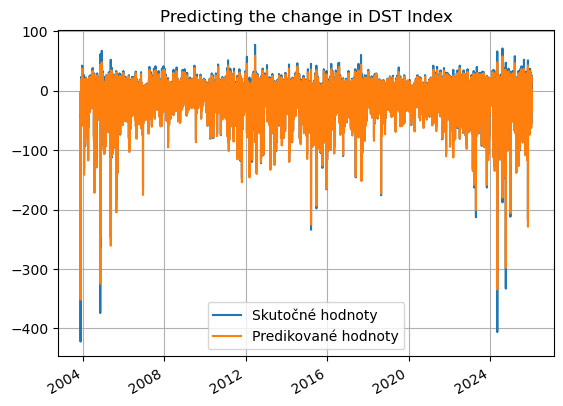

In [18]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [19]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9589496127224786
MCC=0.8769628419287114
Výkon NN:
MAE: 2.4507, MSE: 14.0606
Perzistentný model:
MAE: 2.5680, MSE: 16.3212
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 4.57%
MSE Improvement: 13.85%


In [20]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 86ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step 

686/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 42s 47ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step 

 18/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

552/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 36s 47ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 13:04 877ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step   

  3/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 47s 53ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step 

689/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 48ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step 

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

551/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step


Shapes LSTM:
train: (229332,) (229332,)
val:   (57315,) (57315,)
test:  (194176,) (194176,)
Global sigma (LSTM errors, scaled): 0.2044171
Shapes GP:
X_gp_train: (286647, 24)
y_gp_train: (286647,)
X_test_gp: (194176, 24)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.79**2 * RBF(length_scale=0.397) + WhiteKernel(noise_level=0.641)


Global sigma (LSTM errors): 4.4979744
Hybrid prediction with smoothed, inflated interval ready.


In [21]:
len(y_hybrid_upper)

194176

In [22]:
len(y_pred_persistence)

194175

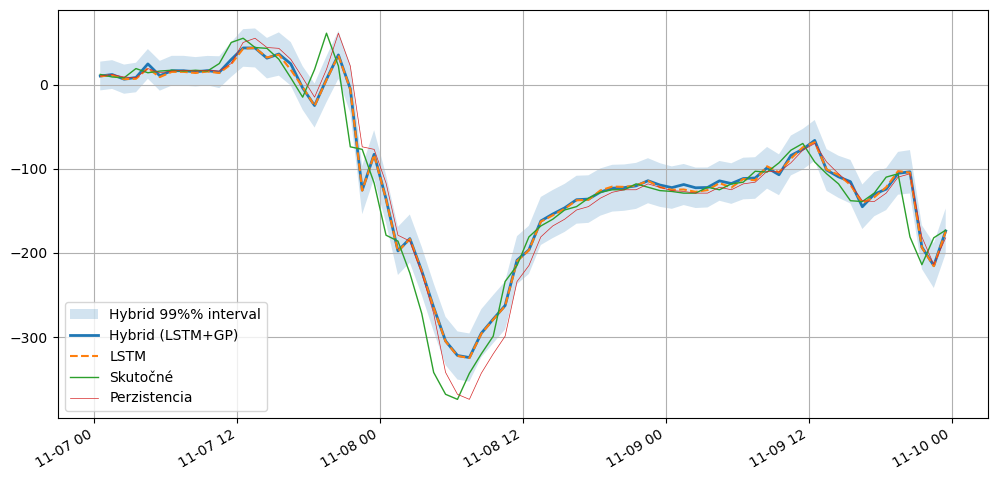

In [23]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [24]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = y_test_true
y_pred_hybrid = y_hybrid_mean

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 15.1463
MAE: 2.5002

--- Klasifikačné metriky (Prah: -21.0 nT) ---
Matthews Correlation Coefficient (MCC): 0.8578

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      149952 |        2093
Skutočná 1 |        7058 |       35073

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.96      0.99      0.97    152045
   Trieda 1 (Búrka)       0.94      0.83      0.88     42131

           accuracy                           0.95    194176
          macro avg       0.95      0.91      0.93    194176
       weighted avg       0.95      0.95      0.95    194176



In [25]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9589494013132484
MCC=0.876962675589418
Výkon NN:
MAE: 2.4507, MSE: 14.0606
Perzistentný model:
MAE: 2.5680, MSE: 16.3212
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 4.57%
MSE Improvement: 13.85%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9647    0.9836    0.9740    152044
           1     0.9362    0.8700    0.9019     42131

    accuracy                         0.9589    194175
   macro avg     0.9505    0.9268    0.9380    194175
weighted avg     0.9585    0.9589    0.9584    194175


===== LSTM+GP =====
ACC=0.9528724089094889
MCC=0.857788036505403
Výkon NN:
MAE: 2.5002, MSE: 15.1463
Perzistentný model:
MAE: 2.5680, MSE: 16.3212
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 2.64%
MSE Improvement: 7.20%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9550    0.9862    0.9704    152044
           1     0.9437    0.8325    0.8846     42131

    a

/tmp/ipykernel_36410/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_36410/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
0,2026-04-25T10:21:50,LSTM,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.2,0.959051,0.878128,"{""text"": "" precision recall f...",2.617042,15.244238,2.567961,16.320413,-1.911312,6.594046
1,2026-04-25T10:21:50,LSTM+GP,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.2,0.957444,0.872552,"{""text"": "" precision recall f...",2.472162,14.990141,2.567961,16.320413,3.730520,8.150970
2,2026-04-25T15:57:33,LSTM,12.0,1.0,DST+1,OMNI2_all,-20.0,-20.4,0.959039,0.878447,"{""text"": "" precision recall f...",2.610914,15.065203,2.567983,16.320737,-1.671768,7.692879
3,2026-04-25T15:57:33,LSTM+GP,12.0,1.0,DST+1,OMNI2_all,-20.0,-20.4,0.957222,0.871686,"{""text"": "" precision recall f...",2.484076,15.345948,2.567983,16.320737,3.267434,5.972702
4,2026-04-25T17:53:37,LSTM,18.0,1.0,DST+1,OMNI2_all,-20.0,-19.1,0.959327,0.879833,"{""text"": "" precision recall f...",2.448616,14.198152,2.567970,16.320912,4.647803,13.006378
5,2026-04-25T17:53:37,LSTM+GP,18.0,1.0,DST+1,OMNI2_all,-20.0,-19.1,0.956051,0.871779,"{""text"": "" precision recall f...",2.499449,15.078052,2.567970,16.320912,2.668300,7.615138
6,2026-04-25T19:31:27,LSTM,24.0,1.0,DST+1,OMNI2_all,-20.0,-21.0,0.958949,0.876963,"{""text"": "" precision recall f...",2.450730,14.060619,2.567993,16.321215,4.566335,13.850664
7,2026-04-25T19:31:27,LSTM+GP,24.0,1.0,DST+1,OMNI2_all,-20.0,-21.0,0.952872,0.857788,"{""text"": "" precision recall f...",2.500248,15.146312,2.567993,16.321215,2.638063,7.198630
